In [1]:
#!pip install beautifulsoup4

In [2]:
#!pip install gensim

In [3]:
import bs4 as bs
import urllib.request
import re
import nltk
import pandas as pd
import gensim 

scrapped_data = urllib.request.urlopen('https://en.wikipedia.org/wiki/Deep_learning')
article = scrapped_data .read()

parsed_article = bs.BeautifulSoup(article,'lxml')

paragraphs = parsed_article.find_all('p')

article_text = ""

for p in paragraphs:
    article_text += p.text

In [4]:
article_text

'Deep learning  (also known as deep structured learning) is part of a broader family of machine learning methods based on artificial neural networks with representation learning. Learning can be supervised, semi-supervised or unsupervised.[1][2][3]\nDeep learning architectures such as deep neural networks, deep belief networks, recurrent neural networks and convolutional neural networks have been applied to fields including computer vision, machine vision, speech recognition, natural language processing, audio recognition, social network filtering, machine translation, bioinformatics, drug design, medical image analysis, material inspection and board game programs, where they have produced results comparable to and in some cases surpassing human expert performance.[4][5][6]\nArtificial neural networks (ANNs) were inspired by information processing and distributed communication nodes in biological systems. ANNs have various differences from biological brains.  Specifically, neural netwo

In [5]:
# Cleaing the text
processed_article = article_text.lower()
processed_article = re.sub('[^a-zA-Z]', ' ', processed_article )
processed_article = re.sub(r'\s+', ' ', processed_article)

# Preparing the dataset

# first step split the paragraph into sentences
all_sentences = nltk.sent_tokenize(processed_article)
# split the sentences into words
all_words = [nltk.word_tokenize(sent) for sent in all_sentences]


# Removing Stop Words
from nltk.corpus import stopwords
for i in range(len(all_words)):
    all_words[i] = [w for w in all_words[i] if w not in stopwords.words('english')]
    
    
print(all_words)

[['deep', 'learning', 'also', 'known', 'deep', 'structured', 'learning', 'part', 'broader', 'family', 'machine', 'learning', 'methods', 'based', 'artificial', 'neural', 'networks', 'representation', 'learning', 'learning', 'supervised', 'semi', 'supervised', 'unsupervised', 'deep', 'learning', 'architectures', 'deep', 'neural', 'networks', 'deep', 'belief', 'networks', 'recurrent', 'neural', 'networks', 'convolutional', 'neural', 'networks', 'applied', 'fields', 'including', 'computer', 'vision', 'machine', 'vision', 'speech', 'recognition', 'natural', 'language', 'processing', 'audio', 'recognition', 'social', 'network', 'filtering', 'machine', 'translation', 'bioinformatics', 'drug', 'design', 'medical', 'image', 'analysis', 'material', 'inspection', 'board', 'game', 'programs', 'produced', 'results', 'comparable', 'cases', 'surpassing', 'human', 'expert', 'performance', 'artificial', 'neural', 'networks', 'anns', 'inspired', 'information', 'processing', 'distributed', 'communication

In [6]:
from gensim.models import Word2Vec



In [7]:
 word2vec = gensim.models.Word2Vec(
        all_words,
        size=300,
        window=10,
        min_count=2,
        workers=10,
        iter=10)

In [8]:
vocabulary = word2vec.wv.vocab
print(vocabulary)

{'deep': <gensim.models.keyedvectors.Vocab object at 0x000001756D882E48>, 'learning': <gensim.models.keyedvectors.Vocab object at 0x000001756D882EC8>, 'also': <gensim.models.keyedvectors.Vocab object at 0x000001756D882FC8>, 'known': <gensim.models.keyedvectors.Vocab object at 0x000001756D883048>, 'structured': <gensim.models.keyedvectors.Vocab object at 0x000001756D8830C8>, 'part': <gensim.models.keyedvectors.Vocab object at 0x000001756D8833C8>, 'machine': <gensim.models.keyedvectors.Vocab object at 0x000001756D883488>, 'methods': <gensim.models.keyedvectors.Vocab object at 0x000001756D883588>, 'based': <gensim.models.keyedvectors.Vocab object at 0x000001756D883088>, 'artificial': <gensim.models.keyedvectors.Vocab object at 0x000001756D883348>, 'neural': <gensim.models.keyedvectors.Vocab object at 0x000001756D883688>, 'networks': <gensim.models.keyedvectors.Vocab object at 0x000001756D883748>, 'representation': <gensim.models.keyedvectors.Vocab object at 0x000001756D883908>, 'supervise

In [9]:
v1 = word2vec.wv['learning']

In [10]:
print("embedding for word",v1)
print("dimensions of word embeddings",len(v1))

embedding for word [ 7.59700537e-02  7.55322799e-02 -8.21058229e-02 -5.45538105e-02
 -6.78899959e-02 -3.40409018e-02 -5.21909259e-02 -5.56484796e-02
 -5.44016361e-02 -2.05090754e-02  4.42161337e-02 -3.79901640e-02
 -2.30006464e-02  4.30535264e-02 -6.37879074e-02 -1.09814834e-02
  4.43166867e-02 -4.37168665e-02 -1.79653857e-02 -2.98852324e-02
  3.93086672e-02 -2.19857411e-05  1.06421122e-02  2.17557922e-02
 -9.03902762e-03  3.90037671e-02 -2.36949734e-02 -5.14676757e-02
 -4.61181886e-02  5.78450337e-02  3.33723873e-02  8.02002773e-02
  1.48996746e-03  4.16583717e-02  5.65301850e-02  3.51432748e-02
  1.97403394e-02 -1.69330239e-02 -2.75613610e-02 -6.00064136e-02
  3.84072699e-02 -2.69209743e-02  8.30676332e-02  2.96829212e-02
  1.74117088e-02 -4.53961417e-02 -6.35459945e-02  2.87485886e-02
  8.66581947e-02 -1.27902906e-02 -1.17996493e-02 -2.89686080e-02
  1.18936375e-02  4.76130564e-03 -1.87759474e-02  6.02087229e-02
 -8.10987200e-04  2.83977650e-02 -4.77531319e-03  3.74274664e-02
  1.10

In [11]:
similar_words = word2vec.wv.most_similar('learning',topn=5)

In [12]:
similar_words

[('deep', 0.9993874430656433),
 ('image', 0.9991294741630554),
 ('neural', 0.9991027116775513),
 ('training', 0.9990922212600708),
 ('data', 0.9990332126617432)]

In [13]:
word2vec.most_similar(positive=['deep','data'],negative=['learning'],topn=1)
#let's see if we add deep+data-learning what we get


C:\Users\colourfulm\anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('image', 0.9982308149337769)]

In [14]:
word2vec.most_similar(positive=['data','machine'],negative=['learning'],topn=1)

C:\Users\colourfulm\anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('deep', 0.9973325729370117)]

C:\Users\colourfulm\anaconda3\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  # Remove the CWD from sys.path while we load stuff.


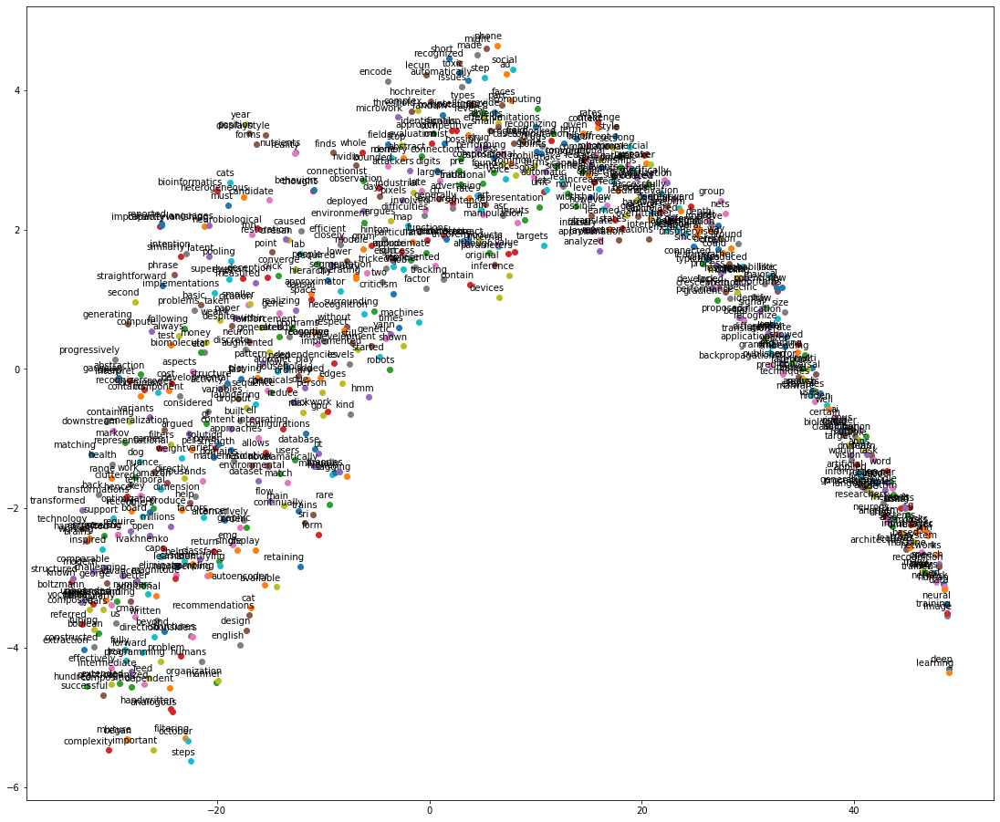

In [15]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in word2vec.wv.vocab:
        tokens.append(word2vec[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(19, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 5),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()
    
    
tsne_plot(word2vec)


## save this model weights for future use





In [16]:
from gensim.models import Word2Vec, KeyedVectors   
word2vec.save('model.bin')

In [17]:
#load it again to use this already trained
model = Word2Vec.load('model.bin')

#

In [18]:
model.wv['learning']

array([ 7.59700537e-02,  7.55322799e-02, -8.21058229e-02, -5.45538105e-02,
       -6.78899959e-02, -3.40409018e-02, -5.21909259e-02, -5.56484796e-02,
       -5.44016361e-02, -2.05090754e-02,  4.42161337e-02, -3.79901640e-02,
       -2.30006464e-02,  4.30535264e-02, -6.37879074e-02, -1.09814834e-02,
        4.43166867e-02, -4.37168665e-02, -1.79653857e-02, -2.98852324e-02,
        3.93086672e-02, -2.19857411e-05,  1.06421122e-02,  2.17557922e-02,
       -9.03902762e-03,  3.90037671e-02, -2.36949734e-02, -5.14676757e-02,
       -4.61181886e-02,  5.78450337e-02,  3.33723873e-02,  8.02002773e-02,
        1.48996746e-03,  4.16583717e-02,  5.65301850e-02,  3.51432748e-02,
        1.97403394e-02, -1.69330239e-02, -2.75613610e-02, -6.00064136e-02,
        3.84072699e-02, -2.69209743e-02,  8.30676332e-02,  2.96829212e-02,
        1.74117088e-02, -4.53961417e-02, -6.35459945e-02,  2.87485886e-02,
        8.66581947e-02, -1.27902906e-02, -1.17996493e-02, -2.89686080e-02,
        1.18936375e-02,  

# Understanding Parameters

### gensim.models.Word2Vec(documents, size=150, window=10, min_count=2, workers=10, iter=10)



size

this is the dimensions of the vector



window
The maximum distance between the target word and its neighboring word. If your neighbor’s position is greater than the maximum window width to the left or the right, then, some neighbors would not be considered as being related to the target word. In theory, a smaller window should give you terms that are more related. Again, if your data is not sparse, then the window size should not matter too much, as long as it’s not overly narrow or overly broad. If you are not too sure about this, just use the default value.

min_count
Minimium frequency count of words. The model would ignore words that do not satisfy the min_count. Extremely infrequent words are usually unimportant, so its best to get rid of those. Unless your dataset is really tiny, this does not really affect the model in terms of your final results. The settings here probably has more of an effect on memory usage and storage requirements of the model files.

workers
How many threads to use behind the scenes?

iter
Number of iterations (epochs) over the corpus. 5 is a good starting point. I always use a minimum of 10 iterations.




#Incase if you guys want to use intial google pretrained weights 
#you have to download file of 2gb and use that for your datset
#lets load the pretrain Word2Vec model from Google https://drive.google.com/file/d/0B7XkCwpI5KDYNlNUTTlSS21pQmM/edit

import gensim
from gensim.models import Word2Vec
from gensim.utils import simple_preprocess

from gensim.models.keyedvectors import KeyedVectors

word_vectors = KeyedVectors.load_word2vec_format('../GoogleNews-vectors-negative300.bin', binary=True)

EMBEDDING_DIM=300
vocabulary_size=min(len(word_index)+1,NUM_WORDS)
embedding_matrix = np.zeros((vocabulary_size, EMBEDDING_DIM))
for word, i in word_index.items():
    if i>=NUM_WORDS:
        continue
    try:
        embedding_vector = word_vectors[word]
        embedding_matrix[i] = embedding_vector
    except KeyError:
        embedding_matrix[i]=np.random.normal(0,np.sqrt(0.25),EMBEDDING_DIM)

del(word_vectors)

from keras.layers import Embedding
embedding_layer = Embedding(vocabulary_size,
                            EMBEDDING_DIM,
                            weights=[embedding_matrix],
                            trainable=True)





# GLOVE

# go here and download
#https://nlp.stanford.edu/projects/glove/glove6B zip file extarct it 
#and give path name below 




import numpy as np
def loadGloveModel(gloveFile):
    print("Loading Glove Model")
    f = open(gloveFile,'r')
    model = {}
    for line in f:
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print("Done.",len(model)," words loaded!")
    return model

model = loadGloveModel("/Users/harika/Downloads/glove.6B/glove.6B.50d.txt")

print(model["this"])

In [19]:
import numpy as np
def loadGloveModel(gloveFile):
    print("Loading Glove Model")
    f = open(gloveFile,'r',encoding="utf8") 
    model = {}
    for line in f:
        splitLine = line.split()
        word = splitLine[0] 
        embedding = np.array([float(val) for val in splitLine[1:]]) 
        model[word] = embedding
        print("Done.",len(model)," words loaded!") 
    return model

In [20]:
model = loadGloveModel("F:/abhi/deep learning/materials/glove.6B/glove.6B.50d.txt")

Loading Glove Model
Done. 1  words loaded!
Done. 2  words loaded!
Done. 3  words loaded!
Done. 4  words loaded!
Done. 5  words loaded!
Done. 6  words loaded!
Done. 7  words loaded!
Done. 8  words loaded!
Done. 9  words loaded!
Done. 10  words loaded!
Done. 11  words loaded!
Done. 12  words loaded!
Done. 13  words loaded!
Done. 14  words loaded!
Done. 15  words loaded!
Done. 16  words loaded!
Done. 17  words loaded!
Done. 18  words loaded!
Done. 19  words loaded!
Done. 20  words loaded!
Done. 21  words loaded!
Done. 22  words loaded!
Done. 23  words loaded!
Done. 24  words loaded!
Done. 25  words loaded!
Done. 26  words loaded!
Done. 27  words loaded!
Done. 28  words loaded!
Done. 29  words loaded!
Done. 30  words loaded!
Done. 31  words loaded!
Done. 32  words loaded!
Done. 33  words loaded!
Done. 34  words loaded!
Done. 35  words loaded!
Done. 36  words loaded!
Done. 37  words loaded!
Done. 38  words loaded!
Done. 39  words loaded!
Done. 40  words loaded!
Done. 41  words loaded!
Done.

Done. 452  words loaded!
Done. 453  words loaded!
Done. 454  words loaded!
Done. 455  words loaded!
Done. 456  words loaded!
Done. 457  words loaded!
Done. 458  words loaded!
Done. 459  words loaded!
Done. 460  words loaded!
Done. 461  words loaded!
Done. 462  words loaded!
Done. 463  words loaded!
Done. 464  words loaded!
Done. 465  words loaded!
Done. 466  words loaded!
Done. 467  words loaded!
Done. 468  words loaded!
Done. 469  words loaded!
Done. 470  words loaded!
Done. 471  words loaded!
Done. 472  words loaded!
Done. 473  words loaded!
Done. 474  words loaded!
Done. 475  words loaded!
Done. 476  words loaded!
Done. 477  words loaded!
Done. 478  words loaded!
Done. 479  words loaded!
Done. 480  words loaded!
Done. 481  words loaded!
Done. 482  words loaded!
Done. 483  words loaded!
Done. 484  words loaded!
Done. 485  words loaded!
Done. 486  words loaded!
Done. 487  words loaded!
Done. 488  words loaded!
Done. 489  words loaded!
Done. 490  words loaded!
Done. 491  words loaded!


Done. 807  words loaded!
Done. 808  words loaded!
Done. 809  words loaded!
Done. 810  words loaded!
Done. 811  words loaded!
Done. 812  words loaded!
Done. 813  words loaded!
Done. 814  words loaded!
Done. 815  words loaded!
Done. 816  words loaded!
Done. 817  words loaded!
Done. 818  words loaded!
Done. 819  words loaded!
Done. 820  words loaded!
Done. 821  words loaded!
Done. 822  words loaded!
Done. 823  words loaded!
Done. 824  words loaded!
Done. 825  words loaded!
Done. 826  words loaded!
Done. 827  words loaded!
Done. 828  words loaded!
Done. 829  words loaded!
Done. 830  words loaded!
Done. 831  words loaded!
Done. 832  words loaded!
Done. 833  words loaded!
Done. 834  words loaded!
Done. 835  words loaded!
Done. 836  words loaded!
Done. 837  words loaded!
Done. 838  words loaded!
Done. 839  words loaded!
Done. 840  words loaded!
Done. 841  words loaded!
Done. 842  words loaded!
Done. 843  words loaded!
Done. 844  words loaded!
Done. 845  words loaded!
Done. 846  words loaded!


Done. 1532  words loaded!
Done. 1533  words loaded!
Done. 1534  words loaded!
Done. 1535  words loaded!
Done. 1536  words loaded!
Done. 1537  words loaded!
Done. 1538  words loaded!
Done. 1539  words loaded!
Done. 1540  words loaded!
Done. 1541  words loaded!
Done. 1542  words loaded!
Done. 1543  words loaded!
Done. 1544  words loaded!
Done. 1545  words loaded!
Done. 1546  words loaded!
Done. 1547  words loaded!
Done. 1548  words loaded!
Done. 1549  words loaded!
Done. 1550  words loaded!
Done. 1551  words loaded!
Done. 1552  words loaded!
Done. 1553  words loaded!
Done. 1554  words loaded!
Done. 1555  words loaded!
Done. 1556  words loaded!
Done. 1557  words loaded!
Done. 1558  words loaded!
Done. 1559  words loaded!
Done. 1560  words loaded!
Done. 1561  words loaded!
Done. 1562  words loaded!
Done. 1563  words loaded!
Done. 1564  words loaded!
Done. 1565  words loaded!
Done. 1566  words loaded!
Done. 1567  words loaded!
Done. 1568  words loaded!
Done. 1569  words loaded!
Done. 1570  

Done. 1861  words loaded!
Done. 1862  words loaded!
Done. 1863  words loaded!
Done. 1864  words loaded!
Done. 1865  words loaded!
Done. 1866  words loaded!
Done. 1867  words loaded!
Done. 1868  words loaded!
Done. 1869  words loaded!
Done. 1870  words loaded!
Done. 1871  words loaded!
Done. 1872  words loaded!
Done. 1873  words loaded!
Done. 1874  words loaded!
Done. 1875  words loaded!
Done. 1876  words loaded!
Done. 1877  words loaded!
Done. 1878  words loaded!
Done. 1879  words loaded!
Done. 1880  words loaded!
Done. 1881  words loaded!
Done. 1882  words loaded!
Done. 1883  words loaded!
Done. 1884  words loaded!
Done. 1885  words loaded!
Done. 1886  words loaded!
Done. 1887  words loaded!
Done. 1888  words loaded!
Done. 1889  words loaded!
Done. 1890  words loaded!
Done. 1891  words loaded!
Done. 1892  words loaded!
Done. 1893  words loaded!
Done. 1894  words loaded!
Done. 1895  words loaded!
Done. 1896  words loaded!
Done. 1897  words loaded!
Done. 1898  words loaded!
Done. 1899  

Done. 2403  words loaded!
Done. 2404  words loaded!
Done. 2405  words loaded!
Done. 2406  words loaded!
Done. 2407  words loaded!
Done. 2408  words loaded!
Done. 2409  words loaded!
Done. 2410  words loaded!
Done. 2411  words loaded!
Done. 2412  words loaded!
Done. 2413  words loaded!
Done. 2414  words loaded!
Done. 2415  words loaded!
Done. 2416  words loaded!
Done. 2417  words loaded!
Done. 2418  words loaded!
Done. 2419  words loaded!
Done. 2420  words loaded!
Done. 2421  words loaded!
Done. 2422  words loaded!
Done. 2423  words loaded!
Done. 2424  words loaded!
Done. 2425  words loaded!
Done. 2426  words loaded!
Done. 2427  words loaded!
Done. 2428  words loaded!
Done. 2429  words loaded!
Done. 2430  words loaded!
Done. 2431  words loaded!
Done. 2432  words loaded!
Done. 2433  words loaded!
Done. 2434  words loaded!
Done. 2435  words loaded!
Done. 2436  words loaded!
Done. 2437  words loaded!
Done. 2438  words loaded!
Done. 2439  words loaded!
Done. 2440  words loaded!
Done. 2441  

Done. 2969  words loaded!
Done. 2970  words loaded!
Done. 2971  words loaded!
Done. 2972  words loaded!
Done. 2973  words loaded!
Done. 2974  words loaded!
Done. 2975  words loaded!
Done. 2976  words loaded!
Done. 2977  words loaded!
Done. 2978  words loaded!
Done. 2979  words loaded!
Done. 2980  words loaded!
Done. 2981  words loaded!
Done. 2982  words loaded!
Done. 2983  words loaded!
Done. 2984  words loaded!
Done. 2985  words loaded!
Done. 2986  words loaded!
Done. 2987  words loaded!
Done. 2988  words loaded!
Done. 2989  words loaded!
Done. 2990  words loaded!
Done. 2991  words loaded!
Done. 2992  words loaded!
Done. 2993  words loaded!
Done. 2994  words loaded!
Done. 2995  words loaded!
Done. 2996  words loaded!
Done. 2997  words loaded!
Done. 2998  words loaded!
Done. 2999  words loaded!
Done. 3000  words loaded!
Done. 3001  words loaded!
Done. 3002  words loaded!
Done. 3003  words loaded!
Done. 3004  words loaded!
Done. 3005  words loaded!
Done. 3006  words loaded!
Done. 3007  

Done. 3301  words loaded!
Done. 3302  words loaded!
Done. 3303  words loaded!
Done. 3304  words loaded!
Done. 3305  words loaded!
Done. 3306  words loaded!
Done. 3307  words loaded!
Done. 3308  words loaded!
Done. 3309  words loaded!
Done. 3310  words loaded!
Done. 3311  words loaded!
Done. 3312  words loaded!
Done. 3313  words loaded!
Done. 3314  words loaded!
Done. 3315  words loaded!
Done. 3316  words loaded!
Done. 3317  words loaded!
Done. 3318  words loaded!
Done. 3319  words loaded!
Done. 3320  words loaded!
Done. 3321  words loaded!
Done. 3322  words loaded!
Done. 3323  words loaded!
Done. 3324  words loaded!
Done. 3325  words loaded!
Done. 3326  words loaded!
Done. 3327  words loaded!
Done. 3328  words loaded!
Done. 3329  words loaded!
Done. 3330  words loaded!
Done. 3331  words loaded!
Done. 3332  words loaded!
Done. 3333  words loaded!
Done. 3334  words loaded!
Done. 3335  words loaded!
Done. 3336  words loaded!
Done. 3337  words loaded!
Done. 3338  words loaded!
Done. 3339  

Done. 3861  words loaded!
Done. 3862  words loaded!
Done. 3863  words loaded!
Done. 3864  words loaded!
Done. 3865  words loaded!
Done. 3866  words loaded!
Done. 3867  words loaded!
Done. 3868  words loaded!
Done. 3869  words loaded!
Done. 3870  words loaded!
Done. 3871  words loaded!
Done. 3872  words loaded!
Done. 3873  words loaded!
Done. 3874  words loaded!
Done. 3875  words loaded!
Done. 3876  words loaded!
Done. 3877  words loaded!
Done. 3878  words loaded!
Done. 3879  words loaded!
Done. 3880  words loaded!
Done. 3881  words loaded!
Done. 3882  words loaded!
Done. 3883  words loaded!
Done. 3884  words loaded!
Done. 3885  words loaded!
Done. 3886  words loaded!
Done. 3887  words loaded!
Done. 3888  words loaded!
Done. 3889  words loaded!
Done. 3890  words loaded!
Done. 3891  words loaded!
Done. 3892  words loaded!
Done. 3893  words loaded!
Done. 3894  words loaded!
Done. 3895  words loaded!
Done. 3896  words loaded!
Done. 3897  words loaded!
Done. 3898  words loaded!
Done. 3899  

Done. 4287  words loaded!
Done. 4288  words loaded!
Done. 4289  words loaded!
Done. 4290  words loaded!
Done. 4291  words loaded!
Done. 4292  words loaded!
Done. 4293  words loaded!
Done. 4294  words loaded!
Done. 4295  words loaded!
Done. 4296  words loaded!
Done. 4297  words loaded!
Done. 4298  words loaded!
Done. 4299  words loaded!
Done. 4300  words loaded!
Done. 4301  words loaded!
Done. 4302  words loaded!
Done. 4303  words loaded!
Done. 4304  words loaded!
Done. 4305  words loaded!
Done. 4306  words loaded!
Done. 4307  words loaded!
Done. 4308  words loaded!
Done. 4309  words loaded!
Done. 4310  words loaded!
Done. 4311  words loaded!
Done. 4312  words loaded!
Done. 4313  words loaded!
Done. 4314  words loaded!
Done. 4315  words loaded!
Done. 4316  words loaded!
Done. 4317  words loaded!
Done. 4318  words loaded!
Done. 4319  words loaded!
Done. 4320  words loaded!
Done. 4321  words loaded!
Done. 4322  words loaded!
Done. 4323  words loaded!
Done. 4324  words loaded!
Done. 4325  

Done. 4650  words loaded!
Done. 4651  words loaded!
Done. 4652  words loaded!
Done. 4653  words loaded!
Done. 4654  words loaded!
Done. 4655  words loaded!
Done. 4656  words loaded!
Done. 4657  words loaded!
Done. 4658  words loaded!
Done. 4659  words loaded!
Done. 4660  words loaded!
Done. 4661  words loaded!
Done. 4662  words loaded!
Done. 4663  words loaded!
Done. 4664  words loaded!
Done. 4665  words loaded!
Done. 4666  words loaded!
Done. 4667  words loaded!
Done. 4668  words loaded!
Done. 4669  words loaded!
Done. 4670  words loaded!
Done. 4671  words loaded!
Done. 4672  words loaded!
Done. 4673  words loaded!
Done. 4674  words loaded!
Done. 4675  words loaded!
Done. 4676  words loaded!
Done. 4677  words loaded!
Done. 4678  words loaded!
Done. 4679  words loaded!
Done. 4680  words loaded!
Done. 4681  words loaded!
Done. 4682  words loaded!
Done. 4683  words loaded!
Done. 4684  words loaded!
Done. 4685  words loaded!
Done. 4686  words loaded!
Done. 4687  words loaded!
Done. 4688  

Done. 4990  words loaded!
Done. 4991  words loaded!
Done. 4992  words loaded!
Done. 4993  words loaded!
Done. 4994  words loaded!
Done. 4995  words loaded!
Done. 4996  words loaded!
Done. 4997  words loaded!
Done. 4998  words loaded!
Done. 4999  words loaded!
Done. 5000  words loaded!
Done. 5001  words loaded!
Done. 5002  words loaded!
Done. 5003  words loaded!
Done. 5004  words loaded!
Done. 5005  words loaded!
Done. 5006  words loaded!
Done. 5007  words loaded!
Done. 5008  words loaded!
Done. 5009  words loaded!
Done. 5010  words loaded!
Done. 5011  words loaded!
Done. 5012  words loaded!
Done. 5013  words loaded!
Done. 5014  words loaded!
Done. 5015  words loaded!
Done. 5016  words loaded!
Done. 5017  words loaded!
Done. 5018  words loaded!
Done. 5019  words loaded!
Done. 5020  words loaded!
Done. 5021  words loaded!
Done. 5022  words loaded!
Done. 5023  words loaded!
Done. 5024  words loaded!
Done. 5025  words loaded!
Done. 5026  words loaded!
Done. 5027  words loaded!
Done. 5028  

Done. 5390  words loaded!
Done. 5391  words loaded!
Done. 5392  words loaded!
Done. 5393  words loaded!
Done. 5394  words loaded!
Done. 5395  words loaded!
Done. 5396  words loaded!
Done. 5397  words loaded!
Done. 5398  words loaded!
Done. 5399  words loaded!
Done. 5400  words loaded!
Done. 5401  words loaded!
Done. 5402  words loaded!
Done. 5403  words loaded!
Done. 5404  words loaded!
Done. 5405  words loaded!
Done. 5406  words loaded!
Done. 5407  words loaded!
Done. 5408  words loaded!
Done. 5409  words loaded!
Done. 5410  words loaded!
Done. 5411  words loaded!
Done. 5412  words loaded!
Done. 5413  words loaded!
Done. 5414  words loaded!
Done. 5415  words loaded!
Done. 5416  words loaded!
Done. 5417  words loaded!
Done. 5418  words loaded!
Done. 5419  words loaded!
Done. 5420  words loaded!
Done. 5421  words loaded!
Done. 5422  words loaded!
Done. 5423  words loaded!
Done. 5424  words loaded!
Done. 5425  words loaded!
Done. 5426  words loaded!
Done. 5427  words loaded!
Done. 5428  

Done. 5774  words loaded!
Done. 5775  words loaded!
Done. 5776  words loaded!
Done. 5777  words loaded!
Done. 5778  words loaded!
Done. 5779  words loaded!
Done. 5780  words loaded!
Done. 5781  words loaded!
Done. 5782  words loaded!
Done. 5783  words loaded!
Done. 5784  words loaded!
Done. 5785  words loaded!
Done. 5786  words loaded!
Done. 5787  words loaded!
Done. 5788  words loaded!
Done. 5789  words loaded!
Done. 5790  words loaded!
Done. 5791  words loaded!
Done. 5792  words loaded!
Done. 5793  words loaded!
Done. 5794  words loaded!
Done. 5795  words loaded!
Done. 5796  words loaded!
Done. 5797  words loaded!
Done. 5798  words loaded!
Done. 5799  words loaded!
Done. 5800  words loaded!
Done. 5801  words loaded!
Done. 5802  words loaded!
Done. 5803  words loaded!
Done. 5804  words loaded!
Done. 5805  words loaded!
Done. 5806  words loaded!
Done. 5807  words loaded!
Done. 5808  words loaded!
Done. 5809  words loaded!
Done. 5810  words loaded!
Done. 5811  words loaded!
Done. 5812  

Done. 6104  words loaded!
Done. 6105  words loaded!
Done. 6106  words loaded!
Done. 6107  words loaded!
Done. 6108  words loaded!
Done. 6109  words loaded!
Done. 6110  words loaded!
Done. 6111  words loaded!
Done. 6112  words loaded!
Done. 6113  words loaded!
Done. 6114  words loaded!
Done. 6115  words loaded!
Done. 6116  words loaded!
Done. 6117  words loaded!
Done. 6118  words loaded!
Done. 6119  words loaded!
Done. 6120  words loaded!
Done. 6121  words loaded!
Done. 6122  words loaded!
Done. 6123  words loaded!
Done. 6124  words loaded!
Done. 6125  words loaded!
Done. 6126  words loaded!
Done. 6127  words loaded!
Done. 6128  words loaded!
Done. 6129  words loaded!
Done. 6130  words loaded!
Done. 6131  words loaded!
Done. 6132  words loaded!
Done. 6133  words loaded!
Done. 6134  words loaded!
Done. 6135  words loaded!
Done. 6136  words loaded!
Done. 6137  words loaded!
Done. 6138  words loaded!
Done. 6139  words loaded!
Done. 6140  words loaded!
Done. 6141  words loaded!
Done. 6142  

Done. 6575  words loaded!
Done. 6576  words loaded!
Done. 6577  words loaded!
Done. 6578  words loaded!
Done. 6579  words loaded!
Done. 6580  words loaded!
Done. 6581  words loaded!
Done. 6582  words loaded!
Done. 6583  words loaded!
Done. 6584  words loaded!
Done. 6585  words loaded!
Done. 6586  words loaded!
Done. 6587  words loaded!
Done. 6588  words loaded!
Done. 6589  words loaded!
Done. 6590  words loaded!
Done. 6591  words loaded!
Done. 6592  words loaded!
Done. 6593  words loaded!
Done. 6594  words loaded!
Done. 6595  words loaded!
Done. 6596  words loaded!
Done. 6597  words loaded!
Done. 6598  words loaded!
Done. 6599  words loaded!
Done. 6600  words loaded!
Done. 6601  words loaded!
Done. 6602  words loaded!
Done. 6603  words loaded!
Done. 6604  words loaded!
Done. 6605  words loaded!
Done. 6606  words loaded!
Done. 6607  words loaded!
Done. 6608  words loaded!
Done. 6609  words loaded!
Done. 6610  words loaded!
Done. 6611  words loaded!
Done. 6612  words loaded!
Done. 6613  

Done. 7265  words loaded!
Done. 7266  words loaded!
Done. 7267  words loaded!
Done. 7268  words loaded!
Done. 7269  words loaded!
Done. 7270  words loaded!
Done. 7271  words loaded!
Done. 7272  words loaded!
Done. 7273  words loaded!
Done. 7274  words loaded!
Done. 7275  words loaded!
Done. 7276  words loaded!
Done. 7277  words loaded!
Done. 7278  words loaded!
Done. 7279  words loaded!
Done. 7280  words loaded!
Done. 7281  words loaded!
Done. 7282  words loaded!
Done. 7283  words loaded!
Done. 7284  words loaded!
Done. 7285  words loaded!
Done. 7286  words loaded!
Done. 7287  words loaded!
Done. 7288  words loaded!
Done. 7289  words loaded!
Done. 7290  words loaded!
Done. 7291  words loaded!
Done. 7292  words loaded!
Done. 7293  words loaded!
Done. 7294  words loaded!
Done. 7295  words loaded!
Done. 7296  words loaded!
Done. 7297  words loaded!
Done. 7298  words loaded!
Done. 7299  words loaded!
Done. 7300  words loaded!
Done. 7301  words loaded!
Done. 7302  words loaded!
Done. 7303  

Done. 7726  words loaded!
Done. 7727  words loaded!
Done. 7728  words loaded!
Done. 7729  words loaded!
Done. 7730  words loaded!
Done. 7731  words loaded!
Done. 7732  words loaded!
Done. 7733  words loaded!
Done. 7734  words loaded!
Done. 7735  words loaded!
Done. 7736  words loaded!
Done. 7737  words loaded!
Done. 7738  words loaded!
Done. 7739  words loaded!
Done. 7740  words loaded!
Done. 7741  words loaded!
Done. 7742  words loaded!
Done. 7743  words loaded!
Done. 7744  words loaded!
Done. 7745  words loaded!
Done. 7746  words loaded!
Done. 7747  words loaded!
Done. 7748  words loaded!
Done. 7749  words loaded!
Done. 7750  words loaded!
Done. 7751  words loaded!
Done. 7752  words loaded!
Done. 7753  words loaded!
Done. 7754  words loaded!
Done. 7755  words loaded!
Done. 7756  words loaded!
Done. 7757  words loaded!
Done. 7758  words loaded!
Done. 7759  words loaded!
Done. 7760  words loaded!
Done. 7761  words loaded!
Done. 7762  words loaded!
Done. 7763  words loaded!
Done. 7764  

Done. 8042  words loaded!
Done. 8043  words loaded!
Done. 8044  words loaded!
Done. 8045  words loaded!
Done. 8046  words loaded!
Done. 8047  words loaded!
Done. 8048  words loaded!
Done. 8049  words loaded!
Done. 8050  words loaded!
Done. 8051  words loaded!
Done. 8052  words loaded!
Done. 8053  words loaded!
Done. 8054  words loaded!
Done. 8055  words loaded!
Done. 8056  words loaded!
Done. 8057  words loaded!
Done. 8058  words loaded!
Done. 8059  words loaded!
Done. 8060  words loaded!
Done. 8061  words loaded!
Done. 8062  words loaded!
Done. 8063  words loaded!
Done. 8064  words loaded!
Done. 8065  words loaded!
Done. 8066  words loaded!
Done. 8067  words loaded!
Done. 8068  words loaded!
Done. 8069  words loaded!
Done. 8070  words loaded!
Done. 8071  words loaded!
Done. 8072  words loaded!
Done. 8073  words loaded!
Done. 8074  words loaded!
Done. 8075  words loaded!
Done. 8076  words loaded!
Done. 8077  words loaded!
Done. 8078  words loaded!
Done. 8079  words loaded!
Done. 8080  

Done. 8437  words loaded!
Done. 8438  words loaded!
Done. 8439  words loaded!
Done. 8440  words loaded!
Done. 8441  words loaded!
Done. 8442  words loaded!
Done. 8443  words loaded!
Done. 8444  words loaded!
Done. 8445  words loaded!
Done. 8446  words loaded!
Done. 8447  words loaded!
Done. 8448  words loaded!
Done. 8449  words loaded!
Done. 8450  words loaded!
Done. 8451  words loaded!
Done. 8452  words loaded!
Done. 8453  words loaded!
Done. 8454  words loaded!
Done. 8455  words loaded!
Done. 8456  words loaded!
Done. 8457  words loaded!
Done. 8458  words loaded!
Done. 8459  words loaded!
Done. 8460  words loaded!
Done. 8461  words loaded!
Done. 8462  words loaded!
Done. 8463  words loaded!
Done. 8464  words loaded!
Done. 8465  words loaded!
Done. 8466  words loaded!
Done. 8467  words loaded!
Done. 8468  words loaded!
Done. 8469  words loaded!
Done. 8470  words loaded!
Done. 8471  words loaded!
Done. 8472  words loaded!
Done. 8473  words loaded!
Done. 8474  words loaded!
Done. 8475  

Done. 9081  words loaded!
Done. 9082  words loaded!
Done. 9083  words loaded!
Done. 9084  words loaded!
Done. 9085  words loaded!
Done. 9086  words loaded!
Done. 9087  words loaded!
Done. 9088  words loaded!
Done. 9089  words loaded!
Done. 9090  words loaded!
Done. 9091  words loaded!
Done. 9092  words loaded!
Done. 9093  words loaded!
Done. 9094  words loaded!
Done. 9095  words loaded!
Done. 9096  words loaded!
Done. 9097  words loaded!
Done. 9098  words loaded!
Done. 9099  words loaded!
Done. 9100  words loaded!
Done. 9101  words loaded!
Done. 9102  words loaded!
Done. 9103  words loaded!
Done. 9104  words loaded!
Done. 9105  words loaded!
Done. 9106  words loaded!
Done. 9107  words loaded!
Done. 9108  words loaded!
Done. 9109  words loaded!
Done. 9110  words loaded!
Done. 9111  words loaded!
Done. 9112  words loaded!
Done. 9113  words loaded!
Done. 9114  words loaded!
Done. 9115  words loaded!
Done. 9116  words loaded!
Done. 9117  words loaded!
Done. 9118  words loaded!
Done. 9119  

Done. 9734  words loaded!
Done. 9735  words loaded!
Done. 9736  words loaded!
Done. 9737  words loaded!
Done. 9738  words loaded!
Done. 9739  words loaded!
Done. 9740  words loaded!
Done. 9741  words loaded!
Done. 9742  words loaded!
Done. 9743  words loaded!
Done. 9744  words loaded!
Done. 9745  words loaded!
Done. 9746  words loaded!
Done. 9747  words loaded!
Done. 9748  words loaded!
Done. 9749  words loaded!
Done. 9750  words loaded!
Done. 9751  words loaded!
Done. 9752  words loaded!
Done. 9753  words loaded!
Done. 9754  words loaded!
Done. 9755  words loaded!
Done. 9756  words loaded!
Done. 9757  words loaded!
Done. 9758  words loaded!
Done. 9759  words loaded!
Done. 9760  words loaded!
Done. 9761  words loaded!
Done. 9762  words loaded!
Done. 9763  words loaded!
Done. 9764  words loaded!
Done. 9765  words loaded!
Done. 9766  words loaded!
Done. 9767  words loaded!
Done. 9768  words loaded!
Done. 9769  words loaded!
Done. 9770  words loaded!
Done. 9771  words loaded!
Done. 9772  

Done. 10052  words loaded!
Done. 10053  words loaded!
Done. 10054  words loaded!
Done. 10055  words loaded!
Done. 10056  words loaded!
Done. 10057  words loaded!
Done. 10058  words loaded!
Done. 10059  words loaded!
Done. 10060  words loaded!
Done. 10061  words loaded!
Done. 10062  words loaded!
Done. 10063  words loaded!
Done. 10064  words loaded!
Done. 10065  words loaded!
Done. 10066  words loaded!
Done. 10067  words loaded!
Done. 10068  words loaded!
Done. 10069  words loaded!
Done. 10070  words loaded!
Done. 10071  words loaded!
Done. 10072  words loaded!
Done. 10073  words loaded!
Done. 10074  words loaded!
Done. 10075  words loaded!
Done. 10076  words loaded!
Done. 10077  words loaded!
Done. 10078  words loaded!
Done. 10079  words loaded!
Done. 10080  words loaded!
Done. 10081  words loaded!
Done. 10082  words loaded!
Done. 10083  words loaded!
Done. 10084  words loaded!
Done. 10085  words loaded!
Done. 10086  words loaded!
Done. 10087  words loaded!
Done. 10088  words loaded!
D

Done. 10476  words loaded!
Done. 10477  words loaded!
Done. 10478  words loaded!
Done. 10479  words loaded!
Done. 10480  words loaded!
Done. 10481  words loaded!
Done. 10482  words loaded!
Done. 10483  words loaded!
Done. 10484  words loaded!
Done. 10485  words loaded!
Done. 10486  words loaded!
Done. 10487  words loaded!
Done. 10488  words loaded!
Done. 10489  words loaded!
Done. 10490  words loaded!
Done. 10491  words loaded!
Done. 10492  words loaded!
Done. 10493  words loaded!
Done. 10494  words loaded!
Done. 10495  words loaded!
Done. 10496  words loaded!
Done. 10497  words loaded!
Done. 10498  words loaded!
Done. 10499  words loaded!
Done. 10500  words loaded!
Done. 10501  words loaded!
Done. 10502  words loaded!
Done. 10503  words loaded!
Done. 10504  words loaded!
Done. 10505  words loaded!
Done. 10506  words loaded!
Done. 10507  words loaded!
Done. 10508  words loaded!
Done. 10509  words loaded!
Done. 10510  words loaded!
Done. 10511  words loaded!
Done. 10512  words loaded!
D

Done. 10798  words loaded!
Done. 10799  words loaded!
Done. 10800  words loaded!
Done. 10801  words loaded!
Done. 10802  words loaded!
Done. 10803  words loaded!
Done. 10804  words loaded!
Done. 10805  words loaded!
Done. 10806  words loaded!
Done. 10807  words loaded!
Done. 10808  words loaded!
Done. 10809  words loaded!
Done. 10810  words loaded!
Done. 10811  words loaded!
Done. 10812  words loaded!
Done. 10813  words loaded!
Done. 10814  words loaded!
Done. 10815  words loaded!
Done. 10816  words loaded!
Done. 10817  words loaded!
Done. 10818  words loaded!
Done. 10819  words loaded!
Done. 10820  words loaded!
Done. 10821  words loaded!
Done. 10822  words loaded!
Done. 10823  words loaded!
Done. 10824  words loaded!
Done. 10825  words loaded!
Done. 10826  words loaded!
Done. 10827  words loaded!
Done. 10828  words loaded!
Done. 10829  words loaded!
Done. 10830  words loaded!
Done. 10831  words loaded!
Done. 10832  words loaded!
Done. 10833  words loaded!
Done. 10834  words loaded!
D

Done. 11280  words loaded!
Done. 11281  words loaded!
Done. 11282  words loaded!
Done. 11283  words loaded!
Done. 11284  words loaded!
Done. 11285  words loaded!
Done. 11286  words loaded!
Done. 11287  words loaded!
Done. 11288  words loaded!
Done. 11289  words loaded!
Done. 11290  words loaded!
Done. 11291  words loaded!
Done. 11292  words loaded!
Done. 11293  words loaded!
Done. 11294  words loaded!
Done. 11295  words loaded!
Done. 11296  words loaded!
Done. 11297  words loaded!
Done. 11298  words loaded!
Done. 11299  words loaded!
Done. 11300  words loaded!
Done. 11301  words loaded!
Done. 11302  words loaded!
Done. 11303  words loaded!
Done. 11304  words loaded!
Done. 11305  words loaded!
Done. 11306  words loaded!
Done. 11307  words loaded!
Done. 11308  words loaded!
Done. 11309  words loaded!
Done. 11310  words loaded!
Done. 11311  words loaded!
Done. 11312  words loaded!
Done. 11313  words loaded!
Done. 11314  words loaded!
Done. 11315  words loaded!
Done. 11316  words loaded!
D

Done. 11605  words loaded!
Done. 11606  words loaded!
Done. 11607  words loaded!
Done. 11608  words loaded!
Done. 11609  words loaded!
Done. 11610  words loaded!
Done. 11611  words loaded!
Done. 11612  words loaded!
Done. 11613  words loaded!
Done. 11614  words loaded!
Done. 11615  words loaded!
Done. 11616  words loaded!
Done. 11617  words loaded!
Done. 11618  words loaded!
Done. 11619  words loaded!
Done. 11620  words loaded!
Done. 11621  words loaded!
Done. 11622  words loaded!
Done. 11623  words loaded!
Done. 11624  words loaded!
Done. 11625  words loaded!
Done. 11626  words loaded!
Done. 11627  words loaded!
Done. 11628  words loaded!
Done. 11629  words loaded!
Done. 11630  words loaded!
Done. 11631  words loaded!
Done. 11632  words loaded!
Done. 11633  words loaded!
Done. 11634  words loaded!
Done. 11635  words loaded!
Done. 11636  words loaded!
Done. 11637  words loaded!
Done. 11638  words loaded!
Done. 11639  words loaded!
Done. 11640  words loaded!
Done. 11641  words loaded!
D

Done. 11986  words loaded!
Done. 11987  words loaded!
Done. 11988  words loaded!
Done. 11989  words loaded!
Done. 11990  words loaded!
Done. 11991  words loaded!
Done. 11992  words loaded!
Done. 11993  words loaded!
Done. 11994  words loaded!
Done. 11995  words loaded!
Done. 11996  words loaded!
Done. 11997  words loaded!
Done. 11998  words loaded!
Done. 11999  words loaded!
Done. 12000  words loaded!
Done. 12001  words loaded!
Done. 12002  words loaded!
Done. 12003  words loaded!
Done. 12004  words loaded!
Done. 12005  words loaded!
Done. 12006  words loaded!
Done. 12007  words loaded!
Done. 12008  words loaded!
Done. 12009  words loaded!
Done. 12010  words loaded!
Done. 12011  words loaded!
Done. 12012  words loaded!
Done. 12013  words loaded!
Done. 12014  words loaded!
Done. 12015  words loaded!
Done. 12016  words loaded!
Done. 12017  words loaded!
Done. 12018  words loaded!
Done. 12019  words loaded!
Done. 12020  words loaded!
Done. 12021  words loaded!
Done. 12022  words loaded!
D

Done. 12314  words loaded!
Done. 12315  words loaded!
Done. 12316  words loaded!
Done. 12317  words loaded!
Done. 12318  words loaded!
Done. 12319  words loaded!
Done. 12320  words loaded!
Done. 12321  words loaded!
Done. 12322  words loaded!
Done. 12323  words loaded!
Done. 12324  words loaded!
Done. 12325  words loaded!
Done. 12326  words loaded!
Done. 12327  words loaded!
Done. 12328  words loaded!
Done. 12329  words loaded!
Done. 12330  words loaded!
Done. 12331  words loaded!
Done. 12332  words loaded!
Done. 12333  words loaded!
Done. 12334  words loaded!
Done. 12335  words loaded!
Done. 12336  words loaded!
Done. 12337  words loaded!
Done. 12338  words loaded!
Done. 12339  words loaded!
Done. 12340  words loaded!
Done. 12341  words loaded!
Done. 12342  words loaded!
Done. 12343  words loaded!
Done. 12344  words loaded!
Done. 12345  words loaded!
Done. 12346  words loaded!
Done. 12347  words loaded!
Done. 12348  words loaded!
Done. 12349  words loaded!
Done. 12350  words loaded!
D

Done. 12779  words loaded!
Done. 12780  words loaded!
Done. 12781  words loaded!
Done. 12782  words loaded!
Done. 12783  words loaded!
Done. 12784  words loaded!
Done. 12785  words loaded!
Done. 12786  words loaded!
Done. 12787  words loaded!
Done. 12788  words loaded!
Done. 12789  words loaded!
Done. 12790  words loaded!
Done. 12791  words loaded!
Done. 12792  words loaded!
Done. 12793  words loaded!
Done. 12794  words loaded!
Done. 12795  words loaded!
Done. 12796  words loaded!
Done. 12797  words loaded!
Done. 12798  words loaded!
Done. 12799  words loaded!
Done. 12800  words loaded!
Done. 12801  words loaded!
Done. 12802  words loaded!
Done. 12803  words loaded!
Done. 12804  words loaded!
Done. 12805  words loaded!
Done. 12806  words loaded!
Done. 12807  words loaded!
Done. 12808  words loaded!
Done. 12809  words loaded!
Done. 12810  words loaded!
Done. 12811  words loaded!
Done. 12812  words loaded!
Done. 12813  words loaded!
Done. 12814  words loaded!
Done. 12815  words loaded!
D

Done. 13129  words loaded!
Done. 13130  words loaded!
Done. 13131  words loaded!
Done. 13132  words loaded!
Done. 13133  words loaded!
Done. 13134  words loaded!
Done. 13135  words loaded!
Done. 13136  words loaded!
Done. 13137  words loaded!
Done. 13138  words loaded!
Done. 13139  words loaded!
Done. 13140  words loaded!
Done. 13141  words loaded!
Done. 13142  words loaded!
Done. 13143  words loaded!
Done. 13144  words loaded!
Done. 13145  words loaded!
Done. 13146  words loaded!
Done. 13147  words loaded!
Done. 13148  words loaded!
Done. 13149  words loaded!
Done. 13150  words loaded!
Done. 13151  words loaded!
Done. 13152  words loaded!
Done. 13153  words loaded!
Done. 13154  words loaded!
Done. 13155  words loaded!
Done. 13156  words loaded!
Done. 13157  words loaded!
Done. 13158  words loaded!
Done. 13159  words loaded!
Done. 13160  words loaded!
Done. 13161  words loaded!
Done. 13162  words loaded!
Done. 13163  words loaded!
Done. 13164  words loaded!
Done. 13165  words loaded!
D

Done. 13747  words loaded!
Done. 13748  words loaded!
Done. 13749  words loaded!
Done. 13750  words loaded!
Done. 13751  words loaded!
Done. 13752  words loaded!
Done. 13753  words loaded!
Done. 13754  words loaded!
Done. 13755  words loaded!
Done. 13756  words loaded!
Done. 13757  words loaded!
Done. 13758  words loaded!
Done. 13759  words loaded!
Done. 13760  words loaded!
Done. 13761  words loaded!
Done. 13762  words loaded!
Done. 13763  words loaded!
Done. 13764  words loaded!
Done. 13765  words loaded!
Done. 13766  words loaded!
Done. 13767  words loaded!
Done. 13768  words loaded!
Done. 13769  words loaded!
Done. 13770  words loaded!
Done. 13771  words loaded!
Done. 13772  words loaded!
Done. 13773  words loaded!
Done. 13774  words loaded!
Done. 13775  words loaded!
Done. 13776  words loaded!
Done. 13777  words loaded!
Done. 13778  words loaded!
Done. 13779  words loaded!
Done. 13780  words loaded!
Done. 13781  words loaded!
Done. 13782  words loaded!
Done. 13783  words loaded!
D

Done. 14055  words loaded!
Done. 14056  words loaded!
Done. 14057  words loaded!
Done. 14058  words loaded!
Done. 14059  words loaded!
Done. 14060  words loaded!
Done. 14061  words loaded!
Done. 14062  words loaded!
Done. 14063  words loaded!
Done. 14064  words loaded!
Done. 14065  words loaded!
Done. 14066  words loaded!
Done. 14067  words loaded!
Done. 14068  words loaded!
Done. 14069  words loaded!
Done. 14070  words loaded!
Done. 14071  words loaded!
Done. 14072  words loaded!
Done. 14073  words loaded!
Done. 14074  words loaded!
Done. 14075  words loaded!
Done. 14076  words loaded!
Done. 14077  words loaded!
Done. 14078  words loaded!
Done. 14079  words loaded!
Done. 14080  words loaded!
Done. 14081  words loaded!
Done. 14082  words loaded!
Done. 14083  words loaded!
Done. 14084  words loaded!
Done. 14085  words loaded!
Done. 14086  words loaded!
Done. 14087  words loaded!
Done. 14088  words loaded!
Done. 14089  words loaded!
Done. 14090  words loaded!
Done. 14091  words loaded!
D

Done. 14441  words loaded!
Done. 14442  words loaded!
Done. 14443  words loaded!
Done. 14444  words loaded!
Done. 14445  words loaded!
Done. 14446  words loaded!
Done. 14447  words loaded!
Done. 14448  words loaded!
Done. 14449  words loaded!
Done. 14450  words loaded!
Done. 14451  words loaded!
Done. 14452  words loaded!
Done. 14453  words loaded!
Done. 14454  words loaded!
Done. 14455  words loaded!
Done. 14456  words loaded!
Done. 14457  words loaded!
Done. 14458  words loaded!
Done. 14459  words loaded!
Done. 14460  words loaded!
Done. 14461  words loaded!
Done. 14462  words loaded!
Done. 14463  words loaded!
Done. 14464  words loaded!
Done. 14465  words loaded!
Done. 14466  words loaded!
Done. 14467  words loaded!
Done. 14468  words loaded!
Done. 14469  words loaded!
Done. 14470  words loaded!
Done. 14471  words loaded!
Done. 14472  words loaded!
Done. 14473  words loaded!
Done. 14474  words loaded!
Done. 14475  words loaded!
Done. 14476  words loaded!
Done. 14477  words loaded!
D

Done. 14888  words loaded!
Done. 14889  words loaded!
Done. 14890  words loaded!
Done. 14891  words loaded!
Done. 14892  words loaded!
Done. 14893  words loaded!
Done. 14894  words loaded!
Done. 14895  words loaded!
Done. 14896  words loaded!
Done. 14897  words loaded!
Done. 14898  words loaded!
Done. 14899  words loaded!
Done. 14900  words loaded!
Done. 14901  words loaded!
Done. 14902  words loaded!
Done. 14903  words loaded!
Done. 14904  words loaded!
Done. 14905  words loaded!
Done. 14906  words loaded!
Done. 14907  words loaded!
Done. 14908  words loaded!
Done. 14909  words loaded!
Done. 14910  words loaded!
Done. 14911  words loaded!
Done. 14912  words loaded!
Done. 14913  words loaded!
Done. 14914  words loaded!
Done. 14915  words loaded!
Done. 14916  words loaded!
Done. 14917  words loaded!
Done. 14918  words loaded!
Done. 14919  words loaded!
Done. 14920  words loaded!
Done. 14921  words loaded!
Done. 14922  words loaded!
Done. 14923  words loaded!
Done. 14924  words loaded!
D

Done. 15576  words loaded!
Done. 15577  words loaded!
Done. 15578  words loaded!
Done. 15579  words loaded!
Done. 15580  words loaded!
Done. 15581  words loaded!
Done. 15582  words loaded!
Done. 15583  words loaded!
Done. 15584  words loaded!
Done. 15585  words loaded!
Done. 15586  words loaded!
Done. 15587  words loaded!
Done. 15588  words loaded!
Done. 15589  words loaded!
Done. 15590  words loaded!
Done. 15591  words loaded!
Done. 15592  words loaded!
Done. 15593  words loaded!
Done. 15594  words loaded!
Done. 15595  words loaded!
Done. 15596  words loaded!
Done. 15597  words loaded!
Done. 15598  words loaded!
Done. 15599  words loaded!
Done. 15600  words loaded!
Done. 15601  words loaded!
Done. 15602  words loaded!
Done. 15603  words loaded!
Done. 15604  words loaded!
Done. 15605  words loaded!
Done. 15606  words loaded!
Done. 15607  words loaded!
Done. 15608  words loaded!
Done. 15609  words loaded!
Done. 15610  words loaded!
Done. 15611  words loaded!
Done. 15612  words loaded!
D

Done. 16167  words loaded!
Done. 16168  words loaded!
Done. 16169  words loaded!
Done. 16170  words loaded!
Done. 16171  words loaded!
Done. 16172  words loaded!
Done. 16173  words loaded!
Done. 16174  words loaded!
Done. 16175  words loaded!
Done. 16176  words loaded!
Done. 16177  words loaded!
Done. 16178  words loaded!
Done. 16179  words loaded!
Done. 16180  words loaded!
Done. 16181  words loaded!
Done. 16182  words loaded!
Done. 16183  words loaded!
Done. 16184  words loaded!
Done. 16185  words loaded!
Done. 16186  words loaded!
Done. 16187  words loaded!
Done. 16188  words loaded!
Done. 16189  words loaded!
Done. 16190  words loaded!
Done. 16191  words loaded!
Done. 16192  words loaded!
Done. 16193  words loaded!
Done. 16194  words loaded!
Done. 16195  words loaded!
Done. 16196  words loaded!
Done. 16197  words loaded!
Done. 16198  words loaded!
Done. 16199  words loaded!
Done. 16200  words loaded!
Done. 16201  words loaded!
Done. 16202  words loaded!
Done. 16203  words loaded!
D

Done. 16755  words loaded!
Done. 16756  words loaded!
Done. 16757  words loaded!
Done. 16758  words loaded!
Done. 16759  words loaded!
Done. 16760  words loaded!
Done. 16761  words loaded!
Done. 16762  words loaded!
Done. 16763  words loaded!
Done. 16764  words loaded!
Done. 16765  words loaded!
Done. 16766  words loaded!
Done. 16767  words loaded!
Done. 16768  words loaded!
Done. 16769  words loaded!
Done. 16770  words loaded!
Done. 16771  words loaded!
Done. 16772  words loaded!
Done. 16773  words loaded!
Done. 16774  words loaded!
Done. 16775  words loaded!
Done. 16776  words loaded!
Done. 16777  words loaded!
Done. 16778  words loaded!
Done. 16779  words loaded!
Done. 16780  words loaded!
Done. 16781  words loaded!
Done. 16782  words loaded!
Done. 16783  words loaded!
Done. 16784  words loaded!
Done. 16785  words loaded!
Done. 16786  words loaded!
Done. 16787  words loaded!
Done. 16788  words loaded!
Done. 16789  words loaded!
Done. 16790  words loaded!
Done. 16791  words loaded!
D

Done. 17150  words loaded!
Done. 17151  words loaded!
Done. 17152  words loaded!
Done. 17153  words loaded!
Done. 17154  words loaded!
Done. 17155  words loaded!
Done. 17156  words loaded!
Done. 17157  words loaded!
Done. 17158  words loaded!
Done. 17159  words loaded!
Done. 17160  words loaded!
Done. 17161  words loaded!
Done. 17162  words loaded!
Done. 17163  words loaded!
Done. 17164  words loaded!
Done. 17165  words loaded!
Done. 17166  words loaded!
Done. 17167  words loaded!
Done. 17168  words loaded!
Done. 17169  words loaded!
Done. 17170  words loaded!
Done. 17171  words loaded!
Done. 17172  words loaded!
Done. 17173  words loaded!
Done. 17174  words loaded!
Done. 17175  words loaded!
Done. 17176  words loaded!
Done. 17177  words loaded!
Done. 17178  words loaded!
Done. 17179  words loaded!
Done. 17180  words loaded!
Done. 17181  words loaded!
Done. 17182  words loaded!
Done. 17183  words loaded!
Done. 17184  words loaded!
Done. 17185  words loaded!
Done. 17186  words loaded!
D

Done. 17496  words loaded!
Done. 17497  words loaded!
Done. 17498  words loaded!
Done. 17499  words loaded!
Done. 17500  words loaded!
Done. 17501  words loaded!
Done. 17502  words loaded!
Done. 17503  words loaded!
Done. 17504  words loaded!
Done. 17505  words loaded!
Done. 17506  words loaded!
Done. 17507  words loaded!
Done. 17508  words loaded!
Done. 17509  words loaded!
Done. 17510  words loaded!
Done. 17511  words loaded!
Done. 17512  words loaded!
Done. 17513  words loaded!
Done. 17514  words loaded!
Done. 17515  words loaded!
Done. 17516  words loaded!
Done. 17517  words loaded!
Done. 17518  words loaded!
Done. 17519  words loaded!
Done. 17520  words loaded!
Done. 17521  words loaded!
Done. 17522  words loaded!
Done. 17523  words loaded!
Done. 17524  words loaded!
Done. 17525  words loaded!
Done. 17526  words loaded!
Done. 17527  words loaded!
Done. 17528  words loaded!
Done. 17529  words loaded!
Done. 17530  words loaded!
Done. 17531  words loaded!
Done. 17532  words loaded!
D

Done. 17854  words loaded!
Done. 17855  words loaded!
Done. 17856  words loaded!
Done. 17857  words loaded!
Done. 17858  words loaded!
Done. 17859  words loaded!
Done. 17860  words loaded!
Done. 17861  words loaded!
Done. 17862  words loaded!
Done. 17863  words loaded!
Done. 17864  words loaded!
Done. 17865  words loaded!
Done. 17866  words loaded!
Done. 17867  words loaded!
Done. 17868  words loaded!
Done. 17869  words loaded!
Done. 17870  words loaded!
Done. 17871  words loaded!
Done. 17872  words loaded!
Done. 17873  words loaded!
Done. 17874  words loaded!
Done. 17875  words loaded!
Done. 17876  words loaded!
Done. 17877  words loaded!
Done. 17878  words loaded!
Done. 17879  words loaded!
Done. 17880  words loaded!
Done. 17881  words loaded!
Done. 17882  words loaded!
Done. 17883  words loaded!
Done. 17884  words loaded!
Done. 17885  words loaded!
Done. 17886  words loaded!
Done. 17887  words loaded!
Done. 17888  words loaded!
Done. 17889  words loaded!
Done. 17890  words loaded!
D

Done. 18338  words loaded!
Done. 18339  words loaded!
Done. 18340  words loaded!
Done. 18341  words loaded!
Done. 18342  words loaded!
Done. 18343  words loaded!
Done. 18344  words loaded!
Done. 18345  words loaded!
Done. 18346  words loaded!
Done. 18347  words loaded!
Done. 18348  words loaded!
Done. 18349  words loaded!
Done. 18350  words loaded!
Done. 18351  words loaded!
Done. 18352  words loaded!
Done. 18353  words loaded!
Done. 18354  words loaded!
Done. 18355  words loaded!
Done. 18356  words loaded!
Done. 18357  words loaded!
Done. 18358  words loaded!
Done. 18359  words loaded!
Done. 18360  words loaded!
Done. 18361  words loaded!
Done. 18362  words loaded!
Done. 18363  words loaded!
Done. 18364  words loaded!
Done. 18365  words loaded!
Done. 18366  words loaded!
Done. 18367  words loaded!
Done. 18368  words loaded!
Done. 18369  words loaded!
Done. 18370  words loaded!
Done. 18371  words loaded!
Done. 18372  words loaded!
Done. 18373  words loaded!
Done. 18374  words loaded!
D

Done. 18664  words loaded!
Done. 18665  words loaded!
Done. 18666  words loaded!
Done. 18667  words loaded!
Done. 18668  words loaded!
Done. 18669  words loaded!
Done. 18670  words loaded!
Done. 18671  words loaded!
Done. 18672  words loaded!
Done. 18673  words loaded!
Done. 18674  words loaded!
Done. 18675  words loaded!
Done. 18676  words loaded!
Done. 18677  words loaded!
Done. 18678  words loaded!
Done. 18679  words loaded!
Done. 18680  words loaded!
Done. 18681  words loaded!
Done. 18682  words loaded!
Done. 18683  words loaded!
Done. 18684  words loaded!
Done. 18685  words loaded!
Done. 18686  words loaded!
Done. 18687  words loaded!
Done. 18688  words loaded!
Done. 18689  words loaded!
Done. 18690  words loaded!
Done. 18691  words loaded!
Done. 18692  words loaded!
Done. 18693  words loaded!
Done. 18694  words loaded!
Done. 18695  words loaded!
Done. 18696  words loaded!
Done. 18697  words loaded!
Done. 18698  words loaded!
Done. 18699  words loaded!
Done. 18700  words loaded!
D

Done. 19073  words loaded!
Done. 19074  words loaded!
Done. 19075  words loaded!
Done. 19076  words loaded!
Done. 19077  words loaded!
Done. 19078  words loaded!
Done. 19079  words loaded!
Done. 19080  words loaded!
Done. 19081  words loaded!
Done. 19082  words loaded!
Done. 19083  words loaded!
Done. 19084  words loaded!
Done. 19085  words loaded!
Done. 19086  words loaded!
Done. 19087  words loaded!
Done. 19088  words loaded!
Done. 19089  words loaded!
Done. 19090  words loaded!
Done. 19091  words loaded!
Done. 19092  words loaded!
Done. 19093  words loaded!
Done. 19094  words loaded!
Done. 19095  words loaded!
Done. 19096  words loaded!
Done. 19097  words loaded!
Done. 19098  words loaded!
Done. 19099  words loaded!
Done. 19100  words loaded!
Done. 19101  words loaded!
Done. 19102  words loaded!
Done. 19103  words loaded!
Done. 19104  words loaded!
Done. 19105  words loaded!
Done. 19106  words loaded!
Done. 19107  words loaded!
Done. 19108  words loaded!
Done. 19109  words loaded!
D

Done. 19499  words loaded!
Done. 19500  words loaded!
Done. 19501  words loaded!
Done. 19502  words loaded!
Done. 19503  words loaded!
Done. 19504  words loaded!
Done. 19505  words loaded!
Done. 19506  words loaded!
Done. 19507  words loaded!
Done. 19508  words loaded!
Done. 19509  words loaded!
Done. 19510  words loaded!
Done. 19511  words loaded!
Done. 19512  words loaded!
Done. 19513  words loaded!
Done. 19514  words loaded!
Done. 19515  words loaded!
Done. 19516  words loaded!
Done. 19517  words loaded!
Done. 19518  words loaded!
Done. 19519  words loaded!
Done. 19520  words loaded!
Done. 19521  words loaded!
Done. 19522  words loaded!
Done. 19523  words loaded!
Done. 19524  words loaded!
Done. 19525  words loaded!
Done. 19526  words loaded!
Done. 19527  words loaded!
Done. 19528  words loaded!
Done. 19529  words loaded!
Done. 19530  words loaded!
Done. 19531  words loaded!
Done. 19532  words loaded!
Done. 19533  words loaded!
Done. 19534  words loaded!
Done. 19535  words loaded!
D

Done. 19896  words loaded!
Done. 19897  words loaded!
Done. 19898  words loaded!
Done. 19899  words loaded!
Done. 19900  words loaded!
Done. 19901  words loaded!
Done. 19902  words loaded!
Done. 19903  words loaded!
Done. 19904  words loaded!
Done. 19905  words loaded!
Done. 19906  words loaded!
Done. 19907  words loaded!
Done. 19908  words loaded!
Done. 19909  words loaded!
Done. 19910  words loaded!
Done. 19911  words loaded!
Done. 19912  words loaded!
Done. 19913  words loaded!
Done. 19914  words loaded!
Done. 19915  words loaded!
Done. 19916  words loaded!
Done. 19917  words loaded!
Done. 19918  words loaded!
Done. 19919  words loaded!
Done. 19920  words loaded!
Done. 19921  words loaded!
Done. 19922  words loaded!
Done. 19923  words loaded!
Done. 19924  words loaded!
Done. 19925  words loaded!
Done. 19926  words loaded!
Done. 19927  words loaded!
Done. 19928  words loaded!
Done. 19929  words loaded!
Done. 19930  words loaded!
Done. 19931  words loaded!
Done. 19932  words loaded!
D

Done. 20266  words loaded!
Done. 20267  words loaded!
Done. 20268  words loaded!
Done. 20269  words loaded!
Done. 20270  words loaded!
Done. 20271  words loaded!
Done. 20272  words loaded!
Done. 20273  words loaded!
Done. 20274  words loaded!
Done. 20275  words loaded!
Done. 20276  words loaded!
Done. 20277  words loaded!
Done. 20278  words loaded!
Done. 20279  words loaded!
Done. 20280  words loaded!
Done. 20281  words loaded!
Done. 20282  words loaded!
Done. 20283  words loaded!
Done. 20284  words loaded!
Done. 20285  words loaded!
Done. 20286  words loaded!
Done. 20287  words loaded!
Done. 20288  words loaded!
Done. 20289  words loaded!
Done. 20290  words loaded!
Done. 20291  words loaded!
Done. 20292  words loaded!
Done. 20293  words loaded!
Done. 20294  words loaded!
Done. 20295  words loaded!
Done. 20296  words loaded!
Done. 20297  words loaded!
Done. 20298  words loaded!
Done. 20299  words loaded!
Done. 20300  words loaded!
Done. 20301  words loaded!
Done. 20302  words loaded!
D

Done. 20653  words loaded!
Done. 20654  words loaded!
Done. 20655  words loaded!
Done. 20656  words loaded!
Done. 20657  words loaded!
Done. 20658  words loaded!
Done. 20659  words loaded!
Done. 20660  words loaded!
Done. 20661  words loaded!
Done. 20662  words loaded!
Done. 20663  words loaded!
Done. 20664  words loaded!
Done. 20665  words loaded!
Done. 20666  words loaded!
Done. 20667  words loaded!
Done. 20668  words loaded!
Done. 20669  words loaded!
Done. 20670  words loaded!
Done. 20671  words loaded!
Done. 20672  words loaded!
Done. 20673  words loaded!
Done. 20674  words loaded!
Done. 20675  words loaded!
Done. 20676  words loaded!
Done. 20677  words loaded!
Done. 20678  words loaded!
Done. 20679  words loaded!
Done. 20680  words loaded!
Done. 20681  words loaded!
Done. 20682  words loaded!
Done. 20683  words loaded!
Done. 20684  words loaded!
Done. 20685  words loaded!
Done. 20686  words loaded!
Done. 20687  words loaded!
Done. 20688  words loaded!
Done. 20689  words loaded!
D

Done. 21215  words loaded!
Done. 21216  words loaded!
Done. 21217  words loaded!
Done. 21218  words loaded!
Done. 21219  words loaded!
Done. 21220  words loaded!
Done. 21221  words loaded!
Done. 21222  words loaded!
Done. 21223  words loaded!
Done. 21224  words loaded!
Done. 21225  words loaded!
Done. 21226  words loaded!
Done. 21227  words loaded!
Done. 21228  words loaded!
Done. 21229  words loaded!
Done. 21230  words loaded!
Done. 21231  words loaded!
Done. 21232  words loaded!
Done. 21233  words loaded!
Done. 21234  words loaded!
Done. 21235  words loaded!
Done. 21236  words loaded!
Done. 21237  words loaded!
Done. 21238  words loaded!
Done. 21239  words loaded!
Done. 21240  words loaded!
Done. 21241  words loaded!
Done. 21242  words loaded!
Done. 21243  words loaded!
Done. 21244  words loaded!
Done. 21245  words loaded!
Done. 21246  words loaded!
Done. 21247  words loaded!
Done. 21248  words loaded!
Done. 21249  words loaded!
Done. 21250  words loaded!
Done. 21251  words loaded!
D

Done. 21612  words loaded!
Done. 21613  words loaded!
Done. 21614  words loaded!
Done. 21615  words loaded!
Done. 21616  words loaded!
Done. 21617  words loaded!
Done. 21618  words loaded!
Done. 21619  words loaded!
Done. 21620  words loaded!
Done. 21621  words loaded!
Done. 21622  words loaded!
Done. 21623  words loaded!
Done. 21624  words loaded!
Done. 21625  words loaded!
Done. 21626  words loaded!
Done. 21627  words loaded!
Done. 21628  words loaded!
Done. 21629  words loaded!
Done. 21630  words loaded!
Done. 21631  words loaded!
Done. 21632  words loaded!
Done. 21633  words loaded!
Done. 21634  words loaded!
Done. 21635  words loaded!
Done. 21636  words loaded!
Done. 21637  words loaded!
Done. 21638  words loaded!
Done. 21639  words loaded!
Done. 21640  words loaded!
Done. 21641  words loaded!
Done. 21642  words loaded!
Done. 21643  words loaded!
Done. 21644  words loaded!
Done. 21645  words loaded!
Done. 21646  words loaded!
Done. 21647  words loaded!
Done. 21648  words loaded!
D

Done. 22017  words loaded!
Done. 22018  words loaded!
Done. 22019  words loaded!
Done. 22020  words loaded!
Done. 22021  words loaded!
Done. 22022  words loaded!
Done. 22023  words loaded!
Done. 22024  words loaded!
Done. 22025  words loaded!
Done. 22026  words loaded!
Done. 22027  words loaded!
Done. 22028  words loaded!
Done. 22029  words loaded!
Done. 22030  words loaded!
Done. 22031  words loaded!
Done. 22032  words loaded!
Done. 22033  words loaded!
Done. 22034  words loaded!
Done. 22035  words loaded!
Done. 22036  words loaded!
Done. 22037  words loaded!
Done. 22038  words loaded!
Done. 22039  words loaded!
Done. 22040  words loaded!
Done. 22041  words loaded!
Done. 22042  words loaded!
Done. 22043  words loaded!
Done. 22044  words loaded!
Done. 22045  words loaded!
Done. 22046  words loaded!
Done. 22047  words loaded!
Done. 22048  words loaded!
Done. 22049  words loaded!
Done. 22050  words loaded!
Done. 22051  words loaded!
Done. 22052  words loaded!
Done. 22053  words loaded!
D

Done. 22385  words loaded!
Done. 22386  words loaded!
Done. 22387  words loaded!
Done. 22388  words loaded!
Done. 22389  words loaded!
Done. 22390  words loaded!
Done. 22391  words loaded!
Done. 22392  words loaded!
Done. 22393  words loaded!
Done. 22394  words loaded!
Done. 22395  words loaded!
Done. 22396  words loaded!
Done. 22397  words loaded!
Done. 22398  words loaded!
Done. 22399  words loaded!
Done. 22400  words loaded!
Done. 22401  words loaded!
Done. 22402  words loaded!
Done. 22403  words loaded!
Done. 22404  words loaded!
Done. 22405  words loaded!
Done. 22406  words loaded!
Done. 22407  words loaded!
Done. 22408  words loaded!
Done. 22409  words loaded!
Done. 22410  words loaded!
Done. 22411  words loaded!
Done. 22412  words loaded!
Done. 22413  words loaded!
Done. 22414  words loaded!
Done. 22415  words loaded!
Done. 22416  words loaded!
Done. 22417  words loaded!
Done. 22418  words loaded!
Done. 22419  words loaded!
Done. 22420  words loaded!
Done. 22421  words loaded!
D

Done. 22830  words loaded!
Done. 22831  words loaded!
Done. 22832  words loaded!
Done. 22833  words loaded!
Done. 22834  words loaded!
Done. 22835  words loaded!
Done. 22836  words loaded!
Done. 22837  words loaded!
Done. 22838  words loaded!
Done. 22839  words loaded!
Done. 22840  words loaded!
Done. 22841  words loaded!
Done. 22842  words loaded!
Done. 22843  words loaded!
Done. 22844  words loaded!
Done. 22845  words loaded!
Done. 22846  words loaded!
Done. 22847  words loaded!
Done. 22848  words loaded!
Done. 22849  words loaded!
Done. 22850  words loaded!
Done. 22851  words loaded!
Done. 22852  words loaded!
Done. 22853  words loaded!
Done. 22854  words loaded!
Done. 22855  words loaded!
Done. 22856  words loaded!
Done. 22857  words loaded!
Done. 22858  words loaded!
Done. 22859  words loaded!
Done. 22860  words loaded!
Done. 22861  words loaded!
Done. 22862  words loaded!
Done. 22863  words loaded!
Done. 22864  words loaded!
Done. 22865  words loaded!
Done. 22866  words loaded!
D

Done. 23390  words loaded!
Done. 23391  words loaded!
Done. 23392  words loaded!
Done. 23393  words loaded!
Done. 23394  words loaded!
Done. 23395  words loaded!
Done. 23396  words loaded!
Done. 23397  words loaded!
Done. 23398  words loaded!
Done. 23399  words loaded!
Done. 23400  words loaded!
Done. 23401  words loaded!
Done. 23402  words loaded!
Done. 23403  words loaded!
Done. 23404  words loaded!
Done. 23405  words loaded!
Done. 23406  words loaded!
Done. 23407  words loaded!
Done. 23408  words loaded!
Done. 23409  words loaded!
Done. 23410  words loaded!
Done. 23411  words loaded!
Done. 23412  words loaded!
Done. 23413  words loaded!
Done. 23414  words loaded!
Done. 23415  words loaded!
Done. 23416  words loaded!
Done. 23417  words loaded!
Done. 23418  words loaded!
Done. 23419  words loaded!
Done. 23420  words loaded!
Done. 23421  words loaded!
Done. 23422  words loaded!
Done. 23423  words loaded!
Done. 23424  words loaded!
Done. 23425  words loaded!
Done. 23426  words loaded!
D

Done. 24107  words loaded!
Done. 24108  words loaded!
Done. 24109  words loaded!
Done. 24110  words loaded!
Done. 24111  words loaded!
Done. 24112  words loaded!
Done. 24113  words loaded!
Done. 24114  words loaded!
Done. 24115  words loaded!
Done. 24116  words loaded!
Done. 24117  words loaded!
Done. 24118  words loaded!
Done. 24119  words loaded!
Done. 24120  words loaded!
Done. 24121  words loaded!
Done. 24122  words loaded!
Done. 24123  words loaded!
Done. 24124  words loaded!
Done. 24125  words loaded!
Done. 24126  words loaded!
Done. 24127  words loaded!
Done. 24128  words loaded!
Done. 24129  words loaded!
Done. 24130  words loaded!
Done. 24131  words loaded!
Done. 24132  words loaded!
Done. 24133  words loaded!
Done. 24134  words loaded!
Done. 24135  words loaded!
Done. 24136  words loaded!
Done. 24137  words loaded!
Done. 24138  words loaded!
Done. 24139  words loaded!
Done. 24140  words loaded!
Done. 24141  words loaded!
Done. 24142  words loaded!
Done. 24143  words loaded!
D

Done. 24441  words loaded!
Done. 24442  words loaded!
Done. 24443  words loaded!
Done. 24444  words loaded!
Done. 24445  words loaded!
Done. 24446  words loaded!
Done. 24447  words loaded!
Done. 24448  words loaded!
Done. 24449  words loaded!
Done. 24450  words loaded!
Done. 24451  words loaded!
Done. 24452  words loaded!
Done. 24453  words loaded!
Done. 24454  words loaded!
Done. 24455  words loaded!
Done. 24456  words loaded!
Done. 24457  words loaded!
Done. 24458  words loaded!
Done. 24459  words loaded!
Done. 24460  words loaded!
Done. 24461  words loaded!
Done. 24462  words loaded!
Done. 24463  words loaded!
Done. 24464  words loaded!
Done. 24465  words loaded!
Done. 24466  words loaded!
Done. 24467  words loaded!
Done. 24468  words loaded!
Done. 24469  words loaded!
Done. 24470  words loaded!
Done. 24471  words loaded!
Done. 24472  words loaded!
Done. 24473  words loaded!
Done. 24474  words loaded!
Done. 24475  words loaded!
Done. 24476  words loaded!
Done. 24477  words loaded!
D

Done. 24774  words loaded!
Done. 24775  words loaded!
Done. 24776  words loaded!
Done. 24777  words loaded!
Done. 24778  words loaded!
Done. 24779  words loaded!
Done. 24780  words loaded!
Done. 24781  words loaded!
Done. 24782  words loaded!
Done. 24783  words loaded!
Done. 24784  words loaded!
Done. 24785  words loaded!
Done. 24786  words loaded!
Done. 24787  words loaded!
Done. 24788  words loaded!
Done. 24789  words loaded!
Done. 24790  words loaded!
Done. 24791  words loaded!
Done. 24792  words loaded!
Done. 24793  words loaded!
Done. 24794  words loaded!
Done. 24795  words loaded!
Done. 24796  words loaded!
Done. 24797  words loaded!
Done. 24798  words loaded!
Done. 24799  words loaded!
Done. 24800  words loaded!
Done. 24801  words loaded!
Done. 24802  words loaded!
Done. 24803  words loaded!
Done. 24804  words loaded!
Done. 24805  words loaded!
Done. 24806  words loaded!
Done. 24807  words loaded!
Done. 24808  words loaded!
Done. 24809  words loaded!
Done. 24810  words loaded!
D

Done. 25502  words loaded!
Done. 25503  words loaded!
Done. 25504  words loaded!
Done. 25505  words loaded!
Done. 25506  words loaded!
Done. 25507  words loaded!
Done. 25508  words loaded!
Done. 25509  words loaded!
Done. 25510  words loaded!
Done. 25511  words loaded!
Done. 25512  words loaded!
Done. 25513  words loaded!
Done. 25514  words loaded!
Done. 25515  words loaded!
Done. 25516  words loaded!
Done. 25517  words loaded!
Done. 25518  words loaded!
Done. 25519  words loaded!
Done. 25520  words loaded!
Done. 25521  words loaded!
Done. 25522  words loaded!
Done. 25523  words loaded!
Done. 25524  words loaded!
Done. 25525  words loaded!
Done. 25526  words loaded!
Done. 25527  words loaded!
Done. 25528  words loaded!
Done. 25529  words loaded!
Done. 25530  words loaded!
Done. 25531  words loaded!
Done. 25532  words loaded!
Done. 25533  words loaded!
Done. 25534  words loaded!
Done. 25535  words loaded!
Done. 25536  words loaded!
Done. 25537  words loaded!
Done. 25538  words loaded!
D

Done. 25844  words loaded!
Done. 25845  words loaded!
Done. 25846  words loaded!
Done. 25847  words loaded!
Done. 25848  words loaded!
Done. 25849  words loaded!
Done. 25850  words loaded!
Done. 25851  words loaded!
Done. 25852  words loaded!
Done. 25853  words loaded!
Done. 25854  words loaded!
Done. 25855  words loaded!
Done. 25856  words loaded!
Done. 25857  words loaded!
Done. 25858  words loaded!
Done. 25859  words loaded!
Done. 25860  words loaded!
Done. 25861  words loaded!
Done. 25862  words loaded!
Done. 25863  words loaded!
Done. 25864  words loaded!
Done. 25865  words loaded!
Done. 25866  words loaded!
Done. 25867  words loaded!
Done. 25868  words loaded!
Done. 25869  words loaded!
Done. 25870  words loaded!
Done. 25871  words loaded!
Done. 25872  words loaded!
Done. 25873  words loaded!
Done. 25874  words loaded!
Done. 25875  words loaded!
Done. 25876  words loaded!
Done. 25877  words loaded!
Done. 25878  words loaded!
Done. 25879  words loaded!
Done. 25880  words loaded!
D

Done. 26167  words loaded!
Done. 26168  words loaded!
Done. 26169  words loaded!
Done. 26170  words loaded!
Done. 26171  words loaded!
Done. 26172  words loaded!
Done. 26173  words loaded!
Done. 26174  words loaded!
Done. 26175  words loaded!
Done. 26176  words loaded!
Done. 26177  words loaded!
Done. 26178  words loaded!
Done. 26179  words loaded!
Done. 26180  words loaded!
Done. 26181  words loaded!
Done. 26182  words loaded!
Done. 26183  words loaded!
Done. 26184  words loaded!
Done. 26185  words loaded!
Done. 26186  words loaded!
Done. 26187  words loaded!
Done. 26188  words loaded!
Done. 26189  words loaded!
Done. 26190  words loaded!
Done. 26191  words loaded!
Done. 26192  words loaded!
Done. 26193  words loaded!
Done. 26194  words loaded!
Done. 26195  words loaded!
Done. 26196  words loaded!
Done. 26197  words loaded!
Done. 26198  words loaded!
Done. 26199  words loaded!
Done. 26200  words loaded!
Done. 26201  words loaded!
Done. 26202  words loaded!
Done. 26203  words loaded!
D

Done. 26606  words loaded!
Done. 26607  words loaded!
Done. 26608  words loaded!
Done. 26609  words loaded!
Done. 26610  words loaded!
Done. 26611  words loaded!
Done. 26612  words loaded!
Done. 26613  words loaded!
Done. 26614  words loaded!
Done. 26615  words loaded!
Done. 26616  words loaded!
Done. 26617  words loaded!
Done. 26618  words loaded!
Done. 26619  words loaded!
Done. 26620  words loaded!
Done. 26621  words loaded!
Done. 26622  words loaded!
Done. 26623  words loaded!
Done. 26624  words loaded!
Done. 26625  words loaded!
Done. 26626  words loaded!
Done. 26627  words loaded!
Done. 26628  words loaded!
Done. 26629  words loaded!
Done. 26630  words loaded!
Done. 26631  words loaded!
Done. 26632  words loaded!
Done. 26633  words loaded!
Done. 26634  words loaded!
Done. 26635  words loaded!
Done. 26636  words loaded!
Done. 26637  words loaded!
Done. 26638  words loaded!
Done. 26639  words loaded!
Done. 26640  words loaded!
Done. 26641  words loaded!
Done. 26642  words loaded!
D

Done. 26910  words loaded!
Done. 26911  words loaded!
Done. 26912  words loaded!
Done. 26913  words loaded!
Done. 26914  words loaded!
Done. 26915  words loaded!
Done. 26916  words loaded!
Done. 26917  words loaded!
Done. 26918  words loaded!
Done. 26919  words loaded!
Done. 26920  words loaded!
Done. 26921  words loaded!
Done. 26922  words loaded!
Done. 26923  words loaded!
Done. 26924  words loaded!
Done. 26925  words loaded!
Done. 26926  words loaded!
Done. 26927  words loaded!
Done. 26928  words loaded!
Done. 26929  words loaded!
Done. 26930  words loaded!
Done. 26931  words loaded!
Done. 26932  words loaded!
Done. 26933  words loaded!
Done. 26934  words loaded!
Done. 26935  words loaded!
Done. 26936  words loaded!
Done. 26937  words loaded!
Done. 26938  words loaded!
Done. 26939  words loaded!
Done. 26940  words loaded!
Done. 26941  words loaded!
Done. 26942  words loaded!
Done. 26943  words loaded!
Done. 26944  words loaded!
Done. 26945  words loaded!
Done. 26946  words loaded!
D

Done. 27229  words loaded!
Done. 27230  words loaded!
Done. 27231  words loaded!
Done. 27232  words loaded!
Done. 27233  words loaded!
Done. 27234  words loaded!
Done. 27235  words loaded!
Done. 27236  words loaded!
Done. 27237  words loaded!
Done. 27238  words loaded!
Done. 27239  words loaded!
Done. 27240  words loaded!
Done. 27241  words loaded!
Done. 27242  words loaded!
Done. 27243  words loaded!
Done. 27244  words loaded!
Done. 27245  words loaded!
Done. 27246  words loaded!
Done. 27247  words loaded!
Done. 27248  words loaded!
Done. 27249  words loaded!
Done. 27250  words loaded!
Done. 27251  words loaded!
Done. 27252  words loaded!
Done. 27253  words loaded!
Done. 27254  words loaded!
Done. 27255  words loaded!
Done. 27256  words loaded!
Done. 27257  words loaded!
Done. 27258  words loaded!
Done. 27259  words loaded!
Done. 27260  words loaded!
Done. 27261  words loaded!
Done. 27262  words loaded!
Done. 27263  words loaded!
Done. 27264  words loaded!
Done. 27265  words loaded!
D

Done. 27600  words loaded!
Done. 27601  words loaded!
Done. 27602  words loaded!
Done. 27603  words loaded!
Done. 27604  words loaded!
Done. 27605  words loaded!
Done. 27606  words loaded!
Done. 27607  words loaded!
Done. 27608  words loaded!
Done. 27609  words loaded!
Done. 27610  words loaded!
Done. 27611  words loaded!
Done. 27612  words loaded!
Done. 27613  words loaded!
Done. 27614  words loaded!
Done. 27615  words loaded!
Done. 27616  words loaded!
Done. 27617  words loaded!
Done. 27618  words loaded!
Done. 27619  words loaded!
Done. 27620  words loaded!
Done. 27621  words loaded!
Done. 27622  words loaded!
Done. 27623  words loaded!
Done. 27624  words loaded!
Done. 27625  words loaded!
Done. 27626  words loaded!
Done. 27627  words loaded!
Done. 27628  words loaded!
Done. 27629  words loaded!
Done. 27630  words loaded!
Done. 27631  words loaded!
Done. 27632  words loaded!
Done. 27633  words loaded!
Done. 27634  words loaded!
Done. 27635  words loaded!
Done. 27636  words loaded!
D

Done. 27921  words loaded!
Done. 27922  words loaded!
Done. 27923  words loaded!
Done. 27924  words loaded!
Done. 27925  words loaded!
Done. 27926  words loaded!
Done. 27927  words loaded!
Done. 27928  words loaded!
Done. 27929  words loaded!
Done. 27930  words loaded!
Done. 27931  words loaded!
Done. 27932  words loaded!
Done. 27933  words loaded!
Done. 27934  words loaded!
Done. 27935  words loaded!
Done. 27936  words loaded!
Done. 27937  words loaded!
Done. 27938  words loaded!
Done. 27939  words loaded!
Done. 27940  words loaded!
Done. 27941  words loaded!
Done. 27942  words loaded!
Done. 27943  words loaded!
Done. 27944  words loaded!
Done. 27945  words loaded!
Done. 27946  words loaded!
Done. 27947  words loaded!
Done. 27948  words loaded!
Done. 27949  words loaded!
Done. 27950  words loaded!
Done. 27951  words loaded!
Done. 27952  words loaded!
Done. 27953  words loaded!
Done. 27954  words loaded!
Done. 27955  words loaded!
Done. 27956  words loaded!
Done. 27957  words loaded!
D

Done. 28333  words loaded!
Done. 28334  words loaded!
Done. 28335  words loaded!
Done. 28336  words loaded!
Done. 28337  words loaded!
Done. 28338  words loaded!
Done. 28339  words loaded!
Done. 28340  words loaded!
Done. 28341  words loaded!
Done. 28342  words loaded!
Done. 28343  words loaded!
Done. 28344  words loaded!
Done. 28345  words loaded!
Done. 28346  words loaded!
Done. 28347  words loaded!
Done. 28348  words loaded!
Done. 28349  words loaded!
Done. 28350  words loaded!
Done. 28351  words loaded!
Done. 28352  words loaded!
Done. 28353  words loaded!
Done. 28354  words loaded!
Done. 28355  words loaded!
Done. 28356  words loaded!
Done. 28357  words loaded!
Done. 28358  words loaded!
Done. 28359  words loaded!
Done. 28360  words loaded!
Done. 28361  words loaded!
Done. 28362  words loaded!
Done. 28363  words loaded!
Done. 28364  words loaded!
Done. 28365  words loaded!
Done. 28366  words loaded!
Done. 28367  words loaded!
Done. 28368  words loaded!
Done. 28369  words loaded!
D

Done. 28646  words loaded!
Done. 28647  words loaded!
Done. 28648  words loaded!
Done. 28649  words loaded!
Done. 28650  words loaded!
Done. 28651  words loaded!
Done. 28652  words loaded!
Done. 28653  words loaded!
Done. 28654  words loaded!
Done. 28655  words loaded!
Done. 28656  words loaded!
Done. 28657  words loaded!
Done. 28658  words loaded!
Done. 28659  words loaded!
Done. 28660  words loaded!
Done. 28661  words loaded!
Done. 28662  words loaded!
Done. 28663  words loaded!
Done. 28664  words loaded!
Done. 28665  words loaded!
Done. 28666  words loaded!
Done. 28667  words loaded!
Done. 28668  words loaded!
Done. 28669  words loaded!
Done. 28670  words loaded!
Done. 28671  words loaded!
Done. 28672  words loaded!
Done. 28673  words loaded!
Done. 28674  words loaded!
Done. 28675  words loaded!
Done. 28676  words loaded!
Done. 28677  words loaded!
Done. 28678  words loaded!
Done. 28679  words loaded!
Done. 28680  words loaded!
Done. 28681  words loaded!
Done. 28682  words loaded!
D

Done. 28989  words loaded!
Done. 28990  words loaded!
Done. 28991  words loaded!
Done. 28992  words loaded!
Done. 28993  words loaded!
Done. 28994  words loaded!
Done. 28995  words loaded!
Done. 28996  words loaded!
Done. 28997  words loaded!
Done. 28998  words loaded!
Done. 28999  words loaded!
Done. 29000  words loaded!
Done. 29001  words loaded!
Done. 29002  words loaded!
Done. 29003  words loaded!
Done. 29004  words loaded!
Done. 29005  words loaded!
Done. 29006  words loaded!
Done. 29007  words loaded!
Done. 29008  words loaded!
Done. 29009  words loaded!
Done. 29010  words loaded!
Done. 29011  words loaded!
Done. 29012  words loaded!
Done. 29013  words loaded!
Done. 29014  words loaded!
Done. 29015  words loaded!
Done. 29016  words loaded!
Done. 29017  words loaded!
Done. 29018  words loaded!
Done. 29019  words loaded!
Done. 29020  words loaded!
Done. 29021  words loaded!
Done. 29022  words loaded!
Done. 29023  words loaded!
Done. 29024  words loaded!
Done. 29025  words loaded!
D

Done. 29358  words loaded!
Done. 29359  words loaded!
Done. 29360  words loaded!
Done. 29361  words loaded!
Done. 29362  words loaded!
Done. 29363  words loaded!
Done. 29364  words loaded!
Done. 29365  words loaded!
Done. 29366  words loaded!
Done. 29367  words loaded!
Done. 29368  words loaded!
Done. 29369  words loaded!
Done. 29370  words loaded!
Done. 29371  words loaded!
Done. 29372  words loaded!
Done. 29373  words loaded!
Done. 29374  words loaded!
Done. 29375  words loaded!
Done. 29376  words loaded!
Done. 29377  words loaded!
Done. 29378  words loaded!
Done. 29379  words loaded!
Done. 29380  words loaded!
Done. 29381  words loaded!
Done. 29382  words loaded!
Done. 29383  words loaded!
Done. 29384  words loaded!
Done. 29385  words loaded!
Done. 29386  words loaded!
Done. 29387  words loaded!
Done. 29388  words loaded!
Done. 29389  words loaded!
Done. 29390  words loaded!
Done. 29391  words loaded!
Done. 29392  words loaded!
Done. 29393  words loaded!
Done. 29394  words loaded!
D

Done. 29943  words loaded!
Done. 29944  words loaded!
Done. 29945  words loaded!
Done. 29946  words loaded!
Done. 29947  words loaded!
Done. 29948  words loaded!
Done. 29949  words loaded!
Done. 29950  words loaded!
Done. 29951  words loaded!
Done. 29952  words loaded!
Done. 29953  words loaded!
Done. 29954  words loaded!
Done. 29955  words loaded!
Done. 29956  words loaded!
Done. 29957  words loaded!
Done. 29958  words loaded!
Done. 29959  words loaded!
Done. 29960  words loaded!
Done. 29961  words loaded!
Done. 29962  words loaded!
Done. 29963  words loaded!
Done. 29964  words loaded!
Done. 29965  words loaded!
Done. 29966  words loaded!
Done. 29967  words loaded!
Done. 29968  words loaded!
Done. 29969  words loaded!
Done. 29970  words loaded!
Done. 29971  words loaded!
Done. 29972  words loaded!
Done. 29973  words loaded!
Done. 29974  words loaded!
Done. 29975  words loaded!
Done. 29976  words loaded!
Done. 29977  words loaded!
Done. 29978  words loaded!
Done. 29979  words loaded!
D

Done. 30292  words loaded!
Done. 30293  words loaded!
Done. 30294  words loaded!
Done. 30295  words loaded!
Done. 30296  words loaded!
Done. 30297  words loaded!
Done. 30298  words loaded!
Done. 30299  words loaded!
Done. 30300  words loaded!
Done. 30301  words loaded!
Done. 30302  words loaded!
Done. 30303  words loaded!
Done. 30304  words loaded!
Done. 30305  words loaded!
Done. 30306  words loaded!
Done. 30307  words loaded!
Done. 30308  words loaded!
Done. 30309  words loaded!
Done. 30310  words loaded!
Done. 30311  words loaded!
Done. 30312  words loaded!
Done. 30313  words loaded!
Done. 30314  words loaded!
Done. 30315  words loaded!
Done. 30316  words loaded!
Done. 30317  words loaded!
Done. 30318  words loaded!
Done. 30319  words loaded!
Done. 30320  words loaded!
Done. 30321  words loaded!
Done. 30322  words loaded!
Done. 30323  words loaded!
Done. 30324  words loaded!
Done. 30325  words loaded!
Done. 30326  words loaded!
Done. 30327  words loaded!
Done. 30328  words loaded!
D

Done. 30615  words loaded!
Done. 30616  words loaded!
Done. 30617  words loaded!
Done. 30618  words loaded!
Done. 30619  words loaded!
Done. 30620  words loaded!
Done. 30621  words loaded!
Done. 30622  words loaded!
Done. 30623  words loaded!
Done. 30624  words loaded!
Done. 30625  words loaded!
Done. 30626  words loaded!
Done. 30627  words loaded!
Done. 30628  words loaded!
Done. 30629  words loaded!
Done. 30630  words loaded!
Done. 30631  words loaded!
Done. 30632  words loaded!
Done. 30633  words loaded!
Done. 30634  words loaded!
Done. 30635  words loaded!
Done. 30636  words loaded!
Done. 30637  words loaded!
Done. 30638  words loaded!
Done. 30639  words loaded!
Done. 30640  words loaded!
Done. 30641  words loaded!
Done. 30642  words loaded!
Done. 30643  words loaded!
Done. 30644  words loaded!
Done. 30645  words loaded!
Done. 30646  words loaded!
Done. 30647  words loaded!
Done. 30648  words loaded!
Done. 30649  words loaded!
Done. 30650  words loaded!
Done. 30651  words loaded!
D

Done. 30966  words loaded!
Done. 30967  words loaded!
Done. 30968  words loaded!
Done. 30969  words loaded!
Done. 30970  words loaded!
Done. 30971  words loaded!
Done. 30972  words loaded!
Done. 30973  words loaded!
Done. 30974  words loaded!
Done. 30975  words loaded!
Done. 30976  words loaded!
Done. 30977  words loaded!
Done. 30978  words loaded!
Done. 30979  words loaded!
Done. 30980  words loaded!
Done. 30981  words loaded!
Done. 30982  words loaded!
Done. 30983  words loaded!
Done. 30984  words loaded!
Done. 30985  words loaded!
Done. 30986  words loaded!
Done. 30987  words loaded!
Done. 30988  words loaded!
Done. 30989  words loaded!
Done. 30990  words loaded!
Done. 30991  words loaded!
Done. 30992  words loaded!
Done. 30993  words loaded!
Done. 30994  words loaded!
Done. 30995  words loaded!
Done. 30996  words loaded!
Done. 30997  words loaded!
Done. 30998  words loaded!
Done. 30999  words loaded!
Done. 31000  words loaded!
Done. 31001  words loaded!
Done. 31002  words loaded!
D

Done. 31363  words loaded!
Done. 31364  words loaded!
Done. 31365  words loaded!
Done. 31366  words loaded!
Done. 31367  words loaded!
Done. 31368  words loaded!
Done. 31369  words loaded!
Done. 31370  words loaded!
Done. 31371  words loaded!
Done. 31372  words loaded!
Done. 31373  words loaded!
Done. 31374  words loaded!
Done. 31375  words loaded!
Done. 31376  words loaded!
Done. 31377  words loaded!
Done. 31378  words loaded!
Done. 31379  words loaded!
Done. 31380  words loaded!
Done. 31381  words loaded!
Done. 31382  words loaded!
Done. 31383  words loaded!
Done. 31384  words loaded!
Done. 31385  words loaded!
Done. 31386  words loaded!
Done. 31387  words loaded!
Done. 31388  words loaded!
Done. 31389  words loaded!
Done. 31390  words loaded!
Done. 31391  words loaded!
Done. 31392  words loaded!
Done. 31393  words loaded!
Done. 31394  words loaded!
Done. 31395  words loaded!
Done. 31396  words loaded!
Done. 31397  words loaded!
Done. 31398  words loaded!
Done. 31399  words loaded!
D

Done. 31735  words loaded!
Done. 31736  words loaded!
Done. 31737  words loaded!
Done. 31738  words loaded!
Done. 31739  words loaded!
Done. 31740  words loaded!
Done. 31741  words loaded!
Done. 31742  words loaded!
Done. 31743  words loaded!
Done. 31744  words loaded!
Done. 31745  words loaded!
Done. 31746  words loaded!
Done. 31747  words loaded!
Done. 31748  words loaded!
Done. 31749  words loaded!
Done. 31750  words loaded!
Done. 31751  words loaded!
Done. 31752  words loaded!
Done. 31753  words loaded!
Done. 31754  words loaded!
Done. 31755  words loaded!
Done. 31756  words loaded!
Done. 31757  words loaded!
Done. 31758  words loaded!
Done. 31759  words loaded!
Done. 31760  words loaded!
Done. 31761  words loaded!
Done. 31762  words loaded!
Done. 31763  words loaded!
Done. 31764  words loaded!
Done. 31765  words loaded!
Done. 31766  words loaded!
Done. 31767  words loaded!
Done. 31768  words loaded!
Done. 31769  words loaded!
Done. 31770  words loaded!
Done. 31771  words loaded!
D

Done. 32404  words loaded!
Done. 32405  words loaded!
Done. 32406  words loaded!
Done. 32407  words loaded!
Done. 32408  words loaded!
Done. 32409  words loaded!
Done. 32410  words loaded!
Done. 32411  words loaded!
Done. 32412  words loaded!
Done. 32413  words loaded!
Done. 32414  words loaded!
Done. 32415  words loaded!
Done. 32416  words loaded!
Done. 32417  words loaded!
Done. 32418  words loaded!
Done. 32419  words loaded!
Done. 32420  words loaded!
Done. 32421  words loaded!
Done. 32422  words loaded!
Done. 32423  words loaded!
Done. 32424  words loaded!
Done. 32425  words loaded!
Done. 32426  words loaded!
Done. 32427  words loaded!
Done. 32428  words loaded!
Done. 32429  words loaded!
Done. 32430  words loaded!
Done. 32431  words loaded!
Done. 32432  words loaded!
Done. 32433  words loaded!
Done. 32434  words loaded!
Done. 32435  words loaded!
Done. 32436  words loaded!
Done. 32437  words loaded!
Done. 32438  words loaded!
Done. 32439  words loaded!
Done. 32440  words loaded!
D

Done. 32742  words loaded!
Done. 32743  words loaded!
Done. 32744  words loaded!
Done. 32745  words loaded!
Done. 32746  words loaded!
Done. 32747  words loaded!
Done. 32748  words loaded!
Done. 32749  words loaded!
Done. 32750  words loaded!
Done. 32751  words loaded!
Done. 32752  words loaded!
Done. 32753  words loaded!
Done. 32754  words loaded!
Done. 32755  words loaded!
Done. 32756  words loaded!
Done. 32757  words loaded!
Done. 32758  words loaded!
Done. 32759  words loaded!
Done. 32760  words loaded!
Done. 32761  words loaded!
Done. 32762  words loaded!
Done. 32763  words loaded!
Done. 32764  words loaded!
Done. 32765  words loaded!
Done. 32766  words loaded!
Done. 32767  words loaded!
Done. 32768  words loaded!
Done. 32769  words loaded!
Done. 32770  words loaded!
Done. 32771  words loaded!
Done. 32772  words loaded!
Done. 32773  words loaded!
Done. 32774  words loaded!
Done. 32775  words loaded!
Done. 32776  words loaded!
Done. 32777  words loaded!
Done. 32778  words loaded!
D

Done. 33127  words loaded!
Done. 33128  words loaded!
Done. 33129  words loaded!
Done. 33130  words loaded!
Done. 33131  words loaded!
Done. 33132  words loaded!
Done. 33133  words loaded!
Done. 33134  words loaded!
Done. 33135  words loaded!
Done. 33136  words loaded!
Done. 33137  words loaded!
Done. 33138  words loaded!
Done. 33139  words loaded!
Done. 33140  words loaded!
Done. 33141  words loaded!
Done. 33142  words loaded!
Done. 33143  words loaded!
Done. 33144  words loaded!
Done. 33145  words loaded!
Done. 33146  words loaded!
Done. 33147  words loaded!
Done. 33148  words loaded!
Done. 33149  words loaded!
Done. 33150  words loaded!
Done. 33151  words loaded!
Done. 33152  words loaded!
Done. 33153  words loaded!
Done. 33154  words loaded!
Done. 33155  words loaded!
Done. 33156  words loaded!
Done. 33157  words loaded!
Done. 33158  words loaded!
Done. 33159  words loaded!
Done. 33160  words loaded!
Done. 33161  words loaded!
Done. 33162  words loaded!
Done. 33163  words loaded!
D

Done. 33505  words loaded!
Done. 33506  words loaded!
Done. 33507  words loaded!
Done. 33508  words loaded!
Done. 33509  words loaded!
Done. 33510  words loaded!
Done. 33511  words loaded!
Done. 33512  words loaded!
Done. 33513  words loaded!
Done. 33514  words loaded!
Done. 33515  words loaded!
Done. 33516  words loaded!
Done. 33517  words loaded!
Done. 33518  words loaded!
Done. 33519  words loaded!
Done. 33520  words loaded!
Done. 33521  words loaded!
Done. 33522  words loaded!
Done. 33523  words loaded!
Done. 33524  words loaded!
Done. 33525  words loaded!
Done. 33526  words loaded!
Done. 33527  words loaded!
Done. 33528  words loaded!
Done. 33529  words loaded!
Done. 33530  words loaded!
Done. 33531  words loaded!
Done. 33532  words loaded!
Done. 33533  words loaded!
Done. 33534  words loaded!
Done. 33535  words loaded!
Done. 33536  words loaded!
Done. 33537  words loaded!
Done. 33538  words loaded!
Done. 33539  words loaded!
Done. 33540  words loaded!
Done. 33541  words loaded!
D

Done. 33894  words loaded!
Done. 33895  words loaded!
Done. 33896  words loaded!
Done. 33897  words loaded!
Done. 33898  words loaded!
Done. 33899  words loaded!
Done. 33900  words loaded!
Done. 33901  words loaded!
Done. 33902  words loaded!
Done. 33903  words loaded!
Done. 33904  words loaded!
Done. 33905  words loaded!
Done. 33906  words loaded!
Done. 33907  words loaded!
Done. 33908  words loaded!
Done. 33909  words loaded!
Done. 33910  words loaded!
Done. 33911  words loaded!
Done. 33912  words loaded!
Done. 33913  words loaded!
Done. 33914  words loaded!
Done. 33915  words loaded!
Done. 33916  words loaded!
Done. 33917  words loaded!
Done. 33918  words loaded!
Done. 33919  words loaded!
Done. 33920  words loaded!
Done. 33921  words loaded!
Done. 33922  words loaded!
Done. 33923  words loaded!
Done. 33924  words loaded!
Done. 33925  words loaded!
Done. 33926  words loaded!
Done. 33927  words loaded!
Done. 33928  words loaded!
Done. 33929  words loaded!
Done. 33930  words loaded!
D

Done. 34240  words loaded!
Done. 34241  words loaded!
Done. 34242  words loaded!
Done. 34243  words loaded!
Done. 34244  words loaded!
Done. 34245  words loaded!
Done. 34246  words loaded!
Done. 34247  words loaded!
Done. 34248  words loaded!
Done. 34249  words loaded!
Done. 34250  words loaded!
Done. 34251  words loaded!
Done. 34252  words loaded!
Done. 34253  words loaded!
Done. 34254  words loaded!
Done. 34255  words loaded!
Done. 34256  words loaded!
Done. 34257  words loaded!
Done. 34258  words loaded!
Done. 34259  words loaded!
Done. 34260  words loaded!
Done. 34261  words loaded!
Done. 34262  words loaded!
Done. 34263  words loaded!
Done. 34264  words loaded!
Done. 34265  words loaded!
Done. 34266  words loaded!
Done. 34267  words loaded!
Done. 34268  words loaded!
Done. 34269  words loaded!
Done. 34270  words loaded!
Done. 34271  words loaded!
Done. 34272  words loaded!
Done. 34273  words loaded!
Done. 34274  words loaded!
Done. 34275  words loaded!
Done. 34276  words loaded!
D

Done. 34850  words loaded!
Done. 34851  words loaded!
Done. 34852  words loaded!
Done. 34853  words loaded!
Done. 34854  words loaded!
Done. 34855  words loaded!
Done. 34856  words loaded!
Done. 34857  words loaded!
Done. 34858  words loaded!
Done. 34859  words loaded!
Done. 34860  words loaded!
Done. 34861  words loaded!
Done. 34862  words loaded!
Done. 34863  words loaded!
Done. 34864  words loaded!
Done. 34865  words loaded!
Done. 34866  words loaded!
Done. 34867  words loaded!
Done. 34868  words loaded!
Done. 34869  words loaded!
Done. 34870  words loaded!
Done. 34871  words loaded!
Done. 34872  words loaded!
Done. 34873  words loaded!
Done. 34874  words loaded!
Done. 34875  words loaded!
Done. 34876  words loaded!
Done. 34877  words loaded!
Done. 34878  words loaded!
Done. 34879  words loaded!
Done. 34880  words loaded!
Done. 34881  words loaded!
Done. 34882  words loaded!
Done. 34883  words loaded!
Done. 34884  words loaded!
Done. 34885  words loaded!
Done. 34886  words loaded!
D

Done. 35291  words loaded!
Done. 35292  words loaded!
Done. 35293  words loaded!
Done. 35294  words loaded!
Done. 35295  words loaded!
Done. 35296  words loaded!
Done. 35297  words loaded!
Done. 35298  words loaded!
Done. 35299  words loaded!
Done. 35300  words loaded!
Done. 35301  words loaded!
Done. 35302  words loaded!
Done. 35303  words loaded!
Done. 35304  words loaded!
Done. 35305  words loaded!
Done. 35306  words loaded!
Done. 35307  words loaded!
Done. 35308  words loaded!
Done. 35309  words loaded!
Done. 35310  words loaded!
Done. 35311  words loaded!
Done. 35312  words loaded!
Done. 35313  words loaded!
Done. 35314  words loaded!
Done. 35315  words loaded!
Done. 35316  words loaded!
Done. 35317  words loaded!
Done. 35318  words loaded!
Done. 35319  words loaded!
Done. 35320  words loaded!
Done. 35321  words loaded!
Done. 35322  words loaded!
Done. 35323  words loaded!
Done. 35324  words loaded!
Done. 35325  words loaded!
Done. 35326  words loaded!
Done. 35327  words loaded!
D

Done. 35616  words loaded!
Done. 35617  words loaded!
Done. 35618  words loaded!
Done. 35619  words loaded!
Done. 35620  words loaded!
Done. 35621  words loaded!
Done. 35622  words loaded!
Done. 35623  words loaded!
Done. 35624  words loaded!
Done. 35625  words loaded!
Done. 35626  words loaded!
Done. 35627  words loaded!
Done. 35628  words loaded!
Done. 35629  words loaded!
Done. 35630  words loaded!
Done. 35631  words loaded!
Done. 35632  words loaded!
Done. 35633  words loaded!
Done. 35634  words loaded!
Done. 35635  words loaded!
Done. 35636  words loaded!
Done. 35637  words loaded!
Done. 35638  words loaded!
Done. 35639  words loaded!
Done. 35640  words loaded!
Done. 35641  words loaded!
Done. 35642  words loaded!
Done. 35643  words loaded!
Done. 35644  words loaded!
Done. 35645  words loaded!
Done. 35646  words loaded!
Done. 35647  words loaded!
Done. 35648  words loaded!
Done. 35649  words loaded!
Done. 35650  words loaded!
Done. 35651  words loaded!
Done. 35652  words loaded!
D

Done. 36057  words loaded!
Done. 36058  words loaded!
Done. 36059  words loaded!
Done. 36060  words loaded!
Done. 36061  words loaded!
Done. 36062  words loaded!
Done. 36063  words loaded!
Done. 36064  words loaded!
Done. 36065  words loaded!
Done. 36066  words loaded!
Done. 36067  words loaded!
Done. 36068  words loaded!
Done. 36069  words loaded!
Done. 36070  words loaded!
Done. 36071  words loaded!
Done. 36072  words loaded!
Done. 36073  words loaded!
Done. 36074  words loaded!
Done. 36075  words loaded!
Done. 36076  words loaded!
Done. 36077  words loaded!
Done. 36078  words loaded!
Done. 36079  words loaded!
Done. 36080  words loaded!
Done. 36081  words loaded!
Done. 36082  words loaded!
Done. 36083  words loaded!
Done. 36084  words loaded!
Done. 36085  words loaded!
Done. 36086  words loaded!
Done. 36087  words loaded!
Done. 36088  words loaded!
Done. 36089  words loaded!
Done. 36090  words loaded!
Done. 36091  words loaded!
Done. 36092  words loaded!
Done. 36093  words loaded!
D

Done. 36462  words loaded!
Done. 36463  words loaded!
Done. 36464  words loaded!
Done. 36465  words loaded!
Done. 36466  words loaded!
Done. 36467  words loaded!
Done. 36468  words loaded!
Done. 36469  words loaded!
Done. 36470  words loaded!
Done. 36471  words loaded!
Done. 36472  words loaded!
Done. 36473  words loaded!
Done. 36474  words loaded!
Done. 36475  words loaded!
Done. 36476  words loaded!
Done. 36477  words loaded!
Done. 36478  words loaded!
Done. 36479  words loaded!
Done. 36480  words loaded!
Done. 36481  words loaded!
Done. 36482  words loaded!
Done. 36483  words loaded!
Done. 36484  words loaded!
Done. 36485  words loaded!
Done. 36486  words loaded!
Done. 36487  words loaded!
Done. 36488  words loaded!
Done. 36489  words loaded!
Done. 36490  words loaded!
Done. 36491  words loaded!
Done. 36492  words loaded!
Done. 36493  words loaded!
Done. 36494  words loaded!
Done. 36495  words loaded!
Done. 36496  words loaded!
Done. 36497  words loaded!
Done. 36498  words loaded!
D

Done. 36803  words loaded!
Done. 36804  words loaded!
Done. 36805  words loaded!
Done. 36806  words loaded!
Done. 36807  words loaded!
Done. 36808  words loaded!
Done. 36809  words loaded!
Done. 36810  words loaded!
Done. 36811  words loaded!
Done. 36812  words loaded!
Done. 36813  words loaded!
Done. 36814  words loaded!
Done. 36815  words loaded!
Done. 36816  words loaded!
Done. 36817  words loaded!
Done. 36818  words loaded!
Done. 36819  words loaded!
Done. 36820  words loaded!
Done. 36821  words loaded!
Done. 36822  words loaded!
Done. 36823  words loaded!
Done. 36824  words loaded!
Done. 36825  words loaded!
Done. 36826  words loaded!
Done. 36827  words loaded!
Done. 36828  words loaded!
Done. 36829  words loaded!
Done. 36830  words loaded!
Done. 36831  words loaded!
Done. 36832  words loaded!
Done. 36833  words loaded!
Done. 36834  words loaded!
Done. 36835  words loaded!
Done. 36836  words loaded!
Done. 36837  words loaded!
Done. 36838  words loaded!
Done. 36839  words loaded!
D

Done. 37157  words loaded!
Done. 37158  words loaded!
Done. 37159  words loaded!
Done. 37160  words loaded!
Done. 37161  words loaded!
Done. 37162  words loaded!
Done. 37163  words loaded!
Done. 37164  words loaded!
Done. 37165  words loaded!
Done. 37166  words loaded!
Done. 37167  words loaded!
Done. 37168  words loaded!
Done. 37169  words loaded!
Done. 37170  words loaded!
Done. 37171  words loaded!
Done. 37172  words loaded!
Done. 37173  words loaded!
Done. 37174  words loaded!
Done. 37175  words loaded!
Done. 37176  words loaded!
Done. 37177  words loaded!
Done. 37178  words loaded!
Done. 37179  words loaded!
Done. 37180  words loaded!
Done. 37181  words loaded!
Done. 37182  words loaded!
Done. 37183  words loaded!
Done. 37184  words loaded!
Done. 37185  words loaded!
Done. 37186  words loaded!
Done. 37187  words loaded!
Done. 37188  words loaded!
Done. 37189  words loaded!
Done. 37190  words loaded!
Done. 37191  words loaded!
Done. 37192  words loaded!
Done. 37193  words loaded!
D

Done. 37555  words loaded!
Done. 37556  words loaded!
Done. 37557  words loaded!
Done. 37558  words loaded!
Done. 37559  words loaded!
Done. 37560  words loaded!
Done. 37561  words loaded!
Done. 37562  words loaded!
Done. 37563  words loaded!
Done. 37564  words loaded!
Done. 37565  words loaded!
Done. 37566  words loaded!
Done. 37567  words loaded!
Done. 37568  words loaded!
Done. 37569  words loaded!
Done. 37570  words loaded!
Done. 37571  words loaded!
Done. 37572  words loaded!
Done. 37573  words loaded!
Done. 37574  words loaded!
Done. 37575  words loaded!
Done. 37576  words loaded!
Done. 37577  words loaded!
Done. 37578  words loaded!
Done. 37579  words loaded!
Done. 37580  words loaded!
Done. 37581  words loaded!
Done. 37582  words loaded!
Done. 37583  words loaded!
Done. 37584  words loaded!
Done. 37585  words loaded!
Done. 37586  words loaded!
Done. 37587  words loaded!
Done. 37588  words loaded!
Done. 37589  words loaded!
Done. 37590  words loaded!
Done. 37591  words loaded!
D

Done. 37913  words loaded!
Done. 37914  words loaded!
Done. 37915  words loaded!
Done. 37916  words loaded!
Done. 37917  words loaded!
Done. 37918  words loaded!
Done. 37919  words loaded!
Done. 37920  words loaded!
Done. 37921  words loaded!
Done. 37922  words loaded!
Done. 37923  words loaded!
Done. 37924  words loaded!
Done. 37925  words loaded!
Done. 37926  words loaded!
Done. 37927  words loaded!
Done. 37928  words loaded!
Done. 37929  words loaded!
Done. 37930  words loaded!
Done. 37931  words loaded!
Done. 37932  words loaded!
Done. 37933  words loaded!
Done. 37934  words loaded!
Done. 37935  words loaded!
Done. 37936  words loaded!
Done. 37937  words loaded!
Done. 37938  words loaded!
Done. 37939  words loaded!
Done. 37940  words loaded!
Done. 37941  words loaded!
Done. 37942  words loaded!
Done. 37943  words loaded!
Done. 37944  words loaded!
Done. 37945  words loaded!
Done. 37946  words loaded!
Done. 37947  words loaded!
Done. 37948  words loaded!
Done. 37949  words loaded!
D

Done. 38245  words loaded!
Done. 38246  words loaded!
Done. 38247  words loaded!
Done. 38248  words loaded!
Done. 38249  words loaded!
Done. 38250  words loaded!
Done. 38251  words loaded!
Done. 38252  words loaded!
Done. 38253  words loaded!
Done. 38254  words loaded!
Done. 38255  words loaded!
Done. 38256  words loaded!
Done. 38257  words loaded!
Done. 38258  words loaded!
Done. 38259  words loaded!
Done. 38260  words loaded!
Done. 38261  words loaded!
Done. 38262  words loaded!
Done. 38263  words loaded!
Done. 38264  words loaded!
Done. 38265  words loaded!
Done. 38266  words loaded!
Done. 38267  words loaded!
Done. 38268  words loaded!
Done. 38269  words loaded!
Done. 38270  words loaded!
Done. 38271  words loaded!
Done. 38272  words loaded!
Done. 38273  words loaded!
Done. 38274  words loaded!
Done. 38275  words loaded!
Done. 38276  words loaded!
Done. 38277  words loaded!
Done. 38278  words loaded!
Done. 38279  words loaded!
Done. 38280  words loaded!
Done. 38281  words loaded!
D

Done. 38577  words loaded!
Done. 38578  words loaded!
Done. 38579  words loaded!
Done. 38580  words loaded!
Done. 38581  words loaded!
Done. 38582  words loaded!
Done. 38583  words loaded!
Done. 38584  words loaded!
Done. 38585  words loaded!
Done. 38586  words loaded!
Done. 38587  words loaded!
Done. 38588  words loaded!
Done. 38589  words loaded!
Done. 38590  words loaded!
Done. 38591  words loaded!
Done. 38592  words loaded!
Done. 38593  words loaded!
Done. 38594  words loaded!
Done. 38595  words loaded!
Done. 38596  words loaded!
Done. 38597  words loaded!
Done. 38598  words loaded!
Done. 38599  words loaded!
Done. 38600  words loaded!
Done. 38601  words loaded!
Done. 38602  words loaded!
Done. 38603  words loaded!
Done. 38604  words loaded!
Done. 38605  words loaded!
Done. 38606  words loaded!
Done. 38607  words loaded!
Done. 38608  words loaded!
Done. 38609  words loaded!
Done. 38610  words loaded!
Done. 38611  words loaded!
Done. 38612  words loaded!
Done. 38613  words loaded!
D

Done. 38893  words loaded!
Done. 38894  words loaded!
Done. 38895  words loaded!
Done. 38896  words loaded!
Done. 38897  words loaded!
Done. 38898  words loaded!
Done. 38899  words loaded!
Done. 38900  words loaded!
Done. 38901  words loaded!
Done. 38902  words loaded!
Done. 38903  words loaded!
Done. 38904  words loaded!
Done. 38905  words loaded!
Done. 38906  words loaded!
Done. 38907  words loaded!
Done. 38908  words loaded!
Done. 38909  words loaded!
Done. 38910  words loaded!
Done. 38911  words loaded!
Done. 38912  words loaded!
Done. 38913  words loaded!
Done. 38914  words loaded!
Done. 38915  words loaded!
Done. 38916  words loaded!
Done. 38917  words loaded!
Done. 38918  words loaded!
Done. 38919  words loaded!
Done. 38920  words loaded!
Done. 38921  words loaded!
Done. 38922  words loaded!
Done. 38923  words loaded!
Done. 38924  words loaded!
Done. 38925  words loaded!
Done. 38926  words loaded!
Done. 38927  words loaded!
Done. 38928  words loaded!
Done. 38929  words loaded!
D

Done. 39321  words loaded!
Done. 39322  words loaded!
Done. 39323  words loaded!
Done. 39324  words loaded!
Done. 39325  words loaded!
Done. 39326  words loaded!
Done. 39327  words loaded!
Done. 39328  words loaded!
Done. 39329  words loaded!
Done. 39330  words loaded!
Done. 39331  words loaded!
Done. 39332  words loaded!
Done. 39333  words loaded!
Done. 39334  words loaded!
Done. 39335  words loaded!
Done. 39336  words loaded!
Done. 39337  words loaded!
Done. 39338  words loaded!
Done. 39339  words loaded!
Done. 39340  words loaded!
Done. 39341  words loaded!
Done. 39342  words loaded!
Done. 39343  words loaded!
Done. 39344  words loaded!
Done. 39345  words loaded!
Done. 39346  words loaded!
Done. 39347  words loaded!
Done. 39348  words loaded!
Done. 39349  words loaded!
Done. 39350  words loaded!
Done. 39351  words loaded!
Done. 39352  words loaded!
Done. 39353  words loaded!
Done. 39354  words loaded!
Done. 39355  words loaded!
Done. 39356  words loaded!
Done. 39357  words loaded!
D

Done. 39705  words loaded!
Done. 39706  words loaded!
Done. 39707  words loaded!
Done. 39708  words loaded!
Done. 39709  words loaded!
Done. 39710  words loaded!
Done. 39711  words loaded!
Done. 39712  words loaded!
Done. 39713  words loaded!
Done. 39714  words loaded!
Done. 39715  words loaded!
Done. 39716  words loaded!
Done. 39717  words loaded!
Done. 39718  words loaded!
Done. 39719  words loaded!
Done. 39720  words loaded!
Done. 39721  words loaded!
Done. 39722  words loaded!
Done. 39723  words loaded!
Done. 39724  words loaded!
Done. 39725  words loaded!
Done. 39726  words loaded!
Done. 39727  words loaded!
Done. 39728  words loaded!
Done. 39729  words loaded!
Done. 39730  words loaded!
Done. 39731  words loaded!
Done. 39732  words loaded!
Done. 39733  words loaded!
Done. 39734  words loaded!
Done. 39735  words loaded!
Done. 39736  words loaded!
Done. 39737  words loaded!
Done. 39738  words loaded!
Done. 39739  words loaded!
Done. 39740  words loaded!
Done. 39741  words loaded!
D

Done. 40113  words loaded!
Done. 40114  words loaded!
Done. 40115  words loaded!
Done. 40116  words loaded!
Done. 40117  words loaded!
Done. 40118  words loaded!
Done. 40119  words loaded!
Done. 40120  words loaded!
Done. 40121  words loaded!
Done. 40122  words loaded!
Done. 40123  words loaded!
Done. 40124  words loaded!
Done. 40125  words loaded!
Done. 40126  words loaded!
Done. 40127  words loaded!
Done. 40128  words loaded!
Done. 40129  words loaded!
Done. 40130  words loaded!
Done. 40131  words loaded!
Done. 40132  words loaded!
Done. 40133  words loaded!
Done. 40134  words loaded!
Done. 40135  words loaded!
Done. 40136  words loaded!
Done. 40137  words loaded!
Done. 40138  words loaded!
Done. 40139  words loaded!
Done. 40140  words loaded!
Done. 40141  words loaded!
Done. 40142  words loaded!
Done. 40143  words loaded!
Done. 40144  words loaded!
Done. 40145  words loaded!
Done. 40146  words loaded!
Done. 40147  words loaded!
Done. 40148  words loaded!
Done. 40149  words loaded!
D

Done. 40494  words loaded!
Done. 40495  words loaded!
Done. 40496  words loaded!
Done. 40497  words loaded!
Done. 40498  words loaded!
Done. 40499  words loaded!
Done. 40500  words loaded!
Done. 40501  words loaded!
Done. 40502  words loaded!
Done. 40503  words loaded!
Done. 40504  words loaded!
Done. 40505  words loaded!
Done. 40506  words loaded!
Done. 40507  words loaded!
Done. 40508  words loaded!
Done. 40509  words loaded!
Done. 40510  words loaded!
Done. 40511  words loaded!
Done. 40512  words loaded!
Done. 40513  words loaded!
Done. 40514  words loaded!
Done. 40515  words loaded!
Done. 40516  words loaded!
Done. 40517  words loaded!
Done. 40518  words loaded!
Done. 40519  words loaded!
Done. 40520  words loaded!
Done. 40521  words loaded!
Done. 40522  words loaded!
Done. 40523  words loaded!
Done. 40524  words loaded!
Done. 40525  words loaded!
Done. 40526  words loaded!
Done. 40527  words loaded!
Done. 40528  words loaded!
Done. 40529  words loaded!
Done. 40530  words loaded!
D

Done. 40926  words loaded!
Done. 40927  words loaded!
Done. 40928  words loaded!
Done. 40929  words loaded!
Done. 40930  words loaded!
Done. 40931  words loaded!
Done. 40932  words loaded!
Done. 40933  words loaded!
Done. 40934  words loaded!
Done. 40935  words loaded!
Done. 40936  words loaded!
Done. 40937  words loaded!
Done. 40938  words loaded!
Done. 40939  words loaded!
Done. 40940  words loaded!
Done. 40941  words loaded!
Done. 40942  words loaded!
Done. 40943  words loaded!
Done. 40944  words loaded!
Done. 40945  words loaded!
Done. 40946  words loaded!
Done. 40947  words loaded!
Done. 40948  words loaded!
Done. 40949  words loaded!
Done. 40950  words loaded!
Done. 40951  words loaded!
Done. 40952  words loaded!
Done. 40953  words loaded!
Done. 40954  words loaded!
Done. 40955  words loaded!
Done. 40956  words loaded!
Done. 40957  words loaded!
Done. 40958  words loaded!
Done. 40959  words loaded!
Done. 40960  words loaded!
Done. 40961  words loaded!
Done. 40962  words loaded!
D

Done. 41419  words loaded!
Done. 41420  words loaded!
Done. 41421  words loaded!
Done. 41422  words loaded!
Done. 41423  words loaded!
Done. 41424  words loaded!
Done. 41425  words loaded!
Done. 41426  words loaded!
Done. 41427  words loaded!
Done. 41428  words loaded!
Done. 41429  words loaded!
Done. 41430  words loaded!
Done. 41431  words loaded!
Done. 41432  words loaded!
Done. 41433  words loaded!
Done. 41434  words loaded!
Done. 41435  words loaded!
Done. 41436  words loaded!
Done. 41437  words loaded!
Done. 41438  words loaded!
Done. 41439  words loaded!
Done. 41440  words loaded!
Done. 41441  words loaded!
Done. 41442  words loaded!
Done. 41443  words loaded!
Done. 41444  words loaded!
Done. 41445  words loaded!
Done. 41446  words loaded!
Done. 41447  words loaded!
Done. 41448  words loaded!
Done. 41449  words loaded!
Done. 41450  words loaded!
Done. 41451  words loaded!
Done. 41452  words loaded!
Done. 41453  words loaded!
Done. 41454  words loaded!
Done. 41455  words loaded!
D

Done. 42003  words loaded!
Done. 42004  words loaded!
Done. 42005  words loaded!
Done. 42006  words loaded!
Done. 42007  words loaded!
Done. 42008  words loaded!
Done. 42009  words loaded!
Done. 42010  words loaded!
Done. 42011  words loaded!
Done. 42012  words loaded!
Done. 42013  words loaded!
Done. 42014  words loaded!
Done. 42015  words loaded!
Done. 42016  words loaded!
Done. 42017  words loaded!
Done. 42018  words loaded!
Done. 42019  words loaded!
Done. 42020  words loaded!
Done. 42021  words loaded!
Done. 42022  words loaded!
Done. 42023  words loaded!
Done. 42024  words loaded!
Done. 42025  words loaded!
Done. 42026  words loaded!
Done. 42027  words loaded!
Done. 42028  words loaded!
Done. 42029  words loaded!
Done. 42030  words loaded!
Done. 42031  words loaded!
Done. 42032  words loaded!
Done. 42033  words loaded!
Done. 42034  words loaded!
Done. 42035  words loaded!
Done. 42036  words loaded!
Done. 42037  words loaded!
Done. 42038  words loaded!
Done. 42039  words loaded!
D

Done. 42396  words loaded!
Done. 42397  words loaded!
Done. 42398  words loaded!
Done. 42399  words loaded!
Done. 42400  words loaded!
Done. 42401  words loaded!
Done. 42402  words loaded!
Done. 42403  words loaded!
Done. 42404  words loaded!
Done. 42405  words loaded!
Done. 42406  words loaded!
Done. 42407  words loaded!
Done. 42408  words loaded!
Done. 42409  words loaded!
Done. 42410  words loaded!
Done. 42411  words loaded!
Done. 42412  words loaded!
Done. 42413  words loaded!
Done. 42414  words loaded!
Done. 42415  words loaded!
Done. 42416  words loaded!
Done. 42417  words loaded!
Done. 42418  words loaded!
Done. 42419  words loaded!
Done. 42420  words loaded!
Done. 42421  words loaded!
Done. 42422  words loaded!
Done. 42423  words loaded!
Done. 42424  words loaded!
Done. 42425  words loaded!
Done. 42426  words loaded!
Done. 42427  words loaded!
Done. 42428  words loaded!
Done. 42429  words loaded!
Done. 42430  words loaded!
Done. 42431  words loaded!
Done. 42432  words loaded!
D

Done. 42800  words loaded!
Done. 42801  words loaded!
Done. 42802  words loaded!
Done. 42803  words loaded!
Done. 42804  words loaded!
Done. 42805  words loaded!
Done. 42806  words loaded!
Done. 42807  words loaded!
Done. 42808  words loaded!
Done. 42809  words loaded!
Done. 42810  words loaded!
Done. 42811  words loaded!
Done. 42812  words loaded!
Done. 42813  words loaded!
Done. 42814  words loaded!
Done. 42815  words loaded!
Done. 42816  words loaded!
Done. 42817  words loaded!
Done. 42818  words loaded!
Done. 42819  words loaded!
Done. 42820  words loaded!
Done. 42821  words loaded!
Done. 42822  words loaded!
Done. 42823  words loaded!
Done. 42824  words loaded!
Done. 42825  words loaded!
Done. 42826  words loaded!
Done. 42827  words loaded!
Done. 42828  words loaded!
Done. 42829  words loaded!
Done. 42830  words loaded!
Done. 42831  words loaded!
Done. 42832  words loaded!
Done. 42833  words loaded!
Done. 42834  words loaded!
Done. 42835  words loaded!
Done. 42836  words loaded!
D

Done. 43158  words loaded!
Done. 43159  words loaded!
Done. 43160  words loaded!
Done. 43161  words loaded!
Done. 43162  words loaded!
Done. 43163  words loaded!
Done. 43164  words loaded!
Done. 43165  words loaded!
Done. 43166  words loaded!
Done. 43167  words loaded!
Done. 43168  words loaded!
Done. 43169  words loaded!
Done. 43170  words loaded!
Done. 43171  words loaded!
Done. 43172  words loaded!
Done. 43173  words loaded!
Done. 43174  words loaded!
Done. 43175  words loaded!
Done. 43176  words loaded!
Done. 43177  words loaded!
Done. 43178  words loaded!
Done. 43179  words loaded!
Done. 43180  words loaded!
Done. 43181  words loaded!
Done. 43182  words loaded!
Done. 43183  words loaded!
Done. 43184  words loaded!
Done. 43185  words loaded!
Done. 43186  words loaded!
Done. 43187  words loaded!
Done. 43188  words loaded!
Done. 43189  words loaded!
Done. 43190  words loaded!
Done. 43191  words loaded!
Done. 43192  words loaded!
Done. 43193  words loaded!
Done. 43194  words loaded!
D

Done. 43494  words loaded!
Done. 43495  words loaded!
Done. 43496  words loaded!
Done. 43497  words loaded!
Done. 43498  words loaded!
Done. 43499  words loaded!
Done. 43500  words loaded!
Done. 43501  words loaded!
Done. 43502  words loaded!
Done. 43503  words loaded!
Done. 43504  words loaded!
Done. 43505  words loaded!
Done. 43506  words loaded!
Done. 43507  words loaded!
Done. 43508  words loaded!
Done. 43509  words loaded!
Done. 43510  words loaded!
Done. 43511  words loaded!
Done. 43512  words loaded!
Done. 43513  words loaded!
Done. 43514  words loaded!
Done. 43515  words loaded!
Done. 43516  words loaded!
Done. 43517  words loaded!
Done. 43518  words loaded!
Done. 43519  words loaded!
Done. 43520  words loaded!
Done. 43521  words loaded!
Done. 43522  words loaded!
Done. 43523  words loaded!
Done. 43524  words loaded!
Done. 43525  words loaded!
Done. 43526  words loaded!
Done. 43527  words loaded!
Done. 43528  words loaded!
Done. 43529  words loaded!
Done. 43530  words loaded!
D

Done. 43854  words loaded!
Done. 43855  words loaded!
Done. 43856  words loaded!
Done. 43857  words loaded!
Done. 43858  words loaded!
Done. 43859  words loaded!
Done. 43860  words loaded!
Done. 43861  words loaded!
Done. 43862  words loaded!
Done. 43863  words loaded!
Done. 43864  words loaded!
Done. 43865  words loaded!
Done. 43866  words loaded!
Done. 43867  words loaded!
Done. 43868  words loaded!
Done. 43869  words loaded!
Done. 43870  words loaded!
Done. 43871  words loaded!
Done. 43872  words loaded!
Done. 43873  words loaded!
Done. 43874  words loaded!
Done. 43875  words loaded!
Done. 43876  words loaded!
Done. 43877  words loaded!
Done. 43878  words loaded!
Done. 43879  words loaded!
Done. 43880  words loaded!
Done. 43881  words loaded!
Done. 43882  words loaded!
Done. 43883  words loaded!
Done. 43884  words loaded!
Done. 43885  words loaded!
Done. 43886  words loaded!
Done. 43887  words loaded!
Done. 43888  words loaded!
Done. 43889  words loaded!
Done. 43890  words loaded!
D

Done. 44248  words loaded!
Done. 44249  words loaded!
Done. 44250  words loaded!
Done. 44251  words loaded!
Done. 44252  words loaded!
Done. 44253  words loaded!
Done. 44254  words loaded!
Done. 44255  words loaded!
Done. 44256  words loaded!
Done. 44257  words loaded!
Done. 44258  words loaded!
Done. 44259  words loaded!
Done. 44260  words loaded!
Done. 44261  words loaded!
Done. 44262  words loaded!
Done. 44263  words loaded!
Done. 44264  words loaded!
Done. 44265  words loaded!
Done. 44266  words loaded!
Done. 44267  words loaded!
Done. 44268  words loaded!
Done. 44269  words loaded!
Done. 44270  words loaded!
Done. 44271  words loaded!
Done. 44272  words loaded!
Done. 44273  words loaded!
Done. 44274  words loaded!
Done. 44275  words loaded!
Done. 44276  words loaded!
Done. 44277  words loaded!
Done. 44278  words loaded!
Done. 44279  words loaded!
Done. 44280  words loaded!
Done. 44281  words loaded!
Done. 44282  words loaded!
Done. 44283  words loaded!
Done. 44284  words loaded!
D

Done. 44895  words loaded!
Done. 44896  words loaded!
Done. 44897  words loaded!
Done. 44898  words loaded!
Done. 44899  words loaded!
Done. 44900  words loaded!
Done. 44901  words loaded!
Done. 44902  words loaded!
Done. 44903  words loaded!
Done. 44904  words loaded!
Done. 44905  words loaded!
Done. 44906  words loaded!
Done. 44907  words loaded!
Done. 44908  words loaded!
Done. 44909  words loaded!
Done. 44910  words loaded!
Done. 44911  words loaded!
Done. 44912  words loaded!
Done. 44913  words loaded!
Done. 44914  words loaded!
Done. 44915  words loaded!
Done. 44916  words loaded!
Done. 44917  words loaded!
Done. 44918  words loaded!
Done. 44919  words loaded!
Done. 44920  words loaded!
Done. 44921  words loaded!
Done. 44922  words loaded!
Done. 44923  words loaded!
Done. 44924  words loaded!
Done. 44925  words loaded!
Done. 44926  words loaded!
Done. 44927  words loaded!
Done. 44928  words loaded!
Done. 44929  words loaded!
Done. 44930  words loaded!
Done. 44931  words loaded!
D

Done. 45210  words loaded!
Done. 45211  words loaded!
Done. 45212  words loaded!
Done. 45213  words loaded!
Done. 45214  words loaded!
Done. 45215  words loaded!
Done. 45216  words loaded!
Done. 45217  words loaded!
Done. 45218  words loaded!
Done. 45219  words loaded!
Done. 45220  words loaded!
Done. 45221  words loaded!
Done. 45222  words loaded!
Done. 45223  words loaded!
Done. 45224  words loaded!
Done. 45225  words loaded!
Done. 45226  words loaded!
Done. 45227  words loaded!
Done. 45228  words loaded!
Done. 45229  words loaded!
Done. 45230  words loaded!
Done. 45231  words loaded!
Done. 45232  words loaded!
Done. 45233  words loaded!
Done. 45234  words loaded!
Done. 45235  words loaded!
Done. 45236  words loaded!
Done. 45237  words loaded!
Done. 45238  words loaded!
Done. 45239  words loaded!
Done. 45240  words loaded!
Done. 45241  words loaded!
Done. 45242  words loaded!
Done. 45243  words loaded!
Done. 45244  words loaded!
Done. 45245  words loaded!
Done. 45246  words loaded!
D

Done. 45591  words loaded!
Done. 45592  words loaded!
Done. 45593  words loaded!
Done. 45594  words loaded!
Done. 45595  words loaded!
Done. 45596  words loaded!
Done. 45597  words loaded!
Done. 45598  words loaded!
Done. 45599  words loaded!
Done. 45600  words loaded!
Done. 45601  words loaded!
Done. 45602  words loaded!
Done. 45603  words loaded!
Done. 45604  words loaded!
Done. 45605  words loaded!
Done. 45606  words loaded!
Done. 45607  words loaded!
Done. 45608  words loaded!
Done. 45609  words loaded!
Done. 45610  words loaded!
Done. 45611  words loaded!
Done. 45612  words loaded!
Done. 45613  words loaded!
Done. 45614  words loaded!
Done. 45615  words loaded!
Done. 45616  words loaded!
Done. 45617  words loaded!
Done. 45618  words loaded!
Done. 45619  words loaded!
Done. 45620  words loaded!
Done. 45621  words loaded!
Done. 45622  words loaded!
Done. 45623  words loaded!
Done. 45624  words loaded!
Done. 45625  words loaded!
Done. 45626  words loaded!
Done. 45627  words loaded!
D

Done. 45984  words loaded!
Done. 45985  words loaded!
Done. 45986  words loaded!
Done. 45987  words loaded!
Done. 45988  words loaded!
Done. 45989  words loaded!
Done. 45990  words loaded!
Done. 45991  words loaded!
Done. 45992  words loaded!
Done. 45993  words loaded!
Done. 45994  words loaded!
Done. 45995  words loaded!
Done. 45996  words loaded!
Done. 45997  words loaded!
Done. 45998  words loaded!
Done. 45999  words loaded!
Done. 46000  words loaded!
Done. 46001  words loaded!
Done. 46002  words loaded!
Done. 46003  words loaded!
Done. 46004  words loaded!
Done. 46005  words loaded!
Done. 46006  words loaded!
Done. 46007  words loaded!
Done. 46008  words loaded!
Done. 46009  words loaded!
Done. 46010  words loaded!
Done. 46011  words loaded!
Done. 46012  words loaded!
Done. 46013  words loaded!
Done. 46014  words loaded!
Done. 46015  words loaded!
Done. 46016  words loaded!
Done. 46017  words loaded!
Done. 46018  words loaded!
Done. 46019  words loaded!
Done. 46020  words loaded!
D

Done. 46340  words loaded!
Done. 46341  words loaded!
Done. 46342  words loaded!
Done. 46343  words loaded!
Done. 46344  words loaded!
Done. 46345  words loaded!
Done. 46346  words loaded!
Done. 46347  words loaded!
Done. 46348  words loaded!
Done. 46349  words loaded!
Done. 46350  words loaded!
Done. 46351  words loaded!
Done. 46352  words loaded!
Done. 46353  words loaded!
Done. 46354  words loaded!
Done. 46355  words loaded!
Done. 46356  words loaded!
Done. 46357  words loaded!
Done. 46358  words loaded!
Done. 46359  words loaded!
Done. 46360  words loaded!
Done. 46361  words loaded!
Done. 46362  words loaded!
Done. 46363  words loaded!
Done. 46364  words loaded!
Done. 46365  words loaded!
Done. 46366  words loaded!
Done. 46367  words loaded!
Done. 46368  words loaded!
Done. 46369  words loaded!
Done. 46370  words loaded!
Done. 46371  words loaded!
Done. 46372  words loaded!
Done. 46373  words loaded!
Done. 46374  words loaded!
Done. 46375  words loaded!
Done. 46376  words loaded!
D

Done. 46882  words loaded!
Done. 46883  words loaded!
Done. 46884  words loaded!
Done. 46885  words loaded!
Done. 46886  words loaded!
Done. 46887  words loaded!
Done. 46888  words loaded!
Done. 46889  words loaded!
Done. 46890  words loaded!
Done. 46891  words loaded!
Done. 46892  words loaded!
Done. 46893  words loaded!
Done. 46894  words loaded!
Done. 46895  words loaded!
Done. 46896  words loaded!
Done. 46897  words loaded!
Done. 46898  words loaded!
Done. 46899  words loaded!
Done. 46900  words loaded!
Done. 46901  words loaded!
Done. 46902  words loaded!
Done. 46903  words loaded!
Done. 46904  words loaded!
Done. 46905  words loaded!
Done. 46906  words loaded!
Done. 46907  words loaded!
Done. 46908  words loaded!
Done. 46909  words loaded!
Done. 46910  words loaded!
Done. 46911  words loaded!
Done. 46912  words loaded!
Done. 46913  words loaded!
Done. 46914  words loaded!
Done. 46915  words loaded!
Done. 46916  words loaded!
Done. 46917  words loaded!
Done. 46918  words loaded!
D

Done. 47469  words loaded!
Done. 47470  words loaded!
Done. 47471  words loaded!
Done. 47472  words loaded!
Done. 47473  words loaded!
Done. 47474  words loaded!
Done. 47475  words loaded!
Done. 47476  words loaded!
Done. 47477  words loaded!
Done. 47478  words loaded!
Done. 47479  words loaded!
Done. 47480  words loaded!
Done. 47481  words loaded!
Done. 47482  words loaded!
Done. 47483  words loaded!
Done. 47484  words loaded!
Done. 47485  words loaded!
Done. 47486  words loaded!
Done. 47487  words loaded!
Done. 47488  words loaded!
Done. 47489  words loaded!
Done. 47490  words loaded!
Done. 47491  words loaded!
Done. 47492  words loaded!
Done. 47493  words loaded!
Done. 47494  words loaded!
Done. 47495  words loaded!
Done. 47496  words loaded!
Done. 47497  words loaded!
Done. 47498  words loaded!
Done. 47499  words loaded!
Done. 47500  words loaded!
Done. 47501  words loaded!
Done. 47502  words loaded!
Done. 47503  words loaded!
Done. 47504  words loaded!
Done. 47505  words loaded!
D

Done. 47820  words loaded!
Done. 47821  words loaded!
Done. 47822  words loaded!
Done. 47823  words loaded!
Done. 47824  words loaded!
Done. 47825  words loaded!
Done. 47826  words loaded!
Done. 47827  words loaded!
Done. 47828  words loaded!
Done. 47829  words loaded!
Done. 47830  words loaded!
Done. 47831  words loaded!
Done. 47832  words loaded!
Done. 47833  words loaded!
Done. 47834  words loaded!
Done. 47835  words loaded!
Done. 47836  words loaded!
Done. 47837  words loaded!
Done. 47838  words loaded!
Done. 47839  words loaded!
Done. 47840  words loaded!
Done. 47841  words loaded!
Done. 47842  words loaded!
Done. 47843  words loaded!
Done. 47844  words loaded!
Done. 47845  words loaded!
Done. 47846  words loaded!
Done. 47847  words loaded!
Done. 47848  words loaded!
Done. 47849  words loaded!
Done. 47850  words loaded!
Done. 47851  words loaded!
Done. 47852  words loaded!
Done. 47853  words loaded!
Done. 47854  words loaded!
Done. 47855  words loaded!
Done. 47856  words loaded!
D

Done. 48209  words loaded!
Done. 48210  words loaded!
Done. 48211  words loaded!
Done. 48212  words loaded!
Done. 48213  words loaded!
Done. 48214  words loaded!
Done. 48215  words loaded!
Done. 48216  words loaded!
Done. 48217  words loaded!
Done. 48218  words loaded!
Done. 48219  words loaded!
Done. 48220  words loaded!
Done. 48221  words loaded!
Done. 48222  words loaded!
Done. 48223  words loaded!
Done. 48224  words loaded!
Done. 48225  words loaded!
Done. 48226  words loaded!
Done. 48227  words loaded!
Done. 48228  words loaded!
Done. 48229  words loaded!
Done. 48230  words loaded!
Done. 48231  words loaded!
Done. 48232  words loaded!
Done. 48233  words loaded!
Done. 48234  words loaded!
Done. 48235  words loaded!
Done. 48236  words loaded!
Done. 48237  words loaded!
Done. 48238  words loaded!
Done. 48239  words loaded!
Done. 48240  words loaded!
Done. 48241  words loaded!
Done. 48242  words loaded!
Done. 48243  words loaded!
Done. 48244  words loaded!
Done. 48245  words loaded!
D

Done. 48553  words loaded!
Done. 48554  words loaded!
Done. 48555  words loaded!
Done. 48556  words loaded!
Done. 48557  words loaded!
Done. 48558  words loaded!
Done. 48559  words loaded!
Done. 48560  words loaded!
Done. 48561  words loaded!
Done. 48562  words loaded!
Done. 48563  words loaded!
Done. 48564  words loaded!
Done. 48565  words loaded!
Done. 48566  words loaded!
Done. 48567  words loaded!
Done. 48568  words loaded!
Done. 48569  words loaded!
Done. 48570  words loaded!
Done. 48571  words loaded!
Done. 48572  words loaded!
Done. 48573  words loaded!
Done. 48574  words loaded!
Done. 48575  words loaded!
Done. 48576  words loaded!
Done. 48577  words loaded!
Done. 48578  words loaded!
Done. 48579  words loaded!
Done. 48580  words loaded!
Done. 48581  words loaded!
Done. 48582  words loaded!
Done. 48583  words loaded!
Done. 48584  words loaded!
Done. 48585  words loaded!
Done. 48586  words loaded!
Done. 48587  words loaded!
Done. 48588  words loaded!
Done. 48589  words loaded!
D

Done. 48860  words loaded!
Done. 48861  words loaded!
Done. 48862  words loaded!
Done. 48863  words loaded!
Done. 48864  words loaded!
Done. 48865  words loaded!
Done. 48866  words loaded!
Done. 48867  words loaded!
Done. 48868  words loaded!
Done. 48869  words loaded!
Done. 48870  words loaded!
Done. 48871  words loaded!
Done. 48872  words loaded!
Done. 48873  words loaded!
Done. 48874  words loaded!
Done. 48875  words loaded!
Done. 48876  words loaded!
Done. 48877  words loaded!
Done. 48878  words loaded!
Done. 48879  words loaded!
Done. 48880  words loaded!
Done. 48881  words loaded!
Done. 48882  words loaded!
Done. 48883  words loaded!
Done. 48884  words loaded!
Done. 48885  words loaded!
Done. 48886  words loaded!
Done. 48887  words loaded!
Done. 48888  words loaded!
Done. 48889  words loaded!
Done. 48890  words loaded!
Done. 48891  words loaded!
Done. 48892  words loaded!
Done. 48893  words loaded!
Done. 48894  words loaded!
Done. 48895  words loaded!
Done. 48896  words loaded!
D

Done. 49467  words loaded!
Done. 49468  words loaded!
Done. 49469  words loaded!
Done. 49470  words loaded!
Done. 49471  words loaded!
Done. 49472  words loaded!
Done. 49473  words loaded!
Done. 49474  words loaded!
Done. 49475  words loaded!
Done. 49476  words loaded!
Done. 49477  words loaded!
Done. 49478  words loaded!
Done. 49479  words loaded!
Done. 49480  words loaded!
Done. 49481  words loaded!
Done. 49482  words loaded!
Done. 49483  words loaded!
Done. 49484  words loaded!
Done. 49485  words loaded!
Done. 49486  words loaded!
Done. 49487  words loaded!
Done. 49488  words loaded!
Done. 49489  words loaded!
Done. 49490  words loaded!
Done. 49491  words loaded!
Done. 49492  words loaded!
Done. 49493  words loaded!
Done. 49494  words loaded!
Done. 49495  words loaded!
Done. 49496  words loaded!
Done. 49497  words loaded!
Done. 49498  words loaded!
Done. 49499  words loaded!
Done. 49500  words loaded!
Done. 49501  words loaded!
Done. 49502  words loaded!
Done. 49503  words loaded!
D

Done. 49821  words loaded!
Done. 49822  words loaded!
Done. 49823  words loaded!
Done. 49824  words loaded!
Done. 49825  words loaded!
Done. 49826  words loaded!
Done. 49827  words loaded!
Done. 49828  words loaded!
Done. 49829  words loaded!
Done. 49830  words loaded!
Done. 49831  words loaded!
Done. 49832  words loaded!
Done. 49833  words loaded!
Done. 49834  words loaded!
Done. 49835  words loaded!
Done. 49836  words loaded!
Done. 49837  words loaded!
Done. 49838  words loaded!
Done. 49839  words loaded!
Done. 49840  words loaded!
Done. 49841  words loaded!
Done. 49842  words loaded!
Done. 49843  words loaded!
Done. 49844  words loaded!
Done. 49845  words loaded!
Done. 49846  words loaded!
Done. 49847  words loaded!
Done. 49848  words loaded!
Done. 49849  words loaded!
Done. 49850  words loaded!
Done. 49851  words loaded!
Done. 49852  words loaded!
Done. 49853  words loaded!
Done. 49854  words loaded!
Done. 49855  words loaded!
Done. 49856  words loaded!
Done. 49857  words loaded!
D

Done. 50261  words loaded!
Done. 50262  words loaded!
Done. 50263  words loaded!
Done. 50264  words loaded!
Done. 50265  words loaded!
Done. 50266  words loaded!
Done. 50267  words loaded!
Done. 50268  words loaded!
Done. 50269  words loaded!
Done. 50270  words loaded!
Done. 50271  words loaded!
Done. 50272  words loaded!
Done. 50273  words loaded!
Done. 50274  words loaded!
Done. 50275  words loaded!
Done. 50276  words loaded!
Done. 50277  words loaded!
Done. 50278  words loaded!
Done. 50279  words loaded!
Done. 50280  words loaded!
Done. 50281  words loaded!
Done. 50282  words loaded!
Done. 50283  words loaded!
Done. 50284  words loaded!
Done. 50285  words loaded!
Done. 50286  words loaded!
Done. 50287  words loaded!
Done. 50288  words loaded!
Done. 50289  words loaded!
Done. 50290  words loaded!
Done. 50291  words loaded!
Done. 50292  words loaded!
Done. 50293  words loaded!
Done. 50294  words loaded!
Done. 50295  words loaded!
Done. 50296  words loaded!
Done. 50297  words loaded!
D

Done. 50683  words loaded!
Done. 50684  words loaded!
Done. 50685  words loaded!
Done. 50686  words loaded!
Done. 50687  words loaded!
Done. 50688  words loaded!
Done. 50689  words loaded!
Done. 50690  words loaded!
Done. 50691  words loaded!
Done. 50692  words loaded!
Done. 50693  words loaded!
Done. 50694  words loaded!
Done. 50695  words loaded!
Done. 50696  words loaded!
Done. 50697  words loaded!
Done. 50698  words loaded!
Done. 50699  words loaded!
Done. 50700  words loaded!
Done. 50701  words loaded!
Done. 50702  words loaded!
Done. 50703  words loaded!
Done. 50704  words loaded!
Done. 50705  words loaded!
Done. 50706  words loaded!
Done. 50707  words loaded!
Done. 50708  words loaded!
Done. 50709  words loaded!
Done. 50710  words loaded!
Done. 50711  words loaded!
Done. 50712  words loaded!
Done. 50713  words loaded!
Done. 50714  words loaded!
Done. 50715  words loaded!
Done. 50716  words loaded!
Done. 50717  words loaded!
Done. 50718  words loaded!
Done. 50719  words loaded!
D

Done. 51092  words loaded!
Done. 51093  words loaded!
Done. 51094  words loaded!
Done. 51095  words loaded!
Done. 51096  words loaded!
Done. 51097  words loaded!
Done. 51098  words loaded!
Done. 51099  words loaded!
Done. 51100  words loaded!
Done. 51101  words loaded!
Done. 51102  words loaded!
Done. 51103  words loaded!
Done. 51104  words loaded!
Done. 51105  words loaded!
Done. 51106  words loaded!
Done. 51107  words loaded!
Done. 51108  words loaded!
Done. 51109  words loaded!
Done. 51110  words loaded!
Done. 51111  words loaded!
Done. 51112  words loaded!
Done. 51113  words loaded!
Done. 51114  words loaded!
Done. 51115  words loaded!
Done. 51116  words loaded!
Done. 51117  words loaded!
Done. 51118  words loaded!
Done. 51119  words loaded!
Done. 51120  words loaded!
Done. 51121  words loaded!
Done. 51122  words loaded!
Done. 51123  words loaded!
Done. 51124  words loaded!
Done. 51125  words loaded!
Done. 51126  words loaded!
Done. 51127  words loaded!
Done. 51128  words loaded!
D

Done. 51506  words loaded!
Done. 51507  words loaded!
Done. 51508  words loaded!
Done. 51509  words loaded!
Done. 51510  words loaded!
Done. 51511  words loaded!
Done. 51512  words loaded!
Done. 51513  words loaded!
Done. 51514  words loaded!
Done. 51515  words loaded!
Done. 51516  words loaded!
Done. 51517  words loaded!
Done. 51518  words loaded!
Done. 51519  words loaded!
Done. 51520  words loaded!
Done. 51521  words loaded!
Done. 51522  words loaded!
Done. 51523  words loaded!
Done. 51524  words loaded!
Done. 51525  words loaded!
Done. 51526  words loaded!
Done. 51527  words loaded!
Done. 51528  words loaded!
Done. 51529  words loaded!
Done. 51530  words loaded!
Done. 51531  words loaded!
Done. 51532  words loaded!
Done. 51533  words loaded!
Done. 51534  words loaded!
Done. 51535  words loaded!
Done. 51536  words loaded!
Done. 51537  words loaded!
Done. 51538  words loaded!
Done. 51539  words loaded!
Done. 51540  words loaded!
Done. 51541  words loaded!
Done. 51542  words loaded!
D

Done. 52128  words loaded!
Done. 52129  words loaded!
Done. 52130  words loaded!
Done. 52131  words loaded!
Done. 52132  words loaded!
Done. 52133  words loaded!
Done. 52134  words loaded!
Done. 52135  words loaded!
Done. 52136  words loaded!
Done. 52137  words loaded!
Done. 52138  words loaded!
Done. 52139  words loaded!
Done. 52140  words loaded!
Done. 52141  words loaded!
Done. 52142  words loaded!
Done. 52143  words loaded!
Done. 52144  words loaded!
Done. 52145  words loaded!
Done. 52146  words loaded!
Done. 52147  words loaded!
Done. 52148  words loaded!
Done. 52149  words loaded!
Done. 52150  words loaded!
Done. 52151  words loaded!
Done. 52152  words loaded!
Done. 52153  words loaded!
Done. 52154  words loaded!
Done. 52155  words loaded!
Done. 52156  words loaded!
Done. 52157  words loaded!
Done. 52158  words loaded!
Done. 52159  words loaded!
Done. 52160  words loaded!
Done. 52161  words loaded!
Done. 52162  words loaded!
Done. 52163  words loaded!
Done. 52164  words loaded!
D

Done. 52761  words loaded!
Done. 52762  words loaded!
Done. 52763  words loaded!
Done. 52764  words loaded!
Done. 52765  words loaded!
Done. 52766  words loaded!
Done. 52767  words loaded!
Done. 52768  words loaded!
Done. 52769  words loaded!
Done. 52770  words loaded!
Done. 52771  words loaded!
Done. 52772  words loaded!
Done. 52773  words loaded!
Done. 52774  words loaded!
Done. 52775  words loaded!
Done. 52776  words loaded!
Done. 52777  words loaded!
Done. 52778  words loaded!
Done. 52779  words loaded!
Done. 52780  words loaded!
Done. 52781  words loaded!
Done. 52782  words loaded!
Done. 52783  words loaded!
Done. 52784  words loaded!
Done. 52785  words loaded!
Done. 52786  words loaded!
Done. 52787  words loaded!
Done. 52788  words loaded!
Done. 52789  words loaded!
Done. 52790  words loaded!
Done. 52791  words loaded!
Done. 52792  words loaded!
Done. 52793  words loaded!
Done. 52794  words loaded!
Done. 52795  words loaded!
Done. 52796  words loaded!
Done. 52797  words loaded!
D

Done. 53450  words loaded!
Done. 53451  words loaded!
Done. 53452  words loaded!
Done. 53453  words loaded!
Done. 53454  words loaded!
Done. 53455  words loaded!
Done. 53456  words loaded!
Done. 53457  words loaded!
Done. 53458  words loaded!
Done. 53459  words loaded!
Done. 53460  words loaded!
Done. 53461  words loaded!
Done. 53462  words loaded!
Done. 53463  words loaded!
Done. 53464  words loaded!
Done. 53465  words loaded!
Done. 53466  words loaded!
Done. 53467  words loaded!
Done. 53468  words loaded!
Done. 53469  words loaded!
Done. 53470  words loaded!
Done. 53471  words loaded!
Done. 53472  words loaded!
Done. 53473  words loaded!
Done. 53474  words loaded!
Done. 53475  words loaded!
Done. 53476  words loaded!
Done. 53477  words loaded!
Done. 53478  words loaded!
Done. 53479  words loaded!
Done. 53480  words loaded!
Done. 53481  words loaded!
Done. 53482  words loaded!
Done. 53483  words loaded!
Done. 53484  words loaded!
Done. 53485  words loaded!
Done. 53486  words loaded!
D

Done. 53772  words loaded!
Done. 53773  words loaded!
Done. 53774  words loaded!
Done. 53775  words loaded!
Done. 53776  words loaded!
Done. 53777  words loaded!
Done. 53778  words loaded!
Done. 53779  words loaded!
Done. 53780  words loaded!
Done. 53781  words loaded!
Done. 53782  words loaded!
Done. 53783  words loaded!
Done. 53784  words loaded!
Done. 53785  words loaded!
Done. 53786  words loaded!
Done. 53787  words loaded!
Done. 53788  words loaded!
Done. 53789  words loaded!
Done. 53790  words loaded!
Done. 53791  words loaded!
Done. 53792  words loaded!
Done. 53793  words loaded!
Done. 53794  words loaded!
Done. 53795  words loaded!
Done. 53796  words loaded!
Done. 53797  words loaded!
Done. 53798  words loaded!
Done. 53799  words loaded!
Done. 53800  words loaded!
Done. 53801  words loaded!
Done. 53802  words loaded!
Done. 53803  words loaded!
Done. 53804  words loaded!
Done. 53805  words loaded!
Done. 53806  words loaded!
Done. 53807  words loaded!
Done. 53808  words loaded!
D

Done. 54142  words loaded!
Done. 54143  words loaded!
Done. 54144  words loaded!
Done. 54145  words loaded!
Done. 54146  words loaded!
Done. 54147  words loaded!
Done. 54148  words loaded!
Done. 54149  words loaded!
Done. 54150  words loaded!
Done. 54151  words loaded!
Done. 54152  words loaded!
Done. 54153  words loaded!
Done. 54154  words loaded!
Done. 54155  words loaded!
Done. 54156  words loaded!
Done. 54157  words loaded!
Done. 54158  words loaded!
Done. 54159  words loaded!
Done. 54160  words loaded!
Done. 54161  words loaded!
Done. 54162  words loaded!
Done. 54163  words loaded!
Done. 54164  words loaded!
Done. 54165  words loaded!
Done. 54166  words loaded!
Done. 54167  words loaded!
Done. 54168  words loaded!
Done. 54169  words loaded!
Done. 54170  words loaded!
Done. 54171  words loaded!
Done. 54172  words loaded!
Done. 54173  words loaded!
Done. 54174  words loaded!
Done. 54175  words loaded!
Done. 54176  words loaded!
Done. 54177  words loaded!
Done. 54178  words loaded!
D

Done. 54484  words loaded!
Done. 54485  words loaded!
Done. 54486  words loaded!
Done. 54487  words loaded!
Done. 54488  words loaded!
Done. 54489  words loaded!
Done. 54490  words loaded!
Done. 54491  words loaded!
Done. 54492  words loaded!
Done. 54493  words loaded!
Done. 54494  words loaded!
Done. 54495  words loaded!
Done. 54496  words loaded!
Done. 54497  words loaded!
Done. 54498  words loaded!
Done. 54499  words loaded!
Done. 54500  words loaded!
Done. 54501  words loaded!
Done. 54502  words loaded!
Done. 54503  words loaded!
Done. 54504  words loaded!
Done. 54505  words loaded!
Done. 54506  words loaded!
Done. 54507  words loaded!
Done. 54508  words loaded!
Done. 54509  words loaded!
Done. 54510  words loaded!
Done. 54511  words loaded!
Done. 54512  words loaded!
Done. 54513  words loaded!
Done. 54514  words loaded!
Done. 54515  words loaded!
Done. 54516  words loaded!
Done. 54517  words loaded!
Done. 54518  words loaded!
Done. 54519  words loaded!
Done. 54520  words loaded!
D

Done. 54888  words loaded!
Done. 54889  words loaded!
Done. 54890  words loaded!
Done. 54891  words loaded!
Done. 54892  words loaded!
Done. 54893  words loaded!
Done. 54894  words loaded!
Done. 54895  words loaded!
Done. 54896  words loaded!
Done. 54897  words loaded!
Done. 54898  words loaded!
Done. 54899  words loaded!
Done. 54900  words loaded!
Done. 54901  words loaded!
Done. 54902  words loaded!
Done. 54903  words loaded!
Done. 54904  words loaded!
Done. 54905  words loaded!
Done. 54906  words loaded!
Done. 54907  words loaded!
Done. 54908  words loaded!
Done. 54909  words loaded!
Done. 54910  words loaded!
Done. 54911  words loaded!
Done. 54912  words loaded!
Done. 54913  words loaded!
Done. 54914  words loaded!
Done. 54915  words loaded!
Done. 54916  words loaded!
Done. 54917  words loaded!
Done. 54918  words loaded!
Done. 54919  words loaded!
Done. 54920  words loaded!
Done. 54921  words loaded!
Done. 54922  words loaded!
Done. 54923  words loaded!
Done. 54924  words loaded!
D

Done. 55256  words loaded!
Done. 55257  words loaded!
Done. 55258  words loaded!
Done. 55259  words loaded!
Done. 55260  words loaded!
Done. 55261  words loaded!
Done. 55262  words loaded!
Done. 55263  words loaded!
Done. 55264  words loaded!
Done. 55265  words loaded!
Done. 55266  words loaded!
Done. 55267  words loaded!
Done. 55268  words loaded!
Done. 55269  words loaded!
Done. 55270  words loaded!
Done. 55271  words loaded!
Done. 55272  words loaded!
Done. 55273  words loaded!
Done. 55274  words loaded!
Done. 55275  words loaded!
Done. 55276  words loaded!
Done. 55277  words loaded!
Done. 55278  words loaded!
Done. 55279  words loaded!
Done. 55280  words loaded!
Done. 55281  words loaded!
Done. 55282  words loaded!
Done. 55283  words loaded!
Done. 55284  words loaded!
Done. 55285  words loaded!
Done. 55286  words loaded!
Done. 55287  words loaded!
Done. 55288  words loaded!
Done. 55289  words loaded!
Done. 55290  words loaded!
Done. 55291  words loaded!
Done. 55292  words loaded!
D

Done. 55622  words loaded!
Done. 55623  words loaded!
Done. 55624  words loaded!
Done. 55625  words loaded!
Done. 55626  words loaded!
Done. 55627  words loaded!
Done. 55628  words loaded!
Done. 55629  words loaded!
Done. 55630  words loaded!
Done. 55631  words loaded!
Done. 55632  words loaded!
Done. 55633  words loaded!
Done. 55634  words loaded!
Done. 55635  words loaded!
Done. 55636  words loaded!
Done. 55637  words loaded!
Done. 55638  words loaded!
Done. 55639  words loaded!
Done. 55640  words loaded!
Done. 55641  words loaded!
Done. 55642  words loaded!
Done. 55643  words loaded!
Done. 55644  words loaded!
Done. 55645  words loaded!
Done. 55646  words loaded!
Done. 55647  words loaded!
Done. 55648  words loaded!
Done. 55649  words loaded!
Done. 55650  words loaded!
Done. 55651  words loaded!
Done. 55652  words loaded!
Done. 55653  words loaded!
Done. 55654  words loaded!
Done. 55655  words loaded!
Done. 55656  words loaded!
Done. 55657  words loaded!
Done. 55658  words loaded!
D

Done. 56122  words loaded!
Done. 56123  words loaded!
Done. 56124  words loaded!
Done. 56125  words loaded!
Done. 56126  words loaded!
Done. 56127  words loaded!
Done. 56128  words loaded!
Done. 56129  words loaded!
Done. 56130  words loaded!
Done. 56131  words loaded!
Done. 56132  words loaded!
Done. 56133  words loaded!
Done. 56134  words loaded!
Done. 56135  words loaded!
Done. 56136  words loaded!
Done. 56137  words loaded!
Done. 56138  words loaded!
Done. 56139  words loaded!
Done. 56140  words loaded!
Done. 56141  words loaded!
Done. 56142  words loaded!
Done. 56143  words loaded!
Done. 56144  words loaded!
Done. 56145  words loaded!
Done. 56146  words loaded!
Done. 56147  words loaded!
Done. 56148  words loaded!
Done. 56149  words loaded!
Done. 56150  words loaded!
Done. 56151  words loaded!
Done. 56152  words loaded!
Done. 56153  words loaded!
Done. 56154  words loaded!
Done. 56155  words loaded!
Done. 56156  words loaded!
Done. 56157  words loaded!
Done. 56158  words loaded!
D

Done. 56526  words loaded!
Done. 56527  words loaded!
Done. 56528  words loaded!
Done. 56529  words loaded!
Done. 56530  words loaded!
Done. 56531  words loaded!
Done. 56532  words loaded!
Done. 56533  words loaded!
Done. 56534  words loaded!
Done. 56535  words loaded!
Done. 56536  words loaded!
Done. 56537  words loaded!
Done. 56538  words loaded!
Done. 56539  words loaded!
Done. 56540  words loaded!
Done. 56541  words loaded!
Done. 56542  words loaded!
Done. 56543  words loaded!
Done. 56544  words loaded!
Done. 56545  words loaded!
Done. 56546  words loaded!
Done. 56547  words loaded!
Done. 56548  words loaded!
Done. 56549  words loaded!
Done. 56550  words loaded!
Done. 56551  words loaded!
Done. 56552  words loaded!
Done. 56553  words loaded!
Done. 56554  words loaded!
Done. 56555  words loaded!
Done. 56556  words loaded!
Done. 56557  words loaded!
Done. 56558  words loaded!
Done. 56559  words loaded!
Done. 56560  words loaded!
Done. 56561  words loaded!
Done. 56562  words loaded!
D

Done. 57032  words loaded!
Done. 57033  words loaded!
Done. 57034  words loaded!
Done. 57035  words loaded!
Done. 57036  words loaded!
Done. 57037  words loaded!
Done. 57038  words loaded!
Done. 57039  words loaded!
Done. 57040  words loaded!
Done. 57041  words loaded!
Done. 57042  words loaded!
Done. 57043  words loaded!
Done. 57044  words loaded!
Done. 57045  words loaded!
Done. 57046  words loaded!
Done. 57047  words loaded!
Done. 57048  words loaded!
Done. 57049  words loaded!
Done. 57050  words loaded!
Done. 57051  words loaded!
Done. 57052  words loaded!
Done. 57053  words loaded!
Done. 57054  words loaded!
Done. 57055  words loaded!
Done. 57056  words loaded!
Done. 57057  words loaded!
Done. 57058  words loaded!
Done. 57059  words loaded!
Done. 57060  words loaded!
Done. 57061  words loaded!
Done. 57062  words loaded!
Done. 57063  words loaded!
Done. 57064  words loaded!
Done. 57065  words loaded!
Done. 57066  words loaded!
Done. 57067  words loaded!
Done. 57068  words loaded!
D

Done. 57458  words loaded!
Done. 57459  words loaded!
Done. 57460  words loaded!
Done. 57461  words loaded!
Done. 57462  words loaded!
Done. 57463  words loaded!
Done. 57464  words loaded!
Done. 57465  words loaded!
Done. 57466  words loaded!
Done. 57467  words loaded!
Done. 57468  words loaded!
Done. 57469  words loaded!
Done. 57470  words loaded!
Done. 57471  words loaded!
Done. 57472  words loaded!
Done. 57473  words loaded!
Done. 57474  words loaded!
Done. 57475  words loaded!
Done. 57476  words loaded!
Done. 57477  words loaded!
Done. 57478  words loaded!
Done. 57479  words loaded!
Done. 57480  words loaded!
Done. 57481  words loaded!
Done. 57482  words loaded!
Done. 57483  words loaded!
Done. 57484  words loaded!
Done. 57485  words loaded!
Done. 57486  words loaded!
Done. 57487  words loaded!
Done. 57488  words loaded!
Done. 57489  words loaded!
Done. 57490  words loaded!
Done. 57491  words loaded!
Done. 57492  words loaded!
Done. 57493  words loaded!
Done. 57494  words loaded!
D

Done. 57970  words loaded!
Done. 57971  words loaded!
Done. 57972  words loaded!
Done. 57973  words loaded!
Done. 57974  words loaded!
Done. 57975  words loaded!
Done. 57976  words loaded!
Done. 57977  words loaded!
Done. 57978  words loaded!
Done. 57979  words loaded!
Done. 57980  words loaded!
Done. 57981  words loaded!
Done. 57982  words loaded!
Done. 57983  words loaded!
Done. 57984  words loaded!
Done. 57985  words loaded!
Done. 57986  words loaded!
Done. 57987  words loaded!
Done. 57988  words loaded!
Done. 57989  words loaded!
Done. 57990  words loaded!
Done. 57991  words loaded!
Done. 57992  words loaded!
Done. 57993  words loaded!
Done. 57994  words loaded!
Done. 57995  words loaded!
Done. 57996  words loaded!
Done. 57997  words loaded!
Done. 57998  words loaded!
Done. 57999  words loaded!
Done. 58000  words loaded!
Done. 58001  words loaded!
Done. 58002  words loaded!
Done. 58003  words loaded!
Done. 58004  words loaded!
Done. 58005  words loaded!
Done. 58006  words loaded!
D

Done. 58300  words loaded!
Done. 58301  words loaded!
Done. 58302  words loaded!
Done. 58303  words loaded!
Done. 58304  words loaded!
Done. 58305  words loaded!
Done. 58306  words loaded!
Done. 58307  words loaded!
Done. 58308  words loaded!
Done. 58309  words loaded!
Done. 58310  words loaded!
Done. 58311  words loaded!
Done. 58312  words loaded!
Done. 58313  words loaded!
Done. 58314  words loaded!
Done. 58315  words loaded!
Done. 58316  words loaded!
Done. 58317  words loaded!
Done. 58318  words loaded!
Done. 58319  words loaded!
Done. 58320  words loaded!
Done. 58321  words loaded!
Done. 58322  words loaded!
Done. 58323  words loaded!
Done. 58324  words loaded!
Done. 58325  words loaded!
Done. 58326  words loaded!
Done. 58327  words loaded!
Done. 58328  words loaded!
Done. 58329  words loaded!
Done. 58330  words loaded!
Done. 58331  words loaded!
Done. 58332  words loaded!
Done. 58333  words loaded!
Done. 58334  words loaded!
Done. 58335  words loaded!
Done. 58336  words loaded!
D

Done. 58735  words loaded!
Done. 58736  words loaded!
Done. 58737  words loaded!
Done. 58738  words loaded!
Done. 58739  words loaded!
Done. 58740  words loaded!
Done. 58741  words loaded!
Done. 58742  words loaded!
Done. 58743  words loaded!
Done. 58744  words loaded!
Done. 58745  words loaded!
Done. 58746  words loaded!
Done. 58747  words loaded!
Done. 58748  words loaded!
Done. 58749  words loaded!
Done. 58750  words loaded!
Done. 58751  words loaded!
Done. 58752  words loaded!
Done. 58753  words loaded!
Done. 58754  words loaded!
Done. 58755  words loaded!
Done. 58756  words loaded!
Done. 58757  words loaded!
Done. 58758  words loaded!
Done. 58759  words loaded!
Done. 58760  words loaded!
Done. 58761  words loaded!
Done. 58762  words loaded!
Done. 58763  words loaded!
Done. 58764  words loaded!
Done. 58765  words loaded!
Done. 58766  words loaded!
Done. 58767  words loaded!
Done. 58768  words loaded!
Done. 58769  words loaded!
Done. 58770  words loaded!
Done. 58771  words loaded!
D

Done. 59388  words loaded!
Done. 59389  words loaded!
Done. 59390  words loaded!
Done. 59391  words loaded!
Done. 59392  words loaded!
Done. 59393  words loaded!
Done. 59394  words loaded!
Done. 59395  words loaded!
Done. 59396  words loaded!
Done. 59397  words loaded!
Done. 59398  words loaded!
Done. 59399  words loaded!
Done. 59400  words loaded!
Done. 59401  words loaded!
Done. 59402  words loaded!
Done. 59403  words loaded!
Done. 59404  words loaded!
Done. 59405  words loaded!
Done. 59406  words loaded!
Done. 59407  words loaded!
Done. 59408  words loaded!
Done. 59409  words loaded!
Done. 59410  words loaded!
Done. 59411  words loaded!
Done. 59412  words loaded!
Done. 59413  words loaded!
Done. 59414  words loaded!
Done. 59415  words loaded!
Done. 59416  words loaded!
Done. 59417  words loaded!
Done. 59418  words loaded!
Done. 59419  words loaded!
Done. 59420  words loaded!
Done. 59421  words loaded!
Done. 59422  words loaded!
Done. 59423  words loaded!
Done. 59424  words loaded!
D

Done. 59772  words loaded!
Done. 59773  words loaded!
Done. 59774  words loaded!
Done. 59775  words loaded!
Done. 59776  words loaded!
Done. 59777  words loaded!
Done. 59778  words loaded!
Done. 59779  words loaded!
Done. 59780  words loaded!
Done. 59781  words loaded!
Done. 59782  words loaded!
Done. 59783  words loaded!
Done. 59784  words loaded!
Done. 59785  words loaded!
Done. 59786  words loaded!
Done. 59787  words loaded!
Done. 59788  words loaded!
Done. 59789  words loaded!
Done. 59790  words loaded!
Done. 59791  words loaded!
Done. 59792  words loaded!
Done. 59793  words loaded!
Done. 59794  words loaded!
Done. 59795  words loaded!
Done. 59796  words loaded!
Done. 59797  words loaded!
Done. 59798  words loaded!
Done. 59799  words loaded!
Done. 59800  words loaded!
Done. 59801  words loaded!
Done. 59802  words loaded!
Done. 59803  words loaded!
Done. 59804  words loaded!
Done. 59805  words loaded!
Done. 59806  words loaded!
Done. 59807  words loaded!
Done. 59808  words loaded!
D

Done. 60402  words loaded!
Done. 60403  words loaded!
Done. 60404  words loaded!
Done. 60405  words loaded!
Done. 60406  words loaded!
Done. 60407  words loaded!
Done. 60408  words loaded!
Done. 60409  words loaded!
Done. 60410  words loaded!
Done. 60411  words loaded!
Done. 60412  words loaded!
Done. 60413  words loaded!
Done. 60414  words loaded!
Done. 60415  words loaded!
Done. 60416  words loaded!
Done. 60417  words loaded!
Done. 60418  words loaded!
Done. 60419  words loaded!
Done. 60420  words loaded!
Done. 60421  words loaded!
Done. 60422  words loaded!
Done. 60423  words loaded!
Done. 60424  words loaded!
Done. 60425  words loaded!
Done. 60426  words loaded!
Done. 60427  words loaded!
Done. 60428  words loaded!
Done. 60429  words loaded!
Done. 60430  words loaded!
Done. 60431  words loaded!
Done. 60432  words loaded!
Done. 60433  words loaded!
Done. 60434  words loaded!
Done. 60435  words loaded!
Done. 60436  words loaded!
Done. 60437  words loaded!
Done. 60438  words loaded!
D

Done. 61065  words loaded!
Done. 61066  words loaded!
Done. 61067  words loaded!
Done. 61068  words loaded!
Done. 61069  words loaded!
Done. 61070  words loaded!
Done. 61071  words loaded!
Done. 61072  words loaded!
Done. 61073  words loaded!
Done. 61074  words loaded!
Done. 61075  words loaded!
Done. 61076  words loaded!
Done. 61077  words loaded!
Done. 61078  words loaded!
Done. 61079  words loaded!
Done. 61080  words loaded!
Done. 61081  words loaded!
Done. 61082  words loaded!
Done. 61083  words loaded!
Done. 61084  words loaded!
Done. 61085  words loaded!
Done. 61086  words loaded!
Done. 61087  words loaded!
Done. 61088  words loaded!
Done. 61089  words loaded!
Done. 61090  words loaded!
Done. 61091  words loaded!
Done. 61092  words loaded!
Done. 61093  words loaded!
Done. 61094  words loaded!
Done. 61095  words loaded!
Done. 61096  words loaded!
Done. 61097  words loaded!
Done. 61098  words loaded!
Done. 61099  words loaded!
Done. 61100  words loaded!
Done. 61101  words loaded!
D

Done. 61465  words loaded!
Done. 61466  words loaded!
Done. 61467  words loaded!
Done. 61468  words loaded!
Done. 61469  words loaded!
Done. 61470  words loaded!
Done. 61471  words loaded!
Done. 61472  words loaded!
Done. 61473  words loaded!
Done. 61474  words loaded!
Done. 61475  words loaded!
Done. 61476  words loaded!
Done. 61477  words loaded!
Done. 61478  words loaded!
Done. 61479  words loaded!
Done. 61480  words loaded!
Done. 61481  words loaded!
Done. 61482  words loaded!
Done. 61483  words loaded!
Done. 61484  words loaded!
Done. 61485  words loaded!
Done. 61486  words loaded!
Done. 61487  words loaded!
Done. 61488  words loaded!
Done. 61489  words loaded!
Done. 61490  words loaded!
Done. 61491  words loaded!
Done. 61492  words loaded!
Done. 61493  words loaded!
Done. 61494  words loaded!
Done. 61495  words loaded!
Done. 61496  words loaded!
Done. 61497  words loaded!
Done. 61498  words loaded!
Done. 61499  words loaded!
Done. 61500  words loaded!
Done. 61501  words loaded!
D

Done. 61866  words loaded!
Done. 61867  words loaded!
Done. 61868  words loaded!
Done. 61869  words loaded!
Done. 61870  words loaded!
Done. 61871  words loaded!
Done. 61872  words loaded!
Done. 61873  words loaded!
Done. 61874  words loaded!
Done. 61875  words loaded!
Done. 61876  words loaded!
Done. 61877  words loaded!
Done. 61878  words loaded!
Done. 61879  words loaded!
Done. 61880  words loaded!
Done. 61881  words loaded!
Done. 61882  words loaded!
Done. 61883  words loaded!
Done. 61884  words loaded!
Done. 61885  words loaded!
Done. 61886  words loaded!
Done. 61887  words loaded!
Done. 61888  words loaded!
Done. 61889  words loaded!
Done. 61890  words loaded!
Done. 61891  words loaded!
Done. 61892  words loaded!
Done. 61893  words loaded!
Done. 61894  words loaded!
Done. 61895  words loaded!
Done. 61896  words loaded!
Done. 61897  words loaded!
Done. 61898  words loaded!
Done. 61899  words loaded!
Done. 61900  words loaded!
Done. 61901  words loaded!
Done. 61902  words loaded!
D

Done. 62219  words loaded!
Done. 62220  words loaded!
Done. 62221  words loaded!
Done. 62222  words loaded!
Done. 62223  words loaded!
Done. 62224  words loaded!
Done. 62225  words loaded!
Done. 62226  words loaded!
Done. 62227  words loaded!
Done. 62228  words loaded!
Done. 62229  words loaded!
Done. 62230  words loaded!
Done. 62231  words loaded!
Done. 62232  words loaded!
Done. 62233  words loaded!
Done. 62234  words loaded!
Done. 62235  words loaded!
Done. 62236  words loaded!
Done. 62237  words loaded!
Done. 62238  words loaded!
Done. 62239  words loaded!
Done. 62240  words loaded!
Done. 62241  words loaded!
Done. 62242  words loaded!
Done. 62243  words loaded!
Done. 62244  words loaded!
Done. 62245  words loaded!
Done. 62246  words loaded!
Done. 62247  words loaded!
Done. 62248  words loaded!
Done. 62249  words loaded!
Done. 62250  words loaded!
Done. 62251  words loaded!
Done. 62252  words loaded!
Done. 62253  words loaded!
Done. 62254  words loaded!
Done. 62255  words loaded!
D

Done. 62647  words loaded!
Done. 62648  words loaded!
Done. 62649  words loaded!
Done. 62650  words loaded!
Done. 62651  words loaded!
Done. 62652  words loaded!
Done. 62653  words loaded!
Done. 62654  words loaded!
Done. 62655  words loaded!
Done. 62656  words loaded!
Done. 62657  words loaded!
Done. 62658  words loaded!
Done. 62659  words loaded!
Done. 62660  words loaded!
Done. 62661  words loaded!
Done. 62662  words loaded!
Done. 62663  words loaded!
Done. 62664  words loaded!
Done. 62665  words loaded!
Done. 62666  words loaded!
Done. 62667  words loaded!
Done. 62668  words loaded!
Done. 62669  words loaded!
Done. 62670  words loaded!
Done. 62671  words loaded!
Done. 62672  words loaded!
Done. 62673  words loaded!
Done. 62674  words loaded!
Done. 62675  words loaded!
Done. 62676  words loaded!
Done. 62677  words loaded!
Done. 62678  words loaded!
Done. 62679  words loaded!
Done. 62680  words loaded!
Done. 62681  words loaded!
Done. 62682  words loaded!
Done. 62683  words loaded!
D

Done. 63015  words loaded!
Done. 63016  words loaded!
Done. 63017  words loaded!
Done. 63018  words loaded!
Done. 63019  words loaded!
Done. 63020  words loaded!
Done. 63021  words loaded!
Done. 63022  words loaded!
Done. 63023  words loaded!
Done. 63024  words loaded!
Done. 63025  words loaded!
Done. 63026  words loaded!
Done. 63027  words loaded!
Done. 63028  words loaded!
Done. 63029  words loaded!
Done. 63030  words loaded!
Done. 63031  words loaded!
Done. 63032  words loaded!
Done. 63033  words loaded!
Done. 63034  words loaded!
Done. 63035  words loaded!
Done. 63036  words loaded!
Done. 63037  words loaded!
Done. 63038  words loaded!
Done. 63039  words loaded!
Done. 63040  words loaded!
Done. 63041  words loaded!
Done. 63042  words loaded!
Done. 63043  words loaded!
Done. 63044  words loaded!
Done. 63045  words loaded!
Done. 63046  words loaded!
Done. 63047  words loaded!
Done. 63048  words loaded!
Done. 63049  words loaded!
Done. 63050  words loaded!
Done. 63051  words loaded!
D

Done. 63328  words loaded!
Done. 63329  words loaded!
Done. 63330  words loaded!
Done. 63331  words loaded!
Done. 63332  words loaded!
Done. 63333  words loaded!
Done. 63334  words loaded!
Done. 63335  words loaded!
Done. 63336  words loaded!
Done. 63337  words loaded!
Done. 63338  words loaded!
Done. 63339  words loaded!
Done. 63340  words loaded!
Done. 63341  words loaded!
Done. 63342  words loaded!
Done. 63343  words loaded!
Done. 63344  words loaded!
Done. 63345  words loaded!
Done. 63346  words loaded!
Done. 63347  words loaded!
Done. 63348  words loaded!
Done. 63349  words loaded!
Done. 63350  words loaded!
Done. 63351  words loaded!
Done. 63352  words loaded!
Done. 63353  words loaded!
Done. 63354  words loaded!
Done. 63355  words loaded!
Done. 63356  words loaded!
Done. 63357  words loaded!
Done. 63358  words loaded!
Done. 63359  words loaded!
Done. 63360  words loaded!
Done. 63361  words loaded!
Done. 63362  words loaded!
Done. 63363  words loaded!
Done. 63364  words loaded!
D

Done. 63670  words loaded!
Done. 63671  words loaded!
Done. 63672  words loaded!
Done. 63673  words loaded!
Done. 63674  words loaded!
Done. 63675  words loaded!
Done. 63676  words loaded!
Done. 63677  words loaded!
Done. 63678  words loaded!
Done. 63679  words loaded!
Done. 63680  words loaded!
Done. 63681  words loaded!
Done. 63682  words loaded!
Done. 63683  words loaded!
Done. 63684  words loaded!
Done. 63685  words loaded!
Done. 63686  words loaded!
Done. 63687  words loaded!
Done. 63688  words loaded!
Done. 63689  words loaded!
Done. 63690  words loaded!
Done. 63691  words loaded!
Done. 63692  words loaded!
Done. 63693  words loaded!
Done. 63694  words loaded!
Done. 63695  words loaded!
Done. 63696  words loaded!
Done. 63697  words loaded!
Done. 63698  words loaded!
Done. 63699  words loaded!
Done. 63700  words loaded!
Done. 63701  words loaded!
Done. 63702  words loaded!
Done. 63703  words loaded!
Done. 63704  words loaded!
Done. 63705  words loaded!
Done. 63706  words loaded!
D

Done. 64013  words loaded!
Done. 64014  words loaded!
Done. 64015  words loaded!
Done. 64016  words loaded!
Done. 64017  words loaded!
Done. 64018  words loaded!
Done. 64019  words loaded!
Done. 64020  words loaded!
Done. 64021  words loaded!
Done. 64022  words loaded!
Done. 64023  words loaded!
Done. 64024  words loaded!
Done. 64025  words loaded!
Done. 64026  words loaded!
Done. 64027  words loaded!
Done. 64028  words loaded!
Done. 64029  words loaded!
Done. 64030  words loaded!
Done. 64031  words loaded!
Done. 64032  words loaded!
Done. 64033  words loaded!
Done. 64034  words loaded!
Done. 64035  words loaded!
Done. 64036  words loaded!
Done. 64037  words loaded!
Done. 64038  words loaded!
Done. 64039  words loaded!
Done. 64040  words loaded!
Done. 64041  words loaded!
Done. 64042  words loaded!
Done. 64043  words loaded!
Done. 64044  words loaded!
Done. 64045  words loaded!
Done. 64046  words loaded!
Done. 64047  words loaded!
Done. 64048  words loaded!
Done. 64049  words loaded!
D

Done. 64371  words loaded!
Done. 64372  words loaded!
Done. 64373  words loaded!
Done. 64374  words loaded!
Done. 64375  words loaded!
Done. 64376  words loaded!
Done. 64377  words loaded!
Done. 64378  words loaded!
Done. 64379  words loaded!
Done. 64380  words loaded!
Done. 64381  words loaded!
Done. 64382  words loaded!
Done. 64383  words loaded!
Done. 64384  words loaded!
Done. 64385  words loaded!
Done. 64386  words loaded!
Done. 64387  words loaded!
Done. 64388  words loaded!
Done. 64389  words loaded!
Done. 64390  words loaded!
Done. 64391  words loaded!
Done. 64392  words loaded!
Done. 64393  words loaded!
Done. 64394  words loaded!
Done. 64395  words loaded!
Done. 64396  words loaded!
Done. 64397  words loaded!
Done. 64398  words loaded!
Done. 64399  words loaded!
Done. 64400  words loaded!
Done. 64401  words loaded!
Done. 64402  words loaded!
Done. 64403  words loaded!
Done. 64404  words loaded!
Done. 64405  words loaded!
Done. 64406  words loaded!
Done. 64407  words loaded!
D

Done. 64990  words loaded!
Done. 64991  words loaded!
Done. 64992  words loaded!
Done. 64993  words loaded!
Done. 64994  words loaded!
Done. 64995  words loaded!
Done. 64996  words loaded!
Done. 64997  words loaded!
Done. 64998  words loaded!
Done. 64999  words loaded!
Done. 65000  words loaded!
Done. 65001  words loaded!
Done. 65002  words loaded!
Done. 65003  words loaded!
Done. 65004  words loaded!
Done. 65005  words loaded!
Done. 65006  words loaded!
Done. 65007  words loaded!
Done. 65008  words loaded!
Done. 65009  words loaded!
Done. 65010  words loaded!
Done. 65011  words loaded!
Done. 65012  words loaded!
Done. 65013  words loaded!
Done. 65014  words loaded!
Done. 65015  words loaded!
Done. 65016  words loaded!
Done. 65017  words loaded!
Done. 65018  words loaded!
Done. 65019  words loaded!
Done. 65020  words loaded!
Done. 65021  words loaded!
Done. 65022  words loaded!
Done. 65023  words loaded!
Done. 65024  words loaded!
Done. 65025  words loaded!
Done. 65026  words loaded!
D

Done. 65394  words loaded!
Done. 65395  words loaded!
Done. 65396  words loaded!
Done. 65397  words loaded!
Done. 65398  words loaded!
Done. 65399  words loaded!
Done. 65400  words loaded!
Done. 65401  words loaded!
Done. 65402  words loaded!
Done. 65403  words loaded!
Done. 65404  words loaded!
Done. 65405  words loaded!
Done. 65406  words loaded!
Done. 65407  words loaded!
Done. 65408  words loaded!
Done. 65409  words loaded!
Done. 65410  words loaded!
Done. 65411  words loaded!
Done. 65412  words loaded!
Done. 65413  words loaded!
Done. 65414  words loaded!
Done. 65415  words loaded!
Done. 65416  words loaded!
Done. 65417  words loaded!
Done. 65418  words loaded!
Done. 65419  words loaded!
Done. 65420  words loaded!
Done. 65421  words loaded!
Done. 65422  words loaded!
Done. 65423  words loaded!
Done. 65424  words loaded!
Done. 65425  words loaded!
Done. 65426  words loaded!
Done. 65427  words loaded!
Done. 65428  words loaded!
Done. 65429  words loaded!
Done. 65430  words loaded!
D

Done. 65784  words loaded!
Done. 65785  words loaded!
Done. 65786  words loaded!
Done. 65787  words loaded!
Done. 65788  words loaded!
Done. 65789  words loaded!
Done. 65790  words loaded!
Done. 65791  words loaded!
Done. 65792  words loaded!
Done. 65793  words loaded!
Done. 65794  words loaded!
Done. 65795  words loaded!
Done. 65796  words loaded!
Done. 65797  words loaded!
Done. 65798  words loaded!
Done. 65799  words loaded!
Done. 65800  words loaded!
Done. 65801  words loaded!
Done. 65802  words loaded!
Done. 65803  words loaded!
Done. 65804  words loaded!
Done. 65805  words loaded!
Done. 65806  words loaded!
Done. 65807  words loaded!
Done. 65808  words loaded!
Done. 65809  words loaded!
Done. 65810  words loaded!
Done. 65811  words loaded!
Done. 65812  words loaded!
Done. 65813  words loaded!
Done. 65814  words loaded!
Done. 65815  words loaded!
Done. 65816  words loaded!
Done. 65817  words loaded!
Done. 65818  words loaded!
Done. 65819  words loaded!
Done. 65820  words loaded!
D

Done. 66142  words loaded!
Done. 66143  words loaded!
Done. 66144  words loaded!
Done. 66145  words loaded!
Done. 66146  words loaded!
Done. 66147  words loaded!
Done. 66148  words loaded!
Done. 66149  words loaded!
Done. 66150  words loaded!
Done. 66151  words loaded!
Done. 66152  words loaded!
Done. 66153  words loaded!
Done. 66154  words loaded!
Done. 66155  words loaded!
Done. 66156  words loaded!
Done. 66157  words loaded!
Done. 66158  words loaded!
Done. 66159  words loaded!
Done. 66160  words loaded!
Done. 66161  words loaded!
Done. 66162  words loaded!
Done. 66163  words loaded!
Done. 66164  words loaded!
Done. 66165  words loaded!
Done. 66166  words loaded!
Done. 66167  words loaded!
Done. 66168  words loaded!
Done. 66169  words loaded!
Done. 66170  words loaded!
Done. 66171  words loaded!
Done. 66172  words loaded!
Done. 66173  words loaded!
Done. 66174  words loaded!
Done. 66175  words loaded!
Done. 66176  words loaded!
Done. 66177  words loaded!
Done. 66178  words loaded!
D

Done. 66473  words loaded!
Done. 66474  words loaded!
Done. 66475  words loaded!
Done. 66476  words loaded!
Done. 66477  words loaded!
Done. 66478  words loaded!
Done. 66479  words loaded!
Done. 66480  words loaded!
Done. 66481  words loaded!
Done. 66482  words loaded!
Done. 66483  words loaded!
Done. 66484  words loaded!
Done. 66485  words loaded!
Done. 66486  words loaded!
Done. 66487  words loaded!
Done. 66488  words loaded!
Done. 66489  words loaded!
Done. 66490  words loaded!
Done. 66491  words loaded!
Done. 66492  words loaded!
Done. 66493  words loaded!
Done. 66494  words loaded!
Done. 66495  words loaded!
Done. 66496  words loaded!
Done. 66497  words loaded!
Done. 66498  words loaded!
Done. 66499  words loaded!
Done. 66500  words loaded!
Done. 66501  words loaded!
Done. 66502  words loaded!
Done. 66503  words loaded!
Done. 66504  words loaded!
Done. 66505  words loaded!
Done. 66506  words loaded!
Done. 66507  words loaded!
Done. 66508  words loaded!
Done. 66509  words loaded!
D

Done. 66873  words loaded!
Done. 66874  words loaded!
Done. 66875  words loaded!
Done. 66876  words loaded!
Done. 66877  words loaded!
Done. 66878  words loaded!
Done. 66879  words loaded!
Done. 66880  words loaded!
Done. 66881  words loaded!
Done. 66882  words loaded!
Done. 66883  words loaded!
Done. 66884  words loaded!
Done. 66885  words loaded!
Done. 66886  words loaded!
Done. 66887  words loaded!
Done. 66888  words loaded!
Done. 66889  words loaded!
Done. 66890  words loaded!
Done. 66891  words loaded!
Done. 66892  words loaded!
Done. 66893  words loaded!
Done. 66894  words loaded!
Done. 66895  words loaded!
Done. 66896  words loaded!
Done. 66897  words loaded!
Done. 66898  words loaded!
Done. 66899  words loaded!
Done. 66900  words loaded!
Done. 66901  words loaded!
Done. 66902  words loaded!
Done. 66903  words loaded!
Done. 66904  words loaded!
Done. 66905  words loaded!
Done. 66906  words loaded!
Done. 66907  words loaded!
Done. 66908  words loaded!
Done. 66909  words loaded!
D

Done. 67217  words loaded!
Done. 67218  words loaded!
Done. 67219  words loaded!
Done. 67220  words loaded!
Done. 67221  words loaded!
Done. 67222  words loaded!
Done. 67223  words loaded!
Done. 67224  words loaded!
Done. 67225  words loaded!
Done. 67226  words loaded!
Done. 67227  words loaded!
Done. 67228  words loaded!
Done. 67229  words loaded!
Done. 67230  words loaded!
Done. 67231  words loaded!
Done. 67232  words loaded!
Done. 67233  words loaded!
Done. 67234  words loaded!
Done. 67235  words loaded!
Done. 67236  words loaded!
Done. 67237  words loaded!
Done. 67238  words loaded!
Done. 67239  words loaded!
Done. 67240  words loaded!
Done. 67241  words loaded!
Done. 67242  words loaded!
Done. 67243  words loaded!
Done. 67244  words loaded!
Done. 67245  words loaded!
Done. 67246  words loaded!
Done. 67247  words loaded!
Done. 67248  words loaded!
Done. 67249  words loaded!
Done. 67250  words loaded!
Done. 67251  words loaded!
Done. 67252  words loaded!
Done. 67253  words loaded!
D

Done. 67554  words loaded!
Done. 67555  words loaded!
Done. 67556  words loaded!
Done. 67557  words loaded!
Done. 67558  words loaded!
Done. 67559  words loaded!
Done. 67560  words loaded!
Done. 67561  words loaded!
Done. 67562  words loaded!
Done. 67563  words loaded!
Done. 67564  words loaded!
Done. 67565  words loaded!
Done. 67566  words loaded!
Done. 67567  words loaded!
Done. 67568  words loaded!
Done. 67569  words loaded!
Done. 67570  words loaded!
Done. 67571  words loaded!
Done. 67572  words loaded!
Done. 67573  words loaded!
Done. 67574  words loaded!
Done. 67575  words loaded!
Done. 67576  words loaded!
Done. 67577  words loaded!
Done. 67578  words loaded!
Done. 67579  words loaded!
Done. 67580  words loaded!
Done. 67581  words loaded!
Done. 67582  words loaded!
Done. 67583  words loaded!
Done. 67584  words loaded!
Done. 67585  words loaded!
Done. 67586  words loaded!
Done. 67587  words loaded!
Done. 67588  words loaded!
Done. 67589  words loaded!
Done. 67590  words loaded!
D

Done. 67872  words loaded!
Done. 67873  words loaded!
Done. 67874  words loaded!
Done. 67875  words loaded!
Done. 67876  words loaded!
Done. 67877  words loaded!
Done. 67878  words loaded!
Done. 67879  words loaded!
Done. 67880  words loaded!
Done. 67881  words loaded!
Done. 67882  words loaded!
Done. 67883  words loaded!
Done. 67884  words loaded!
Done. 67885  words loaded!
Done. 67886  words loaded!
Done. 67887  words loaded!
Done. 67888  words loaded!
Done. 67889  words loaded!
Done. 67890  words loaded!
Done. 67891  words loaded!
Done. 67892  words loaded!
Done. 67893  words loaded!
Done. 67894  words loaded!
Done. 67895  words loaded!
Done. 67896  words loaded!
Done. 67897  words loaded!
Done. 67898  words loaded!
Done. 67899  words loaded!
Done. 67900  words loaded!
Done. 67901  words loaded!
Done. 67902  words loaded!
Done. 67903  words loaded!
Done. 67904  words loaded!
Done. 67905  words loaded!
Done. 67906  words loaded!
Done. 67907  words loaded!
Done. 67908  words loaded!
D

Done. 68255  words loaded!
Done. 68256  words loaded!
Done. 68257  words loaded!
Done. 68258  words loaded!
Done. 68259  words loaded!
Done. 68260  words loaded!
Done. 68261  words loaded!
Done. 68262  words loaded!
Done. 68263  words loaded!
Done. 68264  words loaded!
Done. 68265  words loaded!
Done. 68266  words loaded!
Done. 68267  words loaded!
Done. 68268  words loaded!
Done. 68269  words loaded!
Done. 68270  words loaded!
Done. 68271  words loaded!
Done. 68272  words loaded!
Done. 68273  words loaded!
Done. 68274  words loaded!
Done. 68275  words loaded!
Done. 68276  words loaded!
Done. 68277  words loaded!
Done. 68278  words loaded!
Done. 68279  words loaded!
Done. 68280  words loaded!
Done. 68281  words loaded!
Done. 68282  words loaded!
Done. 68283  words loaded!
Done. 68284  words loaded!
Done. 68285  words loaded!
Done. 68286  words loaded!
Done. 68287  words loaded!
Done. 68288  words loaded!
Done. 68289  words loaded!
Done. 68290  words loaded!
Done. 68291  words loaded!
D

Done. 68856  words loaded!
Done. 68857  words loaded!
Done. 68858  words loaded!
Done. 68859  words loaded!
Done. 68860  words loaded!
Done. 68861  words loaded!
Done. 68862  words loaded!
Done. 68863  words loaded!
Done. 68864  words loaded!
Done. 68865  words loaded!
Done. 68866  words loaded!
Done. 68867  words loaded!
Done. 68868  words loaded!
Done. 68869  words loaded!
Done. 68870  words loaded!
Done. 68871  words loaded!
Done. 68872  words loaded!
Done. 68873  words loaded!
Done. 68874  words loaded!
Done. 68875  words loaded!
Done. 68876  words loaded!
Done. 68877  words loaded!
Done. 68878  words loaded!
Done. 68879  words loaded!
Done. 68880  words loaded!
Done. 68881  words loaded!
Done. 68882  words loaded!
Done. 68883  words loaded!
Done. 68884  words loaded!
Done. 68885  words loaded!
Done. 68886  words loaded!
Done. 68887  words loaded!
Done. 68888  words loaded!
Done. 68889  words loaded!
Done. 68890  words loaded!
Done. 68891  words loaded!
Done. 68892  words loaded!
D

Done. 69167  words loaded!
Done. 69168  words loaded!
Done. 69169  words loaded!
Done. 69170  words loaded!
Done. 69171  words loaded!
Done. 69172  words loaded!
Done. 69173  words loaded!
Done. 69174  words loaded!
Done. 69175  words loaded!
Done. 69176  words loaded!
Done. 69177  words loaded!
Done. 69178  words loaded!
Done. 69179  words loaded!
Done. 69180  words loaded!
Done. 69181  words loaded!
Done. 69182  words loaded!
Done. 69183  words loaded!
Done. 69184  words loaded!
Done. 69185  words loaded!
Done. 69186  words loaded!
Done. 69187  words loaded!
Done. 69188  words loaded!
Done. 69189  words loaded!
Done. 69190  words loaded!
Done. 69191  words loaded!
Done. 69192  words loaded!
Done. 69193  words loaded!
Done. 69194  words loaded!
Done. 69195  words loaded!
Done. 69196  words loaded!
Done. 69197  words loaded!
Done. 69198  words loaded!
Done. 69199  words loaded!
Done. 69200  words loaded!
Done. 69201  words loaded!
Done. 69202  words loaded!
Done. 69203  words loaded!
D

Done. 69475  words loaded!
Done. 69476  words loaded!
Done. 69477  words loaded!
Done. 69478  words loaded!
Done. 69479  words loaded!
Done. 69480  words loaded!
Done. 69481  words loaded!
Done. 69482  words loaded!
Done. 69483  words loaded!
Done. 69484  words loaded!
Done. 69485  words loaded!
Done. 69486  words loaded!
Done. 69487  words loaded!
Done. 69488  words loaded!
Done. 69489  words loaded!
Done. 69490  words loaded!
Done. 69491  words loaded!
Done. 69492  words loaded!
Done. 69493  words loaded!
Done. 69494  words loaded!
Done. 69495  words loaded!
Done. 69496  words loaded!
Done. 69497  words loaded!
Done. 69498  words loaded!
Done. 69499  words loaded!
Done. 69500  words loaded!
Done. 69501  words loaded!
Done. 69502  words loaded!
Done. 69503  words loaded!
Done. 69504  words loaded!
Done. 69505  words loaded!
Done. 69506  words loaded!
Done. 69507  words loaded!
Done. 69508  words loaded!
Done. 69509  words loaded!
Done. 69510  words loaded!
Done. 69511  words loaded!
D

Done. 70157  words loaded!
Done. 70158  words loaded!
Done. 70159  words loaded!
Done. 70160  words loaded!
Done. 70161  words loaded!
Done. 70162  words loaded!
Done. 70163  words loaded!
Done. 70164  words loaded!
Done. 70165  words loaded!
Done. 70166  words loaded!
Done. 70167  words loaded!
Done. 70168  words loaded!
Done. 70169  words loaded!
Done. 70170  words loaded!
Done. 70171  words loaded!
Done. 70172  words loaded!
Done. 70173  words loaded!
Done. 70174  words loaded!
Done. 70175  words loaded!
Done. 70176  words loaded!
Done. 70177  words loaded!
Done. 70178  words loaded!
Done. 70179  words loaded!
Done. 70180  words loaded!
Done. 70181  words loaded!
Done. 70182  words loaded!
Done. 70183  words loaded!
Done. 70184  words loaded!
Done. 70185  words loaded!
Done. 70186  words loaded!
Done. 70187  words loaded!
Done. 70188  words loaded!
Done. 70189  words loaded!
Done. 70190  words loaded!
Done. 70191  words loaded!
Done. 70192  words loaded!
Done. 70193  words loaded!
D

Done. 70497  words loaded!
Done. 70498  words loaded!
Done. 70499  words loaded!
Done. 70500  words loaded!
Done. 70501  words loaded!
Done. 70502  words loaded!
Done. 70503  words loaded!
Done. 70504  words loaded!
Done. 70505  words loaded!
Done. 70506  words loaded!
Done. 70507  words loaded!
Done. 70508  words loaded!
Done. 70509  words loaded!
Done. 70510  words loaded!
Done. 70511  words loaded!
Done. 70512  words loaded!
Done. 70513  words loaded!
Done. 70514  words loaded!
Done. 70515  words loaded!
Done. 70516  words loaded!
Done. 70517  words loaded!
Done. 70518  words loaded!
Done. 70519  words loaded!
Done. 70520  words loaded!
Done. 70521  words loaded!
Done. 70522  words loaded!
Done. 70523  words loaded!
Done. 70524  words loaded!
Done. 70525  words loaded!
Done. 70526  words loaded!
Done. 70527  words loaded!
Done. 70528  words loaded!
Done. 70529  words loaded!
Done. 70530  words loaded!
Done. 70531  words loaded!
Done. 70532  words loaded!
Done. 70533  words loaded!
D

Done. 70908  words loaded!
Done. 70909  words loaded!
Done. 70910  words loaded!
Done. 70911  words loaded!
Done. 70912  words loaded!
Done. 70913  words loaded!
Done. 70914  words loaded!
Done. 70915  words loaded!
Done. 70916  words loaded!
Done. 70917  words loaded!
Done. 70918  words loaded!
Done. 70919  words loaded!
Done. 70920  words loaded!
Done. 70921  words loaded!
Done. 70922  words loaded!
Done. 70923  words loaded!
Done. 70924  words loaded!
Done. 70925  words loaded!
Done. 70926  words loaded!
Done. 70927  words loaded!
Done. 70928  words loaded!
Done. 70929  words loaded!
Done. 70930  words loaded!
Done. 70931  words loaded!
Done. 70932  words loaded!
Done. 70933  words loaded!
Done. 70934  words loaded!
Done. 70935  words loaded!
Done. 70936  words loaded!
Done. 70937  words loaded!
Done. 70938  words loaded!
Done. 70939  words loaded!
Done. 70940  words loaded!
Done. 70941  words loaded!
Done. 70942  words loaded!
Done. 70943  words loaded!
Done. 70944  words loaded!
D

Done. 71332  words loaded!
Done. 71333  words loaded!
Done. 71334  words loaded!
Done. 71335  words loaded!
Done. 71336  words loaded!
Done. 71337  words loaded!
Done. 71338  words loaded!
Done. 71339  words loaded!
Done. 71340  words loaded!
Done. 71341  words loaded!
Done. 71342  words loaded!
Done. 71343  words loaded!
Done. 71344  words loaded!
Done. 71345  words loaded!
Done. 71346  words loaded!
Done. 71347  words loaded!
Done. 71348  words loaded!
Done. 71349  words loaded!
Done. 71350  words loaded!
Done. 71351  words loaded!
Done. 71352  words loaded!
Done. 71353  words loaded!
Done. 71354  words loaded!
Done. 71355  words loaded!
Done. 71356  words loaded!
Done. 71357  words loaded!
Done. 71358  words loaded!
Done. 71359  words loaded!
Done. 71360  words loaded!
Done. 71361  words loaded!
Done. 71362  words loaded!
Done. 71363  words loaded!
Done. 71364  words loaded!
Done. 71365  words loaded!
Done. 71366  words loaded!
Done. 71367  words loaded!
Done. 71368  words loaded!
D

Done. 71695  words loaded!
Done. 71696  words loaded!
Done. 71697  words loaded!
Done. 71698  words loaded!
Done. 71699  words loaded!
Done. 71700  words loaded!
Done. 71701  words loaded!
Done. 71702  words loaded!
Done. 71703  words loaded!
Done. 71704  words loaded!
Done. 71705  words loaded!
Done. 71706  words loaded!
Done. 71707  words loaded!
Done. 71708  words loaded!
Done. 71709  words loaded!
Done. 71710  words loaded!
Done. 71711  words loaded!
Done. 71712  words loaded!
Done. 71713  words loaded!
Done. 71714  words loaded!
Done. 71715  words loaded!
Done. 71716  words loaded!
Done. 71717  words loaded!
Done. 71718  words loaded!
Done. 71719  words loaded!
Done. 71720  words loaded!
Done. 71721  words loaded!
Done. 71722  words loaded!
Done. 71723  words loaded!
Done. 71724  words loaded!
Done. 71725  words loaded!
Done. 71726  words loaded!
Done. 71727  words loaded!
Done. 71728  words loaded!
Done. 71729  words loaded!
Done. 71730  words loaded!
Done. 71731  words loaded!
D

Done. 72059  words loaded!
Done. 72060  words loaded!
Done. 72061  words loaded!
Done. 72062  words loaded!
Done. 72063  words loaded!
Done. 72064  words loaded!
Done. 72065  words loaded!
Done. 72066  words loaded!
Done. 72067  words loaded!
Done. 72068  words loaded!
Done. 72069  words loaded!
Done. 72070  words loaded!
Done. 72071  words loaded!
Done. 72072  words loaded!
Done. 72073  words loaded!
Done. 72074  words loaded!
Done. 72075  words loaded!
Done. 72076  words loaded!
Done. 72077  words loaded!
Done. 72078  words loaded!
Done. 72079  words loaded!
Done. 72080  words loaded!
Done. 72081  words loaded!
Done. 72082  words loaded!
Done. 72083  words loaded!
Done. 72084  words loaded!
Done. 72085  words loaded!
Done. 72086  words loaded!
Done. 72087  words loaded!
Done. 72088  words loaded!
Done. 72089  words loaded!
Done. 72090  words loaded!
Done. 72091  words loaded!
Done. 72092  words loaded!
Done. 72093  words loaded!
Done. 72094  words loaded!
Done. 72095  words loaded!
D

Done. 72503  words loaded!
Done. 72504  words loaded!
Done. 72505  words loaded!
Done. 72506  words loaded!
Done. 72507  words loaded!
Done. 72508  words loaded!
Done. 72509  words loaded!
Done. 72510  words loaded!
Done. 72511  words loaded!
Done. 72512  words loaded!
Done. 72513  words loaded!
Done. 72514  words loaded!
Done. 72515  words loaded!
Done. 72516  words loaded!
Done. 72517  words loaded!
Done. 72518  words loaded!
Done. 72519  words loaded!
Done. 72520  words loaded!
Done. 72521  words loaded!
Done. 72522  words loaded!
Done. 72523  words loaded!
Done. 72524  words loaded!
Done. 72525  words loaded!
Done. 72526  words loaded!
Done. 72527  words loaded!
Done. 72528  words loaded!
Done. 72529  words loaded!
Done. 72530  words loaded!
Done. 72531  words loaded!
Done. 72532  words loaded!
Done. 72533  words loaded!
Done. 72534  words loaded!
Done. 72535  words loaded!
Done. 72536  words loaded!
Done. 72537  words loaded!
Done. 72538  words loaded!
Done. 72539  words loaded!
D

Done. 72824  words loaded!
Done. 72825  words loaded!
Done. 72826  words loaded!
Done. 72827  words loaded!
Done. 72828  words loaded!
Done. 72829  words loaded!
Done. 72830  words loaded!
Done. 72831  words loaded!
Done. 72832  words loaded!
Done. 72833  words loaded!
Done. 72834  words loaded!
Done. 72835  words loaded!
Done. 72836  words loaded!
Done. 72837  words loaded!
Done. 72838  words loaded!
Done. 72839  words loaded!
Done. 72840  words loaded!
Done. 72841  words loaded!
Done. 72842  words loaded!
Done. 72843  words loaded!
Done. 72844  words loaded!
Done. 72845  words loaded!
Done. 72846  words loaded!
Done. 72847  words loaded!
Done. 72848  words loaded!
Done. 72849  words loaded!
Done. 72850  words loaded!
Done. 72851  words loaded!
Done. 72852  words loaded!
Done. 72853  words loaded!
Done. 72854  words loaded!
Done. 72855  words loaded!
Done. 72856  words loaded!
Done. 72857  words loaded!
Done. 72858  words loaded!
Done. 72859  words loaded!
Done. 72860  words loaded!
D

Done. 73194  words loaded!
Done. 73195  words loaded!
Done. 73196  words loaded!
Done. 73197  words loaded!
Done. 73198  words loaded!
Done. 73199  words loaded!
Done. 73200  words loaded!
Done. 73201  words loaded!
Done. 73202  words loaded!
Done. 73203  words loaded!
Done. 73204  words loaded!
Done. 73205  words loaded!
Done. 73206  words loaded!
Done. 73207  words loaded!
Done. 73208  words loaded!
Done. 73209  words loaded!
Done. 73210  words loaded!
Done. 73211  words loaded!
Done. 73212  words loaded!
Done. 73213  words loaded!
Done. 73214  words loaded!
Done. 73215  words loaded!
Done. 73216  words loaded!
Done. 73217  words loaded!
Done. 73218  words loaded!
Done. 73219  words loaded!
Done. 73220  words loaded!
Done. 73221  words loaded!
Done. 73222  words loaded!
Done. 73223  words loaded!
Done. 73224  words loaded!
Done. 73225  words loaded!
Done. 73226  words loaded!
Done. 73227  words loaded!
Done. 73228  words loaded!
Done. 73229  words loaded!
Done. 73230  words loaded!
D

Done. 73579  words loaded!
Done. 73580  words loaded!
Done. 73581  words loaded!
Done. 73582  words loaded!
Done. 73583  words loaded!
Done. 73584  words loaded!
Done. 73585  words loaded!
Done. 73586  words loaded!
Done. 73587  words loaded!
Done. 73588  words loaded!
Done. 73589  words loaded!
Done. 73590  words loaded!
Done. 73591  words loaded!
Done. 73592  words loaded!
Done. 73593  words loaded!
Done. 73594  words loaded!
Done. 73595  words loaded!
Done. 73596  words loaded!
Done. 73597  words loaded!
Done. 73598  words loaded!
Done. 73599  words loaded!
Done. 73600  words loaded!
Done. 73601  words loaded!
Done. 73602  words loaded!
Done. 73603  words loaded!
Done. 73604  words loaded!
Done. 73605  words loaded!
Done. 73606  words loaded!
Done. 73607  words loaded!
Done. 73608  words loaded!
Done. 73609  words loaded!
Done. 73610  words loaded!
Done. 73611  words loaded!
Done. 73612  words loaded!
Done. 73613  words loaded!
Done. 73614  words loaded!
Done. 73615  words loaded!
D

Done. 74006  words loaded!
Done. 74007  words loaded!
Done. 74008  words loaded!
Done. 74009  words loaded!
Done. 74010  words loaded!
Done. 74011  words loaded!
Done. 74012  words loaded!
Done. 74013  words loaded!
Done. 74014  words loaded!
Done. 74015  words loaded!
Done. 74016  words loaded!
Done. 74017  words loaded!
Done. 74018  words loaded!
Done. 74019  words loaded!
Done. 74020  words loaded!
Done. 74021  words loaded!
Done. 74022  words loaded!
Done. 74023  words loaded!
Done. 74024  words loaded!
Done. 74025  words loaded!
Done. 74026  words loaded!
Done. 74027  words loaded!
Done. 74028  words loaded!
Done. 74029  words loaded!
Done. 74030  words loaded!
Done. 74031  words loaded!
Done. 74032  words loaded!
Done. 74033  words loaded!
Done. 74034  words loaded!
Done. 74035  words loaded!
Done. 74036  words loaded!
Done. 74037  words loaded!
Done. 74038  words loaded!
Done. 74039  words loaded!
Done. 74040  words loaded!
Done. 74041  words loaded!
Done. 74042  words loaded!
D

Done. 74403  words loaded!
Done. 74404  words loaded!
Done. 74405  words loaded!
Done. 74406  words loaded!
Done. 74407  words loaded!
Done. 74408  words loaded!
Done. 74409  words loaded!
Done. 74410  words loaded!
Done. 74411  words loaded!
Done. 74412  words loaded!
Done. 74413  words loaded!
Done. 74414  words loaded!
Done. 74415  words loaded!
Done. 74416  words loaded!
Done. 74417  words loaded!
Done. 74418  words loaded!
Done. 74419  words loaded!
Done. 74420  words loaded!
Done. 74421  words loaded!
Done. 74422  words loaded!
Done. 74423  words loaded!
Done. 74424  words loaded!
Done. 74425  words loaded!
Done. 74426  words loaded!
Done. 74427  words loaded!
Done. 74428  words loaded!
Done. 74429  words loaded!
Done. 74430  words loaded!
Done. 74431  words loaded!
Done. 74432  words loaded!
Done. 74433  words loaded!
Done. 74434  words loaded!
Done. 74435  words loaded!
Done. 74436  words loaded!
Done. 74437  words loaded!
Done. 74438  words loaded!
Done. 74439  words loaded!
D

Done. 74947  words loaded!
Done. 74948  words loaded!
Done. 74949  words loaded!
Done. 74950  words loaded!
Done. 74951  words loaded!
Done. 74952  words loaded!
Done. 74953  words loaded!
Done. 74954  words loaded!
Done. 74955  words loaded!
Done. 74956  words loaded!
Done. 74957  words loaded!
Done. 74958  words loaded!
Done. 74959  words loaded!
Done. 74960  words loaded!
Done. 74961  words loaded!
Done. 74962  words loaded!
Done. 74963  words loaded!
Done. 74964  words loaded!
Done. 74965  words loaded!
Done. 74966  words loaded!
Done. 74967  words loaded!
Done. 74968  words loaded!
Done. 74969  words loaded!
Done. 74970  words loaded!
Done. 74971  words loaded!
Done. 74972  words loaded!
Done. 74973  words loaded!
Done. 74974  words loaded!
Done. 74975  words loaded!
Done. 74976  words loaded!
Done. 74977  words loaded!
Done. 74978  words loaded!
Done. 74979  words loaded!
Done. 74980  words loaded!
Done. 74981  words loaded!
Done. 74982  words loaded!
Done. 74983  words loaded!
D

Done. 75279  words loaded!
Done. 75280  words loaded!
Done. 75281  words loaded!
Done. 75282  words loaded!
Done. 75283  words loaded!
Done. 75284  words loaded!
Done. 75285  words loaded!
Done. 75286  words loaded!
Done. 75287  words loaded!
Done. 75288  words loaded!
Done. 75289  words loaded!
Done. 75290  words loaded!
Done. 75291  words loaded!
Done. 75292  words loaded!
Done. 75293  words loaded!
Done. 75294  words loaded!
Done. 75295  words loaded!
Done. 75296  words loaded!
Done. 75297  words loaded!
Done. 75298  words loaded!
Done. 75299  words loaded!
Done. 75300  words loaded!
Done. 75301  words loaded!
Done. 75302  words loaded!
Done. 75303  words loaded!
Done. 75304  words loaded!
Done. 75305  words loaded!
Done. 75306  words loaded!
Done. 75307  words loaded!
Done. 75308  words loaded!
Done. 75309  words loaded!
Done. 75310  words loaded!
Done. 75311  words loaded!
Done. 75312  words loaded!
Done. 75313  words loaded!
Done. 75314  words loaded!
Done. 75315  words loaded!
D

Done. 75596  words loaded!
Done. 75597  words loaded!
Done. 75598  words loaded!
Done. 75599  words loaded!
Done. 75600  words loaded!
Done. 75601  words loaded!
Done. 75602  words loaded!
Done. 75603  words loaded!
Done. 75604  words loaded!
Done. 75605  words loaded!
Done. 75606  words loaded!
Done. 75607  words loaded!
Done. 75608  words loaded!
Done. 75609  words loaded!
Done. 75610  words loaded!
Done. 75611  words loaded!
Done. 75612  words loaded!
Done. 75613  words loaded!
Done. 75614  words loaded!
Done. 75615  words loaded!
Done. 75616  words loaded!
Done. 75617  words loaded!
Done. 75618  words loaded!
Done. 75619  words loaded!
Done. 75620  words loaded!
Done. 75621  words loaded!
Done. 75622  words loaded!
Done. 75623  words loaded!
Done. 75624  words loaded!
Done. 75625  words loaded!
Done. 75626  words loaded!
Done. 75627  words loaded!
Done. 75628  words loaded!
Done. 75629  words loaded!
Done. 75630  words loaded!
Done. 75631  words loaded!
Done. 75632  words loaded!
D

Done. 75965  words loaded!
Done. 75966  words loaded!
Done. 75967  words loaded!
Done. 75968  words loaded!
Done. 75969  words loaded!
Done. 75970  words loaded!
Done. 75971  words loaded!
Done. 75972  words loaded!
Done. 75973  words loaded!
Done. 75974  words loaded!
Done. 75975  words loaded!
Done. 75976  words loaded!
Done. 75977  words loaded!
Done. 75978  words loaded!
Done. 75979  words loaded!
Done. 75980  words loaded!
Done. 75981  words loaded!
Done. 75982  words loaded!
Done. 75983  words loaded!
Done. 75984  words loaded!
Done. 75985  words loaded!
Done. 75986  words loaded!
Done. 75987  words loaded!
Done. 75988  words loaded!
Done. 75989  words loaded!
Done. 75990  words loaded!
Done. 75991  words loaded!
Done. 75992  words loaded!
Done. 75993  words loaded!
Done. 75994  words loaded!
Done. 75995  words loaded!
Done. 75996  words loaded!
Done. 75997  words loaded!
Done. 75998  words loaded!
Done. 75999  words loaded!
Done. 76000  words loaded!
Done. 76001  words loaded!
D

Done. 76268  words loaded!
Done. 76269  words loaded!
Done. 76270  words loaded!
Done. 76271  words loaded!
Done. 76272  words loaded!
Done. 76273  words loaded!
Done. 76274  words loaded!
Done. 76275  words loaded!
Done. 76276  words loaded!
Done. 76277  words loaded!
Done. 76278  words loaded!
Done. 76279  words loaded!
Done. 76280  words loaded!
Done. 76281  words loaded!
Done. 76282  words loaded!
Done. 76283  words loaded!
Done. 76284  words loaded!
Done. 76285  words loaded!
Done. 76286  words loaded!
Done. 76287  words loaded!
Done. 76288  words loaded!
Done. 76289  words loaded!
Done. 76290  words loaded!
Done. 76291  words loaded!
Done. 76292  words loaded!
Done. 76293  words loaded!
Done. 76294  words loaded!
Done. 76295  words loaded!
Done. 76296  words loaded!
Done. 76297  words loaded!
Done. 76298  words loaded!
Done. 76299  words loaded!
Done. 76300  words loaded!
Done. 76301  words loaded!
Done. 76302  words loaded!
Done. 76303  words loaded!
Done. 76304  words loaded!
D

Done. 76740  words loaded!
Done. 76741  words loaded!
Done. 76742  words loaded!
Done. 76743  words loaded!
Done. 76744  words loaded!
Done. 76745  words loaded!
Done. 76746  words loaded!
Done. 76747  words loaded!
Done. 76748  words loaded!
Done. 76749  words loaded!
Done. 76750  words loaded!
Done. 76751  words loaded!
Done. 76752  words loaded!
Done. 76753  words loaded!
Done. 76754  words loaded!
Done. 76755  words loaded!
Done. 76756  words loaded!
Done. 76757  words loaded!
Done. 76758  words loaded!
Done. 76759  words loaded!
Done. 76760  words loaded!
Done. 76761  words loaded!
Done. 76762  words loaded!
Done. 76763  words loaded!
Done. 76764  words loaded!
Done. 76765  words loaded!
Done. 76766  words loaded!
Done. 76767  words loaded!
Done. 76768  words loaded!
Done. 76769  words loaded!
Done. 76770  words loaded!
Done. 76771  words loaded!
Done. 76772  words loaded!
Done. 76773  words loaded!
Done. 76774  words loaded!
Done. 76775  words loaded!
Done. 76776  words loaded!
D

Done. 77118  words loaded!
Done. 77119  words loaded!
Done. 77120  words loaded!
Done. 77121  words loaded!
Done. 77122  words loaded!
Done. 77123  words loaded!
Done. 77124  words loaded!
Done. 77125  words loaded!
Done. 77126  words loaded!
Done. 77127  words loaded!
Done. 77128  words loaded!
Done. 77129  words loaded!
Done. 77130  words loaded!
Done. 77131  words loaded!
Done. 77132  words loaded!
Done. 77133  words loaded!
Done. 77134  words loaded!
Done. 77135  words loaded!
Done. 77136  words loaded!
Done. 77137  words loaded!
Done. 77138  words loaded!
Done. 77139  words loaded!
Done. 77140  words loaded!
Done. 77141  words loaded!
Done. 77142  words loaded!
Done. 77143  words loaded!
Done. 77144  words loaded!
Done. 77145  words loaded!
Done. 77146  words loaded!
Done. 77147  words loaded!
Done. 77148  words loaded!
Done. 77149  words loaded!
Done. 77150  words loaded!
Done. 77151  words loaded!
Done. 77152  words loaded!
Done. 77153  words loaded!
Done. 77154  words loaded!
D

Done. 77708  words loaded!
Done. 77709  words loaded!
Done. 77710  words loaded!
Done. 77711  words loaded!
Done. 77712  words loaded!
Done. 77713  words loaded!
Done. 77714  words loaded!
Done. 77715  words loaded!
Done. 77716  words loaded!
Done. 77717  words loaded!
Done. 77718  words loaded!
Done. 77719  words loaded!
Done. 77720  words loaded!
Done. 77721  words loaded!
Done. 77722  words loaded!
Done. 77723  words loaded!
Done. 77724  words loaded!
Done. 77725  words loaded!
Done. 77726  words loaded!
Done. 77727  words loaded!
Done. 77728  words loaded!
Done. 77729  words loaded!
Done. 77730  words loaded!
Done. 77731  words loaded!
Done. 77732  words loaded!
Done. 77733  words loaded!
Done. 77734  words loaded!
Done. 77735  words loaded!
Done. 77736  words loaded!
Done. 77737  words loaded!
Done. 77738  words loaded!
Done. 77739  words loaded!
Done. 77740  words loaded!
Done. 77741  words loaded!
Done. 77742  words loaded!
Done. 77743  words loaded!
Done. 77744  words loaded!
D

Done. 78099  words loaded!
Done. 78100  words loaded!
Done. 78101  words loaded!
Done. 78102  words loaded!
Done. 78103  words loaded!
Done. 78104  words loaded!
Done. 78105  words loaded!
Done. 78106  words loaded!
Done. 78107  words loaded!
Done. 78108  words loaded!
Done. 78109  words loaded!
Done. 78110  words loaded!
Done. 78111  words loaded!
Done. 78112  words loaded!
Done. 78113  words loaded!
Done. 78114  words loaded!
Done. 78115  words loaded!
Done. 78116  words loaded!
Done. 78117  words loaded!
Done. 78118  words loaded!
Done. 78119  words loaded!
Done. 78120  words loaded!
Done. 78121  words loaded!
Done. 78122  words loaded!
Done. 78123  words loaded!
Done. 78124  words loaded!
Done. 78125  words loaded!
Done. 78126  words loaded!
Done. 78127  words loaded!
Done. 78128  words loaded!
Done. 78129  words loaded!
Done. 78130  words loaded!
Done. 78131  words loaded!
Done. 78132  words loaded!
Done. 78133  words loaded!
Done. 78134  words loaded!
Done. 78135  words loaded!
D

Done. 78537  words loaded!
Done. 78538  words loaded!
Done. 78539  words loaded!
Done. 78540  words loaded!
Done. 78541  words loaded!
Done. 78542  words loaded!
Done. 78543  words loaded!
Done. 78544  words loaded!
Done. 78545  words loaded!
Done. 78546  words loaded!
Done. 78547  words loaded!
Done. 78548  words loaded!
Done. 78549  words loaded!
Done. 78550  words loaded!
Done. 78551  words loaded!
Done. 78552  words loaded!
Done. 78553  words loaded!
Done. 78554  words loaded!
Done. 78555  words loaded!
Done. 78556  words loaded!
Done. 78557  words loaded!
Done. 78558  words loaded!
Done. 78559  words loaded!
Done. 78560  words loaded!
Done. 78561  words loaded!
Done. 78562  words loaded!
Done. 78563  words loaded!
Done. 78564  words loaded!
Done. 78565  words loaded!
Done. 78566  words loaded!
Done. 78567  words loaded!
Done. 78568  words loaded!
Done. 78569  words loaded!
Done. 78570  words loaded!
Done. 78571  words loaded!
Done. 78572  words loaded!
Done. 78573  words loaded!
D

Done. 78941  words loaded!
Done. 78942  words loaded!
Done. 78943  words loaded!
Done. 78944  words loaded!
Done. 78945  words loaded!
Done. 78946  words loaded!
Done. 78947  words loaded!
Done. 78948  words loaded!
Done. 78949  words loaded!
Done. 78950  words loaded!
Done. 78951  words loaded!
Done. 78952  words loaded!
Done. 78953  words loaded!
Done. 78954  words loaded!
Done. 78955  words loaded!
Done. 78956  words loaded!
Done. 78957  words loaded!
Done. 78958  words loaded!
Done. 78959  words loaded!
Done. 78960  words loaded!
Done. 78961  words loaded!
Done. 78962  words loaded!
Done. 78963  words loaded!
Done. 78964  words loaded!
Done. 78965  words loaded!
Done. 78966  words loaded!
Done. 78967  words loaded!
Done. 78968  words loaded!
Done. 78969  words loaded!
Done. 78970  words loaded!
Done. 78971  words loaded!
Done. 78972  words loaded!
Done. 78973  words loaded!
Done. 78974  words loaded!
Done. 78975  words loaded!
Done. 78976  words loaded!
Done. 78977  words loaded!
D

Done. 79336  words loaded!
Done. 79337  words loaded!
Done. 79338  words loaded!
Done. 79339  words loaded!
Done. 79340  words loaded!
Done. 79341  words loaded!
Done. 79342  words loaded!
Done. 79343  words loaded!
Done. 79344  words loaded!
Done. 79345  words loaded!
Done. 79346  words loaded!
Done. 79347  words loaded!
Done. 79348  words loaded!
Done. 79349  words loaded!
Done. 79350  words loaded!
Done. 79351  words loaded!
Done. 79352  words loaded!
Done. 79353  words loaded!
Done. 79354  words loaded!
Done. 79355  words loaded!
Done. 79356  words loaded!
Done. 79357  words loaded!
Done. 79358  words loaded!
Done. 79359  words loaded!
Done. 79360  words loaded!
Done. 79361  words loaded!
Done. 79362  words loaded!
Done. 79363  words loaded!
Done. 79364  words loaded!
Done. 79365  words loaded!
Done. 79366  words loaded!
Done. 79367  words loaded!
Done. 79368  words loaded!
Done. 79369  words loaded!
Done. 79370  words loaded!
Done. 79371  words loaded!
Done. 79372  words loaded!
D

Done. 79713  words loaded!
Done. 79714  words loaded!
Done. 79715  words loaded!
Done. 79716  words loaded!
Done. 79717  words loaded!
Done. 79718  words loaded!
Done. 79719  words loaded!
Done. 79720  words loaded!
Done. 79721  words loaded!
Done. 79722  words loaded!
Done. 79723  words loaded!
Done. 79724  words loaded!
Done. 79725  words loaded!
Done. 79726  words loaded!
Done. 79727  words loaded!
Done. 79728  words loaded!
Done. 79729  words loaded!
Done. 79730  words loaded!
Done. 79731  words loaded!
Done. 79732  words loaded!
Done. 79733  words loaded!
Done. 79734  words loaded!
Done. 79735  words loaded!
Done. 79736  words loaded!
Done. 79737  words loaded!
Done. 79738  words loaded!
Done. 79739  words loaded!
Done. 79740  words loaded!
Done. 79741  words loaded!
Done. 79742  words loaded!
Done. 79743  words loaded!
Done. 79744  words loaded!
Done. 79745  words loaded!
Done. 79746  words loaded!
Done. 79747  words loaded!
Done. 79748  words loaded!
Done. 79749  words loaded!
D

Done. 80058  words loaded!
Done. 80059  words loaded!
Done. 80060  words loaded!
Done. 80061  words loaded!
Done. 80062  words loaded!
Done. 80063  words loaded!
Done. 80064  words loaded!
Done. 80065  words loaded!
Done. 80066  words loaded!
Done. 80067  words loaded!
Done. 80068  words loaded!
Done. 80069  words loaded!
Done. 80070  words loaded!
Done. 80071  words loaded!
Done. 80072  words loaded!
Done. 80073  words loaded!
Done. 80074  words loaded!
Done. 80075  words loaded!
Done. 80076  words loaded!
Done. 80077  words loaded!
Done. 80078  words loaded!
Done. 80079  words loaded!
Done. 80080  words loaded!
Done. 80081  words loaded!
Done. 80082  words loaded!
Done. 80083  words loaded!
Done. 80084  words loaded!
Done. 80085  words loaded!
Done. 80086  words loaded!
Done. 80087  words loaded!
Done. 80088  words loaded!
Done. 80089  words loaded!
Done. 80090  words loaded!
Done. 80091  words loaded!
Done. 80092  words loaded!
Done. 80093  words loaded!
Done. 80094  words loaded!
D

Done. 80407  words loaded!
Done. 80408  words loaded!
Done. 80409  words loaded!
Done. 80410  words loaded!
Done. 80411  words loaded!
Done. 80412  words loaded!
Done. 80413  words loaded!
Done. 80414  words loaded!
Done. 80415  words loaded!
Done. 80416  words loaded!
Done. 80417  words loaded!
Done. 80418  words loaded!
Done. 80419  words loaded!
Done. 80420  words loaded!
Done. 80421  words loaded!
Done. 80422  words loaded!
Done. 80423  words loaded!
Done. 80424  words loaded!
Done. 80425  words loaded!
Done. 80426  words loaded!
Done. 80427  words loaded!
Done. 80428  words loaded!
Done. 80429  words loaded!
Done. 80430  words loaded!
Done. 80431  words loaded!
Done. 80432  words loaded!
Done. 80433  words loaded!
Done. 80434  words loaded!
Done. 80435  words loaded!
Done. 80436  words loaded!
Done. 80437  words loaded!
Done. 80438  words loaded!
Done. 80439  words loaded!
Done. 80440  words loaded!
Done. 80441  words loaded!
Done. 80442  words loaded!
Done. 80443  words loaded!
D

Done. 80746  words loaded!
Done. 80747  words loaded!
Done. 80748  words loaded!
Done. 80749  words loaded!
Done. 80750  words loaded!
Done. 80751  words loaded!
Done. 80752  words loaded!
Done. 80753  words loaded!
Done. 80754  words loaded!
Done. 80755  words loaded!
Done. 80756  words loaded!
Done. 80757  words loaded!
Done. 80758  words loaded!
Done. 80759  words loaded!
Done. 80760  words loaded!
Done. 80761  words loaded!
Done. 80762  words loaded!
Done. 80763  words loaded!
Done. 80764  words loaded!
Done. 80765  words loaded!
Done. 80766  words loaded!
Done. 80767  words loaded!
Done. 80768  words loaded!
Done. 80769  words loaded!
Done. 80770  words loaded!
Done. 80771  words loaded!
Done. 80772  words loaded!
Done. 80773  words loaded!
Done. 80774  words loaded!
Done. 80775  words loaded!
Done. 80776  words loaded!
Done. 80777  words loaded!
Done. 80778  words loaded!
Done. 80779  words loaded!
Done. 80780  words loaded!
Done. 80781  words loaded!
Done. 80782  words loaded!
D

Done. 81379  words loaded!
Done. 81380  words loaded!
Done. 81381  words loaded!
Done. 81382  words loaded!
Done. 81383  words loaded!
Done. 81384  words loaded!
Done. 81385  words loaded!
Done. 81386  words loaded!
Done. 81387  words loaded!
Done. 81388  words loaded!
Done. 81389  words loaded!
Done. 81390  words loaded!
Done. 81391  words loaded!
Done. 81392  words loaded!
Done. 81393  words loaded!
Done. 81394  words loaded!
Done. 81395  words loaded!
Done. 81396  words loaded!
Done. 81397  words loaded!
Done. 81398  words loaded!
Done. 81399  words loaded!
Done. 81400  words loaded!
Done. 81401  words loaded!
Done. 81402  words loaded!
Done. 81403  words loaded!
Done. 81404  words loaded!
Done. 81405  words loaded!
Done. 81406  words loaded!
Done. 81407  words loaded!
Done. 81408  words loaded!
Done. 81409  words loaded!
Done. 81410  words loaded!
Done. 81411  words loaded!
Done. 81412  words loaded!
Done. 81413  words loaded!
Done. 81414  words loaded!
Done. 81415  words loaded!
D

Done. 81696  words loaded!
Done. 81697  words loaded!
Done. 81698  words loaded!
Done. 81699  words loaded!
Done. 81700  words loaded!
Done. 81701  words loaded!
Done. 81702  words loaded!
Done. 81703  words loaded!
Done. 81704  words loaded!
Done. 81705  words loaded!
Done. 81706  words loaded!
Done. 81707  words loaded!
Done. 81708  words loaded!
Done. 81709  words loaded!
Done. 81710  words loaded!
Done. 81711  words loaded!
Done. 81712  words loaded!
Done. 81713  words loaded!
Done. 81714  words loaded!
Done. 81715  words loaded!
Done. 81716  words loaded!
Done. 81717  words loaded!
Done. 81718  words loaded!
Done. 81719  words loaded!
Done. 81720  words loaded!
Done. 81721  words loaded!
Done. 81722  words loaded!
Done. 81723  words loaded!
Done. 81724  words loaded!
Done. 81725  words loaded!
Done. 81726  words loaded!
Done. 81727  words loaded!
Done. 81728  words loaded!
Done. 81729  words loaded!
Done. 81730  words loaded!
Done. 81731  words loaded!
Done. 81732  words loaded!
D

Done. 82066  words loaded!
Done. 82067  words loaded!
Done. 82068  words loaded!
Done. 82069  words loaded!
Done. 82070  words loaded!
Done. 82071  words loaded!
Done. 82072  words loaded!
Done. 82073  words loaded!
Done. 82074  words loaded!
Done. 82075  words loaded!
Done. 82076  words loaded!
Done. 82077  words loaded!
Done. 82078  words loaded!
Done. 82079  words loaded!
Done. 82080  words loaded!
Done. 82081  words loaded!
Done. 82082  words loaded!
Done. 82083  words loaded!
Done. 82084  words loaded!
Done. 82085  words loaded!
Done. 82086  words loaded!
Done. 82087  words loaded!
Done. 82088  words loaded!
Done. 82089  words loaded!
Done. 82090  words loaded!
Done. 82091  words loaded!
Done. 82092  words loaded!
Done. 82093  words loaded!
Done. 82094  words loaded!
Done. 82095  words loaded!
Done. 82096  words loaded!
Done. 82097  words loaded!
Done. 82098  words loaded!
Done. 82099  words loaded!
Done. 82100  words loaded!
Done. 82101  words loaded!
Done. 82102  words loaded!
D

Done. 82747  words loaded!
Done. 82748  words loaded!
Done. 82749  words loaded!
Done. 82750  words loaded!
Done. 82751  words loaded!
Done. 82752  words loaded!
Done. 82753  words loaded!
Done. 82754  words loaded!
Done. 82755  words loaded!
Done. 82756  words loaded!
Done. 82757  words loaded!
Done. 82758  words loaded!
Done. 82759  words loaded!
Done. 82760  words loaded!
Done. 82761  words loaded!
Done. 82762  words loaded!
Done. 82763  words loaded!
Done. 82764  words loaded!
Done. 82765  words loaded!
Done. 82766  words loaded!
Done. 82767  words loaded!
Done. 82768  words loaded!
Done. 82769  words loaded!
Done. 82770  words loaded!
Done. 82771  words loaded!
Done. 82772  words loaded!
Done. 82773  words loaded!
Done. 82774  words loaded!
Done. 82775  words loaded!
Done. 82776  words loaded!
Done. 82777  words loaded!
Done. 82778  words loaded!
Done. 82779  words loaded!
Done. 82780  words loaded!
Done. 82781  words loaded!
Done. 82782  words loaded!
Done. 82783  words loaded!
D

Done. 83099  words loaded!
Done. 83100  words loaded!
Done. 83101  words loaded!
Done. 83102  words loaded!
Done. 83103  words loaded!
Done. 83104  words loaded!
Done. 83105  words loaded!
Done. 83106  words loaded!
Done. 83107  words loaded!
Done. 83108  words loaded!
Done. 83109  words loaded!
Done. 83110  words loaded!
Done. 83111  words loaded!
Done. 83112  words loaded!
Done. 83113  words loaded!
Done. 83114  words loaded!
Done. 83115  words loaded!
Done. 83116  words loaded!
Done. 83117  words loaded!
Done. 83118  words loaded!
Done. 83119  words loaded!
Done. 83120  words loaded!
Done. 83121  words loaded!
Done. 83122  words loaded!
Done. 83123  words loaded!
Done. 83124  words loaded!
Done. 83125  words loaded!
Done. 83126  words loaded!
Done. 83127  words loaded!
Done. 83128  words loaded!
Done. 83129  words loaded!
Done. 83130  words loaded!
Done. 83131  words loaded!
Done. 83132  words loaded!
Done. 83133  words loaded!
Done. 83134  words loaded!
Done. 83135  words loaded!
D

Done. 83460  words loaded!
Done. 83461  words loaded!
Done. 83462  words loaded!
Done. 83463  words loaded!
Done. 83464  words loaded!
Done. 83465  words loaded!
Done. 83466  words loaded!
Done. 83467  words loaded!
Done. 83468  words loaded!
Done. 83469  words loaded!
Done. 83470  words loaded!
Done. 83471  words loaded!
Done. 83472  words loaded!
Done. 83473  words loaded!
Done. 83474  words loaded!
Done. 83475  words loaded!
Done. 83476  words loaded!
Done. 83477  words loaded!
Done. 83478  words loaded!
Done. 83479  words loaded!
Done. 83480  words loaded!
Done. 83481  words loaded!
Done. 83482  words loaded!
Done. 83483  words loaded!
Done. 83484  words loaded!
Done. 83485  words loaded!
Done. 83486  words loaded!
Done. 83487  words loaded!
Done. 83488  words loaded!
Done. 83489  words loaded!
Done. 83490  words loaded!
Done. 83491  words loaded!
Done. 83492  words loaded!
Done. 83493  words loaded!
Done. 83494  words loaded!
Done. 83495  words loaded!
Done. 83496  words loaded!
D

Done. 83842  words loaded!
Done. 83843  words loaded!
Done. 83844  words loaded!
Done. 83845  words loaded!
Done. 83846  words loaded!
Done. 83847  words loaded!
Done. 83848  words loaded!
Done. 83849  words loaded!
Done. 83850  words loaded!
Done. 83851  words loaded!
Done. 83852  words loaded!
Done. 83853  words loaded!
Done. 83854  words loaded!
Done. 83855  words loaded!
Done. 83856  words loaded!
Done. 83857  words loaded!
Done. 83858  words loaded!
Done. 83859  words loaded!
Done. 83860  words loaded!
Done. 83861  words loaded!
Done. 83862  words loaded!
Done. 83863  words loaded!
Done. 83864  words loaded!
Done. 83865  words loaded!
Done. 83866  words loaded!
Done. 83867  words loaded!
Done. 83868  words loaded!
Done. 83869  words loaded!
Done. 83870  words loaded!
Done. 83871  words loaded!
Done. 83872  words loaded!
Done. 83873  words loaded!
Done. 83874  words loaded!
Done. 83875  words loaded!
Done. 83876  words loaded!
Done. 83877  words loaded!
Done. 83878  words loaded!
D

Done. 84212  words loaded!
Done. 84213  words loaded!
Done. 84214  words loaded!
Done. 84215  words loaded!
Done. 84216  words loaded!
Done. 84217  words loaded!
Done. 84218  words loaded!
Done. 84219  words loaded!
Done. 84220  words loaded!
Done. 84221  words loaded!
Done. 84222  words loaded!
Done. 84223  words loaded!
Done. 84224  words loaded!
Done. 84225  words loaded!
Done. 84226  words loaded!
Done. 84227  words loaded!
Done. 84228  words loaded!
Done. 84229  words loaded!
Done. 84230  words loaded!
Done. 84231  words loaded!
Done. 84232  words loaded!
Done. 84233  words loaded!
Done. 84234  words loaded!
Done. 84235  words loaded!
Done. 84236  words loaded!
Done. 84237  words loaded!
Done. 84238  words loaded!
Done. 84239  words loaded!
Done. 84240  words loaded!
Done. 84241  words loaded!
Done. 84242  words loaded!
Done. 84243  words loaded!
Done. 84244  words loaded!
Done. 84245  words loaded!
Done. 84246  words loaded!
Done. 84247  words loaded!
Done. 84248  words loaded!
D

Done. 84532  words loaded!
Done. 84533  words loaded!
Done. 84534  words loaded!
Done. 84535  words loaded!
Done. 84536  words loaded!
Done. 84537  words loaded!
Done. 84538  words loaded!
Done. 84539  words loaded!
Done. 84540  words loaded!
Done. 84541  words loaded!
Done. 84542  words loaded!
Done. 84543  words loaded!
Done. 84544  words loaded!
Done. 84545  words loaded!
Done. 84546  words loaded!
Done. 84547  words loaded!
Done. 84548  words loaded!
Done. 84549  words loaded!
Done. 84550  words loaded!
Done. 84551  words loaded!
Done. 84552  words loaded!
Done. 84553  words loaded!
Done. 84554  words loaded!
Done. 84555  words loaded!
Done. 84556  words loaded!
Done. 84557  words loaded!
Done. 84558  words loaded!
Done. 84559  words loaded!
Done. 84560  words loaded!
Done. 84561  words loaded!
Done. 84562  words loaded!
Done. 84563  words loaded!
Done. 84564  words loaded!
Done. 84565  words loaded!
Done. 84566  words loaded!
Done. 84567  words loaded!
Done. 84568  words loaded!
D

Done. 84914  words loaded!
Done. 84915  words loaded!
Done. 84916  words loaded!
Done. 84917  words loaded!
Done. 84918  words loaded!
Done. 84919  words loaded!
Done. 84920  words loaded!
Done. 84921  words loaded!
Done. 84922  words loaded!
Done. 84923  words loaded!
Done. 84924  words loaded!
Done. 84925  words loaded!
Done. 84926  words loaded!
Done. 84927  words loaded!
Done. 84928  words loaded!
Done. 84929  words loaded!
Done. 84930  words loaded!
Done. 84931  words loaded!
Done. 84932  words loaded!
Done. 84933  words loaded!
Done. 84934  words loaded!
Done. 84935  words loaded!
Done. 84936  words loaded!
Done. 84937  words loaded!
Done. 84938  words loaded!
Done. 84939  words loaded!
Done. 84940  words loaded!
Done. 84941  words loaded!
Done. 84942  words loaded!
Done. 84943  words loaded!
Done. 84944  words loaded!
Done. 84945  words loaded!
Done. 84946  words loaded!
Done. 84947  words loaded!
Done. 84948  words loaded!
Done. 84949  words loaded!
Done. 84950  words loaded!
D

Done. 85379  words loaded!
Done. 85380  words loaded!
Done. 85381  words loaded!
Done. 85382  words loaded!
Done. 85383  words loaded!
Done. 85384  words loaded!
Done. 85385  words loaded!
Done. 85386  words loaded!
Done. 85387  words loaded!
Done. 85388  words loaded!
Done. 85389  words loaded!
Done. 85390  words loaded!
Done. 85391  words loaded!
Done. 85392  words loaded!
Done. 85393  words loaded!
Done. 85394  words loaded!
Done. 85395  words loaded!
Done. 85396  words loaded!
Done. 85397  words loaded!
Done. 85398  words loaded!
Done. 85399  words loaded!
Done. 85400  words loaded!
Done. 85401  words loaded!
Done. 85402  words loaded!
Done. 85403  words loaded!
Done. 85404  words loaded!
Done. 85405  words loaded!
Done. 85406  words loaded!
Done. 85407  words loaded!
Done. 85408  words loaded!
Done. 85409  words loaded!
Done. 85410  words loaded!
Done. 85411  words loaded!
Done. 85412  words loaded!
Done. 85413  words loaded!
Done. 85414  words loaded!
Done. 85415  words loaded!
D

Done. 85735  words loaded!
Done. 85736  words loaded!
Done. 85737  words loaded!
Done. 85738  words loaded!
Done. 85739  words loaded!
Done. 85740  words loaded!
Done. 85741  words loaded!
Done. 85742  words loaded!
Done. 85743  words loaded!
Done. 85744  words loaded!
Done. 85745  words loaded!
Done. 85746  words loaded!
Done. 85747  words loaded!
Done. 85748  words loaded!
Done. 85749  words loaded!
Done. 85750  words loaded!
Done. 85751  words loaded!
Done. 85752  words loaded!
Done. 85753  words loaded!
Done. 85754  words loaded!
Done. 85755  words loaded!
Done. 85756  words loaded!
Done. 85757  words loaded!
Done. 85758  words loaded!
Done. 85759  words loaded!
Done. 85760  words loaded!
Done. 85761  words loaded!
Done. 85762  words loaded!
Done. 85763  words loaded!
Done. 85764  words loaded!
Done. 85765  words loaded!
Done. 85766  words loaded!
Done. 85767  words loaded!
Done. 85768  words loaded!
Done. 85769  words loaded!
Done. 85770  words loaded!
Done. 85771  words loaded!
D

Done. 86111  words loaded!
Done. 86112  words loaded!
Done. 86113  words loaded!
Done. 86114  words loaded!
Done. 86115  words loaded!
Done. 86116  words loaded!
Done. 86117  words loaded!
Done. 86118  words loaded!
Done. 86119  words loaded!
Done. 86120  words loaded!
Done. 86121  words loaded!
Done. 86122  words loaded!
Done. 86123  words loaded!
Done. 86124  words loaded!
Done. 86125  words loaded!
Done. 86126  words loaded!
Done. 86127  words loaded!
Done. 86128  words loaded!
Done. 86129  words loaded!
Done. 86130  words loaded!
Done. 86131  words loaded!
Done. 86132  words loaded!
Done. 86133  words loaded!
Done. 86134  words loaded!
Done. 86135  words loaded!
Done. 86136  words loaded!
Done. 86137  words loaded!
Done. 86138  words loaded!
Done. 86139  words loaded!
Done. 86140  words loaded!
Done. 86141  words loaded!
Done. 86142  words loaded!
Done. 86143  words loaded!
Done. 86144  words loaded!
Done. 86145  words loaded!
Done. 86146  words loaded!
Done. 86147  words loaded!
D

Done. 86536  words loaded!
Done. 86537  words loaded!
Done. 86538  words loaded!
Done. 86539  words loaded!
Done. 86540  words loaded!
Done. 86541  words loaded!
Done. 86542  words loaded!
Done. 86543  words loaded!
Done. 86544  words loaded!
Done. 86545  words loaded!
Done. 86546  words loaded!
Done. 86547  words loaded!
Done. 86548  words loaded!
Done. 86549  words loaded!
Done. 86550  words loaded!
Done. 86551  words loaded!
Done. 86552  words loaded!
Done. 86553  words loaded!
Done. 86554  words loaded!
Done. 86555  words loaded!
Done. 86556  words loaded!
Done. 86557  words loaded!
Done. 86558  words loaded!
Done. 86559  words loaded!
Done. 86560  words loaded!
Done. 86561  words loaded!
Done. 86562  words loaded!
Done. 86563  words loaded!
Done. 86564  words loaded!
Done. 86565  words loaded!
Done. 86566  words loaded!
Done. 86567  words loaded!
Done. 86568  words loaded!
Done. 86569  words loaded!
Done. 86570  words loaded!
Done. 86571  words loaded!
Done. 86572  words loaded!
D

Done. 86936  words loaded!
Done. 86937  words loaded!
Done. 86938  words loaded!
Done. 86939  words loaded!
Done. 86940  words loaded!
Done. 86941  words loaded!
Done. 86942  words loaded!
Done. 86943  words loaded!
Done. 86944  words loaded!
Done. 86945  words loaded!
Done. 86946  words loaded!
Done. 86947  words loaded!
Done. 86948  words loaded!
Done. 86949  words loaded!
Done. 86950  words loaded!
Done. 86951  words loaded!
Done. 86952  words loaded!
Done. 86953  words loaded!
Done. 86954  words loaded!
Done. 86955  words loaded!
Done. 86956  words loaded!
Done. 86957  words loaded!
Done. 86958  words loaded!
Done. 86959  words loaded!
Done. 86960  words loaded!
Done. 86961  words loaded!
Done. 86962  words loaded!
Done. 86963  words loaded!
Done. 86964  words loaded!
Done. 86965  words loaded!
Done. 86966  words loaded!
Done. 86967  words loaded!
Done. 86968  words loaded!
Done. 86969  words loaded!
Done. 86970  words loaded!
Done. 86971  words loaded!
Done. 86972  words loaded!
D

Done. 87304  words loaded!
Done. 87305  words loaded!
Done. 87306  words loaded!
Done. 87307  words loaded!
Done. 87308  words loaded!
Done. 87309  words loaded!
Done. 87310  words loaded!
Done. 87311  words loaded!
Done. 87312  words loaded!
Done. 87313  words loaded!
Done. 87314  words loaded!
Done. 87315  words loaded!
Done. 87316  words loaded!
Done. 87317  words loaded!
Done. 87318  words loaded!
Done. 87319  words loaded!
Done. 87320  words loaded!
Done. 87321  words loaded!
Done. 87322  words loaded!
Done. 87323  words loaded!
Done. 87324  words loaded!
Done. 87325  words loaded!
Done. 87326  words loaded!
Done. 87327  words loaded!
Done. 87328  words loaded!
Done. 87329  words loaded!
Done. 87330  words loaded!
Done. 87331  words loaded!
Done. 87332  words loaded!
Done. 87333  words loaded!
Done. 87334  words loaded!
Done. 87335  words loaded!
Done. 87336  words loaded!
Done. 87337  words loaded!
Done. 87338  words loaded!
Done. 87339  words loaded!
Done. 87340  words loaded!
D

Done. 87679  words loaded!
Done. 87680  words loaded!
Done. 87681  words loaded!
Done. 87682  words loaded!
Done. 87683  words loaded!
Done. 87684  words loaded!
Done. 87685  words loaded!
Done. 87686  words loaded!
Done. 87687  words loaded!
Done. 87688  words loaded!
Done. 87689  words loaded!
Done. 87690  words loaded!
Done. 87691  words loaded!
Done. 87692  words loaded!
Done. 87693  words loaded!
Done. 87694  words loaded!
Done. 87695  words loaded!
Done. 87696  words loaded!
Done. 87697  words loaded!
Done. 87698  words loaded!
Done. 87699  words loaded!
Done. 87700  words loaded!
Done. 87701  words loaded!
Done. 87702  words loaded!
Done. 87703  words loaded!
Done. 87704  words loaded!
Done. 87705  words loaded!
Done. 87706  words loaded!
Done. 87707  words loaded!
Done. 87708  words loaded!
Done. 87709  words loaded!
Done. 87710  words loaded!
Done. 87711  words loaded!
Done. 87712  words loaded!
Done. 87713  words loaded!
Done. 87714  words loaded!
Done. 87715  words loaded!
D

Done. 88068  words loaded!
Done. 88069  words loaded!
Done. 88070  words loaded!
Done. 88071  words loaded!
Done. 88072  words loaded!
Done. 88073  words loaded!
Done. 88074  words loaded!
Done. 88075  words loaded!
Done. 88076  words loaded!
Done. 88077  words loaded!
Done. 88078  words loaded!
Done. 88079  words loaded!
Done. 88080  words loaded!
Done. 88081  words loaded!
Done. 88082  words loaded!
Done. 88083  words loaded!
Done. 88084  words loaded!
Done. 88085  words loaded!
Done. 88086  words loaded!
Done. 88087  words loaded!
Done. 88088  words loaded!
Done. 88089  words loaded!
Done. 88090  words loaded!
Done. 88091  words loaded!
Done. 88092  words loaded!
Done. 88093  words loaded!
Done. 88094  words loaded!
Done. 88095  words loaded!
Done. 88096  words loaded!
Done. 88097  words loaded!
Done. 88098  words loaded!
Done. 88099  words loaded!
Done. 88100  words loaded!
Done. 88101  words loaded!
Done. 88102  words loaded!
Done. 88103  words loaded!
Done. 88104  words loaded!
D

Done. 88437  words loaded!
Done. 88438  words loaded!
Done. 88439  words loaded!
Done. 88440  words loaded!
Done. 88441  words loaded!
Done. 88442  words loaded!
Done. 88443  words loaded!
Done. 88444  words loaded!
Done. 88445  words loaded!
Done. 88446  words loaded!
Done. 88447  words loaded!
Done. 88448  words loaded!
Done. 88449  words loaded!
Done. 88450  words loaded!
Done. 88451  words loaded!
Done. 88452  words loaded!
Done. 88453  words loaded!
Done. 88454  words loaded!
Done. 88455  words loaded!
Done. 88456  words loaded!
Done. 88457  words loaded!
Done. 88458  words loaded!
Done. 88459  words loaded!
Done. 88460  words loaded!
Done. 88461  words loaded!
Done. 88462  words loaded!
Done. 88463  words loaded!
Done. 88464  words loaded!
Done. 88465  words loaded!
Done. 88466  words loaded!
Done. 88467  words loaded!
Done. 88468  words loaded!
Done. 88469  words loaded!
Done. 88470  words loaded!
Done. 88471  words loaded!
Done. 88472  words loaded!
Done. 88473  words loaded!
D

Done. 89059  words loaded!
Done. 89060  words loaded!
Done. 89061  words loaded!
Done. 89062  words loaded!
Done. 89063  words loaded!
Done. 89064  words loaded!
Done. 89065  words loaded!
Done. 89066  words loaded!
Done. 89067  words loaded!
Done. 89068  words loaded!
Done. 89069  words loaded!
Done. 89070  words loaded!
Done. 89071  words loaded!
Done. 89072  words loaded!
Done. 89073  words loaded!
Done. 89074  words loaded!
Done. 89075  words loaded!
Done. 89076  words loaded!
Done. 89077  words loaded!
Done. 89078  words loaded!
Done. 89079  words loaded!
Done. 89080  words loaded!
Done. 89081  words loaded!
Done. 89082  words loaded!
Done. 89083  words loaded!
Done. 89084  words loaded!
Done. 89085  words loaded!
Done. 89086  words loaded!
Done. 89087  words loaded!
Done. 89088  words loaded!
Done. 89089  words loaded!
Done. 89090  words loaded!
Done. 89091  words loaded!
Done. 89092  words loaded!
Done. 89093  words loaded!
Done. 89094  words loaded!
Done. 89095  words loaded!
D

Done. 89479  words loaded!
Done. 89480  words loaded!
Done. 89481  words loaded!
Done. 89482  words loaded!
Done. 89483  words loaded!
Done. 89484  words loaded!
Done. 89485  words loaded!
Done. 89486  words loaded!
Done. 89487  words loaded!
Done. 89488  words loaded!
Done. 89489  words loaded!
Done. 89490  words loaded!
Done. 89491  words loaded!
Done. 89492  words loaded!
Done. 89493  words loaded!
Done. 89494  words loaded!
Done. 89495  words loaded!
Done. 89496  words loaded!
Done. 89497  words loaded!
Done. 89498  words loaded!
Done. 89499  words loaded!
Done. 89500  words loaded!
Done. 89501  words loaded!
Done. 89502  words loaded!
Done. 89503  words loaded!
Done. 89504  words loaded!
Done. 89505  words loaded!
Done. 89506  words loaded!
Done. 89507  words loaded!
Done. 89508  words loaded!
Done. 89509  words loaded!
Done. 89510  words loaded!
Done. 89511  words loaded!
Done. 89512  words loaded!
Done. 89513  words loaded!
Done. 89514  words loaded!
Done. 89515  words loaded!
D

Done. 89858  words loaded!
Done. 89859  words loaded!
Done. 89860  words loaded!
Done. 89861  words loaded!
Done. 89862  words loaded!
Done. 89863  words loaded!
Done. 89864  words loaded!
Done. 89865  words loaded!
Done. 89866  words loaded!
Done. 89867  words loaded!
Done. 89868  words loaded!
Done. 89869  words loaded!
Done. 89870  words loaded!
Done. 89871  words loaded!
Done. 89872  words loaded!
Done. 89873  words loaded!
Done. 89874  words loaded!
Done. 89875  words loaded!
Done. 89876  words loaded!
Done. 89877  words loaded!
Done. 89878  words loaded!
Done. 89879  words loaded!
Done. 89880  words loaded!
Done. 89881  words loaded!
Done. 89882  words loaded!
Done. 89883  words loaded!
Done. 89884  words loaded!
Done. 89885  words loaded!
Done. 89886  words loaded!
Done. 89887  words loaded!
Done. 89888  words loaded!
Done. 89889  words loaded!
Done. 89890  words loaded!
Done. 89891  words loaded!
Done. 89892  words loaded!
Done. 89893  words loaded!
Done. 89894  words loaded!
D

Done. 90256  words loaded!
Done. 90257  words loaded!
Done. 90258  words loaded!
Done. 90259  words loaded!
Done. 90260  words loaded!
Done. 90261  words loaded!
Done. 90262  words loaded!
Done. 90263  words loaded!
Done. 90264  words loaded!
Done. 90265  words loaded!
Done. 90266  words loaded!
Done. 90267  words loaded!
Done. 90268  words loaded!
Done. 90269  words loaded!
Done. 90270  words loaded!
Done. 90271  words loaded!
Done. 90272  words loaded!
Done. 90273  words loaded!
Done. 90274  words loaded!
Done. 90275  words loaded!
Done. 90276  words loaded!
Done. 90277  words loaded!
Done. 90278  words loaded!
Done. 90279  words loaded!
Done. 90280  words loaded!
Done. 90281  words loaded!
Done. 90282  words loaded!
Done. 90283  words loaded!
Done. 90284  words loaded!
Done. 90285  words loaded!
Done. 90286  words loaded!
Done. 90287  words loaded!
Done. 90288  words loaded!
Done. 90289  words loaded!
Done. 90290  words loaded!
Done. 90291  words loaded!
Done. 90292  words loaded!
D

Done. 90588  words loaded!
Done. 90589  words loaded!
Done. 90590  words loaded!
Done. 90591  words loaded!
Done. 90592  words loaded!
Done. 90593  words loaded!
Done. 90594  words loaded!
Done. 90595  words loaded!
Done. 90596  words loaded!
Done. 90597  words loaded!
Done. 90598  words loaded!
Done. 90599  words loaded!
Done. 90600  words loaded!
Done. 90601  words loaded!
Done. 90602  words loaded!
Done. 90603  words loaded!
Done. 90604  words loaded!
Done. 90605  words loaded!
Done. 90606  words loaded!
Done. 90607  words loaded!
Done. 90608  words loaded!
Done. 90609  words loaded!
Done. 90610  words loaded!
Done. 90611  words loaded!
Done. 90612  words loaded!
Done. 90613  words loaded!
Done. 90614  words loaded!
Done. 90615  words loaded!
Done. 90616  words loaded!
Done. 90617  words loaded!
Done. 90618  words loaded!
Done. 90619  words loaded!
Done. 90620  words loaded!
Done. 90621  words loaded!
Done. 90622  words loaded!
Done. 90623  words loaded!
Done. 90624  words loaded!
D

Done. 90940  words loaded!
Done. 90941  words loaded!
Done. 90942  words loaded!
Done. 90943  words loaded!
Done. 90944  words loaded!
Done. 90945  words loaded!
Done. 90946  words loaded!
Done. 90947  words loaded!
Done. 90948  words loaded!
Done. 90949  words loaded!
Done. 90950  words loaded!
Done. 90951  words loaded!
Done. 90952  words loaded!
Done. 90953  words loaded!
Done. 90954  words loaded!
Done. 90955  words loaded!
Done. 90956  words loaded!
Done. 90957  words loaded!
Done. 90958  words loaded!
Done. 90959  words loaded!
Done. 90960  words loaded!
Done. 90961  words loaded!
Done. 90962  words loaded!
Done. 90963  words loaded!
Done. 90964  words loaded!
Done. 90965  words loaded!
Done. 90966  words loaded!
Done. 90967  words loaded!
Done. 90968  words loaded!
Done. 90969  words loaded!
Done. 90970  words loaded!
Done. 90971  words loaded!
Done. 90972  words loaded!
Done. 90973  words loaded!
Done. 90974  words loaded!
Done. 90975  words loaded!
Done. 90976  words loaded!
D

Done. 91317  words loaded!
Done. 91318  words loaded!
Done. 91319  words loaded!
Done. 91320  words loaded!
Done. 91321  words loaded!
Done. 91322  words loaded!
Done. 91323  words loaded!
Done. 91324  words loaded!
Done. 91325  words loaded!
Done. 91326  words loaded!
Done. 91327  words loaded!
Done. 91328  words loaded!
Done. 91329  words loaded!
Done. 91330  words loaded!
Done. 91331  words loaded!
Done. 91332  words loaded!
Done. 91333  words loaded!
Done. 91334  words loaded!
Done. 91335  words loaded!
Done. 91336  words loaded!
Done. 91337  words loaded!
Done. 91338  words loaded!
Done. 91339  words loaded!
Done. 91340  words loaded!
Done. 91341  words loaded!
Done. 91342  words loaded!
Done. 91343  words loaded!
Done. 91344  words loaded!
Done. 91345  words loaded!
Done. 91346  words loaded!
Done. 91347  words loaded!
Done. 91348  words loaded!
Done. 91349  words loaded!
Done. 91350  words loaded!
Done. 91351  words loaded!
Done. 91352  words loaded!
Done. 91353  words loaded!
D

Done. 91703  words loaded!
Done. 91704  words loaded!
Done. 91705  words loaded!
Done. 91706  words loaded!
Done. 91707  words loaded!
Done. 91708  words loaded!
Done. 91709  words loaded!
Done. 91710  words loaded!
Done. 91711  words loaded!
Done. 91712  words loaded!
Done. 91713  words loaded!
Done. 91714  words loaded!
Done. 91715  words loaded!
Done. 91716  words loaded!
Done. 91717  words loaded!
Done. 91718  words loaded!
Done. 91719  words loaded!
Done. 91720  words loaded!
Done. 91721  words loaded!
Done. 91722  words loaded!
Done. 91723  words loaded!
Done. 91724  words loaded!
Done. 91725  words loaded!
Done. 91726  words loaded!
Done. 91727  words loaded!
Done. 91728  words loaded!
Done. 91729  words loaded!
Done. 91730  words loaded!
Done. 91731  words loaded!
Done. 91732  words loaded!
Done. 91733  words loaded!
Done. 91734  words loaded!
Done. 91735  words loaded!
Done. 91736  words loaded!
Done. 91737  words loaded!
Done. 91738  words loaded!
Done. 91739  words loaded!
D

Done. 92063  words loaded!
Done. 92064  words loaded!
Done. 92065  words loaded!
Done. 92066  words loaded!
Done. 92067  words loaded!
Done. 92068  words loaded!
Done. 92069  words loaded!
Done. 92070  words loaded!
Done. 92071  words loaded!
Done. 92072  words loaded!
Done. 92073  words loaded!
Done. 92074  words loaded!
Done. 92075  words loaded!
Done. 92076  words loaded!
Done. 92077  words loaded!
Done. 92078  words loaded!
Done. 92079  words loaded!
Done. 92080  words loaded!
Done. 92081  words loaded!
Done. 92082  words loaded!
Done. 92083  words loaded!
Done. 92084  words loaded!
Done. 92085  words loaded!
Done. 92086  words loaded!
Done. 92087  words loaded!
Done. 92088  words loaded!
Done. 92089  words loaded!
Done. 92090  words loaded!
Done. 92091  words loaded!
Done. 92092  words loaded!
Done. 92093  words loaded!
Done. 92094  words loaded!
Done. 92095  words loaded!
Done. 92096  words loaded!
Done. 92097  words loaded!
Done. 92098  words loaded!
Done. 92099  words loaded!
D

Done. 92442  words loaded!
Done. 92443  words loaded!
Done. 92444  words loaded!
Done. 92445  words loaded!
Done. 92446  words loaded!
Done. 92447  words loaded!
Done. 92448  words loaded!
Done. 92449  words loaded!
Done. 92450  words loaded!
Done. 92451  words loaded!
Done. 92452  words loaded!
Done. 92453  words loaded!
Done. 92454  words loaded!
Done. 92455  words loaded!
Done. 92456  words loaded!
Done. 92457  words loaded!
Done. 92458  words loaded!
Done. 92459  words loaded!
Done. 92460  words loaded!
Done. 92461  words loaded!
Done. 92462  words loaded!
Done. 92463  words loaded!
Done. 92464  words loaded!
Done. 92465  words loaded!
Done. 92466  words loaded!
Done. 92467  words loaded!
Done. 92468  words loaded!
Done. 92469  words loaded!
Done. 92470  words loaded!
Done. 92471  words loaded!
Done. 92472  words loaded!
Done. 92473  words loaded!
Done. 92474  words loaded!
Done. 92475  words loaded!
Done. 92476  words loaded!
Done. 92477  words loaded!
Done. 92478  words loaded!
D

Done. 92837  words loaded!
Done. 92838  words loaded!
Done. 92839  words loaded!
Done. 92840  words loaded!
Done. 92841  words loaded!
Done. 92842  words loaded!
Done. 92843  words loaded!
Done. 92844  words loaded!
Done. 92845  words loaded!
Done. 92846  words loaded!
Done. 92847  words loaded!
Done. 92848  words loaded!
Done. 92849  words loaded!
Done. 92850  words loaded!
Done. 92851  words loaded!
Done. 92852  words loaded!
Done. 92853  words loaded!
Done. 92854  words loaded!
Done. 92855  words loaded!
Done. 92856  words loaded!
Done. 92857  words loaded!
Done. 92858  words loaded!
Done. 92859  words loaded!
Done. 92860  words loaded!
Done. 92861  words loaded!
Done. 92862  words loaded!
Done. 92863  words loaded!
Done. 92864  words loaded!
Done. 92865  words loaded!
Done. 92866  words loaded!
Done. 92867  words loaded!
Done. 92868  words loaded!
Done. 92869  words loaded!
Done. 92870  words loaded!
Done. 92871  words loaded!
Done. 92872  words loaded!
Done. 92873  words loaded!
D

Done. 93432  words loaded!
Done. 93433  words loaded!
Done. 93434  words loaded!
Done. 93435  words loaded!
Done. 93436  words loaded!
Done. 93437  words loaded!
Done. 93438  words loaded!
Done. 93439  words loaded!
Done. 93440  words loaded!
Done. 93441  words loaded!
Done. 93442  words loaded!
Done. 93443  words loaded!
Done. 93444  words loaded!
Done. 93445  words loaded!
Done. 93446  words loaded!
Done. 93447  words loaded!
Done. 93448  words loaded!
Done. 93449  words loaded!
Done. 93450  words loaded!
Done. 93451  words loaded!
Done. 93452  words loaded!
Done. 93453  words loaded!
Done. 93454  words loaded!
Done. 93455  words loaded!
Done. 93456  words loaded!
Done. 93457  words loaded!
Done. 93458  words loaded!
Done. 93459  words loaded!
Done. 93460  words loaded!
Done. 93461  words loaded!
Done. 93462  words loaded!
Done. 93463  words loaded!
Done. 93464  words loaded!
Done. 93465  words loaded!
Done. 93466  words loaded!
Done. 93467  words loaded!
Done. 93468  words loaded!
D

Done. 93758  words loaded!
Done. 93759  words loaded!
Done. 93760  words loaded!
Done. 93761  words loaded!
Done. 93762  words loaded!
Done. 93763  words loaded!
Done. 93764  words loaded!
Done. 93765  words loaded!
Done. 93766  words loaded!
Done. 93767  words loaded!
Done. 93768  words loaded!
Done. 93769  words loaded!
Done. 93770  words loaded!
Done. 93771  words loaded!
Done. 93772  words loaded!
Done. 93773  words loaded!
Done. 93774  words loaded!
Done. 93775  words loaded!
Done. 93776  words loaded!
Done. 93777  words loaded!
Done. 93778  words loaded!
Done. 93779  words loaded!
Done. 93780  words loaded!
Done. 93781  words loaded!
Done. 93782  words loaded!
Done. 93783  words loaded!
Done. 93784  words loaded!
Done. 93785  words loaded!
Done. 93786  words loaded!
Done. 93787  words loaded!
Done. 93788  words loaded!
Done. 93789  words loaded!
Done. 93790  words loaded!
Done. 93791  words loaded!
Done. 93792  words loaded!
Done. 93793  words loaded!
Done. 93794  words loaded!
D

Done. 94445  words loaded!
Done. 94446  words loaded!
Done. 94447  words loaded!
Done. 94448  words loaded!
Done. 94449  words loaded!
Done. 94450  words loaded!
Done. 94451  words loaded!
Done. 94452  words loaded!
Done. 94453  words loaded!
Done. 94454  words loaded!
Done. 94455  words loaded!
Done. 94456  words loaded!
Done. 94457  words loaded!
Done. 94458  words loaded!
Done. 94459  words loaded!
Done. 94460  words loaded!
Done. 94461  words loaded!
Done. 94462  words loaded!
Done. 94463  words loaded!
Done. 94464  words loaded!
Done. 94465  words loaded!
Done. 94466  words loaded!
Done. 94467  words loaded!
Done. 94468  words loaded!
Done. 94469  words loaded!
Done. 94470  words loaded!
Done. 94471  words loaded!
Done. 94472  words loaded!
Done. 94473  words loaded!
Done. 94474  words loaded!
Done. 94475  words loaded!
Done. 94476  words loaded!
Done. 94477  words loaded!
Done. 94478  words loaded!
Done. 94479  words loaded!
Done. 94480  words loaded!
Done. 94481  words loaded!
D

Done. 94816  words loaded!
Done. 94817  words loaded!
Done. 94818  words loaded!
Done. 94819  words loaded!
Done. 94820  words loaded!
Done. 94821  words loaded!
Done. 94822  words loaded!
Done. 94823  words loaded!
Done. 94824  words loaded!
Done. 94825  words loaded!
Done. 94826  words loaded!
Done. 94827  words loaded!
Done. 94828  words loaded!
Done. 94829  words loaded!
Done. 94830  words loaded!
Done. 94831  words loaded!
Done. 94832  words loaded!
Done. 94833  words loaded!
Done. 94834  words loaded!
Done. 94835  words loaded!
Done. 94836  words loaded!
Done. 94837  words loaded!
Done. 94838  words loaded!
Done. 94839  words loaded!
Done. 94840  words loaded!
Done. 94841  words loaded!
Done. 94842  words loaded!
Done. 94843  words loaded!
Done. 94844  words loaded!
Done. 94845  words loaded!
Done. 94846  words loaded!
Done. 94847  words loaded!
Done. 94848  words loaded!
Done. 94849  words loaded!
Done. 94850  words loaded!
Done. 94851  words loaded!
Done. 94852  words loaded!
D

Done. 95147  words loaded!
Done. 95148  words loaded!
Done. 95149  words loaded!
Done. 95150  words loaded!
Done. 95151  words loaded!
Done. 95152  words loaded!
Done. 95153  words loaded!
Done. 95154  words loaded!
Done. 95155  words loaded!
Done. 95156  words loaded!
Done. 95157  words loaded!
Done. 95158  words loaded!
Done. 95159  words loaded!
Done. 95160  words loaded!
Done. 95161  words loaded!
Done. 95162  words loaded!
Done. 95163  words loaded!
Done. 95164  words loaded!
Done. 95165  words loaded!
Done. 95166  words loaded!
Done. 95167  words loaded!
Done. 95168  words loaded!
Done. 95169  words loaded!
Done. 95170  words loaded!
Done. 95171  words loaded!
Done. 95172  words loaded!
Done. 95173  words loaded!
Done. 95174  words loaded!
Done. 95175  words loaded!
Done. 95176  words loaded!
Done. 95177  words loaded!
Done. 95178  words loaded!
Done. 95179  words loaded!
Done. 95180  words loaded!
Done. 95181  words loaded!
Done. 95182  words loaded!
Done. 95183  words loaded!
D

Done. 95552  words loaded!
Done. 95553  words loaded!
Done. 95554  words loaded!
Done. 95555  words loaded!
Done. 95556  words loaded!
Done. 95557  words loaded!
Done. 95558  words loaded!
Done. 95559  words loaded!
Done. 95560  words loaded!
Done. 95561  words loaded!
Done. 95562  words loaded!
Done. 95563  words loaded!
Done. 95564  words loaded!
Done. 95565  words loaded!
Done. 95566  words loaded!
Done. 95567  words loaded!
Done. 95568  words loaded!
Done. 95569  words loaded!
Done. 95570  words loaded!
Done. 95571  words loaded!
Done. 95572  words loaded!
Done. 95573  words loaded!
Done. 95574  words loaded!
Done. 95575  words loaded!
Done. 95576  words loaded!
Done. 95577  words loaded!
Done. 95578  words loaded!
Done. 95579  words loaded!
Done. 95580  words loaded!
Done. 95581  words loaded!
Done. 95582  words loaded!
Done. 95583  words loaded!
Done. 95584  words loaded!
Done. 95585  words loaded!
Done. 95586  words loaded!
Done. 95587  words loaded!
Done. 95588  words loaded!
D

Done. 95929  words loaded!
Done. 95930  words loaded!
Done. 95931  words loaded!
Done. 95932  words loaded!
Done. 95933  words loaded!
Done. 95934  words loaded!
Done. 95935  words loaded!
Done. 95936  words loaded!
Done. 95937  words loaded!
Done. 95938  words loaded!
Done. 95939  words loaded!
Done. 95940  words loaded!
Done. 95941  words loaded!
Done. 95942  words loaded!
Done. 95943  words loaded!
Done. 95944  words loaded!
Done. 95945  words loaded!
Done. 95946  words loaded!
Done. 95947  words loaded!
Done. 95948  words loaded!
Done. 95949  words loaded!
Done. 95950  words loaded!
Done. 95951  words loaded!
Done. 95952  words loaded!
Done. 95953  words loaded!
Done. 95954  words loaded!
Done. 95955  words loaded!
Done. 95956  words loaded!
Done. 95957  words loaded!
Done. 95958  words loaded!
Done. 95959  words loaded!
Done. 95960  words loaded!
Done. 95961  words loaded!
Done. 95962  words loaded!
Done. 95963  words loaded!
Done. 95964  words loaded!
Done. 95965  words loaded!
D

Done. 96273  words loaded!
Done. 96274  words loaded!
Done. 96275  words loaded!
Done. 96276  words loaded!
Done. 96277  words loaded!
Done. 96278  words loaded!
Done. 96279  words loaded!
Done. 96280  words loaded!
Done. 96281  words loaded!
Done. 96282  words loaded!
Done. 96283  words loaded!
Done. 96284  words loaded!
Done. 96285  words loaded!
Done. 96286  words loaded!
Done. 96287  words loaded!
Done. 96288  words loaded!
Done. 96289  words loaded!
Done. 96290  words loaded!
Done. 96291  words loaded!
Done. 96292  words loaded!
Done. 96293  words loaded!
Done. 96294  words loaded!
Done. 96295  words loaded!
Done. 96296  words loaded!
Done. 96297  words loaded!
Done. 96298  words loaded!
Done. 96299  words loaded!
Done. 96300  words loaded!
Done. 96301  words loaded!
Done. 96302  words loaded!
Done. 96303  words loaded!
Done. 96304  words loaded!
Done. 96305  words loaded!
Done. 96306  words loaded!
Done. 96307  words loaded!
Done. 96308  words loaded!
Done. 96309  words loaded!
D

Done. 96859  words loaded!
Done. 96860  words loaded!
Done. 96861  words loaded!
Done. 96862  words loaded!
Done. 96863  words loaded!
Done. 96864  words loaded!
Done. 96865  words loaded!
Done. 96866  words loaded!
Done. 96867  words loaded!
Done. 96868  words loaded!
Done. 96869  words loaded!
Done. 96870  words loaded!
Done. 96871  words loaded!
Done. 96872  words loaded!
Done. 96873  words loaded!
Done. 96874  words loaded!
Done. 96875  words loaded!
Done. 96876  words loaded!
Done. 96877  words loaded!
Done. 96878  words loaded!
Done. 96879  words loaded!
Done. 96880  words loaded!
Done. 96881  words loaded!
Done. 96882  words loaded!
Done. 96883  words loaded!
Done. 96884  words loaded!
Done. 96885  words loaded!
Done. 96886  words loaded!
Done. 96887  words loaded!
Done. 96888  words loaded!
Done. 96889  words loaded!
Done. 96890  words loaded!
Done. 96891  words loaded!
Done. 96892  words loaded!
Done. 96893  words loaded!
Done. 96894  words loaded!
Done. 96895  words loaded!
D

Done. 97494  words loaded!
Done. 97495  words loaded!
Done. 97496  words loaded!
Done. 97497  words loaded!
Done. 97498  words loaded!
Done. 97499  words loaded!
Done. 97500  words loaded!
Done. 97501  words loaded!
Done. 97502  words loaded!
Done. 97503  words loaded!
Done. 97504  words loaded!
Done. 97505  words loaded!
Done. 97506  words loaded!
Done. 97507  words loaded!
Done. 97508  words loaded!
Done. 97509  words loaded!
Done. 97510  words loaded!
Done. 97511  words loaded!
Done. 97512  words loaded!
Done. 97513  words loaded!
Done. 97514  words loaded!
Done. 97515  words loaded!
Done. 97516  words loaded!
Done. 97517  words loaded!
Done. 97518  words loaded!
Done. 97519  words loaded!
Done. 97520  words loaded!
Done. 97521  words loaded!
Done. 97522  words loaded!
Done. 97523  words loaded!
Done. 97524  words loaded!
Done. 97525  words loaded!
Done. 97526  words loaded!
Done. 97527  words loaded!
Done. 97528  words loaded!
Done. 97529  words loaded!
Done. 97530  words loaded!
D

Done. 98072  words loaded!
Done. 98073  words loaded!
Done. 98074  words loaded!
Done. 98075  words loaded!
Done. 98076  words loaded!
Done. 98077  words loaded!
Done. 98078  words loaded!
Done. 98079  words loaded!
Done. 98080  words loaded!
Done. 98081  words loaded!
Done. 98082  words loaded!
Done. 98083  words loaded!
Done. 98084  words loaded!
Done. 98085  words loaded!
Done. 98086  words loaded!
Done. 98087  words loaded!
Done. 98088  words loaded!
Done. 98089  words loaded!
Done. 98090  words loaded!
Done. 98091  words loaded!
Done. 98092  words loaded!
Done. 98093  words loaded!
Done. 98094  words loaded!
Done. 98095  words loaded!
Done. 98096  words loaded!
Done. 98097  words loaded!
Done. 98098  words loaded!
Done. 98099  words loaded!
Done. 98100  words loaded!
Done. 98101  words loaded!
Done. 98102  words loaded!
Done. 98103  words loaded!
Done. 98104  words loaded!
Done. 98105  words loaded!
Done. 98106  words loaded!
Done. 98107  words loaded!
Done. 98108  words loaded!
D

Done. 98409  words loaded!
Done. 98410  words loaded!
Done. 98411  words loaded!
Done. 98412  words loaded!
Done. 98413  words loaded!
Done. 98414  words loaded!
Done. 98415  words loaded!
Done. 98416  words loaded!
Done. 98417  words loaded!
Done. 98418  words loaded!
Done. 98419  words loaded!
Done. 98420  words loaded!
Done. 98421  words loaded!
Done. 98422  words loaded!
Done. 98423  words loaded!
Done. 98424  words loaded!
Done. 98425  words loaded!
Done. 98426  words loaded!
Done. 98427  words loaded!
Done. 98428  words loaded!
Done. 98429  words loaded!
Done. 98430  words loaded!
Done. 98431  words loaded!
Done. 98432  words loaded!
Done. 98433  words loaded!
Done. 98434  words loaded!
Done. 98435  words loaded!
Done. 98436  words loaded!
Done. 98437  words loaded!
Done. 98438  words loaded!
Done. 98439  words loaded!
Done. 98440  words loaded!
Done. 98441  words loaded!
Done. 98442  words loaded!
Done. 98443  words loaded!
Done. 98444  words loaded!
Done. 98445  words loaded!
D

Done. 98719  words loaded!
Done. 98720  words loaded!
Done. 98721  words loaded!
Done. 98722  words loaded!
Done. 98723  words loaded!
Done. 98724  words loaded!
Done. 98725  words loaded!
Done. 98726  words loaded!
Done. 98727  words loaded!
Done. 98728  words loaded!
Done. 98729  words loaded!
Done. 98730  words loaded!
Done. 98731  words loaded!
Done. 98732  words loaded!
Done. 98733  words loaded!
Done. 98734  words loaded!
Done. 98735  words loaded!
Done. 98736  words loaded!
Done. 98737  words loaded!
Done. 98738  words loaded!
Done. 98739  words loaded!
Done. 98740  words loaded!
Done. 98741  words loaded!
Done. 98742  words loaded!
Done. 98743  words loaded!
Done. 98744  words loaded!
Done. 98745  words loaded!
Done. 98746  words loaded!
Done. 98747  words loaded!
Done. 98748  words loaded!
Done. 98749  words loaded!
Done. 98750  words loaded!
Done. 98751  words loaded!
Done. 98752  words loaded!
Done. 98753  words loaded!
Done. 98754  words loaded!
Done. 98755  words loaded!
D

Done. 99422  words loaded!
Done. 99423  words loaded!
Done. 99424  words loaded!
Done. 99425  words loaded!
Done. 99426  words loaded!
Done. 99427  words loaded!
Done. 99428  words loaded!
Done. 99429  words loaded!
Done. 99430  words loaded!
Done. 99431  words loaded!
Done. 99432  words loaded!
Done. 99433  words loaded!
Done. 99434  words loaded!
Done. 99435  words loaded!
Done. 99436  words loaded!
Done. 99437  words loaded!
Done. 99438  words loaded!
Done. 99439  words loaded!
Done. 99440  words loaded!
Done. 99441  words loaded!
Done. 99442  words loaded!
Done. 99443  words loaded!
Done. 99444  words loaded!
Done. 99445  words loaded!
Done. 99446  words loaded!
Done. 99447  words loaded!
Done. 99448  words loaded!
Done. 99449  words loaded!
Done. 99450  words loaded!
Done. 99451  words loaded!
Done. 99452  words loaded!
Done. 99453  words loaded!
Done. 99454  words loaded!
Done. 99455  words loaded!
Done. 99456  words loaded!
Done. 99457  words loaded!
Done. 99458  words loaded!
D

Done. 100037  words loaded!
Done. 100038  words loaded!
Done. 100039  words loaded!
Done. 100040  words loaded!
Done. 100041  words loaded!
Done. 100042  words loaded!
Done. 100043  words loaded!
Done. 100044  words loaded!
Done. 100045  words loaded!
Done. 100046  words loaded!
Done. 100047  words loaded!
Done. 100048  words loaded!
Done. 100049  words loaded!
Done. 100050  words loaded!
Done. 100051  words loaded!
Done. 100052  words loaded!
Done. 100053  words loaded!
Done. 100054  words loaded!
Done. 100055  words loaded!
Done. 100056  words loaded!
Done. 100057  words loaded!
Done. 100058  words loaded!
Done. 100059  words loaded!
Done. 100060  words loaded!
Done. 100061  words loaded!
Done. 100062  words loaded!
Done. 100063  words loaded!
Done. 100064  words loaded!
Done. 100065  words loaded!
Done. 100066  words loaded!
Done. 100067  words loaded!
Done. 100068  words loaded!
Done. 100069  words loaded!
Done. 100070  words loaded!
Done. 100071  words loaded!
Done. 100072  words 

Done. 100404  words loaded!
Done. 100405  words loaded!
Done. 100406  words loaded!
Done. 100407  words loaded!
Done. 100408  words loaded!
Done. 100409  words loaded!
Done. 100410  words loaded!
Done. 100411  words loaded!
Done. 100412  words loaded!
Done. 100413  words loaded!
Done. 100414  words loaded!
Done. 100415  words loaded!
Done. 100416  words loaded!
Done. 100417  words loaded!
Done. 100418  words loaded!
Done. 100419  words loaded!
Done. 100420  words loaded!
Done. 100421  words loaded!
Done. 100422  words loaded!
Done. 100423  words loaded!
Done. 100424  words loaded!
Done. 100425  words loaded!
Done. 100426  words loaded!
Done. 100427  words loaded!
Done. 100428  words loaded!
Done. 100429  words loaded!
Done. 100430  words loaded!
Done. 100431  words loaded!
Done. 100432  words loaded!
Done. 100433  words loaded!
Done. 100434  words loaded!
Done. 100435  words loaded!
Done. 100436  words loaded!
Done. 100437  words loaded!
Done. 100438  words loaded!
Done. 100439  words 

Done. 100960  words loaded!
Done. 100961  words loaded!
Done. 100962  words loaded!
Done. 100963  words loaded!
Done. 100964  words loaded!
Done. 100965  words loaded!
Done. 100966  words loaded!
Done. 100967  words loaded!
Done. 100968  words loaded!
Done. 100969  words loaded!
Done. 100970  words loaded!
Done. 100971  words loaded!
Done. 100972  words loaded!
Done. 100973  words loaded!
Done. 100974  words loaded!
Done. 100975  words loaded!
Done. 100976  words loaded!
Done. 100977  words loaded!
Done. 100978  words loaded!
Done. 100979  words loaded!
Done. 100980  words loaded!
Done. 100981  words loaded!
Done. 100982  words loaded!
Done. 100983  words loaded!
Done. 100984  words loaded!
Done. 100985  words loaded!
Done. 100986  words loaded!
Done. 100987  words loaded!
Done. 100988  words loaded!
Done. 100989  words loaded!
Done. 100990  words loaded!
Done. 100991  words loaded!
Done. 100992  words loaded!
Done. 100993  words loaded!
Done. 100994  words loaded!
Done. 100995  words 

Done. 101346  words loaded!
Done. 101347  words loaded!
Done. 101348  words loaded!
Done. 101349  words loaded!
Done. 101350  words loaded!
Done. 101351  words loaded!
Done. 101352  words loaded!
Done. 101353  words loaded!
Done. 101354  words loaded!
Done. 101355  words loaded!
Done. 101356  words loaded!
Done. 101357  words loaded!
Done. 101358  words loaded!
Done. 101359  words loaded!
Done. 101360  words loaded!
Done. 101361  words loaded!
Done. 101362  words loaded!
Done. 101363  words loaded!
Done. 101364  words loaded!
Done. 101365  words loaded!
Done. 101366  words loaded!
Done. 101367  words loaded!
Done. 101368  words loaded!
Done. 101369  words loaded!
Done. 101370  words loaded!
Done. 101371  words loaded!
Done. 101372  words loaded!
Done. 101373  words loaded!
Done. 101374  words loaded!
Done. 101375  words loaded!
Done. 101376  words loaded!
Done. 101377  words loaded!
Done. 101378  words loaded!
Done. 101379  words loaded!
Done. 101380  words loaded!
Done. 101381  words 

Done. 101765  words loaded!
Done. 101766  words loaded!
Done. 101767  words loaded!
Done. 101768  words loaded!
Done. 101769  words loaded!
Done. 101770  words loaded!
Done. 101771  words loaded!
Done. 101772  words loaded!
Done. 101773  words loaded!
Done. 101774  words loaded!
Done. 101775  words loaded!
Done. 101776  words loaded!
Done. 101777  words loaded!
Done. 101778  words loaded!
Done. 101779  words loaded!
Done. 101780  words loaded!
Done. 101781  words loaded!
Done. 101782  words loaded!
Done. 101783  words loaded!
Done. 101784  words loaded!
Done. 101785  words loaded!
Done. 101786  words loaded!
Done. 101787  words loaded!
Done. 101788  words loaded!
Done. 101789  words loaded!
Done. 101790  words loaded!
Done. 101791  words loaded!
Done. 101792  words loaded!
Done. 101793  words loaded!
Done. 101794  words loaded!
Done. 101795  words loaded!
Done. 101796  words loaded!
Done. 101797  words loaded!
Done. 101798  words loaded!
Done. 101799  words loaded!
Done. 101800  words 

Done. 102102  words loaded!
Done. 102103  words loaded!
Done. 102104  words loaded!
Done. 102105  words loaded!
Done. 102106  words loaded!
Done. 102107  words loaded!
Done. 102108  words loaded!
Done. 102109  words loaded!
Done. 102110  words loaded!
Done. 102111  words loaded!
Done. 102112  words loaded!
Done. 102113  words loaded!
Done. 102114  words loaded!
Done. 102115  words loaded!
Done. 102116  words loaded!
Done. 102117  words loaded!
Done. 102118  words loaded!
Done. 102119  words loaded!
Done. 102120  words loaded!
Done. 102121  words loaded!
Done. 102122  words loaded!
Done. 102123  words loaded!
Done. 102124  words loaded!
Done. 102125  words loaded!
Done. 102126  words loaded!
Done. 102127  words loaded!
Done. 102128  words loaded!
Done. 102129  words loaded!
Done. 102130  words loaded!
Done. 102131  words loaded!
Done. 102132  words loaded!
Done. 102133  words loaded!
Done. 102134  words loaded!
Done. 102135  words loaded!
Done. 102136  words loaded!
Done. 102137  words 

Done. 102737  words loaded!
Done. 102738  words loaded!
Done. 102739  words loaded!
Done. 102740  words loaded!
Done. 102741  words loaded!
Done. 102742  words loaded!
Done. 102743  words loaded!
Done. 102744  words loaded!
Done. 102745  words loaded!
Done. 102746  words loaded!
Done. 102747  words loaded!
Done. 102748  words loaded!
Done. 102749  words loaded!
Done. 102750  words loaded!
Done. 102751  words loaded!
Done. 102752  words loaded!
Done. 102753  words loaded!
Done. 102754  words loaded!
Done. 102755  words loaded!
Done. 102756  words loaded!
Done. 102757  words loaded!
Done. 102758  words loaded!
Done. 102759  words loaded!
Done. 102760  words loaded!
Done. 102761  words loaded!
Done. 102762  words loaded!
Done. 102763  words loaded!
Done. 102764  words loaded!
Done. 102765  words loaded!
Done. 102766  words loaded!
Done. 102767  words loaded!
Done. 102768  words loaded!
Done. 102769  words loaded!
Done. 102770  words loaded!
Done. 102771  words loaded!
Done. 102772  words 

Done. 103070  words loaded!
Done. 103071  words loaded!
Done. 103072  words loaded!
Done. 103073  words loaded!
Done. 103074  words loaded!
Done. 103075  words loaded!
Done. 103076  words loaded!
Done. 103077  words loaded!
Done. 103078  words loaded!
Done. 103079  words loaded!
Done. 103080  words loaded!
Done. 103081  words loaded!
Done. 103082  words loaded!
Done. 103083  words loaded!
Done. 103084  words loaded!
Done. 103085  words loaded!
Done. 103086  words loaded!
Done. 103087  words loaded!
Done. 103088  words loaded!
Done. 103089  words loaded!
Done. 103090  words loaded!
Done. 103091  words loaded!
Done. 103092  words loaded!
Done. 103093  words loaded!
Done. 103094  words loaded!
Done. 103095  words loaded!
Done. 103096  words loaded!
Done. 103097  words loaded!
Done. 103098  words loaded!
Done. 103099  words loaded!
Done. 103100  words loaded!
Done. 103101  words loaded!
Done. 103102  words loaded!
Done. 103103  words loaded!
Done. 103104  words loaded!
Done. 103105  words 

Done. 103403  words loaded!
Done. 103404  words loaded!
Done. 103405  words loaded!
Done. 103406  words loaded!
Done. 103407  words loaded!
Done. 103408  words loaded!
Done. 103409  words loaded!
Done. 103410  words loaded!
Done. 103411  words loaded!
Done. 103412  words loaded!
Done. 103413  words loaded!
Done. 103414  words loaded!
Done. 103415  words loaded!
Done. 103416  words loaded!
Done. 103417  words loaded!
Done. 103418  words loaded!
Done. 103419  words loaded!
Done. 103420  words loaded!
Done. 103421  words loaded!
Done. 103422  words loaded!
Done. 103423  words loaded!
Done. 103424  words loaded!
Done. 103425  words loaded!
Done. 103426  words loaded!
Done. 103427  words loaded!
Done. 103428  words loaded!
Done. 103429  words loaded!
Done. 103430  words loaded!
Done. 103431  words loaded!
Done. 103432  words loaded!
Done. 103433  words loaded!
Done. 103434  words loaded!
Done. 103435  words loaded!
Done. 103436  words loaded!
Done. 103437  words loaded!
Done. 103438  words 

Done. 103736  words loaded!
Done. 103737  words loaded!
Done. 103738  words loaded!
Done. 103739  words loaded!
Done. 103740  words loaded!
Done. 103741  words loaded!
Done. 103742  words loaded!
Done. 103743  words loaded!
Done. 103744  words loaded!
Done. 103745  words loaded!
Done. 103746  words loaded!
Done. 103747  words loaded!
Done. 103748  words loaded!
Done. 103749  words loaded!
Done. 103750  words loaded!
Done. 103751  words loaded!
Done. 103752  words loaded!
Done. 103753  words loaded!
Done. 103754  words loaded!
Done. 103755  words loaded!
Done. 103756  words loaded!
Done. 103757  words loaded!
Done. 103758  words loaded!
Done. 103759  words loaded!
Done. 103760  words loaded!
Done. 103761  words loaded!
Done. 103762  words loaded!
Done. 103763  words loaded!
Done. 103764  words loaded!
Done. 103765  words loaded!
Done. 103766  words loaded!
Done. 103767  words loaded!
Done. 103768  words loaded!
Done. 103769  words loaded!
Done. 103770  words loaded!
Done. 103771  words 

Done. 104036  words loaded!
Done. 104037  words loaded!
Done. 104038  words loaded!
Done. 104039  words loaded!
Done. 104040  words loaded!
Done. 104041  words loaded!
Done. 104042  words loaded!
Done. 104043  words loaded!
Done. 104044  words loaded!
Done. 104045  words loaded!
Done. 104046  words loaded!
Done. 104047  words loaded!
Done. 104048  words loaded!
Done. 104049  words loaded!
Done. 104050  words loaded!
Done. 104051  words loaded!
Done. 104052  words loaded!
Done. 104053  words loaded!
Done. 104054  words loaded!
Done. 104055  words loaded!
Done. 104056  words loaded!
Done. 104057  words loaded!
Done. 104058  words loaded!
Done. 104059  words loaded!
Done. 104060  words loaded!
Done. 104061  words loaded!
Done. 104062  words loaded!
Done. 104063  words loaded!
Done. 104064  words loaded!
Done. 104065  words loaded!
Done. 104066  words loaded!
Done. 104067  words loaded!
Done. 104068  words loaded!
Done. 104069  words loaded!
Done. 104070  words loaded!
Done. 104071  words 

Done. 104513  words loaded!
Done. 104514  words loaded!
Done. 104515  words loaded!
Done. 104516  words loaded!
Done. 104517  words loaded!
Done. 104518  words loaded!
Done. 104519  words loaded!
Done. 104520  words loaded!
Done. 104521  words loaded!
Done. 104522  words loaded!
Done. 104523  words loaded!
Done. 104524  words loaded!
Done. 104525  words loaded!
Done. 104526  words loaded!
Done. 104527  words loaded!
Done. 104528  words loaded!
Done. 104529  words loaded!
Done. 104530  words loaded!
Done. 104531  words loaded!
Done. 104532  words loaded!
Done. 104533  words loaded!
Done. 104534  words loaded!
Done. 104535  words loaded!
Done. 104536  words loaded!
Done. 104537  words loaded!
Done. 104538  words loaded!
Done. 104539  words loaded!
Done. 104540  words loaded!
Done. 104541  words loaded!
Done. 104542  words loaded!
Done. 104543  words loaded!
Done. 104544  words loaded!
Done. 104545  words loaded!
Done. 104546  words loaded!
Done. 104547  words loaded!
Done. 104548  words 

Done. 104902  words loaded!
Done. 104903  words loaded!
Done. 104904  words loaded!
Done. 104905  words loaded!
Done. 104906  words loaded!
Done. 104907  words loaded!
Done. 104908  words loaded!
Done. 104909  words loaded!
Done. 104910  words loaded!
Done. 104911  words loaded!
Done. 104912  words loaded!
Done. 104913  words loaded!
Done. 104914  words loaded!
Done. 104915  words loaded!
Done. 104916  words loaded!
Done. 104917  words loaded!
Done. 104918  words loaded!
Done. 104919  words loaded!
Done. 104920  words loaded!
Done. 104921  words loaded!
Done. 104922  words loaded!
Done. 104923  words loaded!
Done. 104924  words loaded!
Done. 104925  words loaded!
Done. 104926  words loaded!
Done. 104927  words loaded!
Done. 104928  words loaded!
Done. 104929  words loaded!
Done. 104930  words loaded!
Done. 104931  words loaded!
Done. 104932  words loaded!
Done. 104933  words loaded!
Done. 104934  words loaded!
Done. 104935  words loaded!
Done. 104936  words loaded!
Done. 104937  words 

Done. 105235  words loaded!
Done. 105236  words loaded!
Done. 105237  words loaded!
Done. 105238  words loaded!
Done. 105239  words loaded!
Done. 105240  words loaded!
Done. 105241  words loaded!
Done. 105242  words loaded!
Done. 105243  words loaded!
Done. 105244  words loaded!
Done. 105245  words loaded!
Done. 105246  words loaded!
Done. 105247  words loaded!
Done. 105248  words loaded!
Done. 105249  words loaded!
Done. 105250  words loaded!
Done. 105251  words loaded!
Done. 105252  words loaded!
Done. 105253  words loaded!
Done. 105254  words loaded!
Done. 105255  words loaded!
Done. 105256  words loaded!
Done. 105257  words loaded!
Done. 105258  words loaded!
Done. 105259  words loaded!
Done. 105260  words loaded!
Done. 105261  words loaded!
Done. 105262  words loaded!
Done. 105263  words loaded!
Done. 105264  words loaded!
Done. 105265  words loaded!
Done. 105266  words loaded!
Done. 105267  words loaded!
Done. 105268  words loaded!
Done. 105269  words loaded!
Done. 105270  words 

Done. 105703  words loaded!
Done. 105704  words loaded!
Done. 105705  words loaded!
Done. 105706  words loaded!
Done. 105707  words loaded!
Done. 105708  words loaded!
Done. 105709  words loaded!
Done. 105710  words loaded!
Done. 105711  words loaded!
Done. 105712  words loaded!
Done. 105713  words loaded!
Done. 105714  words loaded!
Done. 105715  words loaded!
Done. 105716  words loaded!
Done. 105717  words loaded!
Done. 105718  words loaded!
Done. 105719  words loaded!
Done. 105720  words loaded!
Done. 105721  words loaded!
Done. 105722  words loaded!
Done. 105723  words loaded!
Done. 105724  words loaded!
Done. 105725  words loaded!
Done. 105726  words loaded!
Done. 105727  words loaded!
Done. 105728  words loaded!
Done. 105729  words loaded!
Done. 105730  words loaded!
Done. 105731  words loaded!
Done. 105732  words loaded!
Done. 105733  words loaded!
Done. 105734  words loaded!
Done. 105735  words loaded!
Done. 105736  words loaded!
Done. 105737  words loaded!
Done. 105738  words 

Done. 106190  words loaded!
Done. 106191  words loaded!
Done. 106192  words loaded!
Done. 106193  words loaded!
Done. 106194  words loaded!
Done. 106195  words loaded!
Done. 106196  words loaded!
Done. 106197  words loaded!
Done. 106198  words loaded!
Done. 106199  words loaded!
Done. 106200  words loaded!
Done. 106201  words loaded!
Done. 106202  words loaded!
Done. 106203  words loaded!
Done. 106204  words loaded!
Done. 106205  words loaded!
Done. 106206  words loaded!
Done. 106207  words loaded!
Done. 106208  words loaded!
Done. 106209  words loaded!
Done. 106210  words loaded!
Done. 106211  words loaded!
Done. 106212  words loaded!
Done. 106213  words loaded!
Done. 106214  words loaded!
Done. 106215  words loaded!
Done. 106216  words loaded!
Done. 106217  words loaded!
Done. 106218  words loaded!
Done. 106219  words loaded!
Done. 106220  words loaded!
Done. 106221  words loaded!
Done. 106222  words loaded!
Done. 106223  words loaded!
Done. 106224  words loaded!
Done. 106225  words 

Done. 106629  words loaded!
Done. 106630  words loaded!
Done. 106631  words loaded!
Done. 106632  words loaded!
Done. 106633  words loaded!
Done. 106634  words loaded!
Done. 106635  words loaded!
Done. 106636  words loaded!
Done. 106637  words loaded!
Done. 106638  words loaded!
Done. 106639  words loaded!
Done. 106640  words loaded!
Done. 106641  words loaded!
Done. 106642  words loaded!
Done. 106643  words loaded!
Done. 106644  words loaded!
Done. 106645  words loaded!
Done. 106646  words loaded!
Done. 106647  words loaded!
Done. 106648  words loaded!
Done. 106649  words loaded!
Done. 106650  words loaded!
Done. 106651  words loaded!
Done. 106652  words loaded!
Done. 106653  words loaded!
Done. 106654  words loaded!
Done. 106655  words loaded!
Done. 106656  words loaded!
Done. 106657  words loaded!
Done. 106658  words loaded!
Done. 106659  words loaded!
Done. 106660  words loaded!
Done. 106661  words loaded!
Done. 106662  words loaded!
Done. 106663  words loaded!
Done. 106664  words 

Done. 106958  words loaded!
Done. 106959  words loaded!
Done. 106960  words loaded!
Done. 106961  words loaded!
Done. 106962  words loaded!
Done. 106963  words loaded!
Done. 106964  words loaded!
Done. 106965  words loaded!
Done. 106966  words loaded!
Done. 106967  words loaded!
Done. 106968  words loaded!
Done. 106969  words loaded!
Done. 106970  words loaded!
Done. 106971  words loaded!
Done. 106972  words loaded!
Done. 106973  words loaded!
Done. 106974  words loaded!
Done. 106975  words loaded!
Done. 106976  words loaded!
Done. 106977  words loaded!
Done. 106978  words loaded!
Done. 106979  words loaded!
Done. 106980  words loaded!
Done. 106981  words loaded!
Done. 106982  words loaded!
Done. 106983  words loaded!
Done. 106984  words loaded!
Done. 106985  words loaded!
Done. 106986  words loaded!
Done. 106987  words loaded!
Done. 106988  words loaded!
Done. 106989  words loaded!
Done. 106990  words loaded!
Done. 106991  words loaded!
Done. 106992  words loaded!
Done. 106993  words 

Done. 107568  words loaded!
Done. 107569  words loaded!
Done. 107570  words loaded!
Done. 107571  words loaded!
Done. 107572  words loaded!
Done. 107573  words loaded!
Done. 107574  words loaded!
Done. 107575  words loaded!
Done. 107576  words loaded!
Done. 107577  words loaded!
Done. 107578  words loaded!
Done. 107579  words loaded!
Done. 107580  words loaded!
Done. 107581  words loaded!
Done. 107582  words loaded!
Done. 107583  words loaded!
Done. 107584  words loaded!
Done. 107585  words loaded!
Done. 107586  words loaded!
Done. 107587  words loaded!
Done. 107588  words loaded!
Done. 107589  words loaded!
Done. 107590  words loaded!
Done. 107591  words loaded!
Done. 107592  words loaded!
Done. 107593  words loaded!
Done. 107594  words loaded!
Done. 107595  words loaded!
Done. 107596  words loaded!
Done. 107597  words loaded!
Done. 107598  words loaded!
Done. 107599  words loaded!
Done. 107600  words loaded!
Done. 107601  words loaded!
Done. 107602  words loaded!
Done. 107603  words 

Done. 107901  words loaded!
Done. 107902  words loaded!
Done. 107903  words loaded!
Done. 107904  words loaded!
Done. 107905  words loaded!
Done. 107906  words loaded!
Done. 107907  words loaded!
Done. 107908  words loaded!
Done. 107909  words loaded!
Done. 107910  words loaded!
Done. 107911  words loaded!
Done. 107912  words loaded!
Done. 107913  words loaded!
Done. 107914  words loaded!
Done. 107915  words loaded!
Done. 107916  words loaded!
Done. 107917  words loaded!
Done. 107918  words loaded!
Done. 107919  words loaded!
Done. 107920  words loaded!
Done. 107921  words loaded!
Done. 107922  words loaded!
Done. 107923  words loaded!
Done. 107924  words loaded!
Done. 107925  words loaded!
Done. 107926  words loaded!
Done. 107927  words loaded!
Done. 107928  words loaded!
Done. 107929  words loaded!
Done. 107930  words loaded!
Done. 107931  words loaded!
Done. 107932  words loaded!
Done. 107933  words loaded!
Done. 107934  words loaded!
Done. 107935  words loaded!
Done. 107936  words 

Done. 108525  words loaded!
Done. 108526  words loaded!
Done. 108527  words loaded!
Done. 108528  words loaded!
Done. 108529  words loaded!
Done. 108530  words loaded!
Done. 108531  words loaded!
Done. 108532  words loaded!
Done. 108533  words loaded!
Done. 108534  words loaded!
Done. 108535  words loaded!
Done. 108536  words loaded!
Done. 108537  words loaded!
Done. 108538  words loaded!
Done. 108539  words loaded!
Done. 108540  words loaded!
Done. 108541  words loaded!
Done. 108542  words loaded!
Done. 108543  words loaded!
Done. 108544  words loaded!
Done. 108545  words loaded!
Done. 108546  words loaded!
Done. 108547  words loaded!
Done. 108548  words loaded!
Done. 108549  words loaded!
Done. 108550  words loaded!
Done. 108551  words loaded!
Done. 108552  words loaded!
Done. 108553  words loaded!
Done. 108554  words loaded!
Done. 108555  words loaded!
Done. 108556  words loaded!
Done. 108557  words loaded!
Done. 108558  words loaded!
Done. 108559  words loaded!
Done. 108560  words 

Done. 108871  words loaded!
Done. 108872  words loaded!
Done. 108873  words loaded!
Done. 108874  words loaded!
Done. 108875  words loaded!
Done. 108876  words loaded!
Done. 108877  words loaded!
Done. 108878  words loaded!
Done. 108879  words loaded!
Done. 108880  words loaded!
Done. 108881  words loaded!
Done. 108882  words loaded!
Done. 108883  words loaded!
Done. 108884  words loaded!
Done. 108885  words loaded!
Done. 108886  words loaded!
Done. 108887  words loaded!
Done. 108888  words loaded!
Done. 108889  words loaded!
Done. 108890  words loaded!
Done. 108891  words loaded!
Done. 108892  words loaded!
Done. 108893  words loaded!
Done. 108894  words loaded!
Done. 108895  words loaded!
Done. 108896  words loaded!
Done. 108897  words loaded!
Done. 108898  words loaded!
Done. 108899  words loaded!
Done. 108900  words loaded!
Done. 108901  words loaded!
Done. 108902  words loaded!
Done. 108903  words loaded!
Done. 108904  words loaded!
Done. 108905  words loaded!
Done. 108906  words 

Done. 109229  words loaded!
Done. 109230  words loaded!
Done. 109231  words loaded!
Done. 109232  words loaded!
Done. 109233  words loaded!
Done. 109234  words loaded!
Done. 109235  words loaded!
Done. 109236  words loaded!
Done. 109237  words loaded!
Done. 109238  words loaded!
Done. 109239  words loaded!
Done. 109240  words loaded!
Done. 109241  words loaded!
Done. 109242  words loaded!
Done. 109243  words loaded!
Done. 109244  words loaded!
Done. 109245  words loaded!
Done. 109246  words loaded!
Done. 109247  words loaded!
Done. 109248  words loaded!
Done. 109249  words loaded!
Done. 109250  words loaded!
Done. 109251  words loaded!
Done. 109252  words loaded!
Done. 109253  words loaded!
Done. 109254  words loaded!
Done. 109255  words loaded!
Done. 109256  words loaded!
Done. 109257  words loaded!
Done. 109258  words loaded!
Done. 109259  words loaded!
Done. 109260  words loaded!
Done. 109261  words loaded!
Done. 109262  words loaded!
Done. 109263  words loaded!
Done. 109264  words 

Done. 109616  words loaded!
Done. 109617  words loaded!
Done. 109618  words loaded!
Done. 109619  words loaded!
Done. 109620  words loaded!
Done. 109621  words loaded!
Done. 109622  words loaded!
Done. 109623  words loaded!
Done. 109624  words loaded!
Done. 109625  words loaded!
Done. 109626  words loaded!
Done. 109627  words loaded!
Done. 109628  words loaded!
Done. 109629  words loaded!
Done. 109630  words loaded!
Done. 109631  words loaded!
Done. 109632  words loaded!
Done. 109633  words loaded!
Done. 109634  words loaded!
Done. 109635  words loaded!
Done. 109636  words loaded!
Done. 109637  words loaded!
Done. 109638  words loaded!
Done. 109639  words loaded!
Done. 109640  words loaded!
Done. 109641  words loaded!
Done. 109642  words loaded!
Done. 109643  words loaded!
Done. 109644  words loaded!
Done. 109645  words loaded!
Done. 109646  words loaded!
Done. 109647  words loaded!
Done. 109648  words loaded!
Done. 109649  words loaded!
Done. 109650  words loaded!
Done. 109651  words 

Done. 109994  words loaded!
Done. 109995  words loaded!
Done. 109996  words loaded!
Done. 109997  words loaded!
Done. 109998  words loaded!
Done. 109999  words loaded!
Done. 110000  words loaded!
Done. 110001  words loaded!
Done. 110002  words loaded!
Done. 110003  words loaded!
Done. 110004  words loaded!
Done. 110005  words loaded!
Done. 110006  words loaded!
Done. 110007  words loaded!
Done. 110008  words loaded!
Done. 110009  words loaded!
Done. 110010  words loaded!
Done. 110011  words loaded!
Done. 110012  words loaded!
Done. 110013  words loaded!
Done. 110014  words loaded!
Done. 110015  words loaded!
Done. 110016  words loaded!
Done. 110017  words loaded!
Done. 110018  words loaded!
Done. 110019  words loaded!
Done. 110020  words loaded!
Done. 110021  words loaded!
Done. 110022  words loaded!
Done. 110023  words loaded!
Done. 110024  words loaded!
Done. 110025  words loaded!
Done. 110026  words loaded!
Done. 110027  words loaded!
Done. 110028  words loaded!
Done. 110029  words 

Done. 110316  words loaded!
Done. 110317  words loaded!
Done. 110318  words loaded!
Done. 110319  words loaded!
Done. 110320  words loaded!
Done. 110321  words loaded!
Done. 110322  words loaded!
Done. 110323  words loaded!
Done. 110324  words loaded!
Done. 110325  words loaded!
Done. 110326  words loaded!
Done. 110327  words loaded!
Done. 110328  words loaded!
Done. 110329  words loaded!
Done. 110330  words loaded!
Done. 110331  words loaded!
Done. 110332  words loaded!
Done. 110333  words loaded!
Done. 110334  words loaded!
Done. 110335  words loaded!
Done. 110336  words loaded!
Done. 110337  words loaded!
Done. 110338  words loaded!
Done. 110339  words loaded!
Done. 110340  words loaded!
Done. 110341  words loaded!
Done. 110342  words loaded!
Done. 110343  words loaded!
Done. 110344  words loaded!
Done. 110345  words loaded!
Done. 110346  words loaded!
Done. 110347  words loaded!
Done. 110348  words loaded!
Done. 110349  words loaded!
Done. 110350  words loaded!
Done. 110351  words 

Done. 110714  words loaded!
Done. 110715  words loaded!
Done. 110716  words loaded!
Done. 110717  words loaded!
Done. 110718  words loaded!
Done. 110719  words loaded!
Done. 110720  words loaded!
Done. 110721  words loaded!
Done. 110722  words loaded!
Done. 110723  words loaded!
Done. 110724  words loaded!
Done. 110725  words loaded!
Done. 110726  words loaded!
Done. 110727  words loaded!
Done. 110728  words loaded!
Done. 110729  words loaded!
Done. 110730  words loaded!
Done. 110731  words loaded!
Done. 110732  words loaded!
Done. 110733  words loaded!
Done. 110734  words loaded!
Done. 110735  words loaded!
Done. 110736  words loaded!
Done. 110737  words loaded!
Done. 110738  words loaded!
Done. 110739  words loaded!
Done. 110740  words loaded!
Done. 110741  words loaded!
Done. 110742  words loaded!
Done. 110743  words loaded!
Done. 110744  words loaded!
Done. 110745  words loaded!
Done. 110746  words loaded!
Done. 110747  words loaded!
Done. 110748  words loaded!
Done. 110749  words 

Done. 111085  words loaded!
Done. 111086  words loaded!
Done. 111087  words loaded!
Done. 111088  words loaded!
Done. 111089  words loaded!
Done. 111090  words loaded!
Done. 111091  words loaded!
Done. 111092  words loaded!
Done. 111093  words loaded!
Done. 111094  words loaded!
Done. 111095  words loaded!
Done. 111096  words loaded!
Done. 111097  words loaded!
Done. 111098  words loaded!
Done. 111099  words loaded!
Done. 111100  words loaded!
Done. 111101  words loaded!
Done. 111102  words loaded!
Done. 111103  words loaded!
Done. 111104  words loaded!
Done. 111105  words loaded!
Done. 111106  words loaded!
Done. 111107  words loaded!
Done. 111108  words loaded!
Done. 111109  words loaded!
Done. 111110  words loaded!
Done. 111111  words loaded!
Done. 111112  words loaded!
Done. 111113  words loaded!
Done. 111114  words loaded!
Done. 111115  words loaded!
Done. 111116  words loaded!
Done. 111117  words loaded!
Done. 111118  words loaded!
Done. 111119  words loaded!
Done. 111120  words 

Done. 111463  words loaded!
Done. 111464  words loaded!
Done. 111465  words loaded!
Done. 111466  words loaded!
Done. 111467  words loaded!
Done. 111468  words loaded!
Done. 111469  words loaded!
Done. 111470  words loaded!
Done. 111471  words loaded!
Done. 111472  words loaded!
Done. 111473  words loaded!
Done. 111474  words loaded!
Done. 111475  words loaded!
Done. 111476  words loaded!
Done. 111477  words loaded!
Done. 111478  words loaded!
Done. 111479  words loaded!
Done. 111480  words loaded!
Done. 111481  words loaded!
Done. 111482  words loaded!
Done. 111483  words loaded!
Done. 111484  words loaded!
Done. 111485  words loaded!
Done. 111486  words loaded!
Done. 111487  words loaded!
Done. 111488  words loaded!
Done. 111489  words loaded!
Done. 111490  words loaded!
Done. 111491  words loaded!
Done. 111492  words loaded!
Done. 111493  words loaded!
Done. 111494  words loaded!
Done. 111495  words loaded!
Done. 111496  words loaded!
Done. 111497  words loaded!
Done. 111498  words 

Done. 112210  words loaded!
Done. 112211  words loaded!
Done. 112212  words loaded!
Done. 112213  words loaded!
Done. 112214  words loaded!
Done. 112215  words loaded!
Done. 112216  words loaded!
Done. 112217  words loaded!
Done. 112218  words loaded!
Done. 112219  words loaded!
Done. 112220  words loaded!
Done. 112221  words loaded!
Done. 112222  words loaded!
Done. 112223  words loaded!
Done. 112224  words loaded!
Done. 112225  words loaded!
Done. 112226  words loaded!
Done. 112227  words loaded!
Done. 112228  words loaded!
Done. 112229  words loaded!
Done. 112230  words loaded!
Done. 112231  words loaded!
Done. 112232  words loaded!
Done. 112233  words loaded!
Done. 112234  words loaded!
Done. 112235  words loaded!
Done. 112236  words loaded!
Done. 112237  words loaded!
Done. 112238  words loaded!
Done. 112239  words loaded!
Done. 112240  words loaded!
Done. 112241  words loaded!
Done. 112242  words loaded!
Done. 112243  words loaded!
Done. 112244  words loaded!
Done. 112245  words 

Done. 112732  words loaded!
Done. 112733  words loaded!
Done. 112734  words loaded!
Done. 112735  words loaded!
Done. 112736  words loaded!
Done. 112737  words loaded!
Done. 112738  words loaded!
Done. 112739  words loaded!
Done. 112740  words loaded!
Done. 112741  words loaded!
Done. 112742  words loaded!
Done. 112743  words loaded!
Done. 112744  words loaded!
Done. 112745  words loaded!
Done. 112746  words loaded!
Done. 112747  words loaded!
Done. 112748  words loaded!
Done. 112749  words loaded!
Done. 112750  words loaded!
Done. 112751  words loaded!
Done. 112752  words loaded!
Done. 112753  words loaded!
Done. 112754  words loaded!
Done. 112755  words loaded!
Done. 112756  words loaded!
Done. 112757  words loaded!
Done. 112758  words loaded!
Done. 112759  words loaded!
Done. 112760  words loaded!
Done. 112761  words loaded!
Done. 112762  words loaded!
Done. 112763  words loaded!
Done. 112764  words loaded!
Done. 112765  words loaded!
Done. 112766  words loaded!
Done. 112767  words 

Done. 113172  words loaded!
Done. 113173  words loaded!
Done. 113174  words loaded!
Done. 113175  words loaded!
Done. 113176  words loaded!
Done. 113177  words loaded!
Done. 113178  words loaded!
Done. 113179  words loaded!
Done. 113180  words loaded!
Done. 113181  words loaded!
Done. 113182  words loaded!
Done. 113183  words loaded!
Done. 113184  words loaded!
Done. 113185  words loaded!
Done. 113186  words loaded!
Done. 113187  words loaded!
Done. 113188  words loaded!
Done. 113189  words loaded!
Done. 113190  words loaded!
Done. 113191  words loaded!
Done. 113192  words loaded!
Done. 113193  words loaded!
Done. 113194  words loaded!
Done. 113195  words loaded!
Done. 113196  words loaded!
Done. 113197  words loaded!
Done. 113198  words loaded!
Done. 113199  words loaded!
Done. 113200  words loaded!
Done. 113201  words loaded!
Done. 113202  words loaded!
Done. 113203  words loaded!
Done. 113204  words loaded!
Done. 113205  words loaded!
Done. 113206  words loaded!
Done. 113207  words 

Done. 113564  words loaded!
Done. 113565  words loaded!
Done. 113566  words loaded!
Done. 113567  words loaded!
Done. 113568  words loaded!
Done. 113569  words loaded!
Done. 113570  words loaded!
Done. 113571  words loaded!
Done. 113572  words loaded!
Done. 113573  words loaded!
Done. 113574  words loaded!
Done. 113575  words loaded!
Done. 113576  words loaded!
Done. 113577  words loaded!
Done. 113578  words loaded!
Done. 113579  words loaded!
Done. 113580  words loaded!
Done. 113581  words loaded!
Done. 113582  words loaded!
Done. 113583  words loaded!
Done. 113584  words loaded!
Done. 113585  words loaded!
Done. 113586  words loaded!
Done. 113587  words loaded!
Done. 113588  words loaded!
Done. 113589  words loaded!
Done. 113590  words loaded!
Done. 113591  words loaded!
Done. 113592  words loaded!
Done. 113593  words loaded!
Done. 113594  words loaded!
Done. 113595  words loaded!
Done. 113596  words loaded!
Done. 113597  words loaded!
Done. 113598  words loaded!
Done. 113599  words 

Done. 114149  words loaded!
Done. 114150  words loaded!
Done. 114151  words loaded!
Done. 114152  words loaded!
Done. 114153  words loaded!
Done. 114154  words loaded!
Done. 114155  words loaded!
Done. 114156  words loaded!
Done. 114157  words loaded!
Done. 114158  words loaded!
Done. 114159  words loaded!
Done. 114160  words loaded!
Done. 114161  words loaded!
Done. 114162  words loaded!
Done. 114163  words loaded!
Done. 114164  words loaded!
Done. 114165  words loaded!
Done. 114166  words loaded!
Done. 114167  words loaded!
Done. 114168  words loaded!
Done. 114169  words loaded!
Done. 114170  words loaded!
Done. 114171  words loaded!
Done. 114172  words loaded!
Done. 114173  words loaded!
Done. 114174  words loaded!
Done. 114175  words loaded!
Done. 114176  words loaded!
Done. 114177  words loaded!
Done. 114178  words loaded!
Done. 114179  words loaded!
Done. 114180  words loaded!
Done. 114181  words loaded!
Done. 114182  words loaded!
Done. 114183  words loaded!
Done. 114184  words 

Done. 114487  words loaded!
Done. 114488  words loaded!
Done. 114489  words loaded!
Done. 114490  words loaded!
Done. 114491  words loaded!
Done. 114492  words loaded!
Done. 114493  words loaded!
Done. 114494  words loaded!
Done. 114495  words loaded!
Done. 114496  words loaded!
Done. 114497  words loaded!
Done. 114498  words loaded!
Done. 114499  words loaded!
Done. 114500  words loaded!
Done. 114501  words loaded!
Done. 114502  words loaded!
Done. 114503  words loaded!
Done. 114504  words loaded!
Done. 114505  words loaded!
Done. 114506  words loaded!
Done. 114507  words loaded!
Done. 114508  words loaded!
Done. 114509  words loaded!
Done. 114510  words loaded!
Done. 114511  words loaded!
Done. 114512  words loaded!
Done. 114513  words loaded!
Done. 114514  words loaded!
Done. 114515  words loaded!
Done. 114516  words loaded!
Done. 114517  words loaded!
Done. 114518  words loaded!
Done. 114519  words loaded!
Done. 114520  words loaded!
Done. 114521  words loaded!
Done. 114522  words 

Done. 114793  words loaded!
Done. 114794  words loaded!
Done. 114795  words loaded!
Done. 114796  words loaded!
Done. 114797  words loaded!
Done. 114798  words loaded!
Done. 114799  words loaded!
Done. 114800  words loaded!
Done. 114801  words loaded!
Done. 114802  words loaded!
Done. 114803  words loaded!
Done. 114804  words loaded!
Done. 114805  words loaded!
Done. 114806  words loaded!
Done. 114807  words loaded!
Done. 114808  words loaded!
Done. 114809  words loaded!
Done. 114810  words loaded!
Done. 114811  words loaded!
Done. 114812  words loaded!
Done. 114813  words loaded!
Done. 114814  words loaded!
Done. 114815  words loaded!
Done. 114816  words loaded!
Done. 114817  words loaded!
Done. 114818  words loaded!
Done. 114819  words loaded!
Done. 114820  words loaded!
Done. 114821  words loaded!
Done. 114822  words loaded!
Done. 114823  words loaded!
Done. 114824  words loaded!
Done. 114825  words loaded!
Done. 114826  words loaded!
Done. 114827  words loaded!
Done. 114828  words 

Done. 115111  words loaded!
Done. 115112  words loaded!
Done. 115113  words loaded!
Done. 115114  words loaded!
Done. 115115  words loaded!
Done. 115116  words loaded!
Done. 115117  words loaded!
Done. 115118  words loaded!
Done. 115119  words loaded!
Done. 115120  words loaded!
Done. 115121  words loaded!
Done. 115122  words loaded!
Done. 115123  words loaded!
Done. 115124  words loaded!
Done. 115125  words loaded!
Done. 115126  words loaded!
Done. 115127  words loaded!
Done. 115128  words loaded!
Done. 115129  words loaded!
Done. 115130  words loaded!
Done. 115131  words loaded!
Done. 115132  words loaded!
Done. 115133  words loaded!
Done. 115134  words loaded!
Done. 115135  words loaded!
Done. 115136  words loaded!
Done. 115137  words loaded!
Done. 115138  words loaded!
Done. 115139  words loaded!
Done. 115140  words loaded!
Done. 115141  words loaded!
Done. 115142  words loaded!
Done. 115143  words loaded!
Done. 115144  words loaded!
Done. 115145  words loaded!
Done. 115146  words 

Done. 115857  words loaded!
Done. 115858  words loaded!
Done. 115859  words loaded!
Done. 115860  words loaded!
Done. 115861  words loaded!
Done. 115862  words loaded!
Done. 115863  words loaded!
Done. 115864  words loaded!
Done. 115865  words loaded!
Done. 115866  words loaded!
Done. 115867  words loaded!
Done. 115868  words loaded!
Done. 115869  words loaded!
Done. 115870  words loaded!
Done. 115871  words loaded!
Done. 115872  words loaded!
Done. 115873  words loaded!
Done. 115874  words loaded!
Done. 115875  words loaded!
Done. 115876  words loaded!
Done. 115877  words loaded!
Done. 115878  words loaded!
Done. 115879  words loaded!
Done. 115880  words loaded!
Done. 115881  words loaded!
Done. 115882  words loaded!
Done. 115883  words loaded!
Done. 115884  words loaded!
Done. 115885  words loaded!
Done. 115886  words loaded!
Done. 115887  words loaded!
Done. 115888  words loaded!
Done. 115889  words loaded!
Done. 115890  words loaded!
Done. 115891  words loaded!
Done. 115892  words 

Done. 116457  words loaded!
Done. 116458  words loaded!
Done. 116459  words loaded!
Done. 116460  words loaded!
Done. 116461  words loaded!
Done. 116462  words loaded!
Done. 116463  words loaded!
Done. 116464  words loaded!
Done. 116465  words loaded!
Done. 116466  words loaded!
Done. 116467  words loaded!
Done. 116468  words loaded!
Done. 116469  words loaded!
Done. 116470  words loaded!
Done. 116471  words loaded!
Done. 116472  words loaded!
Done. 116473  words loaded!
Done. 116474  words loaded!
Done. 116475  words loaded!
Done. 116476  words loaded!
Done. 116477  words loaded!
Done. 116478  words loaded!
Done. 116479  words loaded!
Done. 116480  words loaded!
Done. 116481  words loaded!
Done. 116482  words loaded!
Done. 116483  words loaded!
Done. 116484  words loaded!
Done. 116485  words loaded!
Done. 116486  words loaded!
Done. 116487  words loaded!
Done. 116488  words loaded!
Done. 116489  words loaded!
Done. 116490  words loaded!
Done. 116491  words loaded!
Done. 116492  words 

Done. 116852  words loaded!
Done. 116853  words loaded!
Done. 116854  words loaded!
Done. 116855  words loaded!
Done. 116856  words loaded!
Done. 116857  words loaded!
Done. 116858  words loaded!
Done. 116859  words loaded!
Done. 116860  words loaded!
Done. 116861  words loaded!
Done. 116862  words loaded!
Done. 116863  words loaded!
Done. 116864  words loaded!
Done. 116865  words loaded!
Done. 116866  words loaded!
Done. 116867  words loaded!
Done. 116868  words loaded!
Done. 116869  words loaded!
Done. 116870  words loaded!
Done. 116871  words loaded!
Done. 116872  words loaded!
Done. 116873  words loaded!
Done. 116874  words loaded!
Done. 116875  words loaded!
Done. 116876  words loaded!
Done. 116877  words loaded!
Done. 116878  words loaded!
Done. 116879  words loaded!
Done. 116880  words loaded!
Done. 116881  words loaded!
Done. 116882  words loaded!
Done. 116883  words loaded!
Done. 116884  words loaded!
Done. 116885  words loaded!
Done. 116886  words loaded!
Done. 116887  words 

Done. 117242  words loaded!
Done. 117243  words loaded!
Done. 117244  words loaded!
Done. 117245  words loaded!
Done. 117246  words loaded!
Done. 117247  words loaded!
Done. 117248  words loaded!
Done. 117249  words loaded!
Done. 117250  words loaded!
Done. 117251  words loaded!
Done. 117252  words loaded!
Done. 117253  words loaded!
Done. 117254  words loaded!
Done. 117255  words loaded!
Done. 117256  words loaded!
Done. 117257  words loaded!
Done. 117258  words loaded!
Done. 117259  words loaded!
Done. 117260  words loaded!
Done. 117261  words loaded!
Done. 117262  words loaded!
Done. 117263  words loaded!
Done. 117264  words loaded!
Done. 117265  words loaded!
Done. 117266  words loaded!
Done. 117267  words loaded!
Done. 117268  words loaded!
Done. 117269  words loaded!
Done. 117270  words loaded!
Done. 117271  words loaded!
Done. 117272  words loaded!
Done. 117273  words loaded!
Done. 117274  words loaded!
Done. 117275  words loaded!
Done. 117276  words loaded!
Done. 117277  words 

Done. 117642  words loaded!
Done. 117643  words loaded!
Done. 117644  words loaded!
Done. 117645  words loaded!
Done. 117646  words loaded!
Done. 117647  words loaded!
Done. 117648  words loaded!
Done. 117649  words loaded!
Done. 117650  words loaded!
Done. 117651  words loaded!
Done. 117652  words loaded!
Done. 117653  words loaded!
Done. 117654  words loaded!
Done. 117655  words loaded!
Done. 117656  words loaded!
Done. 117657  words loaded!
Done. 117658  words loaded!
Done. 117659  words loaded!
Done. 117660  words loaded!
Done. 117661  words loaded!
Done. 117662  words loaded!
Done. 117663  words loaded!
Done. 117664  words loaded!
Done. 117665  words loaded!
Done. 117666  words loaded!
Done. 117667  words loaded!
Done. 117668  words loaded!
Done. 117669  words loaded!
Done. 117670  words loaded!
Done. 117671  words loaded!
Done. 117672  words loaded!
Done. 117673  words loaded!
Done. 117674  words loaded!
Done. 117675  words loaded!
Done. 117676  words loaded!
Done. 117677  words 

Done. 117947  words loaded!
Done. 117948  words loaded!
Done. 117949  words loaded!
Done. 117950  words loaded!
Done. 117951  words loaded!
Done. 117952  words loaded!
Done. 117953  words loaded!
Done. 117954  words loaded!
Done. 117955  words loaded!
Done. 117956  words loaded!
Done. 117957  words loaded!
Done. 117958  words loaded!
Done. 117959  words loaded!
Done. 117960  words loaded!
Done. 117961  words loaded!
Done. 117962  words loaded!
Done. 117963  words loaded!
Done. 117964  words loaded!
Done. 117965  words loaded!
Done. 117966  words loaded!
Done. 117967  words loaded!
Done. 117968  words loaded!
Done. 117969  words loaded!
Done. 117970  words loaded!
Done. 117971  words loaded!
Done. 117972  words loaded!
Done. 117973  words loaded!
Done. 117974  words loaded!
Done. 117975  words loaded!
Done. 117976  words loaded!
Done. 117977  words loaded!
Done. 117978  words loaded!
Done. 117979  words loaded!
Done. 117980  words loaded!
Done. 117981  words loaded!
Done. 117982  words 

Done. 118252  words loaded!
Done. 118253  words loaded!
Done. 118254  words loaded!
Done. 118255  words loaded!
Done. 118256  words loaded!
Done. 118257  words loaded!
Done. 118258  words loaded!
Done. 118259  words loaded!
Done. 118260  words loaded!
Done. 118261  words loaded!
Done. 118262  words loaded!
Done. 118263  words loaded!
Done. 118264  words loaded!
Done. 118265  words loaded!
Done. 118266  words loaded!
Done. 118267  words loaded!
Done. 118268  words loaded!
Done. 118269  words loaded!
Done. 118270  words loaded!
Done. 118271  words loaded!
Done. 118272  words loaded!
Done. 118273  words loaded!
Done. 118274  words loaded!
Done. 118275  words loaded!
Done. 118276  words loaded!
Done. 118277  words loaded!
Done. 118278  words loaded!
Done. 118279  words loaded!
Done. 118280  words loaded!
Done. 118281  words loaded!
Done. 118282  words loaded!
Done. 118283  words loaded!
Done. 118284  words loaded!
Done. 118285  words loaded!
Done. 118286  words loaded!
Done. 118287  words 

Done. 118588  words loaded!
Done. 118589  words loaded!
Done. 118590  words loaded!
Done. 118591  words loaded!
Done. 118592  words loaded!
Done. 118593  words loaded!
Done. 118594  words loaded!
Done. 118595  words loaded!
Done. 118596  words loaded!
Done. 118597  words loaded!
Done. 118598  words loaded!
Done. 118599  words loaded!
Done. 118600  words loaded!
Done. 118601  words loaded!
Done. 118602  words loaded!
Done. 118603  words loaded!
Done. 118604  words loaded!
Done. 118605  words loaded!
Done. 118606  words loaded!
Done. 118607  words loaded!
Done. 118608  words loaded!
Done. 118609  words loaded!
Done. 118610  words loaded!
Done. 118611  words loaded!
Done. 118612  words loaded!
Done. 118613  words loaded!
Done. 118614  words loaded!
Done. 118615  words loaded!
Done. 118616  words loaded!
Done. 118617  words loaded!
Done. 118618  words loaded!
Done. 118619  words loaded!
Done. 118620  words loaded!
Done. 118621  words loaded!
Done. 118622  words loaded!
Done. 118623  words 

Done. 118929  words loaded!
Done. 118930  words loaded!
Done. 118931  words loaded!
Done. 118932  words loaded!
Done. 118933  words loaded!
Done. 118934  words loaded!
Done. 118935  words loaded!
Done. 118936  words loaded!
Done. 118937  words loaded!
Done. 118938  words loaded!
Done. 118939  words loaded!
Done. 118940  words loaded!
Done. 118941  words loaded!
Done. 118942  words loaded!
Done. 118943  words loaded!
Done. 118944  words loaded!
Done. 118945  words loaded!
Done. 118946  words loaded!
Done. 118947  words loaded!
Done. 118948  words loaded!
Done. 118949  words loaded!
Done. 118950  words loaded!
Done. 118951  words loaded!
Done. 118952  words loaded!
Done. 118953  words loaded!
Done. 118954  words loaded!
Done. 118955  words loaded!
Done. 118956  words loaded!
Done. 118957  words loaded!
Done. 118958  words loaded!
Done. 118959  words loaded!
Done. 118960  words loaded!
Done. 118961  words loaded!
Done. 118962  words loaded!
Done. 118963  words loaded!
Done. 118964  words 

Done. 119296  words loaded!
Done. 119297  words loaded!
Done. 119298  words loaded!
Done. 119299  words loaded!
Done. 119300  words loaded!
Done. 119301  words loaded!
Done. 119302  words loaded!
Done. 119303  words loaded!
Done. 119304  words loaded!
Done. 119305  words loaded!
Done. 119306  words loaded!
Done. 119307  words loaded!
Done. 119308  words loaded!
Done. 119309  words loaded!
Done. 119310  words loaded!
Done. 119311  words loaded!
Done. 119312  words loaded!
Done. 119313  words loaded!
Done. 119314  words loaded!
Done. 119315  words loaded!
Done. 119316  words loaded!
Done. 119317  words loaded!
Done. 119318  words loaded!
Done. 119319  words loaded!
Done. 119320  words loaded!
Done. 119321  words loaded!
Done. 119322  words loaded!
Done. 119323  words loaded!
Done. 119324  words loaded!
Done. 119325  words loaded!
Done. 119326  words loaded!
Done. 119327  words loaded!
Done. 119328  words loaded!
Done. 119329  words loaded!
Done. 119330  words loaded!
Done. 119331  words 

Done. 119616  words loaded!
Done. 119617  words loaded!
Done. 119618  words loaded!
Done. 119619  words loaded!
Done. 119620  words loaded!
Done. 119621  words loaded!
Done. 119622  words loaded!
Done. 119623  words loaded!
Done. 119624  words loaded!
Done. 119625  words loaded!
Done. 119626  words loaded!
Done. 119627  words loaded!
Done. 119628  words loaded!
Done. 119629  words loaded!
Done. 119630  words loaded!
Done. 119631  words loaded!
Done. 119632  words loaded!
Done. 119633  words loaded!
Done. 119634  words loaded!
Done. 119635  words loaded!
Done. 119636  words loaded!
Done. 119637  words loaded!
Done. 119638  words loaded!
Done. 119639  words loaded!
Done. 119640  words loaded!
Done. 119641  words loaded!
Done. 119642  words loaded!
Done. 119643  words loaded!
Done. 119644  words loaded!
Done. 119645  words loaded!
Done. 119646  words loaded!
Done. 119647  words loaded!
Done. 119648  words loaded!
Done. 119649  words loaded!
Done. 119650  words loaded!
Done. 119651  words 

Done. 120077  words loaded!
Done. 120078  words loaded!
Done. 120079  words loaded!
Done. 120080  words loaded!
Done. 120081  words loaded!
Done. 120082  words loaded!
Done. 120083  words loaded!
Done. 120084  words loaded!
Done. 120085  words loaded!
Done. 120086  words loaded!
Done. 120087  words loaded!
Done. 120088  words loaded!
Done. 120089  words loaded!
Done. 120090  words loaded!
Done. 120091  words loaded!
Done. 120092  words loaded!
Done. 120093  words loaded!
Done. 120094  words loaded!
Done. 120095  words loaded!
Done. 120096  words loaded!
Done. 120097  words loaded!
Done. 120098  words loaded!
Done. 120099  words loaded!
Done. 120100  words loaded!
Done. 120101  words loaded!
Done. 120102  words loaded!
Done. 120103  words loaded!
Done. 120104  words loaded!
Done. 120105  words loaded!
Done. 120106  words loaded!
Done. 120107  words loaded!
Done. 120108  words loaded!
Done. 120109  words loaded!
Done. 120110  words loaded!
Done. 120111  words loaded!
Done. 120112  words 

Done. 120480  words loaded!
Done. 120481  words loaded!
Done. 120482  words loaded!
Done. 120483  words loaded!
Done. 120484  words loaded!
Done. 120485  words loaded!
Done. 120486  words loaded!
Done. 120487  words loaded!
Done. 120488  words loaded!
Done. 120489  words loaded!
Done. 120490  words loaded!
Done. 120491  words loaded!
Done. 120492  words loaded!
Done. 120493  words loaded!
Done. 120494  words loaded!
Done. 120495  words loaded!
Done. 120496  words loaded!
Done. 120497  words loaded!
Done. 120498  words loaded!
Done. 120499  words loaded!
Done. 120500  words loaded!
Done. 120501  words loaded!
Done. 120502  words loaded!
Done. 120503  words loaded!
Done. 120504  words loaded!
Done. 120505  words loaded!
Done. 120506  words loaded!
Done. 120507  words loaded!
Done. 120508  words loaded!
Done. 120509  words loaded!
Done. 120510  words loaded!
Done. 120511  words loaded!
Done. 120512  words loaded!
Done. 120513  words loaded!
Done. 120514  words loaded!
Done. 120515  words 

Done. 120884  words loaded!
Done. 120885  words loaded!
Done. 120886  words loaded!
Done. 120887  words loaded!
Done. 120888  words loaded!
Done. 120889  words loaded!
Done. 120890  words loaded!
Done. 120891  words loaded!
Done. 120892  words loaded!
Done. 120893  words loaded!
Done. 120894  words loaded!
Done. 120895  words loaded!
Done. 120896  words loaded!
Done. 120897  words loaded!
Done. 120898  words loaded!
Done. 120899  words loaded!
Done. 120900  words loaded!
Done. 120901  words loaded!
Done. 120902  words loaded!
Done. 120903  words loaded!
Done. 120904  words loaded!
Done. 120905  words loaded!
Done. 120906  words loaded!
Done. 120907  words loaded!
Done. 120908  words loaded!
Done. 120909  words loaded!
Done. 120910  words loaded!
Done. 120911  words loaded!
Done. 120912  words loaded!
Done. 120913  words loaded!
Done. 120914  words loaded!
Done. 120915  words loaded!
Done. 120916  words loaded!
Done. 120917  words loaded!
Done. 120918  words loaded!
Done. 120919  words 

Done. 121274  words loaded!
Done. 121275  words loaded!
Done. 121276  words loaded!
Done. 121277  words loaded!
Done. 121278  words loaded!
Done. 121279  words loaded!
Done. 121280  words loaded!
Done. 121281  words loaded!
Done. 121282  words loaded!
Done. 121283  words loaded!
Done. 121284  words loaded!
Done. 121285  words loaded!
Done. 121286  words loaded!
Done. 121287  words loaded!
Done. 121288  words loaded!
Done. 121289  words loaded!
Done. 121290  words loaded!
Done. 121291  words loaded!
Done. 121292  words loaded!
Done. 121293  words loaded!
Done. 121294  words loaded!
Done. 121295  words loaded!
Done. 121296  words loaded!
Done. 121297  words loaded!
Done. 121298  words loaded!
Done. 121299  words loaded!
Done. 121300  words loaded!
Done. 121301  words loaded!
Done. 121302  words loaded!
Done. 121303  words loaded!
Done. 121304  words loaded!
Done. 121305  words loaded!
Done. 121306  words loaded!
Done. 121307  words loaded!
Done. 121308  words loaded!
Done. 121309  words 

Done. 121672  words loaded!
Done. 121673  words loaded!
Done. 121674  words loaded!
Done. 121675  words loaded!
Done. 121676  words loaded!
Done. 121677  words loaded!
Done. 121678  words loaded!
Done. 121679  words loaded!
Done. 121680  words loaded!
Done. 121681  words loaded!
Done. 121682  words loaded!
Done. 121683  words loaded!
Done. 121684  words loaded!
Done. 121685  words loaded!
Done. 121686  words loaded!
Done. 121687  words loaded!
Done. 121688  words loaded!
Done. 121689  words loaded!
Done. 121690  words loaded!
Done. 121691  words loaded!
Done. 121692  words loaded!
Done. 121693  words loaded!
Done. 121694  words loaded!
Done. 121695  words loaded!
Done. 121696  words loaded!
Done. 121697  words loaded!
Done. 121698  words loaded!
Done. 121699  words loaded!
Done. 121700  words loaded!
Done. 121701  words loaded!
Done. 121702  words loaded!
Done. 121703  words loaded!
Done. 121704  words loaded!
Done. 121705  words loaded!
Done. 121706  words loaded!
Done. 121707  words 

Done. 122257  words loaded!
Done. 122258  words loaded!
Done. 122259  words loaded!
Done. 122260  words loaded!
Done. 122261  words loaded!
Done. 122262  words loaded!
Done. 122263  words loaded!
Done. 122264  words loaded!
Done. 122265  words loaded!
Done. 122266  words loaded!
Done. 122267  words loaded!
Done. 122268  words loaded!
Done. 122269  words loaded!
Done. 122270  words loaded!
Done. 122271  words loaded!
Done. 122272  words loaded!
Done. 122273  words loaded!
Done. 122274  words loaded!
Done. 122275  words loaded!
Done. 122276  words loaded!
Done. 122277  words loaded!
Done. 122278  words loaded!
Done. 122279  words loaded!
Done. 122280  words loaded!
Done. 122281  words loaded!
Done. 122282  words loaded!
Done. 122283  words loaded!
Done. 122284  words loaded!
Done. 122285  words loaded!
Done. 122286  words loaded!
Done. 122287  words loaded!
Done. 122288  words loaded!
Done. 122289  words loaded!
Done. 122290  words loaded!
Done. 122291  words loaded!
Done. 122292  words 

Done. 122877  words loaded!
Done. 122878  words loaded!
Done. 122879  words loaded!
Done. 122880  words loaded!
Done. 122881  words loaded!
Done. 122882  words loaded!
Done. 122883  words loaded!
Done. 122884  words loaded!
Done. 122885  words loaded!
Done. 122886  words loaded!
Done. 122887  words loaded!
Done. 122888  words loaded!
Done. 122889  words loaded!
Done. 122890  words loaded!
Done. 122891  words loaded!
Done. 122892  words loaded!
Done. 122893  words loaded!
Done. 122894  words loaded!
Done. 122895  words loaded!
Done. 122896  words loaded!
Done. 122897  words loaded!
Done. 122898  words loaded!
Done. 122899  words loaded!
Done. 122900  words loaded!
Done. 122901  words loaded!
Done. 122902  words loaded!
Done. 122903  words loaded!
Done. 122904  words loaded!
Done. 122905  words loaded!
Done. 122906  words loaded!
Done. 122907  words loaded!
Done. 122908  words loaded!
Done. 122909  words loaded!
Done. 122910  words loaded!
Done. 122911  words loaded!
Done. 122912  words 

Done. 123260  words loaded!
Done. 123261  words loaded!
Done. 123262  words loaded!
Done. 123263  words loaded!
Done. 123264  words loaded!
Done. 123265  words loaded!
Done. 123266  words loaded!
Done. 123267  words loaded!
Done. 123268  words loaded!
Done. 123269  words loaded!
Done. 123270  words loaded!
Done. 123271  words loaded!
Done. 123272  words loaded!
Done. 123273  words loaded!
Done. 123274  words loaded!
Done. 123275  words loaded!
Done. 123276  words loaded!
Done. 123277  words loaded!
Done. 123278  words loaded!
Done. 123279  words loaded!
Done. 123280  words loaded!
Done. 123281  words loaded!
Done. 123282  words loaded!
Done. 123283  words loaded!
Done. 123284  words loaded!
Done. 123285  words loaded!
Done. 123286  words loaded!
Done. 123287  words loaded!
Done. 123288  words loaded!
Done. 123289  words loaded!
Done. 123290  words loaded!
Done. 123291  words loaded!
Done. 123292  words loaded!
Done. 123293  words loaded!
Done. 123294  words loaded!
Done. 123295  words 

Done. 123847  words loaded!
Done. 123848  words loaded!
Done. 123849  words loaded!
Done. 123850  words loaded!
Done. 123851  words loaded!
Done. 123852  words loaded!
Done. 123853  words loaded!
Done. 123854  words loaded!
Done. 123855  words loaded!
Done. 123856  words loaded!
Done. 123857  words loaded!
Done. 123858  words loaded!
Done. 123859  words loaded!
Done. 123860  words loaded!
Done. 123861  words loaded!
Done. 123862  words loaded!
Done. 123863  words loaded!
Done. 123864  words loaded!
Done. 123865  words loaded!
Done. 123866  words loaded!
Done. 123867  words loaded!
Done. 123868  words loaded!
Done. 123869  words loaded!
Done. 123870  words loaded!
Done. 123871  words loaded!
Done. 123872  words loaded!
Done. 123873  words loaded!
Done. 123874  words loaded!
Done. 123875  words loaded!
Done. 123876  words loaded!
Done. 123877  words loaded!
Done. 123878  words loaded!
Done. 123879  words loaded!
Done. 123880  words loaded!
Done. 123881  words loaded!
Done. 123882  words 

Done. 124164  words loaded!
Done. 124165  words loaded!
Done. 124166  words loaded!
Done. 124167  words loaded!
Done. 124168  words loaded!
Done. 124169  words loaded!
Done. 124170  words loaded!
Done. 124171  words loaded!
Done. 124172  words loaded!
Done. 124173  words loaded!
Done. 124174  words loaded!
Done. 124175  words loaded!
Done. 124176  words loaded!
Done. 124177  words loaded!
Done. 124178  words loaded!
Done. 124179  words loaded!
Done. 124180  words loaded!
Done. 124181  words loaded!
Done. 124182  words loaded!
Done. 124183  words loaded!
Done. 124184  words loaded!
Done. 124185  words loaded!
Done. 124186  words loaded!
Done. 124187  words loaded!
Done. 124188  words loaded!
Done. 124189  words loaded!
Done. 124190  words loaded!
Done. 124191  words loaded!
Done. 124192  words loaded!
Done. 124193  words loaded!
Done. 124194  words loaded!
Done. 124195  words loaded!
Done. 124196  words loaded!
Done. 124197  words loaded!
Done. 124198  words loaded!
Done. 124199  words 

Done. 124478  words loaded!
Done. 124479  words loaded!
Done. 124480  words loaded!
Done. 124481  words loaded!
Done. 124482  words loaded!
Done. 124483  words loaded!
Done. 124484  words loaded!
Done. 124485  words loaded!
Done. 124486  words loaded!
Done. 124487  words loaded!
Done. 124488  words loaded!
Done. 124489  words loaded!
Done. 124490  words loaded!
Done. 124491  words loaded!
Done. 124492  words loaded!
Done. 124493  words loaded!
Done. 124494  words loaded!
Done. 124495  words loaded!
Done. 124496  words loaded!
Done. 124497  words loaded!
Done. 124498  words loaded!
Done. 124499  words loaded!
Done. 124500  words loaded!
Done. 124501  words loaded!
Done. 124502  words loaded!
Done. 124503  words loaded!
Done. 124504  words loaded!
Done. 124505  words loaded!
Done. 124506  words loaded!
Done. 124507  words loaded!
Done. 124508  words loaded!
Done. 124509  words loaded!
Done. 124510  words loaded!
Done. 124511  words loaded!
Done. 124512  words loaded!
Done. 124513  words 

Done. 124821  words loaded!
Done. 124822  words loaded!
Done. 124823  words loaded!
Done. 124824  words loaded!
Done. 124825  words loaded!
Done. 124826  words loaded!
Done. 124827  words loaded!
Done. 124828  words loaded!
Done. 124829  words loaded!
Done. 124830  words loaded!
Done. 124831  words loaded!
Done. 124832  words loaded!
Done. 124833  words loaded!
Done. 124834  words loaded!
Done. 124835  words loaded!
Done. 124836  words loaded!
Done. 124837  words loaded!
Done. 124838  words loaded!
Done. 124839  words loaded!
Done. 124840  words loaded!
Done. 124841  words loaded!
Done. 124842  words loaded!
Done. 124843  words loaded!
Done. 124844  words loaded!
Done. 124845  words loaded!
Done. 124846  words loaded!
Done. 124847  words loaded!
Done. 124848  words loaded!
Done. 124849  words loaded!
Done. 124850  words loaded!
Done. 124851  words loaded!
Done. 124852  words loaded!
Done. 124853  words loaded!
Done. 124854  words loaded!
Done. 124855  words loaded!
Done. 124856  words 

Done. 125125  words loaded!
Done. 125126  words loaded!
Done. 125127  words loaded!
Done. 125128  words loaded!
Done. 125129  words loaded!
Done. 125130  words loaded!
Done. 125131  words loaded!
Done. 125132  words loaded!
Done. 125133  words loaded!
Done. 125134  words loaded!
Done. 125135  words loaded!
Done. 125136  words loaded!
Done. 125137  words loaded!
Done. 125138  words loaded!
Done. 125139  words loaded!
Done. 125140  words loaded!
Done. 125141  words loaded!
Done. 125142  words loaded!
Done. 125143  words loaded!
Done. 125144  words loaded!
Done. 125145  words loaded!
Done. 125146  words loaded!
Done. 125147  words loaded!
Done. 125148  words loaded!
Done. 125149  words loaded!
Done. 125150  words loaded!
Done. 125151  words loaded!
Done. 125152  words loaded!
Done. 125153  words loaded!
Done. 125154  words loaded!
Done. 125155  words loaded!
Done. 125156  words loaded!
Done. 125157  words loaded!
Done. 125158  words loaded!
Done. 125159  words loaded!
Done. 125160  words 

Done. 125536  words loaded!
Done. 125537  words loaded!
Done. 125538  words loaded!
Done. 125539  words loaded!
Done. 125540  words loaded!
Done. 125541  words loaded!
Done. 125542  words loaded!
Done. 125543  words loaded!
Done. 125544  words loaded!
Done. 125545  words loaded!
Done. 125546  words loaded!
Done. 125547  words loaded!
Done. 125548  words loaded!
Done. 125549  words loaded!
Done. 125550  words loaded!
Done. 125551  words loaded!
Done. 125552  words loaded!
Done. 125553  words loaded!
Done. 125554  words loaded!
Done. 125555  words loaded!
Done. 125556  words loaded!
Done. 125557  words loaded!
Done. 125558  words loaded!
Done. 125559  words loaded!
Done. 125560  words loaded!
Done. 125561  words loaded!
Done. 125562  words loaded!
Done. 125563  words loaded!
Done. 125564  words loaded!
Done. 125565  words loaded!
Done. 125566  words loaded!
Done. 125567  words loaded!
Done. 125568  words loaded!
Done. 125569  words loaded!
Done. 125570  words loaded!
Done. 125571  words 

Done. 125917  words loaded!
Done. 125918  words loaded!
Done. 125919  words loaded!
Done. 125920  words loaded!
Done. 125921  words loaded!
Done. 125922  words loaded!
Done. 125923  words loaded!
Done. 125924  words loaded!
Done. 125925  words loaded!
Done. 125926  words loaded!
Done. 125927  words loaded!
Done. 125928  words loaded!
Done. 125929  words loaded!
Done. 125930  words loaded!
Done. 125931  words loaded!
Done. 125932  words loaded!
Done. 125933  words loaded!
Done. 125934  words loaded!
Done. 125935  words loaded!
Done. 125936  words loaded!
Done. 125937  words loaded!
Done. 125938  words loaded!
Done. 125939  words loaded!
Done. 125940  words loaded!
Done. 125941  words loaded!
Done. 125942  words loaded!
Done. 125943  words loaded!
Done. 125944  words loaded!
Done. 125945  words loaded!
Done. 125946  words loaded!
Done. 125947  words loaded!
Done. 125948  words loaded!
Done. 125949  words loaded!
Done. 125950  words loaded!
Done. 125951  words loaded!
Done. 125952  words 

Done. 126258  words loaded!
Done. 126259  words loaded!
Done. 126260  words loaded!
Done. 126261  words loaded!
Done. 126262  words loaded!
Done. 126263  words loaded!
Done. 126264  words loaded!
Done. 126265  words loaded!
Done. 126266  words loaded!
Done. 126267  words loaded!
Done. 126268  words loaded!
Done. 126269  words loaded!
Done. 126270  words loaded!
Done. 126271  words loaded!
Done. 126272  words loaded!
Done. 126273  words loaded!
Done. 126274  words loaded!
Done. 126275  words loaded!
Done. 126276  words loaded!
Done. 126277  words loaded!
Done. 126278  words loaded!
Done. 126279  words loaded!
Done. 126280  words loaded!
Done. 126281  words loaded!
Done. 126282  words loaded!
Done. 126283  words loaded!
Done. 126284  words loaded!
Done. 126285  words loaded!
Done. 126286  words loaded!
Done. 126287  words loaded!
Done. 126288  words loaded!
Done. 126289  words loaded!
Done. 126290  words loaded!
Done. 126291  words loaded!
Done. 126292  words loaded!
Done. 126293  words 

Done. 126646  words loaded!
Done. 126647  words loaded!
Done. 126648  words loaded!
Done. 126649  words loaded!
Done. 126650  words loaded!
Done. 126651  words loaded!
Done. 126652  words loaded!
Done. 126653  words loaded!
Done. 126654  words loaded!
Done. 126655  words loaded!
Done. 126656  words loaded!
Done. 126657  words loaded!
Done. 126658  words loaded!
Done. 126659  words loaded!
Done. 126660  words loaded!
Done. 126661  words loaded!
Done. 126662  words loaded!
Done. 126663  words loaded!
Done. 126664  words loaded!
Done. 126665  words loaded!
Done. 126666  words loaded!
Done. 126667  words loaded!
Done. 126668  words loaded!
Done. 126669  words loaded!
Done. 126670  words loaded!
Done. 126671  words loaded!
Done. 126672  words loaded!
Done. 126673  words loaded!
Done. 126674  words loaded!
Done. 126675  words loaded!
Done. 126676  words loaded!
Done. 126677  words loaded!
Done. 126678  words loaded!
Done. 126679  words loaded!
Done. 126680  words loaded!
Done. 126681  words 

Done. 126952  words loaded!
Done. 126953  words loaded!
Done. 126954  words loaded!
Done. 126955  words loaded!
Done. 126956  words loaded!
Done. 126957  words loaded!
Done. 126958  words loaded!
Done. 126959  words loaded!
Done. 126960  words loaded!
Done. 126961  words loaded!
Done. 126962  words loaded!
Done. 126963  words loaded!
Done. 126964  words loaded!
Done. 126965  words loaded!
Done. 126966  words loaded!
Done. 126967  words loaded!
Done. 126968  words loaded!
Done. 126969  words loaded!
Done. 126970  words loaded!
Done. 126971  words loaded!
Done. 126972  words loaded!
Done. 126973  words loaded!
Done. 126974  words loaded!
Done. 126975  words loaded!
Done. 126976  words loaded!
Done. 126977  words loaded!
Done. 126978  words loaded!
Done. 126979  words loaded!
Done. 126980  words loaded!
Done. 126981  words loaded!
Done. 126982  words loaded!
Done. 126983  words loaded!
Done. 126984  words loaded!
Done. 126985  words loaded!
Done. 126986  words loaded!
Done. 126987  words 

Done. 127297  words loaded!
Done. 127298  words loaded!
Done. 127299  words loaded!
Done. 127300  words loaded!
Done. 127301  words loaded!
Done. 127302  words loaded!
Done. 127303  words loaded!
Done. 127304  words loaded!
Done. 127305  words loaded!
Done. 127306  words loaded!
Done. 127307  words loaded!
Done. 127308  words loaded!
Done. 127309  words loaded!
Done. 127310  words loaded!
Done. 127311  words loaded!
Done. 127312  words loaded!
Done. 127313  words loaded!
Done. 127314  words loaded!
Done. 127315  words loaded!
Done. 127316  words loaded!
Done. 127317  words loaded!
Done. 127318  words loaded!
Done. 127319  words loaded!
Done. 127320  words loaded!
Done. 127321  words loaded!
Done. 127322  words loaded!
Done. 127323  words loaded!
Done. 127324  words loaded!
Done. 127325  words loaded!
Done. 127326  words loaded!
Done. 127327  words loaded!
Done. 127328  words loaded!
Done. 127329  words loaded!
Done. 127330  words loaded!
Done. 127331  words loaded!
Done. 127332  words 

Done. 127663  words loaded!
Done. 127664  words loaded!
Done. 127665  words loaded!
Done. 127666  words loaded!
Done. 127667  words loaded!
Done. 127668  words loaded!
Done. 127669  words loaded!
Done. 127670  words loaded!
Done. 127671  words loaded!
Done. 127672  words loaded!
Done. 127673  words loaded!
Done. 127674  words loaded!
Done. 127675  words loaded!
Done. 127676  words loaded!
Done. 127677  words loaded!
Done. 127678  words loaded!
Done. 127679  words loaded!
Done. 127680  words loaded!
Done. 127681  words loaded!
Done. 127682  words loaded!
Done. 127683  words loaded!
Done. 127684  words loaded!
Done. 127685  words loaded!
Done. 127686  words loaded!
Done. 127687  words loaded!
Done. 127688  words loaded!
Done. 127689  words loaded!
Done. 127690  words loaded!
Done. 127691  words loaded!
Done. 127692  words loaded!
Done. 127693  words loaded!
Done. 127694  words loaded!
Done. 127695  words loaded!
Done. 127696  words loaded!
Done. 127697  words loaded!
Done. 127698  words 

Done. 128356  words loaded!
Done. 128357  words loaded!
Done. 128358  words loaded!
Done. 128359  words loaded!
Done. 128360  words loaded!
Done. 128361  words loaded!
Done. 128362  words loaded!
Done. 128363  words loaded!
Done. 128364  words loaded!
Done. 128365  words loaded!
Done. 128366  words loaded!
Done. 128367  words loaded!
Done. 128368  words loaded!
Done. 128369  words loaded!
Done. 128370  words loaded!
Done. 128371  words loaded!
Done. 128372  words loaded!
Done. 128373  words loaded!
Done. 128374  words loaded!
Done. 128375  words loaded!
Done. 128376  words loaded!
Done. 128377  words loaded!
Done. 128378  words loaded!
Done. 128379  words loaded!
Done. 128380  words loaded!
Done. 128381  words loaded!
Done. 128382  words loaded!
Done. 128383  words loaded!
Done. 128384  words loaded!
Done. 128385  words loaded!
Done. 128386  words loaded!
Done. 128387  words loaded!
Done. 128388  words loaded!
Done. 128389  words loaded!
Done. 128390  words loaded!
Done. 128391  words 

Done. 128819  words loaded!
Done. 128820  words loaded!
Done. 128821  words loaded!
Done. 128822  words loaded!
Done. 128823  words loaded!
Done. 128824  words loaded!
Done. 128825  words loaded!
Done. 128826  words loaded!
Done. 128827  words loaded!
Done. 128828  words loaded!
Done. 128829  words loaded!
Done. 128830  words loaded!
Done. 128831  words loaded!
Done. 128832  words loaded!
Done. 128833  words loaded!
Done. 128834  words loaded!
Done. 128835  words loaded!
Done. 128836  words loaded!
Done. 128837  words loaded!
Done. 128838  words loaded!
Done. 128839  words loaded!
Done. 128840  words loaded!
Done. 128841  words loaded!
Done. 128842  words loaded!
Done. 128843  words loaded!
Done. 128844  words loaded!
Done. 128845  words loaded!
Done. 128846  words loaded!
Done. 128847  words loaded!
Done. 128848  words loaded!
Done. 128849  words loaded!
Done. 128850  words loaded!
Done. 128851  words loaded!
Done. 128852  words loaded!
Done. 128853  words loaded!
Done. 128854  words 

Done. 129126  words loaded!
Done. 129127  words loaded!
Done. 129128  words loaded!
Done. 129129  words loaded!
Done. 129130  words loaded!
Done. 129131  words loaded!
Done. 129132  words loaded!
Done. 129133  words loaded!
Done. 129134  words loaded!
Done. 129135  words loaded!
Done. 129136  words loaded!
Done. 129137  words loaded!
Done. 129138  words loaded!
Done. 129139  words loaded!
Done. 129140  words loaded!
Done. 129141  words loaded!
Done. 129142  words loaded!
Done. 129143  words loaded!
Done. 129144  words loaded!
Done. 129145  words loaded!
Done. 129146  words loaded!
Done. 129147  words loaded!
Done. 129148  words loaded!
Done. 129149  words loaded!
Done. 129150  words loaded!
Done. 129151  words loaded!
Done. 129152  words loaded!
Done. 129153  words loaded!
Done. 129154  words loaded!
Done. 129155  words loaded!
Done. 129156  words loaded!
Done. 129157  words loaded!
Done. 129158  words loaded!
Done. 129159  words loaded!
Done. 129160  words loaded!
Done. 129161  words 

Done. 129524  words loaded!
Done. 129525  words loaded!
Done. 129526  words loaded!
Done. 129527  words loaded!
Done. 129528  words loaded!
Done. 129529  words loaded!
Done. 129530  words loaded!
Done. 129531  words loaded!
Done. 129532  words loaded!
Done. 129533  words loaded!
Done. 129534  words loaded!
Done. 129535  words loaded!
Done. 129536  words loaded!
Done. 129537  words loaded!
Done. 129538  words loaded!
Done. 129539  words loaded!
Done. 129540  words loaded!
Done. 129541  words loaded!
Done. 129542  words loaded!
Done. 129543  words loaded!
Done. 129544  words loaded!
Done. 129545  words loaded!
Done. 129546  words loaded!
Done. 129547  words loaded!
Done. 129548  words loaded!
Done. 129549  words loaded!
Done. 129550  words loaded!
Done. 129551  words loaded!
Done. 129552  words loaded!
Done. 129553  words loaded!
Done. 129554  words loaded!
Done. 129555  words loaded!
Done. 129556  words loaded!
Done. 129557  words loaded!
Done. 129558  words loaded!
Done. 129559  words 

Done. 129885  words loaded!
Done. 129886  words loaded!
Done. 129887  words loaded!
Done. 129888  words loaded!
Done. 129889  words loaded!
Done. 129890  words loaded!
Done. 129891  words loaded!
Done. 129892  words loaded!
Done. 129893  words loaded!
Done. 129894  words loaded!
Done. 129895  words loaded!
Done. 129896  words loaded!
Done. 129897  words loaded!
Done. 129898  words loaded!
Done. 129899  words loaded!
Done. 129900  words loaded!
Done. 129901  words loaded!
Done. 129902  words loaded!
Done. 129903  words loaded!
Done. 129904  words loaded!
Done. 129905  words loaded!
Done. 129906  words loaded!
Done. 129907  words loaded!
Done. 129908  words loaded!
Done. 129909  words loaded!
Done. 129910  words loaded!
Done. 129911  words loaded!
Done. 129912  words loaded!
Done. 129913  words loaded!
Done. 129914  words loaded!
Done. 129915  words loaded!
Done. 129916  words loaded!
Done. 129917  words loaded!
Done. 129918  words loaded!
Done. 129919  words loaded!
Done. 129920  words 

Done. 130199  words loaded!
Done. 130200  words loaded!
Done. 130201  words loaded!
Done. 130202  words loaded!
Done. 130203  words loaded!
Done. 130204  words loaded!
Done. 130205  words loaded!
Done. 130206  words loaded!
Done. 130207  words loaded!
Done. 130208  words loaded!
Done. 130209  words loaded!
Done. 130210  words loaded!
Done. 130211  words loaded!
Done. 130212  words loaded!
Done. 130213  words loaded!
Done. 130214  words loaded!
Done. 130215  words loaded!
Done. 130216  words loaded!
Done. 130217  words loaded!
Done. 130218  words loaded!
Done. 130219  words loaded!
Done. 130220  words loaded!
Done. 130221  words loaded!
Done. 130222  words loaded!
Done. 130223  words loaded!
Done. 130224  words loaded!
Done. 130225  words loaded!
Done. 130226  words loaded!
Done. 130227  words loaded!
Done. 130228  words loaded!
Done. 130229  words loaded!
Done. 130230  words loaded!
Done. 130231  words loaded!
Done. 130232  words loaded!
Done. 130233  words loaded!
Done. 130234  words 

Done. 130911  words loaded!
Done. 130912  words loaded!
Done. 130913  words loaded!
Done. 130914  words loaded!
Done. 130915  words loaded!
Done. 130916  words loaded!
Done. 130917  words loaded!
Done. 130918  words loaded!
Done. 130919  words loaded!
Done. 130920  words loaded!
Done. 130921  words loaded!
Done. 130922  words loaded!
Done. 130923  words loaded!
Done. 130924  words loaded!
Done. 130925  words loaded!
Done. 130926  words loaded!
Done. 130927  words loaded!
Done. 130928  words loaded!
Done. 130929  words loaded!
Done. 130930  words loaded!
Done. 130931  words loaded!
Done. 130932  words loaded!
Done. 130933  words loaded!
Done. 130934  words loaded!
Done. 130935  words loaded!
Done. 130936  words loaded!
Done. 130937  words loaded!
Done. 130938  words loaded!
Done. 130939  words loaded!
Done. 130940  words loaded!
Done. 130941  words loaded!
Done. 130942  words loaded!
Done. 130943  words loaded!
Done. 130944  words loaded!
Done. 130945  words loaded!
Done. 130946  words 

Done. 131289  words loaded!
Done. 131290  words loaded!
Done. 131291  words loaded!
Done. 131292  words loaded!
Done. 131293  words loaded!
Done. 131294  words loaded!
Done. 131295  words loaded!
Done. 131296  words loaded!
Done. 131297  words loaded!
Done. 131298  words loaded!
Done. 131299  words loaded!
Done. 131300  words loaded!
Done. 131301  words loaded!
Done. 131302  words loaded!
Done. 131303  words loaded!
Done. 131304  words loaded!
Done. 131305  words loaded!
Done. 131306  words loaded!
Done. 131307  words loaded!
Done. 131308  words loaded!
Done. 131309  words loaded!
Done. 131310  words loaded!
Done. 131311  words loaded!
Done. 131312  words loaded!
Done. 131313  words loaded!
Done. 131314  words loaded!
Done. 131315  words loaded!
Done. 131316  words loaded!
Done. 131317  words loaded!
Done. 131318  words loaded!
Done. 131319  words loaded!
Done. 131320  words loaded!
Done. 131321  words loaded!
Done. 131322  words loaded!
Done. 131323  words loaded!
Done. 131324  words 

Done. 131640  words loaded!
Done. 131641  words loaded!
Done. 131642  words loaded!
Done. 131643  words loaded!
Done. 131644  words loaded!
Done. 131645  words loaded!
Done. 131646  words loaded!
Done. 131647  words loaded!
Done. 131648  words loaded!
Done. 131649  words loaded!
Done. 131650  words loaded!
Done. 131651  words loaded!
Done. 131652  words loaded!
Done. 131653  words loaded!
Done. 131654  words loaded!
Done. 131655  words loaded!
Done. 131656  words loaded!
Done. 131657  words loaded!
Done. 131658  words loaded!
Done. 131659  words loaded!
Done. 131660  words loaded!
Done. 131661  words loaded!
Done. 131662  words loaded!
Done. 131663  words loaded!
Done. 131664  words loaded!
Done. 131665  words loaded!
Done. 131666  words loaded!
Done. 131667  words loaded!
Done. 131668  words loaded!
Done. 131669  words loaded!
Done. 131670  words loaded!
Done. 131671  words loaded!
Done. 131672  words loaded!
Done. 131673  words loaded!
Done. 131674  words loaded!
Done. 131675  words 

Done. 132021  words loaded!
Done. 132022  words loaded!
Done. 132023  words loaded!
Done. 132024  words loaded!
Done. 132025  words loaded!
Done. 132026  words loaded!
Done. 132027  words loaded!
Done. 132028  words loaded!
Done. 132029  words loaded!
Done. 132030  words loaded!
Done. 132031  words loaded!
Done. 132032  words loaded!
Done. 132033  words loaded!
Done. 132034  words loaded!
Done. 132035  words loaded!
Done. 132036  words loaded!
Done. 132037  words loaded!
Done. 132038  words loaded!
Done. 132039  words loaded!
Done. 132040  words loaded!
Done. 132041  words loaded!
Done. 132042  words loaded!
Done. 132043  words loaded!
Done. 132044  words loaded!
Done. 132045  words loaded!
Done. 132046  words loaded!
Done. 132047  words loaded!
Done. 132048  words loaded!
Done. 132049  words loaded!
Done. 132050  words loaded!
Done. 132051  words loaded!
Done. 132052  words loaded!
Done. 132053  words loaded!
Done. 132054  words loaded!
Done. 132055  words loaded!
Done. 132056  words 

Done. 132382  words loaded!
Done. 132383  words loaded!
Done. 132384  words loaded!
Done. 132385  words loaded!
Done. 132386  words loaded!
Done. 132387  words loaded!
Done. 132388  words loaded!
Done. 132389  words loaded!
Done. 132390  words loaded!
Done. 132391  words loaded!
Done. 132392  words loaded!
Done. 132393  words loaded!
Done. 132394  words loaded!
Done. 132395  words loaded!
Done. 132396  words loaded!
Done. 132397  words loaded!
Done. 132398  words loaded!
Done. 132399  words loaded!
Done. 132400  words loaded!
Done. 132401  words loaded!
Done. 132402  words loaded!
Done. 132403  words loaded!
Done. 132404  words loaded!
Done. 132405  words loaded!
Done. 132406  words loaded!
Done. 132407  words loaded!
Done. 132408  words loaded!
Done. 132409  words loaded!
Done. 132410  words loaded!
Done. 132411  words loaded!
Done. 132412  words loaded!
Done. 132413  words loaded!
Done. 132414  words loaded!
Done. 132415  words loaded!
Done. 132416  words loaded!
Done. 132417  words 

Done. 132719  words loaded!
Done. 132720  words loaded!
Done. 132721  words loaded!
Done. 132722  words loaded!
Done. 132723  words loaded!
Done. 132724  words loaded!
Done. 132725  words loaded!
Done. 132726  words loaded!
Done. 132727  words loaded!
Done. 132728  words loaded!
Done. 132729  words loaded!
Done. 132730  words loaded!
Done. 132731  words loaded!
Done. 132732  words loaded!
Done. 132733  words loaded!
Done. 132734  words loaded!
Done. 132735  words loaded!
Done. 132736  words loaded!
Done. 132737  words loaded!
Done. 132738  words loaded!
Done. 132739  words loaded!
Done. 132740  words loaded!
Done. 132741  words loaded!
Done. 132742  words loaded!
Done. 132743  words loaded!
Done. 132744  words loaded!
Done. 132745  words loaded!
Done. 132746  words loaded!
Done. 132747  words loaded!
Done. 132748  words loaded!
Done. 132749  words loaded!
Done. 132750  words loaded!
Done. 132751  words loaded!
Done. 132752  words loaded!
Done. 132753  words loaded!
Done. 132754  words 

Done. 133256  words loaded!
Done. 133257  words loaded!
Done. 133258  words loaded!
Done. 133259  words loaded!
Done. 133260  words loaded!
Done. 133261  words loaded!
Done. 133262  words loaded!
Done. 133263  words loaded!
Done. 133264  words loaded!
Done. 133265  words loaded!
Done. 133266  words loaded!
Done. 133267  words loaded!
Done. 133268  words loaded!
Done. 133269  words loaded!
Done. 133270  words loaded!
Done. 133271  words loaded!
Done. 133272  words loaded!
Done. 133273  words loaded!
Done. 133274  words loaded!
Done. 133275  words loaded!
Done. 133276  words loaded!
Done. 133277  words loaded!
Done. 133278  words loaded!
Done. 133279  words loaded!
Done. 133280  words loaded!
Done. 133281  words loaded!
Done. 133282  words loaded!
Done. 133283  words loaded!
Done. 133284  words loaded!
Done. 133285  words loaded!
Done. 133286  words loaded!
Done. 133287  words loaded!
Done. 133288  words loaded!
Done. 133289  words loaded!
Done. 133290  words loaded!
Done. 133291  words 

Done. 133628  words loaded!
Done. 133629  words loaded!
Done. 133630  words loaded!
Done. 133631  words loaded!
Done. 133632  words loaded!
Done. 133633  words loaded!
Done. 133634  words loaded!
Done. 133635  words loaded!
Done. 133636  words loaded!
Done. 133637  words loaded!
Done. 133638  words loaded!
Done. 133639  words loaded!
Done. 133640  words loaded!
Done. 133641  words loaded!
Done. 133642  words loaded!
Done. 133643  words loaded!
Done. 133644  words loaded!
Done. 133645  words loaded!
Done. 133646  words loaded!
Done. 133647  words loaded!
Done. 133648  words loaded!
Done. 133649  words loaded!
Done. 133650  words loaded!
Done. 133651  words loaded!
Done. 133652  words loaded!
Done. 133653  words loaded!
Done. 133654  words loaded!
Done. 133655  words loaded!
Done. 133656  words loaded!
Done. 133657  words loaded!
Done. 133658  words loaded!
Done. 133659  words loaded!
Done. 133660  words loaded!
Done. 133661  words loaded!
Done. 133662  words loaded!
Done. 133663  words 

Done. 134019  words loaded!
Done. 134020  words loaded!
Done. 134021  words loaded!
Done. 134022  words loaded!
Done. 134023  words loaded!
Done. 134024  words loaded!
Done. 134025  words loaded!
Done. 134026  words loaded!
Done. 134027  words loaded!
Done. 134028  words loaded!
Done. 134029  words loaded!
Done. 134030  words loaded!
Done. 134031  words loaded!
Done. 134032  words loaded!
Done. 134033  words loaded!
Done. 134034  words loaded!
Done. 134035  words loaded!
Done. 134036  words loaded!
Done. 134037  words loaded!
Done. 134038  words loaded!
Done. 134039  words loaded!
Done. 134040  words loaded!
Done. 134041  words loaded!
Done. 134042  words loaded!
Done. 134043  words loaded!
Done. 134044  words loaded!
Done. 134045  words loaded!
Done. 134046  words loaded!
Done. 134047  words loaded!
Done. 134048  words loaded!
Done. 134049  words loaded!
Done. 134050  words loaded!
Done. 134051  words loaded!
Done. 134052  words loaded!
Done. 134053  words loaded!
Done. 134054  words 

Done. 134366  words loaded!
Done. 134367  words loaded!
Done. 134368  words loaded!
Done. 134369  words loaded!
Done. 134370  words loaded!
Done. 134371  words loaded!
Done. 134372  words loaded!
Done. 134373  words loaded!
Done. 134374  words loaded!
Done. 134375  words loaded!
Done. 134376  words loaded!
Done. 134377  words loaded!
Done. 134378  words loaded!
Done. 134379  words loaded!
Done. 134380  words loaded!
Done. 134381  words loaded!
Done. 134382  words loaded!
Done. 134383  words loaded!
Done. 134384  words loaded!
Done. 134385  words loaded!
Done. 134386  words loaded!
Done. 134387  words loaded!
Done. 134388  words loaded!
Done. 134389  words loaded!
Done. 134390  words loaded!
Done. 134391  words loaded!
Done. 134392  words loaded!
Done. 134393  words loaded!
Done. 134394  words loaded!
Done. 134395  words loaded!
Done. 134396  words loaded!
Done. 134397  words loaded!
Done. 134398  words loaded!
Done. 134399  words loaded!
Done. 134400  words loaded!
Done. 134401  words 

Done. 134687  words loaded!
Done. 134688  words loaded!
Done. 134689  words loaded!
Done. 134690  words loaded!
Done. 134691  words loaded!
Done. 134692  words loaded!
Done. 134693  words loaded!
Done. 134694  words loaded!
Done. 134695  words loaded!
Done. 134696  words loaded!
Done. 134697  words loaded!
Done. 134698  words loaded!
Done. 134699  words loaded!
Done. 134700  words loaded!
Done. 134701  words loaded!
Done. 134702  words loaded!
Done. 134703  words loaded!
Done. 134704  words loaded!
Done. 134705  words loaded!
Done. 134706  words loaded!
Done. 134707  words loaded!
Done. 134708  words loaded!
Done. 134709  words loaded!
Done. 134710  words loaded!
Done. 134711  words loaded!
Done. 134712  words loaded!
Done. 134713  words loaded!
Done. 134714  words loaded!
Done. 134715  words loaded!
Done. 134716  words loaded!
Done. 134717  words loaded!
Done. 134718  words loaded!
Done. 134719  words loaded!
Done. 134720  words loaded!
Done. 134721  words loaded!
Done. 134722  words 

Done. 135109  words loaded!
Done. 135110  words loaded!
Done. 135111  words loaded!
Done. 135112  words loaded!
Done. 135113  words loaded!
Done. 135114  words loaded!
Done. 135115  words loaded!
Done. 135116  words loaded!
Done. 135117  words loaded!
Done. 135118  words loaded!
Done. 135119  words loaded!
Done. 135120  words loaded!
Done. 135121  words loaded!
Done. 135122  words loaded!
Done. 135123  words loaded!
Done. 135124  words loaded!
Done. 135125  words loaded!
Done. 135126  words loaded!
Done. 135127  words loaded!
Done. 135128  words loaded!
Done. 135129  words loaded!
Done. 135130  words loaded!
Done. 135131  words loaded!
Done. 135132  words loaded!
Done. 135133  words loaded!
Done. 135134  words loaded!
Done. 135135  words loaded!
Done. 135136  words loaded!
Done. 135137  words loaded!
Done. 135138  words loaded!
Done. 135139  words loaded!
Done. 135140  words loaded!
Done. 135141  words loaded!
Done. 135142  words loaded!
Done. 135143  words loaded!
Done. 135144  words 

Done. 135472  words loaded!
Done. 135473  words loaded!
Done. 135474  words loaded!
Done. 135475  words loaded!
Done. 135476  words loaded!
Done. 135477  words loaded!
Done. 135478  words loaded!
Done. 135479  words loaded!
Done. 135480  words loaded!
Done. 135481  words loaded!
Done. 135482  words loaded!
Done. 135483  words loaded!
Done. 135484  words loaded!
Done. 135485  words loaded!
Done. 135486  words loaded!
Done. 135487  words loaded!
Done. 135488  words loaded!
Done. 135489  words loaded!
Done. 135490  words loaded!
Done. 135491  words loaded!
Done. 135492  words loaded!
Done. 135493  words loaded!
Done. 135494  words loaded!
Done. 135495  words loaded!
Done. 135496  words loaded!
Done. 135497  words loaded!
Done. 135498  words loaded!
Done. 135499  words loaded!
Done. 135500  words loaded!
Done. 135501  words loaded!
Done. 135502  words loaded!
Done. 135503  words loaded!
Done. 135504  words loaded!
Done. 135505  words loaded!
Done. 135506  words loaded!
Done. 135507  words 

Done. 135831  words loaded!
Done. 135832  words loaded!
Done. 135833  words loaded!
Done. 135834  words loaded!
Done. 135835  words loaded!
Done. 135836  words loaded!
Done. 135837  words loaded!
Done. 135838  words loaded!
Done. 135839  words loaded!
Done. 135840  words loaded!
Done. 135841  words loaded!
Done. 135842  words loaded!
Done. 135843  words loaded!
Done. 135844  words loaded!
Done. 135845  words loaded!
Done. 135846  words loaded!
Done. 135847  words loaded!
Done. 135848  words loaded!
Done. 135849  words loaded!
Done. 135850  words loaded!
Done. 135851  words loaded!
Done. 135852  words loaded!
Done. 135853  words loaded!
Done. 135854  words loaded!
Done. 135855  words loaded!
Done. 135856  words loaded!
Done. 135857  words loaded!
Done. 135858  words loaded!
Done. 135859  words loaded!
Done. 135860  words loaded!
Done. 135861  words loaded!
Done. 135862  words loaded!
Done. 135863  words loaded!
Done. 135864  words loaded!
Done. 135865  words loaded!
Done. 135866  words 

Done. 136131  words loaded!
Done. 136132  words loaded!
Done. 136133  words loaded!
Done. 136134  words loaded!
Done. 136135  words loaded!
Done. 136136  words loaded!
Done. 136137  words loaded!
Done. 136138  words loaded!
Done. 136139  words loaded!
Done. 136140  words loaded!
Done. 136141  words loaded!
Done. 136142  words loaded!
Done. 136143  words loaded!
Done. 136144  words loaded!
Done. 136145  words loaded!
Done. 136146  words loaded!
Done. 136147  words loaded!
Done. 136148  words loaded!
Done. 136149  words loaded!
Done. 136150  words loaded!
Done. 136151  words loaded!
Done. 136152  words loaded!
Done. 136153  words loaded!
Done. 136154  words loaded!
Done. 136155  words loaded!
Done. 136156  words loaded!
Done. 136157  words loaded!
Done. 136158  words loaded!
Done. 136159  words loaded!
Done. 136160  words loaded!
Done. 136161  words loaded!
Done. 136162  words loaded!
Done. 136163  words loaded!
Done. 136164  words loaded!
Done. 136165  words loaded!
Done. 136166  words 

Done. 136854  words loaded!
Done. 136855  words loaded!
Done. 136856  words loaded!
Done. 136857  words loaded!
Done. 136858  words loaded!
Done. 136859  words loaded!
Done. 136860  words loaded!
Done. 136861  words loaded!
Done. 136862  words loaded!
Done. 136863  words loaded!
Done. 136864  words loaded!
Done. 136865  words loaded!
Done. 136866  words loaded!
Done. 136867  words loaded!
Done. 136868  words loaded!
Done. 136869  words loaded!
Done. 136870  words loaded!
Done. 136871  words loaded!
Done. 136872  words loaded!
Done. 136873  words loaded!
Done. 136874  words loaded!
Done. 136875  words loaded!
Done. 136876  words loaded!
Done. 136877  words loaded!
Done. 136878  words loaded!
Done. 136879  words loaded!
Done. 136880  words loaded!
Done. 136881  words loaded!
Done. 136882  words loaded!
Done. 136883  words loaded!
Done. 136884  words loaded!
Done. 136885  words loaded!
Done. 136886  words loaded!
Done. 136887  words loaded!
Done. 136888  words loaded!
Done. 136889  words 

Done. 137203  words loaded!
Done. 137204  words loaded!
Done. 137205  words loaded!
Done. 137206  words loaded!
Done. 137207  words loaded!
Done. 137208  words loaded!
Done. 137209  words loaded!
Done. 137210  words loaded!
Done. 137211  words loaded!
Done. 137212  words loaded!
Done. 137213  words loaded!
Done. 137214  words loaded!
Done. 137215  words loaded!
Done. 137216  words loaded!
Done. 137217  words loaded!
Done. 137218  words loaded!
Done. 137219  words loaded!
Done. 137220  words loaded!
Done. 137221  words loaded!
Done. 137222  words loaded!
Done. 137223  words loaded!
Done. 137224  words loaded!
Done. 137225  words loaded!
Done. 137226  words loaded!
Done. 137227  words loaded!
Done. 137228  words loaded!
Done. 137229  words loaded!
Done. 137230  words loaded!
Done. 137231  words loaded!
Done. 137232  words loaded!
Done. 137233  words loaded!
Done. 137234  words loaded!
Done. 137235  words loaded!
Done. 137236  words loaded!
Done. 137237  words loaded!
Done. 137238  words 

Done. 137782  words loaded!
Done. 137783  words loaded!
Done. 137784  words loaded!
Done. 137785  words loaded!
Done. 137786  words loaded!
Done. 137787  words loaded!
Done. 137788  words loaded!
Done. 137789  words loaded!
Done. 137790  words loaded!
Done. 137791  words loaded!
Done. 137792  words loaded!
Done. 137793  words loaded!
Done. 137794  words loaded!
Done. 137795  words loaded!
Done. 137796  words loaded!
Done. 137797  words loaded!
Done. 137798  words loaded!
Done. 137799  words loaded!
Done. 137800  words loaded!
Done. 137801  words loaded!
Done. 137802  words loaded!
Done. 137803  words loaded!
Done. 137804  words loaded!
Done. 137805  words loaded!
Done. 137806  words loaded!
Done. 137807  words loaded!
Done. 137808  words loaded!
Done. 137809  words loaded!
Done. 137810  words loaded!
Done. 137811  words loaded!
Done. 137812  words loaded!
Done. 137813  words loaded!
Done. 137814  words loaded!
Done. 137815  words loaded!
Done. 137816  words loaded!
Done. 137817  words 

Done. 138128  words loaded!
Done. 138129  words loaded!
Done. 138130  words loaded!
Done. 138131  words loaded!
Done. 138132  words loaded!
Done. 138133  words loaded!
Done. 138134  words loaded!
Done. 138135  words loaded!
Done. 138136  words loaded!
Done. 138137  words loaded!
Done. 138138  words loaded!
Done. 138139  words loaded!
Done. 138140  words loaded!
Done. 138141  words loaded!
Done. 138142  words loaded!
Done. 138143  words loaded!
Done. 138144  words loaded!
Done. 138145  words loaded!
Done. 138146  words loaded!
Done. 138147  words loaded!
Done. 138148  words loaded!
Done. 138149  words loaded!
Done. 138150  words loaded!
Done. 138151  words loaded!
Done. 138152  words loaded!
Done. 138153  words loaded!
Done. 138154  words loaded!
Done. 138155  words loaded!
Done. 138156  words loaded!
Done. 138157  words loaded!
Done. 138158  words loaded!
Done. 138159  words loaded!
Done. 138160  words loaded!
Done. 138161  words loaded!
Done. 138162  words loaded!
Done. 138163  words 

Done. 138738  words loaded!
Done. 138739  words loaded!
Done. 138740  words loaded!
Done. 138741  words loaded!
Done. 138742  words loaded!
Done. 138743  words loaded!
Done. 138744  words loaded!
Done. 138745  words loaded!
Done. 138746  words loaded!
Done. 138747  words loaded!
Done. 138748  words loaded!
Done. 138749  words loaded!
Done. 138750  words loaded!
Done. 138751  words loaded!
Done. 138752  words loaded!
Done. 138753  words loaded!
Done. 138754  words loaded!
Done. 138755  words loaded!
Done. 138756  words loaded!
Done. 138757  words loaded!
Done. 138758  words loaded!
Done. 138759  words loaded!
Done. 138760  words loaded!
Done. 138761  words loaded!
Done. 138762  words loaded!
Done. 138763  words loaded!
Done. 138764  words loaded!
Done. 138765  words loaded!
Done. 138766  words loaded!
Done. 138767  words loaded!
Done. 138768  words loaded!
Done. 138769  words loaded!
Done. 138770  words loaded!
Done. 138771  words loaded!
Done. 138772  words loaded!
Done. 138773  words 

Done. 139092  words loaded!
Done. 139093  words loaded!
Done. 139094  words loaded!
Done. 139095  words loaded!
Done. 139096  words loaded!
Done. 139097  words loaded!
Done. 139098  words loaded!
Done. 139099  words loaded!
Done. 139100  words loaded!
Done. 139101  words loaded!
Done. 139102  words loaded!
Done. 139103  words loaded!
Done. 139104  words loaded!
Done. 139105  words loaded!
Done. 139106  words loaded!
Done. 139107  words loaded!
Done. 139108  words loaded!
Done. 139109  words loaded!
Done. 139110  words loaded!
Done. 139111  words loaded!
Done. 139112  words loaded!
Done. 139113  words loaded!
Done. 139114  words loaded!
Done. 139115  words loaded!
Done. 139116  words loaded!
Done. 139117  words loaded!
Done. 139118  words loaded!
Done. 139119  words loaded!
Done. 139120  words loaded!
Done. 139121  words loaded!
Done. 139122  words loaded!
Done. 139123  words loaded!
Done. 139124  words loaded!
Done. 139125  words loaded!
Done. 139126  words loaded!
Done. 139127  words 

Done. 139714  words loaded!
Done. 139715  words loaded!
Done. 139716  words loaded!
Done. 139717  words loaded!
Done. 139718  words loaded!
Done. 139719  words loaded!
Done. 139720  words loaded!
Done. 139721  words loaded!
Done. 139722  words loaded!
Done. 139723  words loaded!
Done. 139724  words loaded!
Done. 139725  words loaded!
Done. 139726  words loaded!
Done. 139727  words loaded!
Done. 139728  words loaded!
Done. 139729  words loaded!
Done. 139730  words loaded!
Done. 139731  words loaded!
Done. 139732  words loaded!
Done. 139733  words loaded!
Done. 139734  words loaded!
Done. 139735  words loaded!
Done. 139736  words loaded!
Done. 139737  words loaded!
Done. 139738  words loaded!
Done. 139739  words loaded!
Done. 139740  words loaded!
Done. 139741  words loaded!
Done. 139742  words loaded!
Done. 139743  words loaded!
Done. 139744  words loaded!
Done. 139745  words loaded!
Done. 139746  words loaded!
Done. 139747  words loaded!
Done. 139748  words loaded!
Done. 139749  words 

Done. 140105  words loaded!
Done. 140106  words loaded!
Done. 140107  words loaded!
Done. 140108  words loaded!
Done. 140109  words loaded!
Done. 140110  words loaded!
Done. 140111  words loaded!
Done. 140112  words loaded!
Done. 140113  words loaded!
Done. 140114  words loaded!
Done. 140115  words loaded!
Done. 140116  words loaded!
Done. 140117  words loaded!
Done. 140118  words loaded!
Done. 140119  words loaded!
Done. 140120  words loaded!
Done. 140121  words loaded!
Done. 140122  words loaded!
Done. 140123  words loaded!
Done. 140124  words loaded!
Done. 140125  words loaded!
Done. 140126  words loaded!
Done. 140127  words loaded!
Done. 140128  words loaded!
Done. 140129  words loaded!
Done. 140130  words loaded!
Done. 140131  words loaded!
Done. 140132  words loaded!
Done. 140133  words loaded!
Done. 140134  words loaded!
Done. 140135  words loaded!
Done. 140136  words loaded!
Done. 140137  words loaded!
Done. 140138  words loaded!
Done. 140139  words loaded!
Done. 140140  words 

Done. 140504  words loaded!
Done. 140505  words loaded!
Done. 140506  words loaded!
Done. 140507  words loaded!
Done. 140508  words loaded!
Done. 140509  words loaded!
Done. 140510  words loaded!
Done. 140511  words loaded!
Done. 140512  words loaded!
Done. 140513  words loaded!
Done. 140514  words loaded!
Done. 140515  words loaded!
Done. 140516  words loaded!
Done. 140517  words loaded!
Done. 140518  words loaded!
Done. 140519  words loaded!
Done. 140520  words loaded!
Done. 140521  words loaded!
Done. 140522  words loaded!
Done. 140523  words loaded!
Done. 140524  words loaded!
Done. 140525  words loaded!
Done. 140526  words loaded!
Done. 140527  words loaded!
Done. 140528  words loaded!
Done. 140529  words loaded!
Done. 140530  words loaded!
Done. 140531  words loaded!
Done. 140532  words loaded!
Done. 140533  words loaded!
Done. 140534  words loaded!
Done. 140535  words loaded!
Done. 140536  words loaded!
Done. 140537  words loaded!
Done. 140538  words loaded!
Done. 140539  words 

Done. 140925  words loaded!
Done. 140926  words loaded!
Done. 140927  words loaded!
Done. 140928  words loaded!
Done. 140929  words loaded!
Done. 140930  words loaded!
Done. 140931  words loaded!
Done. 140932  words loaded!
Done. 140933  words loaded!
Done. 140934  words loaded!
Done. 140935  words loaded!
Done. 140936  words loaded!
Done. 140937  words loaded!
Done. 140938  words loaded!
Done. 140939  words loaded!
Done. 140940  words loaded!
Done. 140941  words loaded!
Done. 140942  words loaded!
Done. 140943  words loaded!
Done. 140944  words loaded!
Done. 140945  words loaded!
Done. 140946  words loaded!
Done. 140947  words loaded!
Done. 140948  words loaded!
Done. 140949  words loaded!
Done. 140950  words loaded!
Done. 140951  words loaded!
Done. 140952  words loaded!
Done. 140953  words loaded!
Done. 140954  words loaded!
Done. 140955  words loaded!
Done. 140956  words loaded!
Done. 140957  words loaded!
Done. 140958  words loaded!
Done. 140959  words loaded!
Done. 140960  words 

Done. 141291  words loaded!
Done. 141292  words loaded!
Done. 141293  words loaded!
Done. 141294  words loaded!
Done. 141295  words loaded!
Done. 141296  words loaded!
Done. 141297  words loaded!
Done. 141298  words loaded!
Done. 141299  words loaded!
Done. 141300  words loaded!
Done. 141301  words loaded!
Done. 141302  words loaded!
Done. 141303  words loaded!
Done. 141304  words loaded!
Done. 141305  words loaded!
Done. 141306  words loaded!
Done. 141307  words loaded!
Done. 141308  words loaded!
Done. 141309  words loaded!
Done. 141310  words loaded!
Done. 141311  words loaded!
Done. 141312  words loaded!
Done. 141313  words loaded!
Done. 141314  words loaded!
Done. 141315  words loaded!
Done. 141316  words loaded!
Done. 141317  words loaded!
Done. 141318  words loaded!
Done. 141319  words loaded!
Done. 141320  words loaded!
Done. 141321  words loaded!
Done. 141322  words loaded!
Done. 141323  words loaded!
Done. 141324  words loaded!
Done. 141325  words loaded!
Done. 141326  words 

Done. 141637  words loaded!
Done. 141638  words loaded!
Done. 141639  words loaded!
Done. 141640  words loaded!
Done. 141641  words loaded!
Done. 141642  words loaded!
Done. 141643  words loaded!
Done. 141644  words loaded!
Done. 141645  words loaded!
Done. 141646  words loaded!
Done. 141647  words loaded!
Done. 141648  words loaded!
Done. 141649  words loaded!
Done. 141650  words loaded!
Done. 141651  words loaded!
Done. 141652  words loaded!
Done. 141653  words loaded!
Done. 141654  words loaded!
Done. 141655  words loaded!
Done. 141656  words loaded!
Done. 141657  words loaded!
Done. 141658  words loaded!
Done. 141659  words loaded!
Done. 141660  words loaded!
Done. 141661  words loaded!
Done. 141662  words loaded!
Done. 141663  words loaded!
Done. 141664  words loaded!
Done. 141665  words loaded!
Done. 141666  words loaded!
Done. 141667  words loaded!
Done. 141668  words loaded!
Done. 141669  words loaded!
Done. 141670  words loaded!
Done. 141671  words loaded!
Done. 141672  words 

Done. 142001  words loaded!
Done. 142002  words loaded!
Done. 142003  words loaded!
Done. 142004  words loaded!
Done. 142005  words loaded!
Done. 142006  words loaded!
Done. 142007  words loaded!
Done. 142008  words loaded!
Done. 142009  words loaded!
Done. 142010  words loaded!
Done. 142011  words loaded!
Done. 142012  words loaded!
Done. 142013  words loaded!
Done. 142014  words loaded!
Done. 142015  words loaded!
Done. 142016  words loaded!
Done. 142017  words loaded!
Done. 142018  words loaded!
Done. 142019  words loaded!
Done. 142020  words loaded!
Done. 142021  words loaded!
Done. 142022  words loaded!
Done. 142023  words loaded!
Done. 142024  words loaded!
Done. 142025  words loaded!
Done. 142026  words loaded!
Done. 142027  words loaded!
Done. 142028  words loaded!
Done. 142029  words loaded!
Done. 142030  words loaded!
Done. 142031  words loaded!
Done. 142032  words loaded!
Done. 142033  words loaded!
Done. 142034  words loaded!
Done. 142035  words loaded!
Done. 142036  words 

Done. 142316  words loaded!
Done. 142317  words loaded!
Done. 142318  words loaded!
Done. 142319  words loaded!
Done. 142320  words loaded!
Done. 142321  words loaded!
Done. 142322  words loaded!
Done. 142323  words loaded!
Done. 142324  words loaded!
Done. 142325  words loaded!
Done. 142326  words loaded!
Done. 142327  words loaded!
Done. 142328  words loaded!
Done. 142329  words loaded!
Done. 142330  words loaded!
Done. 142331  words loaded!
Done. 142332  words loaded!
Done. 142333  words loaded!
Done. 142334  words loaded!
Done. 142335  words loaded!
Done. 142336  words loaded!
Done. 142337  words loaded!
Done. 142338  words loaded!
Done. 142339  words loaded!
Done. 142340  words loaded!
Done. 142341  words loaded!
Done. 142342  words loaded!
Done. 142343  words loaded!
Done. 142344  words loaded!
Done. 142345  words loaded!
Done. 142346  words loaded!
Done. 142347  words loaded!
Done. 142348  words loaded!
Done. 142349  words loaded!
Done. 142350  words loaded!
Done. 142351  words 

Done. 142725  words loaded!
Done. 142726  words loaded!
Done. 142727  words loaded!
Done. 142728  words loaded!
Done. 142729  words loaded!
Done. 142730  words loaded!
Done. 142731  words loaded!
Done. 142732  words loaded!
Done. 142733  words loaded!
Done. 142734  words loaded!
Done. 142735  words loaded!
Done. 142736  words loaded!
Done. 142737  words loaded!
Done. 142738  words loaded!
Done. 142739  words loaded!
Done. 142740  words loaded!
Done. 142741  words loaded!
Done. 142742  words loaded!
Done. 142743  words loaded!
Done. 142744  words loaded!
Done. 142745  words loaded!
Done. 142746  words loaded!
Done. 142747  words loaded!
Done. 142748  words loaded!
Done. 142749  words loaded!
Done. 142750  words loaded!
Done. 142751  words loaded!
Done. 142752  words loaded!
Done. 142753  words loaded!
Done. 142754  words loaded!
Done. 142755  words loaded!
Done. 142756  words loaded!
Done. 142757  words loaded!
Done. 142758  words loaded!
Done. 142759  words loaded!
Done. 142760  words 

Done. 143022  words loaded!
Done. 143023  words loaded!
Done. 143024  words loaded!
Done. 143025  words loaded!
Done. 143026  words loaded!
Done. 143027  words loaded!
Done. 143028  words loaded!
Done. 143029  words loaded!
Done. 143030  words loaded!
Done. 143031  words loaded!
Done. 143032  words loaded!
Done. 143033  words loaded!
Done. 143034  words loaded!
Done. 143035  words loaded!
Done. 143036  words loaded!
Done. 143037  words loaded!
Done. 143038  words loaded!
Done. 143039  words loaded!
Done. 143040  words loaded!
Done. 143041  words loaded!
Done. 143042  words loaded!
Done. 143043  words loaded!
Done. 143044  words loaded!
Done. 143045  words loaded!
Done. 143046  words loaded!
Done. 143047  words loaded!
Done. 143048  words loaded!
Done. 143049  words loaded!
Done. 143050  words loaded!
Done. 143051  words loaded!
Done. 143052  words loaded!
Done. 143053  words loaded!
Done. 143054  words loaded!
Done. 143055  words loaded!
Done. 143056  words loaded!
Done. 143057  words 

Done. 143398  words loaded!
Done. 143399  words loaded!
Done. 143400  words loaded!
Done. 143401  words loaded!
Done. 143402  words loaded!
Done. 143403  words loaded!
Done. 143404  words loaded!
Done. 143405  words loaded!
Done. 143406  words loaded!
Done. 143407  words loaded!
Done. 143408  words loaded!
Done. 143409  words loaded!
Done. 143410  words loaded!
Done. 143411  words loaded!
Done. 143412  words loaded!
Done. 143413  words loaded!
Done. 143414  words loaded!
Done. 143415  words loaded!
Done. 143416  words loaded!
Done. 143417  words loaded!
Done. 143418  words loaded!
Done. 143419  words loaded!
Done. 143420  words loaded!
Done. 143421  words loaded!
Done. 143422  words loaded!
Done. 143423  words loaded!
Done. 143424  words loaded!
Done. 143425  words loaded!
Done. 143426  words loaded!
Done. 143427  words loaded!
Done. 143428  words loaded!
Done. 143429  words loaded!
Done. 143430  words loaded!
Done. 143431  words loaded!
Done. 143432  words loaded!
Done. 143433  words 

Done. 143745  words loaded!
Done. 143746  words loaded!
Done. 143747  words loaded!
Done. 143748  words loaded!
Done. 143749  words loaded!
Done. 143750  words loaded!
Done. 143751  words loaded!
Done. 143752  words loaded!
Done. 143753  words loaded!
Done. 143754  words loaded!
Done. 143755  words loaded!
Done. 143756  words loaded!
Done. 143757  words loaded!
Done. 143758  words loaded!
Done. 143759  words loaded!
Done. 143760  words loaded!
Done. 143761  words loaded!
Done. 143762  words loaded!
Done. 143763  words loaded!
Done. 143764  words loaded!
Done. 143765  words loaded!
Done. 143766  words loaded!
Done. 143767  words loaded!
Done. 143768  words loaded!
Done. 143769  words loaded!
Done. 143770  words loaded!
Done. 143771  words loaded!
Done. 143772  words loaded!
Done. 143773  words loaded!
Done. 143774  words loaded!
Done. 143775  words loaded!
Done. 143776  words loaded!
Done. 143777  words loaded!
Done. 143778  words loaded!
Done. 143779  words loaded!
Done. 143780  words 

Done. 144055  words loaded!
Done. 144056  words loaded!
Done. 144057  words loaded!
Done. 144058  words loaded!
Done. 144059  words loaded!
Done. 144060  words loaded!
Done. 144061  words loaded!
Done. 144062  words loaded!
Done. 144063  words loaded!
Done. 144064  words loaded!
Done. 144065  words loaded!
Done. 144066  words loaded!
Done. 144067  words loaded!
Done. 144068  words loaded!
Done. 144069  words loaded!
Done. 144070  words loaded!
Done. 144071  words loaded!
Done. 144072  words loaded!
Done. 144073  words loaded!
Done. 144074  words loaded!
Done. 144075  words loaded!
Done. 144076  words loaded!
Done. 144077  words loaded!
Done. 144078  words loaded!
Done. 144079  words loaded!
Done. 144080  words loaded!
Done. 144081  words loaded!
Done. 144082  words loaded!
Done. 144083  words loaded!
Done. 144084  words loaded!
Done. 144085  words loaded!
Done. 144086  words loaded!
Done. 144087  words loaded!
Done. 144088  words loaded!
Done. 144089  words loaded!
Done. 144090  words 

Done. 144357  words loaded!
Done. 144358  words loaded!
Done. 144359  words loaded!
Done. 144360  words loaded!
Done. 144361  words loaded!
Done. 144362  words loaded!
Done. 144363  words loaded!
Done. 144364  words loaded!
Done. 144365  words loaded!
Done. 144366  words loaded!
Done. 144367  words loaded!
Done. 144368  words loaded!
Done. 144369  words loaded!
Done. 144370  words loaded!
Done. 144371  words loaded!
Done. 144372  words loaded!
Done. 144373  words loaded!
Done. 144374  words loaded!
Done. 144375  words loaded!
Done. 144376  words loaded!
Done. 144377  words loaded!
Done. 144378  words loaded!
Done. 144379  words loaded!
Done. 144380  words loaded!
Done. 144381  words loaded!
Done. 144382  words loaded!
Done. 144383  words loaded!
Done. 144384  words loaded!
Done. 144385  words loaded!
Done. 144386  words loaded!
Done. 144387  words loaded!
Done. 144388  words loaded!
Done. 144389  words loaded!
Done. 144390  words loaded!
Done. 144391  words loaded!
Done. 144392  words 

Done. 144666  words loaded!
Done. 144667  words loaded!
Done. 144668  words loaded!
Done. 144669  words loaded!
Done. 144670  words loaded!
Done. 144671  words loaded!
Done. 144672  words loaded!
Done. 144673  words loaded!
Done. 144674  words loaded!
Done. 144675  words loaded!
Done. 144676  words loaded!
Done. 144677  words loaded!
Done. 144678  words loaded!
Done. 144679  words loaded!
Done. 144680  words loaded!
Done. 144681  words loaded!
Done. 144682  words loaded!
Done. 144683  words loaded!
Done. 144684  words loaded!
Done. 144685  words loaded!
Done. 144686  words loaded!
Done. 144687  words loaded!
Done. 144688  words loaded!
Done. 144689  words loaded!
Done. 144690  words loaded!
Done. 144691  words loaded!
Done. 144692  words loaded!
Done. 144693  words loaded!
Done. 144694  words loaded!
Done. 144695  words loaded!
Done. 144696  words loaded!
Done. 144697  words loaded!
Done. 144698  words loaded!
Done. 144699  words loaded!
Done. 144700  words loaded!
Done. 144701  words 

Done. 145073  words loaded!
Done. 145074  words loaded!
Done. 145075  words loaded!
Done. 145076  words loaded!
Done. 145077  words loaded!
Done. 145078  words loaded!
Done. 145079  words loaded!
Done. 145080  words loaded!
Done. 145081  words loaded!
Done. 145082  words loaded!
Done. 145083  words loaded!
Done. 145084  words loaded!
Done. 145085  words loaded!
Done. 145086  words loaded!
Done. 145087  words loaded!
Done. 145088  words loaded!
Done. 145089  words loaded!
Done. 145090  words loaded!
Done. 145091  words loaded!
Done. 145092  words loaded!
Done. 145093  words loaded!
Done. 145094  words loaded!
Done. 145095  words loaded!
Done. 145096  words loaded!
Done. 145097  words loaded!
Done. 145098  words loaded!
Done. 145099  words loaded!
Done. 145100  words loaded!
Done. 145101  words loaded!
Done. 145102  words loaded!
Done. 145103  words loaded!
Done. 145104  words loaded!
Done. 145105  words loaded!
Done. 145106  words loaded!
Done. 145107  words loaded!
Done. 145108  words 

Done. 145496  words loaded!
Done. 145497  words loaded!
Done. 145498  words loaded!
Done. 145499  words loaded!
Done. 145500  words loaded!
Done. 145501  words loaded!
Done. 145502  words loaded!
Done. 145503  words loaded!
Done. 145504  words loaded!
Done. 145505  words loaded!
Done. 145506  words loaded!
Done. 145507  words loaded!
Done. 145508  words loaded!
Done. 145509  words loaded!
Done. 145510  words loaded!
Done. 145511  words loaded!
Done. 145512  words loaded!
Done. 145513  words loaded!
Done. 145514  words loaded!
Done. 145515  words loaded!
Done. 145516  words loaded!
Done. 145517  words loaded!
Done. 145518  words loaded!
Done. 145519  words loaded!
Done. 145520  words loaded!
Done. 145521  words loaded!
Done. 145522  words loaded!
Done. 145523  words loaded!
Done. 145524  words loaded!
Done. 145525  words loaded!
Done. 145526  words loaded!
Done. 145527  words loaded!
Done. 145528  words loaded!
Done. 145529  words loaded!
Done. 145530  words loaded!
Done. 145531  words 

Done. 145816  words loaded!
Done. 145817  words loaded!
Done. 145818  words loaded!
Done. 145819  words loaded!
Done. 145820  words loaded!
Done. 145821  words loaded!
Done. 145822  words loaded!
Done. 145823  words loaded!
Done. 145824  words loaded!
Done. 145825  words loaded!
Done. 145826  words loaded!
Done. 145827  words loaded!
Done. 145828  words loaded!
Done. 145829  words loaded!
Done. 145830  words loaded!
Done. 145831  words loaded!
Done. 145832  words loaded!
Done. 145833  words loaded!
Done. 145834  words loaded!
Done. 145835  words loaded!
Done. 145836  words loaded!
Done. 145837  words loaded!
Done. 145838  words loaded!
Done. 145839  words loaded!
Done. 145840  words loaded!
Done. 145841  words loaded!
Done. 145842  words loaded!
Done. 145843  words loaded!
Done. 145844  words loaded!
Done. 145845  words loaded!
Done. 145846  words loaded!
Done. 145847  words loaded!
Done. 145848  words loaded!
Done. 145849  words loaded!
Done. 145850  words loaded!
Done. 145851  words 

Done. 146138  words loaded!
Done. 146139  words loaded!
Done. 146140  words loaded!
Done. 146141  words loaded!
Done. 146142  words loaded!
Done. 146143  words loaded!
Done. 146144  words loaded!
Done. 146145  words loaded!
Done. 146146  words loaded!
Done. 146147  words loaded!
Done. 146148  words loaded!
Done. 146149  words loaded!
Done. 146150  words loaded!
Done. 146151  words loaded!
Done. 146152  words loaded!
Done. 146153  words loaded!
Done. 146154  words loaded!
Done. 146155  words loaded!
Done. 146156  words loaded!
Done. 146157  words loaded!
Done. 146158  words loaded!
Done. 146159  words loaded!
Done. 146160  words loaded!
Done. 146161  words loaded!
Done. 146162  words loaded!
Done. 146163  words loaded!
Done. 146164  words loaded!
Done. 146165  words loaded!
Done. 146166  words loaded!
Done. 146167  words loaded!
Done. 146168  words loaded!
Done. 146169  words loaded!
Done. 146170  words loaded!
Done. 146171  words loaded!
Done. 146172  words loaded!
Done. 146173  words 

Done. 146839  words loaded!
Done. 146840  words loaded!
Done. 146841  words loaded!
Done. 146842  words loaded!
Done. 146843  words loaded!
Done. 146844  words loaded!
Done. 146845  words loaded!
Done. 146846  words loaded!
Done. 146847  words loaded!
Done. 146848  words loaded!
Done. 146849  words loaded!
Done. 146850  words loaded!
Done. 146851  words loaded!
Done. 146852  words loaded!
Done. 146853  words loaded!
Done. 146854  words loaded!
Done. 146855  words loaded!
Done. 146856  words loaded!
Done. 146857  words loaded!
Done. 146858  words loaded!
Done. 146859  words loaded!
Done. 146860  words loaded!
Done. 146861  words loaded!
Done. 146862  words loaded!
Done. 146863  words loaded!
Done. 146864  words loaded!
Done. 146865  words loaded!
Done. 146866  words loaded!
Done. 146867  words loaded!
Done. 146868  words loaded!
Done. 146869  words loaded!
Done. 146870  words loaded!
Done. 146871  words loaded!
Done. 146872  words loaded!
Done. 146873  words loaded!
Done. 146874  words 

Done. 147141  words loaded!
Done. 147142  words loaded!
Done. 147143  words loaded!
Done. 147144  words loaded!
Done. 147145  words loaded!
Done. 147146  words loaded!
Done. 147147  words loaded!
Done. 147148  words loaded!
Done. 147149  words loaded!
Done. 147150  words loaded!
Done. 147151  words loaded!
Done. 147152  words loaded!
Done. 147153  words loaded!
Done. 147154  words loaded!
Done. 147155  words loaded!
Done. 147156  words loaded!
Done. 147157  words loaded!
Done. 147158  words loaded!
Done. 147159  words loaded!
Done. 147160  words loaded!
Done. 147161  words loaded!
Done. 147162  words loaded!
Done. 147163  words loaded!
Done. 147164  words loaded!
Done. 147165  words loaded!
Done. 147166  words loaded!
Done. 147167  words loaded!
Done. 147168  words loaded!
Done. 147169  words loaded!
Done. 147170  words loaded!
Done. 147171  words loaded!
Done. 147172  words loaded!
Done. 147173  words loaded!
Done. 147174  words loaded!
Done. 147175  words loaded!
Done. 147176  words 

Done. 147511  words loaded!
Done. 147512  words loaded!
Done. 147513  words loaded!
Done. 147514  words loaded!
Done. 147515  words loaded!
Done. 147516  words loaded!
Done. 147517  words loaded!
Done. 147518  words loaded!
Done. 147519  words loaded!
Done. 147520  words loaded!
Done. 147521  words loaded!
Done. 147522  words loaded!
Done. 147523  words loaded!
Done. 147524  words loaded!
Done. 147525  words loaded!
Done. 147526  words loaded!
Done. 147527  words loaded!
Done. 147528  words loaded!
Done. 147529  words loaded!
Done. 147530  words loaded!
Done. 147531  words loaded!
Done. 147532  words loaded!
Done. 147533  words loaded!
Done. 147534  words loaded!
Done. 147535  words loaded!
Done. 147536  words loaded!
Done. 147537  words loaded!
Done. 147538  words loaded!
Done. 147539  words loaded!
Done. 147540  words loaded!
Done. 147541  words loaded!
Done. 147542  words loaded!
Done. 147543  words loaded!
Done. 147544  words loaded!
Done. 147545  words loaded!
Done. 147546  words 

Done. 147872  words loaded!
Done. 147873  words loaded!
Done. 147874  words loaded!
Done. 147875  words loaded!
Done. 147876  words loaded!
Done. 147877  words loaded!
Done. 147878  words loaded!
Done. 147879  words loaded!
Done. 147880  words loaded!
Done. 147881  words loaded!
Done. 147882  words loaded!
Done. 147883  words loaded!
Done. 147884  words loaded!
Done. 147885  words loaded!
Done. 147886  words loaded!
Done. 147887  words loaded!
Done. 147888  words loaded!
Done. 147889  words loaded!
Done. 147890  words loaded!
Done. 147891  words loaded!
Done. 147892  words loaded!
Done. 147893  words loaded!
Done. 147894  words loaded!
Done. 147895  words loaded!
Done. 147896  words loaded!
Done. 147897  words loaded!
Done. 147898  words loaded!
Done. 147899  words loaded!
Done. 147900  words loaded!
Done. 147901  words loaded!
Done. 147902  words loaded!
Done. 147903  words loaded!
Done. 147904  words loaded!
Done. 147905  words loaded!
Done. 147906  words loaded!
Done. 147907  words 

Done. 148240  words loaded!
Done. 148241  words loaded!
Done. 148242  words loaded!
Done. 148243  words loaded!
Done. 148244  words loaded!
Done. 148245  words loaded!
Done. 148246  words loaded!
Done. 148247  words loaded!
Done. 148248  words loaded!
Done. 148249  words loaded!
Done. 148250  words loaded!
Done. 148251  words loaded!
Done. 148252  words loaded!
Done. 148253  words loaded!
Done. 148254  words loaded!
Done. 148255  words loaded!
Done. 148256  words loaded!
Done. 148257  words loaded!
Done. 148258  words loaded!
Done. 148259  words loaded!
Done. 148260  words loaded!
Done. 148261  words loaded!
Done. 148262  words loaded!
Done. 148263  words loaded!
Done. 148264  words loaded!
Done. 148265  words loaded!
Done. 148266  words loaded!
Done. 148267  words loaded!
Done. 148268  words loaded!
Done. 148269  words loaded!
Done. 148270  words loaded!
Done. 148271  words loaded!
Done. 148272  words loaded!
Done. 148273  words loaded!
Done. 148274  words loaded!
Done. 148275  words 

Done. 148594  words loaded!
Done. 148595  words loaded!
Done. 148596  words loaded!
Done. 148597  words loaded!
Done. 148598  words loaded!
Done. 148599  words loaded!
Done. 148600  words loaded!
Done. 148601  words loaded!
Done. 148602  words loaded!
Done. 148603  words loaded!
Done. 148604  words loaded!
Done. 148605  words loaded!
Done. 148606  words loaded!
Done. 148607  words loaded!
Done. 148608  words loaded!
Done. 148609  words loaded!
Done. 148610  words loaded!
Done. 148611  words loaded!
Done. 148612  words loaded!
Done. 148613  words loaded!
Done. 148614  words loaded!
Done. 148615  words loaded!
Done. 148616  words loaded!
Done. 148617  words loaded!
Done. 148618  words loaded!
Done. 148619  words loaded!
Done. 148620  words loaded!
Done. 148621  words loaded!
Done. 148622  words loaded!
Done. 148623  words loaded!
Done. 148624  words loaded!
Done. 148625  words loaded!
Done. 148626  words loaded!
Done. 148627  words loaded!
Done. 148628  words loaded!
Done. 148629  words 

Done. 149026  words loaded!
Done. 149027  words loaded!
Done. 149028  words loaded!
Done. 149029  words loaded!
Done. 149030  words loaded!
Done. 149031  words loaded!
Done. 149032  words loaded!
Done. 149033  words loaded!
Done. 149034  words loaded!
Done. 149035  words loaded!
Done. 149036  words loaded!
Done. 149037  words loaded!
Done. 149038  words loaded!
Done. 149039  words loaded!
Done. 149040  words loaded!
Done. 149041  words loaded!
Done. 149042  words loaded!
Done. 149043  words loaded!
Done. 149044  words loaded!
Done. 149045  words loaded!
Done. 149046  words loaded!
Done. 149047  words loaded!
Done. 149048  words loaded!
Done. 149049  words loaded!
Done. 149050  words loaded!
Done. 149051  words loaded!
Done. 149052  words loaded!
Done. 149053  words loaded!
Done. 149054  words loaded!
Done. 149055  words loaded!
Done. 149056  words loaded!
Done. 149057  words loaded!
Done. 149058  words loaded!
Done. 149059  words loaded!
Done. 149060  words loaded!
Done. 149061  words 

Done. 149364  words loaded!
Done. 149365  words loaded!
Done. 149366  words loaded!
Done. 149367  words loaded!
Done. 149368  words loaded!
Done. 149369  words loaded!
Done. 149370  words loaded!
Done. 149371  words loaded!
Done. 149372  words loaded!
Done. 149373  words loaded!
Done. 149374  words loaded!
Done. 149375  words loaded!
Done. 149376  words loaded!
Done. 149377  words loaded!
Done. 149378  words loaded!
Done. 149379  words loaded!
Done. 149380  words loaded!
Done. 149381  words loaded!
Done. 149382  words loaded!
Done. 149383  words loaded!
Done. 149384  words loaded!
Done. 149385  words loaded!
Done. 149386  words loaded!
Done. 149387  words loaded!
Done. 149388  words loaded!
Done. 149389  words loaded!
Done. 149390  words loaded!
Done. 149391  words loaded!
Done. 149392  words loaded!
Done. 149393  words loaded!
Done. 149394  words loaded!
Done. 149395  words loaded!
Done. 149396  words loaded!
Done. 149397  words loaded!
Done. 149398  words loaded!
Done. 149399  words 

Done. 149711  words loaded!
Done. 149712  words loaded!
Done. 149713  words loaded!
Done. 149714  words loaded!
Done. 149715  words loaded!
Done. 149716  words loaded!
Done. 149717  words loaded!
Done. 149718  words loaded!
Done. 149719  words loaded!
Done. 149720  words loaded!
Done. 149721  words loaded!
Done. 149722  words loaded!
Done. 149723  words loaded!
Done. 149724  words loaded!
Done. 149725  words loaded!
Done. 149726  words loaded!
Done. 149727  words loaded!
Done. 149728  words loaded!
Done. 149729  words loaded!
Done. 149730  words loaded!
Done. 149731  words loaded!
Done. 149732  words loaded!
Done. 149733  words loaded!
Done. 149734  words loaded!
Done. 149735  words loaded!
Done. 149736  words loaded!
Done. 149737  words loaded!
Done. 149738  words loaded!
Done. 149739  words loaded!
Done. 149740  words loaded!
Done. 149741  words loaded!
Done. 149742  words loaded!
Done. 149743  words loaded!
Done. 149744  words loaded!
Done. 149745  words loaded!
Done. 149746  words 

Done. 150125  words loaded!
Done. 150126  words loaded!
Done. 150127  words loaded!
Done. 150128  words loaded!
Done. 150129  words loaded!
Done. 150130  words loaded!
Done. 150131  words loaded!
Done. 150132  words loaded!
Done. 150133  words loaded!
Done. 150134  words loaded!
Done. 150135  words loaded!
Done. 150136  words loaded!
Done. 150137  words loaded!
Done. 150138  words loaded!
Done. 150139  words loaded!
Done. 150140  words loaded!
Done. 150141  words loaded!
Done. 150142  words loaded!
Done. 150143  words loaded!
Done. 150144  words loaded!
Done. 150145  words loaded!
Done. 150146  words loaded!
Done. 150147  words loaded!
Done. 150148  words loaded!
Done. 150149  words loaded!
Done. 150150  words loaded!
Done. 150151  words loaded!
Done. 150152  words loaded!
Done. 150153  words loaded!
Done. 150154  words loaded!
Done. 150155  words loaded!
Done. 150156  words loaded!
Done. 150157  words loaded!
Done. 150158  words loaded!
Done. 150159  words loaded!
Done. 150160  words 

Done. 150496  words loaded!
Done. 150497  words loaded!
Done. 150498  words loaded!
Done. 150499  words loaded!
Done. 150500  words loaded!
Done. 150501  words loaded!
Done. 150502  words loaded!
Done. 150503  words loaded!
Done. 150504  words loaded!
Done. 150505  words loaded!
Done. 150506  words loaded!
Done. 150507  words loaded!
Done. 150508  words loaded!
Done. 150509  words loaded!
Done. 150510  words loaded!
Done. 150511  words loaded!
Done. 150512  words loaded!
Done. 150513  words loaded!
Done. 150514  words loaded!
Done. 150515  words loaded!
Done. 150516  words loaded!
Done. 150517  words loaded!
Done. 150518  words loaded!
Done. 150519  words loaded!
Done. 150520  words loaded!
Done. 150521  words loaded!
Done. 150522  words loaded!
Done. 150523  words loaded!
Done. 150524  words loaded!
Done. 150525  words loaded!
Done. 150526  words loaded!
Done. 150527  words loaded!
Done. 150528  words loaded!
Done. 150529  words loaded!
Done. 150530  words loaded!
Done. 150531  words 

Done. 150822  words loaded!
Done. 150823  words loaded!
Done. 150824  words loaded!
Done. 150825  words loaded!
Done. 150826  words loaded!
Done. 150827  words loaded!
Done. 150828  words loaded!
Done. 150829  words loaded!
Done. 150830  words loaded!
Done. 150831  words loaded!
Done. 150832  words loaded!
Done. 150833  words loaded!
Done. 150834  words loaded!
Done. 150835  words loaded!
Done. 150836  words loaded!
Done. 150837  words loaded!
Done. 150838  words loaded!
Done. 150839  words loaded!
Done. 150840  words loaded!
Done. 150841  words loaded!
Done. 150842  words loaded!
Done. 150843  words loaded!
Done. 150844  words loaded!
Done. 150845  words loaded!
Done. 150846  words loaded!
Done. 150847  words loaded!
Done. 150848  words loaded!
Done. 150849  words loaded!
Done. 150850  words loaded!
Done. 150851  words loaded!
Done. 150852  words loaded!
Done. 150853  words loaded!
Done. 150854  words loaded!
Done. 150855  words loaded!
Done. 150856  words loaded!
Done. 150857  words 

Done. 151277  words loaded!
Done. 151278  words loaded!
Done. 151279  words loaded!
Done. 151280  words loaded!
Done. 151281  words loaded!
Done. 151282  words loaded!
Done. 151283  words loaded!
Done. 151284  words loaded!
Done. 151285  words loaded!
Done. 151286  words loaded!
Done. 151287  words loaded!
Done. 151288  words loaded!
Done. 151289  words loaded!
Done. 151290  words loaded!
Done. 151291  words loaded!
Done. 151292  words loaded!
Done. 151293  words loaded!
Done. 151294  words loaded!
Done. 151295  words loaded!
Done. 151296  words loaded!
Done. 151297  words loaded!
Done. 151298  words loaded!
Done. 151299  words loaded!
Done. 151300  words loaded!
Done. 151301  words loaded!
Done. 151302  words loaded!
Done. 151303  words loaded!
Done. 151304  words loaded!
Done. 151305  words loaded!
Done. 151306  words loaded!
Done. 151307  words loaded!
Done. 151308  words loaded!
Done. 151309  words loaded!
Done. 151310  words loaded!
Done. 151311  words loaded!
Done. 151312  words 

Done. 151607  words loaded!
Done. 151608  words loaded!
Done. 151609  words loaded!
Done. 151610  words loaded!
Done. 151611  words loaded!
Done. 151612  words loaded!
Done. 151613  words loaded!
Done. 151614  words loaded!
Done. 151615  words loaded!
Done. 151616  words loaded!
Done. 151617  words loaded!
Done. 151618  words loaded!
Done. 151619  words loaded!
Done. 151620  words loaded!
Done. 151621  words loaded!
Done. 151622  words loaded!
Done. 151623  words loaded!
Done. 151624  words loaded!
Done. 151625  words loaded!
Done. 151626  words loaded!
Done. 151627  words loaded!
Done. 151628  words loaded!
Done. 151629  words loaded!
Done. 151630  words loaded!
Done. 151631  words loaded!
Done. 151632  words loaded!
Done. 151633  words loaded!
Done. 151634  words loaded!
Done. 151635  words loaded!
Done. 151636  words loaded!
Done. 151637  words loaded!
Done. 151638  words loaded!
Done. 151639  words loaded!
Done. 151640  words loaded!
Done. 151641  words loaded!
Done. 151642  words 

Done. 152054  words loaded!
Done. 152055  words loaded!
Done. 152056  words loaded!
Done. 152057  words loaded!
Done. 152058  words loaded!
Done. 152059  words loaded!
Done. 152060  words loaded!
Done. 152061  words loaded!
Done. 152062  words loaded!
Done. 152063  words loaded!
Done. 152064  words loaded!
Done. 152065  words loaded!
Done. 152066  words loaded!
Done. 152067  words loaded!
Done. 152068  words loaded!
Done. 152069  words loaded!
Done. 152070  words loaded!
Done. 152071  words loaded!
Done. 152072  words loaded!
Done. 152073  words loaded!
Done. 152074  words loaded!
Done. 152075  words loaded!
Done. 152076  words loaded!
Done. 152077  words loaded!
Done. 152078  words loaded!
Done. 152079  words loaded!
Done. 152080  words loaded!
Done. 152081  words loaded!
Done. 152082  words loaded!
Done. 152083  words loaded!
Done. 152084  words loaded!
Done. 152085  words loaded!
Done. 152086  words loaded!
Done. 152087  words loaded!
Done. 152088  words loaded!
Done. 152089  words 

Done. 152457  words loaded!
Done. 152458  words loaded!
Done. 152459  words loaded!
Done. 152460  words loaded!
Done. 152461  words loaded!
Done. 152462  words loaded!
Done. 152463  words loaded!
Done. 152464  words loaded!
Done. 152465  words loaded!
Done. 152466  words loaded!
Done. 152467  words loaded!
Done. 152468  words loaded!
Done. 152469  words loaded!
Done. 152470  words loaded!
Done. 152471  words loaded!
Done. 152472  words loaded!
Done. 152473  words loaded!
Done. 152474  words loaded!
Done. 152475  words loaded!
Done. 152476  words loaded!
Done. 152477  words loaded!
Done. 152478  words loaded!
Done. 152479  words loaded!
Done. 152480  words loaded!
Done. 152481  words loaded!
Done. 152482  words loaded!
Done. 152483  words loaded!
Done. 152484  words loaded!
Done. 152485  words loaded!
Done. 152486  words loaded!
Done. 152487  words loaded!
Done. 152488  words loaded!
Done. 152489  words loaded!
Done. 152490  words loaded!
Done. 152491  words loaded!
Done. 152492  words 

Done. 152822  words loaded!
Done. 152823  words loaded!
Done. 152824  words loaded!
Done. 152825  words loaded!
Done. 152826  words loaded!
Done. 152827  words loaded!
Done. 152828  words loaded!
Done. 152829  words loaded!
Done. 152830  words loaded!
Done. 152831  words loaded!
Done. 152832  words loaded!
Done. 152833  words loaded!
Done. 152834  words loaded!
Done. 152835  words loaded!
Done. 152836  words loaded!
Done. 152837  words loaded!
Done. 152838  words loaded!
Done. 152839  words loaded!
Done. 152840  words loaded!
Done. 152841  words loaded!
Done. 152842  words loaded!
Done. 152843  words loaded!
Done. 152844  words loaded!
Done. 152845  words loaded!
Done. 152846  words loaded!
Done. 152847  words loaded!
Done. 152848  words loaded!
Done. 152849  words loaded!
Done. 152850  words loaded!
Done. 152851  words loaded!
Done. 152852  words loaded!
Done. 152853  words loaded!
Done. 152854  words loaded!
Done. 152855  words loaded!
Done. 152856  words loaded!
Done. 152857  words 

Done. 153225  words loaded!
Done. 153226  words loaded!
Done. 153227  words loaded!
Done. 153228  words loaded!
Done. 153229  words loaded!
Done. 153230  words loaded!
Done. 153231  words loaded!
Done. 153232  words loaded!
Done. 153233  words loaded!
Done. 153234  words loaded!
Done. 153235  words loaded!
Done. 153236  words loaded!
Done. 153237  words loaded!
Done. 153238  words loaded!
Done. 153239  words loaded!
Done. 153240  words loaded!
Done. 153241  words loaded!
Done. 153242  words loaded!
Done. 153243  words loaded!
Done. 153244  words loaded!
Done. 153245  words loaded!
Done. 153246  words loaded!
Done. 153247  words loaded!
Done. 153248  words loaded!
Done. 153249  words loaded!
Done. 153250  words loaded!
Done. 153251  words loaded!
Done. 153252  words loaded!
Done. 153253  words loaded!
Done. 153254  words loaded!
Done. 153255  words loaded!
Done. 153256  words loaded!
Done. 153257  words loaded!
Done. 153258  words loaded!
Done. 153259  words loaded!
Done. 153260  words 

Done. 153627  words loaded!
Done. 153628  words loaded!
Done. 153629  words loaded!
Done. 153630  words loaded!
Done. 153631  words loaded!
Done. 153632  words loaded!
Done. 153633  words loaded!
Done. 153634  words loaded!
Done. 153635  words loaded!
Done. 153636  words loaded!
Done. 153637  words loaded!
Done. 153638  words loaded!
Done. 153639  words loaded!
Done. 153640  words loaded!
Done. 153641  words loaded!
Done. 153642  words loaded!
Done. 153643  words loaded!
Done. 153644  words loaded!
Done. 153645  words loaded!
Done. 153646  words loaded!
Done. 153647  words loaded!
Done. 153648  words loaded!
Done. 153649  words loaded!
Done. 153650  words loaded!
Done. 153651  words loaded!
Done. 153652  words loaded!
Done. 153653  words loaded!
Done. 153654  words loaded!
Done. 153655  words loaded!
Done. 153656  words loaded!
Done. 153657  words loaded!
Done. 153658  words loaded!
Done. 153659  words loaded!
Done. 153660  words loaded!
Done. 153661  words loaded!
Done. 153662  words 

Done. 154087  words loaded!
Done. 154088  words loaded!
Done. 154089  words loaded!
Done. 154090  words loaded!
Done. 154091  words loaded!
Done. 154092  words loaded!
Done. 154093  words loaded!
Done. 154094  words loaded!
Done. 154095  words loaded!
Done. 154096  words loaded!
Done. 154097  words loaded!
Done. 154098  words loaded!
Done. 154099  words loaded!
Done. 154100  words loaded!
Done. 154101  words loaded!
Done. 154102  words loaded!
Done. 154103  words loaded!
Done. 154104  words loaded!
Done. 154105  words loaded!
Done. 154106  words loaded!
Done. 154107  words loaded!
Done. 154108  words loaded!
Done. 154109  words loaded!
Done. 154110  words loaded!
Done. 154111  words loaded!
Done. 154112  words loaded!
Done. 154113  words loaded!
Done. 154114  words loaded!
Done. 154115  words loaded!
Done. 154116  words loaded!
Done. 154117  words loaded!
Done. 154118  words loaded!
Done. 154119  words loaded!
Done. 154120  words loaded!
Done. 154121  words loaded!
Done. 154122  words 

Done. 154452  words loaded!
Done. 154453  words loaded!
Done. 154454  words loaded!
Done. 154455  words loaded!
Done. 154456  words loaded!
Done. 154457  words loaded!
Done. 154458  words loaded!
Done. 154459  words loaded!
Done. 154460  words loaded!
Done. 154461  words loaded!
Done. 154462  words loaded!
Done. 154463  words loaded!
Done. 154464  words loaded!
Done. 154465  words loaded!
Done. 154466  words loaded!
Done. 154467  words loaded!
Done. 154468  words loaded!
Done. 154469  words loaded!
Done. 154470  words loaded!
Done. 154471  words loaded!
Done. 154472  words loaded!
Done. 154473  words loaded!
Done. 154474  words loaded!
Done. 154475  words loaded!
Done. 154476  words loaded!
Done. 154477  words loaded!
Done. 154478  words loaded!
Done. 154479  words loaded!
Done. 154480  words loaded!
Done. 154481  words loaded!
Done. 154482  words loaded!
Done. 154483  words loaded!
Done. 154484  words loaded!
Done. 154485  words loaded!
Done. 154486  words loaded!
Done. 154487  words 

Done. 154816  words loaded!
Done. 154817  words loaded!
Done. 154818  words loaded!
Done. 154819  words loaded!
Done. 154820  words loaded!
Done. 154821  words loaded!
Done. 154822  words loaded!
Done. 154823  words loaded!
Done. 154824  words loaded!
Done. 154825  words loaded!
Done. 154826  words loaded!
Done. 154827  words loaded!
Done. 154828  words loaded!
Done. 154829  words loaded!
Done. 154830  words loaded!
Done. 154831  words loaded!
Done. 154832  words loaded!
Done. 154833  words loaded!
Done. 154834  words loaded!
Done. 154835  words loaded!
Done. 154836  words loaded!
Done. 154837  words loaded!
Done. 154838  words loaded!
Done. 154839  words loaded!
Done. 154840  words loaded!
Done. 154841  words loaded!
Done. 154842  words loaded!
Done. 154843  words loaded!
Done. 154844  words loaded!
Done. 154845  words loaded!
Done. 154846  words loaded!
Done. 154847  words loaded!
Done. 154848  words loaded!
Done. 154849  words loaded!
Done. 154850  words loaded!
Done. 154851  words 

Done. 155224  words loaded!
Done. 155225  words loaded!
Done. 155226  words loaded!
Done. 155227  words loaded!
Done. 155228  words loaded!
Done. 155229  words loaded!
Done. 155230  words loaded!
Done. 155231  words loaded!
Done. 155232  words loaded!
Done. 155233  words loaded!
Done. 155234  words loaded!
Done. 155235  words loaded!
Done. 155236  words loaded!
Done. 155237  words loaded!
Done. 155238  words loaded!
Done. 155239  words loaded!
Done. 155240  words loaded!
Done. 155241  words loaded!
Done. 155242  words loaded!
Done. 155243  words loaded!
Done. 155244  words loaded!
Done. 155245  words loaded!
Done. 155246  words loaded!
Done. 155247  words loaded!
Done. 155248  words loaded!
Done. 155249  words loaded!
Done. 155250  words loaded!
Done. 155251  words loaded!
Done. 155252  words loaded!
Done. 155253  words loaded!
Done. 155254  words loaded!
Done. 155255  words loaded!
Done. 155256  words loaded!
Done. 155257  words loaded!
Done. 155258  words loaded!
Done. 155259  words 

Done. 155571  words loaded!
Done. 155572  words loaded!
Done. 155573  words loaded!
Done. 155574  words loaded!
Done. 155575  words loaded!
Done. 155576  words loaded!
Done. 155577  words loaded!
Done. 155578  words loaded!
Done. 155579  words loaded!
Done. 155580  words loaded!
Done. 155581  words loaded!
Done. 155582  words loaded!
Done. 155583  words loaded!
Done. 155584  words loaded!
Done. 155585  words loaded!
Done. 155586  words loaded!
Done. 155587  words loaded!
Done. 155588  words loaded!
Done. 155589  words loaded!
Done. 155590  words loaded!
Done. 155591  words loaded!
Done. 155592  words loaded!
Done. 155593  words loaded!
Done. 155594  words loaded!
Done. 155595  words loaded!
Done. 155596  words loaded!
Done. 155597  words loaded!
Done. 155598  words loaded!
Done. 155599  words loaded!
Done. 155600  words loaded!
Done. 155601  words loaded!
Done. 155602  words loaded!
Done. 155603  words loaded!
Done. 155604  words loaded!
Done. 155605  words loaded!
Done. 155606  words 

Done. 155928  words loaded!
Done. 155929  words loaded!
Done. 155930  words loaded!
Done. 155931  words loaded!
Done. 155932  words loaded!
Done. 155933  words loaded!
Done. 155934  words loaded!
Done. 155935  words loaded!
Done. 155936  words loaded!
Done. 155937  words loaded!
Done. 155938  words loaded!
Done. 155939  words loaded!
Done. 155940  words loaded!
Done. 155941  words loaded!
Done. 155942  words loaded!
Done. 155943  words loaded!
Done. 155944  words loaded!
Done. 155945  words loaded!
Done. 155946  words loaded!
Done. 155947  words loaded!
Done. 155948  words loaded!
Done. 155949  words loaded!
Done. 155950  words loaded!
Done. 155951  words loaded!
Done. 155952  words loaded!
Done. 155953  words loaded!
Done. 155954  words loaded!
Done. 155955  words loaded!
Done. 155956  words loaded!
Done. 155957  words loaded!
Done. 155958  words loaded!
Done. 155959  words loaded!
Done. 155960  words loaded!
Done. 155961  words loaded!
Done. 155962  words loaded!
Done. 155963  words 

Done. 156286  words loaded!
Done. 156287  words loaded!
Done. 156288  words loaded!
Done. 156289  words loaded!
Done. 156290  words loaded!
Done. 156291  words loaded!
Done. 156292  words loaded!
Done. 156293  words loaded!
Done. 156294  words loaded!
Done. 156295  words loaded!
Done. 156296  words loaded!
Done. 156297  words loaded!
Done. 156298  words loaded!
Done. 156299  words loaded!
Done. 156300  words loaded!
Done. 156301  words loaded!
Done. 156302  words loaded!
Done. 156303  words loaded!
Done. 156304  words loaded!
Done. 156305  words loaded!
Done. 156306  words loaded!
Done. 156307  words loaded!
Done. 156308  words loaded!
Done. 156309  words loaded!
Done. 156310  words loaded!
Done. 156311  words loaded!
Done. 156312  words loaded!
Done. 156313  words loaded!
Done. 156314  words loaded!
Done. 156315  words loaded!
Done. 156316  words loaded!
Done. 156317  words loaded!
Done. 156318  words loaded!
Done. 156319  words loaded!
Done. 156320  words loaded!
Done. 156321  words 

Done. 156695  words loaded!
Done. 156696  words loaded!
Done. 156697  words loaded!
Done. 156698  words loaded!
Done. 156699  words loaded!
Done. 156700  words loaded!
Done. 156701  words loaded!
Done. 156702  words loaded!
Done. 156703  words loaded!
Done. 156704  words loaded!
Done. 156705  words loaded!
Done. 156706  words loaded!
Done. 156707  words loaded!
Done. 156708  words loaded!
Done. 156709  words loaded!
Done. 156710  words loaded!
Done. 156711  words loaded!
Done. 156712  words loaded!
Done. 156713  words loaded!
Done. 156714  words loaded!
Done. 156715  words loaded!
Done. 156716  words loaded!
Done. 156717  words loaded!
Done. 156718  words loaded!
Done. 156719  words loaded!
Done. 156720  words loaded!
Done. 156721  words loaded!
Done. 156722  words loaded!
Done. 156723  words loaded!
Done. 156724  words loaded!
Done. 156725  words loaded!
Done. 156726  words loaded!
Done. 156727  words loaded!
Done. 156728  words loaded!
Done. 156729  words loaded!
Done. 156730  words 

Done. 157040  words loaded!
Done. 157041  words loaded!
Done. 157042  words loaded!
Done. 157043  words loaded!
Done. 157044  words loaded!
Done. 157045  words loaded!
Done. 157046  words loaded!
Done. 157047  words loaded!
Done. 157048  words loaded!
Done. 157049  words loaded!
Done. 157050  words loaded!
Done. 157051  words loaded!
Done. 157052  words loaded!
Done. 157053  words loaded!
Done. 157054  words loaded!
Done. 157055  words loaded!
Done. 157056  words loaded!
Done. 157057  words loaded!
Done. 157058  words loaded!
Done. 157059  words loaded!
Done. 157060  words loaded!
Done. 157061  words loaded!
Done. 157062  words loaded!
Done. 157063  words loaded!
Done. 157064  words loaded!
Done. 157065  words loaded!
Done. 157066  words loaded!
Done. 157067  words loaded!
Done. 157068  words loaded!
Done. 157069  words loaded!
Done. 157070  words loaded!
Done. 157071  words loaded!
Done. 157072  words loaded!
Done. 157073  words loaded!
Done. 157074  words loaded!
Done. 157075  words 

Done. 157418  words loaded!
Done. 157419  words loaded!
Done. 157420  words loaded!
Done. 157421  words loaded!
Done. 157422  words loaded!
Done. 157423  words loaded!
Done. 157424  words loaded!
Done. 157425  words loaded!
Done. 157426  words loaded!
Done. 157427  words loaded!
Done. 157428  words loaded!
Done. 157429  words loaded!
Done. 157430  words loaded!
Done. 157431  words loaded!
Done. 157432  words loaded!
Done. 157433  words loaded!
Done. 157434  words loaded!
Done. 157435  words loaded!
Done. 157436  words loaded!
Done. 157437  words loaded!
Done. 157438  words loaded!
Done. 157439  words loaded!
Done. 157440  words loaded!
Done. 157441  words loaded!
Done. 157442  words loaded!
Done. 157443  words loaded!
Done. 157444  words loaded!
Done. 157445  words loaded!
Done. 157446  words loaded!
Done. 157447  words loaded!
Done. 157448  words loaded!
Done. 157449  words loaded!
Done. 157450  words loaded!
Done. 157451  words loaded!
Done. 157452  words loaded!
Done. 157453  words 

Done. 157783  words loaded!
Done. 157784  words loaded!
Done. 157785  words loaded!
Done. 157786  words loaded!
Done. 157787  words loaded!
Done. 157788  words loaded!
Done. 157789  words loaded!
Done. 157790  words loaded!
Done. 157791  words loaded!
Done. 157792  words loaded!
Done. 157793  words loaded!
Done. 157794  words loaded!
Done. 157795  words loaded!
Done. 157796  words loaded!
Done. 157797  words loaded!
Done. 157798  words loaded!
Done. 157799  words loaded!
Done. 157800  words loaded!
Done. 157801  words loaded!
Done. 157802  words loaded!
Done. 157803  words loaded!
Done. 157804  words loaded!
Done. 157805  words loaded!
Done. 157806  words loaded!
Done. 157807  words loaded!
Done. 157808  words loaded!
Done. 157809  words loaded!
Done. 157810  words loaded!
Done. 157811  words loaded!
Done. 157812  words loaded!
Done. 157813  words loaded!
Done. 157814  words loaded!
Done. 157815  words loaded!
Done. 157816  words loaded!
Done. 157817  words loaded!
Done. 157818  words 

Done. 158168  words loaded!
Done. 158169  words loaded!
Done. 158170  words loaded!
Done. 158171  words loaded!
Done. 158172  words loaded!
Done. 158173  words loaded!
Done. 158174  words loaded!
Done. 158175  words loaded!
Done. 158176  words loaded!
Done. 158177  words loaded!
Done. 158178  words loaded!
Done. 158179  words loaded!
Done. 158180  words loaded!
Done. 158181  words loaded!
Done. 158182  words loaded!
Done. 158183  words loaded!
Done. 158184  words loaded!
Done. 158185  words loaded!
Done. 158186  words loaded!
Done. 158187  words loaded!
Done. 158188  words loaded!
Done. 158189  words loaded!
Done. 158190  words loaded!
Done. 158191  words loaded!
Done. 158192  words loaded!
Done. 158193  words loaded!
Done. 158194  words loaded!
Done. 158195  words loaded!
Done. 158196  words loaded!
Done. 158197  words loaded!
Done. 158198  words loaded!
Done. 158199  words loaded!
Done. 158200  words loaded!
Done. 158201  words loaded!
Done. 158202  words loaded!
Done. 158203  words 

Done. 158783  words loaded!
Done. 158784  words loaded!
Done. 158785  words loaded!
Done. 158786  words loaded!
Done. 158787  words loaded!
Done. 158788  words loaded!
Done. 158789  words loaded!
Done. 158790  words loaded!
Done. 158791  words loaded!
Done. 158792  words loaded!
Done. 158793  words loaded!
Done. 158794  words loaded!
Done. 158795  words loaded!
Done. 158796  words loaded!
Done. 158797  words loaded!
Done. 158798  words loaded!
Done. 158799  words loaded!
Done. 158800  words loaded!
Done. 158801  words loaded!
Done. 158802  words loaded!
Done. 158803  words loaded!
Done. 158804  words loaded!
Done. 158805  words loaded!
Done. 158806  words loaded!
Done. 158807  words loaded!
Done. 158808  words loaded!
Done. 158809  words loaded!
Done. 158810  words loaded!
Done. 158811  words loaded!
Done. 158812  words loaded!
Done. 158813  words loaded!
Done. 158814  words loaded!
Done. 158815  words loaded!
Done. 158816  words loaded!
Done. 158817  words loaded!
Done. 158818  words 

Done. 159143  words loaded!
Done. 159144  words loaded!
Done. 159145  words loaded!
Done. 159146  words loaded!
Done. 159147  words loaded!
Done. 159148  words loaded!
Done. 159149  words loaded!
Done. 159150  words loaded!
Done. 159151  words loaded!
Done. 159152  words loaded!
Done. 159153  words loaded!
Done. 159154  words loaded!
Done. 159155  words loaded!
Done. 159156  words loaded!
Done. 159157  words loaded!
Done. 159158  words loaded!
Done. 159159  words loaded!
Done. 159160  words loaded!
Done. 159161  words loaded!
Done. 159162  words loaded!
Done. 159163  words loaded!
Done. 159164  words loaded!
Done. 159165  words loaded!
Done. 159166  words loaded!
Done. 159167  words loaded!
Done. 159168  words loaded!
Done. 159169  words loaded!
Done. 159170  words loaded!
Done. 159171  words loaded!
Done. 159172  words loaded!
Done. 159173  words loaded!
Done. 159174  words loaded!
Done. 159175  words loaded!
Done. 159176  words loaded!
Done. 159177  words loaded!
Done. 159178  words 

Done. 159572  words loaded!
Done. 159573  words loaded!
Done. 159574  words loaded!
Done. 159575  words loaded!
Done. 159576  words loaded!
Done. 159577  words loaded!
Done. 159578  words loaded!
Done. 159579  words loaded!
Done. 159580  words loaded!
Done. 159581  words loaded!
Done. 159582  words loaded!
Done. 159583  words loaded!
Done. 159584  words loaded!
Done. 159585  words loaded!
Done. 159586  words loaded!
Done. 159587  words loaded!
Done. 159588  words loaded!
Done. 159589  words loaded!
Done. 159590  words loaded!
Done. 159591  words loaded!
Done. 159592  words loaded!
Done. 159593  words loaded!
Done. 159594  words loaded!
Done. 159595  words loaded!
Done. 159596  words loaded!
Done. 159597  words loaded!
Done. 159598  words loaded!
Done. 159599  words loaded!
Done. 159600  words loaded!
Done. 159601  words loaded!
Done. 159602  words loaded!
Done. 159603  words loaded!
Done. 159604  words loaded!
Done. 159605  words loaded!
Done. 159606  words loaded!
Done. 159607  words 

Done. 159976  words loaded!
Done. 159977  words loaded!
Done. 159978  words loaded!
Done. 159979  words loaded!
Done. 159980  words loaded!
Done. 159981  words loaded!
Done. 159982  words loaded!
Done. 159983  words loaded!
Done. 159984  words loaded!
Done. 159985  words loaded!
Done. 159986  words loaded!
Done. 159987  words loaded!
Done. 159988  words loaded!
Done. 159989  words loaded!
Done. 159990  words loaded!
Done. 159991  words loaded!
Done. 159992  words loaded!
Done. 159993  words loaded!
Done. 159994  words loaded!
Done. 159995  words loaded!
Done. 159996  words loaded!
Done. 159997  words loaded!
Done. 159998  words loaded!
Done. 159999  words loaded!
Done. 160000  words loaded!
Done. 160001  words loaded!
Done. 160002  words loaded!
Done. 160003  words loaded!
Done. 160004  words loaded!
Done. 160005  words loaded!
Done. 160006  words loaded!
Done. 160007  words loaded!
Done. 160008  words loaded!
Done. 160009  words loaded!
Done. 160010  words loaded!
Done. 160011  words 

Done. 160343  words loaded!
Done. 160344  words loaded!
Done. 160345  words loaded!
Done. 160346  words loaded!
Done. 160347  words loaded!
Done. 160348  words loaded!
Done. 160349  words loaded!
Done. 160350  words loaded!
Done. 160351  words loaded!
Done. 160352  words loaded!
Done. 160353  words loaded!
Done. 160354  words loaded!
Done. 160355  words loaded!
Done. 160356  words loaded!
Done. 160357  words loaded!
Done. 160358  words loaded!
Done. 160359  words loaded!
Done. 160360  words loaded!
Done. 160361  words loaded!
Done. 160362  words loaded!
Done. 160363  words loaded!
Done. 160364  words loaded!
Done. 160365  words loaded!
Done. 160366  words loaded!
Done. 160367  words loaded!
Done. 160368  words loaded!
Done. 160369  words loaded!
Done. 160370  words loaded!
Done. 160371  words loaded!
Done. 160372  words loaded!
Done. 160373  words loaded!
Done. 160374  words loaded!
Done. 160375  words loaded!
Done. 160376  words loaded!
Done. 160377  words loaded!
Done. 160378  words 

Done. 160672  words loaded!
Done. 160673  words loaded!
Done. 160674  words loaded!
Done. 160675  words loaded!
Done. 160676  words loaded!
Done. 160677  words loaded!
Done. 160678  words loaded!
Done. 160679  words loaded!
Done. 160680  words loaded!
Done. 160681  words loaded!
Done. 160682  words loaded!
Done. 160683  words loaded!
Done. 160684  words loaded!
Done. 160685  words loaded!
Done. 160686  words loaded!
Done. 160687  words loaded!
Done. 160688  words loaded!
Done. 160689  words loaded!
Done. 160690  words loaded!
Done. 160691  words loaded!
Done. 160692  words loaded!
Done. 160693  words loaded!
Done. 160694  words loaded!
Done. 160695  words loaded!
Done. 160696  words loaded!
Done. 160697  words loaded!
Done. 160698  words loaded!
Done. 160699  words loaded!
Done. 160700  words loaded!
Done. 160701  words loaded!
Done. 160702  words loaded!
Done. 160703  words loaded!
Done. 160704  words loaded!
Done. 160705  words loaded!
Done. 160706  words loaded!
Done. 160707  words 

Done. 161035  words loaded!
Done. 161036  words loaded!
Done. 161037  words loaded!
Done. 161038  words loaded!
Done. 161039  words loaded!
Done. 161040  words loaded!
Done. 161041  words loaded!
Done. 161042  words loaded!
Done. 161043  words loaded!
Done. 161044  words loaded!
Done. 161045  words loaded!
Done. 161046  words loaded!
Done. 161047  words loaded!
Done. 161048  words loaded!
Done. 161049  words loaded!
Done. 161050  words loaded!
Done. 161051  words loaded!
Done. 161052  words loaded!
Done. 161053  words loaded!
Done. 161054  words loaded!
Done. 161055  words loaded!
Done. 161056  words loaded!
Done. 161057  words loaded!
Done. 161058  words loaded!
Done. 161059  words loaded!
Done. 161060  words loaded!
Done. 161061  words loaded!
Done. 161062  words loaded!
Done. 161063  words loaded!
Done. 161064  words loaded!
Done. 161065  words loaded!
Done. 161066  words loaded!
Done. 161067  words loaded!
Done. 161068  words loaded!
Done. 161069  words loaded!
Done. 161070  words 

Done. 161483  words loaded!
Done. 161484  words loaded!
Done. 161485  words loaded!
Done. 161486  words loaded!
Done. 161487  words loaded!
Done. 161488  words loaded!
Done. 161489  words loaded!
Done. 161490  words loaded!
Done. 161491  words loaded!
Done. 161492  words loaded!
Done. 161493  words loaded!
Done. 161494  words loaded!
Done. 161495  words loaded!
Done. 161496  words loaded!
Done. 161497  words loaded!
Done. 161498  words loaded!
Done. 161499  words loaded!
Done. 161500  words loaded!
Done. 161501  words loaded!
Done. 161502  words loaded!
Done. 161503  words loaded!
Done. 161504  words loaded!
Done. 161505  words loaded!
Done. 161506  words loaded!
Done. 161507  words loaded!
Done. 161508  words loaded!
Done. 161509  words loaded!
Done. 161510  words loaded!
Done. 161511  words loaded!
Done. 161512  words loaded!
Done. 161513  words loaded!
Done. 161514  words loaded!
Done. 161515  words loaded!
Done. 161516  words loaded!
Done. 161517  words loaded!
Done. 161518  words 

Done. 161789  words loaded!
Done. 161790  words loaded!
Done. 161791  words loaded!
Done. 161792  words loaded!
Done. 161793  words loaded!
Done. 161794  words loaded!
Done. 161795  words loaded!
Done. 161796  words loaded!
Done. 161797  words loaded!
Done. 161798  words loaded!
Done. 161799  words loaded!
Done. 161800  words loaded!
Done. 161801  words loaded!
Done. 161802  words loaded!
Done. 161803  words loaded!
Done. 161804  words loaded!
Done. 161805  words loaded!
Done. 161806  words loaded!
Done. 161807  words loaded!
Done. 161808  words loaded!
Done. 161809  words loaded!
Done. 161810  words loaded!
Done. 161811  words loaded!
Done. 161812  words loaded!
Done. 161813  words loaded!
Done. 161814  words loaded!
Done. 161815  words loaded!
Done. 161816  words loaded!
Done. 161817  words loaded!
Done. 161818  words loaded!
Done. 161819  words loaded!
Done. 161820  words loaded!
Done. 161821  words loaded!
Done. 161822  words loaded!
Done. 161823  words loaded!
Done. 161824  words 

Done. 162199  words loaded!
Done. 162200  words loaded!
Done. 162201  words loaded!
Done. 162202  words loaded!
Done. 162203  words loaded!
Done. 162204  words loaded!
Done. 162205  words loaded!
Done. 162206  words loaded!
Done. 162207  words loaded!
Done. 162208  words loaded!
Done. 162209  words loaded!
Done. 162210  words loaded!
Done. 162211  words loaded!
Done. 162212  words loaded!
Done. 162213  words loaded!
Done. 162214  words loaded!
Done. 162215  words loaded!
Done. 162216  words loaded!
Done. 162217  words loaded!
Done. 162218  words loaded!
Done. 162219  words loaded!
Done. 162220  words loaded!
Done. 162221  words loaded!
Done. 162222  words loaded!
Done. 162223  words loaded!
Done. 162224  words loaded!
Done. 162225  words loaded!
Done. 162226  words loaded!
Done. 162227  words loaded!
Done. 162228  words loaded!
Done. 162229  words loaded!
Done. 162230  words loaded!
Done. 162231  words loaded!
Done. 162232  words loaded!
Done. 162233  words loaded!
Done. 162234  words 

Done. 162634  words loaded!
Done. 162635  words loaded!
Done. 162636  words loaded!
Done. 162637  words loaded!
Done. 162638  words loaded!
Done. 162639  words loaded!
Done. 162640  words loaded!
Done. 162641  words loaded!
Done. 162642  words loaded!
Done. 162643  words loaded!
Done. 162644  words loaded!
Done. 162645  words loaded!
Done. 162646  words loaded!
Done. 162647  words loaded!
Done. 162648  words loaded!
Done. 162649  words loaded!
Done. 162650  words loaded!
Done. 162651  words loaded!
Done. 162652  words loaded!
Done. 162653  words loaded!
Done. 162654  words loaded!
Done. 162655  words loaded!
Done. 162656  words loaded!
Done. 162657  words loaded!
Done. 162658  words loaded!
Done. 162659  words loaded!
Done. 162660  words loaded!
Done. 162661  words loaded!
Done. 162662  words loaded!
Done. 162663  words loaded!
Done. 162664  words loaded!
Done. 162665  words loaded!
Done. 162666  words loaded!
Done. 162667  words loaded!
Done. 162668  words loaded!
Done. 162669  words 

Done. 163014  words loaded!
Done. 163015  words loaded!
Done. 163016  words loaded!
Done. 163017  words loaded!
Done. 163018  words loaded!
Done. 163019  words loaded!
Done. 163020  words loaded!
Done. 163021  words loaded!
Done. 163022  words loaded!
Done. 163023  words loaded!
Done. 163024  words loaded!
Done. 163025  words loaded!
Done. 163026  words loaded!
Done. 163027  words loaded!
Done. 163028  words loaded!
Done. 163029  words loaded!
Done. 163030  words loaded!
Done. 163031  words loaded!
Done. 163032  words loaded!
Done. 163033  words loaded!
Done. 163034  words loaded!
Done. 163035  words loaded!
Done. 163036  words loaded!
Done. 163037  words loaded!
Done. 163038  words loaded!
Done. 163039  words loaded!
Done. 163040  words loaded!
Done. 163041  words loaded!
Done. 163042  words loaded!
Done. 163043  words loaded!
Done. 163044  words loaded!
Done. 163045  words loaded!
Done. 163046  words loaded!
Done. 163047  words loaded!
Done. 163048  words loaded!
Done. 163049  words 

Done. 163550  words loaded!
Done. 163551  words loaded!
Done. 163552  words loaded!
Done. 163553  words loaded!
Done. 163554  words loaded!
Done. 163555  words loaded!
Done. 163556  words loaded!
Done. 163557  words loaded!
Done. 163558  words loaded!
Done. 163559  words loaded!
Done. 163560  words loaded!
Done. 163561  words loaded!
Done. 163562  words loaded!
Done. 163563  words loaded!
Done. 163564  words loaded!
Done. 163565  words loaded!
Done. 163566  words loaded!
Done. 163567  words loaded!
Done. 163568  words loaded!
Done. 163569  words loaded!
Done. 163570  words loaded!
Done. 163571  words loaded!
Done. 163572  words loaded!
Done. 163573  words loaded!
Done. 163574  words loaded!
Done. 163575  words loaded!
Done. 163576  words loaded!
Done. 163577  words loaded!
Done. 163578  words loaded!
Done. 163579  words loaded!
Done. 163580  words loaded!
Done. 163581  words loaded!
Done. 163582  words loaded!
Done. 163583  words loaded!
Done. 163584  words loaded!
Done. 163585  words 

Done. 163954  words loaded!
Done. 163955  words loaded!
Done. 163956  words loaded!
Done. 163957  words loaded!
Done. 163958  words loaded!
Done. 163959  words loaded!
Done. 163960  words loaded!
Done. 163961  words loaded!
Done. 163962  words loaded!
Done. 163963  words loaded!
Done. 163964  words loaded!
Done. 163965  words loaded!
Done. 163966  words loaded!
Done. 163967  words loaded!
Done. 163968  words loaded!
Done. 163969  words loaded!
Done. 163970  words loaded!
Done. 163971  words loaded!
Done. 163972  words loaded!
Done. 163973  words loaded!
Done. 163974  words loaded!
Done. 163975  words loaded!
Done. 163976  words loaded!
Done. 163977  words loaded!
Done. 163978  words loaded!
Done. 163979  words loaded!
Done. 163980  words loaded!
Done. 163981  words loaded!
Done. 163982  words loaded!
Done. 163983  words loaded!
Done. 163984  words loaded!
Done. 163985  words loaded!
Done. 163986  words loaded!
Done. 163987  words loaded!
Done. 163988  words loaded!
Done. 163989  words 

Done. 164320  words loaded!
Done. 164321  words loaded!
Done. 164322  words loaded!
Done. 164323  words loaded!
Done. 164324  words loaded!
Done. 164325  words loaded!
Done. 164326  words loaded!
Done. 164327  words loaded!
Done. 164328  words loaded!
Done. 164329  words loaded!
Done. 164330  words loaded!
Done. 164331  words loaded!
Done. 164332  words loaded!
Done. 164333  words loaded!
Done. 164334  words loaded!
Done. 164335  words loaded!
Done. 164336  words loaded!
Done. 164337  words loaded!
Done. 164338  words loaded!
Done. 164339  words loaded!
Done. 164340  words loaded!
Done. 164341  words loaded!
Done. 164342  words loaded!
Done. 164343  words loaded!
Done. 164344  words loaded!
Done. 164345  words loaded!
Done. 164346  words loaded!
Done. 164347  words loaded!
Done. 164348  words loaded!
Done. 164349  words loaded!
Done. 164350  words loaded!
Done. 164351  words loaded!
Done. 164352  words loaded!
Done. 164353  words loaded!
Done. 164354  words loaded!
Done. 164355  words 

Done. 164767  words loaded!
Done. 164768  words loaded!
Done. 164769  words loaded!
Done. 164770  words loaded!
Done. 164771  words loaded!
Done. 164772  words loaded!
Done. 164773  words loaded!
Done. 164774  words loaded!
Done. 164775  words loaded!
Done. 164776  words loaded!
Done. 164777  words loaded!
Done. 164778  words loaded!
Done. 164779  words loaded!
Done. 164780  words loaded!
Done. 164781  words loaded!
Done. 164782  words loaded!
Done. 164783  words loaded!
Done. 164784  words loaded!
Done. 164785  words loaded!
Done. 164786  words loaded!
Done. 164787  words loaded!
Done. 164788  words loaded!
Done. 164789  words loaded!
Done. 164790  words loaded!
Done. 164791  words loaded!
Done. 164792  words loaded!
Done. 164793  words loaded!
Done. 164794  words loaded!
Done. 164795  words loaded!
Done. 164796  words loaded!
Done. 164797  words loaded!
Done. 164798  words loaded!
Done. 164799  words loaded!
Done. 164800  words loaded!
Done. 164801  words loaded!
Done. 164802  words 

Done. 165433  words loaded!
Done. 165434  words loaded!
Done. 165435  words loaded!
Done. 165436  words loaded!
Done. 165437  words loaded!
Done. 165438  words loaded!
Done. 165439  words loaded!
Done. 165440  words loaded!
Done. 165441  words loaded!
Done. 165442  words loaded!
Done. 165443  words loaded!
Done. 165444  words loaded!
Done. 165445  words loaded!
Done. 165446  words loaded!
Done. 165447  words loaded!
Done. 165448  words loaded!
Done. 165449  words loaded!
Done. 165450  words loaded!
Done. 165451  words loaded!
Done. 165452  words loaded!
Done. 165453  words loaded!
Done. 165454  words loaded!
Done. 165455  words loaded!
Done. 165456  words loaded!
Done. 165457  words loaded!
Done. 165458  words loaded!
Done. 165459  words loaded!
Done. 165460  words loaded!
Done. 165461  words loaded!
Done. 165462  words loaded!
Done. 165463  words loaded!
Done. 165464  words loaded!
Done. 165465  words loaded!
Done. 165466  words loaded!
Done. 165467  words loaded!
Done. 165468  words 

Done. 165782  words loaded!
Done. 165783  words loaded!
Done. 165784  words loaded!
Done. 165785  words loaded!
Done. 165786  words loaded!
Done. 165787  words loaded!
Done. 165788  words loaded!
Done. 165789  words loaded!
Done. 165790  words loaded!
Done. 165791  words loaded!
Done. 165792  words loaded!
Done. 165793  words loaded!
Done. 165794  words loaded!
Done. 165795  words loaded!
Done. 165796  words loaded!
Done. 165797  words loaded!
Done. 165798  words loaded!
Done. 165799  words loaded!
Done. 165800  words loaded!
Done. 165801  words loaded!
Done. 165802  words loaded!
Done. 165803  words loaded!
Done. 165804  words loaded!
Done. 165805  words loaded!
Done. 165806  words loaded!
Done. 165807  words loaded!
Done. 165808  words loaded!
Done. 165809  words loaded!
Done. 165810  words loaded!
Done. 165811  words loaded!
Done. 165812  words loaded!
Done. 165813  words loaded!
Done. 165814  words loaded!
Done. 165815  words loaded!
Done. 165816  words loaded!
Done. 165817  words 

Done. 166146  words loaded!
Done. 166147  words loaded!
Done. 166148  words loaded!
Done. 166149  words loaded!
Done. 166150  words loaded!
Done. 166151  words loaded!
Done. 166152  words loaded!
Done. 166153  words loaded!
Done. 166154  words loaded!
Done. 166155  words loaded!
Done. 166156  words loaded!
Done. 166157  words loaded!
Done. 166158  words loaded!
Done. 166159  words loaded!
Done. 166160  words loaded!
Done. 166161  words loaded!
Done. 166162  words loaded!
Done. 166163  words loaded!
Done. 166164  words loaded!
Done. 166165  words loaded!
Done. 166166  words loaded!
Done. 166167  words loaded!
Done. 166168  words loaded!
Done. 166169  words loaded!
Done. 166170  words loaded!
Done. 166171  words loaded!
Done. 166172  words loaded!
Done. 166173  words loaded!
Done. 166174  words loaded!
Done. 166175  words loaded!
Done. 166176  words loaded!
Done. 166177  words loaded!
Done. 166178  words loaded!
Done. 166179  words loaded!
Done. 166180  words loaded!
Done. 166181  words 

Done. 166506  words loaded!
Done. 166507  words loaded!
Done. 166508  words loaded!
Done. 166509  words loaded!
Done. 166510  words loaded!
Done. 166511  words loaded!
Done. 166512  words loaded!
Done. 166513  words loaded!
Done. 166514  words loaded!
Done. 166515  words loaded!
Done. 166516  words loaded!
Done. 166517  words loaded!
Done. 166518  words loaded!
Done. 166519  words loaded!
Done. 166520  words loaded!
Done. 166521  words loaded!
Done. 166522  words loaded!
Done. 166523  words loaded!
Done. 166524  words loaded!
Done. 166525  words loaded!
Done. 166526  words loaded!
Done. 166527  words loaded!
Done. 166528  words loaded!
Done. 166529  words loaded!
Done. 166530  words loaded!
Done. 166531  words loaded!
Done. 166532  words loaded!
Done. 166533  words loaded!
Done. 166534  words loaded!
Done. 166535  words loaded!
Done. 166536  words loaded!
Done. 166537  words loaded!
Done. 166538  words loaded!
Done. 166539  words loaded!
Done. 166540  words loaded!
Done. 166541  words 

Done. 166817  words loaded!
Done. 166818  words loaded!
Done. 166819  words loaded!
Done. 166820  words loaded!
Done. 166821  words loaded!
Done. 166822  words loaded!
Done. 166823  words loaded!
Done. 166824  words loaded!
Done. 166825  words loaded!
Done. 166826  words loaded!
Done. 166827  words loaded!
Done. 166828  words loaded!
Done. 166829  words loaded!
Done. 166830  words loaded!
Done. 166831  words loaded!
Done. 166832  words loaded!
Done. 166833  words loaded!
Done. 166834  words loaded!
Done. 166835  words loaded!
Done. 166836  words loaded!
Done. 166837  words loaded!
Done. 166838  words loaded!
Done. 166839  words loaded!
Done. 166840  words loaded!
Done. 166841  words loaded!
Done. 166842  words loaded!
Done. 166843  words loaded!
Done. 166844  words loaded!
Done. 166845  words loaded!
Done. 166846  words loaded!
Done. 166847  words loaded!
Done. 166848  words loaded!
Done. 166849  words loaded!
Done. 166850  words loaded!
Done. 166851  words loaded!
Done. 166852  words 

Done. 167144  words loaded!
Done. 167145  words loaded!
Done. 167146  words loaded!
Done. 167147  words loaded!
Done. 167148  words loaded!
Done. 167149  words loaded!
Done. 167150  words loaded!
Done. 167151  words loaded!
Done. 167152  words loaded!
Done. 167153  words loaded!
Done. 167154  words loaded!
Done. 167155  words loaded!
Done. 167156  words loaded!
Done. 167157  words loaded!
Done. 167158  words loaded!
Done. 167159  words loaded!
Done. 167160  words loaded!
Done. 167161  words loaded!
Done. 167162  words loaded!
Done. 167163  words loaded!
Done. 167164  words loaded!
Done. 167165  words loaded!
Done. 167166  words loaded!
Done. 167167  words loaded!
Done. 167168  words loaded!
Done. 167169  words loaded!
Done. 167170  words loaded!
Done. 167171  words loaded!
Done. 167172  words loaded!
Done. 167173  words loaded!
Done. 167174  words loaded!
Done. 167175  words loaded!
Done. 167176  words loaded!
Done. 167177  words loaded!
Done. 167178  words loaded!
Done. 167179  words 

Done. 167437  words loaded!
Done. 167438  words loaded!
Done. 167439  words loaded!
Done. 167440  words loaded!
Done. 167441  words loaded!
Done. 167442  words loaded!
Done. 167443  words loaded!
Done. 167444  words loaded!
Done. 167445  words loaded!
Done. 167446  words loaded!
Done. 167447  words loaded!
Done. 167448  words loaded!
Done. 167449  words loaded!
Done. 167450  words loaded!
Done. 167451  words loaded!
Done. 167452  words loaded!
Done. 167453  words loaded!
Done. 167454  words loaded!
Done. 167455  words loaded!
Done. 167456  words loaded!
Done. 167457  words loaded!
Done. 167458  words loaded!
Done. 167459  words loaded!
Done. 167460  words loaded!
Done. 167461  words loaded!
Done. 167462  words loaded!
Done. 167463  words loaded!
Done. 167464  words loaded!
Done. 167465  words loaded!
Done. 167466  words loaded!
Done. 167467  words loaded!
Done. 167468  words loaded!
Done. 167469  words loaded!
Done. 167470  words loaded!
Done. 167471  words loaded!
Done. 167472  words 

Done. 167811  words loaded!
Done. 167812  words loaded!
Done. 167813  words loaded!
Done. 167814  words loaded!
Done. 167815  words loaded!
Done. 167816  words loaded!
Done. 167817  words loaded!
Done. 167818  words loaded!
Done. 167819  words loaded!
Done. 167820  words loaded!
Done. 167821  words loaded!
Done. 167822  words loaded!
Done. 167823  words loaded!
Done. 167824  words loaded!
Done. 167825  words loaded!
Done. 167826  words loaded!
Done. 167827  words loaded!
Done. 167828  words loaded!
Done. 167829  words loaded!
Done. 167830  words loaded!
Done. 167831  words loaded!
Done. 167832  words loaded!
Done. 167833  words loaded!
Done. 167834  words loaded!
Done. 167835  words loaded!
Done. 167836  words loaded!
Done. 167837  words loaded!
Done. 167838  words loaded!
Done. 167839  words loaded!
Done. 167840  words loaded!
Done. 167841  words loaded!
Done. 167842  words loaded!
Done. 167843  words loaded!
Done. 167844  words loaded!
Done. 167845  words loaded!
Done. 167846  words 

Done. 168127  words loaded!
Done. 168128  words loaded!
Done. 168129  words loaded!
Done. 168130  words loaded!
Done. 168131  words loaded!
Done. 168132  words loaded!
Done. 168133  words loaded!
Done. 168134  words loaded!
Done. 168135  words loaded!
Done. 168136  words loaded!
Done. 168137  words loaded!
Done. 168138  words loaded!
Done. 168139  words loaded!
Done. 168140  words loaded!
Done. 168141  words loaded!
Done. 168142  words loaded!
Done. 168143  words loaded!
Done. 168144  words loaded!
Done. 168145  words loaded!
Done. 168146  words loaded!
Done. 168147  words loaded!
Done. 168148  words loaded!
Done. 168149  words loaded!
Done. 168150  words loaded!
Done. 168151  words loaded!
Done. 168152  words loaded!
Done. 168153  words loaded!
Done. 168154  words loaded!
Done. 168155  words loaded!
Done. 168156  words loaded!
Done. 168157  words loaded!
Done. 168158  words loaded!
Done. 168159  words loaded!
Done. 168160  words loaded!
Done. 168161  words loaded!
Done. 168162  words 

Done. 168491  words loaded!
Done. 168492  words loaded!
Done. 168493  words loaded!
Done. 168494  words loaded!
Done. 168495  words loaded!
Done. 168496  words loaded!
Done. 168497  words loaded!
Done. 168498  words loaded!
Done. 168499  words loaded!
Done. 168500  words loaded!
Done. 168501  words loaded!
Done. 168502  words loaded!
Done. 168503  words loaded!
Done. 168504  words loaded!
Done. 168505  words loaded!
Done. 168506  words loaded!
Done. 168507  words loaded!
Done. 168508  words loaded!
Done. 168509  words loaded!
Done. 168510  words loaded!
Done. 168511  words loaded!
Done. 168512  words loaded!
Done. 168513  words loaded!
Done. 168514  words loaded!
Done. 168515  words loaded!
Done. 168516  words loaded!
Done. 168517  words loaded!
Done. 168518  words loaded!
Done. 168519  words loaded!
Done. 168520  words loaded!
Done. 168521  words loaded!
Done. 168522  words loaded!
Done. 168523  words loaded!
Done. 168524  words loaded!
Done. 168525  words loaded!
Done. 168526  words 

Done. 168969  words loaded!
Done. 168970  words loaded!
Done. 168971  words loaded!
Done. 168972  words loaded!
Done. 168973  words loaded!
Done. 168974  words loaded!
Done. 168975  words loaded!
Done. 168976  words loaded!
Done. 168977  words loaded!
Done. 168978  words loaded!
Done. 168979  words loaded!
Done. 168980  words loaded!
Done. 168981  words loaded!
Done. 168982  words loaded!
Done. 168983  words loaded!
Done. 168984  words loaded!
Done. 168985  words loaded!
Done. 168986  words loaded!
Done. 168987  words loaded!
Done. 168988  words loaded!
Done. 168989  words loaded!
Done. 168990  words loaded!
Done. 168991  words loaded!
Done. 168992  words loaded!
Done. 168993  words loaded!
Done. 168994  words loaded!
Done. 168995  words loaded!
Done. 168996  words loaded!
Done. 168997  words loaded!
Done. 168998  words loaded!
Done. 168999  words loaded!
Done. 169000  words loaded!
Done. 169001  words loaded!
Done. 169002  words loaded!
Done. 169003  words loaded!
Done. 169004  words 

Done. 169590  words loaded!
Done. 169591  words loaded!
Done. 169592  words loaded!
Done. 169593  words loaded!
Done. 169594  words loaded!
Done. 169595  words loaded!
Done. 169596  words loaded!
Done. 169597  words loaded!
Done. 169598  words loaded!
Done. 169599  words loaded!
Done. 169600  words loaded!
Done. 169601  words loaded!
Done. 169602  words loaded!
Done. 169603  words loaded!
Done. 169604  words loaded!
Done. 169605  words loaded!
Done. 169606  words loaded!
Done. 169607  words loaded!
Done. 169608  words loaded!
Done. 169609  words loaded!
Done. 169610  words loaded!
Done. 169611  words loaded!
Done. 169612  words loaded!
Done. 169613  words loaded!
Done. 169614  words loaded!
Done. 169615  words loaded!
Done. 169616  words loaded!
Done. 169617  words loaded!
Done. 169618  words loaded!
Done. 169619  words loaded!
Done. 169620  words loaded!
Done. 169621  words loaded!
Done. 169622  words loaded!
Done. 169623  words loaded!
Done. 169624  words loaded!
Done. 169625  words 

Done. 169929  words loaded!
Done. 169930  words loaded!
Done. 169931  words loaded!
Done. 169932  words loaded!
Done. 169933  words loaded!
Done. 169934  words loaded!
Done. 169935  words loaded!
Done. 169936  words loaded!
Done. 169937  words loaded!
Done. 169938  words loaded!
Done. 169939  words loaded!
Done. 169940  words loaded!
Done. 169941  words loaded!
Done. 169942  words loaded!
Done. 169943  words loaded!
Done. 169944  words loaded!
Done. 169945  words loaded!
Done. 169946  words loaded!
Done. 169947  words loaded!
Done. 169948  words loaded!
Done. 169949  words loaded!
Done. 169950  words loaded!
Done. 169951  words loaded!
Done. 169952  words loaded!
Done. 169953  words loaded!
Done. 169954  words loaded!
Done. 169955  words loaded!
Done. 169956  words loaded!
Done. 169957  words loaded!
Done. 169958  words loaded!
Done. 169959  words loaded!
Done. 169960  words loaded!
Done. 169961  words loaded!
Done. 169962  words loaded!
Done. 169963  words loaded!
Done. 169964  words 

Done. 170266  words loaded!
Done. 170267  words loaded!
Done. 170268  words loaded!
Done. 170269  words loaded!
Done. 170270  words loaded!
Done. 170271  words loaded!
Done. 170272  words loaded!
Done. 170273  words loaded!
Done. 170274  words loaded!
Done. 170275  words loaded!
Done. 170276  words loaded!
Done. 170277  words loaded!
Done. 170278  words loaded!
Done. 170279  words loaded!
Done. 170280  words loaded!
Done. 170281  words loaded!
Done. 170282  words loaded!
Done. 170283  words loaded!
Done. 170284  words loaded!
Done. 170285  words loaded!
Done. 170286  words loaded!
Done. 170287  words loaded!
Done. 170288  words loaded!
Done. 170289  words loaded!
Done. 170290  words loaded!
Done. 170291  words loaded!
Done. 170292  words loaded!
Done. 170293  words loaded!
Done. 170294  words loaded!
Done. 170295  words loaded!
Done. 170296  words loaded!
Done. 170297  words loaded!
Done. 170298  words loaded!
Done. 170299  words loaded!
Done. 170300  words loaded!
Done. 170301  words 

Done. 170630  words loaded!
Done. 170631  words loaded!
Done. 170632  words loaded!
Done. 170633  words loaded!
Done. 170634  words loaded!
Done. 170635  words loaded!
Done. 170636  words loaded!
Done. 170637  words loaded!
Done. 170638  words loaded!
Done. 170639  words loaded!
Done. 170640  words loaded!
Done. 170641  words loaded!
Done. 170642  words loaded!
Done. 170643  words loaded!
Done. 170644  words loaded!
Done. 170645  words loaded!
Done. 170646  words loaded!
Done. 170647  words loaded!
Done. 170648  words loaded!
Done. 170649  words loaded!
Done. 170650  words loaded!
Done. 170651  words loaded!
Done. 170652  words loaded!
Done. 170653  words loaded!
Done. 170654  words loaded!
Done. 170655  words loaded!
Done. 170656  words loaded!
Done. 170657  words loaded!
Done. 170658  words loaded!
Done. 170659  words loaded!
Done. 170660  words loaded!
Done. 170661  words loaded!
Done. 170662  words loaded!
Done. 170663  words loaded!
Done. 170664  words loaded!
Done. 170665  words 

Done. 171034  words loaded!
Done. 171035  words loaded!
Done. 171036  words loaded!
Done. 171037  words loaded!
Done. 171038  words loaded!
Done. 171039  words loaded!
Done. 171040  words loaded!
Done. 171041  words loaded!
Done. 171042  words loaded!
Done. 171043  words loaded!
Done. 171044  words loaded!
Done. 171045  words loaded!
Done. 171046  words loaded!
Done. 171047  words loaded!
Done. 171048  words loaded!
Done. 171049  words loaded!
Done. 171050  words loaded!
Done. 171051  words loaded!
Done. 171052  words loaded!
Done. 171053  words loaded!
Done. 171054  words loaded!
Done. 171055  words loaded!
Done. 171056  words loaded!
Done. 171057  words loaded!
Done. 171058  words loaded!
Done. 171059  words loaded!
Done. 171060  words loaded!
Done. 171061  words loaded!
Done. 171062  words loaded!
Done. 171063  words loaded!
Done. 171064  words loaded!
Done. 171065  words loaded!
Done. 171066  words loaded!
Done. 171067  words loaded!
Done. 171068  words loaded!
Done. 171069  words 

Done. 171461  words loaded!
Done. 171462  words loaded!
Done. 171463  words loaded!
Done. 171464  words loaded!
Done. 171465  words loaded!
Done. 171466  words loaded!
Done. 171467  words loaded!
Done. 171468  words loaded!
Done. 171469  words loaded!
Done. 171470  words loaded!
Done. 171471  words loaded!
Done. 171472  words loaded!
Done. 171473  words loaded!
Done. 171474  words loaded!
Done. 171475  words loaded!
Done. 171476  words loaded!
Done. 171477  words loaded!
Done. 171478  words loaded!
Done. 171479  words loaded!
Done. 171480  words loaded!
Done. 171481  words loaded!
Done. 171482  words loaded!
Done. 171483  words loaded!
Done. 171484  words loaded!
Done. 171485  words loaded!
Done. 171486  words loaded!
Done. 171487  words loaded!
Done. 171488  words loaded!
Done. 171489  words loaded!
Done. 171490  words loaded!
Done. 171491  words loaded!
Done. 171492  words loaded!
Done. 171493  words loaded!
Done. 171494  words loaded!
Done. 171495  words loaded!
Done. 171496  words 

Done. 171886  words loaded!
Done. 171887  words loaded!
Done. 171888  words loaded!
Done. 171889  words loaded!
Done. 171890  words loaded!
Done. 171891  words loaded!
Done. 171892  words loaded!
Done. 171893  words loaded!
Done. 171894  words loaded!
Done. 171895  words loaded!
Done. 171896  words loaded!
Done. 171897  words loaded!
Done. 171898  words loaded!
Done. 171899  words loaded!
Done. 171900  words loaded!
Done. 171901  words loaded!
Done. 171902  words loaded!
Done. 171903  words loaded!
Done. 171904  words loaded!
Done. 171905  words loaded!
Done. 171906  words loaded!
Done. 171907  words loaded!
Done. 171908  words loaded!
Done. 171909  words loaded!
Done. 171910  words loaded!
Done. 171911  words loaded!
Done. 171912  words loaded!
Done. 171913  words loaded!
Done. 171914  words loaded!
Done. 171915  words loaded!
Done. 171916  words loaded!
Done. 171917  words loaded!
Done. 171918  words loaded!
Done. 171919  words loaded!
Done. 171920  words loaded!
Done. 171921  words 

Done. 172257  words loaded!
Done. 172258  words loaded!
Done. 172259  words loaded!
Done. 172260  words loaded!
Done. 172261  words loaded!
Done. 172262  words loaded!
Done. 172263  words loaded!
Done. 172264  words loaded!
Done. 172265  words loaded!
Done. 172266  words loaded!
Done. 172267  words loaded!
Done. 172268  words loaded!
Done. 172269  words loaded!
Done. 172270  words loaded!
Done. 172271  words loaded!
Done. 172272  words loaded!
Done. 172273  words loaded!
Done. 172274  words loaded!
Done. 172275  words loaded!
Done. 172276  words loaded!
Done. 172277  words loaded!
Done. 172278  words loaded!
Done. 172279  words loaded!
Done. 172280  words loaded!
Done. 172281  words loaded!
Done. 172282  words loaded!
Done. 172283  words loaded!
Done. 172284  words loaded!
Done. 172285  words loaded!
Done. 172286  words loaded!
Done. 172287  words loaded!
Done. 172288  words loaded!
Done. 172289  words loaded!
Done. 172290  words loaded!
Done. 172291  words loaded!
Done. 172292  words 

Done. 172642  words loaded!
Done. 172643  words loaded!
Done. 172644  words loaded!
Done. 172645  words loaded!
Done. 172646  words loaded!
Done. 172647  words loaded!
Done. 172648  words loaded!
Done. 172649  words loaded!
Done. 172650  words loaded!
Done. 172651  words loaded!
Done. 172652  words loaded!
Done. 172653  words loaded!
Done. 172654  words loaded!
Done. 172655  words loaded!
Done. 172656  words loaded!
Done. 172657  words loaded!
Done. 172658  words loaded!
Done. 172659  words loaded!
Done. 172660  words loaded!
Done. 172661  words loaded!
Done. 172662  words loaded!
Done. 172663  words loaded!
Done. 172664  words loaded!
Done. 172665  words loaded!
Done. 172666  words loaded!
Done. 172667  words loaded!
Done. 172668  words loaded!
Done. 172669  words loaded!
Done. 172670  words loaded!
Done. 172671  words loaded!
Done. 172672  words loaded!
Done. 172673  words loaded!
Done. 172674  words loaded!
Done. 172675  words loaded!
Done. 172676  words loaded!
Done. 172677  words 

Done. 172996  words loaded!
Done. 172997  words loaded!
Done. 172998  words loaded!
Done. 172999  words loaded!
Done. 173000  words loaded!
Done. 173001  words loaded!
Done. 173002  words loaded!
Done. 173003  words loaded!
Done. 173004  words loaded!
Done. 173005  words loaded!
Done. 173006  words loaded!
Done. 173007  words loaded!
Done. 173008  words loaded!
Done. 173009  words loaded!
Done. 173010  words loaded!
Done. 173011  words loaded!
Done. 173012  words loaded!
Done. 173013  words loaded!
Done. 173014  words loaded!
Done. 173015  words loaded!
Done. 173016  words loaded!
Done. 173017  words loaded!
Done. 173018  words loaded!
Done. 173019  words loaded!
Done. 173020  words loaded!
Done. 173021  words loaded!
Done. 173022  words loaded!
Done. 173023  words loaded!
Done. 173024  words loaded!
Done. 173025  words loaded!
Done. 173026  words loaded!
Done. 173027  words loaded!
Done. 173028  words loaded!
Done. 173029  words loaded!
Done. 173030  words loaded!
Done. 173031  words 

Done. 173292  words loaded!
Done. 173293  words loaded!
Done. 173294  words loaded!
Done. 173295  words loaded!
Done. 173296  words loaded!
Done. 173297  words loaded!
Done. 173298  words loaded!
Done. 173299  words loaded!
Done. 173300  words loaded!
Done. 173301  words loaded!
Done. 173302  words loaded!
Done. 173303  words loaded!
Done. 173304  words loaded!
Done. 173305  words loaded!
Done. 173306  words loaded!
Done. 173307  words loaded!
Done. 173308  words loaded!
Done. 173309  words loaded!
Done. 173310  words loaded!
Done. 173311  words loaded!
Done. 173312  words loaded!
Done. 173313  words loaded!
Done. 173314  words loaded!
Done. 173315  words loaded!
Done. 173316  words loaded!
Done. 173317  words loaded!
Done. 173318  words loaded!
Done. 173319  words loaded!
Done. 173320  words loaded!
Done. 173321  words loaded!
Done. 173322  words loaded!
Done. 173323  words loaded!
Done. 173324  words loaded!
Done. 173325  words loaded!
Done. 173326  words loaded!
Done. 173327  words 

Done. 173662  words loaded!
Done. 173663  words loaded!
Done. 173664  words loaded!
Done. 173665  words loaded!
Done. 173666  words loaded!
Done. 173667  words loaded!
Done. 173668  words loaded!
Done. 173669  words loaded!
Done. 173670  words loaded!
Done. 173671  words loaded!
Done. 173672  words loaded!
Done. 173673  words loaded!
Done. 173674  words loaded!
Done. 173675  words loaded!
Done. 173676  words loaded!
Done. 173677  words loaded!
Done. 173678  words loaded!
Done. 173679  words loaded!
Done. 173680  words loaded!
Done. 173681  words loaded!
Done. 173682  words loaded!
Done. 173683  words loaded!
Done. 173684  words loaded!
Done. 173685  words loaded!
Done. 173686  words loaded!
Done. 173687  words loaded!
Done. 173688  words loaded!
Done. 173689  words loaded!
Done. 173690  words loaded!
Done. 173691  words loaded!
Done. 173692  words loaded!
Done. 173693  words loaded!
Done. 173694  words loaded!
Done. 173695  words loaded!
Done. 173696  words loaded!
Done. 173697  words 

Done. 174061  words loaded!
Done. 174062  words loaded!
Done. 174063  words loaded!
Done. 174064  words loaded!
Done. 174065  words loaded!
Done. 174066  words loaded!
Done. 174067  words loaded!
Done. 174068  words loaded!
Done. 174069  words loaded!
Done. 174070  words loaded!
Done. 174071  words loaded!
Done. 174072  words loaded!
Done. 174073  words loaded!
Done. 174074  words loaded!
Done. 174075  words loaded!
Done. 174076  words loaded!
Done. 174077  words loaded!
Done. 174078  words loaded!
Done. 174079  words loaded!
Done. 174080  words loaded!
Done. 174081  words loaded!
Done. 174082  words loaded!
Done. 174083  words loaded!
Done. 174084  words loaded!
Done. 174085  words loaded!
Done. 174086  words loaded!
Done. 174087  words loaded!
Done. 174088  words loaded!
Done. 174089  words loaded!
Done. 174090  words loaded!
Done. 174091  words loaded!
Done. 174092  words loaded!
Done. 174093  words loaded!
Done. 174094  words loaded!
Done. 174095  words loaded!
Done. 174096  words 

Done. 174457  words loaded!
Done. 174458  words loaded!
Done. 174459  words loaded!
Done. 174460  words loaded!
Done. 174461  words loaded!
Done. 174462  words loaded!
Done. 174463  words loaded!
Done. 174464  words loaded!
Done. 174465  words loaded!
Done. 174466  words loaded!
Done. 174467  words loaded!
Done. 174468  words loaded!
Done. 174469  words loaded!
Done. 174470  words loaded!
Done. 174471  words loaded!
Done. 174472  words loaded!
Done. 174473  words loaded!
Done. 174474  words loaded!
Done. 174475  words loaded!
Done. 174476  words loaded!
Done. 174477  words loaded!
Done. 174478  words loaded!
Done. 174479  words loaded!
Done. 174480  words loaded!
Done. 174481  words loaded!
Done. 174482  words loaded!
Done. 174483  words loaded!
Done. 174484  words loaded!
Done. 174485  words loaded!
Done. 174486  words loaded!
Done. 174487  words loaded!
Done. 174488  words loaded!
Done. 174489  words loaded!
Done. 174490  words loaded!
Done. 174491  words loaded!
Done. 174492  words 

Done. 174786  words loaded!
Done. 174787  words loaded!
Done. 174788  words loaded!
Done. 174789  words loaded!
Done. 174790  words loaded!
Done. 174791  words loaded!
Done. 174792  words loaded!
Done. 174793  words loaded!
Done. 174794  words loaded!
Done. 174795  words loaded!
Done. 174796  words loaded!
Done. 174797  words loaded!
Done. 174798  words loaded!
Done. 174799  words loaded!
Done. 174800  words loaded!
Done. 174801  words loaded!
Done. 174802  words loaded!
Done. 174803  words loaded!
Done. 174804  words loaded!
Done. 174805  words loaded!
Done. 174806  words loaded!
Done. 174807  words loaded!
Done. 174808  words loaded!
Done. 174809  words loaded!
Done. 174810  words loaded!
Done. 174811  words loaded!
Done. 174812  words loaded!
Done. 174813  words loaded!
Done. 174814  words loaded!
Done. 174815  words loaded!
Done. 174816  words loaded!
Done. 174817  words loaded!
Done. 174818  words loaded!
Done. 174819  words loaded!
Done. 174820  words loaded!
Done. 174821  words 

Done. 175202  words loaded!
Done. 175203  words loaded!
Done. 175204  words loaded!
Done. 175205  words loaded!
Done. 175206  words loaded!
Done. 175207  words loaded!
Done. 175208  words loaded!
Done. 175209  words loaded!
Done. 175210  words loaded!
Done. 175211  words loaded!
Done. 175212  words loaded!
Done. 175213  words loaded!
Done. 175214  words loaded!
Done. 175215  words loaded!
Done. 175216  words loaded!
Done. 175217  words loaded!
Done. 175218  words loaded!
Done. 175219  words loaded!
Done. 175220  words loaded!
Done. 175221  words loaded!
Done. 175222  words loaded!
Done. 175223  words loaded!
Done. 175224  words loaded!
Done. 175225  words loaded!
Done. 175226  words loaded!
Done. 175227  words loaded!
Done. 175228  words loaded!
Done. 175229  words loaded!
Done. 175230  words loaded!
Done. 175231  words loaded!
Done. 175232  words loaded!
Done. 175233  words loaded!
Done. 175234  words loaded!
Done. 175235  words loaded!
Done. 175236  words loaded!
Done. 175237  words 

Done. 175587  words loaded!
Done. 175588  words loaded!
Done. 175589  words loaded!
Done. 175590  words loaded!
Done. 175591  words loaded!
Done. 175592  words loaded!
Done. 175593  words loaded!
Done. 175594  words loaded!
Done. 175595  words loaded!
Done. 175596  words loaded!
Done. 175597  words loaded!
Done. 175598  words loaded!
Done. 175599  words loaded!
Done. 175600  words loaded!
Done. 175601  words loaded!
Done. 175602  words loaded!
Done. 175603  words loaded!
Done. 175604  words loaded!
Done. 175605  words loaded!
Done. 175606  words loaded!
Done. 175607  words loaded!
Done. 175608  words loaded!
Done. 175609  words loaded!
Done. 175610  words loaded!
Done. 175611  words loaded!
Done. 175612  words loaded!
Done. 175613  words loaded!
Done. 175614  words loaded!
Done. 175615  words loaded!
Done. 175616  words loaded!
Done. 175617  words loaded!
Done. 175618  words loaded!
Done. 175619  words loaded!
Done. 175620  words loaded!
Done. 175621  words loaded!
Done. 175622  words 

Done. 175996  words loaded!
Done. 175997  words loaded!
Done. 175998  words loaded!
Done. 175999  words loaded!
Done. 176000  words loaded!
Done. 176001  words loaded!
Done. 176002  words loaded!
Done. 176003  words loaded!
Done. 176004  words loaded!
Done. 176005  words loaded!
Done. 176006  words loaded!
Done. 176007  words loaded!
Done. 176008  words loaded!
Done. 176009  words loaded!
Done. 176010  words loaded!
Done. 176011  words loaded!
Done. 176012  words loaded!
Done. 176013  words loaded!
Done. 176014  words loaded!
Done. 176015  words loaded!
Done. 176016  words loaded!
Done. 176017  words loaded!
Done. 176018  words loaded!
Done. 176019  words loaded!
Done. 176020  words loaded!
Done. 176021  words loaded!
Done. 176022  words loaded!
Done. 176023  words loaded!
Done. 176024  words loaded!
Done. 176025  words loaded!
Done. 176026  words loaded!
Done. 176027  words loaded!
Done. 176028  words loaded!
Done. 176029  words loaded!
Done. 176030  words loaded!
Done. 176031  words 

Done. 176356  words loaded!
Done. 176357  words loaded!
Done. 176358  words loaded!
Done. 176359  words loaded!
Done. 176360  words loaded!
Done. 176361  words loaded!
Done. 176362  words loaded!
Done. 176363  words loaded!
Done. 176364  words loaded!
Done. 176365  words loaded!
Done. 176366  words loaded!
Done. 176367  words loaded!
Done. 176368  words loaded!
Done. 176369  words loaded!
Done. 176370  words loaded!
Done. 176371  words loaded!
Done. 176372  words loaded!
Done. 176373  words loaded!
Done. 176374  words loaded!
Done. 176375  words loaded!
Done. 176376  words loaded!
Done. 176377  words loaded!
Done. 176378  words loaded!
Done. 176379  words loaded!
Done. 176380  words loaded!
Done. 176381  words loaded!
Done. 176382  words loaded!
Done. 176383  words loaded!
Done. 176384  words loaded!
Done. 176385  words loaded!
Done. 176386  words loaded!
Done. 176387  words loaded!
Done. 176388  words loaded!
Done. 176389  words loaded!
Done. 176390  words loaded!
Done. 176391  words 

Done. 176656  words loaded!
Done. 176657  words loaded!
Done. 176658  words loaded!
Done. 176659  words loaded!
Done. 176660  words loaded!
Done. 176661  words loaded!
Done. 176662  words loaded!
Done. 176663  words loaded!
Done. 176664  words loaded!
Done. 176665  words loaded!
Done. 176666  words loaded!
Done. 176667  words loaded!
Done. 176668  words loaded!
Done. 176669  words loaded!
Done. 176670  words loaded!
Done. 176671  words loaded!
Done. 176672  words loaded!
Done. 176673  words loaded!
Done. 176674  words loaded!
Done. 176675  words loaded!
Done. 176676  words loaded!
Done. 176677  words loaded!
Done. 176678  words loaded!
Done. 176679  words loaded!
Done. 176680  words loaded!
Done. 176681  words loaded!
Done. 176682  words loaded!
Done. 176683  words loaded!
Done. 176684  words loaded!
Done. 176685  words loaded!
Done. 176686  words loaded!
Done. 176687  words loaded!
Done. 176688  words loaded!
Done. 176689  words loaded!
Done. 176690  words loaded!
Done. 176691  words 

Done. 177048  words loaded!
Done. 177049  words loaded!
Done. 177050  words loaded!
Done. 177051  words loaded!
Done. 177052  words loaded!
Done. 177053  words loaded!
Done. 177054  words loaded!
Done. 177055  words loaded!
Done. 177056  words loaded!
Done. 177057  words loaded!
Done. 177058  words loaded!
Done. 177059  words loaded!
Done. 177060  words loaded!
Done. 177061  words loaded!
Done. 177062  words loaded!
Done. 177063  words loaded!
Done. 177064  words loaded!
Done. 177065  words loaded!
Done. 177066  words loaded!
Done. 177067  words loaded!
Done. 177068  words loaded!
Done. 177069  words loaded!
Done. 177070  words loaded!
Done. 177071  words loaded!
Done. 177072  words loaded!
Done. 177073  words loaded!
Done. 177074  words loaded!
Done. 177075  words loaded!
Done. 177076  words loaded!
Done. 177077  words loaded!
Done. 177078  words loaded!
Done. 177079  words loaded!
Done. 177080  words loaded!
Done. 177081  words loaded!
Done. 177082  words loaded!
Done. 177083  words 

Done. 177452  words loaded!
Done. 177453  words loaded!
Done. 177454  words loaded!
Done. 177455  words loaded!
Done. 177456  words loaded!
Done. 177457  words loaded!
Done. 177458  words loaded!
Done. 177459  words loaded!
Done. 177460  words loaded!
Done. 177461  words loaded!
Done. 177462  words loaded!
Done. 177463  words loaded!
Done. 177464  words loaded!
Done. 177465  words loaded!
Done. 177466  words loaded!
Done. 177467  words loaded!
Done. 177468  words loaded!
Done. 177469  words loaded!
Done. 177470  words loaded!
Done. 177471  words loaded!
Done. 177472  words loaded!
Done. 177473  words loaded!
Done. 177474  words loaded!
Done. 177475  words loaded!
Done. 177476  words loaded!
Done. 177477  words loaded!
Done. 177478  words loaded!
Done. 177479  words loaded!
Done. 177480  words loaded!
Done. 177481  words loaded!
Done. 177482  words loaded!
Done. 177483  words loaded!
Done. 177484  words loaded!
Done. 177485  words loaded!
Done. 177486  words loaded!
Done. 177487  words 

Done. 177781  words loaded!
Done. 177782  words loaded!
Done. 177783  words loaded!
Done. 177784  words loaded!
Done. 177785  words loaded!
Done. 177786  words loaded!
Done. 177787  words loaded!
Done. 177788  words loaded!
Done. 177789  words loaded!
Done. 177790  words loaded!
Done. 177791  words loaded!
Done. 177792  words loaded!
Done. 177793  words loaded!
Done. 177794  words loaded!
Done. 177795  words loaded!
Done. 177796  words loaded!
Done. 177797  words loaded!
Done. 177798  words loaded!
Done. 177799  words loaded!
Done. 177800  words loaded!
Done. 177801  words loaded!
Done. 177802  words loaded!
Done. 177803  words loaded!
Done. 177804  words loaded!
Done. 177805  words loaded!
Done. 177806  words loaded!
Done. 177807  words loaded!
Done. 177808  words loaded!
Done. 177809  words loaded!
Done. 177810  words loaded!
Done. 177811  words loaded!
Done. 177812  words loaded!
Done. 177813  words loaded!
Done. 177814  words loaded!
Done. 177815  words loaded!
Done. 177816  words 

Done. 178123  words loaded!
Done. 178124  words loaded!
Done. 178125  words loaded!
Done. 178126  words loaded!
Done. 178127  words loaded!
Done. 178128  words loaded!
Done. 178129  words loaded!
Done. 178130  words loaded!
Done. 178131  words loaded!
Done. 178132  words loaded!
Done. 178133  words loaded!
Done. 178134  words loaded!
Done. 178135  words loaded!
Done. 178136  words loaded!
Done. 178137  words loaded!
Done. 178138  words loaded!
Done. 178139  words loaded!
Done. 178140  words loaded!
Done. 178141  words loaded!
Done. 178142  words loaded!
Done. 178143  words loaded!
Done. 178144  words loaded!
Done. 178145  words loaded!
Done. 178146  words loaded!
Done. 178147  words loaded!
Done. 178148  words loaded!
Done. 178149  words loaded!
Done. 178150  words loaded!
Done. 178151  words loaded!
Done. 178152  words loaded!
Done. 178153  words loaded!
Done. 178154  words loaded!
Done. 178155  words loaded!
Done. 178156  words loaded!
Done. 178157  words loaded!
Done. 178158  words 

Done. 178484  words loaded!
Done. 178485  words loaded!
Done. 178486  words loaded!
Done. 178487  words loaded!
Done. 178488  words loaded!
Done. 178489  words loaded!
Done. 178490  words loaded!
Done. 178491  words loaded!
Done. 178492  words loaded!
Done. 178493  words loaded!
Done. 178494  words loaded!
Done. 178495  words loaded!
Done. 178496  words loaded!
Done. 178497  words loaded!
Done. 178498  words loaded!
Done. 178499  words loaded!
Done. 178500  words loaded!
Done. 178501  words loaded!
Done. 178502  words loaded!
Done. 178503  words loaded!
Done. 178504  words loaded!
Done. 178505  words loaded!
Done. 178506  words loaded!
Done. 178507  words loaded!
Done. 178508  words loaded!
Done. 178509  words loaded!
Done. 178510  words loaded!
Done. 178511  words loaded!
Done. 178512  words loaded!
Done. 178513  words loaded!
Done. 178514  words loaded!
Done. 178515  words loaded!
Done. 178516  words loaded!
Done. 178517  words loaded!
Done. 178518  words loaded!
Done. 178519  words 

Done. 178870  words loaded!
Done. 178871  words loaded!
Done. 178872  words loaded!
Done. 178873  words loaded!
Done. 178874  words loaded!
Done. 178875  words loaded!
Done. 178876  words loaded!
Done. 178877  words loaded!
Done. 178878  words loaded!
Done. 178879  words loaded!
Done. 178880  words loaded!
Done. 178881  words loaded!
Done. 178882  words loaded!
Done. 178883  words loaded!
Done. 178884  words loaded!
Done. 178885  words loaded!
Done. 178886  words loaded!
Done. 178887  words loaded!
Done. 178888  words loaded!
Done. 178889  words loaded!
Done. 178890  words loaded!
Done. 178891  words loaded!
Done. 178892  words loaded!
Done. 178893  words loaded!
Done. 178894  words loaded!
Done. 178895  words loaded!
Done. 178896  words loaded!
Done. 178897  words loaded!
Done. 178898  words loaded!
Done. 178899  words loaded!
Done. 178900  words loaded!
Done. 178901  words loaded!
Done. 178902  words loaded!
Done. 178903  words loaded!
Done. 178904  words loaded!
Done. 178905  words 

Done. 179188  words loaded!
Done. 179189  words loaded!
Done. 179190  words loaded!
Done. 179191  words loaded!
Done. 179192  words loaded!
Done. 179193  words loaded!
Done. 179194  words loaded!
Done. 179195  words loaded!
Done. 179196  words loaded!
Done. 179197  words loaded!
Done. 179198  words loaded!
Done. 179199  words loaded!
Done. 179200  words loaded!
Done. 179201  words loaded!
Done. 179202  words loaded!
Done. 179203  words loaded!
Done. 179204  words loaded!
Done. 179205  words loaded!
Done. 179206  words loaded!
Done. 179207  words loaded!
Done. 179208  words loaded!
Done. 179209  words loaded!
Done. 179210  words loaded!
Done. 179211  words loaded!
Done. 179212  words loaded!
Done. 179213  words loaded!
Done. 179214  words loaded!
Done. 179215  words loaded!
Done. 179216  words loaded!
Done. 179217  words loaded!
Done. 179218  words loaded!
Done. 179219  words loaded!
Done. 179220  words loaded!
Done. 179221  words loaded!
Done. 179222  words loaded!
Done. 179223  words 

Done. 179557  words loaded!
Done. 179558  words loaded!
Done. 179559  words loaded!
Done. 179560  words loaded!
Done. 179561  words loaded!
Done. 179562  words loaded!
Done. 179563  words loaded!
Done. 179564  words loaded!
Done. 179565  words loaded!
Done. 179566  words loaded!
Done. 179567  words loaded!
Done. 179568  words loaded!
Done. 179569  words loaded!
Done. 179570  words loaded!
Done. 179571  words loaded!
Done. 179572  words loaded!
Done. 179573  words loaded!
Done. 179574  words loaded!
Done. 179575  words loaded!
Done. 179576  words loaded!
Done. 179577  words loaded!
Done. 179578  words loaded!
Done. 179579  words loaded!
Done. 179580  words loaded!
Done. 179581  words loaded!
Done. 179582  words loaded!
Done. 179583  words loaded!
Done. 179584  words loaded!
Done. 179585  words loaded!
Done. 179586  words loaded!
Done. 179587  words loaded!
Done. 179588  words loaded!
Done. 179589  words loaded!
Done. 179590  words loaded!
Done. 179591  words loaded!
Done. 179592  words 

Done. 179901  words loaded!
Done. 179902  words loaded!
Done. 179903  words loaded!
Done. 179904  words loaded!
Done. 179905  words loaded!
Done. 179906  words loaded!
Done. 179907  words loaded!
Done. 179908  words loaded!
Done. 179909  words loaded!
Done. 179910  words loaded!
Done. 179911  words loaded!
Done. 179912  words loaded!
Done. 179913  words loaded!
Done. 179914  words loaded!
Done. 179915  words loaded!
Done. 179916  words loaded!
Done. 179917  words loaded!
Done. 179918  words loaded!
Done. 179919  words loaded!
Done. 179920  words loaded!
Done. 179921  words loaded!
Done. 179922  words loaded!
Done. 179923  words loaded!
Done. 179924  words loaded!
Done. 179925  words loaded!
Done. 179926  words loaded!
Done. 179927  words loaded!
Done. 179928  words loaded!
Done. 179929  words loaded!
Done. 179930  words loaded!
Done. 179931  words loaded!
Done. 179932  words loaded!
Done. 179933  words loaded!
Done. 179934  words loaded!
Done. 179935  words loaded!
Done. 179936  words 

Done. 180271  words loaded!
Done. 180272  words loaded!
Done. 180273  words loaded!
Done. 180274  words loaded!
Done. 180275  words loaded!
Done. 180276  words loaded!
Done. 180277  words loaded!
Done. 180278  words loaded!
Done. 180279  words loaded!
Done. 180280  words loaded!
Done. 180281  words loaded!
Done. 180282  words loaded!
Done. 180283  words loaded!
Done. 180284  words loaded!
Done. 180285  words loaded!
Done. 180286  words loaded!
Done. 180287  words loaded!
Done. 180288  words loaded!
Done. 180289  words loaded!
Done. 180290  words loaded!
Done. 180291  words loaded!
Done. 180292  words loaded!
Done. 180293  words loaded!
Done. 180294  words loaded!
Done. 180295  words loaded!
Done. 180296  words loaded!
Done. 180297  words loaded!
Done. 180298  words loaded!
Done. 180299  words loaded!
Done. 180300  words loaded!
Done. 180301  words loaded!
Done. 180302  words loaded!
Done. 180303  words loaded!
Done. 180304  words loaded!
Done. 180305  words loaded!
Done. 180306  words 

Done. 180865  words loaded!
Done. 180866  words loaded!
Done. 180867  words loaded!
Done. 180868  words loaded!
Done. 180869  words loaded!
Done. 180870  words loaded!
Done. 180871  words loaded!
Done. 180872  words loaded!
Done. 180873  words loaded!
Done. 180874  words loaded!
Done. 180875  words loaded!
Done. 180876  words loaded!
Done. 180877  words loaded!
Done. 180878  words loaded!
Done. 180879  words loaded!
Done. 180880  words loaded!
Done. 180881  words loaded!
Done. 180882  words loaded!
Done. 180883  words loaded!
Done. 180884  words loaded!
Done. 180885  words loaded!
Done. 180886  words loaded!
Done. 180887  words loaded!
Done. 180888  words loaded!
Done. 180889  words loaded!
Done. 180890  words loaded!
Done. 180891  words loaded!
Done. 180892  words loaded!
Done. 180893  words loaded!
Done. 180894  words loaded!
Done. 180895  words loaded!
Done. 180896  words loaded!
Done. 180897  words loaded!
Done. 180898  words loaded!
Done. 180899  words loaded!
Done. 180900  words 

Done. 181508  words loaded!
Done. 181509  words loaded!
Done. 181510  words loaded!
Done. 181511  words loaded!
Done. 181512  words loaded!
Done. 181513  words loaded!
Done. 181514  words loaded!
Done. 181515  words loaded!
Done. 181516  words loaded!
Done. 181517  words loaded!
Done. 181518  words loaded!
Done. 181519  words loaded!
Done. 181520  words loaded!
Done. 181521  words loaded!
Done. 181522  words loaded!
Done. 181523  words loaded!
Done. 181524  words loaded!
Done. 181525  words loaded!
Done. 181526  words loaded!
Done. 181527  words loaded!
Done. 181528  words loaded!
Done. 181529  words loaded!
Done. 181530  words loaded!
Done. 181531  words loaded!
Done. 181532  words loaded!
Done. 181533  words loaded!
Done. 181534  words loaded!
Done. 181535  words loaded!
Done. 181536  words loaded!
Done. 181537  words loaded!
Done. 181538  words loaded!
Done. 181539  words loaded!
Done. 181540  words loaded!
Done. 181541  words loaded!
Done. 181542  words loaded!
Done. 181543  words 

Done. 181864  words loaded!
Done. 181865  words loaded!
Done. 181866  words loaded!
Done. 181867  words loaded!
Done. 181868  words loaded!
Done. 181869  words loaded!
Done. 181870  words loaded!
Done. 181871  words loaded!
Done. 181872  words loaded!
Done. 181873  words loaded!
Done. 181874  words loaded!
Done. 181875  words loaded!
Done. 181876  words loaded!
Done. 181877  words loaded!
Done. 181878  words loaded!
Done. 181879  words loaded!
Done. 181880  words loaded!
Done. 181881  words loaded!
Done. 181882  words loaded!
Done. 181883  words loaded!
Done. 181884  words loaded!
Done. 181885  words loaded!
Done. 181886  words loaded!
Done. 181887  words loaded!
Done. 181888  words loaded!
Done. 181889  words loaded!
Done. 181890  words loaded!
Done. 181891  words loaded!
Done. 181892  words loaded!
Done. 181893  words loaded!
Done. 181894  words loaded!
Done. 181895  words loaded!
Done. 181896  words loaded!
Done. 181897  words loaded!
Done. 181898  words loaded!
Done. 181899  words 

Done. 182418  words loaded!
Done. 182419  words loaded!
Done. 182420  words loaded!
Done. 182421  words loaded!
Done. 182422  words loaded!
Done. 182423  words loaded!
Done. 182424  words loaded!
Done. 182425  words loaded!
Done. 182426  words loaded!
Done. 182427  words loaded!
Done. 182428  words loaded!
Done. 182429  words loaded!
Done. 182430  words loaded!
Done. 182431  words loaded!
Done. 182432  words loaded!
Done. 182433  words loaded!
Done. 182434  words loaded!
Done. 182435  words loaded!
Done. 182436  words loaded!
Done. 182437  words loaded!
Done. 182438  words loaded!
Done. 182439  words loaded!
Done. 182440  words loaded!
Done. 182441  words loaded!
Done. 182442  words loaded!
Done. 182443  words loaded!
Done. 182444  words loaded!
Done. 182445  words loaded!
Done. 182446  words loaded!
Done. 182447  words loaded!
Done. 182448  words loaded!
Done. 182449  words loaded!
Done. 182450  words loaded!
Done. 182451  words loaded!
Done. 182452  words loaded!
Done. 182453  words 

Done. 182745  words loaded!
Done. 182746  words loaded!
Done. 182747  words loaded!
Done. 182748  words loaded!
Done. 182749  words loaded!
Done. 182750  words loaded!
Done. 182751  words loaded!
Done. 182752  words loaded!
Done. 182753  words loaded!
Done. 182754  words loaded!
Done. 182755  words loaded!
Done. 182756  words loaded!
Done. 182757  words loaded!
Done. 182758  words loaded!
Done. 182759  words loaded!
Done. 182760  words loaded!
Done. 182761  words loaded!
Done. 182762  words loaded!
Done. 182763  words loaded!
Done. 182764  words loaded!
Done. 182765  words loaded!
Done. 182766  words loaded!
Done. 182767  words loaded!
Done. 182768  words loaded!
Done. 182769  words loaded!
Done. 182770  words loaded!
Done. 182771  words loaded!
Done. 182772  words loaded!
Done. 182773  words loaded!
Done. 182774  words loaded!
Done. 182775  words loaded!
Done. 182776  words loaded!
Done. 182777  words loaded!
Done. 182778  words loaded!
Done. 182779  words loaded!
Done. 182780  words 

Done. 183074  words loaded!
Done. 183075  words loaded!
Done. 183076  words loaded!
Done. 183077  words loaded!
Done. 183078  words loaded!
Done. 183079  words loaded!
Done. 183080  words loaded!
Done. 183081  words loaded!
Done. 183082  words loaded!
Done. 183083  words loaded!
Done. 183084  words loaded!
Done. 183085  words loaded!
Done. 183086  words loaded!
Done. 183087  words loaded!
Done. 183088  words loaded!
Done. 183089  words loaded!
Done. 183090  words loaded!
Done. 183091  words loaded!
Done. 183092  words loaded!
Done. 183093  words loaded!
Done. 183094  words loaded!
Done. 183095  words loaded!
Done. 183096  words loaded!
Done. 183097  words loaded!
Done. 183098  words loaded!
Done. 183099  words loaded!
Done. 183100  words loaded!
Done. 183101  words loaded!
Done. 183102  words loaded!
Done. 183103  words loaded!
Done. 183104  words loaded!
Done. 183105  words loaded!
Done. 183106  words loaded!
Done. 183107  words loaded!
Done. 183108  words loaded!
Done. 183109  words 

Done. 183469  words loaded!
Done. 183470  words loaded!
Done. 183471  words loaded!
Done. 183472  words loaded!
Done. 183473  words loaded!
Done. 183474  words loaded!
Done. 183475  words loaded!
Done. 183476  words loaded!
Done. 183477  words loaded!
Done. 183478  words loaded!
Done. 183479  words loaded!
Done. 183480  words loaded!
Done. 183481  words loaded!
Done. 183482  words loaded!
Done. 183483  words loaded!
Done. 183484  words loaded!
Done. 183485  words loaded!
Done. 183486  words loaded!
Done. 183487  words loaded!
Done. 183488  words loaded!
Done. 183489  words loaded!
Done. 183490  words loaded!
Done. 183491  words loaded!
Done. 183492  words loaded!
Done. 183493  words loaded!
Done. 183494  words loaded!
Done. 183495  words loaded!
Done. 183496  words loaded!
Done. 183497  words loaded!
Done. 183498  words loaded!
Done. 183499  words loaded!
Done. 183500  words loaded!
Done. 183501  words loaded!
Done. 183502  words loaded!
Done. 183503  words loaded!
Done. 183504  words 

Done. 183808  words loaded!
Done. 183809  words loaded!
Done. 183810  words loaded!
Done. 183811  words loaded!
Done. 183812  words loaded!
Done. 183813  words loaded!
Done. 183814  words loaded!
Done. 183815  words loaded!
Done. 183816  words loaded!
Done. 183817  words loaded!
Done. 183818  words loaded!
Done. 183819  words loaded!
Done. 183820  words loaded!
Done. 183821  words loaded!
Done. 183822  words loaded!
Done. 183823  words loaded!
Done. 183824  words loaded!
Done. 183825  words loaded!
Done. 183826  words loaded!
Done. 183827  words loaded!
Done. 183828  words loaded!
Done. 183829  words loaded!
Done. 183830  words loaded!
Done. 183831  words loaded!
Done. 183832  words loaded!
Done. 183833  words loaded!
Done. 183834  words loaded!
Done. 183835  words loaded!
Done. 183836  words loaded!
Done. 183837  words loaded!
Done. 183838  words loaded!
Done. 183839  words loaded!
Done. 183840  words loaded!
Done. 183841  words loaded!
Done. 183842  words loaded!
Done. 183843  words 

Done. 184232  words loaded!
Done. 184233  words loaded!
Done. 184234  words loaded!
Done. 184235  words loaded!
Done. 184236  words loaded!
Done. 184237  words loaded!
Done. 184238  words loaded!
Done. 184239  words loaded!
Done. 184240  words loaded!
Done. 184241  words loaded!
Done. 184242  words loaded!
Done. 184243  words loaded!
Done. 184244  words loaded!
Done. 184245  words loaded!
Done. 184246  words loaded!
Done. 184247  words loaded!
Done. 184248  words loaded!
Done. 184249  words loaded!
Done. 184250  words loaded!
Done. 184251  words loaded!
Done. 184252  words loaded!
Done. 184253  words loaded!
Done. 184254  words loaded!
Done. 184255  words loaded!
Done. 184256  words loaded!
Done. 184257  words loaded!
Done. 184258  words loaded!
Done. 184259  words loaded!
Done. 184260  words loaded!
Done. 184261  words loaded!
Done. 184262  words loaded!
Done. 184263  words loaded!
Done. 184264  words loaded!
Done. 184265  words loaded!
Done. 184266  words loaded!
Done. 184267  words 

Done. 184624  words loaded!
Done. 184625  words loaded!
Done. 184626  words loaded!
Done. 184627  words loaded!
Done. 184628  words loaded!
Done. 184629  words loaded!
Done. 184630  words loaded!
Done. 184631  words loaded!
Done. 184632  words loaded!
Done. 184633  words loaded!
Done. 184634  words loaded!
Done. 184635  words loaded!
Done. 184636  words loaded!
Done. 184637  words loaded!
Done. 184638  words loaded!
Done. 184639  words loaded!
Done. 184640  words loaded!
Done. 184641  words loaded!
Done. 184642  words loaded!
Done. 184643  words loaded!
Done. 184644  words loaded!
Done. 184645  words loaded!
Done. 184646  words loaded!
Done. 184647  words loaded!
Done. 184648  words loaded!
Done. 184649  words loaded!
Done. 184650  words loaded!
Done. 184651  words loaded!
Done. 184652  words loaded!
Done. 184653  words loaded!
Done. 184654  words loaded!
Done. 184655  words loaded!
Done. 184656  words loaded!
Done. 184657  words loaded!
Done. 184658  words loaded!
Done. 184659  words 

Done. 184950  words loaded!
Done. 184951  words loaded!
Done. 184952  words loaded!
Done. 184953  words loaded!
Done. 184954  words loaded!
Done. 184955  words loaded!
Done. 184956  words loaded!
Done. 184957  words loaded!
Done. 184958  words loaded!
Done. 184959  words loaded!
Done. 184960  words loaded!
Done. 184961  words loaded!
Done. 184962  words loaded!
Done. 184963  words loaded!
Done. 184964  words loaded!
Done. 184965  words loaded!
Done. 184966  words loaded!
Done. 184967  words loaded!
Done. 184968  words loaded!
Done. 184969  words loaded!
Done. 184970  words loaded!
Done. 184971  words loaded!
Done. 184972  words loaded!
Done. 184973  words loaded!
Done. 184974  words loaded!
Done. 184975  words loaded!
Done. 184976  words loaded!
Done. 184977  words loaded!
Done. 184978  words loaded!
Done. 184979  words loaded!
Done. 184980  words loaded!
Done. 184981  words loaded!
Done. 184982  words loaded!
Done. 184983  words loaded!
Done. 184984  words loaded!
Done. 184985  words 

Done. 185371  words loaded!
Done. 185372  words loaded!
Done. 185373  words loaded!
Done. 185374  words loaded!
Done. 185375  words loaded!
Done. 185376  words loaded!
Done. 185377  words loaded!
Done. 185378  words loaded!
Done. 185379  words loaded!
Done. 185380  words loaded!
Done. 185381  words loaded!
Done. 185382  words loaded!
Done. 185383  words loaded!
Done. 185384  words loaded!
Done. 185385  words loaded!
Done. 185386  words loaded!
Done. 185387  words loaded!
Done. 185388  words loaded!
Done. 185389  words loaded!
Done. 185390  words loaded!
Done. 185391  words loaded!
Done. 185392  words loaded!
Done. 185393  words loaded!
Done. 185394  words loaded!
Done. 185395  words loaded!
Done. 185396  words loaded!
Done. 185397  words loaded!
Done. 185398  words loaded!
Done. 185399  words loaded!
Done. 185400  words loaded!
Done. 185401  words loaded!
Done. 185402  words loaded!
Done. 185403  words loaded!
Done. 185404  words loaded!
Done. 185405  words loaded!
Done. 185406  words 

Done. 185804  words loaded!
Done. 185805  words loaded!
Done. 185806  words loaded!
Done. 185807  words loaded!
Done. 185808  words loaded!
Done. 185809  words loaded!
Done. 185810  words loaded!
Done. 185811  words loaded!
Done. 185812  words loaded!
Done. 185813  words loaded!
Done. 185814  words loaded!
Done. 185815  words loaded!
Done. 185816  words loaded!
Done. 185817  words loaded!
Done. 185818  words loaded!
Done. 185819  words loaded!
Done. 185820  words loaded!
Done. 185821  words loaded!
Done. 185822  words loaded!
Done. 185823  words loaded!
Done. 185824  words loaded!
Done. 185825  words loaded!
Done. 185826  words loaded!
Done. 185827  words loaded!
Done. 185828  words loaded!
Done. 185829  words loaded!
Done. 185830  words loaded!
Done. 185831  words loaded!
Done. 185832  words loaded!
Done. 185833  words loaded!
Done. 185834  words loaded!
Done. 185835  words loaded!
Done. 185836  words loaded!
Done. 185837  words loaded!
Done. 185838  words loaded!
Done. 185839  words 

Done. 186221  words loaded!
Done. 186222  words loaded!
Done. 186223  words loaded!
Done. 186224  words loaded!
Done. 186225  words loaded!
Done. 186226  words loaded!
Done. 186227  words loaded!
Done. 186228  words loaded!
Done. 186229  words loaded!
Done. 186230  words loaded!
Done. 186231  words loaded!
Done. 186232  words loaded!
Done. 186233  words loaded!
Done. 186234  words loaded!
Done. 186235  words loaded!
Done. 186236  words loaded!
Done. 186237  words loaded!
Done. 186238  words loaded!
Done. 186239  words loaded!
Done. 186240  words loaded!
Done. 186241  words loaded!
Done. 186242  words loaded!
Done. 186243  words loaded!
Done. 186244  words loaded!
Done. 186245  words loaded!
Done. 186246  words loaded!
Done. 186247  words loaded!
Done. 186248  words loaded!
Done. 186249  words loaded!
Done. 186250  words loaded!
Done. 186251  words loaded!
Done. 186252  words loaded!
Done. 186253  words loaded!
Done. 186254  words loaded!
Done. 186255  words loaded!
Done. 186256  words 

Done. 186551  words loaded!
Done. 186552  words loaded!
Done. 186553  words loaded!
Done. 186554  words loaded!
Done. 186555  words loaded!
Done. 186556  words loaded!
Done. 186557  words loaded!
Done. 186558  words loaded!
Done. 186559  words loaded!
Done. 186560  words loaded!
Done. 186561  words loaded!
Done. 186562  words loaded!
Done. 186563  words loaded!
Done. 186564  words loaded!
Done. 186565  words loaded!
Done. 186566  words loaded!
Done. 186567  words loaded!
Done. 186568  words loaded!
Done. 186569  words loaded!
Done. 186570  words loaded!
Done. 186571  words loaded!
Done. 186572  words loaded!
Done. 186573  words loaded!
Done. 186574  words loaded!
Done. 186575  words loaded!
Done. 186576  words loaded!
Done. 186577  words loaded!
Done. 186578  words loaded!
Done. 186579  words loaded!
Done. 186580  words loaded!
Done. 186581  words loaded!
Done. 186582  words loaded!
Done. 186583  words loaded!
Done. 186584  words loaded!
Done. 186585  words loaded!
Done. 186586  words 

Done. 186909  words loaded!
Done. 186910  words loaded!
Done. 186911  words loaded!
Done. 186912  words loaded!
Done. 186913  words loaded!
Done. 186914  words loaded!
Done. 186915  words loaded!
Done. 186916  words loaded!
Done. 186917  words loaded!
Done. 186918  words loaded!
Done. 186919  words loaded!
Done. 186920  words loaded!
Done. 186921  words loaded!
Done. 186922  words loaded!
Done. 186923  words loaded!
Done. 186924  words loaded!
Done. 186925  words loaded!
Done. 186926  words loaded!
Done. 186927  words loaded!
Done. 186928  words loaded!
Done. 186929  words loaded!
Done. 186930  words loaded!
Done. 186931  words loaded!
Done. 186932  words loaded!
Done. 186933  words loaded!
Done. 186934  words loaded!
Done. 186935  words loaded!
Done. 186936  words loaded!
Done. 186937  words loaded!
Done. 186938  words loaded!
Done. 186939  words loaded!
Done. 186940  words loaded!
Done. 186941  words loaded!
Done. 186942  words loaded!
Done. 186943  words loaded!
Done. 186944  words 

Done. 187299  words loaded!
Done. 187300  words loaded!
Done. 187301  words loaded!
Done. 187302  words loaded!
Done. 187303  words loaded!
Done. 187304  words loaded!
Done. 187305  words loaded!
Done. 187306  words loaded!
Done. 187307  words loaded!
Done. 187308  words loaded!
Done. 187309  words loaded!
Done. 187310  words loaded!
Done. 187311  words loaded!
Done. 187312  words loaded!
Done. 187313  words loaded!
Done. 187314  words loaded!
Done. 187315  words loaded!
Done. 187316  words loaded!
Done. 187317  words loaded!
Done. 187318  words loaded!
Done. 187319  words loaded!
Done. 187320  words loaded!
Done. 187321  words loaded!
Done. 187322  words loaded!
Done. 187323  words loaded!
Done. 187324  words loaded!
Done. 187325  words loaded!
Done. 187326  words loaded!
Done. 187327  words loaded!
Done. 187328  words loaded!
Done. 187329  words loaded!
Done. 187330  words loaded!
Done. 187331  words loaded!
Done. 187332  words loaded!
Done. 187333  words loaded!
Done. 187334  words 

Done. 187688  words loaded!
Done. 187689  words loaded!
Done. 187690  words loaded!
Done. 187691  words loaded!
Done. 187692  words loaded!
Done. 187693  words loaded!
Done. 187694  words loaded!
Done. 187695  words loaded!
Done. 187696  words loaded!
Done. 187697  words loaded!
Done. 187698  words loaded!
Done. 187699  words loaded!
Done. 187700  words loaded!
Done. 187701  words loaded!
Done. 187702  words loaded!
Done. 187703  words loaded!
Done. 187704  words loaded!
Done. 187705  words loaded!
Done. 187706  words loaded!
Done. 187707  words loaded!
Done. 187708  words loaded!
Done. 187709  words loaded!
Done. 187710  words loaded!
Done. 187711  words loaded!
Done. 187712  words loaded!
Done. 187713  words loaded!
Done. 187714  words loaded!
Done. 187715  words loaded!
Done. 187716  words loaded!
Done. 187717  words loaded!
Done. 187718  words loaded!
Done. 187719  words loaded!
Done. 187720  words loaded!
Done. 187721  words loaded!
Done. 187722  words loaded!
Done. 187723  words 

Done. 188061  words loaded!
Done. 188062  words loaded!
Done. 188063  words loaded!
Done. 188064  words loaded!
Done. 188065  words loaded!
Done. 188066  words loaded!
Done. 188067  words loaded!
Done. 188068  words loaded!
Done. 188069  words loaded!
Done. 188070  words loaded!
Done. 188071  words loaded!
Done. 188072  words loaded!
Done. 188073  words loaded!
Done. 188074  words loaded!
Done. 188075  words loaded!
Done. 188076  words loaded!
Done. 188077  words loaded!
Done. 188078  words loaded!
Done. 188079  words loaded!
Done. 188080  words loaded!
Done. 188081  words loaded!
Done. 188082  words loaded!
Done. 188083  words loaded!
Done. 188084  words loaded!
Done. 188085  words loaded!
Done. 188086  words loaded!
Done. 188087  words loaded!
Done. 188088  words loaded!
Done. 188089  words loaded!
Done. 188090  words loaded!
Done. 188091  words loaded!
Done. 188092  words loaded!
Done. 188093  words loaded!
Done. 188094  words loaded!
Done. 188095  words loaded!
Done. 188096  words 

Done. 188364  words loaded!
Done. 188365  words loaded!
Done. 188366  words loaded!
Done. 188367  words loaded!
Done. 188368  words loaded!
Done. 188369  words loaded!
Done. 188370  words loaded!
Done. 188371  words loaded!
Done. 188372  words loaded!
Done. 188373  words loaded!
Done. 188374  words loaded!
Done. 188375  words loaded!
Done. 188376  words loaded!
Done. 188377  words loaded!
Done. 188378  words loaded!
Done. 188379  words loaded!
Done. 188380  words loaded!
Done. 188381  words loaded!
Done. 188382  words loaded!
Done. 188383  words loaded!
Done. 188384  words loaded!
Done. 188385  words loaded!
Done. 188386  words loaded!
Done. 188387  words loaded!
Done. 188388  words loaded!
Done. 188389  words loaded!
Done. 188390  words loaded!
Done. 188391  words loaded!
Done. 188392  words loaded!
Done. 188393  words loaded!
Done. 188394  words loaded!
Done. 188395  words loaded!
Done. 188396  words loaded!
Done. 188397  words loaded!
Done. 188398  words loaded!
Done. 188399  words 

Done. 188773  words loaded!
Done. 188774  words loaded!
Done. 188775  words loaded!
Done. 188776  words loaded!
Done. 188777  words loaded!
Done. 188778  words loaded!
Done. 188779  words loaded!
Done. 188780  words loaded!
Done. 188781  words loaded!
Done. 188782  words loaded!
Done. 188783  words loaded!
Done. 188784  words loaded!
Done. 188785  words loaded!
Done. 188786  words loaded!
Done. 188787  words loaded!
Done. 188788  words loaded!
Done. 188789  words loaded!
Done. 188790  words loaded!
Done. 188791  words loaded!
Done. 188792  words loaded!
Done. 188793  words loaded!
Done. 188794  words loaded!
Done. 188795  words loaded!
Done. 188796  words loaded!
Done. 188797  words loaded!
Done. 188798  words loaded!
Done. 188799  words loaded!
Done. 188800  words loaded!
Done. 188801  words loaded!
Done. 188802  words loaded!
Done. 188803  words loaded!
Done. 188804  words loaded!
Done. 188805  words loaded!
Done. 188806  words loaded!
Done. 188807  words loaded!
Done. 188808  words 

Done. 189175  words loaded!
Done. 189176  words loaded!
Done. 189177  words loaded!
Done. 189178  words loaded!
Done. 189179  words loaded!
Done. 189180  words loaded!
Done. 189181  words loaded!
Done. 189182  words loaded!
Done. 189183  words loaded!
Done. 189184  words loaded!
Done. 189185  words loaded!
Done. 189186  words loaded!
Done. 189187  words loaded!
Done. 189188  words loaded!
Done. 189189  words loaded!
Done. 189190  words loaded!
Done. 189191  words loaded!
Done. 189192  words loaded!
Done. 189193  words loaded!
Done. 189194  words loaded!
Done. 189195  words loaded!
Done. 189196  words loaded!
Done. 189197  words loaded!
Done. 189198  words loaded!
Done. 189199  words loaded!
Done. 189200  words loaded!
Done. 189201  words loaded!
Done. 189202  words loaded!
Done. 189203  words loaded!
Done. 189204  words loaded!
Done. 189205  words loaded!
Done. 189206  words loaded!
Done. 189207  words loaded!
Done. 189208  words loaded!
Done. 189209  words loaded!
Done. 189210  words 

Done. 189558  words loaded!
Done. 189559  words loaded!
Done. 189560  words loaded!
Done. 189561  words loaded!
Done. 189562  words loaded!
Done. 189563  words loaded!
Done. 189564  words loaded!
Done. 189565  words loaded!
Done. 189566  words loaded!
Done. 189567  words loaded!
Done. 189568  words loaded!
Done. 189569  words loaded!
Done. 189570  words loaded!
Done. 189571  words loaded!
Done. 189572  words loaded!
Done. 189573  words loaded!
Done. 189574  words loaded!
Done. 189575  words loaded!
Done. 189576  words loaded!
Done. 189577  words loaded!
Done. 189578  words loaded!
Done. 189579  words loaded!
Done. 189580  words loaded!
Done. 189581  words loaded!
Done. 189582  words loaded!
Done. 189583  words loaded!
Done. 189584  words loaded!
Done. 189585  words loaded!
Done. 189586  words loaded!
Done. 189587  words loaded!
Done. 189588  words loaded!
Done. 189589  words loaded!
Done. 189590  words loaded!
Done. 189591  words loaded!
Done. 189592  words loaded!
Done. 189593  words 

Done. 189905  words loaded!
Done. 189906  words loaded!
Done. 189907  words loaded!
Done. 189908  words loaded!
Done. 189909  words loaded!
Done. 189910  words loaded!
Done. 189911  words loaded!
Done. 189912  words loaded!
Done. 189913  words loaded!
Done. 189914  words loaded!
Done. 189915  words loaded!
Done. 189916  words loaded!
Done. 189917  words loaded!
Done. 189918  words loaded!
Done. 189919  words loaded!
Done. 189920  words loaded!
Done. 189921  words loaded!
Done. 189922  words loaded!
Done. 189923  words loaded!
Done. 189924  words loaded!
Done. 189925  words loaded!
Done. 189926  words loaded!
Done. 189927  words loaded!
Done. 189928  words loaded!
Done. 189929  words loaded!
Done. 189930  words loaded!
Done. 189931  words loaded!
Done. 189932  words loaded!
Done. 189933  words loaded!
Done. 189934  words loaded!
Done. 189935  words loaded!
Done. 189936  words loaded!
Done. 189937  words loaded!
Done. 189938  words loaded!
Done. 189939  words loaded!
Done. 189940  words 

Done. 190268  words loaded!
Done. 190269  words loaded!
Done. 190270  words loaded!
Done. 190271  words loaded!
Done. 190272  words loaded!
Done. 190273  words loaded!
Done. 190274  words loaded!
Done. 190275  words loaded!
Done. 190276  words loaded!
Done. 190277  words loaded!
Done. 190278  words loaded!
Done. 190279  words loaded!
Done. 190280  words loaded!
Done. 190281  words loaded!
Done. 190282  words loaded!
Done. 190283  words loaded!
Done. 190284  words loaded!
Done. 190285  words loaded!
Done. 190286  words loaded!
Done. 190287  words loaded!
Done. 190288  words loaded!
Done. 190289  words loaded!
Done. 190290  words loaded!
Done. 190291  words loaded!
Done. 190292  words loaded!
Done. 190293  words loaded!
Done. 190294  words loaded!
Done. 190295  words loaded!
Done. 190296  words loaded!
Done. 190297  words loaded!
Done. 190298  words loaded!
Done. 190299  words loaded!
Done. 190300  words loaded!
Done. 190301  words loaded!
Done. 190302  words loaded!
Done. 190303  words 

Done. 190601  words loaded!
Done. 190602  words loaded!
Done. 190603  words loaded!
Done. 190604  words loaded!
Done. 190605  words loaded!
Done. 190606  words loaded!
Done. 190607  words loaded!
Done. 190608  words loaded!
Done. 190609  words loaded!
Done. 190610  words loaded!
Done. 190611  words loaded!
Done. 190612  words loaded!
Done. 190613  words loaded!
Done. 190614  words loaded!
Done. 190615  words loaded!
Done. 190616  words loaded!
Done. 190617  words loaded!
Done. 190618  words loaded!
Done. 190619  words loaded!
Done. 190620  words loaded!
Done. 190621  words loaded!
Done. 190622  words loaded!
Done. 190623  words loaded!
Done. 190624  words loaded!
Done. 190625  words loaded!
Done. 190626  words loaded!
Done. 190627  words loaded!
Done. 190628  words loaded!
Done. 190629  words loaded!
Done. 190630  words loaded!
Done. 190631  words loaded!
Done. 190632  words loaded!
Done. 190633  words loaded!
Done. 190634  words loaded!
Done. 190635  words loaded!
Done. 190636  words 

Done. 190980  words loaded!
Done. 190981  words loaded!
Done. 190982  words loaded!
Done. 190983  words loaded!
Done. 190984  words loaded!
Done. 190985  words loaded!
Done. 190986  words loaded!
Done. 190987  words loaded!
Done. 190988  words loaded!
Done. 190989  words loaded!
Done. 190990  words loaded!
Done. 190991  words loaded!
Done. 190992  words loaded!
Done. 190993  words loaded!
Done. 190994  words loaded!
Done. 190995  words loaded!
Done. 190996  words loaded!
Done. 190997  words loaded!
Done. 190998  words loaded!
Done. 190999  words loaded!
Done. 191000  words loaded!
Done. 191001  words loaded!
Done. 191002  words loaded!
Done. 191003  words loaded!
Done. 191004  words loaded!
Done. 191005  words loaded!
Done. 191006  words loaded!
Done. 191007  words loaded!
Done. 191008  words loaded!
Done. 191009  words loaded!
Done. 191010  words loaded!
Done. 191011  words loaded!
Done. 191012  words loaded!
Done. 191013  words loaded!
Done. 191014  words loaded!
Done. 191015  words 

Done. 191547  words loaded!
Done. 191548  words loaded!
Done. 191549  words loaded!
Done. 191550  words loaded!
Done. 191551  words loaded!
Done. 191552  words loaded!
Done. 191553  words loaded!
Done. 191554  words loaded!
Done. 191555  words loaded!
Done. 191556  words loaded!
Done. 191557  words loaded!
Done. 191558  words loaded!
Done. 191559  words loaded!
Done. 191560  words loaded!
Done. 191561  words loaded!
Done. 191562  words loaded!
Done. 191563  words loaded!
Done. 191564  words loaded!
Done. 191565  words loaded!
Done. 191566  words loaded!
Done. 191567  words loaded!
Done. 191568  words loaded!
Done. 191569  words loaded!
Done. 191570  words loaded!
Done. 191571  words loaded!
Done. 191572  words loaded!
Done. 191573  words loaded!
Done. 191574  words loaded!
Done. 191575  words loaded!
Done. 191576  words loaded!
Done. 191577  words loaded!
Done. 191578  words loaded!
Done. 191579  words loaded!
Done. 191580  words loaded!
Done. 191581  words loaded!
Done. 191582  words 

Done. 191941  words loaded!
Done. 191942  words loaded!
Done. 191943  words loaded!
Done. 191944  words loaded!
Done. 191945  words loaded!
Done. 191946  words loaded!
Done. 191947  words loaded!
Done. 191948  words loaded!
Done. 191949  words loaded!
Done. 191950  words loaded!
Done. 191951  words loaded!
Done. 191952  words loaded!
Done. 191953  words loaded!
Done. 191954  words loaded!
Done. 191955  words loaded!
Done. 191956  words loaded!
Done. 191957  words loaded!
Done. 191958  words loaded!
Done. 191959  words loaded!
Done. 191960  words loaded!
Done. 191961  words loaded!
Done. 191962  words loaded!
Done. 191963  words loaded!
Done. 191964  words loaded!
Done. 191965  words loaded!
Done. 191966  words loaded!
Done. 191967  words loaded!
Done. 191968  words loaded!
Done. 191969  words loaded!
Done. 191970  words loaded!
Done. 191971  words loaded!
Done. 191972  words loaded!
Done. 191973  words loaded!
Done. 191974  words loaded!
Done. 191975  words loaded!
Done. 191976  words 

Done. 192353  words loaded!
Done. 192354  words loaded!
Done. 192355  words loaded!
Done. 192356  words loaded!
Done. 192357  words loaded!
Done. 192358  words loaded!
Done. 192359  words loaded!
Done. 192360  words loaded!
Done. 192361  words loaded!
Done. 192362  words loaded!
Done. 192363  words loaded!
Done. 192364  words loaded!
Done. 192365  words loaded!
Done. 192366  words loaded!
Done. 192367  words loaded!
Done. 192368  words loaded!
Done. 192369  words loaded!
Done. 192370  words loaded!
Done. 192371  words loaded!
Done. 192372  words loaded!
Done. 192373  words loaded!
Done. 192374  words loaded!
Done. 192375  words loaded!
Done. 192376  words loaded!
Done. 192377  words loaded!
Done. 192378  words loaded!
Done. 192379  words loaded!
Done. 192380  words loaded!
Done. 192381  words loaded!
Done. 192382  words loaded!
Done. 192383  words loaded!
Done. 192384  words loaded!
Done. 192385  words loaded!
Done. 192386  words loaded!
Done. 192387  words loaded!
Done. 192388  words 

Done. 192729  words loaded!
Done. 192730  words loaded!
Done. 192731  words loaded!
Done. 192732  words loaded!
Done. 192733  words loaded!
Done. 192734  words loaded!
Done. 192735  words loaded!
Done. 192736  words loaded!
Done. 192737  words loaded!
Done. 192738  words loaded!
Done. 192739  words loaded!
Done. 192740  words loaded!
Done. 192741  words loaded!
Done. 192742  words loaded!
Done. 192743  words loaded!
Done. 192744  words loaded!
Done. 192745  words loaded!
Done. 192746  words loaded!
Done. 192747  words loaded!
Done. 192748  words loaded!
Done. 192749  words loaded!
Done. 192750  words loaded!
Done. 192751  words loaded!
Done. 192752  words loaded!
Done. 192753  words loaded!
Done. 192754  words loaded!
Done. 192755  words loaded!
Done. 192756  words loaded!
Done. 192757  words loaded!
Done. 192758  words loaded!
Done. 192759  words loaded!
Done. 192760  words loaded!
Done. 192761  words loaded!
Done. 192762  words loaded!
Done. 192763  words loaded!
Done. 192764  words 

Done. 193110  words loaded!
Done. 193111  words loaded!
Done. 193112  words loaded!
Done. 193113  words loaded!
Done. 193114  words loaded!
Done. 193115  words loaded!
Done. 193116  words loaded!
Done. 193117  words loaded!
Done. 193118  words loaded!
Done. 193119  words loaded!
Done. 193120  words loaded!
Done. 193121  words loaded!
Done. 193122  words loaded!
Done. 193123  words loaded!
Done. 193124  words loaded!
Done. 193125  words loaded!
Done. 193126  words loaded!
Done. 193127  words loaded!
Done. 193128  words loaded!
Done. 193129  words loaded!
Done. 193130  words loaded!
Done. 193131  words loaded!
Done. 193132  words loaded!
Done. 193133  words loaded!
Done. 193134  words loaded!
Done. 193135  words loaded!
Done. 193136  words loaded!
Done. 193137  words loaded!
Done. 193138  words loaded!
Done. 193139  words loaded!
Done. 193140  words loaded!
Done. 193141  words loaded!
Done. 193142  words loaded!
Done. 193143  words loaded!
Done. 193144  words loaded!
Done. 193145  words 

Done. 193471  words loaded!
Done. 193472  words loaded!
Done. 193473  words loaded!
Done. 193474  words loaded!
Done. 193475  words loaded!
Done. 193476  words loaded!
Done. 193477  words loaded!
Done. 193478  words loaded!
Done. 193479  words loaded!
Done. 193480  words loaded!
Done. 193481  words loaded!
Done. 193482  words loaded!
Done. 193483  words loaded!
Done. 193484  words loaded!
Done. 193485  words loaded!
Done. 193486  words loaded!
Done. 193487  words loaded!
Done. 193488  words loaded!
Done. 193489  words loaded!
Done. 193490  words loaded!
Done. 193491  words loaded!
Done. 193492  words loaded!
Done. 193493  words loaded!
Done. 193494  words loaded!
Done. 193495  words loaded!
Done. 193496  words loaded!
Done. 193497  words loaded!
Done. 193498  words loaded!
Done. 193499  words loaded!
Done. 193500  words loaded!
Done. 193501  words loaded!
Done. 193502  words loaded!
Done. 193503  words loaded!
Done. 193504  words loaded!
Done. 193505  words loaded!
Done. 193506  words 

Done. 193882  words loaded!
Done. 193883  words loaded!
Done. 193884  words loaded!
Done. 193885  words loaded!
Done. 193886  words loaded!
Done. 193887  words loaded!
Done. 193888  words loaded!
Done. 193889  words loaded!
Done. 193890  words loaded!
Done. 193891  words loaded!
Done. 193892  words loaded!
Done. 193893  words loaded!
Done. 193894  words loaded!
Done. 193895  words loaded!
Done. 193896  words loaded!
Done. 193897  words loaded!
Done. 193898  words loaded!
Done. 193899  words loaded!
Done. 193900  words loaded!
Done. 193901  words loaded!
Done. 193902  words loaded!
Done. 193903  words loaded!
Done. 193904  words loaded!
Done. 193905  words loaded!
Done. 193906  words loaded!
Done. 193907  words loaded!
Done. 193908  words loaded!
Done. 193909  words loaded!
Done. 193910  words loaded!
Done. 193911  words loaded!
Done. 193912  words loaded!
Done. 193913  words loaded!
Done. 193914  words loaded!
Done. 193915  words loaded!
Done. 193916  words loaded!
Done. 193917  words 

Done. 194353  words loaded!
Done. 194354  words loaded!
Done. 194355  words loaded!
Done. 194356  words loaded!
Done. 194357  words loaded!
Done. 194358  words loaded!
Done. 194359  words loaded!
Done. 194360  words loaded!
Done. 194361  words loaded!
Done. 194362  words loaded!
Done. 194363  words loaded!
Done. 194364  words loaded!
Done. 194365  words loaded!
Done. 194366  words loaded!
Done. 194367  words loaded!
Done. 194368  words loaded!
Done. 194369  words loaded!
Done. 194370  words loaded!
Done. 194371  words loaded!
Done. 194372  words loaded!
Done. 194373  words loaded!
Done. 194374  words loaded!
Done. 194375  words loaded!
Done. 194376  words loaded!
Done. 194377  words loaded!
Done. 194378  words loaded!
Done. 194379  words loaded!
Done. 194380  words loaded!
Done. 194381  words loaded!
Done. 194382  words loaded!
Done. 194383  words loaded!
Done. 194384  words loaded!
Done. 194385  words loaded!
Done. 194386  words loaded!
Done. 194387  words loaded!
Done. 194388  words 

Done. 194836  words loaded!
Done. 194837  words loaded!
Done. 194838  words loaded!
Done. 194839  words loaded!
Done. 194840  words loaded!
Done. 194841  words loaded!
Done. 194842  words loaded!
Done. 194843  words loaded!
Done. 194844  words loaded!
Done. 194845  words loaded!
Done. 194846  words loaded!
Done. 194847  words loaded!
Done. 194848  words loaded!
Done. 194849  words loaded!
Done. 194850  words loaded!
Done. 194851  words loaded!
Done. 194852  words loaded!
Done. 194853  words loaded!
Done. 194854  words loaded!
Done. 194855  words loaded!
Done. 194856  words loaded!
Done. 194857  words loaded!
Done. 194858  words loaded!
Done. 194859  words loaded!
Done. 194860  words loaded!
Done. 194861  words loaded!
Done. 194862  words loaded!
Done. 194863  words loaded!
Done. 194864  words loaded!
Done. 194865  words loaded!
Done. 194866  words loaded!
Done. 194867  words loaded!
Done. 194868  words loaded!
Done. 194869  words loaded!
Done. 194870  words loaded!
Done. 194871  words 

Done. 195155  words loaded!
Done. 195156  words loaded!
Done. 195157  words loaded!
Done. 195158  words loaded!
Done. 195159  words loaded!
Done. 195160  words loaded!
Done. 195161  words loaded!
Done. 195162  words loaded!
Done. 195163  words loaded!
Done. 195164  words loaded!
Done. 195165  words loaded!
Done. 195166  words loaded!
Done. 195167  words loaded!
Done. 195168  words loaded!
Done. 195169  words loaded!
Done. 195170  words loaded!
Done. 195171  words loaded!
Done. 195172  words loaded!
Done. 195173  words loaded!
Done. 195174  words loaded!
Done. 195175  words loaded!
Done. 195176  words loaded!
Done. 195177  words loaded!
Done. 195178  words loaded!
Done. 195179  words loaded!
Done. 195180  words loaded!
Done. 195181  words loaded!
Done. 195182  words loaded!
Done. 195183  words loaded!
Done. 195184  words loaded!
Done. 195185  words loaded!
Done. 195186  words loaded!
Done. 195187  words loaded!
Done. 195188  words loaded!
Done. 195189  words loaded!
Done. 195190  words 

Done. 195547  words loaded!
Done. 195548  words loaded!
Done. 195549  words loaded!
Done. 195550  words loaded!
Done. 195551  words loaded!
Done. 195552  words loaded!
Done. 195553  words loaded!
Done. 195554  words loaded!
Done. 195555  words loaded!
Done. 195556  words loaded!
Done. 195557  words loaded!
Done. 195558  words loaded!
Done. 195559  words loaded!
Done. 195560  words loaded!
Done. 195561  words loaded!
Done. 195562  words loaded!
Done. 195563  words loaded!
Done. 195564  words loaded!
Done. 195565  words loaded!
Done. 195566  words loaded!
Done. 195567  words loaded!
Done. 195568  words loaded!
Done. 195569  words loaded!
Done. 195570  words loaded!
Done. 195571  words loaded!
Done. 195572  words loaded!
Done. 195573  words loaded!
Done. 195574  words loaded!
Done. 195575  words loaded!
Done. 195576  words loaded!
Done. 195577  words loaded!
Done. 195578  words loaded!
Done. 195579  words loaded!
Done. 195580  words loaded!
Done. 195581  words loaded!
Done. 195582  words 

Done. 196158  words loaded!
Done. 196159  words loaded!
Done. 196160  words loaded!
Done. 196161  words loaded!
Done. 196162  words loaded!
Done. 196163  words loaded!
Done. 196164  words loaded!
Done. 196165  words loaded!
Done. 196166  words loaded!
Done. 196167  words loaded!
Done. 196168  words loaded!
Done. 196169  words loaded!
Done. 196170  words loaded!
Done. 196171  words loaded!
Done. 196172  words loaded!
Done. 196173  words loaded!
Done. 196174  words loaded!
Done. 196175  words loaded!
Done. 196176  words loaded!
Done. 196177  words loaded!
Done. 196178  words loaded!
Done. 196179  words loaded!
Done. 196180  words loaded!
Done. 196181  words loaded!
Done. 196182  words loaded!
Done. 196183  words loaded!
Done. 196184  words loaded!
Done. 196185  words loaded!
Done. 196186  words loaded!
Done. 196187  words loaded!
Done. 196188  words loaded!
Done. 196189  words loaded!
Done. 196190  words loaded!
Done. 196191  words loaded!
Done. 196192  words loaded!
Done. 196193  words 

Done. 196485  words loaded!
Done. 196486  words loaded!
Done. 196487  words loaded!
Done. 196488  words loaded!
Done. 196489  words loaded!
Done. 196490  words loaded!
Done. 196491  words loaded!
Done. 196492  words loaded!
Done. 196493  words loaded!
Done. 196494  words loaded!
Done. 196495  words loaded!
Done. 196496  words loaded!
Done. 196497  words loaded!
Done. 196498  words loaded!
Done. 196499  words loaded!
Done. 196500  words loaded!
Done. 196501  words loaded!
Done. 196502  words loaded!
Done. 196503  words loaded!
Done. 196504  words loaded!
Done. 196505  words loaded!
Done. 196506  words loaded!
Done. 196507  words loaded!
Done. 196508  words loaded!
Done. 196509  words loaded!
Done. 196510  words loaded!
Done. 196511  words loaded!
Done. 196512  words loaded!
Done. 196513  words loaded!
Done. 196514  words loaded!
Done. 196515  words loaded!
Done. 196516  words loaded!
Done. 196517  words loaded!
Done. 196518  words loaded!
Done. 196519  words loaded!
Done. 196520  words 

Done. 196830  words loaded!
Done. 196831  words loaded!
Done. 196832  words loaded!
Done. 196833  words loaded!
Done. 196834  words loaded!
Done. 196835  words loaded!
Done. 196836  words loaded!
Done. 196837  words loaded!
Done. 196838  words loaded!
Done. 196839  words loaded!
Done. 196840  words loaded!
Done. 196841  words loaded!
Done. 196842  words loaded!
Done. 196843  words loaded!
Done. 196844  words loaded!
Done. 196845  words loaded!
Done. 196846  words loaded!
Done. 196847  words loaded!
Done. 196848  words loaded!
Done. 196849  words loaded!
Done. 196850  words loaded!
Done. 196851  words loaded!
Done. 196852  words loaded!
Done. 196853  words loaded!
Done. 196854  words loaded!
Done. 196855  words loaded!
Done. 196856  words loaded!
Done. 196857  words loaded!
Done. 196858  words loaded!
Done. 196859  words loaded!
Done. 196860  words loaded!
Done. 196861  words loaded!
Done. 196862  words loaded!
Done. 196863  words loaded!
Done. 196864  words loaded!
Done. 196865  words 

Done. 197234  words loaded!
Done. 197235  words loaded!
Done. 197236  words loaded!
Done. 197237  words loaded!
Done. 197238  words loaded!
Done. 197239  words loaded!
Done. 197240  words loaded!
Done. 197241  words loaded!
Done. 197242  words loaded!
Done. 197243  words loaded!
Done. 197244  words loaded!
Done. 197245  words loaded!
Done. 197246  words loaded!
Done. 197247  words loaded!
Done. 197248  words loaded!
Done. 197249  words loaded!
Done. 197250  words loaded!
Done. 197251  words loaded!
Done. 197252  words loaded!
Done. 197253  words loaded!
Done. 197254  words loaded!
Done. 197255  words loaded!
Done. 197256  words loaded!
Done. 197257  words loaded!
Done. 197258  words loaded!
Done. 197259  words loaded!
Done. 197260  words loaded!
Done. 197261  words loaded!
Done. 197262  words loaded!
Done. 197263  words loaded!
Done. 197264  words loaded!
Done. 197265  words loaded!
Done. 197266  words loaded!
Done. 197267  words loaded!
Done. 197268  words loaded!
Done. 197269  words 

Done. 197544  words loaded!
Done. 197545  words loaded!
Done. 197546  words loaded!
Done. 197547  words loaded!
Done. 197548  words loaded!
Done. 197549  words loaded!
Done. 197550  words loaded!
Done. 197551  words loaded!
Done. 197552  words loaded!
Done. 197553  words loaded!
Done. 197554  words loaded!
Done. 197555  words loaded!
Done. 197556  words loaded!
Done. 197557  words loaded!
Done. 197558  words loaded!
Done. 197559  words loaded!
Done. 197560  words loaded!
Done. 197561  words loaded!
Done. 197562  words loaded!
Done. 197563  words loaded!
Done. 197564  words loaded!
Done. 197565  words loaded!
Done. 197566  words loaded!
Done. 197567  words loaded!
Done. 197568  words loaded!
Done. 197569  words loaded!
Done. 197570  words loaded!
Done. 197571  words loaded!
Done. 197572  words loaded!
Done. 197573  words loaded!
Done. 197574  words loaded!
Done. 197575  words loaded!
Done. 197576  words loaded!
Done. 197577  words loaded!
Done. 197578  words loaded!
Done. 197579  words 

Done. 197899  words loaded!
Done. 197900  words loaded!
Done. 197901  words loaded!
Done. 197902  words loaded!
Done. 197903  words loaded!
Done. 197904  words loaded!
Done. 197905  words loaded!
Done. 197906  words loaded!
Done. 197907  words loaded!
Done. 197908  words loaded!
Done. 197909  words loaded!
Done. 197910  words loaded!
Done. 197911  words loaded!
Done. 197912  words loaded!
Done. 197913  words loaded!
Done. 197914  words loaded!
Done. 197915  words loaded!
Done. 197916  words loaded!
Done. 197917  words loaded!
Done. 197918  words loaded!
Done. 197919  words loaded!
Done. 197920  words loaded!
Done. 197921  words loaded!
Done. 197922  words loaded!
Done. 197923  words loaded!
Done. 197924  words loaded!
Done. 197925  words loaded!
Done. 197926  words loaded!
Done. 197927  words loaded!
Done. 197928  words loaded!
Done. 197929  words loaded!
Done. 197930  words loaded!
Done. 197931  words loaded!
Done. 197932  words loaded!
Done. 197933  words loaded!
Done. 197934  words 

Done. 198304  words loaded!
Done. 198305  words loaded!
Done. 198306  words loaded!
Done. 198307  words loaded!
Done. 198308  words loaded!
Done. 198309  words loaded!
Done. 198310  words loaded!
Done. 198311  words loaded!
Done. 198312  words loaded!
Done. 198313  words loaded!
Done. 198314  words loaded!
Done. 198315  words loaded!
Done. 198316  words loaded!
Done. 198317  words loaded!
Done. 198318  words loaded!
Done. 198319  words loaded!
Done. 198320  words loaded!
Done. 198321  words loaded!
Done. 198322  words loaded!
Done. 198323  words loaded!
Done. 198324  words loaded!
Done. 198325  words loaded!
Done. 198326  words loaded!
Done. 198327  words loaded!
Done. 198328  words loaded!
Done. 198329  words loaded!
Done. 198330  words loaded!
Done. 198331  words loaded!
Done. 198332  words loaded!
Done. 198333  words loaded!
Done. 198334  words loaded!
Done. 198335  words loaded!
Done. 198336  words loaded!
Done. 198337  words loaded!
Done. 198338  words loaded!
Done. 198339  words 

Done. 198931  words loaded!
Done. 198932  words loaded!
Done. 198933  words loaded!
Done. 198934  words loaded!
Done. 198935  words loaded!
Done. 198936  words loaded!
Done. 198937  words loaded!
Done. 198938  words loaded!
Done. 198939  words loaded!
Done. 198940  words loaded!
Done. 198941  words loaded!
Done. 198942  words loaded!
Done. 198943  words loaded!
Done. 198944  words loaded!
Done. 198945  words loaded!
Done. 198946  words loaded!
Done. 198947  words loaded!
Done. 198948  words loaded!
Done. 198949  words loaded!
Done. 198950  words loaded!
Done. 198951  words loaded!
Done. 198952  words loaded!
Done. 198953  words loaded!
Done. 198954  words loaded!
Done. 198955  words loaded!
Done. 198956  words loaded!
Done. 198957  words loaded!
Done. 198958  words loaded!
Done. 198959  words loaded!
Done. 198960  words loaded!
Done. 198961  words loaded!
Done. 198962  words loaded!
Done. 198963  words loaded!
Done. 198964  words loaded!
Done. 198965  words loaded!
Done. 198966  words 

Done. 199274  words loaded!
Done. 199275  words loaded!
Done. 199276  words loaded!
Done. 199277  words loaded!
Done. 199278  words loaded!
Done. 199279  words loaded!
Done. 199280  words loaded!
Done. 199281  words loaded!
Done. 199282  words loaded!
Done. 199283  words loaded!
Done. 199284  words loaded!
Done. 199285  words loaded!
Done. 199286  words loaded!
Done. 199287  words loaded!
Done. 199288  words loaded!
Done. 199289  words loaded!
Done. 199290  words loaded!
Done. 199291  words loaded!
Done. 199292  words loaded!
Done. 199293  words loaded!
Done. 199294  words loaded!
Done. 199295  words loaded!
Done. 199296  words loaded!
Done. 199297  words loaded!
Done. 199298  words loaded!
Done. 199299  words loaded!
Done. 199300  words loaded!
Done. 199301  words loaded!
Done. 199302  words loaded!
Done. 199303  words loaded!
Done. 199304  words loaded!
Done. 199305  words loaded!
Done. 199306  words loaded!
Done. 199307  words loaded!
Done. 199308  words loaded!
Done. 199309  words 

Done. 199908  words loaded!
Done. 199909  words loaded!
Done. 199910  words loaded!
Done. 199911  words loaded!
Done. 199912  words loaded!
Done. 199913  words loaded!
Done. 199914  words loaded!
Done. 199915  words loaded!
Done. 199916  words loaded!
Done. 199917  words loaded!
Done. 199918  words loaded!
Done. 199919  words loaded!
Done. 199920  words loaded!
Done. 199921  words loaded!
Done. 199922  words loaded!
Done. 199923  words loaded!
Done. 199924  words loaded!
Done. 199925  words loaded!
Done. 199926  words loaded!
Done. 199927  words loaded!
Done. 199928  words loaded!
Done. 199929  words loaded!
Done. 199930  words loaded!
Done. 199931  words loaded!
Done. 199932  words loaded!
Done. 199933  words loaded!
Done. 199934  words loaded!
Done. 199935  words loaded!
Done. 199936  words loaded!
Done. 199937  words loaded!
Done. 199938  words loaded!
Done. 199939  words loaded!
Done. 199940  words loaded!
Done. 199941  words loaded!
Done. 199942  words loaded!
Done. 199943  words 

Done. 200251  words loaded!
Done. 200252  words loaded!
Done. 200253  words loaded!
Done. 200254  words loaded!
Done. 200255  words loaded!
Done. 200256  words loaded!
Done. 200257  words loaded!
Done. 200258  words loaded!
Done. 200259  words loaded!
Done. 200260  words loaded!
Done. 200261  words loaded!
Done. 200262  words loaded!
Done. 200263  words loaded!
Done. 200264  words loaded!
Done. 200265  words loaded!
Done. 200266  words loaded!
Done. 200267  words loaded!
Done. 200268  words loaded!
Done. 200269  words loaded!
Done. 200270  words loaded!
Done. 200271  words loaded!
Done. 200272  words loaded!
Done. 200273  words loaded!
Done. 200274  words loaded!
Done. 200275  words loaded!
Done. 200276  words loaded!
Done. 200277  words loaded!
Done. 200278  words loaded!
Done. 200279  words loaded!
Done. 200280  words loaded!
Done. 200281  words loaded!
Done. 200282  words loaded!
Done. 200283  words loaded!
Done. 200284  words loaded!
Done. 200285  words loaded!
Done. 200286  words 

Done. 200624  words loaded!
Done. 200625  words loaded!
Done. 200626  words loaded!
Done. 200627  words loaded!
Done. 200628  words loaded!
Done. 200629  words loaded!
Done. 200630  words loaded!
Done. 200631  words loaded!
Done. 200632  words loaded!
Done. 200633  words loaded!
Done. 200634  words loaded!
Done. 200635  words loaded!
Done. 200636  words loaded!
Done. 200637  words loaded!
Done. 200638  words loaded!
Done. 200639  words loaded!
Done. 200640  words loaded!
Done. 200641  words loaded!
Done. 200642  words loaded!
Done. 200643  words loaded!
Done. 200644  words loaded!
Done. 200645  words loaded!
Done. 200646  words loaded!
Done. 200647  words loaded!
Done. 200648  words loaded!
Done. 200649  words loaded!
Done. 200650  words loaded!
Done. 200651  words loaded!
Done. 200652  words loaded!
Done. 200653  words loaded!
Done. 200654  words loaded!
Done. 200655  words loaded!
Done. 200656  words loaded!
Done. 200657  words loaded!
Done. 200658  words loaded!
Done. 200659  words 

Done. 201005  words loaded!
Done. 201006  words loaded!
Done. 201007  words loaded!
Done. 201008  words loaded!
Done. 201009  words loaded!
Done. 201010  words loaded!
Done. 201011  words loaded!
Done. 201012  words loaded!
Done. 201013  words loaded!
Done. 201014  words loaded!
Done. 201015  words loaded!
Done. 201016  words loaded!
Done. 201017  words loaded!
Done. 201018  words loaded!
Done. 201019  words loaded!
Done. 201020  words loaded!
Done. 201021  words loaded!
Done. 201022  words loaded!
Done. 201023  words loaded!
Done. 201024  words loaded!
Done. 201025  words loaded!
Done. 201026  words loaded!
Done. 201027  words loaded!
Done. 201028  words loaded!
Done. 201029  words loaded!
Done. 201030  words loaded!
Done. 201031  words loaded!
Done. 201032  words loaded!
Done. 201033  words loaded!
Done. 201034  words loaded!
Done. 201035  words loaded!
Done. 201036  words loaded!
Done. 201037  words loaded!
Done. 201038  words loaded!
Done. 201039  words loaded!
Done. 201040  words 

Done. 201603  words loaded!
Done. 201604  words loaded!
Done. 201605  words loaded!
Done. 201606  words loaded!
Done. 201607  words loaded!
Done. 201608  words loaded!
Done. 201609  words loaded!
Done. 201610  words loaded!
Done. 201611  words loaded!
Done. 201612  words loaded!
Done. 201613  words loaded!
Done. 201614  words loaded!
Done. 201615  words loaded!
Done. 201616  words loaded!
Done. 201617  words loaded!
Done. 201618  words loaded!
Done. 201619  words loaded!
Done. 201620  words loaded!
Done. 201621  words loaded!
Done. 201622  words loaded!
Done. 201623  words loaded!
Done. 201624  words loaded!
Done. 201625  words loaded!
Done. 201626  words loaded!
Done. 201627  words loaded!
Done. 201628  words loaded!
Done. 201629  words loaded!
Done. 201630  words loaded!
Done. 201631  words loaded!
Done. 201632  words loaded!
Done. 201633  words loaded!
Done. 201634  words loaded!
Done. 201635  words loaded!
Done. 201636  words loaded!
Done. 201637  words loaded!
Done. 201638  words 

Done. 201976  words loaded!
Done. 201977  words loaded!
Done. 201978  words loaded!
Done. 201979  words loaded!
Done. 201980  words loaded!
Done. 201981  words loaded!
Done. 201982  words loaded!
Done. 201983  words loaded!
Done. 201984  words loaded!
Done. 201985  words loaded!
Done. 201986  words loaded!
Done. 201987  words loaded!
Done. 201988  words loaded!
Done. 201989  words loaded!
Done. 201990  words loaded!
Done. 201991  words loaded!
Done. 201992  words loaded!
Done. 201993  words loaded!
Done. 201994  words loaded!
Done. 201995  words loaded!
Done. 201996  words loaded!
Done. 201997  words loaded!
Done. 201998  words loaded!
Done. 201999  words loaded!
Done. 202000  words loaded!
Done. 202001  words loaded!
Done. 202002  words loaded!
Done. 202003  words loaded!
Done. 202004  words loaded!
Done. 202005  words loaded!
Done. 202006  words loaded!
Done. 202007  words loaded!
Done. 202008  words loaded!
Done. 202009  words loaded!
Done. 202010  words loaded!
Done. 202011  words 

Done. 202365  words loaded!
Done. 202366  words loaded!
Done. 202367  words loaded!
Done. 202368  words loaded!
Done. 202369  words loaded!
Done. 202370  words loaded!
Done. 202371  words loaded!
Done. 202372  words loaded!
Done. 202373  words loaded!
Done. 202374  words loaded!
Done. 202375  words loaded!
Done. 202376  words loaded!
Done. 202377  words loaded!
Done. 202378  words loaded!
Done. 202379  words loaded!
Done. 202380  words loaded!
Done. 202381  words loaded!
Done. 202382  words loaded!
Done. 202383  words loaded!
Done. 202384  words loaded!
Done. 202385  words loaded!
Done. 202386  words loaded!
Done. 202387  words loaded!
Done. 202388  words loaded!
Done. 202389  words loaded!
Done. 202390  words loaded!
Done. 202391  words loaded!
Done. 202392  words loaded!
Done. 202393  words loaded!
Done. 202394  words loaded!
Done. 202395  words loaded!
Done. 202396  words loaded!
Done. 202397  words loaded!
Done. 202398  words loaded!
Done. 202399  words loaded!
Done. 202400  words 

Done. 202895  words loaded!
Done. 202896  words loaded!
Done. 202897  words loaded!
Done. 202898  words loaded!
Done. 202899  words loaded!
Done. 202900  words loaded!
Done. 202901  words loaded!
Done. 202902  words loaded!
Done. 202903  words loaded!
Done. 202904  words loaded!
Done. 202905  words loaded!
Done. 202906  words loaded!
Done. 202907  words loaded!
Done. 202908  words loaded!
Done. 202909  words loaded!
Done. 202910  words loaded!
Done. 202911  words loaded!
Done. 202912  words loaded!
Done. 202913  words loaded!
Done. 202914  words loaded!
Done. 202915  words loaded!
Done. 202916  words loaded!
Done. 202917  words loaded!
Done. 202918  words loaded!
Done. 202919  words loaded!
Done. 202920  words loaded!
Done. 202921  words loaded!
Done. 202922  words loaded!
Done. 202923  words loaded!
Done. 202924  words loaded!
Done. 202925  words loaded!
Done. 202926  words loaded!
Done. 202927  words loaded!
Done. 202928  words loaded!
Done. 202929  words loaded!
Done. 202930  words 

Done. 203196  words loaded!
Done. 203197  words loaded!
Done. 203198  words loaded!
Done. 203199  words loaded!
Done. 203200  words loaded!
Done. 203201  words loaded!
Done. 203202  words loaded!
Done. 203203  words loaded!
Done. 203204  words loaded!
Done. 203205  words loaded!
Done. 203206  words loaded!
Done. 203207  words loaded!
Done. 203208  words loaded!
Done. 203209  words loaded!
Done. 203210  words loaded!
Done. 203211  words loaded!
Done. 203212  words loaded!
Done. 203213  words loaded!
Done. 203214  words loaded!
Done. 203215  words loaded!
Done. 203216  words loaded!
Done. 203217  words loaded!
Done. 203218  words loaded!
Done. 203219  words loaded!
Done. 203220  words loaded!
Done. 203221  words loaded!
Done. 203222  words loaded!
Done. 203223  words loaded!
Done. 203224  words loaded!
Done. 203225  words loaded!
Done. 203226  words loaded!
Done. 203227  words loaded!
Done. 203228  words loaded!
Done. 203229  words loaded!
Done. 203230  words loaded!
Done. 203231  words 

Done. 203584  words loaded!
Done. 203585  words loaded!
Done. 203586  words loaded!
Done. 203587  words loaded!
Done. 203588  words loaded!
Done. 203589  words loaded!
Done. 203590  words loaded!
Done. 203591  words loaded!
Done. 203592  words loaded!
Done. 203593  words loaded!
Done. 203594  words loaded!
Done. 203595  words loaded!
Done. 203596  words loaded!
Done. 203597  words loaded!
Done. 203598  words loaded!
Done. 203599  words loaded!
Done. 203600  words loaded!
Done. 203601  words loaded!
Done. 203602  words loaded!
Done. 203603  words loaded!
Done. 203604  words loaded!
Done. 203605  words loaded!
Done. 203606  words loaded!
Done. 203607  words loaded!
Done. 203608  words loaded!
Done. 203609  words loaded!
Done. 203610  words loaded!
Done. 203611  words loaded!
Done. 203612  words loaded!
Done. 203613  words loaded!
Done. 203614  words loaded!
Done. 203615  words loaded!
Done. 203616  words loaded!
Done. 203617  words loaded!
Done. 203618  words loaded!
Done. 203619  words 

Done. 203929  words loaded!
Done. 203930  words loaded!
Done. 203931  words loaded!
Done. 203932  words loaded!
Done. 203933  words loaded!
Done. 203934  words loaded!
Done. 203935  words loaded!
Done. 203936  words loaded!
Done. 203937  words loaded!
Done. 203938  words loaded!
Done. 203939  words loaded!
Done. 203940  words loaded!
Done. 203941  words loaded!
Done. 203942  words loaded!
Done. 203943  words loaded!
Done. 203944  words loaded!
Done. 203945  words loaded!
Done. 203946  words loaded!
Done. 203947  words loaded!
Done. 203948  words loaded!
Done. 203949  words loaded!
Done. 203950  words loaded!
Done. 203951  words loaded!
Done. 203952  words loaded!
Done. 203953  words loaded!
Done. 203954  words loaded!
Done. 203955  words loaded!
Done. 203956  words loaded!
Done. 203957  words loaded!
Done. 203958  words loaded!
Done. 203959  words loaded!
Done. 203960  words loaded!
Done. 203961  words loaded!
Done. 203962  words loaded!
Done. 203963  words loaded!
Done. 203964  words 

Done. 204352  words loaded!
Done. 204353  words loaded!
Done. 204354  words loaded!
Done. 204355  words loaded!
Done. 204356  words loaded!
Done. 204357  words loaded!
Done. 204358  words loaded!
Done. 204359  words loaded!
Done. 204360  words loaded!
Done. 204361  words loaded!
Done. 204362  words loaded!
Done. 204363  words loaded!
Done. 204364  words loaded!
Done. 204365  words loaded!
Done. 204366  words loaded!
Done. 204367  words loaded!
Done. 204368  words loaded!
Done. 204369  words loaded!
Done. 204370  words loaded!
Done. 204371  words loaded!
Done. 204372  words loaded!
Done. 204373  words loaded!
Done. 204374  words loaded!
Done. 204375  words loaded!
Done. 204376  words loaded!
Done. 204377  words loaded!
Done. 204378  words loaded!
Done. 204379  words loaded!
Done. 204380  words loaded!
Done. 204381  words loaded!
Done. 204382  words loaded!
Done. 204383  words loaded!
Done. 204384  words loaded!
Done. 204385  words loaded!
Done. 204386  words loaded!
Done. 204387  words 

Done. 204653  words loaded!
Done. 204654  words loaded!
Done. 204655  words loaded!
Done. 204656  words loaded!
Done. 204657  words loaded!
Done. 204658  words loaded!
Done. 204659  words loaded!
Done. 204660  words loaded!
Done. 204661  words loaded!
Done. 204662  words loaded!
Done. 204663  words loaded!
Done. 204664  words loaded!
Done. 204665  words loaded!
Done. 204666  words loaded!
Done. 204667  words loaded!
Done. 204668  words loaded!
Done. 204669  words loaded!
Done. 204670  words loaded!
Done. 204671  words loaded!
Done. 204672  words loaded!
Done. 204673  words loaded!
Done. 204674  words loaded!
Done. 204675  words loaded!
Done. 204676  words loaded!
Done. 204677  words loaded!
Done. 204678  words loaded!
Done. 204679  words loaded!
Done. 204680  words loaded!
Done. 204681  words loaded!
Done. 204682  words loaded!
Done. 204683  words loaded!
Done. 204684  words loaded!
Done. 204685  words loaded!
Done. 204686  words loaded!
Done. 204687  words loaded!
Done. 204688  words 

Done. 205328  words loaded!
Done. 205329  words loaded!
Done. 205330  words loaded!
Done. 205331  words loaded!
Done. 205332  words loaded!
Done. 205333  words loaded!
Done. 205334  words loaded!
Done. 205335  words loaded!
Done. 205336  words loaded!
Done. 205337  words loaded!
Done. 205338  words loaded!
Done. 205339  words loaded!
Done. 205340  words loaded!
Done. 205341  words loaded!
Done. 205342  words loaded!
Done. 205343  words loaded!
Done. 205344  words loaded!
Done. 205345  words loaded!
Done. 205346  words loaded!
Done. 205347  words loaded!
Done. 205348  words loaded!
Done. 205349  words loaded!
Done. 205350  words loaded!
Done. 205351  words loaded!
Done. 205352  words loaded!
Done. 205353  words loaded!
Done. 205354  words loaded!
Done. 205355  words loaded!
Done. 205356  words loaded!
Done. 205357  words loaded!
Done. 205358  words loaded!
Done. 205359  words loaded!
Done. 205360  words loaded!
Done. 205361  words loaded!
Done. 205362  words loaded!
Done. 205363  words 

Done. 205695  words loaded!
Done. 205696  words loaded!
Done. 205697  words loaded!
Done. 205698  words loaded!
Done. 205699  words loaded!
Done. 205700  words loaded!
Done. 205701  words loaded!
Done. 205702  words loaded!
Done. 205703  words loaded!
Done. 205704  words loaded!
Done. 205705  words loaded!
Done. 205706  words loaded!
Done. 205707  words loaded!
Done. 205708  words loaded!
Done. 205709  words loaded!
Done. 205710  words loaded!
Done. 205711  words loaded!
Done. 205712  words loaded!
Done. 205713  words loaded!
Done. 205714  words loaded!
Done. 205715  words loaded!
Done. 205716  words loaded!
Done. 205717  words loaded!
Done. 205718  words loaded!
Done. 205719  words loaded!
Done. 205720  words loaded!
Done. 205721  words loaded!
Done. 205722  words loaded!
Done. 205723  words loaded!
Done. 205724  words loaded!
Done. 205725  words loaded!
Done. 205726  words loaded!
Done. 205727  words loaded!
Done. 205728  words loaded!
Done. 205729  words loaded!
Done. 205730  words 

Done. 206096  words loaded!
Done. 206097  words loaded!
Done. 206098  words loaded!
Done. 206099  words loaded!
Done. 206100  words loaded!
Done. 206101  words loaded!
Done. 206102  words loaded!
Done. 206103  words loaded!
Done. 206104  words loaded!
Done. 206105  words loaded!
Done. 206106  words loaded!
Done. 206107  words loaded!
Done. 206108  words loaded!
Done. 206109  words loaded!
Done. 206110  words loaded!
Done. 206111  words loaded!
Done. 206112  words loaded!
Done. 206113  words loaded!
Done. 206114  words loaded!
Done. 206115  words loaded!
Done. 206116  words loaded!
Done. 206117  words loaded!
Done. 206118  words loaded!
Done. 206119  words loaded!
Done. 206120  words loaded!
Done. 206121  words loaded!
Done. 206122  words loaded!
Done. 206123  words loaded!
Done. 206124  words loaded!
Done. 206125  words loaded!
Done. 206126  words loaded!
Done. 206127  words loaded!
Done. 206128  words loaded!
Done. 206129  words loaded!
Done. 206130  words loaded!
Done. 206131  words 

Done. 206492  words loaded!
Done. 206493  words loaded!
Done. 206494  words loaded!
Done. 206495  words loaded!
Done. 206496  words loaded!
Done. 206497  words loaded!
Done. 206498  words loaded!
Done. 206499  words loaded!
Done. 206500  words loaded!
Done. 206501  words loaded!
Done. 206502  words loaded!
Done. 206503  words loaded!
Done. 206504  words loaded!
Done. 206505  words loaded!
Done. 206506  words loaded!
Done. 206507  words loaded!
Done. 206508  words loaded!
Done. 206509  words loaded!
Done. 206510  words loaded!
Done. 206511  words loaded!
Done. 206512  words loaded!
Done. 206513  words loaded!
Done. 206514  words loaded!
Done. 206515  words loaded!
Done. 206516  words loaded!
Done. 206517  words loaded!
Done. 206518  words loaded!
Done. 206519  words loaded!
Done. 206520  words loaded!
Done. 206521  words loaded!
Done. 206522  words loaded!
Done. 206523  words loaded!
Done. 206524  words loaded!
Done. 206525  words loaded!
Done. 206526  words loaded!
Done. 206527  words 

Done. 206796  words loaded!
Done. 206797  words loaded!
Done. 206798  words loaded!
Done. 206799  words loaded!
Done. 206800  words loaded!
Done. 206801  words loaded!
Done. 206802  words loaded!
Done. 206803  words loaded!
Done. 206804  words loaded!
Done. 206805  words loaded!
Done. 206806  words loaded!
Done. 206807  words loaded!
Done. 206808  words loaded!
Done. 206809  words loaded!
Done. 206810  words loaded!
Done. 206811  words loaded!
Done. 206812  words loaded!
Done. 206813  words loaded!
Done. 206814  words loaded!
Done. 206815  words loaded!
Done. 206816  words loaded!
Done. 206817  words loaded!
Done. 206818  words loaded!
Done. 206819  words loaded!
Done. 206820  words loaded!
Done. 206821  words loaded!
Done. 206822  words loaded!
Done. 206823  words loaded!
Done. 206824  words loaded!
Done. 206825  words loaded!
Done. 206826  words loaded!
Done. 206827  words loaded!
Done. 206828  words loaded!
Done. 206829  words loaded!
Done. 206830  words loaded!
Done. 206831  words 

Done. 207258  words loaded!
Done. 207259  words loaded!
Done. 207260  words loaded!
Done. 207261  words loaded!
Done. 207262  words loaded!
Done. 207263  words loaded!
Done. 207264  words loaded!
Done. 207265  words loaded!
Done. 207266  words loaded!
Done. 207267  words loaded!
Done. 207268  words loaded!
Done. 207269  words loaded!
Done. 207270  words loaded!
Done. 207271  words loaded!
Done. 207272  words loaded!
Done. 207273  words loaded!
Done. 207274  words loaded!
Done. 207275  words loaded!
Done. 207276  words loaded!
Done. 207277  words loaded!
Done. 207278  words loaded!
Done. 207279  words loaded!
Done. 207280  words loaded!
Done. 207281  words loaded!
Done. 207282  words loaded!
Done. 207283  words loaded!
Done. 207284  words loaded!
Done. 207285  words loaded!
Done. 207286  words loaded!
Done. 207287  words loaded!
Done. 207288  words loaded!
Done. 207289  words loaded!
Done. 207290  words loaded!
Done. 207291  words loaded!
Done. 207292  words loaded!
Done. 207293  words 

Done. 207599  words loaded!
Done. 207600  words loaded!
Done. 207601  words loaded!
Done. 207602  words loaded!
Done. 207603  words loaded!
Done. 207604  words loaded!
Done. 207605  words loaded!
Done. 207606  words loaded!
Done. 207607  words loaded!
Done. 207608  words loaded!
Done. 207609  words loaded!
Done. 207610  words loaded!
Done. 207611  words loaded!
Done. 207612  words loaded!
Done. 207613  words loaded!
Done. 207614  words loaded!
Done. 207615  words loaded!
Done. 207616  words loaded!
Done. 207617  words loaded!
Done. 207618  words loaded!
Done. 207619  words loaded!
Done. 207620  words loaded!
Done. 207621  words loaded!
Done. 207622  words loaded!
Done. 207623  words loaded!
Done. 207624  words loaded!
Done. 207625  words loaded!
Done. 207626  words loaded!
Done. 207627  words loaded!
Done. 207628  words loaded!
Done. 207629  words loaded!
Done. 207630  words loaded!
Done. 207631  words loaded!
Done. 207632  words loaded!
Done. 207633  words loaded!
Done. 207634  words 

Done. 207998  words loaded!
Done. 207999  words loaded!
Done. 208000  words loaded!
Done. 208001  words loaded!
Done. 208002  words loaded!
Done. 208003  words loaded!
Done. 208004  words loaded!
Done. 208005  words loaded!
Done. 208006  words loaded!
Done. 208007  words loaded!
Done. 208008  words loaded!
Done. 208009  words loaded!
Done. 208010  words loaded!
Done. 208011  words loaded!
Done. 208012  words loaded!
Done. 208013  words loaded!
Done. 208014  words loaded!
Done. 208015  words loaded!
Done. 208016  words loaded!
Done. 208017  words loaded!
Done. 208018  words loaded!
Done. 208019  words loaded!
Done. 208020  words loaded!
Done. 208021  words loaded!
Done. 208022  words loaded!
Done. 208023  words loaded!
Done. 208024  words loaded!
Done. 208025  words loaded!
Done. 208026  words loaded!
Done. 208027  words loaded!
Done. 208028  words loaded!
Done. 208029  words loaded!
Done. 208030  words loaded!
Done. 208031  words loaded!
Done. 208032  words loaded!
Done. 208033  words 

Done. 208389  words loaded!
Done. 208390  words loaded!
Done. 208391  words loaded!
Done. 208392  words loaded!
Done. 208393  words loaded!
Done. 208394  words loaded!
Done. 208395  words loaded!
Done. 208396  words loaded!
Done. 208397  words loaded!
Done. 208398  words loaded!
Done. 208399  words loaded!
Done. 208400  words loaded!
Done. 208401  words loaded!
Done. 208402  words loaded!
Done. 208403  words loaded!
Done. 208404  words loaded!
Done. 208405  words loaded!
Done. 208406  words loaded!
Done. 208407  words loaded!
Done. 208408  words loaded!
Done. 208409  words loaded!
Done. 208410  words loaded!
Done. 208411  words loaded!
Done. 208412  words loaded!
Done. 208413  words loaded!
Done. 208414  words loaded!
Done. 208415  words loaded!
Done. 208416  words loaded!
Done. 208417  words loaded!
Done. 208418  words loaded!
Done. 208419  words loaded!
Done. 208420  words loaded!
Done. 208421  words loaded!
Done. 208422  words loaded!
Done. 208423  words loaded!
Done. 208424  words 

Done. 208972  words loaded!
Done. 208973  words loaded!
Done. 208974  words loaded!
Done. 208975  words loaded!
Done. 208976  words loaded!
Done. 208977  words loaded!
Done. 208978  words loaded!
Done. 208979  words loaded!
Done. 208980  words loaded!
Done. 208981  words loaded!
Done. 208982  words loaded!
Done. 208983  words loaded!
Done. 208984  words loaded!
Done. 208985  words loaded!
Done. 208986  words loaded!
Done. 208987  words loaded!
Done. 208988  words loaded!
Done. 208989  words loaded!
Done. 208990  words loaded!
Done. 208991  words loaded!
Done. 208992  words loaded!
Done. 208993  words loaded!
Done. 208994  words loaded!
Done. 208995  words loaded!
Done. 208996  words loaded!
Done. 208997  words loaded!
Done. 208998  words loaded!
Done. 208999  words loaded!
Done. 209000  words loaded!
Done. 209001  words loaded!
Done. 209002  words loaded!
Done. 209003  words loaded!
Done. 209004  words loaded!
Done. 209005  words loaded!
Done. 209006  words loaded!
Done. 209007  words 

Done. 209371  words loaded!
Done. 209372  words loaded!
Done. 209373  words loaded!
Done. 209374  words loaded!
Done. 209375  words loaded!
Done. 209376  words loaded!
Done. 209377  words loaded!
Done. 209378  words loaded!
Done. 209379  words loaded!
Done. 209380  words loaded!
Done. 209381  words loaded!
Done. 209382  words loaded!
Done. 209383  words loaded!
Done. 209384  words loaded!
Done. 209385  words loaded!
Done. 209386  words loaded!
Done. 209387  words loaded!
Done. 209388  words loaded!
Done. 209389  words loaded!
Done. 209390  words loaded!
Done. 209391  words loaded!
Done. 209392  words loaded!
Done. 209393  words loaded!
Done. 209394  words loaded!
Done. 209395  words loaded!
Done. 209396  words loaded!
Done. 209397  words loaded!
Done. 209398  words loaded!
Done. 209399  words loaded!
Done. 209400  words loaded!
Done. 209401  words loaded!
Done. 209402  words loaded!
Done. 209403  words loaded!
Done. 209404  words loaded!
Done. 209405  words loaded!
Done. 209406  words 

Done. 209781  words loaded!
Done. 209782  words loaded!
Done. 209783  words loaded!
Done. 209784  words loaded!
Done. 209785  words loaded!
Done. 209786  words loaded!
Done. 209787  words loaded!
Done. 209788  words loaded!
Done. 209789  words loaded!
Done. 209790  words loaded!
Done. 209791  words loaded!
Done. 209792  words loaded!
Done. 209793  words loaded!
Done. 209794  words loaded!
Done. 209795  words loaded!
Done. 209796  words loaded!
Done. 209797  words loaded!
Done. 209798  words loaded!
Done. 209799  words loaded!
Done. 209800  words loaded!
Done. 209801  words loaded!
Done. 209802  words loaded!
Done. 209803  words loaded!
Done. 209804  words loaded!
Done. 209805  words loaded!
Done. 209806  words loaded!
Done. 209807  words loaded!
Done. 209808  words loaded!
Done. 209809  words loaded!
Done. 209810  words loaded!
Done. 209811  words loaded!
Done. 209812  words loaded!
Done. 209813  words loaded!
Done. 209814  words loaded!
Done. 209815  words loaded!
Done. 209816  words 

Done. 210201  words loaded!
Done. 210202  words loaded!
Done. 210203  words loaded!
Done. 210204  words loaded!
Done. 210205  words loaded!
Done. 210206  words loaded!
Done. 210207  words loaded!
Done. 210208  words loaded!
Done. 210209  words loaded!
Done. 210210  words loaded!
Done. 210211  words loaded!
Done. 210212  words loaded!
Done. 210213  words loaded!
Done. 210214  words loaded!
Done. 210215  words loaded!
Done. 210216  words loaded!
Done. 210217  words loaded!
Done. 210218  words loaded!
Done. 210219  words loaded!
Done. 210220  words loaded!
Done. 210221  words loaded!
Done. 210222  words loaded!
Done. 210223  words loaded!
Done. 210224  words loaded!
Done. 210225  words loaded!
Done. 210226  words loaded!
Done. 210227  words loaded!
Done. 210228  words loaded!
Done. 210229  words loaded!
Done. 210230  words loaded!
Done. 210231  words loaded!
Done. 210232  words loaded!
Done. 210233  words loaded!
Done. 210234  words loaded!
Done. 210235  words loaded!
Done. 210236  words 

Done. 210753  words loaded!
Done. 210754  words loaded!
Done. 210755  words loaded!
Done. 210756  words loaded!
Done. 210757  words loaded!
Done. 210758  words loaded!
Done. 210759  words loaded!
Done. 210760  words loaded!
Done. 210761  words loaded!
Done. 210762  words loaded!
Done. 210763  words loaded!
Done. 210764  words loaded!
Done. 210765  words loaded!
Done. 210766  words loaded!
Done. 210767  words loaded!
Done. 210768  words loaded!
Done. 210769  words loaded!
Done. 210770  words loaded!
Done. 210771  words loaded!
Done. 210772  words loaded!
Done. 210773  words loaded!
Done. 210774  words loaded!
Done. 210775  words loaded!
Done. 210776  words loaded!
Done. 210777  words loaded!
Done. 210778  words loaded!
Done. 210779  words loaded!
Done. 210780  words loaded!
Done. 210781  words loaded!
Done. 210782  words loaded!
Done. 210783  words loaded!
Done. 210784  words loaded!
Done. 210785  words loaded!
Done. 210786  words loaded!
Done. 210787  words loaded!
Done. 210788  words 

Done. 211216  words loaded!
Done. 211217  words loaded!
Done. 211218  words loaded!
Done. 211219  words loaded!
Done. 211220  words loaded!
Done. 211221  words loaded!
Done. 211222  words loaded!
Done. 211223  words loaded!
Done. 211224  words loaded!
Done. 211225  words loaded!
Done. 211226  words loaded!
Done. 211227  words loaded!
Done. 211228  words loaded!
Done. 211229  words loaded!
Done. 211230  words loaded!
Done. 211231  words loaded!
Done. 211232  words loaded!
Done. 211233  words loaded!
Done. 211234  words loaded!
Done. 211235  words loaded!
Done. 211236  words loaded!
Done. 211237  words loaded!
Done. 211238  words loaded!
Done. 211239  words loaded!
Done. 211240  words loaded!
Done. 211241  words loaded!
Done. 211242  words loaded!
Done. 211243  words loaded!
Done. 211244  words loaded!
Done. 211245  words loaded!
Done. 211246  words loaded!
Done. 211247  words loaded!
Done. 211248  words loaded!
Done. 211249  words loaded!
Done. 211250  words loaded!
Done. 211251  words 

Done. 211845  words loaded!
Done. 211846  words loaded!
Done. 211847  words loaded!
Done. 211848  words loaded!
Done. 211849  words loaded!
Done. 211850  words loaded!
Done. 211851  words loaded!
Done. 211852  words loaded!
Done. 211853  words loaded!
Done. 211854  words loaded!
Done. 211855  words loaded!
Done. 211856  words loaded!
Done. 211857  words loaded!
Done. 211858  words loaded!
Done. 211859  words loaded!
Done. 211860  words loaded!
Done. 211861  words loaded!
Done. 211862  words loaded!
Done. 211863  words loaded!
Done. 211864  words loaded!
Done. 211865  words loaded!
Done. 211866  words loaded!
Done. 211867  words loaded!
Done. 211868  words loaded!
Done. 211869  words loaded!
Done. 211870  words loaded!
Done. 211871  words loaded!
Done. 211872  words loaded!
Done. 211873  words loaded!
Done. 211874  words loaded!
Done. 211875  words loaded!
Done. 211876  words loaded!
Done. 211877  words loaded!
Done. 211878  words loaded!
Done. 211879  words loaded!
Done. 211880  words 

Done. 212202  words loaded!
Done. 212203  words loaded!
Done. 212204  words loaded!
Done. 212205  words loaded!
Done. 212206  words loaded!
Done. 212207  words loaded!
Done. 212208  words loaded!
Done. 212209  words loaded!
Done. 212210  words loaded!
Done. 212211  words loaded!
Done. 212212  words loaded!
Done. 212213  words loaded!
Done. 212214  words loaded!
Done. 212215  words loaded!
Done. 212216  words loaded!
Done. 212217  words loaded!
Done. 212218  words loaded!
Done. 212219  words loaded!
Done. 212220  words loaded!
Done. 212221  words loaded!
Done. 212222  words loaded!
Done. 212223  words loaded!
Done. 212224  words loaded!
Done. 212225  words loaded!
Done. 212226  words loaded!
Done. 212227  words loaded!
Done. 212228  words loaded!
Done. 212229  words loaded!
Done. 212230  words loaded!
Done. 212231  words loaded!
Done. 212232  words loaded!
Done. 212233  words loaded!
Done. 212234  words loaded!
Done. 212235  words loaded!
Done. 212236  words loaded!
Done. 212237  words 

Done. 212593  words loaded!
Done. 212594  words loaded!
Done. 212595  words loaded!
Done. 212596  words loaded!
Done. 212597  words loaded!
Done. 212598  words loaded!
Done. 212599  words loaded!
Done. 212600  words loaded!
Done. 212601  words loaded!
Done. 212602  words loaded!
Done. 212603  words loaded!
Done. 212604  words loaded!
Done. 212605  words loaded!
Done. 212606  words loaded!
Done. 212607  words loaded!
Done. 212608  words loaded!
Done. 212609  words loaded!
Done. 212610  words loaded!
Done. 212611  words loaded!
Done. 212612  words loaded!
Done. 212613  words loaded!
Done. 212614  words loaded!
Done. 212615  words loaded!
Done. 212616  words loaded!
Done. 212617  words loaded!
Done. 212618  words loaded!
Done. 212619  words loaded!
Done. 212620  words loaded!
Done. 212621  words loaded!
Done. 212622  words loaded!
Done. 212623  words loaded!
Done. 212624  words loaded!
Done. 212625  words loaded!
Done. 212626  words loaded!
Done. 212627  words loaded!
Done. 212628  words 

Done. 212925  words loaded!
Done. 212926  words loaded!
Done. 212927  words loaded!
Done. 212928  words loaded!
Done. 212929  words loaded!
Done. 212930  words loaded!
Done. 212931  words loaded!
Done. 212932  words loaded!
Done. 212933  words loaded!
Done. 212934  words loaded!
Done. 212935  words loaded!
Done. 212936  words loaded!
Done. 212937  words loaded!
Done. 212938  words loaded!
Done. 212939  words loaded!
Done. 212940  words loaded!
Done. 212941  words loaded!
Done. 212942  words loaded!
Done. 212943  words loaded!
Done. 212944  words loaded!
Done. 212945  words loaded!
Done. 212946  words loaded!
Done. 212947  words loaded!
Done. 212948  words loaded!
Done. 212949  words loaded!
Done. 212950  words loaded!
Done. 212951  words loaded!
Done. 212952  words loaded!
Done. 212953  words loaded!
Done. 212954  words loaded!
Done. 212955  words loaded!
Done. 212956  words loaded!
Done. 212957  words loaded!
Done. 212958  words loaded!
Done. 212959  words loaded!
Done. 212960  words 

Done. 213334  words loaded!
Done. 213335  words loaded!
Done. 213336  words loaded!
Done. 213337  words loaded!
Done. 213338  words loaded!
Done. 213339  words loaded!
Done. 213340  words loaded!
Done. 213341  words loaded!
Done. 213342  words loaded!
Done. 213343  words loaded!
Done. 213344  words loaded!
Done. 213345  words loaded!
Done. 213346  words loaded!
Done. 213347  words loaded!
Done. 213348  words loaded!
Done. 213349  words loaded!
Done. 213350  words loaded!
Done. 213351  words loaded!
Done. 213352  words loaded!
Done. 213353  words loaded!
Done. 213354  words loaded!
Done. 213355  words loaded!
Done. 213356  words loaded!
Done. 213357  words loaded!
Done. 213358  words loaded!
Done. 213359  words loaded!
Done. 213360  words loaded!
Done. 213361  words loaded!
Done. 213362  words loaded!
Done. 213363  words loaded!
Done. 213364  words loaded!
Done. 213365  words loaded!
Done. 213366  words loaded!
Done. 213367  words loaded!
Done. 213368  words loaded!
Done. 213369  words 

Done. 213669  words loaded!
Done. 213670  words loaded!
Done. 213671  words loaded!
Done. 213672  words loaded!
Done. 213673  words loaded!
Done. 213674  words loaded!
Done. 213675  words loaded!
Done. 213676  words loaded!
Done. 213677  words loaded!
Done. 213678  words loaded!
Done. 213679  words loaded!
Done. 213680  words loaded!
Done. 213681  words loaded!
Done. 213682  words loaded!
Done. 213683  words loaded!
Done. 213684  words loaded!
Done. 213685  words loaded!
Done. 213686  words loaded!
Done. 213687  words loaded!
Done. 213688  words loaded!
Done. 213689  words loaded!
Done. 213690  words loaded!
Done. 213691  words loaded!
Done. 213692  words loaded!
Done. 213693  words loaded!
Done. 213694  words loaded!
Done. 213695  words loaded!
Done. 213696  words loaded!
Done. 213697  words loaded!
Done. 213698  words loaded!
Done. 213699  words loaded!
Done. 213700  words loaded!
Done. 213701  words loaded!
Done. 213702  words loaded!
Done. 213703  words loaded!
Done. 213704  words 

Done. 214046  words loaded!
Done. 214047  words loaded!
Done. 214048  words loaded!
Done. 214049  words loaded!
Done. 214050  words loaded!
Done. 214051  words loaded!
Done. 214052  words loaded!
Done. 214053  words loaded!
Done. 214054  words loaded!
Done. 214055  words loaded!
Done. 214056  words loaded!
Done. 214057  words loaded!
Done. 214058  words loaded!
Done. 214059  words loaded!
Done. 214060  words loaded!
Done. 214061  words loaded!
Done. 214062  words loaded!
Done. 214063  words loaded!
Done. 214064  words loaded!
Done. 214065  words loaded!
Done. 214066  words loaded!
Done. 214067  words loaded!
Done. 214068  words loaded!
Done. 214069  words loaded!
Done. 214070  words loaded!
Done. 214071  words loaded!
Done. 214072  words loaded!
Done. 214073  words loaded!
Done. 214074  words loaded!
Done. 214075  words loaded!
Done. 214076  words loaded!
Done. 214077  words loaded!
Done. 214078  words loaded!
Done. 214079  words loaded!
Done. 214080  words loaded!
Done. 214081  words 

Done. 214377  words loaded!
Done. 214378  words loaded!
Done. 214379  words loaded!
Done. 214380  words loaded!
Done. 214381  words loaded!
Done. 214382  words loaded!
Done. 214383  words loaded!
Done. 214384  words loaded!
Done. 214385  words loaded!
Done. 214386  words loaded!
Done. 214387  words loaded!
Done. 214388  words loaded!
Done. 214389  words loaded!
Done. 214390  words loaded!
Done. 214391  words loaded!
Done. 214392  words loaded!
Done. 214393  words loaded!
Done. 214394  words loaded!
Done. 214395  words loaded!
Done. 214396  words loaded!
Done. 214397  words loaded!
Done. 214398  words loaded!
Done. 214399  words loaded!
Done. 214400  words loaded!
Done. 214401  words loaded!
Done. 214402  words loaded!
Done. 214403  words loaded!
Done. 214404  words loaded!
Done. 214405  words loaded!
Done. 214406  words loaded!
Done. 214407  words loaded!
Done. 214408  words loaded!
Done. 214409  words loaded!
Done. 214410  words loaded!
Done. 214411  words loaded!
Done. 214412  words 

Done. 214737  words loaded!
Done. 214738  words loaded!
Done. 214739  words loaded!
Done. 214740  words loaded!
Done. 214741  words loaded!
Done. 214742  words loaded!
Done. 214743  words loaded!
Done. 214744  words loaded!
Done. 214745  words loaded!
Done. 214746  words loaded!
Done. 214747  words loaded!
Done. 214748  words loaded!
Done. 214749  words loaded!
Done. 214750  words loaded!
Done. 214751  words loaded!
Done. 214752  words loaded!
Done. 214753  words loaded!
Done. 214754  words loaded!
Done. 214755  words loaded!
Done. 214756  words loaded!
Done. 214757  words loaded!
Done. 214758  words loaded!
Done. 214759  words loaded!
Done. 214760  words loaded!
Done. 214761  words loaded!
Done. 214762  words loaded!
Done. 214763  words loaded!
Done. 214764  words loaded!
Done. 214765  words loaded!
Done. 214766  words loaded!
Done. 214767  words loaded!
Done. 214768  words loaded!
Done. 214769  words loaded!
Done. 214770  words loaded!
Done. 214771  words loaded!
Done. 214772  words 

Done. 215041  words loaded!
Done. 215042  words loaded!
Done. 215043  words loaded!
Done. 215044  words loaded!
Done. 215045  words loaded!
Done. 215046  words loaded!
Done. 215047  words loaded!
Done. 215048  words loaded!
Done. 215049  words loaded!
Done. 215050  words loaded!
Done. 215051  words loaded!
Done. 215052  words loaded!
Done. 215053  words loaded!
Done. 215054  words loaded!
Done. 215055  words loaded!
Done. 215056  words loaded!
Done. 215057  words loaded!
Done. 215058  words loaded!
Done. 215059  words loaded!
Done. 215060  words loaded!
Done. 215061  words loaded!
Done. 215062  words loaded!
Done. 215063  words loaded!
Done. 215064  words loaded!
Done. 215065  words loaded!
Done. 215066  words loaded!
Done. 215067  words loaded!
Done. 215068  words loaded!
Done. 215069  words loaded!
Done. 215070  words loaded!
Done. 215071  words loaded!
Done. 215072  words loaded!
Done. 215073  words loaded!
Done. 215074  words loaded!
Done. 215075  words loaded!
Done. 215076  words 

Done. 215403  words loaded!
Done. 215404  words loaded!
Done. 215405  words loaded!
Done. 215406  words loaded!
Done. 215407  words loaded!
Done. 215408  words loaded!
Done. 215409  words loaded!
Done. 215410  words loaded!
Done. 215411  words loaded!
Done. 215412  words loaded!
Done. 215413  words loaded!
Done. 215414  words loaded!
Done. 215415  words loaded!
Done. 215416  words loaded!
Done. 215417  words loaded!
Done. 215418  words loaded!
Done. 215419  words loaded!
Done. 215420  words loaded!
Done. 215421  words loaded!
Done. 215422  words loaded!
Done. 215423  words loaded!
Done. 215424  words loaded!
Done. 215425  words loaded!
Done. 215426  words loaded!
Done. 215427  words loaded!
Done. 215428  words loaded!
Done. 215429  words loaded!
Done. 215430  words loaded!
Done. 215431  words loaded!
Done. 215432  words loaded!
Done. 215433  words loaded!
Done. 215434  words loaded!
Done. 215435  words loaded!
Done. 215436  words loaded!
Done. 215437  words loaded!
Done. 215438  words 

Done. 215750  words loaded!
Done. 215751  words loaded!
Done. 215752  words loaded!
Done. 215753  words loaded!
Done. 215754  words loaded!
Done. 215755  words loaded!
Done. 215756  words loaded!
Done. 215757  words loaded!
Done. 215758  words loaded!
Done. 215759  words loaded!
Done. 215760  words loaded!
Done. 215761  words loaded!
Done. 215762  words loaded!
Done. 215763  words loaded!
Done. 215764  words loaded!
Done. 215765  words loaded!
Done. 215766  words loaded!
Done. 215767  words loaded!
Done. 215768  words loaded!
Done. 215769  words loaded!
Done. 215770  words loaded!
Done. 215771  words loaded!
Done. 215772  words loaded!
Done. 215773  words loaded!
Done. 215774  words loaded!
Done. 215775  words loaded!
Done. 215776  words loaded!
Done. 215777  words loaded!
Done. 215778  words loaded!
Done. 215779  words loaded!
Done. 215780  words loaded!
Done. 215781  words loaded!
Done. 215782  words loaded!
Done. 215783  words loaded!
Done. 215784  words loaded!
Done. 215785  words 

Done. 216155  words loaded!
Done. 216156  words loaded!
Done. 216157  words loaded!
Done. 216158  words loaded!
Done. 216159  words loaded!
Done. 216160  words loaded!
Done. 216161  words loaded!
Done. 216162  words loaded!
Done. 216163  words loaded!
Done. 216164  words loaded!
Done. 216165  words loaded!
Done. 216166  words loaded!
Done. 216167  words loaded!
Done. 216168  words loaded!
Done. 216169  words loaded!
Done. 216170  words loaded!
Done. 216171  words loaded!
Done. 216172  words loaded!
Done. 216173  words loaded!
Done. 216174  words loaded!
Done. 216175  words loaded!
Done. 216176  words loaded!
Done. 216177  words loaded!
Done. 216178  words loaded!
Done. 216179  words loaded!
Done. 216180  words loaded!
Done. 216181  words loaded!
Done. 216182  words loaded!
Done. 216183  words loaded!
Done. 216184  words loaded!
Done. 216185  words loaded!
Done. 216186  words loaded!
Done. 216187  words loaded!
Done. 216188  words loaded!
Done. 216189  words loaded!
Done. 216190  words 

Done. 216557  words loaded!
Done. 216558  words loaded!
Done. 216559  words loaded!
Done. 216560  words loaded!
Done. 216561  words loaded!
Done. 216562  words loaded!
Done. 216563  words loaded!
Done. 216564  words loaded!
Done. 216565  words loaded!
Done. 216566  words loaded!
Done. 216567  words loaded!
Done. 216568  words loaded!
Done. 216569  words loaded!
Done. 216570  words loaded!
Done. 216571  words loaded!
Done. 216572  words loaded!
Done. 216573  words loaded!
Done. 216574  words loaded!
Done. 216575  words loaded!
Done. 216576  words loaded!
Done. 216577  words loaded!
Done. 216578  words loaded!
Done. 216579  words loaded!
Done. 216580  words loaded!
Done. 216581  words loaded!
Done. 216582  words loaded!
Done. 216583  words loaded!
Done. 216584  words loaded!
Done. 216585  words loaded!
Done. 216586  words loaded!
Done. 216587  words loaded!
Done. 216588  words loaded!
Done. 216589  words loaded!
Done. 216590  words loaded!
Done. 216591  words loaded!
Done. 216592  words 

Done. 216957  words loaded!
Done. 216958  words loaded!
Done. 216959  words loaded!
Done. 216960  words loaded!
Done. 216961  words loaded!
Done. 216962  words loaded!
Done. 216963  words loaded!
Done. 216964  words loaded!
Done. 216965  words loaded!
Done. 216966  words loaded!
Done. 216967  words loaded!
Done. 216968  words loaded!
Done. 216969  words loaded!
Done. 216970  words loaded!
Done. 216971  words loaded!
Done. 216972  words loaded!
Done. 216973  words loaded!
Done. 216974  words loaded!
Done. 216975  words loaded!
Done. 216976  words loaded!
Done. 216977  words loaded!
Done. 216978  words loaded!
Done. 216979  words loaded!
Done. 216980  words loaded!
Done. 216981  words loaded!
Done. 216982  words loaded!
Done. 216983  words loaded!
Done. 216984  words loaded!
Done. 216985  words loaded!
Done. 216986  words loaded!
Done. 216987  words loaded!
Done. 216988  words loaded!
Done. 216989  words loaded!
Done. 216990  words loaded!
Done. 216991  words loaded!
Done. 216992  words 

Done. 217317  words loaded!
Done. 217318  words loaded!
Done. 217319  words loaded!
Done. 217320  words loaded!
Done. 217321  words loaded!
Done. 217322  words loaded!
Done. 217323  words loaded!
Done. 217324  words loaded!
Done. 217325  words loaded!
Done. 217326  words loaded!
Done. 217327  words loaded!
Done. 217328  words loaded!
Done. 217329  words loaded!
Done. 217330  words loaded!
Done. 217331  words loaded!
Done. 217332  words loaded!
Done. 217333  words loaded!
Done. 217334  words loaded!
Done. 217335  words loaded!
Done. 217336  words loaded!
Done. 217337  words loaded!
Done. 217338  words loaded!
Done. 217339  words loaded!
Done. 217340  words loaded!
Done. 217341  words loaded!
Done. 217342  words loaded!
Done. 217343  words loaded!
Done. 217344  words loaded!
Done. 217345  words loaded!
Done. 217346  words loaded!
Done. 217347  words loaded!
Done. 217348  words loaded!
Done. 217349  words loaded!
Done. 217350  words loaded!
Done. 217351  words loaded!
Done. 217352  words 

Done. 217681  words loaded!
Done. 217682  words loaded!
Done. 217683  words loaded!
Done. 217684  words loaded!
Done. 217685  words loaded!
Done. 217686  words loaded!
Done. 217687  words loaded!
Done. 217688  words loaded!
Done. 217689  words loaded!
Done. 217690  words loaded!
Done. 217691  words loaded!
Done. 217692  words loaded!
Done. 217693  words loaded!
Done. 217694  words loaded!
Done. 217695  words loaded!
Done. 217696  words loaded!
Done. 217697  words loaded!
Done. 217698  words loaded!
Done. 217699  words loaded!
Done. 217700  words loaded!
Done. 217701  words loaded!
Done. 217702  words loaded!
Done. 217703  words loaded!
Done. 217704  words loaded!
Done. 217705  words loaded!
Done. 217706  words loaded!
Done. 217707  words loaded!
Done. 217708  words loaded!
Done. 217709  words loaded!
Done. 217710  words loaded!
Done. 217711  words loaded!
Done. 217712  words loaded!
Done. 217713  words loaded!
Done. 217714  words loaded!
Done. 217715  words loaded!
Done. 217716  words 

Done. 218032  words loaded!
Done. 218033  words loaded!
Done. 218034  words loaded!
Done. 218035  words loaded!
Done. 218036  words loaded!
Done. 218037  words loaded!
Done. 218038  words loaded!
Done. 218039  words loaded!
Done. 218040  words loaded!
Done. 218041  words loaded!
Done. 218042  words loaded!
Done. 218043  words loaded!
Done. 218044  words loaded!
Done. 218045  words loaded!
Done. 218046  words loaded!
Done. 218047  words loaded!
Done. 218048  words loaded!
Done. 218049  words loaded!
Done. 218050  words loaded!
Done. 218051  words loaded!
Done. 218052  words loaded!
Done. 218053  words loaded!
Done. 218054  words loaded!
Done. 218055  words loaded!
Done. 218056  words loaded!
Done. 218057  words loaded!
Done. 218058  words loaded!
Done. 218059  words loaded!
Done. 218060  words loaded!
Done. 218061  words loaded!
Done. 218062  words loaded!
Done. 218063  words loaded!
Done. 218064  words loaded!
Done. 218065  words loaded!
Done. 218066  words loaded!
Done. 218067  words 

Done. 218431  words loaded!
Done. 218432  words loaded!
Done. 218433  words loaded!
Done. 218434  words loaded!
Done. 218435  words loaded!
Done. 218436  words loaded!
Done. 218437  words loaded!
Done. 218438  words loaded!
Done. 218439  words loaded!
Done. 218440  words loaded!
Done. 218441  words loaded!
Done. 218442  words loaded!
Done. 218443  words loaded!
Done. 218444  words loaded!
Done. 218445  words loaded!
Done. 218446  words loaded!
Done. 218447  words loaded!
Done. 218448  words loaded!
Done. 218449  words loaded!
Done. 218450  words loaded!
Done. 218451  words loaded!
Done. 218452  words loaded!
Done. 218453  words loaded!
Done. 218454  words loaded!
Done. 218455  words loaded!
Done. 218456  words loaded!
Done. 218457  words loaded!
Done. 218458  words loaded!
Done. 218459  words loaded!
Done. 218460  words loaded!
Done. 218461  words loaded!
Done. 218462  words loaded!
Done. 218463  words loaded!
Done. 218464  words loaded!
Done. 218465  words loaded!
Done. 218466  words 

Done. 218736  words loaded!
Done. 218737  words loaded!
Done. 218738  words loaded!
Done. 218739  words loaded!
Done. 218740  words loaded!
Done. 218741  words loaded!
Done. 218742  words loaded!
Done. 218743  words loaded!
Done. 218744  words loaded!
Done. 218745  words loaded!
Done. 218746  words loaded!
Done. 218747  words loaded!
Done. 218748  words loaded!
Done. 218749  words loaded!
Done. 218750  words loaded!
Done. 218751  words loaded!
Done. 218752  words loaded!
Done. 218753  words loaded!
Done. 218754  words loaded!
Done. 218755  words loaded!
Done. 218756  words loaded!
Done. 218757  words loaded!
Done. 218758  words loaded!
Done. 218759  words loaded!
Done. 218760  words loaded!
Done. 218761  words loaded!
Done. 218762  words loaded!
Done. 218763  words loaded!
Done. 218764  words loaded!
Done. 218765  words loaded!
Done. 218766  words loaded!
Done. 218767  words loaded!
Done. 218768  words loaded!
Done. 218769  words loaded!
Done. 218770  words loaded!
Done. 218771  words 

Done. 219090  words loaded!
Done. 219091  words loaded!
Done. 219092  words loaded!
Done. 219093  words loaded!
Done. 219094  words loaded!
Done. 219095  words loaded!
Done. 219096  words loaded!
Done. 219097  words loaded!
Done. 219098  words loaded!
Done. 219099  words loaded!
Done. 219100  words loaded!
Done. 219101  words loaded!
Done. 219102  words loaded!
Done. 219103  words loaded!
Done. 219104  words loaded!
Done. 219105  words loaded!
Done. 219106  words loaded!
Done. 219107  words loaded!
Done. 219108  words loaded!
Done. 219109  words loaded!
Done. 219110  words loaded!
Done. 219111  words loaded!
Done. 219112  words loaded!
Done. 219113  words loaded!
Done. 219114  words loaded!
Done. 219115  words loaded!
Done. 219116  words loaded!
Done. 219117  words loaded!
Done. 219118  words loaded!
Done. 219119  words loaded!
Done. 219120  words loaded!
Done. 219121  words loaded!
Done. 219122  words loaded!
Done. 219123  words loaded!
Done. 219124  words loaded!
Done. 219125  words 

Done. 219484  words loaded!
Done. 219485  words loaded!
Done. 219486  words loaded!
Done. 219487  words loaded!
Done. 219488  words loaded!
Done. 219489  words loaded!
Done. 219490  words loaded!
Done. 219491  words loaded!
Done. 219492  words loaded!
Done. 219493  words loaded!
Done. 219494  words loaded!
Done. 219495  words loaded!
Done. 219496  words loaded!
Done. 219497  words loaded!
Done. 219498  words loaded!
Done. 219499  words loaded!
Done. 219500  words loaded!
Done. 219501  words loaded!
Done. 219502  words loaded!
Done. 219503  words loaded!
Done. 219504  words loaded!
Done. 219505  words loaded!
Done. 219506  words loaded!
Done. 219507  words loaded!
Done. 219508  words loaded!
Done. 219509  words loaded!
Done. 219510  words loaded!
Done. 219511  words loaded!
Done. 219512  words loaded!
Done. 219513  words loaded!
Done. 219514  words loaded!
Done. 219515  words loaded!
Done. 219516  words loaded!
Done. 219517  words loaded!
Done. 219518  words loaded!
Done. 219519  words 

Done. 219801  words loaded!
Done. 219802  words loaded!
Done. 219803  words loaded!
Done. 219804  words loaded!
Done. 219805  words loaded!
Done. 219806  words loaded!
Done. 219807  words loaded!
Done. 219808  words loaded!
Done. 219809  words loaded!
Done. 219810  words loaded!
Done. 219811  words loaded!
Done. 219812  words loaded!
Done. 219813  words loaded!
Done. 219814  words loaded!
Done. 219815  words loaded!
Done. 219816  words loaded!
Done. 219817  words loaded!
Done. 219818  words loaded!
Done. 219819  words loaded!
Done. 219820  words loaded!
Done. 219821  words loaded!
Done. 219822  words loaded!
Done. 219823  words loaded!
Done. 219824  words loaded!
Done. 219825  words loaded!
Done. 219826  words loaded!
Done. 219827  words loaded!
Done. 219828  words loaded!
Done. 219829  words loaded!
Done. 219830  words loaded!
Done. 219831  words loaded!
Done. 219832  words loaded!
Done. 219833  words loaded!
Done. 219834  words loaded!
Done. 219835  words loaded!
Done. 219836  words 

Done. 220167  words loaded!
Done. 220168  words loaded!
Done. 220169  words loaded!
Done. 220170  words loaded!
Done. 220171  words loaded!
Done. 220172  words loaded!
Done. 220173  words loaded!
Done. 220174  words loaded!
Done. 220175  words loaded!
Done. 220176  words loaded!
Done. 220177  words loaded!
Done. 220178  words loaded!
Done. 220179  words loaded!
Done. 220180  words loaded!
Done. 220181  words loaded!
Done. 220182  words loaded!
Done. 220183  words loaded!
Done. 220184  words loaded!
Done. 220185  words loaded!
Done. 220186  words loaded!
Done. 220187  words loaded!
Done. 220188  words loaded!
Done. 220189  words loaded!
Done. 220190  words loaded!
Done. 220191  words loaded!
Done. 220192  words loaded!
Done. 220193  words loaded!
Done. 220194  words loaded!
Done. 220195  words loaded!
Done. 220196  words loaded!
Done. 220197  words loaded!
Done. 220198  words loaded!
Done. 220199  words loaded!
Done. 220200  words loaded!
Done. 220201  words loaded!
Done. 220202  words 

Done. 220517  words loaded!
Done. 220518  words loaded!
Done. 220519  words loaded!
Done. 220520  words loaded!
Done. 220521  words loaded!
Done. 220522  words loaded!
Done. 220523  words loaded!
Done. 220524  words loaded!
Done. 220525  words loaded!
Done. 220526  words loaded!
Done. 220527  words loaded!
Done. 220528  words loaded!
Done. 220529  words loaded!
Done. 220530  words loaded!
Done. 220531  words loaded!
Done. 220532  words loaded!
Done. 220533  words loaded!
Done. 220534  words loaded!
Done. 220535  words loaded!
Done. 220536  words loaded!
Done. 220537  words loaded!
Done. 220538  words loaded!
Done. 220539  words loaded!
Done. 220540  words loaded!
Done. 220541  words loaded!
Done. 220542  words loaded!
Done. 220543  words loaded!
Done. 220544  words loaded!
Done. 220545  words loaded!
Done. 220546  words loaded!
Done. 220547  words loaded!
Done. 220548  words loaded!
Done. 220549  words loaded!
Done. 220550  words loaded!
Done. 220551  words loaded!
Done. 220552  words 

Done. 220957  words loaded!
Done. 220958  words loaded!
Done. 220959  words loaded!
Done. 220960  words loaded!
Done. 220961  words loaded!
Done. 220962  words loaded!
Done. 220963  words loaded!
Done. 220964  words loaded!
Done. 220965  words loaded!
Done. 220966  words loaded!
Done. 220967  words loaded!
Done. 220968  words loaded!
Done. 220969  words loaded!
Done. 220970  words loaded!
Done. 220971  words loaded!
Done. 220972  words loaded!
Done. 220973  words loaded!
Done. 220974  words loaded!
Done. 220975  words loaded!
Done. 220976  words loaded!
Done. 220977  words loaded!
Done. 220978  words loaded!
Done. 220979  words loaded!
Done. 220980  words loaded!
Done. 220981  words loaded!
Done. 220982  words loaded!
Done. 220983  words loaded!
Done. 220984  words loaded!
Done. 220985  words loaded!
Done. 220986  words loaded!
Done. 220987  words loaded!
Done. 220988  words loaded!
Done. 220989  words loaded!
Done. 220990  words loaded!
Done. 220991  words loaded!
Done. 220992  words 

Done. 221299  words loaded!
Done. 221300  words loaded!
Done. 221301  words loaded!
Done. 221302  words loaded!
Done. 221303  words loaded!
Done. 221304  words loaded!
Done. 221305  words loaded!
Done. 221306  words loaded!
Done. 221307  words loaded!
Done. 221308  words loaded!
Done. 221309  words loaded!
Done. 221310  words loaded!
Done. 221311  words loaded!
Done. 221312  words loaded!
Done. 221313  words loaded!
Done. 221314  words loaded!
Done. 221315  words loaded!
Done. 221316  words loaded!
Done. 221317  words loaded!
Done. 221318  words loaded!
Done. 221319  words loaded!
Done. 221320  words loaded!
Done. 221321  words loaded!
Done. 221322  words loaded!
Done. 221323  words loaded!
Done. 221324  words loaded!
Done. 221325  words loaded!
Done. 221326  words loaded!
Done. 221327  words loaded!
Done. 221328  words loaded!
Done. 221329  words loaded!
Done. 221330  words loaded!
Done. 221331  words loaded!
Done. 221332  words loaded!
Done. 221333  words loaded!
Done. 221334  words 

Done. 221638  words loaded!
Done. 221639  words loaded!
Done. 221640  words loaded!
Done. 221641  words loaded!
Done. 221642  words loaded!
Done. 221643  words loaded!
Done. 221644  words loaded!
Done. 221645  words loaded!
Done. 221646  words loaded!
Done. 221647  words loaded!
Done. 221648  words loaded!
Done. 221649  words loaded!
Done. 221650  words loaded!
Done. 221651  words loaded!
Done. 221652  words loaded!
Done. 221653  words loaded!
Done. 221654  words loaded!
Done. 221655  words loaded!
Done. 221656  words loaded!
Done. 221657  words loaded!
Done. 221658  words loaded!
Done. 221659  words loaded!
Done. 221660  words loaded!
Done. 221661  words loaded!
Done. 221662  words loaded!
Done. 221663  words loaded!
Done. 221664  words loaded!
Done. 221665  words loaded!
Done. 221666  words loaded!
Done. 221667  words loaded!
Done. 221668  words loaded!
Done. 221669  words loaded!
Done. 221670  words loaded!
Done. 221671  words loaded!
Done. 221672  words loaded!
Done. 221673  words 

Done. 221983  words loaded!
Done. 221984  words loaded!
Done. 221985  words loaded!
Done. 221986  words loaded!
Done. 221987  words loaded!
Done. 221988  words loaded!
Done. 221989  words loaded!
Done. 221990  words loaded!
Done. 221991  words loaded!
Done. 221992  words loaded!
Done. 221993  words loaded!
Done. 221994  words loaded!
Done. 221995  words loaded!
Done. 221996  words loaded!
Done. 221997  words loaded!
Done. 221998  words loaded!
Done. 221999  words loaded!
Done. 222000  words loaded!
Done. 222001  words loaded!
Done. 222002  words loaded!
Done. 222003  words loaded!
Done. 222004  words loaded!
Done. 222005  words loaded!
Done. 222006  words loaded!
Done. 222007  words loaded!
Done. 222008  words loaded!
Done. 222009  words loaded!
Done. 222010  words loaded!
Done. 222011  words loaded!
Done. 222012  words loaded!
Done. 222013  words loaded!
Done. 222014  words loaded!
Done. 222015  words loaded!
Done. 222016  words loaded!
Done. 222017  words loaded!
Done. 222018  words 

Done. 222419  words loaded!
Done. 222420  words loaded!
Done. 222421  words loaded!
Done. 222422  words loaded!
Done. 222423  words loaded!
Done. 222424  words loaded!
Done. 222425  words loaded!
Done. 222426  words loaded!
Done. 222427  words loaded!
Done. 222428  words loaded!
Done. 222429  words loaded!
Done. 222430  words loaded!
Done. 222431  words loaded!
Done. 222432  words loaded!
Done. 222433  words loaded!
Done. 222434  words loaded!
Done. 222435  words loaded!
Done. 222436  words loaded!
Done. 222437  words loaded!
Done. 222438  words loaded!
Done. 222439  words loaded!
Done. 222440  words loaded!
Done. 222441  words loaded!
Done. 222442  words loaded!
Done. 222443  words loaded!
Done. 222444  words loaded!
Done. 222445  words loaded!
Done. 222446  words loaded!
Done. 222447  words loaded!
Done. 222448  words loaded!
Done. 222449  words loaded!
Done. 222450  words loaded!
Done. 222451  words loaded!
Done. 222452  words loaded!
Done. 222453  words loaded!
Done. 222454  words 

Done. 222733  words loaded!
Done. 222734  words loaded!
Done. 222735  words loaded!
Done. 222736  words loaded!
Done. 222737  words loaded!
Done. 222738  words loaded!
Done. 222739  words loaded!
Done. 222740  words loaded!
Done. 222741  words loaded!
Done. 222742  words loaded!
Done. 222743  words loaded!
Done. 222744  words loaded!
Done. 222745  words loaded!
Done. 222746  words loaded!
Done. 222747  words loaded!
Done. 222748  words loaded!
Done. 222749  words loaded!
Done. 222750  words loaded!
Done. 222751  words loaded!
Done. 222752  words loaded!
Done. 222753  words loaded!
Done. 222754  words loaded!
Done. 222755  words loaded!
Done. 222756  words loaded!
Done. 222757  words loaded!
Done. 222758  words loaded!
Done. 222759  words loaded!
Done. 222760  words loaded!
Done. 222761  words loaded!
Done. 222762  words loaded!
Done. 222763  words loaded!
Done. 222764  words loaded!
Done. 222765  words loaded!
Done. 222766  words loaded!
Done. 222767  words loaded!
Done. 222768  words 

Done. 223030  words loaded!
Done. 223031  words loaded!
Done. 223032  words loaded!
Done. 223033  words loaded!
Done. 223034  words loaded!
Done. 223035  words loaded!
Done. 223036  words loaded!
Done. 223037  words loaded!
Done. 223038  words loaded!
Done. 223039  words loaded!
Done. 223040  words loaded!
Done. 223041  words loaded!
Done. 223042  words loaded!
Done. 223043  words loaded!
Done. 223044  words loaded!
Done. 223045  words loaded!
Done. 223046  words loaded!
Done. 223047  words loaded!
Done. 223048  words loaded!
Done. 223049  words loaded!
Done. 223050  words loaded!
Done. 223051  words loaded!
Done. 223052  words loaded!
Done. 223053  words loaded!
Done. 223054  words loaded!
Done. 223055  words loaded!
Done. 223056  words loaded!
Done. 223057  words loaded!
Done. 223058  words loaded!
Done. 223059  words loaded!
Done. 223060  words loaded!
Done. 223061  words loaded!
Done. 223062  words loaded!
Done. 223063  words loaded!
Done. 223064  words loaded!
Done. 223065  words 

Done. 223730  words loaded!
Done. 223731  words loaded!
Done. 223732  words loaded!
Done. 223733  words loaded!
Done. 223734  words loaded!
Done. 223735  words loaded!
Done. 223736  words loaded!
Done. 223737  words loaded!
Done. 223738  words loaded!
Done. 223739  words loaded!
Done. 223740  words loaded!
Done. 223741  words loaded!
Done. 223742  words loaded!
Done. 223743  words loaded!
Done. 223744  words loaded!
Done. 223745  words loaded!
Done. 223746  words loaded!
Done. 223747  words loaded!
Done. 223748  words loaded!
Done. 223749  words loaded!
Done. 223750  words loaded!
Done. 223751  words loaded!
Done. 223752  words loaded!
Done. 223753  words loaded!
Done. 223754  words loaded!
Done. 223755  words loaded!
Done. 223756  words loaded!
Done. 223757  words loaded!
Done. 223758  words loaded!
Done. 223759  words loaded!
Done. 223760  words loaded!
Done. 223761  words loaded!
Done. 223762  words loaded!
Done. 223763  words loaded!
Done. 223764  words loaded!
Done. 223765  words 

Done. 224205  words loaded!
Done. 224206  words loaded!
Done. 224207  words loaded!
Done. 224208  words loaded!
Done. 224209  words loaded!
Done. 224210  words loaded!
Done. 224211  words loaded!
Done. 224212  words loaded!
Done. 224213  words loaded!
Done. 224214  words loaded!
Done. 224215  words loaded!
Done. 224216  words loaded!
Done. 224217  words loaded!
Done. 224218  words loaded!
Done. 224219  words loaded!
Done. 224220  words loaded!
Done. 224221  words loaded!
Done. 224222  words loaded!
Done. 224223  words loaded!
Done. 224224  words loaded!
Done. 224225  words loaded!
Done. 224226  words loaded!
Done. 224227  words loaded!
Done. 224228  words loaded!
Done. 224229  words loaded!
Done. 224230  words loaded!
Done. 224231  words loaded!
Done. 224232  words loaded!
Done. 224233  words loaded!
Done. 224234  words loaded!
Done. 224235  words loaded!
Done. 224236  words loaded!
Done. 224237  words loaded!
Done. 224238  words loaded!
Done. 224239  words loaded!
Done. 224240  words 

Done. 224538  words loaded!
Done. 224539  words loaded!
Done. 224540  words loaded!
Done. 224541  words loaded!
Done. 224542  words loaded!
Done. 224543  words loaded!
Done. 224544  words loaded!
Done. 224545  words loaded!
Done. 224546  words loaded!
Done. 224547  words loaded!
Done. 224548  words loaded!
Done. 224549  words loaded!
Done. 224550  words loaded!
Done. 224551  words loaded!
Done. 224552  words loaded!
Done. 224553  words loaded!
Done. 224554  words loaded!
Done. 224555  words loaded!
Done. 224556  words loaded!
Done. 224557  words loaded!
Done. 224558  words loaded!
Done. 224559  words loaded!
Done. 224560  words loaded!
Done. 224561  words loaded!
Done. 224562  words loaded!
Done. 224563  words loaded!
Done. 224564  words loaded!
Done. 224565  words loaded!
Done. 224566  words loaded!
Done. 224567  words loaded!
Done. 224568  words loaded!
Done. 224569  words loaded!
Done. 224570  words loaded!
Done. 224571  words loaded!
Done. 224572  words loaded!
Done. 224573  words 

Done. 224870  words loaded!
Done. 224871  words loaded!
Done. 224872  words loaded!
Done. 224873  words loaded!
Done. 224874  words loaded!
Done. 224875  words loaded!
Done. 224876  words loaded!
Done. 224877  words loaded!
Done. 224878  words loaded!
Done. 224879  words loaded!
Done. 224880  words loaded!
Done. 224881  words loaded!
Done. 224882  words loaded!
Done. 224883  words loaded!
Done. 224884  words loaded!
Done. 224885  words loaded!
Done. 224886  words loaded!
Done. 224887  words loaded!
Done. 224888  words loaded!
Done. 224889  words loaded!
Done. 224890  words loaded!
Done. 224891  words loaded!
Done. 224892  words loaded!
Done. 224893  words loaded!
Done. 224894  words loaded!
Done. 224895  words loaded!
Done. 224896  words loaded!
Done. 224897  words loaded!
Done. 224898  words loaded!
Done. 224899  words loaded!
Done. 224900  words loaded!
Done. 224901  words loaded!
Done. 224902  words loaded!
Done. 224903  words loaded!
Done. 224904  words loaded!
Done. 224905  words 

Done. 225235  words loaded!
Done. 225236  words loaded!
Done. 225237  words loaded!
Done. 225238  words loaded!
Done. 225239  words loaded!
Done. 225240  words loaded!
Done. 225241  words loaded!
Done. 225242  words loaded!
Done. 225243  words loaded!
Done. 225244  words loaded!
Done. 225245  words loaded!
Done. 225246  words loaded!
Done. 225247  words loaded!
Done. 225248  words loaded!
Done. 225249  words loaded!
Done. 225250  words loaded!
Done. 225251  words loaded!
Done. 225252  words loaded!
Done. 225253  words loaded!
Done. 225254  words loaded!
Done. 225255  words loaded!
Done. 225256  words loaded!
Done. 225257  words loaded!
Done. 225258  words loaded!
Done. 225259  words loaded!
Done. 225260  words loaded!
Done. 225261  words loaded!
Done. 225262  words loaded!
Done. 225263  words loaded!
Done. 225264  words loaded!
Done. 225265  words loaded!
Done. 225266  words loaded!
Done. 225267  words loaded!
Done. 225268  words loaded!
Done. 225269  words loaded!
Done. 225270  words 

Done. 225636  words loaded!
Done. 225637  words loaded!
Done. 225638  words loaded!
Done. 225639  words loaded!
Done. 225640  words loaded!
Done. 225641  words loaded!
Done. 225642  words loaded!
Done. 225643  words loaded!
Done. 225644  words loaded!
Done. 225645  words loaded!
Done. 225646  words loaded!
Done. 225647  words loaded!
Done. 225648  words loaded!
Done. 225649  words loaded!
Done. 225650  words loaded!
Done. 225651  words loaded!
Done. 225652  words loaded!
Done. 225653  words loaded!
Done. 225654  words loaded!
Done. 225655  words loaded!
Done. 225656  words loaded!
Done. 225657  words loaded!
Done. 225658  words loaded!
Done. 225659  words loaded!
Done. 225660  words loaded!
Done. 225661  words loaded!
Done. 225662  words loaded!
Done. 225663  words loaded!
Done. 225664  words loaded!
Done. 225665  words loaded!
Done. 225666  words loaded!
Done. 225667  words loaded!
Done. 225668  words loaded!
Done. 225669  words loaded!
Done. 225670  words loaded!
Done. 225671  words 

Done. 226018  words loaded!
Done. 226019  words loaded!
Done. 226020  words loaded!
Done. 226021  words loaded!
Done. 226022  words loaded!
Done. 226023  words loaded!
Done. 226024  words loaded!
Done. 226025  words loaded!
Done. 226026  words loaded!
Done. 226027  words loaded!
Done. 226028  words loaded!
Done. 226029  words loaded!
Done. 226030  words loaded!
Done. 226031  words loaded!
Done. 226032  words loaded!
Done. 226033  words loaded!
Done. 226034  words loaded!
Done. 226035  words loaded!
Done. 226036  words loaded!
Done. 226037  words loaded!
Done. 226038  words loaded!
Done. 226039  words loaded!
Done. 226040  words loaded!
Done. 226041  words loaded!
Done. 226042  words loaded!
Done. 226043  words loaded!
Done. 226044  words loaded!
Done. 226045  words loaded!
Done. 226046  words loaded!
Done. 226047  words loaded!
Done. 226048  words loaded!
Done. 226049  words loaded!
Done. 226050  words loaded!
Done. 226051  words loaded!
Done. 226052  words loaded!
Done. 226053  words 

Done. 226425  words loaded!
Done. 226426  words loaded!
Done. 226427  words loaded!
Done. 226428  words loaded!
Done. 226429  words loaded!
Done. 226430  words loaded!
Done. 226431  words loaded!
Done. 226432  words loaded!
Done. 226433  words loaded!
Done. 226434  words loaded!
Done. 226435  words loaded!
Done. 226436  words loaded!
Done. 226437  words loaded!
Done. 226438  words loaded!
Done. 226439  words loaded!
Done. 226440  words loaded!
Done. 226441  words loaded!
Done. 226442  words loaded!
Done. 226443  words loaded!
Done. 226444  words loaded!
Done. 226445  words loaded!
Done. 226446  words loaded!
Done. 226447  words loaded!
Done. 226448  words loaded!
Done. 226449  words loaded!
Done. 226450  words loaded!
Done. 226451  words loaded!
Done. 226452  words loaded!
Done. 226453  words loaded!
Done. 226454  words loaded!
Done. 226455  words loaded!
Done. 226456  words loaded!
Done. 226457  words loaded!
Done. 226458  words loaded!
Done. 226459  words loaded!
Done. 226460  words 

Done. 226804  words loaded!
Done. 226805  words loaded!
Done. 226806  words loaded!
Done. 226807  words loaded!
Done. 226808  words loaded!
Done. 226809  words loaded!
Done. 226810  words loaded!
Done. 226811  words loaded!
Done. 226812  words loaded!
Done. 226813  words loaded!
Done. 226814  words loaded!
Done. 226815  words loaded!
Done. 226816  words loaded!
Done. 226817  words loaded!
Done. 226818  words loaded!
Done. 226819  words loaded!
Done. 226820  words loaded!
Done. 226821  words loaded!
Done. 226822  words loaded!
Done. 226823  words loaded!
Done. 226824  words loaded!
Done. 226825  words loaded!
Done. 226826  words loaded!
Done. 226827  words loaded!
Done. 226828  words loaded!
Done. 226829  words loaded!
Done. 226830  words loaded!
Done. 226831  words loaded!
Done. 226832  words loaded!
Done. 226833  words loaded!
Done. 226834  words loaded!
Done. 226835  words loaded!
Done. 226836  words loaded!
Done. 226837  words loaded!
Done. 226838  words loaded!
Done. 226839  words 

Done. 227162  words loaded!
Done. 227163  words loaded!
Done. 227164  words loaded!
Done. 227165  words loaded!
Done. 227166  words loaded!
Done. 227167  words loaded!
Done. 227168  words loaded!
Done. 227169  words loaded!
Done. 227170  words loaded!
Done. 227171  words loaded!
Done. 227172  words loaded!
Done. 227173  words loaded!
Done. 227174  words loaded!
Done. 227175  words loaded!
Done. 227176  words loaded!
Done. 227177  words loaded!
Done. 227178  words loaded!
Done. 227179  words loaded!
Done. 227180  words loaded!
Done. 227181  words loaded!
Done. 227182  words loaded!
Done. 227183  words loaded!
Done. 227184  words loaded!
Done. 227185  words loaded!
Done. 227186  words loaded!
Done. 227187  words loaded!
Done. 227188  words loaded!
Done. 227189  words loaded!
Done. 227190  words loaded!
Done. 227191  words loaded!
Done. 227192  words loaded!
Done. 227193  words loaded!
Done. 227194  words loaded!
Done. 227195  words loaded!
Done. 227196  words loaded!
Done. 227197  words 

Done. 227553  words loaded!
Done. 227554  words loaded!
Done. 227555  words loaded!
Done. 227556  words loaded!
Done. 227557  words loaded!
Done. 227558  words loaded!
Done. 227559  words loaded!
Done. 227560  words loaded!
Done. 227561  words loaded!
Done. 227562  words loaded!
Done. 227563  words loaded!
Done. 227564  words loaded!
Done. 227565  words loaded!
Done. 227566  words loaded!
Done. 227567  words loaded!
Done. 227568  words loaded!
Done. 227569  words loaded!
Done. 227570  words loaded!
Done. 227571  words loaded!
Done. 227572  words loaded!
Done. 227573  words loaded!
Done. 227574  words loaded!
Done. 227575  words loaded!
Done. 227576  words loaded!
Done. 227577  words loaded!
Done. 227578  words loaded!
Done. 227579  words loaded!
Done. 227580  words loaded!
Done. 227581  words loaded!
Done. 227582  words loaded!
Done. 227583  words loaded!
Done. 227584  words loaded!
Done. 227585  words loaded!
Done. 227586  words loaded!
Done. 227587  words loaded!
Done. 227588  words 

Done. 228255  words loaded!
Done. 228256  words loaded!
Done. 228257  words loaded!
Done. 228258  words loaded!
Done. 228259  words loaded!
Done. 228260  words loaded!
Done. 228261  words loaded!
Done. 228262  words loaded!
Done. 228263  words loaded!
Done. 228264  words loaded!
Done. 228265  words loaded!
Done. 228266  words loaded!
Done. 228267  words loaded!
Done. 228268  words loaded!
Done. 228269  words loaded!
Done. 228270  words loaded!
Done. 228271  words loaded!
Done. 228272  words loaded!
Done. 228273  words loaded!
Done. 228274  words loaded!
Done. 228275  words loaded!
Done. 228276  words loaded!
Done. 228277  words loaded!
Done. 228278  words loaded!
Done. 228279  words loaded!
Done. 228280  words loaded!
Done. 228281  words loaded!
Done. 228282  words loaded!
Done. 228283  words loaded!
Done. 228284  words loaded!
Done. 228285  words loaded!
Done. 228286  words loaded!
Done. 228287  words loaded!
Done. 228288  words loaded!
Done. 228289  words loaded!
Done. 228290  words 

Done. 228583  words loaded!
Done. 228584  words loaded!
Done. 228585  words loaded!
Done. 228586  words loaded!
Done. 228587  words loaded!
Done. 228588  words loaded!
Done. 228589  words loaded!
Done. 228590  words loaded!
Done. 228591  words loaded!
Done. 228592  words loaded!
Done. 228593  words loaded!
Done. 228594  words loaded!
Done. 228595  words loaded!
Done. 228596  words loaded!
Done. 228597  words loaded!
Done. 228598  words loaded!
Done. 228599  words loaded!
Done. 228600  words loaded!
Done. 228601  words loaded!
Done. 228602  words loaded!
Done. 228603  words loaded!
Done. 228604  words loaded!
Done. 228605  words loaded!
Done. 228606  words loaded!
Done. 228607  words loaded!
Done. 228608  words loaded!
Done. 228609  words loaded!
Done. 228610  words loaded!
Done. 228611  words loaded!
Done. 228612  words loaded!
Done. 228613  words loaded!
Done. 228614  words loaded!
Done. 228615  words loaded!
Done. 228616  words loaded!
Done. 228617  words loaded!
Done. 228618  words 

Done. 228948  words loaded!
Done. 228949  words loaded!
Done. 228950  words loaded!
Done. 228951  words loaded!
Done. 228952  words loaded!
Done. 228953  words loaded!
Done. 228954  words loaded!
Done. 228955  words loaded!
Done. 228956  words loaded!
Done. 228957  words loaded!
Done. 228958  words loaded!
Done. 228959  words loaded!
Done. 228960  words loaded!
Done. 228961  words loaded!
Done. 228962  words loaded!
Done. 228963  words loaded!
Done. 228964  words loaded!
Done. 228965  words loaded!
Done. 228966  words loaded!
Done. 228967  words loaded!
Done. 228968  words loaded!
Done. 228969  words loaded!
Done. 228970  words loaded!
Done. 228971  words loaded!
Done. 228972  words loaded!
Done. 228973  words loaded!
Done. 228974  words loaded!
Done. 228975  words loaded!
Done. 228976  words loaded!
Done. 228977  words loaded!
Done. 228978  words loaded!
Done. 228979  words loaded!
Done. 228980  words loaded!
Done. 228981  words loaded!
Done. 228982  words loaded!
Done. 228983  words 

Done. 229291  words loaded!
Done. 229292  words loaded!
Done. 229293  words loaded!
Done. 229294  words loaded!
Done. 229295  words loaded!
Done. 229296  words loaded!
Done. 229297  words loaded!
Done. 229298  words loaded!
Done. 229299  words loaded!
Done. 229300  words loaded!
Done. 229301  words loaded!
Done. 229302  words loaded!
Done. 229303  words loaded!
Done. 229304  words loaded!
Done. 229305  words loaded!
Done. 229306  words loaded!
Done. 229307  words loaded!
Done. 229308  words loaded!
Done. 229309  words loaded!
Done. 229310  words loaded!
Done. 229311  words loaded!
Done. 229312  words loaded!
Done. 229313  words loaded!
Done. 229314  words loaded!
Done. 229315  words loaded!
Done. 229316  words loaded!
Done. 229317  words loaded!
Done. 229318  words loaded!
Done. 229319  words loaded!
Done. 229320  words loaded!
Done. 229321  words loaded!
Done. 229322  words loaded!
Done. 229323  words loaded!
Done. 229324  words loaded!
Done. 229325  words loaded!
Done. 229326  words 

Done. 229655  words loaded!
Done. 229656  words loaded!
Done. 229657  words loaded!
Done. 229658  words loaded!
Done. 229659  words loaded!
Done. 229660  words loaded!
Done. 229661  words loaded!
Done. 229662  words loaded!
Done. 229663  words loaded!
Done. 229664  words loaded!
Done. 229665  words loaded!
Done. 229666  words loaded!
Done. 229667  words loaded!
Done. 229668  words loaded!
Done. 229669  words loaded!
Done. 229670  words loaded!
Done. 229671  words loaded!
Done. 229672  words loaded!
Done. 229673  words loaded!
Done. 229674  words loaded!
Done. 229675  words loaded!
Done. 229676  words loaded!
Done. 229677  words loaded!
Done. 229678  words loaded!
Done. 229679  words loaded!
Done. 229680  words loaded!
Done. 229681  words loaded!
Done. 229682  words loaded!
Done. 229683  words loaded!
Done. 229684  words loaded!
Done. 229685  words loaded!
Done. 229686  words loaded!
Done. 229687  words loaded!
Done. 229688  words loaded!
Done. 229689  words loaded!
Done. 229690  words 

Done. 230324  words loaded!
Done. 230325  words loaded!
Done. 230326  words loaded!
Done. 230327  words loaded!
Done. 230328  words loaded!
Done. 230329  words loaded!
Done. 230330  words loaded!
Done. 230331  words loaded!
Done. 230332  words loaded!
Done. 230333  words loaded!
Done. 230334  words loaded!
Done. 230335  words loaded!
Done. 230336  words loaded!
Done. 230337  words loaded!
Done. 230338  words loaded!
Done. 230339  words loaded!
Done. 230340  words loaded!
Done. 230341  words loaded!
Done. 230342  words loaded!
Done. 230343  words loaded!
Done. 230344  words loaded!
Done. 230345  words loaded!
Done. 230346  words loaded!
Done. 230347  words loaded!
Done. 230348  words loaded!
Done. 230349  words loaded!
Done. 230350  words loaded!
Done. 230351  words loaded!
Done. 230352  words loaded!
Done. 230353  words loaded!
Done. 230354  words loaded!
Done. 230355  words loaded!
Done. 230356  words loaded!
Done. 230357  words loaded!
Done. 230358  words loaded!
Done. 230359  words 

Done. 230667  words loaded!
Done. 230668  words loaded!
Done. 230669  words loaded!
Done. 230670  words loaded!
Done. 230671  words loaded!
Done. 230672  words loaded!
Done. 230673  words loaded!
Done. 230674  words loaded!
Done. 230675  words loaded!
Done. 230676  words loaded!
Done. 230677  words loaded!
Done. 230678  words loaded!
Done. 230679  words loaded!
Done. 230680  words loaded!
Done. 230681  words loaded!
Done. 230682  words loaded!
Done. 230683  words loaded!
Done. 230684  words loaded!
Done. 230685  words loaded!
Done. 230686  words loaded!
Done. 230687  words loaded!
Done. 230688  words loaded!
Done. 230689  words loaded!
Done. 230690  words loaded!
Done. 230691  words loaded!
Done. 230692  words loaded!
Done. 230693  words loaded!
Done. 230694  words loaded!
Done. 230695  words loaded!
Done. 230696  words loaded!
Done. 230697  words loaded!
Done. 230698  words loaded!
Done. 230699  words loaded!
Done. 230700  words loaded!
Done. 230701  words loaded!
Done. 230702  words 

Done. 231069  words loaded!
Done. 231070  words loaded!
Done. 231071  words loaded!
Done. 231072  words loaded!
Done. 231073  words loaded!
Done. 231074  words loaded!
Done. 231075  words loaded!
Done. 231076  words loaded!
Done. 231077  words loaded!
Done. 231078  words loaded!
Done. 231079  words loaded!
Done. 231080  words loaded!
Done. 231081  words loaded!
Done. 231082  words loaded!
Done. 231083  words loaded!
Done. 231084  words loaded!
Done. 231085  words loaded!
Done. 231086  words loaded!
Done. 231087  words loaded!
Done. 231088  words loaded!
Done. 231089  words loaded!
Done. 231090  words loaded!
Done. 231091  words loaded!
Done. 231092  words loaded!
Done. 231093  words loaded!
Done. 231094  words loaded!
Done. 231095  words loaded!
Done. 231096  words loaded!
Done. 231097  words loaded!
Done. 231098  words loaded!
Done. 231099  words loaded!
Done. 231100  words loaded!
Done. 231101  words loaded!
Done. 231102  words loaded!
Done. 231103  words loaded!
Done. 231104  words 

Done. 231422  words loaded!
Done. 231423  words loaded!
Done. 231424  words loaded!
Done. 231425  words loaded!
Done. 231426  words loaded!
Done. 231427  words loaded!
Done. 231428  words loaded!
Done. 231429  words loaded!
Done. 231430  words loaded!
Done. 231431  words loaded!
Done. 231432  words loaded!
Done. 231433  words loaded!
Done. 231434  words loaded!
Done. 231435  words loaded!
Done. 231436  words loaded!
Done. 231437  words loaded!
Done. 231438  words loaded!
Done. 231439  words loaded!
Done. 231440  words loaded!
Done. 231441  words loaded!
Done. 231442  words loaded!
Done. 231443  words loaded!
Done. 231444  words loaded!
Done. 231445  words loaded!
Done. 231446  words loaded!
Done. 231447  words loaded!
Done. 231448  words loaded!
Done. 231449  words loaded!
Done. 231450  words loaded!
Done. 231451  words loaded!
Done. 231452  words loaded!
Done. 231453  words loaded!
Done. 231454  words loaded!
Done. 231455  words loaded!
Done. 231456  words loaded!
Done. 231457  words 

Done. 231800  words loaded!
Done. 231801  words loaded!
Done. 231802  words loaded!
Done. 231803  words loaded!
Done. 231804  words loaded!
Done. 231805  words loaded!
Done. 231806  words loaded!
Done. 231807  words loaded!
Done. 231808  words loaded!
Done. 231809  words loaded!
Done. 231810  words loaded!
Done. 231811  words loaded!
Done. 231812  words loaded!
Done. 231813  words loaded!
Done. 231814  words loaded!
Done. 231815  words loaded!
Done. 231816  words loaded!
Done. 231817  words loaded!
Done. 231818  words loaded!
Done. 231819  words loaded!
Done. 231820  words loaded!
Done. 231821  words loaded!
Done. 231822  words loaded!
Done. 231823  words loaded!
Done. 231824  words loaded!
Done. 231825  words loaded!
Done. 231826  words loaded!
Done. 231827  words loaded!
Done. 231828  words loaded!
Done. 231829  words loaded!
Done. 231830  words loaded!
Done. 231831  words loaded!
Done. 231832  words loaded!
Done. 231833  words loaded!
Done. 231834  words loaded!
Done. 231835  words 

Done. 232158  words loaded!
Done. 232159  words loaded!
Done. 232160  words loaded!
Done. 232161  words loaded!
Done. 232162  words loaded!
Done. 232163  words loaded!
Done. 232164  words loaded!
Done. 232165  words loaded!
Done. 232166  words loaded!
Done. 232167  words loaded!
Done. 232168  words loaded!
Done. 232169  words loaded!
Done. 232170  words loaded!
Done. 232171  words loaded!
Done. 232172  words loaded!
Done. 232173  words loaded!
Done. 232174  words loaded!
Done. 232175  words loaded!
Done. 232176  words loaded!
Done. 232177  words loaded!
Done. 232178  words loaded!
Done. 232179  words loaded!
Done. 232180  words loaded!
Done. 232181  words loaded!
Done. 232182  words loaded!
Done. 232183  words loaded!
Done. 232184  words loaded!
Done. 232185  words loaded!
Done. 232186  words loaded!
Done. 232187  words loaded!
Done. 232188  words loaded!
Done. 232189  words loaded!
Done. 232190  words loaded!
Done. 232191  words loaded!
Done. 232192  words loaded!
Done. 232193  words 

Done. 232522  words loaded!
Done. 232523  words loaded!
Done. 232524  words loaded!
Done. 232525  words loaded!
Done. 232526  words loaded!
Done. 232527  words loaded!
Done. 232528  words loaded!
Done. 232529  words loaded!
Done. 232530  words loaded!
Done. 232531  words loaded!
Done. 232532  words loaded!
Done. 232533  words loaded!
Done. 232534  words loaded!
Done. 232535  words loaded!
Done. 232536  words loaded!
Done. 232537  words loaded!
Done. 232538  words loaded!
Done. 232539  words loaded!
Done. 232540  words loaded!
Done. 232541  words loaded!
Done. 232542  words loaded!
Done. 232543  words loaded!
Done. 232544  words loaded!
Done. 232545  words loaded!
Done. 232546  words loaded!
Done. 232547  words loaded!
Done. 232548  words loaded!
Done. 232549  words loaded!
Done. 232550  words loaded!
Done. 232551  words loaded!
Done. 232552  words loaded!
Done. 232553  words loaded!
Done. 232554  words loaded!
Done. 232555  words loaded!
Done. 232556  words loaded!
Done. 232557  words 

Done. 232930  words loaded!
Done. 232931  words loaded!
Done. 232932  words loaded!
Done. 232933  words loaded!
Done. 232934  words loaded!
Done. 232935  words loaded!
Done. 232936  words loaded!
Done. 232937  words loaded!
Done. 232938  words loaded!
Done. 232939  words loaded!
Done. 232940  words loaded!
Done. 232941  words loaded!
Done. 232942  words loaded!
Done. 232943  words loaded!
Done. 232944  words loaded!
Done. 232945  words loaded!
Done. 232946  words loaded!
Done. 232947  words loaded!
Done. 232948  words loaded!
Done. 232949  words loaded!
Done. 232950  words loaded!
Done. 232951  words loaded!
Done. 232952  words loaded!
Done. 232953  words loaded!
Done. 232954  words loaded!
Done. 232955  words loaded!
Done. 232956  words loaded!
Done. 232957  words loaded!
Done. 232958  words loaded!
Done. 232959  words loaded!
Done. 232960  words loaded!
Done. 232961  words loaded!
Done. 232962  words loaded!
Done. 232963  words loaded!
Done. 232964  words loaded!
Done. 232965  words 

Done. 233287  words loaded!
Done. 233288  words loaded!
Done. 233289  words loaded!
Done. 233290  words loaded!
Done. 233291  words loaded!
Done. 233292  words loaded!
Done. 233293  words loaded!
Done. 233294  words loaded!
Done. 233295  words loaded!
Done. 233296  words loaded!
Done. 233297  words loaded!
Done. 233298  words loaded!
Done. 233299  words loaded!
Done. 233300  words loaded!
Done. 233301  words loaded!
Done. 233302  words loaded!
Done. 233303  words loaded!
Done. 233304  words loaded!
Done. 233305  words loaded!
Done. 233306  words loaded!
Done. 233307  words loaded!
Done. 233308  words loaded!
Done. 233309  words loaded!
Done. 233310  words loaded!
Done. 233311  words loaded!
Done. 233312  words loaded!
Done. 233313  words loaded!
Done. 233314  words loaded!
Done. 233315  words loaded!
Done. 233316  words loaded!
Done. 233317  words loaded!
Done. 233318  words loaded!
Done. 233319  words loaded!
Done. 233320  words loaded!
Done. 233321  words loaded!
Done. 233322  words 

Done. 233609  words loaded!
Done. 233610  words loaded!
Done. 233611  words loaded!
Done. 233612  words loaded!
Done. 233613  words loaded!
Done. 233614  words loaded!
Done. 233615  words loaded!
Done. 233616  words loaded!
Done. 233617  words loaded!
Done. 233618  words loaded!
Done. 233619  words loaded!
Done. 233620  words loaded!
Done. 233621  words loaded!
Done. 233622  words loaded!
Done. 233623  words loaded!
Done. 233624  words loaded!
Done. 233625  words loaded!
Done. 233626  words loaded!
Done. 233627  words loaded!
Done. 233628  words loaded!
Done. 233629  words loaded!
Done. 233630  words loaded!
Done. 233631  words loaded!
Done. 233632  words loaded!
Done. 233633  words loaded!
Done. 233634  words loaded!
Done. 233635  words loaded!
Done. 233636  words loaded!
Done. 233637  words loaded!
Done. 233638  words loaded!
Done. 233639  words loaded!
Done. 233640  words loaded!
Done. 233641  words loaded!
Done. 233642  words loaded!
Done. 233643  words loaded!
Done. 233644  words 

Done. 234010  words loaded!
Done. 234011  words loaded!
Done. 234012  words loaded!
Done. 234013  words loaded!
Done. 234014  words loaded!
Done. 234015  words loaded!
Done. 234016  words loaded!
Done. 234017  words loaded!
Done. 234018  words loaded!
Done. 234019  words loaded!
Done. 234020  words loaded!
Done. 234021  words loaded!
Done. 234022  words loaded!
Done. 234023  words loaded!
Done. 234024  words loaded!
Done. 234025  words loaded!
Done. 234026  words loaded!
Done. 234027  words loaded!
Done. 234028  words loaded!
Done. 234029  words loaded!
Done. 234030  words loaded!
Done. 234031  words loaded!
Done. 234032  words loaded!
Done. 234033  words loaded!
Done. 234034  words loaded!
Done. 234035  words loaded!
Done. 234036  words loaded!
Done. 234037  words loaded!
Done. 234038  words loaded!
Done. 234039  words loaded!
Done. 234040  words loaded!
Done. 234041  words loaded!
Done. 234042  words loaded!
Done. 234043  words loaded!
Done. 234044  words loaded!
Done. 234045  words 

Done. 234410  words loaded!
Done. 234411  words loaded!
Done. 234412  words loaded!
Done. 234413  words loaded!
Done. 234414  words loaded!
Done. 234415  words loaded!
Done. 234416  words loaded!
Done. 234417  words loaded!
Done. 234418  words loaded!
Done. 234419  words loaded!
Done. 234420  words loaded!
Done. 234421  words loaded!
Done. 234422  words loaded!
Done. 234423  words loaded!
Done. 234424  words loaded!
Done. 234425  words loaded!
Done. 234426  words loaded!
Done. 234427  words loaded!
Done. 234428  words loaded!
Done. 234429  words loaded!
Done. 234430  words loaded!
Done. 234431  words loaded!
Done. 234432  words loaded!
Done. 234433  words loaded!
Done. 234434  words loaded!
Done. 234435  words loaded!
Done. 234436  words loaded!
Done. 234437  words loaded!
Done. 234438  words loaded!
Done. 234439  words loaded!
Done. 234440  words loaded!
Done. 234441  words loaded!
Done. 234442  words loaded!
Done. 234443  words loaded!
Done. 234444  words loaded!
Done. 234445  words 

Done. 234739  words loaded!
Done. 234740  words loaded!
Done. 234741  words loaded!
Done. 234742  words loaded!
Done. 234743  words loaded!
Done. 234744  words loaded!
Done. 234745  words loaded!
Done. 234746  words loaded!
Done. 234747  words loaded!
Done. 234748  words loaded!
Done. 234749  words loaded!
Done. 234750  words loaded!
Done. 234751  words loaded!
Done. 234752  words loaded!
Done. 234753  words loaded!
Done. 234754  words loaded!
Done. 234755  words loaded!
Done. 234756  words loaded!
Done. 234757  words loaded!
Done. 234758  words loaded!
Done. 234759  words loaded!
Done. 234760  words loaded!
Done. 234761  words loaded!
Done. 234762  words loaded!
Done. 234763  words loaded!
Done. 234764  words loaded!
Done. 234765  words loaded!
Done. 234766  words loaded!
Done. 234767  words loaded!
Done. 234768  words loaded!
Done. 234769  words loaded!
Done. 234770  words loaded!
Done. 234771  words loaded!
Done. 234772  words loaded!
Done. 234773  words loaded!
Done. 234774  words 

Done. 235349  words loaded!
Done. 235350  words loaded!
Done. 235351  words loaded!
Done. 235352  words loaded!
Done. 235353  words loaded!
Done. 235354  words loaded!
Done. 235355  words loaded!
Done. 235356  words loaded!
Done. 235357  words loaded!
Done. 235358  words loaded!
Done. 235359  words loaded!
Done. 235360  words loaded!
Done. 235361  words loaded!
Done. 235362  words loaded!
Done. 235363  words loaded!
Done. 235364  words loaded!
Done. 235365  words loaded!
Done. 235366  words loaded!
Done. 235367  words loaded!
Done. 235368  words loaded!
Done. 235369  words loaded!
Done. 235370  words loaded!
Done. 235371  words loaded!
Done. 235372  words loaded!
Done. 235373  words loaded!
Done. 235374  words loaded!
Done. 235375  words loaded!
Done. 235376  words loaded!
Done. 235377  words loaded!
Done. 235378  words loaded!
Done. 235379  words loaded!
Done. 235380  words loaded!
Done. 235381  words loaded!
Done. 235382  words loaded!
Done. 235383  words loaded!
Done. 235384  words 

Done. 235732  words loaded!
Done. 235733  words loaded!
Done. 235734  words loaded!
Done. 235735  words loaded!
Done. 235736  words loaded!
Done. 235737  words loaded!
Done. 235738  words loaded!
Done. 235739  words loaded!
Done. 235740  words loaded!
Done. 235741  words loaded!
Done. 235742  words loaded!
Done. 235743  words loaded!
Done. 235744  words loaded!
Done. 235745  words loaded!
Done. 235746  words loaded!
Done. 235747  words loaded!
Done. 235748  words loaded!
Done. 235749  words loaded!
Done. 235750  words loaded!
Done. 235751  words loaded!
Done. 235752  words loaded!
Done. 235753  words loaded!
Done. 235754  words loaded!
Done. 235755  words loaded!
Done. 235756  words loaded!
Done. 235757  words loaded!
Done. 235758  words loaded!
Done. 235759  words loaded!
Done. 235760  words loaded!
Done. 235761  words loaded!
Done. 235762  words loaded!
Done. 235763  words loaded!
Done. 235764  words loaded!
Done. 235765  words loaded!
Done. 235766  words loaded!
Done. 235767  words 

Done. 236040  words loaded!
Done. 236041  words loaded!
Done. 236042  words loaded!
Done. 236043  words loaded!
Done. 236044  words loaded!
Done. 236045  words loaded!
Done. 236046  words loaded!
Done. 236047  words loaded!
Done. 236048  words loaded!
Done. 236049  words loaded!
Done. 236050  words loaded!
Done. 236051  words loaded!
Done. 236052  words loaded!
Done. 236053  words loaded!
Done. 236054  words loaded!
Done. 236055  words loaded!
Done. 236056  words loaded!
Done. 236057  words loaded!
Done. 236058  words loaded!
Done. 236059  words loaded!
Done. 236060  words loaded!
Done. 236061  words loaded!
Done. 236062  words loaded!
Done. 236063  words loaded!
Done. 236064  words loaded!
Done. 236065  words loaded!
Done. 236066  words loaded!
Done. 236067  words loaded!
Done. 236068  words loaded!
Done. 236069  words loaded!
Done. 236070  words loaded!
Done. 236071  words loaded!
Done. 236072  words loaded!
Done. 236073  words loaded!
Done. 236074  words loaded!
Done. 236075  words 

Done. 236582  words loaded!
Done. 236583  words loaded!
Done. 236584  words loaded!
Done. 236585  words loaded!
Done. 236586  words loaded!
Done. 236587  words loaded!
Done. 236588  words loaded!
Done. 236589  words loaded!
Done. 236590  words loaded!
Done. 236591  words loaded!
Done. 236592  words loaded!
Done. 236593  words loaded!
Done. 236594  words loaded!
Done. 236595  words loaded!
Done. 236596  words loaded!
Done. 236597  words loaded!
Done. 236598  words loaded!
Done. 236599  words loaded!
Done. 236600  words loaded!
Done. 236601  words loaded!
Done. 236602  words loaded!
Done. 236603  words loaded!
Done. 236604  words loaded!
Done. 236605  words loaded!
Done. 236606  words loaded!
Done. 236607  words loaded!
Done. 236608  words loaded!
Done. 236609  words loaded!
Done. 236610  words loaded!
Done. 236611  words loaded!
Done. 236612  words loaded!
Done. 236613  words loaded!
Done. 236614  words loaded!
Done. 236615  words loaded!
Done. 236616  words loaded!
Done. 236617  words 

Done. 237011  words loaded!
Done. 237012  words loaded!
Done. 237013  words loaded!
Done. 237014  words loaded!
Done. 237015  words loaded!
Done. 237016  words loaded!
Done. 237017  words loaded!
Done. 237018  words loaded!
Done. 237019  words loaded!
Done. 237020  words loaded!
Done. 237021  words loaded!
Done. 237022  words loaded!
Done. 237023  words loaded!
Done. 237024  words loaded!
Done. 237025  words loaded!
Done. 237026  words loaded!
Done. 237027  words loaded!
Done. 237028  words loaded!
Done. 237029  words loaded!
Done. 237030  words loaded!
Done. 237031  words loaded!
Done. 237032  words loaded!
Done. 237033  words loaded!
Done. 237034  words loaded!
Done. 237035  words loaded!
Done. 237036  words loaded!
Done. 237037  words loaded!
Done. 237038  words loaded!
Done. 237039  words loaded!
Done. 237040  words loaded!
Done. 237041  words loaded!
Done. 237042  words loaded!
Done. 237043  words loaded!
Done. 237044  words loaded!
Done. 237045  words loaded!
Done. 237046  words 

Done. 237544  words loaded!
Done. 237545  words loaded!
Done. 237546  words loaded!
Done. 237547  words loaded!
Done. 237548  words loaded!
Done. 237549  words loaded!
Done. 237550  words loaded!
Done. 237551  words loaded!
Done. 237552  words loaded!
Done. 237553  words loaded!
Done. 237554  words loaded!
Done. 237555  words loaded!
Done. 237556  words loaded!
Done. 237557  words loaded!
Done. 237558  words loaded!
Done. 237559  words loaded!
Done. 237560  words loaded!
Done. 237561  words loaded!
Done. 237562  words loaded!
Done. 237563  words loaded!
Done. 237564  words loaded!
Done. 237565  words loaded!
Done. 237566  words loaded!
Done. 237567  words loaded!
Done. 237568  words loaded!
Done. 237569  words loaded!
Done. 237570  words loaded!
Done. 237571  words loaded!
Done. 237572  words loaded!
Done. 237573  words loaded!
Done. 237574  words loaded!
Done. 237575  words loaded!
Done. 237576  words loaded!
Done. 237577  words loaded!
Done. 237578  words loaded!
Done. 237579  words 

Done. 237846  words loaded!
Done. 237847  words loaded!
Done. 237848  words loaded!
Done. 237849  words loaded!
Done. 237850  words loaded!
Done. 237851  words loaded!
Done. 237852  words loaded!
Done. 237853  words loaded!
Done. 237854  words loaded!
Done. 237855  words loaded!
Done. 237856  words loaded!
Done. 237857  words loaded!
Done. 237858  words loaded!
Done. 237859  words loaded!
Done. 237860  words loaded!
Done. 237861  words loaded!
Done. 237862  words loaded!
Done. 237863  words loaded!
Done. 237864  words loaded!
Done. 237865  words loaded!
Done. 237866  words loaded!
Done. 237867  words loaded!
Done. 237868  words loaded!
Done. 237869  words loaded!
Done. 237870  words loaded!
Done. 237871  words loaded!
Done. 237872  words loaded!
Done. 237873  words loaded!
Done. 237874  words loaded!
Done. 237875  words loaded!
Done. 237876  words loaded!
Done. 237877  words loaded!
Done. 237878  words loaded!
Done. 237879  words loaded!
Done. 237880  words loaded!
Done. 237881  words 

Done. 238188  words loaded!
Done. 238189  words loaded!
Done. 238190  words loaded!
Done. 238191  words loaded!
Done. 238192  words loaded!
Done. 238193  words loaded!
Done. 238194  words loaded!
Done. 238195  words loaded!
Done. 238196  words loaded!
Done. 238197  words loaded!
Done. 238198  words loaded!
Done. 238199  words loaded!
Done. 238200  words loaded!
Done. 238201  words loaded!
Done. 238202  words loaded!
Done. 238203  words loaded!
Done. 238204  words loaded!
Done. 238205  words loaded!
Done. 238206  words loaded!
Done. 238207  words loaded!
Done. 238208  words loaded!
Done. 238209  words loaded!
Done. 238210  words loaded!
Done. 238211  words loaded!
Done. 238212  words loaded!
Done. 238213  words loaded!
Done. 238214  words loaded!
Done. 238215  words loaded!
Done. 238216  words loaded!
Done. 238217  words loaded!
Done. 238218  words loaded!
Done. 238219  words loaded!
Done. 238220  words loaded!
Done. 238221  words loaded!
Done. 238222  words loaded!
Done. 238223  words 

Done. 238550  words loaded!
Done. 238551  words loaded!
Done. 238552  words loaded!
Done. 238553  words loaded!
Done. 238554  words loaded!
Done. 238555  words loaded!
Done. 238556  words loaded!
Done. 238557  words loaded!
Done. 238558  words loaded!
Done. 238559  words loaded!
Done. 238560  words loaded!
Done. 238561  words loaded!
Done. 238562  words loaded!
Done. 238563  words loaded!
Done. 238564  words loaded!
Done. 238565  words loaded!
Done. 238566  words loaded!
Done. 238567  words loaded!
Done. 238568  words loaded!
Done. 238569  words loaded!
Done. 238570  words loaded!
Done. 238571  words loaded!
Done. 238572  words loaded!
Done. 238573  words loaded!
Done. 238574  words loaded!
Done. 238575  words loaded!
Done. 238576  words loaded!
Done. 238577  words loaded!
Done. 238578  words loaded!
Done. 238579  words loaded!
Done. 238580  words loaded!
Done. 238581  words loaded!
Done. 238582  words loaded!
Done. 238583  words loaded!
Done. 238584  words loaded!
Done. 238585  words 

Done. 239038  words loaded!
Done. 239039  words loaded!
Done. 239040  words loaded!
Done. 239041  words loaded!
Done. 239042  words loaded!
Done. 239043  words loaded!
Done. 239044  words loaded!
Done. 239045  words loaded!
Done. 239046  words loaded!
Done. 239047  words loaded!
Done. 239048  words loaded!
Done. 239049  words loaded!
Done. 239050  words loaded!
Done. 239051  words loaded!
Done. 239052  words loaded!
Done. 239053  words loaded!
Done. 239054  words loaded!
Done. 239055  words loaded!
Done. 239056  words loaded!
Done. 239057  words loaded!
Done. 239058  words loaded!
Done. 239059  words loaded!
Done. 239060  words loaded!
Done. 239061  words loaded!
Done. 239062  words loaded!
Done. 239063  words loaded!
Done. 239064  words loaded!
Done. 239065  words loaded!
Done. 239066  words loaded!
Done. 239067  words loaded!
Done. 239068  words loaded!
Done. 239069  words loaded!
Done. 239070  words loaded!
Done. 239071  words loaded!
Done. 239072  words loaded!
Done. 239073  words 

Done. 239631  words loaded!
Done. 239632  words loaded!
Done. 239633  words loaded!
Done. 239634  words loaded!
Done. 239635  words loaded!
Done. 239636  words loaded!
Done. 239637  words loaded!
Done. 239638  words loaded!
Done. 239639  words loaded!
Done. 239640  words loaded!
Done. 239641  words loaded!
Done. 239642  words loaded!
Done. 239643  words loaded!
Done. 239644  words loaded!
Done. 239645  words loaded!
Done. 239646  words loaded!
Done. 239647  words loaded!
Done. 239648  words loaded!
Done. 239649  words loaded!
Done. 239650  words loaded!
Done. 239651  words loaded!
Done. 239652  words loaded!
Done. 239653  words loaded!
Done. 239654  words loaded!
Done. 239655  words loaded!
Done. 239656  words loaded!
Done. 239657  words loaded!
Done. 239658  words loaded!
Done. 239659  words loaded!
Done. 239660  words loaded!
Done. 239661  words loaded!
Done. 239662  words loaded!
Done. 239663  words loaded!
Done. 239664  words loaded!
Done. 239665  words loaded!
Done. 239666  words 

Done. 240007  words loaded!
Done. 240008  words loaded!
Done. 240009  words loaded!
Done. 240010  words loaded!
Done. 240011  words loaded!
Done. 240012  words loaded!
Done. 240013  words loaded!
Done. 240014  words loaded!
Done. 240015  words loaded!
Done. 240016  words loaded!
Done. 240017  words loaded!
Done. 240018  words loaded!
Done. 240019  words loaded!
Done. 240020  words loaded!
Done. 240021  words loaded!
Done. 240022  words loaded!
Done. 240023  words loaded!
Done. 240024  words loaded!
Done. 240025  words loaded!
Done. 240026  words loaded!
Done. 240027  words loaded!
Done. 240028  words loaded!
Done. 240029  words loaded!
Done. 240030  words loaded!
Done. 240031  words loaded!
Done. 240032  words loaded!
Done. 240033  words loaded!
Done. 240034  words loaded!
Done. 240035  words loaded!
Done. 240036  words loaded!
Done. 240037  words loaded!
Done. 240038  words loaded!
Done. 240039  words loaded!
Done. 240040  words loaded!
Done. 240041  words loaded!
Done. 240042  words 

Done. 240396  words loaded!
Done. 240397  words loaded!
Done. 240398  words loaded!
Done. 240399  words loaded!
Done. 240400  words loaded!
Done. 240401  words loaded!
Done. 240402  words loaded!
Done. 240403  words loaded!
Done. 240404  words loaded!
Done. 240405  words loaded!
Done. 240406  words loaded!
Done. 240407  words loaded!
Done. 240408  words loaded!
Done. 240409  words loaded!
Done. 240410  words loaded!
Done. 240411  words loaded!
Done. 240412  words loaded!
Done. 240413  words loaded!
Done. 240414  words loaded!
Done. 240415  words loaded!
Done. 240416  words loaded!
Done. 240417  words loaded!
Done. 240418  words loaded!
Done. 240419  words loaded!
Done. 240420  words loaded!
Done. 240421  words loaded!
Done. 240422  words loaded!
Done. 240423  words loaded!
Done. 240424  words loaded!
Done. 240425  words loaded!
Done. 240426  words loaded!
Done. 240427  words loaded!
Done. 240428  words loaded!
Done. 240429  words loaded!
Done. 240430  words loaded!
Done. 240431  words 

Done. 240812  words loaded!
Done. 240813  words loaded!
Done. 240814  words loaded!
Done. 240815  words loaded!
Done. 240816  words loaded!
Done. 240817  words loaded!
Done. 240818  words loaded!
Done. 240819  words loaded!
Done. 240820  words loaded!
Done. 240821  words loaded!
Done. 240822  words loaded!
Done. 240823  words loaded!
Done. 240824  words loaded!
Done. 240825  words loaded!
Done. 240826  words loaded!
Done. 240827  words loaded!
Done. 240828  words loaded!
Done. 240829  words loaded!
Done. 240830  words loaded!
Done. 240831  words loaded!
Done. 240832  words loaded!
Done. 240833  words loaded!
Done. 240834  words loaded!
Done. 240835  words loaded!
Done. 240836  words loaded!
Done. 240837  words loaded!
Done. 240838  words loaded!
Done. 240839  words loaded!
Done. 240840  words loaded!
Done. 240841  words loaded!
Done. 240842  words loaded!
Done. 240843  words loaded!
Done. 240844  words loaded!
Done. 240845  words loaded!
Done. 240846  words loaded!
Done. 240847  words 

Done. 241158  words loaded!
Done. 241159  words loaded!
Done. 241160  words loaded!
Done. 241161  words loaded!
Done. 241162  words loaded!
Done. 241163  words loaded!
Done. 241164  words loaded!
Done. 241165  words loaded!
Done. 241166  words loaded!
Done. 241167  words loaded!
Done. 241168  words loaded!
Done. 241169  words loaded!
Done. 241170  words loaded!
Done. 241171  words loaded!
Done. 241172  words loaded!
Done. 241173  words loaded!
Done. 241174  words loaded!
Done. 241175  words loaded!
Done. 241176  words loaded!
Done. 241177  words loaded!
Done. 241178  words loaded!
Done. 241179  words loaded!
Done. 241180  words loaded!
Done. 241181  words loaded!
Done. 241182  words loaded!
Done. 241183  words loaded!
Done. 241184  words loaded!
Done. 241185  words loaded!
Done. 241186  words loaded!
Done. 241187  words loaded!
Done. 241188  words loaded!
Done. 241189  words loaded!
Done. 241190  words loaded!
Done. 241191  words loaded!
Done. 241192  words loaded!
Done. 241193  words 

Done. 241540  words loaded!
Done. 241541  words loaded!
Done. 241542  words loaded!
Done. 241543  words loaded!
Done. 241544  words loaded!
Done. 241545  words loaded!
Done. 241546  words loaded!
Done. 241547  words loaded!
Done. 241548  words loaded!
Done. 241549  words loaded!
Done. 241550  words loaded!
Done. 241551  words loaded!
Done. 241552  words loaded!
Done. 241553  words loaded!
Done. 241554  words loaded!
Done. 241555  words loaded!
Done. 241556  words loaded!
Done. 241557  words loaded!
Done. 241558  words loaded!
Done. 241559  words loaded!
Done. 241560  words loaded!
Done. 241561  words loaded!
Done. 241562  words loaded!
Done. 241563  words loaded!
Done. 241564  words loaded!
Done. 241565  words loaded!
Done. 241566  words loaded!
Done. 241567  words loaded!
Done. 241568  words loaded!
Done. 241569  words loaded!
Done. 241570  words loaded!
Done. 241571  words loaded!
Done. 241572  words loaded!
Done. 241573  words loaded!
Done. 241574  words loaded!
Done. 241575  words 

Done. 241903  words loaded!
Done. 241904  words loaded!
Done. 241905  words loaded!
Done. 241906  words loaded!
Done. 241907  words loaded!
Done. 241908  words loaded!
Done. 241909  words loaded!
Done. 241910  words loaded!
Done. 241911  words loaded!
Done. 241912  words loaded!
Done. 241913  words loaded!
Done. 241914  words loaded!
Done. 241915  words loaded!
Done. 241916  words loaded!
Done. 241917  words loaded!
Done. 241918  words loaded!
Done. 241919  words loaded!
Done. 241920  words loaded!
Done. 241921  words loaded!
Done. 241922  words loaded!
Done. 241923  words loaded!
Done. 241924  words loaded!
Done. 241925  words loaded!
Done. 241926  words loaded!
Done. 241927  words loaded!
Done. 241928  words loaded!
Done. 241929  words loaded!
Done. 241930  words loaded!
Done. 241931  words loaded!
Done. 241932  words loaded!
Done. 241933  words loaded!
Done. 241934  words loaded!
Done. 241935  words loaded!
Done. 241936  words loaded!
Done. 241937  words loaded!
Done. 241938  words 

Done. 242250  words loaded!
Done. 242251  words loaded!
Done. 242252  words loaded!
Done. 242253  words loaded!
Done. 242254  words loaded!
Done. 242255  words loaded!
Done. 242256  words loaded!
Done. 242257  words loaded!
Done. 242258  words loaded!
Done. 242259  words loaded!
Done. 242260  words loaded!
Done. 242261  words loaded!
Done. 242262  words loaded!
Done. 242263  words loaded!
Done. 242264  words loaded!
Done. 242265  words loaded!
Done. 242266  words loaded!
Done. 242267  words loaded!
Done. 242268  words loaded!
Done. 242269  words loaded!
Done. 242270  words loaded!
Done. 242271  words loaded!
Done. 242272  words loaded!
Done. 242273  words loaded!
Done. 242274  words loaded!
Done. 242275  words loaded!
Done. 242276  words loaded!
Done. 242277  words loaded!
Done. 242278  words loaded!
Done. 242279  words loaded!
Done. 242280  words loaded!
Done. 242281  words loaded!
Done. 242282  words loaded!
Done. 242283  words loaded!
Done. 242284  words loaded!
Done. 242285  words 

Done. 242681  words loaded!
Done. 242682  words loaded!
Done. 242683  words loaded!
Done. 242684  words loaded!
Done. 242685  words loaded!
Done. 242686  words loaded!
Done. 242687  words loaded!
Done. 242688  words loaded!
Done. 242689  words loaded!
Done. 242690  words loaded!
Done. 242691  words loaded!
Done. 242692  words loaded!
Done. 242693  words loaded!
Done. 242694  words loaded!
Done. 242695  words loaded!
Done. 242696  words loaded!
Done. 242697  words loaded!
Done. 242698  words loaded!
Done. 242699  words loaded!
Done. 242700  words loaded!
Done. 242701  words loaded!
Done. 242702  words loaded!
Done. 242703  words loaded!
Done. 242704  words loaded!
Done. 242705  words loaded!
Done. 242706  words loaded!
Done. 242707  words loaded!
Done. 242708  words loaded!
Done. 242709  words loaded!
Done. 242710  words loaded!
Done. 242711  words loaded!
Done. 242712  words loaded!
Done. 242713  words loaded!
Done. 242714  words loaded!
Done. 242715  words loaded!
Done. 242716  words 

Done. 243046  words loaded!
Done. 243047  words loaded!
Done. 243048  words loaded!
Done. 243049  words loaded!
Done. 243050  words loaded!
Done. 243051  words loaded!
Done. 243052  words loaded!
Done. 243053  words loaded!
Done. 243054  words loaded!
Done. 243055  words loaded!
Done. 243056  words loaded!
Done. 243057  words loaded!
Done. 243058  words loaded!
Done. 243059  words loaded!
Done. 243060  words loaded!
Done. 243061  words loaded!
Done. 243062  words loaded!
Done. 243063  words loaded!
Done. 243064  words loaded!
Done. 243065  words loaded!
Done. 243066  words loaded!
Done. 243067  words loaded!
Done. 243068  words loaded!
Done. 243069  words loaded!
Done. 243070  words loaded!
Done. 243071  words loaded!
Done. 243072  words loaded!
Done. 243073  words loaded!
Done. 243074  words loaded!
Done. 243075  words loaded!
Done. 243076  words loaded!
Done. 243077  words loaded!
Done. 243078  words loaded!
Done. 243079  words loaded!
Done. 243080  words loaded!
Done. 243081  words 

Done. 243524  words loaded!
Done. 243525  words loaded!
Done. 243526  words loaded!
Done. 243527  words loaded!
Done. 243528  words loaded!
Done. 243529  words loaded!
Done. 243530  words loaded!
Done. 243531  words loaded!
Done. 243532  words loaded!
Done. 243533  words loaded!
Done. 243534  words loaded!
Done. 243535  words loaded!
Done. 243536  words loaded!
Done. 243537  words loaded!
Done. 243538  words loaded!
Done. 243539  words loaded!
Done. 243540  words loaded!
Done. 243541  words loaded!
Done. 243542  words loaded!
Done. 243543  words loaded!
Done. 243544  words loaded!
Done. 243545  words loaded!
Done. 243546  words loaded!
Done. 243547  words loaded!
Done. 243548  words loaded!
Done. 243549  words loaded!
Done. 243550  words loaded!
Done. 243551  words loaded!
Done. 243552  words loaded!
Done. 243553  words loaded!
Done. 243554  words loaded!
Done. 243555  words loaded!
Done. 243556  words loaded!
Done. 243557  words loaded!
Done. 243558  words loaded!
Done. 243559  words 

Done. 243866  words loaded!
Done. 243867  words loaded!
Done. 243868  words loaded!
Done. 243869  words loaded!
Done. 243870  words loaded!
Done. 243871  words loaded!
Done. 243872  words loaded!
Done. 243873  words loaded!
Done. 243874  words loaded!
Done. 243875  words loaded!
Done. 243876  words loaded!
Done. 243877  words loaded!
Done. 243878  words loaded!
Done. 243879  words loaded!
Done. 243880  words loaded!
Done. 243881  words loaded!
Done. 243882  words loaded!
Done. 243883  words loaded!
Done. 243884  words loaded!
Done. 243885  words loaded!
Done. 243886  words loaded!
Done. 243887  words loaded!
Done. 243888  words loaded!
Done. 243889  words loaded!
Done. 243890  words loaded!
Done. 243891  words loaded!
Done. 243892  words loaded!
Done. 243893  words loaded!
Done. 243894  words loaded!
Done. 243895  words loaded!
Done. 243896  words loaded!
Done. 243897  words loaded!
Done. 243898  words loaded!
Done. 243899  words loaded!
Done. 243900  words loaded!
Done. 243901  words 

Done. 244233  words loaded!
Done. 244234  words loaded!
Done. 244235  words loaded!
Done. 244236  words loaded!
Done. 244237  words loaded!
Done. 244238  words loaded!
Done. 244239  words loaded!
Done. 244240  words loaded!
Done. 244241  words loaded!
Done. 244242  words loaded!
Done. 244243  words loaded!
Done. 244244  words loaded!
Done. 244245  words loaded!
Done. 244246  words loaded!
Done. 244247  words loaded!
Done. 244248  words loaded!
Done. 244249  words loaded!
Done. 244250  words loaded!
Done. 244251  words loaded!
Done. 244252  words loaded!
Done. 244253  words loaded!
Done. 244254  words loaded!
Done. 244255  words loaded!
Done. 244256  words loaded!
Done. 244257  words loaded!
Done. 244258  words loaded!
Done. 244259  words loaded!
Done. 244260  words loaded!
Done. 244261  words loaded!
Done. 244262  words loaded!
Done. 244263  words loaded!
Done. 244264  words loaded!
Done. 244265  words loaded!
Done. 244266  words loaded!
Done. 244267  words loaded!
Done. 244268  words 

Done. 244695  words loaded!
Done. 244696  words loaded!
Done. 244697  words loaded!
Done. 244698  words loaded!
Done. 244699  words loaded!
Done. 244700  words loaded!
Done. 244701  words loaded!
Done. 244702  words loaded!
Done. 244703  words loaded!
Done. 244704  words loaded!
Done. 244705  words loaded!
Done. 244706  words loaded!
Done. 244707  words loaded!
Done. 244708  words loaded!
Done. 244709  words loaded!
Done. 244710  words loaded!
Done. 244711  words loaded!
Done. 244712  words loaded!
Done. 244713  words loaded!
Done. 244714  words loaded!
Done. 244715  words loaded!
Done. 244716  words loaded!
Done. 244717  words loaded!
Done. 244718  words loaded!
Done. 244719  words loaded!
Done. 244720  words loaded!
Done. 244721  words loaded!
Done. 244722  words loaded!
Done. 244723  words loaded!
Done. 244724  words loaded!
Done. 244725  words loaded!
Done. 244726  words loaded!
Done. 244727  words loaded!
Done. 244728  words loaded!
Done. 244729  words loaded!
Done. 244730  words 

Done. 245000  words loaded!
Done. 245001  words loaded!
Done. 245002  words loaded!
Done. 245003  words loaded!
Done. 245004  words loaded!
Done. 245005  words loaded!
Done. 245006  words loaded!
Done. 245007  words loaded!
Done. 245008  words loaded!
Done. 245009  words loaded!
Done. 245010  words loaded!
Done. 245011  words loaded!
Done. 245012  words loaded!
Done. 245013  words loaded!
Done. 245014  words loaded!
Done. 245015  words loaded!
Done. 245016  words loaded!
Done. 245017  words loaded!
Done. 245018  words loaded!
Done. 245019  words loaded!
Done. 245020  words loaded!
Done. 245021  words loaded!
Done. 245022  words loaded!
Done. 245023  words loaded!
Done. 245024  words loaded!
Done. 245025  words loaded!
Done. 245026  words loaded!
Done. 245027  words loaded!
Done. 245028  words loaded!
Done. 245029  words loaded!
Done. 245030  words loaded!
Done. 245031  words loaded!
Done. 245032  words loaded!
Done. 245033  words loaded!
Done. 245034  words loaded!
Done. 245035  words 

Done. 245415  words loaded!
Done. 245416  words loaded!
Done. 245417  words loaded!
Done. 245418  words loaded!
Done. 245419  words loaded!
Done. 245420  words loaded!
Done. 245421  words loaded!
Done. 245422  words loaded!
Done. 245423  words loaded!
Done. 245424  words loaded!
Done. 245425  words loaded!
Done. 245426  words loaded!
Done. 245427  words loaded!
Done. 245428  words loaded!
Done. 245429  words loaded!
Done. 245430  words loaded!
Done. 245431  words loaded!
Done. 245432  words loaded!
Done. 245433  words loaded!
Done. 245434  words loaded!
Done. 245435  words loaded!
Done. 245436  words loaded!
Done. 245437  words loaded!
Done. 245438  words loaded!
Done. 245439  words loaded!
Done. 245440  words loaded!
Done. 245441  words loaded!
Done. 245442  words loaded!
Done. 245443  words loaded!
Done. 245444  words loaded!
Done. 245445  words loaded!
Done. 245446  words loaded!
Done. 245447  words loaded!
Done. 245448  words loaded!
Done. 245449  words loaded!
Done. 245450  words 

Done. 245802  words loaded!
Done. 245803  words loaded!
Done. 245804  words loaded!
Done. 245805  words loaded!
Done. 245806  words loaded!
Done. 245807  words loaded!
Done. 245808  words loaded!
Done. 245809  words loaded!
Done. 245810  words loaded!
Done. 245811  words loaded!
Done. 245812  words loaded!
Done. 245813  words loaded!
Done. 245814  words loaded!
Done. 245815  words loaded!
Done. 245816  words loaded!
Done. 245817  words loaded!
Done. 245818  words loaded!
Done. 245819  words loaded!
Done. 245820  words loaded!
Done. 245821  words loaded!
Done. 245822  words loaded!
Done. 245823  words loaded!
Done. 245824  words loaded!
Done. 245825  words loaded!
Done. 245826  words loaded!
Done. 245827  words loaded!
Done. 245828  words loaded!
Done. 245829  words loaded!
Done. 245830  words loaded!
Done. 245831  words loaded!
Done. 245832  words loaded!
Done. 245833  words loaded!
Done. 245834  words loaded!
Done. 245835  words loaded!
Done. 245836  words loaded!
Done. 245837  words 

Done. 246312  words loaded!
Done. 246313  words loaded!
Done. 246314  words loaded!
Done. 246315  words loaded!
Done. 246316  words loaded!
Done. 246317  words loaded!
Done. 246318  words loaded!
Done. 246319  words loaded!
Done. 246320  words loaded!
Done. 246321  words loaded!
Done. 246322  words loaded!
Done. 246323  words loaded!
Done. 246324  words loaded!
Done. 246325  words loaded!
Done. 246326  words loaded!
Done. 246327  words loaded!
Done. 246328  words loaded!
Done. 246329  words loaded!
Done. 246330  words loaded!
Done. 246331  words loaded!
Done. 246332  words loaded!
Done. 246333  words loaded!
Done. 246334  words loaded!
Done. 246335  words loaded!
Done. 246336  words loaded!
Done. 246337  words loaded!
Done. 246338  words loaded!
Done. 246339  words loaded!
Done. 246340  words loaded!
Done. 246341  words loaded!
Done. 246342  words loaded!
Done. 246343  words loaded!
Done. 246344  words loaded!
Done. 246345  words loaded!
Done. 246346  words loaded!
Done. 246347  words 

Done. 246795  words loaded!
Done. 246796  words loaded!
Done. 246797  words loaded!
Done. 246798  words loaded!
Done. 246799  words loaded!
Done. 246800  words loaded!
Done. 246801  words loaded!
Done. 246802  words loaded!
Done. 246803  words loaded!
Done. 246804  words loaded!
Done. 246805  words loaded!
Done. 246806  words loaded!
Done. 246807  words loaded!
Done. 246808  words loaded!
Done. 246809  words loaded!
Done. 246810  words loaded!
Done. 246811  words loaded!
Done. 246812  words loaded!
Done. 246813  words loaded!
Done. 246814  words loaded!
Done. 246815  words loaded!
Done. 246816  words loaded!
Done. 246817  words loaded!
Done. 246818  words loaded!
Done. 246819  words loaded!
Done. 246820  words loaded!
Done. 246821  words loaded!
Done. 246822  words loaded!
Done. 246823  words loaded!
Done. 246824  words loaded!
Done. 246825  words loaded!
Done. 246826  words loaded!
Done. 246827  words loaded!
Done. 246828  words loaded!
Done. 246829  words loaded!
Done. 246830  words 

Done. 247397  words loaded!
Done. 247398  words loaded!
Done. 247399  words loaded!
Done. 247400  words loaded!
Done. 247401  words loaded!
Done. 247402  words loaded!
Done. 247403  words loaded!
Done. 247404  words loaded!
Done. 247405  words loaded!
Done. 247406  words loaded!
Done. 247407  words loaded!
Done. 247408  words loaded!
Done. 247409  words loaded!
Done. 247410  words loaded!
Done. 247411  words loaded!
Done. 247412  words loaded!
Done. 247413  words loaded!
Done. 247414  words loaded!
Done. 247415  words loaded!
Done. 247416  words loaded!
Done. 247417  words loaded!
Done. 247418  words loaded!
Done. 247419  words loaded!
Done. 247420  words loaded!
Done. 247421  words loaded!
Done. 247422  words loaded!
Done. 247423  words loaded!
Done. 247424  words loaded!
Done. 247425  words loaded!
Done. 247426  words loaded!
Done. 247427  words loaded!
Done. 247428  words loaded!
Done. 247429  words loaded!
Done. 247430  words loaded!
Done. 247431  words loaded!
Done. 247432  words 

Done. 247745  words loaded!
Done. 247746  words loaded!
Done. 247747  words loaded!
Done. 247748  words loaded!
Done. 247749  words loaded!
Done. 247750  words loaded!
Done. 247751  words loaded!
Done. 247752  words loaded!
Done. 247753  words loaded!
Done. 247754  words loaded!
Done. 247755  words loaded!
Done. 247756  words loaded!
Done. 247757  words loaded!
Done. 247758  words loaded!
Done. 247759  words loaded!
Done. 247760  words loaded!
Done. 247761  words loaded!
Done. 247762  words loaded!
Done. 247763  words loaded!
Done. 247764  words loaded!
Done. 247765  words loaded!
Done. 247766  words loaded!
Done. 247767  words loaded!
Done. 247768  words loaded!
Done. 247769  words loaded!
Done. 247770  words loaded!
Done. 247771  words loaded!
Done. 247772  words loaded!
Done. 247773  words loaded!
Done. 247774  words loaded!
Done. 247775  words loaded!
Done. 247776  words loaded!
Done. 247777  words loaded!
Done. 247778  words loaded!
Done. 247779  words loaded!
Done. 247780  words 

Done. 248150  words loaded!
Done. 248151  words loaded!
Done. 248152  words loaded!
Done. 248153  words loaded!
Done. 248154  words loaded!
Done. 248155  words loaded!
Done. 248156  words loaded!
Done. 248157  words loaded!
Done. 248158  words loaded!
Done. 248159  words loaded!
Done. 248160  words loaded!
Done. 248161  words loaded!
Done. 248162  words loaded!
Done. 248163  words loaded!
Done. 248164  words loaded!
Done. 248165  words loaded!
Done. 248166  words loaded!
Done. 248167  words loaded!
Done. 248168  words loaded!
Done. 248169  words loaded!
Done. 248170  words loaded!
Done. 248171  words loaded!
Done. 248172  words loaded!
Done. 248173  words loaded!
Done. 248174  words loaded!
Done. 248175  words loaded!
Done. 248176  words loaded!
Done. 248177  words loaded!
Done. 248178  words loaded!
Done. 248179  words loaded!
Done. 248180  words loaded!
Done. 248181  words loaded!
Done. 248182  words loaded!
Done. 248183  words loaded!
Done. 248184  words loaded!
Done. 248185  words 

Done. 248569  words loaded!
Done. 248570  words loaded!
Done. 248571  words loaded!
Done. 248572  words loaded!
Done. 248573  words loaded!
Done. 248574  words loaded!
Done. 248575  words loaded!
Done. 248576  words loaded!
Done. 248577  words loaded!
Done. 248578  words loaded!
Done. 248579  words loaded!
Done. 248580  words loaded!
Done. 248581  words loaded!
Done. 248582  words loaded!
Done. 248583  words loaded!
Done. 248584  words loaded!
Done. 248585  words loaded!
Done. 248586  words loaded!
Done. 248587  words loaded!
Done. 248588  words loaded!
Done. 248589  words loaded!
Done. 248590  words loaded!
Done. 248591  words loaded!
Done. 248592  words loaded!
Done. 248593  words loaded!
Done. 248594  words loaded!
Done. 248595  words loaded!
Done. 248596  words loaded!
Done. 248597  words loaded!
Done. 248598  words loaded!
Done. 248599  words loaded!
Done. 248600  words loaded!
Done. 248601  words loaded!
Done. 248602  words loaded!
Done. 248603  words loaded!
Done. 248604  words 

Done. 248872  words loaded!
Done. 248873  words loaded!
Done. 248874  words loaded!
Done. 248875  words loaded!
Done. 248876  words loaded!
Done. 248877  words loaded!
Done. 248878  words loaded!
Done. 248879  words loaded!
Done. 248880  words loaded!
Done. 248881  words loaded!
Done. 248882  words loaded!
Done. 248883  words loaded!
Done. 248884  words loaded!
Done. 248885  words loaded!
Done. 248886  words loaded!
Done. 248887  words loaded!
Done. 248888  words loaded!
Done. 248889  words loaded!
Done. 248890  words loaded!
Done. 248891  words loaded!
Done. 248892  words loaded!
Done. 248893  words loaded!
Done. 248894  words loaded!
Done. 248895  words loaded!
Done. 248896  words loaded!
Done. 248897  words loaded!
Done. 248898  words loaded!
Done. 248899  words loaded!
Done. 248900  words loaded!
Done. 248901  words loaded!
Done. 248902  words loaded!
Done. 248903  words loaded!
Done. 248904  words loaded!
Done. 248905  words loaded!
Done. 248906  words loaded!
Done. 248907  words 

Done. 249177  words loaded!
Done. 249178  words loaded!
Done. 249179  words loaded!
Done. 249180  words loaded!
Done. 249181  words loaded!
Done. 249182  words loaded!
Done. 249183  words loaded!
Done. 249184  words loaded!
Done. 249185  words loaded!
Done. 249186  words loaded!
Done. 249187  words loaded!
Done. 249188  words loaded!
Done. 249189  words loaded!
Done. 249190  words loaded!
Done. 249191  words loaded!
Done. 249192  words loaded!
Done. 249193  words loaded!
Done. 249194  words loaded!
Done. 249195  words loaded!
Done. 249196  words loaded!
Done. 249197  words loaded!
Done. 249198  words loaded!
Done. 249199  words loaded!
Done. 249200  words loaded!
Done. 249201  words loaded!
Done. 249202  words loaded!
Done. 249203  words loaded!
Done. 249204  words loaded!
Done. 249205  words loaded!
Done. 249206  words loaded!
Done. 249207  words loaded!
Done. 249208  words loaded!
Done. 249209  words loaded!
Done. 249210  words loaded!
Done. 249211  words loaded!
Done. 249212  words 

Done. 249484  words loaded!
Done. 249485  words loaded!
Done. 249486  words loaded!
Done. 249487  words loaded!
Done. 249488  words loaded!
Done. 249489  words loaded!
Done. 249490  words loaded!
Done. 249491  words loaded!
Done. 249492  words loaded!
Done. 249493  words loaded!
Done. 249494  words loaded!
Done. 249495  words loaded!
Done. 249496  words loaded!
Done. 249497  words loaded!
Done. 249498  words loaded!
Done. 249499  words loaded!
Done. 249500  words loaded!
Done. 249501  words loaded!
Done. 249502  words loaded!
Done. 249503  words loaded!
Done. 249504  words loaded!
Done. 249505  words loaded!
Done. 249506  words loaded!
Done. 249507  words loaded!
Done. 249508  words loaded!
Done. 249509  words loaded!
Done. 249510  words loaded!
Done. 249511  words loaded!
Done. 249512  words loaded!
Done. 249513  words loaded!
Done. 249514  words loaded!
Done. 249515  words loaded!
Done. 249516  words loaded!
Done. 249517  words loaded!
Done. 249518  words loaded!
Done. 249519  words 

Done. 249810  words loaded!
Done. 249811  words loaded!
Done. 249812  words loaded!
Done. 249813  words loaded!
Done. 249814  words loaded!
Done. 249815  words loaded!
Done. 249816  words loaded!
Done. 249817  words loaded!
Done. 249818  words loaded!
Done. 249819  words loaded!
Done. 249820  words loaded!
Done. 249821  words loaded!
Done. 249822  words loaded!
Done. 249823  words loaded!
Done. 249824  words loaded!
Done. 249825  words loaded!
Done. 249826  words loaded!
Done. 249827  words loaded!
Done. 249828  words loaded!
Done. 249829  words loaded!
Done. 249830  words loaded!
Done. 249831  words loaded!
Done. 249832  words loaded!
Done. 249833  words loaded!
Done. 249834  words loaded!
Done. 249835  words loaded!
Done. 249836  words loaded!
Done. 249837  words loaded!
Done. 249838  words loaded!
Done. 249839  words loaded!
Done. 249840  words loaded!
Done. 249841  words loaded!
Done. 249842  words loaded!
Done. 249843  words loaded!
Done. 249844  words loaded!
Done. 249845  words 

Done. 250124  words loaded!
Done. 250125  words loaded!
Done. 250126  words loaded!
Done. 250127  words loaded!
Done. 250128  words loaded!
Done. 250129  words loaded!
Done. 250130  words loaded!
Done. 250131  words loaded!
Done. 250132  words loaded!
Done. 250133  words loaded!
Done. 250134  words loaded!
Done. 250135  words loaded!
Done. 250136  words loaded!
Done. 250137  words loaded!
Done. 250138  words loaded!
Done. 250139  words loaded!
Done. 250140  words loaded!
Done. 250141  words loaded!
Done. 250142  words loaded!
Done. 250143  words loaded!
Done. 250144  words loaded!
Done. 250145  words loaded!
Done. 250146  words loaded!
Done. 250147  words loaded!
Done. 250148  words loaded!
Done. 250149  words loaded!
Done. 250150  words loaded!
Done. 250151  words loaded!
Done. 250152  words loaded!
Done. 250153  words loaded!
Done. 250154  words loaded!
Done. 250155  words loaded!
Done. 250156  words loaded!
Done. 250157  words loaded!
Done. 250158  words loaded!
Done. 250159  words 

Done. 250521  words loaded!
Done. 250522  words loaded!
Done. 250523  words loaded!
Done. 250524  words loaded!
Done. 250525  words loaded!
Done. 250526  words loaded!
Done. 250527  words loaded!
Done. 250528  words loaded!
Done. 250529  words loaded!
Done. 250530  words loaded!
Done. 250531  words loaded!
Done. 250532  words loaded!
Done. 250533  words loaded!
Done. 250534  words loaded!
Done. 250535  words loaded!
Done. 250536  words loaded!
Done. 250537  words loaded!
Done. 250538  words loaded!
Done. 250539  words loaded!
Done. 250540  words loaded!
Done. 250541  words loaded!
Done. 250542  words loaded!
Done. 250543  words loaded!
Done. 250544  words loaded!
Done. 250545  words loaded!
Done. 250546  words loaded!
Done. 250547  words loaded!
Done. 250548  words loaded!
Done. 250549  words loaded!
Done. 250550  words loaded!
Done. 250551  words loaded!
Done. 250552  words loaded!
Done. 250553  words loaded!
Done. 250554  words loaded!
Done. 250555  words loaded!
Done. 250556  words 

Done. 250940  words loaded!
Done. 250941  words loaded!
Done. 250942  words loaded!
Done. 250943  words loaded!
Done. 250944  words loaded!
Done. 250945  words loaded!
Done. 250946  words loaded!
Done. 250947  words loaded!
Done. 250948  words loaded!
Done. 250949  words loaded!
Done. 250950  words loaded!
Done. 250951  words loaded!
Done. 250952  words loaded!
Done. 250953  words loaded!
Done. 250954  words loaded!
Done. 250955  words loaded!
Done. 250956  words loaded!
Done. 250957  words loaded!
Done. 250958  words loaded!
Done. 250959  words loaded!
Done. 250960  words loaded!
Done. 250961  words loaded!
Done. 250962  words loaded!
Done. 250963  words loaded!
Done. 250964  words loaded!
Done. 250965  words loaded!
Done. 250966  words loaded!
Done. 250967  words loaded!
Done. 250968  words loaded!
Done. 250969  words loaded!
Done. 250970  words loaded!
Done. 250971  words loaded!
Done. 250972  words loaded!
Done. 250973  words loaded!
Done. 250974  words loaded!
Done. 250975  words 

Done. 251537  words loaded!
Done. 251538  words loaded!
Done. 251539  words loaded!
Done. 251540  words loaded!
Done. 251541  words loaded!
Done. 251542  words loaded!
Done. 251543  words loaded!
Done. 251544  words loaded!
Done. 251545  words loaded!
Done. 251546  words loaded!
Done. 251547  words loaded!
Done. 251548  words loaded!
Done. 251549  words loaded!
Done. 251550  words loaded!
Done. 251551  words loaded!
Done. 251552  words loaded!
Done. 251553  words loaded!
Done. 251554  words loaded!
Done. 251555  words loaded!
Done. 251556  words loaded!
Done. 251557  words loaded!
Done. 251558  words loaded!
Done. 251559  words loaded!
Done. 251560  words loaded!
Done. 251561  words loaded!
Done. 251562  words loaded!
Done. 251563  words loaded!
Done. 251564  words loaded!
Done. 251565  words loaded!
Done. 251566  words loaded!
Done. 251567  words loaded!
Done. 251568  words loaded!
Done. 251569  words loaded!
Done. 251570  words loaded!
Done. 251571  words loaded!
Done. 251572  words 

Done. 252069  words loaded!
Done. 252070  words loaded!
Done. 252071  words loaded!
Done. 252072  words loaded!
Done. 252073  words loaded!
Done. 252074  words loaded!
Done. 252075  words loaded!
Done. 252076  words loaded!
Done. 252077  words loaded!
Done. 252078  words loaded!
Done. 252079  words loaded!
Done. 252080  words loaded!
Done. 252081  words loaded!
Done. 252082  words loaded!
Done. 252083  words loaded!
Done. 252084  words loaded!
Done. 252085  words loaded!
Done. 252086  words loaded!
Done. 252087  words loaded!
Done. 252088  words loaded!
Done. 252089  words loaded!
Done. 252090  words loaded!
Done. 252091  words loaded!
Done. 252092  words loaded!
Done. 252093  words loaded!
Done. 252094  words loaded!
Done. 252095  words loaded!
Done. 252096  words loaded!
Done. 252097  words loaded!
Done. 252098  words loaded!
Done. 252099  words loaded!
Done. 252100  words loaded!
Done. 252101  words loaded!
Done. 252102  words loaded!
Done. 252103  words loaded!
Done. 252104  words 

Done. 252470  words loaded!
Done. 252471  words loaded!
Done. 252472  words loaded!
Done. 252473  words loaded!
Done. 252474  words loaded!
Done. 252475  words loaded!
Done. 252476  words loaded!
Done. 252477  words loaded!
Done. 252478  words loaded!
Done. 252479  words loaded!
Done. 252480  words loaded!
Done. 252481  words loaded!
Done. 252482  words loaded!
Done. 252483  words loaded!
Done. 252484  words loaded!
Done. 252485  words loaded!
Done. 252486  words loaded!
Done. 252487  words loaded!
Done. 252488  words loaded!
Done. 252489  words loaded!
Done. 252490  words loaded!
Done. 252491  words loaded!
Done. 252492  words loaded!
Done. 252493  words loaded!
Done. 252494  words loaded!
Done. 252495  words loaded!
Done. 252496  words loaded!
Done. 252497  words loaded!
Done. 252498  words loaded!
Done. 252499  words loaded!
Done. 252500  words loaded!
Done. 252501  words loaded!
Done. 252502  words loaded!
Done. 252503  words loaded!
Done. 252504  words loaded!
Done. 252505  words 

Done. 253101  words loaded!
Done. 253102  words loaded!
Done. 253103  words loaded!
Done. 253104  words loaded!
Done. 253105  words loaded!
Done. 253106  words loaded!
Done. 253107  words loaded!
Done. 253108  words loaded!
Done. 253109  words loaded!
Done. 253110  words loaded!
Done. 253111  words loaded!
Done. 253112  words loaded!
Done. 253113  words loaded!
Done. 253114  words loaded!
Done. 253115  words loaded!
Done. 253116  words loaded!
Done. 253117  words loaded!
Done. 253118  words loaded!
Done. 253119  words loaded!
Done. 253120  words loaded!
Done. 253121  words loaded!
Done. 253122  words loaded!
Done. 253123  words loaded!
Done. 253124  words loaded!
Done. 253125  words loaded!
Done. 253126  words loaded!
Done. 253127  words loaded!
Done. 253128  words loaded!
Done. 253129  words loaded!
Done. 253130  words loaded!
Done. 253131  words loaded!
Done. 253132  words loaded!
Done. 253133  words loaded!
Done. 253134  words loaded!
Done. 253135  words loaded!
Done. 253136  words 

Done. 253773  words loaded!
Done. 253774  words loaded!
Done. 253775  words loaded!
Done. 253776  words loaded!
Done. 253777  words loaded!
Done. 253778  words loaded!
Done. 253779  words loaded!
Done. 253780  words loaded!
Done. 253781  words loaded!
Done. 253782  words loaded!
Done. 253783  words loaded!
Done. 253784  words loaded!
Done. 253785  words loaded!
Done. 253786  words loaded!
Done. 253787  words loaded!
Done. 253788  words loaded!
Done. 253789  words loaded!
Done. 253790  words loaded!
Done. 253791  words loaded!
Done. 253792  words loaded!
Done. 253793  words loaded!
Done. 253794  words loaded!
Done. 253795  words loaded!
Done. 253796  words loaded!
Done. 253797  words loaded!
Done. 253798  words loaded!
Done. 253799  words loaded!
Done. 253800  words loaded!
Done. 253801  words loaded!
Done. 253802  words loaded!
Done. 253803  words loaded!
Done. 253804  words loaded!
Done. 253805  words loaded!
Done. 253806  words loaded!
Done. 253807  words loaded!
Done. 253808  words 

Done. 254159  words loaded!
Done. 254160  words loaded!
Done. 254161  words loaded!
Done. 254162  words loaded!
Done. 254163  words loaded!
Done. 254164  words loaded!
Done. 254165  words loaded!
Done. 254166  words loaded!
Done. 254167  words loaded!
Done. 254168  words loaded!
Done. 254169  words loaded!
Done. 254170  words loaded!
Done. 254171  words loaded!
Done. 254172  words loaded!
Done. 254173  words loaded!
Done. 254174  words loaded!
Done. 254175  words loaded!
Done. 254176  words loaded!
Done. 254177  words loaded!
Done. 254178  words loaded!
Done. 254179  words loaded!
Done. 254180  words loaded!
Done. 254181  words loaded!
Done. 254182  words loaded!
Done. 254183  words loaded!
Done. 254184  words loaded!
Done. 254185  words loaded!
Done. 254186  words loaded!
Done. 254187  words loaded!
Done. 254188  words loaded!
Done. 254189  words loaded!
Done. 254190  words loaded!
Done. 254191  words loaded!
Done. 254192  words loaded!
Done. 254193  words loaded!
Done. 254194  words 

Done. 254532  words loaded!
Done. 254533  words loaded!
Done. 254534  words loaded!
Done. 254535  words loaded!
Done. 254536  words loaded!
Done. 254537  words loaded!
Done. 254538  words loaded!
Done. 254539  words loaded!
Done. 254540  words loaded!
Done. 254541  words loaded!
Done. 254542  words loaded!
Done. 254543  words loaded!
Done. 254544  words loaded!
Done. 254545  words loaded!
Done. 254546  words loaded!
Done. 254547  words loaded!
Done. 254548  words loaded!
Done. 254549  words loaded!
Done. 254550  words loaded!
Done. 254551  words loaded!
Done. 254552  words loaded!
Done. 254553  words loaded!
Done. 254554  words loaded!
Done. 254555  words loaded!
Done. 254556  words loaded!
Done. 254557  words loaded!
Done. 254558  words loaded!
Done. 254559  words loaded!
Done. 254560  words loaded!
Done. 254561  words loaded!
Done. 254562  words loaded!
Done. 254563  words loaded!
Done. 254564  words loaded!
Done. 254565  words loaded!
Done. 254566  words loaded!
Done. 254567  words 

Done. 255118  words loaded!
Done. 255119  words loaded!
Done. 255120  words loaded!
Done. 255121  words loaded!
Done. 255122  words loaded!
Done. 255123  words loaded!
Done. 255124  words loaded!
Done. 255125  words loaded!
Done. 255126  words loaded!
Done. 255127  words loaded!
Done. 255128  words loaded!
Done. 255129  words loaded!
Done. 255130  words loaded!
Done. 255131  words loaded!
Done. 255132  words loaded!
Done. 255133  words loaded!
Done. 255134  words loaded!
Done. 255135  words loaded!
Done. 255136  words loaded!
Done. 255137  words loaded!
Done. 255138  words loaded!
Done. 255139  words loaded!
Done. 255140  words loaded!
Done. 255141  words loaded!
Done. 255142  words loaded!
Done. 255143  words loaded!
Done. 255144  words loaded!
Done. 255145  words loaded!
Done. 255146  words loaded!
Done. 255147  words loaded!
Done. 255148  words loaded!
Done. 255149  words loaded!
Done. 255150  words loaded!
Done. 255151  words loaded!
Done. 255152  words loaded!
Done. 255153  words 

Done. 255449  words loaded!
Done. 255450  words loaded!
Done. 255451  words loaded!
Done. 255452  words loaded!
Done. 255453  words loaded!
Done. 255454  words loaded!
Done. 255455  words loaded!
Done. 255456  words loaded!
Done. 255457  words loaded!
Done. 255458  words loaded!
Done. 255459  words loaded!
Done. 255460  words loaded!
Done. 255461  words loaded!
Done. 255462  words loaded!
Done. 255463  words loaded!
Done. 255464  words loaded!
Done. 255465  words loaded!
Done. 255466  words loaded!
Done. 255467  words loaded!
Done. 255468  words loaded!
Done. 255469  words loaded!
Done. 255470  words loaded!
Done. 255471  words loaded!
Done. 255472  words loaded!
Done. 255473  words loaded!
Done. 255474  words loaded!
Done. 255475  words loaded!
Done. 255476  words loaded!
Done. 255477  words loaded!
Done. 255478  words loaded!
Done. 255479  words loaded!
Done. 255480  words loaded!
Done. 255481  words loaded!
Done. 255482  words loaded!
Done. 255483  words loaded!
Done. 255484  words 

Done. 255812  words loaded!
Done. 255813  words loaded!
Done. 255814  words loaded!
Done. 255815  words loaded!
Done. 255816  words loaded!
Done. 255817  words loaded!
Done. 255818  words loaded!
Done. 255819  words loaded!
Done. 255820  words loaded!
Done. 255821  words loaded!
Done. 255822  words loaded!
Done. 255823  words loaded!
Done. 255824  words loaded!
Done. 255825  words loaded!
Done. 255826  words loaded!
Done. 255827  words loaded!
Done. 255828  words loaded!
Done. 255829  words loaded!
Done. 255830  words loaded!
Done. 255831  words loaded!
Done. 255832  words loaded!
Done. 255833  words loaded!
Done. 255834  words loaded!
Done. 255835  words loaded!
Done. 255836  words loaded!
Done. 255837  words loaded!
Done. 255838  words loaded!
Done. 255839  words loaded!
Done. 255840  words loaded!
Done. 255841  words loaded!
Done. 255842  words loaded!
Done. 255843  words loaded!
Done. 255844  words loaded!
Done. 255845  words loaded!
Done. 255846  words loaded!
Done. 255847  words 

Done. 256152  words loaded!
Done. 256153  words loaded!
Done. 256154  words loaded!
Done. 256155  words loaded!
Done. 256156  words loaded!
Done. 256157  words loaded!
Done. 256158  words loaded!
Done. 256159  words loaded!
Done. 256160  words loaded!
Done. 256161  words loaded!
Done. 256162  words loaded!
Done. 256163  words loaded!
Done. 256164  words loaded!
Done. 256165  words loaded!
Done. 256166  words loaded!
Done. 256167  words loaded!
Done. 256168  words loaded!
Done. 256169  words loaded!
Done. 256170  words loaded!
Done. 256171  words loaded!
Done. 256172  words loaded!
Done. 256173  words loaded!
Done. 256174  words loaded!
Done. 256175  words loaded!
Done. 256176  words loaded!
Done. 256177  words loaded!
Done. 256178  words loaded!
Done. 256179  words loaded!
Done. 256180  words loaded!
Done. 256181  words loaded!
Done. 256182  words loaded!
Done. 256183  words loaded!
Done. 256184  words loaded!
Done. 256185  words loaded!
Done. 256186  words loaded!
Done. 256187  words 

Done. 256664  words loaded!
Done. 256665  words loaded!
Done. 256666  words loaded!
Done. 256667  words loaded!
Done. 256668  words loaded!
Done. 256669  words loaded!
Done. 256670  words loaded!
Done. 256671  words loaded!
Done. 256672  words loaded!
Done. 256673  words loaded!
Done. 256674  words loaded!
Done. 256675  words loaded!
Done. 256676  words loaded!
Done. 256677  words loaded!
Done. 256678  words loaded!
Done. 256679  words loaded!
Done. 256680  words loaded!
Done. 256681  words loaded!
Done. 256682  words loaded!
Done. 256683  words loaded!
Done. 256684  words loaded!
Done. 256685  words loaded!
Done. 256686  words loaded!
Done. 256687  words loaded!
Done. 256688  words loaded!
Done. 256689  words loaded!
Done. 256690  words loaded!
Done. 256691  words loaded!
Done. 256692  words loaded!
Done. 256693  words loaded!
Done. 256694  words loaded!
Done. 256695  words loaded!
Done. 256696  words loaded!
Done. 256697  words loaded!
Done. 256698  words loaded!
Done. 256699  words 

Done. 257339  words loaded!
Done. 257340  words loaded!
Done. 257341  words loaded!
Done. 257342  words loaded!
Done. 257343  words loaded!
Done. 257344  words loaded!
Done. 257345  words loaded!
Done. 257346  words loaded!
Done. 257347  words loaded!
Done. 257348  words loaded!
Done. 257349  words loaded!
Done. 257350  words loaded!
Done. 257351  words loaded!
Done. 257352  words loaded!
Done. 257353  words loaded!
Done. 257354  words loaded!
Done. 257355  words loaded!
Done. 257356  words loaded!
Done. 257357  words loaded!
Done. 257358  words loaded!
Done. 257359  words loaded!
Done. 257360  words loaded!
Done. 257361  words loaded!
Done. 257362  words loaded!
Done. 257363  words loaded!
Done. 257364  words loaded!
Done. 257365  words loaded!
Done. 257366  words loaded!
Done. 257367  words loaded!
Done. 257368  words loaded!
Done. 257369  words loaded!
Done. 257370  words loaded!
Done. 257371  words loaded!
Done. 257372  words loaded!
Done. 257373  words loaded!
Done. 257374  words 

Done. 257665  words loaded!
Done. 257666  words loaded!
Done. 257667  words loaded!
Done. 257668  words loaded!
Done. 257669  words loaded!
Done. 257670  words loaded!
Done. 257671  words loaded!
Done. 257672  words loaded!
Done. 257673  words loaded!
Done. 257674  words loaded!
Done. 257675  words loaded!
Done. 257676  words loaded!
Done. 257677  words loaded!
Done. 257678  words loaded!
Done. 257679  words loaded!
Done. 257680  words loaded!
Done. 257681  words loaded!
Done. 257682  words loaded!
Done. 257683  words loaded!
Done. 257684  words loaded!
Done. 257685  words loaded!
Done. 257686  words loaded!
Done. 257687  words loaded!
Done. 257688  words loaded!
Done. 257689  words loaded!
Done. 257690  words loaded!
Done. 257691  words loaded!
Done. 257692  words loaded!
Done. 257693  words loaded!
Done. 257694  words loaded!
Done. 257695  words loaded!
Done. 257696  words loaded!
Done. 257697  words loaded!
Done. 257698  words loaded!
Done. 257699  words loaded!
Done. 257700  words 

Done. 258100  words loaded!
Done. 258101  words loaded!
Done. 258102  words loaded!
Done. 258103  words loaded!
Done. 258104  words loaded!
Done. 258105  words loaded!
Done. 258106  words loaded!
Done. 258107  words loaded!
Done. 258108  words loaded!
Done. 258109  words loaded!
Done. 258110  words loaded!
Done. 258111  words loaded!
Done. 258112  words loaded!
Done. 258113  words loaded!
Done. 258114  words loaded!
Done. 258115  words loaded!
Done. 258116  words loaded!
Done. 258117  words loaded!
Done. 258118  words loaded!
Done. 258119  words loaded!
Done. 258120  words loaded!
Done. 258121  words loaded!
Done. 258122  words loaded!
Done. 258123  words loaded!
Done. 258124  words loaded!
Done. 258125  words loaded!
Done. 258126  words loaded!
Done. 258127  words loaded!
Done. 258128  words loaded!
Done. 258129  words loaded!
Done. 258130  words loaded!
Done. 258131  words loaded!
Done. 258132  words loaded!
Done. 258133  words loaded!
Done. 258134  words loaded!
Done. 258135  words 

Done. 258521  words loaded!
Done. 258522  words loaded!
Done. 258523  words loaded!
Done. 258524  words loaded!
Done. 258525  words loaded!
Done. 258526  words loaded!
Done. 258527  words loaded!
Done. 258528  words loaded!
Done. 258529  words loaded!
Done. 258530  words loaded!
Done. 258531  words loaded!
Done. 258532  words loaded!
Done. 258533  words loaded!
Done. 258534  words loaded!
Done. 258535  words loaded!
Done. 258536  words loaded!
Done. 258537  words loaded!
Done. 258538  words loaded!
Done. 258539  words loaded!
Done. 258540  words loaded!
Done. 258541  words loaded!
Done. 258542  words loaded!
Done. 258543  words loaded!
Done. 258544  words loaded!
Done. 258545  words loaded!
Done. 258546  words loaded!
Done. 258547  words loaded!
Done. 258548  words loaded!
Done. 258549  words loaded!
Done. 258550  words loaded!
Done. 258551  words loaded!
Done. 258552  words loaded!
Done. 258553  words loaded!
Done. 258554  words loaded!
Done. 258555  words loaded!
Done. 258556  words 

Done. 259204  words loaded!
Done. 259205  words loaded!
Done. 259206  words loaded!
Done. 259207  words loaded!
Done. 259208  words loaded!
Done. 259209  words loaded!
Done. 259210  words loaded!
Done. 259211  words loaded!
Done. 259212  words loaded!
Done. 259213  words loaded!
Done. 259214  words loaded!
Done. 259215  words loaded!
Done. 259216  words loaded!
Done. 259217  words loaded!
Done. 259218  words loaded!
Done. 259219  words loaded!
Done. 259220  words loaded!
Done. 259221  words loaded!
Done. 259222  words loaded!
Done. 259223  words loaded!
Done. 259224  words loaded!
Done. 259225  words loaded!
Done. 259226  words loaded!
Done. 259227  words loaded!
Done. 259228  words loaded!
Done. 259229  words loaded!
Done. 259230  words loaded!
Done. 259231  words loaded!
Done. 259232  words loaded!
Done. 259233  words loaded!
Done. 259234  words loaded!
Done. 259235  words loaded!
Done. 259236  words loaded!
Done. 259237  words loaded!
Done. 259238  words loaded!
Done. 259239  words 

Done. 259573  words loaded!
Done. 259574  words loaded!
Done. 259575  words loaded!
Done. 259576  words loaded!
Done. 259577  words loaded!
Done. 259578  words loaded!
Done. 259579  words loaded!
Done. 259580  words loaded!
Done. 259581  words loaded!
Done. 259582  words loaded!
Done. 259583  words loaded!
Done. 259584  words loaded!
Done. 259585  words loaded!
Done. 259586  words loaded!
Done. 259587  words loaded!
Done. 259588  words loaded!
Done. 259589  words loaded!
Done. 259590  words loaded!
Done. 259591  words loaded!
Done. 259592  words loaded!
Done. 259593  words loaded!
Done. 259594  words loaded!
Done. 259595  words loaded!
Done. 259596  words loaded!
Done. 259597  words loaded!
Done. 259598  words loaded!
Done. 259599  words loaded!
Done. 259600  words loaded!
Done. 259601  words loaded!
Done. 259602  words loaded!
Done. 259603  words loaded!
Done. 259604  words loaded!
Done. 259605  words loaded!
Done. 259606  words loaded!
Done. 259607  words loaded!
Done. 259608  words 

Done. 259914  words loaded!
Done. 259915  words loaded!
Done. 259916  words loaded!
Done. 259917  words loaded!
Done. 259918  words loaded!
Done. 259919  words loaded!
Done. 259920  words loaded!
Done. 259921  words loaded!
Done. 259922  words loaded!
Done. 259923  words loaded!
Done. 259924  words loaded!
Done. 259925  words loaded!
Done. 259926  words loaded!
Done. 259927  words loaded!
Done. 259928  words loaded!
Done. 259929  words loaded!
Done. 259930  words loaded!
Done. 259931  words loaded!
Done. 259932  words loaded!
Done. 259933  words loaded!
Done. 259934  words loaded!
Done. 259935  words loaded!
Done. 259936  words loaded!
Done. 259937  words loaded!
Done. 259938  words loaded!
Done. 259939  words loaded!
Done. 259940  words loaded!
Done. 259941  words loaded!
Done. 259942  words loaded!
Done. 259943  words loaded!
Done. 259944  words loaded!
Done. 259945  words loaded!
Done. 259946  words loaded!
Done. 259947  words loaded!
Done. 259948  words loaded!
Done. 259949  words 

Done. 260514  words loaded!
Done. 260515  words loaded!
Done. 260516  words loaded!
Done. 260517  words loaded!
Done. 260518  words loaded!
Done. 260519  words loaded!
Done. 260520  words loaded!
Done. 260521  words loaded!
Done. 260522  words loaded!
Done. 260523  words loaded!
Done. 260524  words loaded!
Done. 260525  words loaded!
Done. 260526  words loaded!
Done. 260527  words loaded!
Done. 260528  words loaded!
Done. 260529  words loaded!
Done. 260530  words loaded!
Done. 260531  words loaded!
Done. 260532  words loaded!
Done. 260533  words loaded!
Done. 260534  words loaded!
Done. 260535  words loaded!
Done. 260536  words loaded!
Done. 260537  words loaded!
Done. 260538  words loaded!
Done. 260539  words loaded!
Done. 260540  words loaded!
Done. 260541  words loaded!
Done. 260542  words loaded!
Done. 260543  words loaded!
Done. 260544  words loaded!
Done. 260545  words loaded!
Done. 260546  words loaded!
Done. 260547  words loaded!
Done. 260548  words loaded!
Done. 260549  words 

Done. 260840  words loaded!
Done. 260841  words loaded!
Done. 260842  words loaded!
Done. 260843  words loaded!
Done. 260844  words loaded!
Done. 260845  words loaded!
Done. 260846  words loaded!
Done. 260847  words loaded!
Done. 260848  words loaded!
Done. 260849  words loaded!
Done. 260850  words loaded!
Done. 260851  words loaded!
Done. 260852  words loaded!
Done. 260853  words loaded!
Done. 260854  words loaded!
Done. 260855  words loaded!
Done. 260856  words loaded!
Done. 260857  words loaded!
Done. 260858  words loaded!
Done. 260859  words loaded!
Done. 260860  words loaded!
Done. 260861  words loaded!
Done. 260862  words loaded!
Done. 260863  words loaded!
Done. 260864  words loaded!
Done. 260865  words loaded!
Done. 260866  words loaded!
Done. 260867  words loaded!
Done. 260868  words loaded!
Done. 260869  words loaded!
Done. 260870  words loaded!
Done. 260871  words loaded!
Done. 260872  words loaded!
Done. 260873  words loaded!
Done. 260874  words loaded!
Done. 260875  words 

Done. 261312  words loaded!
Done. 261313  words loaded!
Done. 261314  words loaded!
Done. 261315  words loaded!
Done. 261316  words loaded!
Done. 261317  words loaded!
Done. 261318  words loaded!
Done. 261319  words loaded!
Done. 261320  words loaded!
Done. 261321  words loaded!
Done. 261322  words loaded!
Done. 261323  words loaded!
Done. 261324  words loaded!
Done. 261325  words loaded!
Done. 261326  words loaded!
Done. 261327  words loaded!
Done. 261328  words loaded!
Done. 261329  words loaded!
Done. 261330  words loaded!
Done. 261331  words loaded!
Done. 261332  words loaded!
Done. 261333  words loaded!
Done. 261334  words loaded!
Done. 261335  words loaded!
Done. 261336  words loaded!
Done. 261337  words loaded!
Done. 261338  words loaded!
Done. 261339  words loaded!
Done. 261340  words loaded!
Done. 261341  words loaded!
Done. 261342  words loaded!
Done. 261343  words loaded!
Done. 261344  words loaded!
Done. 261345  words loaded!
Done. 261346  words loaded!
Done. 261347  words 

Done. 261629  words loaded!
Done. 261630  words loaded!
Done. 261631  words loaded!
Done. 261632  words loaded!
Done. 261633  words loaded!
Done. 261634  words loaded!
Done. 261635  words loaded!
Done. 261636  words loaded!
Done. 261637  words loaded!
Done. 261638  words loaded!
Done. 261639  words loaded!
Done. 261640  words loaded!
Done. 261641  words loaded!
Done. 261642  words loaded!
Done. 261643  words loaded!
Done. 261644  words loaded!
Done. 261645  words loaded!
Done. 261646  words loaded!
Done. 261647  words loaded!
Done. 261648  words loaded!
Done. 261649  words loaded!
Done. 261650  words loaded!
Done. 261651  words loaded!
Done. 261652  words loaded!
Done. 261653  words loaded!
Done. 261654  words loaded!
Done. 261655  words loaded!
Done. 261656  words loaded!
Done. 261657  words loaded!
Done. 261658  words loaded!
Done. 261659  words loaded!
Done. 261660  words loaded!
Done. 261661  words loaded!
Done. 261662  words loaded!
Done. 261663  words loaded!
Done. 261664  words 

Done. 261960  words loaded!
Done. 261961  words loaded!
Done. 261962  words loaded!
Done. 261963  words loaded!
Done. 261964  words loaded!
Done. 261965  words loaded!
Done. 261966  words loaded!
Done. 261967  words loaded!
Done. 261968  words loaded!
Done. 261969  words loaded!
Done. 261970  words loaded!
Done. 261971  words loaded!
Done. 261972  words loaded!
Done. 261973  words loaded!
Done. 261974  words loaded!
Done. 261975  words loaded!
Done. 261976  words loaded!
Done. 261977  words loaded!
Done. 261978  words loaded!
Done. 261979  words loaded!
Done. 261980  words loaded!
Done. 261981  words loaded!
Done. 261982  words loaded!
Done. 261983  words loaded!
Done. 261984  words loaded!
Done. 261985  words loaded!
Done. 261986  words loaded!
Done. 261987  words loaded!
Done. 261988  words loaded!
Done. 261989  words loaded!
Done. 261990  words loaded!
Done. 261991  words loaded!
Done. 261992  words loaded!
Done. 261993  words loaded!
Done. 261994  words loaded!
Done. 261995  words 

Done. 262381  words loaded!
Done. 262382  words loaded!
Done. 262383  words loaded!
Done. 262384  words loaded!
Done. 262385  words loaded!
Done. 262386  words loaded!
Done. 262387  words loaded!
Done. 262388  words loaded!
Done. 262389  words loaded!
Done. 262390  words loaded!
Done. 262391  words loaded!
Done. 262392  words loaded!
Done. 262393  words loaded!
Done. 262394  words loaded!
Done. 262395  words loaded!
Done. 262396  words loaded!
Done. 262397  words loaded!
Done. 262398  words loaded!
Done. 262399  words loaded!
Done. 262400  words loaded!
Done. 262401  words loaded!
Done. 262402  words loaded!
Done. 262403  words loaded!
Done. 262404  words loaded!
Done. 262405  words loaded!
Done. 262406  words loaded!
Done. 262407  words loaded!
Done. 262408  words loaded!
Done. 262409  words loaded!
Done. 262410  words loaded!
Done. 262411  words loaded!
Done. 262412  words loaded!
Done. 262413  words loaded!
Done. 262414  words loaded!
Done. 262415  words loaded!
Done. 262416  words 

Done. 262707  words loaded!
Done. 262708  words loaded!
Done. 262709  words loaded!
Done. 262710  words loaded!
Done. 262711  words loaded!
Done. 262712  words loaded!
Done. 262713  words loaded!
Done. 262714  words loaded!
Done. 262715  words loaded!
Done. 262716  words loaded!
Done. 262717  words loaded!
Done. 262718  words loaded!
Done. 262719  words loaded!
Done. 262720  words loaded!
Done. 262721  words loaded!
Done. 262722  words loaded!
Done. 262723  words loaded!
Done. 262724  words loaded!
Done. 262725  words loaded!
Done. 262726  words loaded!
Done. 262727  words loaded!
Done. 262728  words loaded!
Done. 262729  words loaded!
Done. 262730  words loaded!
Done. 262731  words loaded!
Done. 262732  words loaded!
Done. 262733  words loaded!
Done. 262734  words loaded!
Done. 262735  words loaded!
Done. 262736  words loaded!
Done. 262737  words loaded!
Done. 262738  words loaded!
Done. 262739  words loaded!
Done. 262740  words loaded!
Done. 262741  words loaded!
Done. 262742  words 

Done. 263023  words loaded!
Done. 263024  words loaded!
Done. 263025  words loaded!
Done. 263026  words loaded!
Done. 263027  words loaded!
Done. 263028  words loaded!
Done. 263029  words loaded!
Done. 263030  words loaded!
Done. 263031  words loaded!
Done. 263032  words loaded!
Done. 263033  words loaded!
Done. 263034  words loaded!
Done. 263035  words loaded!
Done. 263036  words loaded!
Done. 263037  words loaded!
Done. 263038  words loaded!
Done. 263039  words loaded!
Done. 263040  words loaded!
Done. 263041  words loaded!
Done. 263042  words loaded!
Done. 263043  words loaded!
Done. 263044  words loaded!
Done. 263045  words loaded!
Done. 263046  words loaded!
Done. 263047  words loaded!
Done. 263048  words loaded!
Done. 263049  words loaded!
Done. 263050  words loaded!
Done. 263051  words loaded!
Done. 263052  words loaded!
Done. 263053  words loaded!
Done. 263054  words loaded!
Done. 263055  words loaded!
Done. 263056  words loaded!
Done. 263057  words loaded!
Done. 263058  words 

Done. 263346  words loaded!
Done. 263347  words loaded!
Done. 263348  words loaded!
Done. 263349  words loaded!
Done. 263350  words loaded!
Done. 263351  words loaded!
Done. 263352  words loaded!
Done. 263353  words loaded!
Done. 263354  words loaded!
Done. 263355  words loaded!
Done. 263356  words loaded!
Done. 263357  words loaded!
Done. 263358  words loaded!
Done. 263359  words loaded!
Done. 263360  words loaded!
Done. 263361  words loaded!
Done. 263362  words loaded!
Done. 263363  words loaded!
Done. 263364  words loaded!
Done. 263365  words loaded!
Done. 263366  words loaded!
Done. 263367  words loaded!
Done. 263368  words loaded!
Done. 263369  words loaded!
Done. 263370  words loaded!
Done. 263371  words loaded!
Done. 263372  words loaded!
Done. 263373  words loaded!
Done. 263374  words loaded!
Done. 263375  words loaded!
Done. 263376  words loaded!
Done. 263377  words loaded!
Done. 263378  words loaded!
Done. 263379  words loaded!
Done. 263380  words loaded!
Done. 263381  words 

Done. 263768  words loaded!
Done. 263769  words loaded!
Done. 263770  words loaded!
Done. 263771  words loaded!
Done. 263772  words loaded!
Done. 263773  words loaded!
Done. 263774  words loaded!
Done. 263775  words loaded!
Done. 263776  words loaded!
Done. 263777  words loaded!
Done. 263778  words loaded!
Done. 263779  words loaded!
Done. 263780  words loaded!
Done. 263781  words loaded!
Done. 263782  words loaded!
Done. 263783  words loaded!
Done. 263784  words loaded!
Done. 263785  words loaded!
Done. 263786  words loaded!
Done. 263787  words loaded!
Done. 263788  words loaded!
Done. 263789  words loaded!
Done. 263790  words loaded!
Done. 263791  words loaded!
Done. 263792  words loaded!
Done. 263793  words loaded!
Done. 263794  words loaded!
Done. 263795  words loaded!
Done. 263796  words loaded!
Done. 263797  words loaded!
Done. 263798  words loaded!
Done. 263799  words loaded!
Done. 263800  words loaded!
Done. 263801  words loaded!
Done. 263802  words loaded!
Done. 263803  words 

Done. 264193  words loaded!
Done. 264194  words loaded!
Done. 264195  words loaded!
Done. 264196  words loaded!
Done. 264197  words loaded!
Done. 264198  words loaded!
Done. 264199  words loaded!
Done. 264200  words loaded!
Done. 264201  words loaded!
Done. 264202  words loaded!
Done. 264203  words loaded!
Done. 264204  words loaded!
Done. 264205  words loaded!
Done. 264206  words loaded!
Done. 264207  words loaded!
Done. 264208  words loaded!
Done. 264209  words loaded!
Done. 264210  words loaded!
Done. 264211  words loaded!
Done. 264212  words loaded!
Done. 264213  words loaded!
Done. 264214  words loaded!
Done. 264215  words loaded!
Done. 264216  words loaded!
Done. 264217  words loaded!
Done. 264218  words loaded!
Done. 264219  words loaded!
Done. 264220  words loaded!
Done. 264221  words loaded!
Done. 264222  words loaded!
Done. 264223  words loaded!
Done. 264224  words loaded!
Done. 264225  words loaded!
Done. 264226  words loaded!
Done. 264227  words loaded!
Done. 264228  words 

Done. 264596  words loaded!
Done. 264597  words loaded!
Done. 264598  words loaded!
Done. 264599  words loaded!
Done. 264600  words loaded!
Done. 264601  words loaded!
Done. 264602  words loaded!
Done. 264603  words loaded!
Done. 264604  words loaded!
Done. 264605  words loaded!
Done. 264606  words loaded!
Done. 264607  words loaded!
Done. 264608  words loaded!
Done. 264609  words loaded!
Done. 264610  words loaded!
Done. 264611  words loaded!
Done. 264612  words loaded!
Done. 264613  words loaded!
Done. 264614  words loaded!
Done. 264615  words loaded!
Done. 264616  words loaded!
Done. 264617  words loaded!
Done. 264618  words loaded!
Done. 264619  words loaded!
Done. 264620  words loaded!
Done. 264621  words loaded!
Done. 264622  words loaded!
Done. 264623  words loaded!
Done. 264624  words loaded!
Done. 264625  words loaded!
Done. 264626  words loaded!
Done. 264627  words loaded!
Done. 264628  words loaded!
Done. 264629  words loaded!
Done. 264630  words loaded!
Done. 264631  words 

Done. 264935  words loaded!
Done. 264936  words loaded!
Done. 264937  words loaded!
Done. 264938  words loaded!
Done. 264939  words loaded!
Done. 264940  words loaded!
Done. 264941  words loaded!
Done. 264942  words loaded!
Done. 264943  words loaded!
Done. 264944  words loaded!
Done. 264945  words loaded!
Done. 264946  words loaded!
Done. 264947  words loaded!
Done. 264948  words loaded!
Done. 264949  words loaded!
Done. 264950  words loaded!
Done. 264951  words loaded!
Done. 264952  words loaded!
Done. 264953  words loaded!
Done. 264954  words loaded!
Done. 264955  words loaded!
Done. 264956  words loaded!
Done. 264957  words loaded!
Done. 264958  words loaded!
Done. 264959  words loaded!
Done. 264960  words loaded!
Done. 264961  words loaded!
Done. 264962  words loaded!
Done. 264963  words loaded!
Done. 264964  words loaded!
Done. 264965  words loaded!
Done. 264966  words loaded!
Done. 264967  words loaded!
Done. 264968  words loaded!
Done. 264969  words loaded!
Done. 264970  words 

Done. 265309  words loaded!
Done. 265310  words loaded!
Done. 265311  words loaded!
Done. 265312  words loaded!
Done. 265313  words loaded!
Done. 265314  words loaded!
Done. 265315  words loaded!
Done. 265316  words loaded!
Done. 265317  words loaded!
Done. 265318  words loaded!
Done. 265319  words loaded!
Done. 265320  words loaded!
Done. 265321  words loaded!
Done. 265322  words loaded!
Done. 265323  words loaded!
Done. 265324  words loaded!
Done. 265325  words loaded!
Done. 265326  words loaded!
Done. 265327  words loaded!
Done. 265328  words loaded!
Done. 265329  words loaded!
Done. 265330  words loaded!
Done. 265331  words loaded!
Done. 265332  words loaded!
Done. 265333  words loaded!
Done. 265334  words loaded!
Done. 265335  words loaded!
Done. 265336  words loaded!
Done. 265337  words loaded!
Done. 265338  words loaded!
Done. 265339  words loaded!
Done. 265340  words loaded!
Done. 265341  words loaded!
Done. 265342  words loaded!
Done. 265343  words loaded!
Done. 265344  words 

Done. 265705  words loaded!
Done. 265706  words loaded!
Done. 265707  words loaded!
Done. 265708  words loaded!
Done. 265709  words loaded!
Done. 265710  words loaded!
Done. 265711  words loaded!
Done. 265712  words loaded!
Done. 265713  words loaded!
Done. 265714  words loaded!
Done. 265715  words loaded!
Done. 265716  words loaded!
Done. 265717  words loaded!
Done. 265718  words loaded!
Done. 265719  words loaded!
Done. 265720  words loaded!
Done. 265721  words loaded!
Done. 265722  words loaded!
Done. 265723  words loaded!
Done. 265724  words loaded!
Done. 265725  words loaded!
Done. 265726  words loaded!
Done. 265727  words loaded!
Done. 265728  words loaded!
Done. 265729  words loaded!
Done. 265730  words loaded!
Done. 265731  words loaded!
Done. 265732  words loaded!
Done. 265733  words loaded!
Done. 265734  words loaded!
Done. 265735  words loaded!
Done. 265736  words loaded!
Done. 265737  words loaded!
Done. 265738  words loaded!
Done. 265739  words loaded!
Done. 265740  words 

Done. 266037  words loaded!
Done. 266038  words loaded!
Done. 266039  words loaded!
Done. 266040  words loaded!
Done. 266041  words loaded!
Done. 266042  words loaded!
Done. 266043  words loaded!
Done. 266044  words loaded!
Done. 266045  words loaded!
Done. 266046  words loaded!
Done. 266047  words loaded!
Done. 266048  words loaded!
Done. 266049  words loaded!
Done. 266050  words loaded!
Done. 266051  words loaded!
Done. 266052  words loaded!
Done. 266053  words loaded!
Done. 266054  words loaded!
Done. 266055  words loaded!
Done. 266056  words loaded!
Done. 266057  words loaded!
Done. 266058  words loaded!
Done. 266059  words loaded!
Done. 266060  words loaded!
Done. 266061  words loaded!
Done. 266062  words loaded!
Done. 266063  words loaded!
Done. 266064  words loaded!
Done. 266065  words loaded!
Done. 266066  words loaded!
Done. 266067  words loaded!
Done. 266068  words loaded!
Done. 266069  words loaded!
Done. 266070  words loaded!
Done. 266071  words loaded!
Done. 266072  words 

Done. 266508  words loaded!
Done. 266509  words loaded!
Done. 266510  words loaded!
Done. 266511  words loaded!
Done. 266512  words loaded!
Done. 266513  words loaded!
Done. 266514  words loaded!
Done. 266515  words loaded!
Done. 266516  words loaded!
Done. 266517  words loaded!
Done. 266518  words loaded!
Done. 266519  words loaded!
Done. 266520  words loaded!
Done. 266521  words loaded!
Done. 266522  words loaded!
Done. 266523  words loaded!
Done. 266524  words loaded!
Done. 266525  words loaded!
Done. 266526  words loaded!
Done. 266527  words loaded!
Done. 266528  words loaded!
Done. 266529  words loaded!
Done. 266530  words loaded!
Done. 266531  words loaded!
Done. 266532  words loaded!
Done. 266533  words loaded!
Done. 266534  words loaded!
Done. 266535  words loaded!
Done. 266536  words loaded!
Done. 266537  words loaded!
Done. 266538  words loaded!
Done. 266539  words loaded!
Done. 266540  words loaded!
Done. 266541  words loaded!
Done. 266542  words loaded!
Done. 266543  words 

Done. 266804  words loaded!
Done. 266805  words loaded!
Done. 266806  words loaded!
Done. 266807  words loaded!
Done. 266808  words loaded!
Done. 266809  words loaded!
Done. 266810  words loaded!
Done. 266811  words loaded!
Done. 266812  words loaded!
Done. 266813  words loaded!
Done. 266814  words loaded!
Done. 266815  words loaded!
Done. 266816  words loaded!
Done. 266817  words loaded!
Done. 266818  words loaded!
Done. 266819  words loaded!
Done. 266820  words loaded!
Done. 266821  words loaded!
Done. 266822  words loaded!
Done. 266823  words loaded!
Done. 266824  words loaded!
Done. 266825  words loaded!
Done. 266826  words loaded!
Done. 266827  words loaded!
Done. 266828  words loaded!
Done. 266829  words loaded!
Done. 266830  words loaded!
Done. 266831  words loaded!
Done. 266832  words loaded!
Done. 266833  words loaded!
Done. 266834  words loaded!
Done. 266835  words loaded!
Done. 266836  words loaded!
Done. 266837  words loaded!
Done. 266838  words loaded!
Done. 266839  words 

Done. 267239  words loaded!
Done. 267240  words loaded!
Done. 267241  words loaded!
Done. 267242  words loaded!
Done. 267243  words loaded!
Done. 267244  words loaded!
Done. 267245  words loaded!
Done. 267246  words loaded!
Done. 267247  words loaded!
Done. 267248  words loaded!
Done. 267249  words loaded!
Done. 267250  words loaded!
Done. 267251  words loaded!
Done. 267252  words loaded!
Done. 267253  words loaded!
Done. 267254  words loaded!
Done. 267255  words loaded!
Done. 267256  words loaded!
Done. 267257  words loaded!
Done. 267258  words loaded!
Done. 267259  words loaded!
Done. 267260  words loaded!
Done. 267261  words loaded!
Done. 267262  words loaded!
Done. 267263  words loaded!
Done. 267264  words loaded!
Done. 267265  words loaded!
Done. 267266  words loaded!
Done. 267267  words loaded!
Done. 267268  words loaded!
Done. 267269  words loaded!
Done. 267270  words loaded!
Done. 267271  words loaded!
Done. 267272  words loaded!
Done. 267273  words loaded!
Done. 267274  words 

Done. 267582  words loaded!
Done. 267583  words loaded!
Done. 267584  words loaded!
Done. 267585  words loaded!
Done. 267586  words loaded!
Done. 267587  words loaded!
Done. 267588  words loaded!
Done. 267589  words loaded!
Done. 267590  words loaded!
Done. 267591  words loaded!
Done. 267592  words loaded!
Done. 267593  words loaded!
Done. 267594  words loaded!
Done. 267595  words loaded!
Done. 267596  words loaded!
Done. 267597  words loaded!
Done. 267598  words loaded!
Done. 267599  words loaded!
Done. 267600  words loaded!
Done. 267601  words loaded!
Done. 267602  words loaded!
Done. 267603  words loaded!
Done. 267604  words loaded!
Done. 267605  words loaded!
Done. 267606  words loaded!
Done. 267607  words loaded!
Done. 267608  words loaded!
Done. 267609  words loaded!
Done. 267610  words loaded!
Done. 267611  words loaded!
Done. 267612  words loaded!
Done. 267613  words loaded!
Done. 267614  words loaded!
Done. 267615  words loaded!
Done. 267616  words loaded!
Done. 267617  words 

Done. 267966  words loaded!
Done. 267967  words loaded!
Done. 267968  words loaded!
Done. 267969  words loaded!
Done. 267970  words loaded!
Done. 267971  words loaded!
Done. 267972  words loaded!
Done. 267973  words loaded!
Done. 267974  words loaded!
Done. 267975  words loaded!
Done. 267976  words loaded!
Done. 267977  words loaded!
Done. 267978  words loaded!
Done. 267979  words loaded!
Done. 267980  words loaded!
Done. 267981  words loaded!
Done. 267982  words loaded!
Done. 267983  words loaded!
Done. 267984  words loaded!
Done. 267985  words loaded!
Done. 267986  words loaded!
Done. 267987  words loaded!
Done. 267988  words loaded!
Done. 267989  words loaded!
Done. 267990  words loaded!
Done. 267991  words loaded!
Done. 267992  words loaded!
Done. 267993  words loaded!
Done. 267994  words loaded!
Done. 267995  words loaded!
Done. 267996  words loaded!
Done. 267997  words loaded!
Done. 267998  words loaded!
Done. 267999  words loaded!
Done. 268000  words loaded!
Done. 268001  words 

Done. 268342  words loaded!
Done. 268343  words loaded!
Done. 268344  words loaded!
Done. 268345  words loaded!
Done. 268346  words loaded!
Done. 268347  words loaded!
Done. 268348  words loaded!
Done. 268349  words loaded!
Done. 268350  words loaded!
Done. 268351  words loaded!
Done. 268352  words loaded!
Done. 268353  words loaded!
Done. 268354  words loaded!
Done. 268355  words loaded!
Done. 268356  words loaded!
Done. 268357  words loaded!
Done. 268358  words loaded!
Done. 268359  words loaded!
Done. 268360  words loaded!
Done. 268361  words loaded!
Done. 268362  words loaded!
Done. 268363  words loaded!
Done. 268364  words loaded!
Done. 268365  words loaded!
Done. 268366  words loaded!
Done. 268367  words loaded!
Done. 268368  words loaded!
Done. 268369  words loaded!
Done. 268370  words loaded!
Done. 268371  words loaded!
Done. 268372  words loaded!
Done. 268373  words loaded!
Done. 268374  words loaded!
Done. 268375  words loaded!
Done. 268376  words loaded!
Done. 268377  words 

Done. 268749  words loaded!
Done. 268750  words loaded!
Done. 268751  words loaded!
Done. 268752  words loaded!
Done. 268753  words loaded!
Done. 268754  words loaded!
Done. 268755  words loaded!
Done. 268756  words loaded!
Done. 268757  words loaded!
Done. 268758  words loaded!
Done. 268759  words loaded!
Done. 268760  words loaded!
Done. 268761  words loaded!
Done. 268762  words loaded!
Done. 268763  words loaded!
Done. 268764  words loaded!
Done. 268765  words loaded!
Done. 268766  words loaded!
Done. 268767  words loaded!
Done. 268768  words loaded!
Done. 268769  words loaded!
Done. 268770  words loaded!
Done. 268771  words loaded!
Done. 268772  words loaded!
Done. 268773  words loaded!
Done. 268774  words loaded!
Done. 268775  words loaded!
Done. 268776  words loaded!
Done. 268777  words loaded!
Done. 268778  words loaded!
Done. 268779  words loaded!
Done. 268780  words loaded!
Done. 268781  words loaded!
Done. 268782  words loaded!
Done. 268783  words loaded!
Done. 268784  words 

Done. 269096  words loaded!
Done. 269097  words loaded!
Done. 269098  words loaded!
Done. 269099  words loaded!
Done. 269100  words loaded!
Done. 269101  words loaded!
Done. 269102  words loaded!
Done. 269103  words loaded!
Done. 269104  words loaded!
Done. 269105  words loaded!
Done. 269106  words loaded!
Done. 269107  words loaded!
Done. 269108  words loaded!
Done. 269109  words loaded!
Done. 269110  words loaded!
Done. 269111  words loaded!
Done. 269112  words loaded!
Done. 269113  words loaded!
Done. 269114  words loaded!
Done. 269115  words loaded!
Done. 269116  words loaded!
Done. 269117  words loaded!
Done. 269118  words loaded!
Done. 269119  words loaded!
Done. 269120  words loaded!
Done. 269121  words loaded!
Done. 269122  words loaded!
Done. 269123  words loaded!
Done. 269124  words loaded!
Done. 269125  words loaded!
Done. 269126  words loaded!
Done. 269127  words loaded!
Done. 269128  words loaded!
Done. 269129  words loaded!
Done. 269130  words loaded!
Done. 269131  words 

Done. 269478  words loaded!
Done. 269479  words loaded!
Done. 269480  words loaded!
Done. 269481  words loaded!
Done. 269482  words loaded!
Done. 269483  words loaded!
Done. 269484  words loaded!
Done. 269485  words loaded!
Done. 269486  words loaded!
Done. 269487  words loaded!
Done. 269488  words loaded!
Done. 269489  words loaded!
Done. 269490  words loaded!
Done. 269491  words loaded!
Done. 269492  words loaded!
Done. 269493  words loaded!
Done. 269494  words loaded!
Done. 269495  words loaded!
Done. 269496  words loaded!
Done. 269497  words loaded!
Done. 269498  words loaded!
Done. 269499  words loaded!
Done. 269500  words loaded!
Done. 269501  words loaded!
Done. 269502  words loaded!
Done. 269503  words loaded!
Done. 269504  words loaded!
Done. 269505  words loaded!
Done. 269506  words loaded!
Done. 269507  words loaded!
Done. 269508  words loaded!
Done. 269509  words loaded!
Done. 269510  words loaded!
Done. 269511  words loaded!
Done. 269512  words loaded!
Done. 269513  words 

Done. 269856  words loaded!
Done. 269857  words loaded!
Done. 269858  words loaded!
Done. 269859  words loaded!
Done. 269860  words loaded!
Done. 269861  words loaded!
Done. 269862  words loaded!
Done. 269863  words loaded!
Done. 269864  words loaded!
Done. 269865  words loaded!
Done. 269866  words loaded!
Done. 269867  words loaded!
Done. 269868  words loaded!
Done. 269869  words loaded!
Done. 269870  words loaded!
Done. 269871  words loaded!
Done. 269872  words loaded!
Done. 269873  words loaded!
Done. 269874  words loaded!
Done. 269875  words loaded!
Done. 269876  words loaded!
Done. 269877  words loaded!
Done. 269878  words loaded!
Done. 269879  words loaded!
Done. 269880  words loaded!
Done. 269881  words loaded!
Done. 269882  words loaded!
Done. 269883  words loaded!
Done. 269884  words loaded!
Done. 269885  words loaded!
Done. 269886  words loaded!
Done. 269887  words loaded!
Done. 269888  words loaded!
Done. 269889  words loaded!
Done. 269890  words loaded!
Done. 269891  words 

Done. 270324  words loaded!
Done. 270325  words loaded!
Done. 270326  words loaded!
Done. 270327  words loaded!
Done. 270328  words loaded!
Done. 270329  words loaded!
Done. 270330  words loaded!
Done. 270331  words loaded!
Done. 270332  words loaded!
Done. 270333  words loaded!
Done. 270334  words loaded!
Done. 270335  words loaded!
Done. 270336  words loaded!
Done. 270337  words loaded!
Done. 270338  words loaded!
Done. 270339  words loaded!
Done. 270340  words loaded!
Done. 270341  words loaded!
Done. 270342  words loaded!
Done. 270343  words loaded!
Done. 270344  words loaded!
Done. 270345  words loaded!
Done. 270346  words loaded!
Done. 270347  words loaded!
Done. 270348  words loaded!
Done. 270349  words loaded!
Done. 270350  words loaded!
Done. 270351  words loaded!
Done. 270352  words loaded!
Done. 270353  words loaded!
Done. 270354  words loaded!
Done. 270355  words loaded!
Done. 270356  words loaded!
Done. 270357  words loaded!
Done. 270358  words loaded!
Done. 270359  words 

Done. 270648  words loaded!
Done. 270649  words loaded!
Done. 270650  words loaded!
Done. 270651  words loaded!
Done. 270652  words loaded!
Done. 270653  words loaded!
Done. 270654  words loaded!
Done. 270655  words loaded!
Done. 270656  words loaded!
Done. 270657  words loaded!
Done. 270658  words loaded!
Done. 270659  words loaded!
Done. 270660  words loaded!
Done. 270661  words loaded!
Done. 270662  words loaded!
Done. 270663  words loaded!
Done. 270664  words loaded!
Done. 270665  words loaded!
Done. 270666  words loaded!
Done. 270667  words loaded!
Done. 270668  words loaded!
Done. 270669  words loaded!
Done. 270670  words loaded!
Done. 270671  words loaded!
Done. 270672  words loaded!
Done. 270673  words loaded!
Done. 270674  words loaded!
Done. 270675  words loaded!
Done. 270676  words loaded!
Done. 270677  words loaded!
Done. 270678  words loaded!
Done. 270679  words loaded!
Done. 270680  words loaded!
Done. 270681  words loaded!
Done. 270682  words loaded!
Done. 270683  words 

Done. 271068  words loaded!
Done. 271069  words loaded!
Done. 271070  words loaded!
Done. 271071  words loaded!
Done. 271072  words loaded!
Done. 271073  words loaded!
Done. 271074  words loaded!
Done. 271075  words loaded!
Done. 271076  words loaded!
Done. 271077  words loaded!
Done. 271078  words loaded!
Done. 271079  words loaded!
Done. 271080  words loaded!
Done. 271081  words loaded!
Done. 271082  words loaded!
Done. 271083  words loaded!
Done. 271084  words loaded!
Done. 271085  words loaded!
Done. 271086  words loaded!
Done. 271087  words loaded!
Done. 271088  words loaded!
Done. 271089  words loaded!
Done. 271090  words loaded!
Done. 271091  words loaded!
Done. 271092  words loaded!
Done. 271093  words loaded!
Done. 271094  words loaded!
Done. 271095  words loaded!
Done. 271096  words loaded!
Done. 271097  words loaded!
Done. 271098  words loaded!
Done. 271099  words loaded!
Done. 271100  words loaded!
Done. 271101  words loaded!
Done. 271102  words loaded!
Done. 271103  words 

Done. 271411  words loaded!
Done. 271412  words loaded!
Done. 271413  words loaded!
Done. 271414  words loaded!
Done. 271415  words loaded!
Done. 271416  words loaded!
Done. 271417  words loaded!
Done. 271418  words loaded!
Done. 271419  words loaded!
Done. 271420  words loaded!
Done. 271421  words loaded!
Done. 271422  words loaded!
Done. 271423  words loaded!
Done. 271424  words loaded!
Done. 271425  words loaded!
Done. 271426  words loaded!
Done. 271427  words loaded!
Done. 271428  words loaded!
Done. 271429  words loaded!
Done. 271430  words loaded!
Done. 271431  words loaded!
Done. 271432  words loaded!
Done. 271433  words loaded!
Done. 271434  words loaded!
Done. 271435  words loaded!
Done. 271436  words loaded!
Done. 271437  words loaded!
Done. 271438  words loaded!
Done. 271439  words loaded!
Done. 271440  words loaded!
Done. 271441  words loaded!
Done. 271442  words loaded!
Done. 271443  words loaded!
Done. 271444  words loaded!
Done. 271445  words loaded!
Done. 271446  words 

Done. 271732  words loaded!
Done. 271733  words loaded!
Done. 271734  words loaded!
Done. 271735  words loaded!
Done. 271736  words loaded!
Done. 271737  words loaded!
Done. 271738  words loaded!
Done. 271739  words loaded!
Done. 271740  words loaded!
Done. 271741  words loaded!
Done. 271742  words loaded!
Done. 271743  words loaded!
Done. 271744  words loaded!
Done. 271745  words loaded!
Done. 271746  words loaded!
Done. 271747  words loaded!
Done. 271748  words loaded!
Done. 271749  words loaded!
Done. 271750  words loaded!
Done. 271751  words loaded!
Done. 271752  words loaded!
Done. 271753  words loaded!
Done. 271754  words loaded!
Done. 271755  words loaded!
Done. 271756  words loaded!
Done. 271757  words loaded!
Done. 271758  words loaded!
Done. 271759  words loaded!
Done. 271760  words loaded!
Done. 271761  words loaded!
Done. 271762  words loaded!
Done. 271763  words loaded!
Done. 271764  words loaded!
Done. 271765  words loaded!
Done. 271766  words loaded!
Done. 271767  words 

Done. 272062  words loaded!
Done. 272063  words loaded!
Done. 272064  words loaded!
Done. 272065  words loaded!
Done. 272066  words loaded!
Done. 272067  words loaded!
Done. 272068  words loaded!
Done. 272069  words loaded!
Done. 272070  words loaded!
Done. 272071  words loaded!
Done. 272072  words loaded!
Done. 272073  words loaded!
Done. 272074  words loaded!
Done. 272075  words loaded!
Done. 272076  words loaded!
Done. 272077  words loaded!
Done. 272078  words loaded!
Done. 272079  words loaded!
Done. 272080  words loaded!
Done. 272081  words loaded!
Done. 272082  words loaded!
Done. 272083  words loaded!
Done. 272084  words loaded!
Done. 272085  words loaded!
Done. 272086  words loaded!
Done. 272087  words loaded!
Done. 272088  words loaded!
Done. 272089  words loaded!
Done. 272090  words loaded!
Done. 272091  words loaded!
Done. 272092  words loaded!
Done. 272093  words loaded!
Done. 272094  words loaded!
Done. 272095  words loaded!
Done. 272096  words loaded!
Done. 272097  words 

Done. 272411  words loaded!
Done. 272412  words loaded!
Done. 272413  words loaded!
Done. 272414  words loaded!
Done. 272415  words loaded!
Done. 272416  words loaded!
Done. 272417  words loaded!
Done. 272418  words loaded!
Done. 272419  words loaded!
Done. 272420  words loaded!
Done. 272421  words loaded!
Done. 272422  words loaded!
Done. 272423  words loaded!
Done. 272424  words loaded!
Done. 272425  words loaded!
Done. 272426  words loaded!
Done. 272427  words loaded!
Done. 272428  words loaded!
Done. 272429  words loaded!
Done. 272430  words loaded!
Done. 272431  words loaded!
Done. 272432  words loaded!
Done. 272433  words loaded!
Done. 272434  words loaded!
Done. 272435  words loaded!
Done. 272436  words loaded!
Done. 272437  words loaded!
Done. 272438  words loaded!
Done. 272439  words loaded!
Done. 272440  words loaded!
Done. 272441  words loaded!
Done. 272442  words loaded!
Done. 272443  words loaded!
Done. 272444  words loaded!
Done. 272445  words loaded!
Done. 272446  words 

Done. 272824  words loaded!
Done. 272825  words loaded!
Done. 272826  words loaded!
Done. 272827  words loaded!
Done. 272828  words loaded!
Done. 272829  words loaded!
Done. 272830  words loaded!
Done. 272831  words loaded!
Done. 272832  words loaded!
Done. 272833  words loaded!
Done. 272834  words loaded!
Done. 272835  words loaded!
Done. 272836  words loaded!
Done. 272837  words loaded!
Done. 272838  words loaded!
Done. 272839  words loaded!
Done. 272840  words loaded!
Done. 272841  words loaded!
Done. 272842  words loaded!
Done. 272843  words loaded!
Done. 272844  words loaded!
Done. 272845  words loaded!
Done. 272846  words loaded!
Done. 272847  words loaded!
Done. 272848  words loaded!
Done. 272849  words loaded!
Done. 272850  words loaded!
Done. 272851  words loaded!
Done. 272852  words loaded!
Done. 272853  words loaded!
Done. 272854  words loaded!
Done. 272855  words loaded!
Done. 272856  words loaded!
Done. 272857  words loaded!
Done. 272858  words loaded!
Done. 272859  words 

Done. 273193  words loaded!
Done. 273194  words loaded!
Done. 273195  words loaded!
Done. 273196  words loaded!
Done. 273197  words loaded!
Done. 273198  words loaded!
Done. 273199  words loaded!
Done. 273200  words loaded!
Done. 273201  words loaded!
Done. 273202  words loaded!
Done. 273203  words loaded!
Done. 273204  words loaded!
Done. 273205  words loaded!
Done. 273206  words loaded!
Done. 273207  words loaded!
Done. 273208  words loaded!
Done. 273209  words loaded!
Done. 273210  words loaded!
Done. 273211  words loaded!
Done. 273212  words loaded!
Done. 273213  words loaded!
Done. 273214  words loaded!
Done. 273215  words loaded!
Done. 273216  words loaded!
Done. 273217  words loaded!
Done. 273218  words loaded!
Done. 273219  words loaded!
Done. 273220  words loaded!
Done. 273221  words loaded!
Done. 273222  words loaded!
Done. 273223  words loaded!
Done. 273224  words loaded!
Done. 273225  words loaded!
Done. 273226  words loaded!
Done. 273227  words loaded!
Done. 273228  words 

Done. 273790  words loaded!
Done. 273791  words loaded!
Done. 273792  words loaded!
Done. 273793  words loaded!
Done. 273794  words loaded!
Done. 273795  words loaded!
Done. 273796  words loaded!
Done. 273797  words loaded!
Done. 273798  words loaded!
Done. 273799  words loaded!
Done. 273800  words loaded!
Done. 273801  words loaded!
Done. 273802  words loaded!
Done. 273803  words loaded!
Done. 273804  words loaded!
Done. 273805  words loaded!
Done. 273806  words loaded!
Done. 273807  words loaded!
Done. 273808  words loaded!
Done. 273809  words loaded!
Done. 273810  words loaded!
Done. 273811  words loaded!
Done. 273812  words loaded!
Done. 273813  words loaded!
Done. 273814  words loaded!
Done. 273815  words loaded!
Done. 273816  words loaded!
Done. 273817  words loaded!
Done. 273818  words loaded!
Done. 273819  words loaded!
Done. 273820  words loaded!
Done. 273821  words loaded!
Done. 273822  words loaded!
Done. 273823  words loaded!
Done. 273824  words loaded!
Done. 273825  words 

Done. 274171  words loaded!
Done. 274172  words loaded!
Done. 274173  words loaded!
Done. 274174  words loaded!
Done. 274175  words loaded!
Done. 274176  words loaded!
Done. 274177  words loaded!
Done. 274178  words loaded!
Done. 274179  words loaded!
Done. 274180  words loaded!
Done. 274181  words loaded!
Done. 274182  words loaded!
Done. 274183  words loaded!
Done. 274184  words loaded!
Done. 274185  words loaded!
Done. 274186  words loaded!
Done. 274187  words loaded!
Done. 274188  words loaded!
Done. 274189  words loaded!
Done. 274190  words loaded!
Done. 274191  words loaded!
Done. 274192  words loaded!
Done. 274193  words loaded!
Done. 274194  words loaded!
Done. 274195  words loaded!
Done. 274196  words loaded!
Done. 274197  words loaded!
Done. 274198  words loaded!
Done. 274199  words loaded!
Done. 274200  words loaded!
Done. 274201  words loaded!
Done. 274202  words loaded!
Done. 274203  words loaded!
Done. 274204  words loaded!
Done. 274205  words loaded!
Done. 274206  words 

Done. 274529  words loaded!
Done. 274530  words loaded!
Done. 274531  words loaded!
Done. 274532  words loaded!
Done. 274533  words loaded!
Done. 274534  words loaded!
Done. 274535  words loaded!
Done. 274536  words loaded!
Done. 274537  words loaded!
Done. 274538  words loaded!
Done. 274539  words loaded!
Done. 274540  words loaded!
Done. 274541  words loaded!
Done. 274542  words loaded!
Done. 274543  words loaded!
Done. 274544  words loaded!
Done. 274545  words loaded!
Done. 274546  words loaded!
Done. 274547  words loaded!
Done. 274548  words loaded!
Done. 274549  words loaded!
Done. 274550  words loaded!
Done. 274551  words loaded!
Done. 274552  words loaded!
Done. 274553  words loaded!
Done. 274554  words loaded!
Done. 274555  words loaded!
Done. 274556  words loaded!
Done. 274557  words loaded!
Done. 274558  words loaded!
Done. 274559  words loaded!
Done. 274560  words loaded!
Done. 274561  words loaded!
Done. 274562  words loaded!
Done. 274563  words loaded!
Done. 274564  words 

Done. 275001  words loaded!
Done. 275002  words loaded!
Done. 275003  words loaded!
Done. 275004  words loaded!
Done. 275005  words loaded!
Done. 275006  words loaded!
Done. 275007  words loaded!
Done. 275008  words loaded!
Done. 275009  words loaded!
Done. 275010  words loaded!
Done. 275011  words loaded!
Done. 275012  words loaded!
Done. 275013  words loaded!
Done. 275014  words loaded!
Done. 275015  words loaded!
Done. 275016  words loaded!
Done. 275017  words loaded!
Done. 275018  words loaded!
Done. 275019  words loaded!
Done. 275020  words loaded!
Done. 275021  words loaded!
Done. 275022  words loaded!
Done. 275023  words loaded!
Done. 275024  words loaded!
Done. 275025  words loaded!
Done. 275026  words loaded!
Done. 275027  words loaded!
Done. 275028  words loaded!
Done. 275029  words loaded!
Done. 275030  words loaded!
Done. 275031  words loaded!
Done. 275032  words loaded!
Done. 275033  words loaded!
Done. 275034  words loaded!
Done. 275035  words loaded!
Done. 275036  words 

Done. 275412  words loaded!
Done. 275413  words loaded!
Done. 275414  words loaded!
Done. 275415  words loaded!
Done. 275416  words loaded!
Done. 275417  words loaded!
Done. 275418  words loaded!
Done. 275419  words loaded!
Done. 275420  words loaded!
Done. 275421  words loaded!
Done. 275422  words loaded!
Done. 275423  words loaded!
Done. 275424  words loaded!
Done. 275425  words loaded!
Done. 275426  words loaded!
Done. 275427  words loaded!
Done. 275428  words loaded!
Done. 275429  words loaded!
Done. 275430  words loaded!
Done. 275431  words loaded!
Done. 275432  words loaded!
Done. 275433  words loaded!
Done. 275434  words loaded!
Done. 275435  words loaded!
Done. 275436  words loaded!
Done. 275437  words loaded!
Done. 275438  words loaded!
Done. 275439  words loaded!
Done. 275440  words loaded!
Done. 275441  words loaded!
Done. 275442  words loaded!
Done. 275443  words loaded!
Done. 275444  words loaded!
Done. 275445  words loaded!
Done. 275446  words loaded!
Done. 275447  words 

Done. 275733  words loaded!
Done. 275734  words loaded!
Done. 275735  words loaded!
Done. 275736  words loaded!
Done. 275737  words loaded!
Done. 275738  words loaded!
Done. 275739  words loaded!
Done. 275740  words loaded!
Done. 275741  words loaded!
Done. 275742  words loaded!
Done. 275743  words loaded!
Done. 275744  words loaded!
Done. 275745  words loaded!
Done. 275746  words loaded!
Done. 275747  words loaded!
Done. 275748  words loaded!
Done. 275749  words loaded!
Done. 275750  words loaded!
Done. 275751  words loaded!
Done. 275752  words loaded!
Done. 275753  words loaded!
Done. 275754  words loaded!
Done. 275755  words loaded!
Done. 275756  words loaded!
Done. 275757  words loaded!
Done. 275758  words loaded!
Done. 275759  words loaded!
Done. 275760  words loaded!
Done. 275761  words loaded!
Done. 275762  words loaded!
Done. 275763  words loaded!
Done. 275764  words loaded!
Done. 275765  words loaded!
Done. 275766  words loaded!
Done. 275767  words loaded!
Done. 275768  words 

Done. 276039  words loaded!
Done. 276040  words loaded!
Done. 276041  words loaded!
Done. 276042  words loaded!
Done. 276043  words loaded!
Done. 276044  words loaded!
Done. 276045  words loaded!
Done. 276046  words loaded!
Done. 276047  words loaded!
Done. 276048  words loaded!
Done. 276049  words loaded!
Done. 276050  words loaded!
Done. 276051  words loaded!
Done. 276052  words loaded!
Done. 276053  words loaded!
Done. 276054  words loaded!
Done. 276055  words loaded!
Done. 276056  words loaded!
Done. 276057  words loaded!
Done. 276058  words loaded!
Done. 276059  words loaded!
Done. 276060  words loaded!
Done. 276061  words loaded!
Done. 276062  words loaded!
Done. 276063  words loaded!
Done. 276064  words loaded!
Done. 276065  words loaded!
Done. 276066  words loaded!
Done. 276067  words loaded!
Done. 276068  words loaded!
Done. 276069  words loaded!
Done. 276070  words loaded!
Done. 276071  words loaded!
Done. 276072  words loaded!
Done. 276073  words loaded!
Done. 276074  words 

Done. 276400  words loaded!
Done. 276401  words loaded!
Done. 276402  words loaded!
Done. 276403  words loaded!
Done. 276404  words loaded!
Done. 276405  words loaded!
Done. 276406  words loaded!
Done. 276407  words loaded!
Done. 276408  words loaded!
Done. 276409  words loaded!
Done. 276410  words loaded!
Done. 276411  words loaded!
Done. 276412  words loaded!
Done. 276413  words loaded!
Done. 276414  words loaded!
Done. 276415  words loaded!
Done. 276416  words loaded!
Done. 276417  words loaded!
Done. 276418  words loaded!
Done. 276419  words loaded!
Done. 276420  words loaded!
Done. 276421  words loaded!
Done. 276422  words loaded!
Done. 276423  words loaded!
Done. 276424  words loaded!
Done. 276425  words loaded!
Done. 276426  words loaded!
Done. 276427  words loaded!
Done. 276428  words loaded!
Done. 276429  words loaded!
Done. 276430  words loaded!
Done. 276431  words loaded!
Done. 276432  words loaded!
Done. 276433  words loaded!
Done. 276434  words loaded!
Done. 276435  words 

Done. 276762  words loaded!
Done. 276763  words loaded!
Done. 276764  words loaded!
Done. 276765  words loaded!
Done. 276766  words loaded!
Done. 276767  words loaded!
Done. 276768  words loaded!
Done. 276769  words loaded!
Done. 276770  words loaded!
Done. 276771  words loaded!
Done. 276772  words loaded!
Done. 276773  words loaded!
Done. 276774  words loaded!
Done. 276775  words loaded!
Done. 276776  words loaded!
Done. 276777  words loaded!
Done. 276778  words loaded!
Done. 276779  words loaded!
Done. 276780  words loaded!
Done. 276781  words loaded!
Done. 276782  words loaded!
Done. 276783  words loaded!
Done. 276784  words loaded!
Done. 276785  words loaded!
Done. 276786  words loaded!
Done. 276787  words loaded!
Done. 276788  words loaded!
Done. 276789  words loaded!
Done. 276790  words loaded!
Done. 276791  words loaded!
Done. 276792  words loaded!
Done. 276793  words loaded!
Done. 276794  words loaded!
Done. 276795  words loaded!
Done. 276796  words loaded!
Done. 276797  words 

Done. 277086  words loaded!
Done. 277087  words loaded!
Done. 277088  words loaded!
Done. 277089  words loaded!
Done. 277090  words loaded!
Done. 277091  words loaded!
Done. 277092  words loaded!
Done. 277093  words loaded!
Done. 277094  words loaded!
Done. 277095  words loaded!
Done. 277096  words loaded!
Done. 277097  words loaded!
Done. 277098  words loaded!
Done. 277099  words loaded!
Done. 277100  words loaded!
Done. 277101  words loaded!
Done. 277102  words loaded!
Done. 277103  words loaded!
Done. 277104  words loaded!
Done. 277105  words loaded!
Done. 277106  words loaded!
Done. 277107  words loaded!
Done. 277108  words loaded!
Done. 277109  words loaded!
Done. 277110  words loaded!
Done. 277111  words loaded!
Done. 277112  words loaded!
Done. 277113  words loaded!
Done. 277114  words loaded!
Done. 277115  words loaded!
Done. 277116  words loaded!
Done. 277117  words loaded!
Done. 277118  words loaded!
Done. 277119  words loaded!
Done. 277120  words loaded!
Done. 277121  words 

Done. 277402  words loaded!
Done. 277403  words loaded!
Done. 277404  words loaded!
Done. 277405  words loaded!
Done. 277406  words loaded!
Done. 277407  words loaded!
Done. 277408  words loaded!
Done. 277409  words loaded!
Done. 277410  words loaded!
Done. 277411  words loaded!
Done. 277412  words loaded!
Done. 277413  words loaded!
Done. 277414  words loaded!
Done. 277415  words loaded!
Done. 277416  words loaded!
Done. 277417  words loaded!
Done. 277418  words loaded!
Done. 277419  words loaded!
Done. 277420  words loaded!
Done. 277421  words loaded!
Done. 277422  words loaded!
Done. 277423  words loaded!
Done. 277424  words loaded!
Done. 277425  words loaded!
Done. 277426  words loaded!
Done. 277427  words loaded!
Done. 277428  words loaded!
Done. 277429  words loaded!
Done. 277430  words loaded!
Done. 277431  words loaded!
Done. 277432  words loaded!
Done. 277433  words loaded!
Done. 277434  words loaded!
Done. 277435  words loaded!
Done. 277436  words loaded!
Done. 277437  words 

Done. 278038  words loaded!
Done. 278039  words loaded!
Done. 278040  words loaded!
Done. 278041  words loaded!
Done. 278042  words loaded!
Done. 278043  words loaded!
Done. 278044  words loaded!
Done. 278045  words loaded!
Done. 278046  words loaded!
Done. 278047  words loaded!
Done. 278048  words loaded!
Done. 278049  words loaded!
Done. 278050  words loaded!
Done. 278051  words loaded!
Done. 278052  words loaded!
Done. 278053  words loaded!
Done. 278054  words loaded!
Done. 278055  words loaded!
Done. 278056  words loaded!
Done. 278057  words loaded!
Done. 278058  words loaded!
Done. 278059  words loaded!
Done. 278060  words loaded!
Done. 278061  words loaded!
Done. 278062  words loaded!
Done. 278063  words loaded!
Done. 278064  words loaded!
Done. 278065  words loaded!
Done. 278066  words loaded!
Done. 278067  words loaded!
Done. 278068  words loaded!
Done. 278069  words loaded!
Done. 278070  words loaded!
Done. 278071  words loaded!
Done. 278072  words loaded!
Done. 278073  words 

Done. 278375  words loaded!
Done. 278376  words loaded!
Done. 278377  words loaded!
Done. 278378  words loaded!
Done. 278379  words loaded!
Done. 278380  words loaded!
Done. 278381  words loaded!
Done. 278382  words loaded!
Done. 278383  words loaded!
Done. 278384  words loaded!
Done. 278385  words loaded!
Done. 278386  words loaded!
Done. 278387  words loaded!
Done. 278388  words loaded!
Done. 278389  words loaded!
Done. 278390  words loaded!
Done. 278391  words loaded!
Done. 278392  words loaded!
Done. 278393  words loaded!
Done. 278394  words loaded!
Done. 278395  words loaded!
Done. 278396  words loaded!
Done. 278397  words loaded!
Done. 278398  words loaded!
Done. 278399  words loaded!
Done. 278400  words loaded!
Done. 278401  words loaded!
Done. 278402  words loaded!
Done. 278403  words loaded!
Done. 278404  words loaded!
Done. 278405  words loaded!
Done. 278406  words loaded!
Done. 278407  words loaded!
Done. 278408  words loaded!
Done. 278409  words loaded!
Done. 278410  words 

Done. 278842  words loaded!
Done. 278843  words loaded!
Done. 278844  words loaded!
Done. 278845  words loaded!
Done. 278846  words loaded!
Done. 278847  words loaded!
Done. 278848  words loaded!
Done. 278849  words loaded!
Done. 278850  words loaded!
Done. 278851  words loaded!
Done. 278852  words loaded!
Done. 278853  words loaded!
Done. 278854  words loaded!
Done. 278855  words loaded!
Done. 278856  words loaded!
Done. 278857  words loaded!
Done. 278858  words loaded!
Done. 278859  words loaded!
Done. 278860  words loaded!
Done. 278861  words loaded!
Done. 278862  words loaded!
Done. 278863  words loaded!
Done. 278864  words loaded!
Done. 278865  words loaded!
Done. 278866  words loaded!
Done. 278867  words loaded!
Done. 278868  words loaded!
Done. 278869  words loaded!
Done. 278870  words loaded!
Done. 278871  words loaded!
Done. 278872  words loaded!
Done. 278873  words loaded!
Done. 278874  words loaded!
Done. 278875  words loaded!
Done. 278876  words loaded!
Done. 278877  words 

Done. 279485  words loaded!
Done. 279486  words loaded!
Done. 279487  words loaded!
Done. 279488  words loaded!
Done. 279489  words loaded!
Done. 279490  words loaded!
Done. 279491  words loaded!
Done. 279492  words loaded!
Done. 279493  words loaded!
Done. 279494  words loaded!
Done. 279495  words loaded!
Done. 279496  words loaded!
Done. 279497  words loaded!
Done. 279498  words loaded!
Done. 279499  words loaded!
Done. 279500  words loaded!
Done. 279501  words loaded!
Done. 279502  words loaded!
Done. 279503  words loaded!
Done. 279504  words loaded!
Done. 279505  words loaded!
Done. 279506  words loaded!
Done. 279507  words loaded!
Done. 279508  words loaded!
Done. 279509  words loaded!
Done. 279510  words loaded!
Done. 279511  words loaded!
Done. 279512  words loaded!
Done. 279513  words loaded!
Done. 279514  words loaded!
Done. 279515  words loaded!
Done. 279516  words loaded!
Done. 279517  words loaded!
Done. 279518  words loaded!
Done. 279519  words loaded!
Done. 279520  words 

Done. 279841  words loaded!
Done. 279842  words loaded!
Done. 279843  words loaded!
Done. 279844  words loaded!
Done. 279845  words loaded!
Done. 279846  words loaded!
Done. 279847  words loaded!
Done. 279848  words loaded!
Done. 279849  words loaded!
Done. 279850  words loaded!
Done. 279851  words loaded!
Done. 279852  words loaded!
Done. 279853  words loaded!
Done. 279854  words loaded!
Done. 279855  words loaded!
Done. 279856  words loaded!
Done. 279857  words loaded!
Done. 279858  words loaded!
Done. 279859  words loaded!
Done. 279860  words loaded!
Done. 279861  words loaded!
Done. 279862  words loaded!
Done. 279863  words loaded!
Done. 279864  words loaded!
Done. 279865  words loaded!
Done. 279866  words loaded!
Done. 279867  words loaded!
Done. 279868  words loaded!
Done. 279869  words loaded!
Done. 279870  words loaded!
Done. 279871  words loaded!
Done. 279872  words loaded!
Done. 279873  words loaded!
Done. 279874  words loaded!
Done. 279875  words loaded!
Done. 279876  words 

Done. 280219  words loaded!
Done. 280220  words loaded!
Done. 280221  words loaded!
Done. 280222  words loaded!
Done. 280223  words loaded!
Done. 280224  words loaded!
Done. 280225  words loaded!
Done. 280226  words loaded!
Done. 280227  words loaded!
Done. 280228  words loaded!
Done. 280229  words loaded!
Done. 280230  words loaded!
Done. 280231  words loaded!
Done. 280232  words loaded!
Done. 280233  words loaded!
Done. 280234  words loaded!
Done. 280235  words loaded!
Done. 280236  words loaded!
Done. 280237  words loaded!
Done. 280238  words loaded!
Done. 280239  words loaded!
Done. 280240  words loaded!
Done. 280241  words loaded!
Done. 280242  words loaded!
Done. 280243  words loaded!
Done. 280244  words loaded!
Done. 280245  words loaded!
Done. 280246  words loaded!
Done. 280247  words loaded!
Done. 280248  words loaded!
Done. 280249  words loaded!
Done. 280250  words loaded!
Done. 280251  words loaded!
Done. 280252  words loaded!
Done. 280253  words loaded!
Done. 280254  words 

Done. 280523  words loaded!
Done. 280524  words loaded!
Done. 280525  words loaded!
Done. 280526  words loaded!
Done. 280527  words loaded!
Done. 280528  words loaded!
Done. 280529  words loaded!
Done. 280530  words loaded!
Done. 280531  words loaded!
Done. 280532  words loaded!
Done. 280533  words loaded!
Done. 280534  words loaded!
Done. 280535  words loaded!
Done. 280536  words loaded!
Done. 280537  words loaded!
Done. 280538  words loaded!
Done. 280539  words loaded!
Done. 280540  words loaded!
Done. 280541  words loaded!
Done. 280542  words loaded!
Done. 280543  words loaded!
Done. 280544  words loaded!
Done. 280545  words loaded!
Done. 280546  words loaded!
Done. 280547  words loaded!
Done. 280548  words loaded!
Done. 280549  words loaded!
Done. 280550  words loaded!
Done. 280551  words loaded!
Done. 280552  words loaded!
Done. 280553  words loaded!
Done. 280554  words loaded!
Done. 280555  words loaded!
Done. 280556  words loaded!
Done. 280557  words loaded!
Done. 280558  words 

Done. 281163  words loaded!
Done. 281164  words loaded!
Done. 281165  words loaded!
Done. 281166  words loaded!
Done. 281167  words loaded!
Done. 281168  words loaded!
Done. 281169  words loaded!
Done. 281170  words loaded!
Done. 281171  words loaded!
Done. 281172  words loaded!
Done. 281173  words loaded!
Done. 281174  words loaded!
Done. 281175  words loaded!
Done. 281176  words loaded!
Done. 281177  words loaded!
Done. 281178  words loaded!
Done. 281179  words loaded!
Done. 281180  words loaded!
Done. 281181  words loaded!
Done. 281182  words loaded!
Done. 281183  words loaded!
Done. 281184  words loaded!
Done. 281185  words loaded!
Done. 281186  words loaded!
Done. 281187  words loaded!
Done. 281188  words loaded!
Done. 281189  words loaded!
Done. 281190  words loaded!
Done. 281191  words loaded!
Done. 281192  words loaded!
Done. 281193  words loaded!
Done. 281194  words loaded!
Done. 281195  words loaded!
Done. 281196  words loaded!
Done. 281197  words loaded!
Done. 281198  words 

Done. 281550  words loaded!
Done. 281551  words loaded!
Done. 281552  words loaded!
Done. 281553  words loaded!
Done. 281554  words loaded!
Done. 281555  words loaded!
Done. 281556  words loaded!
Done. 281557  words loaded!
Done. 281558  words loaded!
Done. 281559  words loaded!
Done. 281560  words loaded!
Done. 281561  words loaded!
Done. 281562  words loaded!
Done. 281563  words loaded!
Done. 281564  words loaded!
Done. 281565  words loaded!
Done. 281566  words loaded!
Done. 281567  words loaded!
Done. 281568  words loaded!
Done. 281569  words loaded!
Done. 281570  words loaded!
Done. 281571  words loaded!
Done. 281572  words loaded!
Done. 281573  words loaded!
Done. 281574  words loaded!
Done. 281575  words loaded!
Done. 281576  words loaded!
Done. 281577  words loaded!
Done. 281578  words loaded!
Done. 281579  words loaded!
Done. 281580  words loaded!
Done. 281581  words loaded!
Done. 281582  words loaded!
Done. 281583  words loaded!
Done. 281584  words loaded!
Done. 281585  words 

Done. 281992  words loaded!
Done. 281993  words loaded!
Done. 281994  words loaded!
Done. 281995  words loaded!
Done. 281996  words loaded!
Done. 281997  words loaded!
Done. 281998  words loaded!
Done. 281999  words loaded!
Done. 282000  words loaded!
Done. 282001  words loaded!
Done. 282002  words loaded!
Done. 282003  words loaded!
Done. 282004  words loaded!
Done. 282005  words loaded!
Done. 282006  words loaded!
Done. 282007  words loaded!
Done. 282008  words loaded!
Done. 282009  words loaded!
Done. 282010  words loaded!
Done. 282011  words loaded!
Done. 282012  words loaded!
Done. 282013  words loaded!
Done. 282014  words loaded!
Done. 282015  words loaded!
Done. 282016  words loaded!
Done. 282017  words loaded!
Done. 282018  words loaded!
Done. 282019  words loaded!
Done. 282020  words loaded!
Done. 282021  words loaded!
Done. 282022  words loaded!
Done. 282023  words loaded!
Done. 282024  words loaded!
Done. 282025  words loaded!
Done. 282026  words loaded!
Done. 282027  words 

Done. 282393  words loaded!
Done. 282394  words loaded!
Done. 282395  words loaded!
Done. 282396  words loaded!
Done. 282397  words loaded!
Done. 282398  words loaded!
Done. 282399  words loaded!
Done. 282400  words loaded!
Done. 282401  words loaded!
Done. 282402  words loaded!
Done. 282403  words loaded!
Done. 282404  words loaded!
Done. 282405  words loaded!
Done. 282406  words loaded!
Done. 282407  words loaded!
Done. 282408  words loaded!
Done. 282409  words loaded!
Done. 282410  words loaded!
Done. 282411  words loaded!
Done. 282412  words loaded!
Done. 282413  words loaded!
Done. 282414  words loaded!
Done. 282415  words loaded!
Done. 282416  words loaded!
Done. 282417  words loaded!
Done. 282418  words loaded!
Done. 282419  words loaded!
Done. 282420  words loaded!
Done. 282421  words loaded!
Done. 282422  words loaded!
Done. 282423  words loaded!
Done. 282424  words loaded!
Done. 282425  words loaded!
Done. 282426  words loaded!
Done. 282427  words loaded!
Done. 282428  words 

Done. 282754  words loaded!
Done. 282755  words loaded!
Done. 282756  words loaded!
Done. 282757  words loaded!
Done. 282758  words loaded!
Done. 282759  words loaded!
Done. 282760  words loaded!
Done. 282761  words loaded!
Done. 282762  words loaded!
Done. 282763  words loaded!
Done. 282764  words loaded!
Done. 282765  words loaded!
Done. 282766  words loaded!
Done. 282767  words loaded!
Done. 282768  words loaded!
Done. 282769  words loaded!
Done. 282770  words loaded!
Done. 282771  words loaded!
Done. 282772  words loaded!
Done. 282773  words loaded!
Done. 282774  words loaded!
Done. 282775  words loaded!
Done. 282776  words loaded!
Done. 282777  words loaded!
Done. 282778  words loaded!
Done. 282779  words loaded!
Done. 282780  words loaded!
Done. 282781  words loaded!
Done. 282782  words loaded!
Done. 282783  words loaded!
Done. 282784  words loaded!
Done. 282785  words loaded!
Done. 282786  words loaded!
Done. 282787  words loaded!
Done. 282788  words loaded!
Done. 282789  words 

Done. 283070  words loaded!
Done. 283071  words loaded!
Done. 283072  words loaded!
Done. 283073  words loaded!
Done. 283074  words loaded!
Done. 283075  words loaded!
Done. 283076  words loaded!
Done. 283077  words loaded!
Done. 283078  words loaded!
Done. 283079  words loaded!
Done. 283080  words loaded!
Done. 283081  words loaded!
Done. 283082  words loaded!
Done. 283083  words loaded!
Done. 283084  words loaded!
Done. 283085  words loaded!
Done. 283086  words loaded!
Done. 283087  words loaded!
Done. 283088  words loaded!
Done. 283089  words loaded!
Done. 283090  words loaded!
Done. 283091  words loaded!
Done. 283092  words loaded!
Done. 283093  words loaded!
Done. 283094  words loaded!
Done. 283095  words loaded!
Done. 283096  words loaded!
Done. 283097  words loaded!
Done. 283098  words loaded!
Done. 283099  words loaded!
Done. 283100  words loaded!
Done. 283101  words loaded!
Done. 283102  words loaded!
Done. 283103  words loaded!
Done. 283104  words loaded!
Done. 283105  words 

Done. 283481  words loaded!
Done. 283482  words loaded!
Done. 283483  words loaded!
Done. 283484  words loaded!
Done. 283485  words loaded!
Done. 283486  words loaded!
Done. 283487  words loaded!
Done. 283488  words loaded!
Done. 283489  words loaded!
Done. 283490  words loaded!
Done. 283491  words loaded!
Done. 283492  words loaded!
Done. 283493  words loaded!
Done. 283494  words loaded!
Done. 283495  words loaded!
Done. 283496  words loaded!
Done. 283497  words loaded!
Done. 283498  words loaded!
Done. 283499  words loaded!
Done. 283500  words loaded!
Done. 283501  words loaded!
Done. 283502  words loaded!
Done. 283503  words loaded!
Done. 283504  words loaded!
Done. 283505  words loaded!
Done. 283506  words loaded!
Done. 283507  words loaded!
Done. 283508  words loaded!
Done. 283509  words loaded!
Done. 283510  words loaded!
Done. 283511  words loaded!
Done. 283512  words loaded!
Done. 283513  words loaded!
Done. 283514  words loaded!
Done. 283515  words loaded!
Done. 283516  words 

Done. 283814  words loaded!
Done. 283815  words loaded!
Done. 283816  words loaded!
Done. 283817  words loaded!
Done. 283818  words loaded!
Done. 283819  words loaded!
Done. 283820  words loaded!
Done. 283821  words loaded!
Done. 283822  words loaded!
Done. 283823  words loaded!
Done. 283824  words loaded!
Done. 283825  words loaded!
Done. 283826  words loaded!
Done. 283827  words loaded!
Done. 283828  words loaded!
Done. 283829  words loaded!
Done. 283830  words loaded!
Done. 283831  words loaded!
Done. 283832  words loaded!
Done. 283833  words loaded!
Done. 283834  words loaded!
Done. 283835  words loaded!
Done. 283836  words loaded!
Done. 283837  words loaded!
Done. 283838  words loaded!
Done. 283839  words loaded!
Done. 283840  words loaded!
Done. 283841  words loaded!
Done. 283842  words loaded!
Done. 283843  words loaded!
Done. 283844  words loaded!
Done. 283845  words loaded!
Done. 283846  words loaded!
Done. 283847  words loaded!
Done. 283848  words loaded!
Done. 283849  words 

Done. 284206  words loaded!
Done. 284207  words loaded!
Done. 284208  words loaded!
Done. 284209  words loaded!
Done. 284210  words loaded!
Done. 284211  words loaded!
Done. 284212  words loaded!
Done. 284213  words loaded!
Done. 284214  words loaded!
Done. 284215  words loaded!
Done. 284216  words loaded!
Done. 284217  words loaded!
Done. 284218  words loaded!
Done. 284219  words loaded!
Done. 284220  words loaded!
Done. 284221  words loaded!
Done. 284222  words loaded!
Done. 284223  words loaded!
Done. 284224  words loaded!
Done. 284225  words loaded!
Done. 284226  words loaded!
Done. 284227  words loaded!
Done. 284228  words loaded!
Done. 284229  words loaded!
Done. 284230  words loaded!
Done. 284231  words loaded!
Done. 284232  words loaded!
Done. 284233  words loaded!
Done. 284234  words loaded!
Done. 284235  words loaded!
Done. 284236  words loaded!
Done. 284237  words loaded!
Done. 284238  words loaded!
Done. 284239  words loaded!
Done. 284240  words loaded!
Done. 284241  words 

Done. 284660  words loaded!
Done. 284661  words loaded!
Done. 284662  words loaded!
Done. 284663  words loaded!
Done. 284664  words loaded!
Done. 284665  words loaded!
Done. 284666  words loaded!
Done. 284667  words loaded!
Done. 284668  words loaded!
Done. 284669  words loaded!
Done. 284670  words loaded!
Done. 284671  words loaded!
Done. 284672  words loaded!
Done. 284673  words loaded!
Done. 284674  words loaded!
Done. 284675  words loaded!
Done. 284676  words loaded!
Done. 284677  words loaded!
Done. 284678  words loaded!
Done. 284679  words loaded!
Done. 284680  words loaded!
Done. 284681  words loaded!
Done. 284682  words loaded!
Done. 284683  words loaded!
Done. 284684  words loaded!
Done. 284685  words loaded!
Done. 284686  words loaded!
Done. 284687  words loaded!
Done. 284688  words loaded!
Done. 284689  words loaded!
Done. 284690  words loaded!
Done. 284691  words loaded!
Done. 284692  words loaded!
Done. 284693  words loaded!
Done. 284694  words loaded!
Done. 284695  words 

Done. 285177  words loaded!
Done. 285178  words loaded!
Done. 285179  words loaded!
Done. 285180  words loaded!
Done. 285181  words loaded!
Done. 285182  words loaded!
Done. 285183  words loaded!
Done. 285184  words loaded!
Done. 285185  words loaded!
Done. 285186  words loaded!
Done. 285187  words loaded!
Done. 285188  words loaded!
Done. 285189  words loaded!
Done. 285190  words loaded!
Done. 285191  words loaded!
Done. 285192  words loaded!
Done. 285193  words loaded!
Done. 285194  words loaded!
Done. 285195  words loaded!
Done. 285196  words loaded!
Done. 285197  words loaded!
Done. 285198  words loaded!
Done. 285199  words loaded!
Done. 285200  words loaded!
Done. 285201  words loaded!
Done. 285202  words loaded!
Done. 285203  words loaded!
Done. 285204  words loaded!
Done. 285205  words loaded!
Done. 285206  words loaded!
Done. 285207  words loaded!
Done. 285208  words loaded!
Done. 285209  words loaded!
Done. 285210  words loaded!
Done. 285211  words loaded!
Done. 285212  words 

Done. 285520  words loaded!
Done. 285521  words loaded!
Done. 285522  words loaded!
Done. 285523  words loaded!
Done. 285524  words loaded!
Done. 285525  words loaded!
Done. 285526  words loaded!
Done. 285527  words loaded!
Done. 285528  words loaded!
Done. 285529  words loaded!
Done. 285530  words loaded!
Done. 285531  words loaded!
Done. 285532  words loaded!
Done. 285533  words loaded!
Done. 285534  words loaded!
Done. 285535  words loaded!
Done. 285536  words loaded!
Done. 285537  words loaded!
Done. 285538  words loaded!
Done. 285539  words loaded!
Done. 285540  words loaded!
Done. 285541  words loaded!
Done. 285542  words loaded!
Done. 285543  words loaded!
Done. 285544  words loaded!
Done. 285545  words loaded!
Done. 285546  words loaded!
Done. 285547  words loaded!
Done. 285548  words loaded!
Done. 285549  words loaded!
Done. 285550  words loaded!
Done. 285551  words loaded!
Done. 285552  words loaded!
Done. 285553  words loaded!
Done. 285554  words loaded!
Done. 285555  words 

Done. 285858  words loaded!
Done. 285859  words loaded!
Done. 285860  words loaded!
Done. 285861  words loaded!
Done. 285862  words loaded!
Done. 285863  words loaded!
Done. 285864  words loaded!
Done. 285865  words loaded!
Done. 285866  words loaded!
Done. 285867  words loaded!
Done. 285868  words loaded!
Done. 285869  words loaded!
Done. 285870  words loaded!
Done. 285871  words loaded!
Done. 285872  words loaded!
Done. 285873  words loaded!
Done. 285874  words loaded!
Done. 285875  words loaded!
Done. 285876  words loaded!
Done. 285877  words loaded!
Done. 285878  words loaded!
Done. 285879  words loaded!
Done. 285880  words loaded!
Done. 285881  words loaded!
Done. 285882  words loaded!
Done. 285883  words loaded!
Done. 285884  words loaded!
Done. 285885  words loaded!
Done. 285886  words loaded!
Done. 285887  words loaded!
Done. 285888  words loaded!
Done. 285889  words loaded!
Done. 285890  words loaded!
Done. 285891  words loaded!
Done. 285892  words loaded!
Done. 285893  words 

Done. 286283  words loaded!
Done. 286284  words loaded!
Done. 286285  words loaded!
Done. 286286  words loaded!
Done. 286287  words loaded!
Done. 286288  words loaded!
Done. 286289  words loaded!
Done. 286290  words loaded!
Done. 286291  words loaded!
Done. 286292  words loaded!
Done. 286293  words loaded!
Done. 286294  words loaded!
Done. 286295  words loaded!
Done. 286296  words loaded!
Done. 286297  words loaded!
Done. 286298  words loaded!
Done. 286299  words loaded!
Done. 286300  words loaded!
Done. 286301  words loaded!
Done. 286302  words loaded!
Done. 286303  words loaded!
Done. 286304  words loaded!
Done. 286305  words loaded!
Done. 286306  words loaded!
Done. 286307  words loaded!
Done. 286308  words loaded!
Done. 286309  words loaded!
Done. 286310  words loaded!
Done. 286311  words loaded!
Done. 286312  words loaded!
Done. 286313  words loaded!
Done. 286314  words loaded!
Done. 286315  words loaded!
Done. 286316  words loaded!
Done. 286317  words loaded!
Done. 286318  words 

Done. 286627  words loaded!
Done. 286628  words loaded!
Done. 286629  words loaded!
Done. 286630  words loaded!
Done. 286631  words loaded!
Done. 286632  words loaded!
Done. 286633  words loaded!
Done. 286634  words loaded!
Done. 286635  words loaded!
Done. 286636  words loaded!
Done. 286637  words loaded!
Done. 286638  words loaded!
Done. 286639  words loaded!
Done. 286640  words loaded!
Done. 286641  words loaded!
Done. 286642  words loaded!
Done. 286643  words loaded!
Done. 286644  words loaded!
Done. 286645  words loaded!
Done. 286646  words loaded!
Done. 286647  words loaded!
Done. 286648  words loaded!
Done. 286649  words loaded!
Done. 286650  words loaded!
Done. 286651  words loaded!
Done. 286652  words loaded!
Done. 286653  words loaded!
Done. 286654  words loaded!
Done. 286655  words loaded!
Done. 286656  words loaded!
Done. 286657  words loaded!
Done. 286658  words loaded!
Done. 286659  words loaded!
Done. 286660  words loaded!
Done. 286661  words loaded!
Done. 286662  words 

Done. 287141  words loaded!
Done. 287142  words loaded!
Done. 287143  words loaded!
Done. 287144  words loaded!
Done. 287145  words loaded!
Done. 287146  words loaded!
Done. 287147  words loaded!
Done. 287148  words loaded!
Done. 287149  words loaded!
Done. 287150  words loaded!
Done. 287151  words loaded!
Done. 287152  words loaded!
Done. 287153  words loaded!
Done. 287154  words loaded!
Done. 287155  words loaded!
Done. 287156  words loaded!
Done. 287157  words loaded!
Done. 287158  words loaded!
Done. 287159  words loaded!
Done. 287160  words loaded!
Done. 287161  words loaded!
Done. 287162  words loaded!
Done. 287163  words loaded!
Done. 287164  words loaded!
Done. 287165  words loaded!
Done. 287166  words loaded!
Done. 287167  words loaded!
Done. 287168  words loaded!
Done. 287169  words loaded!
Done. 287170  words loaded!
Done. 287171  words loaded!
Done. 287172  words loaded!
Done. 287173  words loaded!
Done. 287174  words loaded!
Done. 287175  words loaded!
Done. 287176  words 

Done. 287786  words loaded!
Done. 287787  words loaded!
Done. 287788  words loaded!
Done. 287789  words loaded!
Done. 287790  words loaded!
Done. 287791  words loaded!
Done. 287792  words loaded!
Done. 287793  words loaded!
Done. 287794  words loaded!
Done. 287795  words loaded!
Done. 287796  words loaded!
Done. 287797  words loaded!
Done. 287798  words loaded!
Done. 287799  words loaded!
Done. 287800  words loaded!
Done. 287801  words loaded!
Done. 287802  words loaded!
Done. 287803  words loaded!
Done. 287804  words loaded!
Done. 287805  words loaded!
Done. 287806  words loaded!
Done. 287807  words loaded!
Done. 287808  words loaded!
Done. 287809  words loaded!
Done. 287810  words loaded!
Done. 287811  words loaded!
Done. 287812  words loaded!
Done. 287813  words loaded!
Done. 287814  words loaded!
Done. 287815  words loaded!
Done. 287816  words loaded!
Done. 287817  words loaded!
Done. 287818  words loaded!
Done. 287819  words loaded!
Done. 287820  words loaded!
Done. 287821  words 

Done. 288152  words loaded!
Done. 288153  words loaded!
Done. 288154  words loaded!
Done. 288155  words loaded!
Done. 288156  words loaded!
Done. 288157  words loaded!
Done. 288158  words loaded!
Done. 288159  words loaded!
Done. 288160  words loaded!
Done. 288161  words loaded!
Done. 288162  words loaded!
Done. 288163  words loaded!
Done. 288164  words loaded!
Done. 288165  words loaded!
Done. 288166  words loaded!
Done. 288167  words loaded!
Done. 288168  words loaded!
Done. 288169  words loaded!
Done. 288170  words loaded!
Done. 288171  words loaded!
Done. 288172  words loaded!
Done. 288173  words loaded!
Done. 288174  words loaded!
Done. 288175  words loaded!
Done. 288176  words loaded!
Done. 288177  words loaded!
Done. 288178  words loaded!
Done. 288179  words loaded!
Done. 288180  words loaded!
Done. 288181  words loaded!
Done. 288182  words loaded!
Done. 288183  words loaded!
Done. 288184  words loaded!
Done. 288185  words loaded!
Done. 288186  words loaded!
Done. 288187  words 

Done. 288740  words loaded!
Done. 288741  words loaded!
Done. 288742  words loaded!
Done. 288743  words loaded!
Done. 288744  words loaded!
Done. 288745  words loaded!
Done. 288746  words loaded!
Done. 288747  words loaded!
Done. 288748  words loaded!
Done. 288749  words loaded!
Done. 288750  words loaded!
Done. 288751  words loaded!
Done. 288752  words loaded!
Done. 288753  words loaded!
Done. 288754  words loaded!
Done. 288755  words loaded!
Done. 288756  words loaded!
Done. 288757  words loaded!
Done. 288758  words loaded!
Done. 288759  words loaded!
Done. 288760  words loaded!
Done. 288761  words loaded!
Done. 288762  words loaded!
Done. 288763  words loaded!
Done. 288764  words loaded!
Done. 288765  words loaded!
Done. 288766  words loaded!
Done. 288767  words loaded!
Done. 288768  words loaded!
Done. 288769  words loaded!
Done. 288770  words loaded!
Done. 288771  words loaded!
Done. 288772  words loaded!
Done. 288773  words loaded!
Done. 288774  words loaded!
Done. 288775  words 

Done. 289032  words loaded!
Done. 289033  words loaded!
Done. 289034  words loaded!
Done. 289035  words loaded!
Done. 289036  words loaded!
Done. 289037  words loaded!
Done. 289038  words loaded!
Done. 289039  words loaded!
Done. 289040  words loaded!
Done. 289041  words loaded!
Done. 289042  words loaded!
Done. 289043  words loaded!
Done. 289044  words loaded!
Done. 289045  words loaded!
Done. 289046  words loaded!
Done. 289047  words loaded!
Done. 289048  words loaded!
Done. 289049  words loaded!
Done. 289050  words loaded!
Done. 289051  words loaded!
Done. 289052  words loaded!
Done. 289053  words loaded!
Done. 289054  words loaded!
Done. 289055  words loaded!
Done. 289056  words loaded!
Done. 289057  words loaded!
Done. 289058  words loaded!
Done. 289059  words loaded!
Done. 289060  words loaded!
Done. 289061  words loaded!
Done. 289062  words loaded!
Done. 289063  words loaded!
Done. 289064  words loaded!
Done. 289065  words loaded!
Done. 289066  words loaded!
Done. 289067  words 

Done. 289386  words loaded!
Done. 289387  words loaded!
Done. 289388  words loaded!
Done. 289389  words loaded!
Done. 289390  words loaded!
Done. 289391  words loaded!
Done. 289392  words loaded!
Done. 289393  words loaded!
Done. 289394  words loaded!
Done. 289395  words loaded!
Done. 289396  words loaded!
Done. 289397  words loaded!
Done. 289398  words loaded!
Done. 289399  words loaded!
Done. 289400  words loaded!
Done. 289401  words loaded!
Done. 289402  words loaded!
Done. 289403  words loaded!
Done. 289404  words loaded!
Done. 289405  words loaded!
Done. 289406  words loaded!
Done. 289407  words loaded!
Done. 289408  words loaded!
Done. 289409  words loaded!
Done. 289410  words loaded!
Done. 289411  words loaded!
Done. 289412  words loaded!
Done. 289413  words loaded!
Done. 289414  words loaded!
Done. 289415  words loaded!
Done. 289416  words loaded!
Done. 289417  words loaded!
Done. 289418  words loaded!
Done. 289419  words loaded!
Done. 289420  words loaded!
Done. 289421  words 

Done. 289780  words loaded!
Done. 289781  words loaded!
Done. 289782  words loaded!
Done. 289783  words loaded!
Done. 289784  words loaded!
Done. 289785  words loaded!
Done. 289786  words loaded!
Done. 289787  words loaded!
Done. 289788  words loaded!
Done. 289789  words loaded!
Done. 289790  words loaded!
Done. 289791  words loaded!
Done. 289792  words loaded!
Done. 289793  words loaded!
Done. 289794  words loaded!
Done. 289795  words loaded!
Done. 289796  words loaded!
Done. 289797  words loaded!
Done. 289798  words loaded!
Done. 289799  words loaded!
Done. 289800  words loaded!
Done. 289801  words loaded!
Done. 289802  words loaded!
Done. 289803  words loaded!
Done. 289804  words loaded!
Done. 289805  words loaded!
Done. 289806  words loaded!
Done. 289807  words loaded!
Done. 289808  words loaded!
Done. 289809  words loaded!
Done. 289810  words loaded!
Done. 289811  words loaded!
Done. 289812  words loaded!
Done. 289813  words loaded!
Done. 289814  words loaded!
Done. 289815  words 

Done. 290275  words loaded!
Done. 290276  words loaded!
Done. 290277  words loaded!
Done. 290278  words loaded!
Done. 290279  words loaded!
Done. 290280  words loaded!
Done. 290281  words loaded!
Done. 290282  words loaded!
Done. 290283  words loaded!
Done. 290284  words loaded!
Done. 290285  words loaded!
Done. 290286  words loaded!
Done. 290287  words loaded!
Done. 290288  words loaded!
Done. 290289  words loaded!
Done. 290290  words loaded!
Done. 290291  words loaded!
Done. 290292  words loaded!
Done. 290293  words loaded!
Done. 290294  words loaded!
Done. 290295  words loaded!
Done. 290296  words loaded!
Done. 290297  words loaded!
Done. 290298  words loaded!
Done. 290299  words loaded!
Done. 290300  words loaded!
Done. 290301  words loaded!
Done. 290302  words loaded!
Done. 290303  words loaded!
Done. 290304  words loaded!
Done. 290305  words loaded!
Done. 290306  words loaded!
Done. 290307  words loaded!
Done. 290308  words loaded!
Done. 290309  words loaded!
Done. 290310  words 

Done. 290973  words loaded!
Done. 290974  words loaded!
Done. 290975  words loaded!
Done. 290976  words loaded!
Done. 290977  words loaded!
Done. 290978  words loaded!
Done. 290979  words loaded!
Done. 290980  words loaded!
Done. 290981  words loaded!
Done. 290982  words loaded!
Done. 290983  words loaded!
Done. 290984  words loaded!
Done. 290985  words loaded!
Done. 290986  words loaded!
Done. 290987  words loaded!
Done. 290988  words loaded!
Done. 290989  words loaded!
Done. 290990  words loaded!
Done. 290991  words loaded!
Done. 290992  words loaded!
Done. 290993  words loaded!
Done. 290994  words loaded!
Done. 290995  words loaded!
Done. 290996  words loaded!
Done. 290997  words loaded!
Done. 290998  words loaded!
Done. 290999  words loaded!
Done. 291000  words loaded!
Done. 291001  words loaded!
Done. 291002  words loaded!
Done. 291003  words loaded!
Done. 291004  words loaded!
Done. 291005  words loaded!
Done. 291006  words loaded!
Done. 291007  words loaded!
Done. 291008  words 

Done. 291644  words loaded!
Done. 291645  words loaded!
Done. 291646  words loaded!
Done. 291647  words loaded!
Done. 291648  words loaded!
Done. 291649  words loaded!
Done. 291650  words loaded!
Done. 291651  words loaded!
Done. 291652  words loaded!
Done. 291653  words loaded!
Done. 291654  words loaded!
Done. 291655  words loaded!
Done. 291656  words loaded!
Done. 291657  words loaded!
Done. 291658  words loaded!
Done. 291659  words loaded!
Done. 291660  words loaded!
Done. 291661  words loaded!
Done. 291662  words loaded!
Done. 291663  words loaded!
Done. 291664  words loaded!
Done. 291665  words loaded!
Done. 291666  words loaded!
Done. 291667  words loaded!
Done. 291668  words loaded!
Done. 291669  words loaded!
Done. 291670  words loaded!
Done. 291671  words loaded!
Done. 291672  words loaded!
Done. 291673  words loaded!
Done. 291674  words loaded!
Done. 291675  words loaded!
Done. 291676  words loaded!
Done. 291677  words loaded!
Done. 291678  words loaded!
Done. 291679  words 

Done. 291972  words loaded!
Done. 291973  words loaded!
Done. 291974  words loaded!
Done. 291975  words loaded!
Done. 291976  words loaded!
Done. 291977  words loaded!
Done. 291978  words loaded!
Done. 291979  words loaded!
Done. 291980  words loaded!
Done. 291981  words loaded!
Done. 291982  words loaded!
Done. 291983  words loaded!
Done. 291984  words loaded!
Done. 291985  words loaded!
Done. 291986  words loaded!
Done. 291987  words loaded!
Done. 291988  words loaded!
Done. 291989  words loaded!
Done. 291990  words loaded!
Done. 291991  words loaded!
Done. 291992  words loaded!
Done. 291993  words loaded!
Done. 291994  words loaded!
Done. 291995  words loaded!
Done. 291996  words loaded!
Done. 291997  words loaded!
Done. 291998  words loaded!
Done. 291999  words loaded!
Done. 292000  words loaded!
Done. 292001  words loaded!
Done. 292002  words loaded!
Done. 292003  words loaded!
Done. 292004  words loaded!
Done. 292005  words loaded!
Done. 292006  words loaded!
Done. 292007  words 

Done. 292593  words loaded!
Done. 292594  words loaded!
Done. 292595  words loaded!
Done. 292596  words loaded!
Done. 292597  words loaded!
Done. 292598  words loaded!
Done. 292599  words loaded!
Done. 292600  words loaded!
Done. 292601  words loaded!
Done. 292602  words loaded!
Done. 292603  words loaded!
Done. 292604  words loaded!
Done. 292605  words loaded!
Done. 292606  words loaded!
Done. 292607  words loaded!
Done. 292608  words loaded!
Done. 292609  words loaded!
Done. 292610  words loaded!
Done. 292611  words loaded!
Done. 292612  words loaded!
Done. 292613  words loaded!
Done. 292614  words loaded!
Done. 292615  words loaded!
Done. 292616  words loaded!
Done. 292617  words loaded!
Done. 292618  words loaded!
Done. 292619  words loaded!
Done. 292620  words loaded!
Done. 292621  words loaded!
Done. 292622  words loaded!
Done. 292623  words loaded!
Done. 292624  words loaded!
Done. 292625  words loaded!
Done. 292626  words loaded!
Done. 292627  words loaded!
Done. 292628  words 

Done. 293008  words loaded!
Done. 293009  words loaded!
Done. 293010  words loaded!
Done. 293011  words loaded!
Done. 293012  words loaded!
Done. 293013  words loaded!
Done. 293014  words loaded!
Done. 293015  words loaded!
Done. 293016  words loaded!
Done. 293017  words loaded!
Done. 293018  words loaded!
Done. 293019  words loaded!
Done. 293020  words loaded!
Done. 293021  words loaded!
Done. 293022  words loaded!
Done. 293023  words loaded!
Done. 293024  words loaded!
Done. 293025  words loaded!
Done. 293026  words loaded!
Done. 293027  words loaded!
Done. 293028  words loaded!
Done. 293029  words loaded!
Done. 293030  words loaded!
Done. 293031  words loaded!
Done. 293032  words loaded!
Done. 293033  words loaded!
Done. 293034  words loaded!
Done. 293035  words loaded!
Done. 293036  words loaded!
Done. 293037  words loaded!
Done. 293038  words loaded!
Done. 293039  words loaded!
Done. 293040  words loaded!
Done. 293041  words loaded!
Done. 293042  words loaded!
Done. 293043  words 

Done. 293336  words loaded!
Done. 293337  words loaded!
Done. 293338  words loaded!
Done. 293339  words loaded!
Done. 293340  words loaded!
Done. 293341  words loaded!
Done. 293342  words loaded!
Done. 293343  words loaded!
Done. 293344  words loaded!
Done. 293345  words loaded!
Done. 293346  words loaded!
Done. 293347  words loaded!
Done. 293348  words loaded!
Done. 293349  words loaded!
Done. 293350  words loaded!
Done. 293351  words loaded!
Done. 293352  words loaded!
Done. 293353  words loaded!
Done. 293354  words loaded!
Done. 293355  words loaded!
Done. 293356  words loaded!
Done. 293357  words loaded!
Done. 293358  words loaded!
Done. 293359  words loaded!
Done. 293360  words loaded!
Done. 293361  words loaded!
Done. 293362  words loaded!
Done. 293363  words loaded!
Done. 293364  words loaded!
Done. 293365  words loaded!
Done. 293366  words loaded!
Done. 293367  words loaded!
Done. 293368  words loaded!
Done. 293369  words loaded!
Done. 293370  words loaded!
Done. 293371  words 

Done. 293654  words loaded!
Done. 293655  words loaded!
Done. 293656  words loaded!
Done. 293657  words loaded!
Done. 293658  words loaded!
Done. 293659  words loaded!
Done. 293660  words loaded!
Done. 293661  words loaded!
Done. 293662  words loaded!
Done. 293663  words loaded!
Done. 293664  words loaded!
Done. 293665  words loaded!
Done. 293666  words loaded!
Done. 293667  words loaded!
Done. 293668  words loaded!
Done. 293669  words loaded!
Done. 293670  words loaded!
Done. 293671  words loaded!
Done. 293672  words loaded!
Done. 293673  words loaded!
Done. 293674  words loaded!
Done. 293675  words loaded!
Done. 293676  words loaded!
Done. 293677  words loaded!
Done. 293678  words loaded!
Done. 293679  words loaded!
Done. 293680  words loaded!
Done. 293681  words loaded!
Done. 293682  words loaded!
Done. 293683  words loaded!
Done. 293684  words loaded!
Done. 293685  words loaded!
Done. 293686  words loaded!
Done. 293687  words loaded!
Done. 293688  words loaded!
Done. 293689  words 

Done. 294235  words loaded!
Done. 294236  words loaded!
Done. 294237  words loaded!
Done. 294238  words loaded!
Done. 294239  words loaded!
Done. 294240  words loaded!
Done. 294241  words loaded!
Done. 294242  words loaded!
Done. 294243  words loaded!
Done. 294244  words loaded!
Done. 294245  words loaded!
Done. 294246  words loaded!
Done. 294247  words loaded!
Done. 294248  words loaded!
Done. 294249  words loaded!
Done. 294250  words loaded!
Done. 294251  words loaded!
Done. 294252  words loaded!
Done. 294253  words loaded!
Done. 294254  words loaded!
Done. 294255  words loaded!
Done. 294256  words loaded!
Done. 294257  words loaded!
Done. 294258  words loaded!
Done. 294259  words loaded!
Done. 294260  words loaded!
Done. 294261  words loaded!
Done. 294262  words loaded!
Done. 294263  words loaded!
Done. 294264  words loaded!
Done. 294265  words loaded!
Done. 294266  words loaded!
Done. 294267  words loaded!
Done. 294268  words loaded!
Done. 294269  words loaded!
Done. 294270  words 

Done. 294589  words loaded!
Done. 294590  words loaded!
Done. 294591  words loaded!
Done. 294592  words loaded!
Done. 294593  words loaded!
Done. 294594  words loaded!
Done. 294595  words loaded!
Done. 294596  words loaded!
Done. 294597  words loaded!
Done. 294598  words loaded!
Done. 294599  words loaded!
Done. 294600  words loaded!
Done. 294601  words loaded!
Done. 294602  words loaded!
Done. 294603  words loaded!
Done. 294604  words loaded!
Done. 294605  words loaded!
Done. 294606  words loaded!
Done. 294607  words loaded!
Done. 294608  words loaded!
Done. 294609  words loaded!
Done. 294610  words loaded!
Done. 294611  words loaded!
Done. 294612  words loaded!
Done. 294613  words loaded!
Done. 294614  words loaded!
Done. 294615  words loaded!
Done. 294616  words loaded!
Done. 294617  words loaded!
Done. 294618  words loaded!
Done. 294619  words loaded!
Done. 294620  words loaded!
Done. 294621  words loaded!
Done. 294622  words loaded!
Done. 294623  words loaded!
Done. 294624  words 

Done. 294941  words loaded!
Done. 294942  words loaded!
Done. 294943  words loaded!
Done. 294944  words loaded!
Done. 294945  words loaded!
Done. 294946  words loaded!
Done. 294947  words loaded!
Done. 294948  words loaded!
Done. 294949  words loaded!
Done. 294950  words loaded!
Done. 294951  words loaded!
Done. 294952  words loaded!
Done. 294953  words loaded!
Done. 294954  words loaded!
Done. 294955  words loaded!
Done. 294956  words loaded!
Done. 294957  words loaded!
Done. 294958  words loaded!
Done. 294959  words loaded!
Done. 294960  words loaded!
Done. 294961  words loaded!
Done. 294962  words loaded!
Done. 294963  words loaded!
Done. 294964  words loaded!
Done. 294965  words loaded!
Done. 294966  words loaded!
Done. 294967  words loaded!
Done. 294968  words loaded!
Done. 294969  words loaded!
Done. 294970  words loaded!
Done. 294971  words loaded!
Done. 294972  words loaded!
Done. 294973  words loaded!
Done. 294974  words loaded!
Done. 294975  words loaded!
Done. 294976  words 

Done. 295241  words loaded!
Done. 295242  words loaded!
Done. 295243  words loaded!
Done. 295244  words loaded!
Done. 295245  words loaded!
Done. 295246  words loaded!
Done. 295247  words loaded!
Done. 295248  words loaded!
Done. 295249  words loaded!
Done. 295250  words loaded!
Done. 295251  words loaded!
Done. 295252  words loaded!
Done. 295253  words loaded!
Done. 295254  words loaded!
Done. 295255  words loaded!
Done. 295256  words loaded!
Done. 295257  words loaded!
Done. 295258  words loaded!
Done. 295259  words loaded!
Done. 295260  words loaded!
Done. 295261  words loaded!
Done. 295262  words loaded!
Done. 295263  words loaded!
Done. 295264  words loaded!
Done. 295265  words loaded!
Done. 295266  words loaded!
Done. 295267  words loaded!
Done. 295268  words loaded!
Done. 295269  words loaded!
Done. 295270  words loaded!
Done. 295271  words loaded!
Done. 295272  words loaded!
Done. 295273  words loaded!
Done. 295274  words loaded!
Done. 295275  words loaded!
Done. 295276  words 

Done. 295537  words loaded!
Done. 295538  words loaded!
Done. 295539  words loaded!
Done. 295540  words loaded!
Done. 295541  words loaded!
Done. 295542  words loaded!
Done. 295543  words loaded!
Done. 295544  words loaded!
Done. 295545  words loaded!
Done. 295546  words loaded!
Done. 295547  words loaded!
Done. 295548  words loaded!
Done. 295549  words loaded!
Done. 295550  words loaded!
Done. 295551  words loaded!
Done. 295552  words loaded!
Done. 295553  words loaded!
Done. 295554  words loaded!
Done. 295555  words loaded!
Done. 295556  words loaded!
Done. 295557  words loaded!
Done. 295558  words loaded!
Done. 295559  words loaded!
Done. 295560  words loaded!
Done. 295561  words loaded!
Done. 295562  words loaded!
Done. 295563  words loaded!
Done. 295564  words loaded!
Done. 295565  words loaded!
Done. 295566  words loaded!
Done. 295567  words loaded!
Done. 295568  words loaded!
Done. 295569  words loaded!
Done. 295570  words loaded!
Done. 295571  words loaded!
Done. 295572  words 

Done. 295849  words loaded!
Done. 295850  words loaded!
Done. 295851  words loaded!
Done. 295852  words loaded!
Done. 295853  words loaded!
Done. 295854  words loaded!
Done. 295855  words loaded!
Done. 295856  words loaded!
Done. 295857  words loaded!
Done. 295858  words loaded!
Done. 295859  words loaded!
Done. 295860  words loaded!
Done. 295861  words loaded!
Done. 295862  words loaded!
Done. 295863  words loaded!
Done. 295864  words loaded!
Done. 295865  words loaded!
Done. 295866  words loaded!
Done. 295867  words loaded!
Done. 295868  words loaded!
Done. 295869  words loaded!
Done. 295870  words loaded!
Done. 295871  words loaded!
Done. 295872  words loaded!
Done. 295873  words loaded!
Done. 295874  words loaded!
Done. 295875  words loaded!
Done. 295876  words loaded!
Done. 295877  words loaded!
Done. 295878  words loaded!
Done. 295879  words loaded!
Done. 295880  words loaded!
Done. 295881  words loaded!
Done. 295882  words loaded!
Done. 295883  words loaded!
Done. 295884  words 

Done. 296233  words loaded!
Done. 296234  words loaded!
Done. 296235  words loaded!
Done. 296236  words loaded!
Done. 296237  words loaded!
Done. 296238  words loaded!
Done. 296239  words loaded!
Done. 296240  words loaded!
Done. 296241  words loaded!
Done. 296242  words loaded!
Done. 296243  words loaded!
Done. 296244  words loaded!
Done. 296245  words loaded!
Done. 296246  words loaded!
Done. 296247  words loaded!
Done. 296248  words loaded!
Done. 296249  words loaded!
Done. 296250  words loaded!
Done. 296251  words loaded!
Done. 296252  words loaded!
Done. 296253  words loaded!
Done. 296254  words loaded!
Done. 296255  words loaded!
Done. 296256  words loaded!
Done. 296257  words loaded!
Done. 296258  words loaded!
Done. 296259  words loaded!
Done. 296260  words loaded!
Done. 296261  words loaded!
Done. 296262  words loaded!
Done. 296263  words loaded!
Done. 296264  words loaded!
Done. 296265  words loaded!
Done. 296266  words loaded!
Done. 296267  words loaded!
Done. 296268  words 

Done. 296556  words loaded!
Done. 296557  words loaded!
Done. 296558  words loaded!
Done. 296559  words loaded!
Done. 296560  words loaded!
Done. 296561  words loaded!
Done. 296562  words loaded!
Done. 296563  words loaded!
Done. 296564  words loaded!
Done. 296565  words loaded!
Done. 296566  words loaded!
Done. 296567  words loaded!
Done. 296568  words loaded!
Done. 296569  words loaded!
Done. 296570  words loaded!
Done. 296571  words loaded!
Done. 296572  words loaded!
Done. 296573  words loaded!
Done. 296574  words loaded!
Done. 296575  words loaded!
Done. 296576  words loaded!
Done. 296577  words loaded!
Done. 296578  words loaded!
Done. 296579  words loaded!
Done. 296580  words loaded!
Done. 296581  words loaded!
Done. 296582  words loaded!
Done. 296583  words loaded!
Done. 296584  words loaded!
Done. 296585  words loaded!
Done. 296586  words loaded!
Done. 296587  words loaded!
Done. 296588  words loaded!
Done. 296589  words loaded!
Done. 296590  words loaded!
Done. 296591  words 

Done. 296903  words loaded!
Done. 296904  words loaded!
Done. 296905  words loaded!
Done. 296906  words loaded!
Done. 296907  words loaded!
Done. 296908  words loaded!
Done. 296909  words loaded!
Done. 296910  words loaded!
Done. 296911  words loaded!
Done. 296912  words loaded!
Done. 296913  words loaded!
Done. 296914  words loaded!
Done. 296915  words loaded!
Done. 296916  words loaded!
Done. 296917  words loaded!
Done. 296918  words loaded!
Done. 296919  words loaded!
Done. 296920  words loaded!
Done. 296921  words loaded!
Done. 296922  words loaded!
Done. 296923  words loaded!
Done. 296924  words loaded!
Done. 296925  words loaded!
Done. 296926  words loaded!
Done. 296927  words loaded!
Done. 296928  words loaded!
Done. 296929  words loaded!
Done. 296930  words loaded!
Done. 296931  words loaded!
Done. 296932  words loaded!
Done. 296933  words loaded!
Done. 296934  words loaded!
Done. 296935  words loaded!
Done. 296936  words loaded!
Done. 296937  words loaded!
Done. 296938  words 

Done. 297289  words loaded!
Done. 297290  words loaded!
Done. 297291  words loaded!
Done. 297292  words loaded!
Done. 297293  words loaded!
Done. 297294  words loaded!
Done. 297295  words loaded!
Done. 297296  words loaded!
Done. 297297  words loaded!
Done. 297298  words loaded!
Done. 297299  words loaded!
Done. 297300  words loaded!
Done. 297301  words loaded!
Done. 297302  words loaded!
Done. 297303  words loaded!
Done. 297304  words loaded!
Done. 297305  words loaded!
Done. 297306  words loaded!
Done. 297307  words loaded!
Done. 297308  words loaded!
Done. 297309  words loaded!
Done. 297310  words loaded!
Done. 297311  words loaded!
Done. 297312  words loaded!
Done. 297313  words loaded!
Done. 297314  words loaded!
Done. 297315  words loaded!
Done. 297316  words loaded!
Done. 297317  words loaded!
Done. 297318  words loaded!
Done. 297319  words loaded!
Done. 297320  words loaded!
Done. 297321  words loaded!
Done. 297322  words loaded!
Done. 297323  words loaded!
Done. 297324  words 

Done. 297619  words loaded!
Done. 297620  words loaded!
Done. 297621  words loaded!
Done. 297622  words loaded!
Done. 297623  words loaded!
Done. 297624  words loaded!
Done. 297625  words loaded!
Done. 297626  words loaded!
Done. 297627  words loaded!
Done. 297628  words loaded!
Done. 297629  words loaded!
Done. 297630  words loaded!
Done. 297631  words loaded!
Done. 297632  words loaded!
Done. 297633  words loaded!
Done. 297634  words loaded!
Done. 297635  words loaded!
Done. 297636  words loaded!
Done. 297637  words loaded!
Done. 297638  words loaded!
Done. 297639  words loaded!
Done. 297640  words loaded!
Done. 297641  words loaded!
Done. 297642  words loaded!
Done. 297643  words loaded!
Done. 297644  words loaded!
Done. 297645  words loaded!
Done. 297646  words loaded!
Done. 297647  words loaded!
Done. 297648  words loaded!
Done. 297649  words loaded!
Done. 297650  words loaded!
Done. 297651  words loaded!
Done. 297652  words loaded!
Done. 297653  words loaded!
Done. 297654  words 

Done. 298366  words loaded!
Done. 298367  words loaded!
Done. 298368  words loaded!
Done. 298369  words loaded!
Done. 298370  words loaded!
Done. 298371  words loaded!
Done. 298372  words loaded!
Done. 298373  words loaded!
Done. 298374  words loaded!
Done. 298375  words loaded!
Done. 298376  words loaded!
Done. 298377  words loaded!
Done. 298378  words loaded!
Done. 298379  words loaded!
Done. 298380  words loaded!
Done. 298381  words loaded!
Done. 298382  words loaded!
Done. 298383  words loaded!
Done. 298384  words loaded!
Done. 298385  words loaded!
Done. 298386  words loaded!
Done. 298387  words loaded!
Done. 298388  words loaded!
Done. 298389  words loaded!
Done. 298390  words loaded!
Done. 298391  words loaded!
Done. 298392  words loaded!
Done. 298393  words loaded!
Done. 298394  words loaded!
Done. 298395  words loaded!
Done. 298396  words loaded!
Done. 298397  words loaded!
Done. 298398  words loaded!
Done. 298399  words loaded!
Done. 298400  words loaded!
Done. 298401  words 

Done. 298747  words loaded!
Done. 298748  words loaded!
Done. 298749  words loaded!
Done. 298750  words loaded!
Done. 298751  words loaded!
Done. 298752  words loaded!
Done. 298753  words loaded!
Done. 298754  words loaded!
Done. 298755  words loaded!
Done. 298756  words loaded!
Done. 298757  words loaded!
Done. 298758  words loaded!
Done. 298759  words loaded!
Done. 298760  words loaded!
Done. 298761  words loaded!
Done. 298762  words loaded!
Done. 298763  words loaded!
Done. 298764  words loaded!
Done. 298765  words loaded!
Done. 298766  words loaded!
Done. 298767  words loaded!
Done. 298768  words loaded!
Done. 298769  words loaded!
Done. 298770  words loaded!
Done. 298771  words loaded!
Done. 298772  words loaded!
Done. 298773  words loaded!
Done. 298774  words loaded!
Done. 298775  words loaded!
Done. 298776  words loaded!
Done. 298777  words loaded!
Done. 298778  words loaded!
Done. 298779  words loaded!
Done. 298780  words loaded!
Done. 298781  words loaded!
Done. 298782  words 

Done. 299143  words loaded!
Done. 299144  words loaded!
Done. 299145  words loaded!
Done. 299146  words loaded!
Done. 299147  words loaded!
Done. 299148  words loaded!
Done. 299149  words loaded!
Done. 299150  words loaded!
Done. 299151  words loaded!
Done. 299152  words loaded!
Done. 299153  words loaded!
Done. 299154  words loaded!
Done. 299155  words loaded!
Done. 299156  words loaded!
Done. 299157  words loaded!
Done. 299158  words loaded!
Done. 299159  words loaded!
Done. 299160  words loaded!
Done. 299161  words loaded!
Done. 299162  words loaded!
Done. 299163  words loaded!
Done. 299164  words loaded!
Done. 299165  words loaded!
Done. 299166  words loaded!
Done. 299167  words loaded!
Done. 299168  words loaded!
Done. 299169  words loaded!
Done. 299170  words loaded!
Done. 299171  words loaded!
Done. 299172  words loaded!
Done. 299173  words loaded!
Done. 299174  words loaded!
Done. 299175  words loaded!
Done. 299176  words loaded!
Done. 299177  words loaded!
Done. 299178  words 

Done. 299509  words loaded!
Done. 299510  words loaded!
Done. 299511  words loaded!
Done. 299512  words loaded!
Done. 299513  words loaded!
Done. 299514  words loaded!
Done. 299515  words loaded!
Done. 299516  words loaded!
Done. 299517  words loaded!
Done. 299518  words loaded!
Done. 299519  words loaded!
Done. 299520  words loaded!
Done. 299521  words loaded!
Done. 299522  words loaded!
Done. 299523  words loaded!
Done. 299524  words loaded!
Done. 299525  words loaded!
Done. 299526  words loaded!
Done. 299527  words loaded!
Done. 299528  words loaded!
Done. 299529  words loaded!
Done. 299530  words loaded!
Done. 299531  words loaded!
Done. 299532  words loaded!
Done. 299533  words loaded!
Done. 299534  words loaded!
Done. 299535  words loaded!
Done. 299536  words loaded!
Done. 299537  words loaded!
Done. 299538  words loaded!
Done. 299539  words loaded!
Done. 299540  words loaded!
Done. 299541  words loaded!
Done. 299542  words loaded!
Done. 299543  words loaded!
Done. 299544  words 

Done. 299925  words loaded!
Done. 299926  words loaded!
Done. 299927  words loaded!
Done. 299928  words loaded!
Done. 299929  words loaded!
Done. 299930  words loaded!
Done. 299931  words loaded!
Done. 299932  words loaded!
Done. 299933  words loaded!
Done. 299934  words loaded!
Done. 299935  words loaded!
Done. 299936  words loaded!
Done. 299937  words loaded!
Done. 299938  words loaded!
Done. 299939  words loaded!
Done. 299940  words loaded!
Done. 299941  words loaded!
Done. 299942  words loaded!
Done. 299943  words loaded!
Done. 299944  words loaded!
Done. 299945  words loaded!
Done. 299946  words loaded!
Done. 299947  words loaded!
Done. 299948  words loaded!
Done. 299949  words loaded!
Done. 299950  words loaded!
Done. 299951  words loaded!
Done. 299952  words loaded!
Done. 299953  words loaded!
Done. 299954  words loaded!
Done. 299955  words loaded!
Done. 299956  words loaded!
Done. 299957  words loaded!
Done. 299958  words loaded!
Done. 299959  words loaded!
Done. 299960  words 

Done. 300272  words loaded!
Done. 300273  words loaded!
Done. 300274  words loaded!
Done. 300275  words loaded!
Done. 300276  words loaded!
Done. 300277  words loaded!
Done. 300278  words loaded!
Done. 300279  words loaded!
Done. 300280  words loaded!
Done. 300281  words loaded!
Done. 300282  words loaded!
Done. 300283  words loaded!
Done. 300284  words loaded!
Done. 300285  words loaded!
Done. 300286  words loaded!
Done. 300287  words loaded!
Done. 300288  words loaded!
Done. 300289  words loaded!
Done. 300290  words loaded!
Done. 300291  words loaded!
Done. 300292  words loaded!
Done. 300293  words loaded!
Done. 300294  words loaded!
Done. 300295  words loaded!
Done. 300296  words loaded!
Done. 300297  words loaded!
Done. 300298  words loaded!
Done. 300299  words loaded!
Done. 300300  words loaded!
Done. 300301  words loaded!
Done. 300302  words loaded!
Done. 300303  words loaded!
Done. 300304  words loaded!
Done. 300305  words loaded!
Done. 300306  words loaded!
Done. 300307  words 

Done. 300598  words loaded!
Done. 300599  words loaded!
Done. 300600  words loaded!
Done. 300601  words loaded!
Done. 300602  words loaded!
Done. 300603  words loaded!
Done. 300604  words loaded!
Done. 300605  words loaded!
Done. 300606  words loaded!
Done. 300607  words loaded!
Done. 300608  words loaded!
Done. 300609  words loaded!
Done. 300610  words loaded!
Done. 300611  words loaded!
Done. 300612  words loaded!
Done. 300613  words loaded!
Done. 300614  words loaded!
Done. 300615  words loaded!
Done. 300616  words loaded!
Done. 300617  words loaded!
Done. 300618  words loaded!
Done. 300619  words loaded!
Done. 300620  words loaded!
Done. 300621  words loaded!
Done. 300622  words loaded!
Done. 300623  words loaded!
Done. 300624  words loaded!
Done. 300625  words loaded!
Done. 300626  words loaded!
Done. 300627  words loaded!
Done. 300628  words loaded!
Done. 300629  words loaded!
Done. 300630  words loaded!
Done. 300631  words loaded!
Done. 300632  words loaded!
Done. 300633  words 

Done. 300923  words loaded!
Done. 300924  words loaded!
Done. 300925  words loaded!
Done. 300926  words loaded!
Done. 300927  words loaded!
Done. 300928  words loaded!
Done. 300929  words loaded!
Done. 300930  words loaded!
Done. 300931  words loaded!
Done. 300932  words loaded!
Done. 300933  words loaded!
Done. 300934  words loaded!
Done. 300935  words loaded!
Done. 300936  words loaded!
Done. 300937  words loaded!
Done. 300938  words loaded!
Done. 300939  words loaded!
Done. 300940  words loaded!
Done. 300941  words loaded!
Done. 300942  words loaded!
Done. 300943  words loaded!
Done. 300944  words loaded!
Done. 300945  words loaded!
Done. 300946  words loaded!
Done. 300947  words loaded!
Done. 300948  words loaded!
Done. 300949  words loaded!
Done. 300950  words loaded!
Done. 300951  words loaded!
Done. 300952  words loaded!
Done. 300953  words loaded!
Done. 300954  words loaded!
Done. 300955  words loaded!
Done. 300956  words loaded!
Done. 300957  words loaded!
Done. 300958  words 

Done. 301302  words loaded!
Done. 301303  words loaded!
Done. 301304  words loaded!
Done. 301305  words loaded!
Done. 301306  words loaded!
Done. 301307  words loaded!
Done. 301308  words loaded!
Done. 301309  words loaded!
Done. 301310  words loaded!
Done. 301311  words loaded!
Done. 301312  words loaded!
Done. 301313  words loaded!
Done. 301314  words loaded!
Done. 301315  words loaded!
Done. 301316  words loaded!
Done. 301317  words loaded!
Done. 301318  words loaded!
Done. 301319  words loaded!
Done. 301320  words loaded!
Done. 301321  words loaded!
Done. 301322  words loaded!
Done. 301323  words loaded!
Done. 301324  words loaded!
Done. 301325  words loaded!
Done. 301326  words loaded!
Done. 301327  words loaded!
Done. 301328  words loaded!
Done. 301329  words loaded!
Done. 301330  words loaded!
Done. 301331  words loaded!
Done. 301332  words loaded!
Done. 301333  words loaded!
Done. 301334  words loaded!
Done. 301335  words loaded!
Done. 301336  words loaded!
Done. 301337  words 

Done. 301603  words loaded!
Done. 301604  words loaded!
Done. 301605  words loaded!
Done. 301606  words loaded!
Done. 301607  words loaded!
Done. 301608  words loaded!
Done. 301609  words loaded!
Done. 301610  words loaded!
Done. 301611  words loaded!
Done. 301612  words loaded!
Done. 301613  words loaded!
Done. 301614  words loaded!
Done. 301615  words loaded!
Done. 301616  words loaded!
Done. 301617  words loaded!
Done. 301618  words loaded!
Done. 301619  words loaded!
Done. 301620  words loaded!
Done. 301621  words loaded!
Done. 301622  words loaded!
Done. 301623  words loaded!
Done. 301624  words loaded!
Done. 301625  words loaded!
Done. 301626  words loaded!
Done. 301627  words loaded!
Done. 301628  words loaded!
Done. 301629  words loaded!
Done. 301630  words loaded!
Done. 301631  words loaded!
Done. 301632  words loaded!
Done. 301633  words loaded!
Done. 301634  words loaded!
Done. 301635  words loaded!
Done. 301636  words loaded!
Done. 301637  words loaded!
Done. 301638  words 

Done. 301999  words loaded!
Done. 302000  words loaded!
Done. 302001  words loaded!
Done. 302002  words loaded!
Done. 302003  words loaded!
Done. 302004  words loaded!
Done. 302005  words loaded!
Done. 302006  words loaded!
Done. 302007  words loaded!
Done. 302008  words loaded!
Done. 302009  words loaded!
Done. 302010  words loaded!
Done. 302011  words loaded!
Done. 302012  words loaded!
Done. 302013  words loaded!
Done. 302014  words loaded!
Done. 302015  words loaded!
Done. 302016  words loaded!
Done. 302017  words loaded!
Done. 302018  words loaded!
Done. 302019  words loaded!
Done. 302020  words loaded!
Done. 302021  words loaded!
Done. 302022  words loaded!
Done. 302023  words loaded!
Done. 302024  words loaded!
Done. 302025  words loaded!
Done. 302026  words loaded!
Done. 302027  words loaded!
Done. 302028  words loaded!
Done. 302029  words loaded!
Done. 302030  words loaded!
Done. 302031  words loaded!
Done. 302032  words loaded!
Done. 302033  words loaded!
Done. 302034  words 

Done. 302358  words loaded!
Done. 302359  words loaded!
Done. 302360  words loaded!
Done. 302361  words loaded!
Done. 302362  words loaded!
Done. 302363  words loaded!
Done. 302364  words loaded!
Done. 302365  words loaded!
Done. 302366  words loaded!
Done. 302367  words loaded!
Done. 302368  words loaded!
Done. 302369  words loaded!
Done. 302370  words loaded!
Done. 302371  words loaded!
Done. 302372  words loaded!
Done. 302373  words loaded!
Done. 302374  words loaded!
Done. 302375  words loaded!
Done. 302376  words loaded!
Done. 302377  words loaded!
Done. 302378  words loaded!
Done. 302379  words loaded!
Done. 302380  words loaded!
Done. 302381  words loaded!
Done. 302382  words loaded!
Done. 302383  words loaded!
Done. 302384  words loaded!
Done. 302385  words loaded!
Done. 302386  words loaded!
Done. 302387  words loaded!
Done. 302388  words loaded!
Done. 302389  words loaded!
Done. 302390  words loaded!
Done. 302391  words loaded!
Done. 302392  words loaded!
Done. 302393  words 

Done. 302722  words loaded!
Done. 302723  words loaded!
Done. 302724  words loaded!
Done. 302725  words loaded!
Done. 302726  words loaded!
Done. 302727  words loaded!
Done. 302728  words loaded!
Done. 302729  words loaded!
Done. 302730  words loaded!
Done. 302731  words loaded!
Done. 302732  words loaded!
Done. 302733  words loaded!
Done. 302734  words loaded!
Done. 302735  words loaded!
Done. 302736  words loaded!
Done. 302737  words loaded!
Done. 302738  words loaded!
Done. 302739  words loaded!
Done. 302740  words loaded!
Done. 302741  words loaded!
Done. 302742  words loaded!
Done. 302743  words loaded!
Done. 302744  words loaded!
Done. 302745  words loaded!
Done. 302746  words loaded!
Done. 302747  words loaded!
Done. 302748  words loaded!
Done. 302749  words loaded!
Done. 302750  words loaded!
Done. 302751  words loaded!
Done. 302752  words loaded!
Done. 302753  words loaded!
Done. 302754  words loaded!
Done. 302755  words loaded!
Done. 302756  words loaded!
Done. 302757  words 

Done. 303093  words loaded!
Done. 303094  words loaded!
Done. 303095  words loaded!
Done. 303096  words loaded!
Done. 303097  words loaded!
Done. 303098  words loaded!
Done. 303099  words loaded!
Done. 303100  words loaded!
Done. 303101  words loaded!
Done. 303102  words loaded!
Done. 303103  words loaded!
Done. 303104  words loaded!
Done. 303105  words loaded!
Done. 303106  words loaded!
Done. 303107  words loaded!
Done. 303108  words loaded!
Done. 303109  words loaded!
Done. 303110  words loaded!
Done. 303111  words loaded!
Done. 303112  words loaded!
Done. 303113  words loaded!
Done. 303114  words loaded!
Done. 303115  words loaded!
Done. 303116  words loaded!
Done. 303117  words loaded!
Done. 303118  words loaded!
Done. 303119  words loaded!
Done. 303120  words loaded!
Done. 303121  words loaded!
Done. 303122  words loaded!
Done. 303123  words loaded!
Done. 303124  words loaded!
Done. 303125  words loaded!
Done. 303126  words loaded!
Done. 303127  words loaded!
Done. 303128  words 

Done. 303437  words loaded!
Done. 303438  words loaded!
Done. 303439  words loaded!
Done. 303440  words loaded!
Done. 303441  words loaded!
Done. 303442  words loaded!
Done. 303443  words loaded!
Done. 303444  words loaded!
Done. 303445  words loaded!
Done. 303446  words loaded!
Done. 303447  words loaded!
Done. 303448  words loaded!
Done. 303449  words loaded!
Done. 303450  words loaded!
Done. 303451  words loaded!
Done. 303452  words loaded!
Done. 303453  words loaded!
Done. 303454  words loaded!
Done. 303455  words loaded!
Done. 303456  words loaded!
Done. 303457  words loaded!
Done. 303458  words loaded!
Done. 303459  words loaded!
Done. 303460  words loaded!
Done. 303461  words loaded!
Done. 303462  words loaded!
Done. 303463  words loaded!
Done. 303464  words loaded!
Done. 303465  words loaded!
Done. 303466  words loaded!
Done. 303467  words loaded!
Done. 303468  words loaded!
Done. 303469  words loaded!
Done. 303470  words loaded!
Done. 303471  words loaded!
Done. 303472  words 

Done. 303830  words loaded!
Done. 303831  words loaded!
Done. 303832  words loaded!
Done. 303833  words loaded!
Done. 303834  words loaded!
Done. 303835  words loaded!
Done. 303836  words loaded!
Done. 303837  words loaded!
Done. 303838  words loaded!
Done. 303839  words loaded!
Done. 303840  words loaded!
Done. 303841  words loaded!
Done. 303842  words loaded!
Done. 303843  words loaded!
Done. 303844  words loaded!
Done. 303845  words loaded!
Done. 303846  words loaded!
Done. 303847  words loaded!
Done. 303848  words loaded!
Done. 303849  words loaded!
Done. 303850  words loaded!
Done. 303851  words loaded!
Done. 303852  words loaded!
Done. 303853  words loaded!
Done. 303854  words loaded!
Done. 303855  words loaded!
Done. 303856  words loaded!
Done. 303857  words loaded!
Done. 303858  words loaded!
Done. 303859  words loaded!
Done. 303860  words loaded!
Done. 303861  words loaded!
Done. 303862  words loaded!
Done. 303863  words loaded!
Done. 303864  words loaded!
Done. 303865  words 

Done. 304180  words loaded!
Done. 304181  words loaded!
Done. 304182  words loaded!
Done. 304183  words loaded!
Done. 304184  words loaded!
Done. 304185  words loaded!
Done. 304186  words loaded!
Done. 304187  words loaded!
Done. 304188  words loaded!
Done. 304189  words loaded!
Done. 304190  words loaded!
Done. 304191  words loaded!
Done. 304192  words loaded!
Done. 304193  words loaded!
Done. 304194  words loaded!
Done. 304195  words loaded!
Done. 304196  words loaded!
Done. 304197  words loaded!
Done. 304198  words loaded!
Done. 304199  words loaded!
Done. 304200  words loaded!
Done. 304201  words loaded!
Done. 304202  words loaded!
Done. 304203  words loaded!
Done. 304204  words loaded!
Done. 304205  words loaded!
Done. 304206  words loaded!
Done. 304207  words loaded!
Done. 304208  words loaded!
Done. 304209  words loaded!
Done. 304210  words loaded!
Done. 304211  words loaded!
Done. 304212  words loaded!
Done. 304213  words loaded!
Done. 304214  words loaded!
Done. 304215  words 

Done. 304483  words loaded!
Done. 304484  words loaded!
Done. 304485  words loaded!
Done. 304486  words loaded!
Done. 304487  words loaded!
Done. 304488  words loaded!
Done. 304489  words loaded!
Done. 304490  words loaded!
Done. 304491  words loaded!
Done. 304492  words loaded!
Done. 304493  words loaded!
Done. 304494  words loaded!
Done. 304495  words loaded!
Done. 304496  words loaded!
Done. 304497  words loaded!
Done. 304498  words loaded!
Done. 304499  words loaded!
Done. 304500  words loaded!
Done. 304501  words loaded!
Done. 304502  words loaded!
Done. 304503  words loaded!
Done. 304504  words loaded!
Done. 304505  words loaded!
Done. 304506  words loaded!
Done. 304507  words loaded!
Done. 304508  words loaded!
Done. 304509  words loaded!
Done. 304510  words loaded!
Done. 304511  words loaded!
Done. 304512  words loaded!
Done. 304513  words loaded!
Done. 304514  words loaded!
Done. 304515  words loaded!
Done. 304516  words loaded!
Done. 304517  words loaded!
Done. 304518  words 

Done. 304882  words loaded!
Done. 304883  words loaded!
Done. 304884  words loaded!
Done. 304885  words loaded!
Done. 304886  words loaded!
Done. 304887  words loaded!
Done. 304888  words loaded!
Done. 304889  words loaded!
Done. 304890  words loaded!
Done. 304891  words loaded!
Done. 304892  words loaded!
Done. 304893  words loaded!
Done. 304894  words loaded!
Done. 304895  words loaded!
Done. 304896  words loaded!
Done. 304897  words loaded!
Done. 304898  words loaded!
Done. 304899  words loaded!
Done. 304900  words loaded!
Done. 304901  words loaded!
Done. 304902  words loaded!
Done. 304903  words loaded!
Done. 304904  words loaded!
Done. 304905  words loaded!
Done. 304906  words loaded!
Done. 304907  words loaded!
Done. 304908  words loaded!
Done. 304909  words loaded!
Done. 304910  words loaded!
Done. 304911  words loaded!
Done. 304912  words loaded!
Done. 304913  words loaded!
Done. 304914  words loaded!
Done. 304915  words loaded!
Done. 304916  words loaded!
Done. 304917  words 

Done. 305337  words loaded!
Done. 305338  words loaded!
Done. 305339  words loaded!
Done. 305340  words loaded!
Done. 305341  words loaded!
Done. 305342  words loaded!
Done. 305343  words loaded!
Done. 305344  words loaded!
Done. 305345  words loaded!
Done. 305346  words loaded!
Done. 305347  words loaded!
Done. 305348  words loaded!
Done. 305349  words loaded!
Done. 305350  words loaded!
Done. 305351  words loaded!
Done. 305352  words loaded!
Done. 305353  words loaded!
Done. 305354  words loaded!
Done. 305355  words loaded!
Done. 305356  words loaded!
Done. 305357  words loaded!
Done. 305358  words loaded!
Done. 305359  words loaded!
Done. 305360  words loaded!
Done. 305361  words loaded!
Done. 305362  words loaded!
Done. 305363  words loaded!
Done. 305364  words loaded!
Done. 305365  words loaded!
Done. 305366  words loaded!
Done. 305367  words loaded!
Done. 305368  words loaded!
Done. 305369  words loaded!
Done. 305370  words loaded!
Done. 305371  words loaded!
Done. 305372  words 

Done. 305792  words loaded!
Done. 305793  words loaded!
Done. 305794  words loaded!
Done. 305795  words loaded!
Done. 305796  words loaded!
Done. 305797  words loaded!
Done. 305798  words loaded!
Done. 305799  words loaded!
Done. 305800  words loaded!
Done. 305801  words loaded!
Done. 305802  words loaded!
Done. 305803  words loaded!
Done. 305804  words loaded!
Done. 305805  words loaded!
Done. 305806  words loaded!
Done. 305807  words loaded!
Done. 305808  words loaded!
Done. 305809  words loaded!
Done. 305810  words loaded!
Done. 305811  words loaded!
Done. 305812  words loaded!
Done. 305813  words loaded!
Done. 305814  words loaded!
Done. 305815  words loaded!
Done. 305816  words loaded!
Done. 305817  words loaded!
Done. 305818  words loaded!
Done. 305819  words loaded!
Done. 305820  words loaded!
Done. 305821  words loaded!
Done. 305822  words loaded!
Done. 305823  words loaded!
Done. 305824  words loaded!
Done. 305825  words loaded!
Done. 305826  words loaded!
Done. 305827  words 

Done. 306099  words loaded!
Done. 306100  words loaded!
Done. 306101  words loaded!
Done. 306102  words loaded!
Done. 306103  words loaded!
Done. 306104  words loaded!
Done. 306105  words loaded!
Done. 306106  words loaded!
Done. 306107  words loaded!
Done. 306108  words loaded!
Done. 306109  words loaded!
Done. 306110  words loaded!
Done. 306111  words loaded!
Done. 306112  words loaded!
Done. 306113  words loaded!
Done. 306114  words loaded!
Done. 306115  words loaded!
Done. 306116  words loaded!
Done. 306117  words loaded!
Done. 306118  words loaded!
Done. 306119  words loaded!
Done. 306120  words loaded!
Done. 306121  words loaded!
Done. 306122  words loaded!
Done. 306123  words loaded!
Done. 306124  words loaded!
Done. 306125  words loaded!
Done. 306126  words loaded!
Done. 306127  words loaded!
Done. 306128  words loaded!
Done. 306129  words loaded!
Done. 306130  words loaded!
Done. 306131  words loaded!
Done. 306132  words loaded!
Done. 306133  words loaded!
Done. 306134  words 

Done. 306424  words loaded!
Done. 306425  words loaded!
Done. 306426  words loaded!
Done. 306427  words loaded!
Done. 306428  words loaded!
Done. 306429  words loaded!
Done. 306430  words loaded!
Done. 306431  words loaded!
Done. 306432  words loaded!
Done. 306433  words loaded!
Done. 306434  words loaded!
Done. 306435  words loaded!
Done. 306436  words loaded!
Done. 306437  words loaded!
Done. 306438  words loaded!
Done. 306439  words loaded!
Done. 306440  words loaded!
Done. 306441  words loaded!
Done. 306442  words loaded!
Done. 306443  words loaded!
Done. 306444  words loaded!
Done. 306445  words loaded!
Done. 306446  words loaded!
Done. 306447  words loaded!
Done. 306448  words loaded!
Done. 306449  words loaded!
Done. 306450  words loaded!
Done. 306451  words loaded!
Done. 306452  words loaded!
Done. 306453  words loaded!
Done. 306454  words loaded!
Done. 306455  words loaded!
Done. 306456  words loaded!
Done. 306457  words loaded!
Done. 306458  words loaded!
Done. 306459  words 

Done. 306856  words loaded!
Done. 306857  words loaded!
Done. 306858  words loaded!
Done. 306859  words loaded!
Done. 306860  words loaded!
Done. 306861  words loaded!
Done. 306862  words loaded!
Done. 306863  words loaded!
Done. 306864  words loaded!
Done. 306865  words loaded!
Done. 306866  words loaded!
Done. 306867  words loaded!
Done. 306868  words loaded!
Done. 306869  words loaded!
Done. 306870  words loaded!
Done. 306871  words loaded!
Done. 306872  words loaded!
Done. 306873  words loaded!
Done. 306874  words loaded!
Done. 306875  words loaded!
Done. 306876  words loaded!
Done. 306877  words loaded!
Done. 306878  words loaded!
Done. 306879  words loaded!
Done. 306880  words loaded!
Done. 306881  words loaded!
Done. 306882  words loaded!
Done. 306883  words loaded!
Done. 306884  words loaded!
Done. 306885  words loaded!
Done. 306886  words loaded!
Done. 306887  words loaded!
Done. 306888  words loaded!
Done. 306889  words loaded!
Done. 306890  words loaded!
Done. 306891  words 

Done. 307536  words loaded!
Done. 307537  words loaded!
Done. 307538  words loaded!
Done. 307539  words loaded!
Done. 307540  words loaded!
Done. 307541  words loaded!
Done. 307542  words loaded!
Done. 307543  words loaded!
Done. 307544  words loaded!
Done. 307545  words loaded!
Done. 307546  words loaded!
Done. 307547  words loaded!
Done. 307548  words loaded!
Done. 307549  words loaded!
Done. 307550  words loaded!
Done. 307551  words loaded!
Done. 307552  words loaded!
Done. 307553  words loaded!
Done. 307554  words loaded!
Done. 307555  words loaded!
Done. 307556  words loaded!
Done. 307557  words loaded!
Done. 307558  words loaded!
Done. 307559  words loaded!
Done. 307560  words loaded!
Done. 307561  words loaded!
Done. 307562  words loaded!
Done. 307563  words loaded!
Done. 307564  words loaded!
Done. 307565  words loaded!
Done. 307566  words loaded!
Done. 307567  words loaded!
Done. 307568  words loaded!
Done. 307569  words loaded!
Done. 307570  words loaded!
Done. 307571  words 

Done. 307840  words loaded!
Done. 307841  words loaded!
Done. 307842  words loaded!
Done. 307843  words loaded!
Done. 307844  words loaded!
Done. 307845  words loaded!
Done. 307846  words loaded!
Done. 307847  words loaded!
Done. 307848  words loaded!
Done. 307849  words loaded!
Done. 307850  words loaded!
Done. 307851  words loaded!
Done. 307852  words loaded!
Done. 307853  words loaded!
Done. 307854  words loaded!
Done. 307855  words loaded!
Done. 307856  words loaded!
Done. 307857  words loaded!
Done. 307858  words loaded!
Done. 307859  words loaded!
Done. 307860  words loaded!
Done. 307861  words loaded!
Done. 307862  words loaded!
Done. 307863  words loaded!
Done. 307864  words loaded!
Done. 307865  words loaded!
Done. 307866  words loaded!
Done. 307867  words loaded!
Done. 307868  words loaded!
Done. 307869  words loaded!
Done. 307870  words loaded!
Done. 307871  words loaded!
Done. 307872  words loaded!
Done. 307873  words loaded!
Done. 307874  words loaded!
Done. 307875  words 

Done. 308368  words loaded!
Done. 308369  words loaded!
Done. 308370  words loaded!
Done. 308371  words loaded!
Done. 308372  words loaded!
Done. 308373  words loaded!
Done. 308374  words loaded!
Done. 308375  words loaded!
Done. 308376  words loaded!
Done. 308377  words loaded!
Done. 308378  words loaded!
Done. 308379  words loaded!
Done. 308380  words loaded!
Done. 308381  words loaded!
Done. 308382  words loaded!
Done. 308383  words loaded!
Done. 308384  words loaded!
Done. 308385  words loaded!
Done. 308386  words loaded!
Done. 308387  words loaded!
Done. 308388  words loaded!
Done. 308389  words loaded!
Done. 308390  words loaded!
Done. 308391  words loaded!
Done. 308392  words loaded!
Done. 308393  words loaded!
Done. 308394  words loaded!
Done. 308395  words loaded!
Done. 308396  words loaded!
Done. 308397  words loaded!
Done. 308398  words loaded!
Done. 308399  words loaded!
Done. 308400  words loaded!
Done. 308401  words loaded!
Done. 308402  words loaded!
Done. 308403  words 

Done. 308696  words loaded!
Done. 308697  words loaded!
Done. 308698  words loaded!
Done. 308699  words loaded!
Done. 308700  words loaded!
Done. 308701  words loaded!
Done. 308702  words loaded!
Done. 308703  words loaded!
Done. 308704  words loaded!
Done. 308705  words loaded!
Done. 308706  words loaded!
Done. 308707  words loaded!
Done. 308708  words loaded!
Done. 308709  words loaded!
Done. 308710  words loaded!
Done. 308711  words loaded!
Done. 308712  words loaded!
Done. 308713  words loaded!
Done. 308714  words loaded!
Done. 308715  words loaded!
Done. 308716  words loaded!
Done. 308717  words loaded!
Done. 308718  words loaded!
Done. 308719  words loaded!
Done. 308720  words loaded!
Done. 308721  words loaded!
Done. 308722  words loaded!
Done. 308723  words loaded!
Done. 308724  words loaded!
Done. 308725  words loaded!
Done. 308726  words loaded!
Done. 308727  words loaded!
Done. 308728  words loaded!
Done. 308729  words loaded!
Done. 308730  words loaded!
Done. 308731  words 

Done. 309112  words loaded!
Done. 309113  words loaded!
Done. 309114  words loaded!
Done. 309115  words loaded!
Done. 309116  words loaded!
Done. 309117  words loaded!
Done. 309118  words loaded!
Done. 309119  words loaded!
Done. 309120  words loaded!
Done. 309121  words loaded!
Done. 309122  words loaded!
Done. 309123  words loaded!
Done. 309124  words loaded!
Done. 309125  words loaded!
Done. 309126  words loaded!
Done. 309127  words loaded!
Done. 309128  words loaded!
Done. 309129  words loaded!
Done. 309130  words loaded!
Done. 309131  words loaded!
Done. 309132  words loaded!
Done. 309133  words loaded!
Done. 309134  words loaded!
Done. 309135  words loaded!
Done. 309136  words loaded!
Done. 309137  words loaded!
Done. 309138  words loaded!
Done. 309139  words loaded!
Done. 309140  words loaded!
Done. 309141  words loaded!
Done. 309142  words loaded!
Done. 309143  words loaded!
Done. 309144  words loaded!
Done. 309145  words loaded!
Done. 309146  words loaded!
Done. 309147  words 

Done. 309492  words loaded!
Done. 309493  words loaded!
Done. 309494  words loaded!
Done. 309495  words loaded!
Done. 309496  words loaded!
Done. 309497  words loaded!
Done. 309498  words loaded!
Done. 309499  words loaded!
Done. 309500  words loaded!
Done. 309501  words loaded!
Done. 309502  words loaded!
Done. 309503  words loaded!
Done. 309504  words loaded!
Done. 309505  words loaded!
Done. 309506  words loaded!
Done. 309507  words loaded!
Done. 309508  words loaded!
Done. 309509  words loaded!
Done. 309510  words loaded!
Done. 309511  words loaded!
Done. 309512  words loaded!
Done. 309513  words loaded!
Done. 309514  words loaded!
Done. 309515  words loaded!
Done. 309516  words loaded!
Done. 309517  words loaded!
Done. 309518  words loaded!
Done. 309519  words loaded!
Done. 309520  words loaded!
Done. 309521  words loaded!
Done. 309522  words loaded!
Done. 309523  words loaded!
Done. 309524  words loaded!
Done. 309525  words loaded!
Done. 309526  words loaded!
Done. 309527  words 

Done. 309854  words loaded!
Done. 309855  words loaded!
Done. 309856  words loaded!
Done. 309857  words loaded!
Done. 309858  words loaded!
Done. 309859  words loaded!
Done. 309860  words loaded!
Done. 309861  words loaded!
Done. 309862  words loaded!
Done. 309863  words loaded!
Done. 309864  words loaded!
Done. 309865  words loaded!
Done. 309866  words loaded!
Done. 309867  words loaded!
Done. 309868  words loaded!
Done. 309869  words loaded!
Done. 309870  words loaded!
Done. 309871  words loaded!
Done. 309872  words loaded!
Done. 309873  words loaded!
Done. 309874  words loaded!
Done. 309875  words loaded!
Done. 309876  words loaded!
Done. 309877  words loaded!
Done. 309878  words loaded!
Done. 309879  words loaded!
Done. 309880  words loaded!
Done. 309881  words loaded!
Done. 309882  words loaded!
Done. 309883  words loaded!
Done. 309884  words loaded!
Done. 309885  words loaded!
Done. 309886  words loaded!
Done. 309887  words loaded!
Done. 309888  words loaded!
Done. 309889  words 

Done. 310246  words loaded!
Done. 310247  words loaded!
Done. 310248  words loaded!
Done. 310249  words loaded!
Done. 310250  words loaded!
Done. 310251  words loaded!
Done. 310252  words loaded!
Done. 310253  words loaded!
Done. 310254  words loaded!
Done. 310255  words loaded!
Done. 310256  words loaded!
Done. 310257  words loaded!
Done. 310258  words loaded!
Done. 310259  words loaded!
Done. 310260  words loaded!
Done. 310261  words loaded!
Done. 310262  words loaded!
Done. 310263  words loaded!
Done. 310264  words loaded!
Done. 310265  words loaded!
Done. 310266  words loaded!
Done. 310267  words loaded!
Done. 310268  words loaded!
Done. 310269  words loaded!
Done. 310270  words loaded!
Done. 310271  words loaded!
Done. 310272  words loaded!
Done. 310273  words loaded!
Done. 310274  words loaded!
Done. 310275  words loaded!
Done. 310276  words loaded!
Done. 310277  words loaded!
Done. 310278  words loaded!
Done. 310279  words loaded!
Done. 310280  words loaded!
Done. 310281  words 

Done. 310680  words loaded!
Done. 310681  words loaded!
Done. 310682  words loaded!
Done. 310683  words loaded!
Done. 310684  words loaded!
Done. 310685  words loaded!
Done. 310686  words loaded!
Done. 310687  words loaded!
Done. 310688  words loaded!
Done. 310689  words loaded!
Done. 310690  words loaded!
Done. 310691  words loaded!
Done. 310692  words loaded!
Done. 310693  words loaded!
Done. 310694  words loaded!
Done. 310695  words loaded!
Done. 310696  words loaded!
Done. 310697  words loaded!
Done. 310698  words loaded!
Done. 310699  words loaded!
Done. 310700  words loaded!
Done. 310701  words loaded!
Done. 310702  words loaded!
Done. 310703  words loaded!
Done. 310704  words loaded!
Done. 310705  words loaded!
Done. 310706  words loaded!
Done. 310707  words loaded!
Done. 310708  words loaded!
Done. 310709  words loaded!
Done. 310710  words loaded!
Done. 310711  words loaded!
Done. 310712  words loaded!
Done. 310713  words loaded!
Done. 310714  words loaded!
Done. 310715  words 

Done. 311102  words loaded!
Done. 311103  words loaded!
Done. 311104  words loaded!
Done. 311105  words loaded!
Done. 311106  words loaded!
Done. 311107  words loaded!
Done. 311108  words loaded!
Done. 311109  words loaded!
Done. 311110  words loaded!
Done. 311111  words loaded!
Done. 311112  words loaded!
Done. 311113  words loaded!
Done. 311114  words loaded!
Done. 311115  words loaded!
Done. 311116  words loaded!
Done. 311117  words loaded!
Done. 311118  words loaded!
Done. 311119  words loaded!
Done. 311120  words loaded!
Done. 311121  words loaded!
Done. 311122  words loaded!
Done. 311123  words loaded!
Done. 311124  words loaded!
Done. 311125  words loaded!
Done. 311126  words loaded!
Done. 311127  words loaded!
Done. 311128  words loaded!
Done. 311129  words loaded!
Done. 311130  words loaded!
Done. 311131  words loaded!
Done. 311132  words loaded!
Done. 311133  words loaded!
Done. 311134  words loaded!
Done. 311135  words loaded!
Done. 311136  words loaded!
Done. 311137  words 

Done. 311473  words loaded!
Done. 311474  words loaded!
Done. 311475  words loaded!
Done. 311476  words loaded!
Done. 311477  words loaded!
Done. 311478  words loaded!
Done. 311479  words loaded!
Done. 311480  words loaded!
Done. 311481  words loaded!
Done. 311482  words loaded!
Done. 311483  words loaded!
Done. 311484  words loaded!
Done. 311485  words loaded!
Done. 311486  words loaded!
Done. 311487  words loaded!
Done. 311488  words loaded!
Done. 311489  words loaded!
Done. 311490  words loaded!
Done. 311491  words loaded!
Done. 311492  words loaded!
Done. 311493  words loaded!
Done. 311494  words loaded!
Done. 311495  words loaded!
Done. 311496  words loaded!
Done. 311497  words loaded!
Done. 311498  words loaded!
Done. 311499  words loaded!
Done. 311500  words loaded!
Done. 311501  words loaded!
Done. 311502  words loaded!
Done. 311503  words loaded!
Done. 311504  words loaded!
Done. 311505  words loaded!
Done. 311506  words loaded!
Done. 311507  words loaded!
Done. 311508  words 

Done. 311795  words loaded!
Done. 311796  words loaded!
Done. 311797  words loaded!
Done. 311798  words loaded!
Done. 311799  words loaded!
Done. 311800  words loaded!
Done. 311801  words loaded!
Done. 311802  words loaded!
Done. 311803  words loaded!
Done. 311804  words loaded!
Done. 311805  words loaded!
Done. 311806  words loaded!
Done. 311807  words loaded!
Done. 311808  words loaded!
Done. 311809  words loaded!
Done. 311810  words loaded!
Done. 311811  words loaded!
Done. 311812  words loaded!
Done. 311813  words loaded!
Done. 311814  words loaded!
Done. 311815  words loaded!
Done. 311816  words loaded!
Done. 311817  words loaded!
Done. 311818  words loaded!
Done. 311819  words loaded!
Done. 311820  words loaded!
Done. 311821  words loaded!
Done. 311822  words loaded!
Done. 311823  words loaded!
Done. 311824  words loaded!
Done. 311825  words loaded!
Done. 311826  words loaded!
Done. 311827  words loaded!
Done. 311828  words loaded!
Done. 311829  words loaded!
Done. 311830  words 

Done. 312392  words loaded!
Done. 312393  words loaded!
Done. 312394  words loaded!
Done. 312395  words loaded!
Done. 312396  words loaded!
Done. 312397  words loaded!
Done. 312398  words loaded!
Done. 312399  words loaded!
Done. 312400  words loaded!
Done. 312401  words loaded!
Done. 312402  words loaded!
Done. 312403  words loaded!
Done. 312404  words loaded!
Done. 312405  words loaded!
Done. 312406  words loaded!
Done. 312407  words loaded!
Done. 312408  words loaded!
Done. 312409  words loaded!
Done. 312410  words loaded!
Done. 312411  words loaded!
Done. 312412  words loaded!
Done. 312413  words loaded!
Done. 312414  words loaded!
Done. 312415  words loaded!
Done. 312416  words loaded!
Done. 312417  words loaded!
Done. 312418  words loaded!
Done. 312419  words loaded!
Done. 312420  words loaded!
Done. 312421  words loaded!
Done. 312422  words loaded!
Done. 312423  words loaded!
Done. 312424  words loaded!
Done. 312425  words loaded!
Done. 312426  words loaded!
Done. 312427  words 

Done. 312861  words loaded!
Done. 312862  words loaded!
Done. 312863  words loaded!
Done. 312864  words loaded!
Done. 312865  words loaded!
Done. 312866  words loaded!
Done. 312867  words loaded!
Done. 312868  words loaded!
Done. 312869  words loaded!
Done. 312870  words loaded!
Done. 312871  words loaded!
Done. 312872  words loaded!
Done. 312873  words loaded!
Done. 312874  words loaded!
Done. 312875  words loaded!
Done. 312876  words loaded!
Done. 312877  words loaded!
Done. 312878  words loaded!
Done. 312879  words loaded!
Done. 312880  words loaded!
Done. 312881  words loaded!
Done. 312882  words loaded!
Done. 312883  words loaded!
Done. 312884  words loaded!
Done. 312885  words loaded!
Done. 312886  words loaded!
Done. 312887  words loaded!
Done. 312888  words loaded!
Done. 312889  words loaded!
Done. 312890  words loaded!
Done. 312891  words loaded!
Done. 312892  words loaded!
Done. 312893  words loaded!
Done. 312894  words loaded!
Done. 312895  words loaded!
Done. 312896  words 

Done. 313448  words loaded!
Done. 313449  words loaded!
Done. 313450  words loaded!
Done. 313451  words loaded!
Done. 313452  words loaded!
Done. 313453  words loaded!
Done. 313454  words loaded!
Done. 313455  words loaded!
Done. 313456  words loaded!
Done. 313457  words loaded!
Done. 313458  words loaded!
Done. 313459  words loaded!
Done. 313460  words loaded!
Done. 313461  words loaded!
Done. 313462  words loaded!
Done. 313463  words loaded!
Done. 313464  words loaded!
Done. 313465  words loaded!
Done. 313466  words loaded!
Done. 313467  words loaded!
Done. 313468  words loaded!
Done. 313469  words loaded!
Done. 313470  words loaded!
Done. 313471  words loaded!
Done. 313472  words loaded!
Done. 313473  words loaded!
Done. 313474  words loaded!
Done. 313475  words loaded!
Done. 313476  words loaded!
Done. 313477  words loaded!
Done. 313478  words loaded!
Done. 313479  words loaded!
Done. 313480  words loaded!
Done. 313481  words loaded!
Done. 313482  words loaded!
Done. 313483  words 

Done. 314026  words loaded!
Done. 314027  words loaded!
Done. 314028  words loaded!
Done. 314029  words loaded!
Done. 314030  words loaded!
Done. 314031  words loaded!
Done. 314032  words loaded!
Done. 314033  words loaded!
Done. 314034  words loaded!
Done. 314035  words loaded!
Done. 314036  words loaded!
Done. 314037  words loaded!
Done. 314038  words loaded!
Done. 314039  words loaded!
Done. 314040  words loaded!
Done. 314041  words loaded!
Done. 314042  words loaded!
Done. 314043  words loaded!
Done. 314044  words loaded!
Done. 314045  words loaded!
Done. 314046  words loaded!
Done. 314047  words loaded!
Done. 314048  words loaded!
Done. 314049  words loaded!
Done. 314050  words loaded!
Done. 314051  words loaded!
Done. 314052  words loaded!
Done. 314053  words loaded!
Done. 314054  words loaded!
Done. 314055  words loaded!
Done. 314056  words loaded!
Done. 314057  words loaded!
Done. 314058  words loaded!
Done. 314059  words loaded!
Done. 314060  words loaded!
Done. 314061  words 

Done. 314368  words loaded!
Done. 314369  words loaded!
Done. 314370  words loaded!
Done. 314371  words loaded!
Done. 314372  words loaded!
Done. 314373  words loaded!
Done. 314374  words loaded!
Done. 314375  words loaded!
Done. 314376  words loaded!
Done. 314377  words loaded!
Done. 314378  words loaded!
Done. 314379  words loaded!
Done. 314380  words loaded!
Done. 314381  words loaded!
Done. 314382  words loaded!
Done. 314383  words loaded!
Done. 314384  words loaded!
Done. 314385  words loaded!
Done. 314386  words loaded!
Done. 314387  words loaded!
Done. 314388  words loaded!
Done. 314389  words loaded!
Done. 314390  words loaded!
Done. 314391  words loaded!
Done. 314392  words loaded!
Done. 314393  words loaded!
Done. 314394  words loaded!
Done. 314395  words loaded!
Done. 314396  words loaded!
Done. 314397  words loaded!
Done. 314398  words loaded!
Done. 314399  words loaded!
Done. 314400  words loaded!
Done. 314401  words loaded!
Done. 314402  words loaded!
Done. 314403  words 

Done. 314760  words loaded!
Done. 314761  words loaded!
Done. 314762  words loaded!
Done. 314763  words loaded!
Done. 314764  words loaded!
Done. 314765  words loaded!
Done. 314766  words loaded!
Done. 314767  words loaded!
Done. 314768  words loaded!
Done. 314769  words loaded!
Done. 314770  words loaded!
Done. 314771  words loaded!
Done. 314772  words loaded!
Done. 314773  words loaded!
Done. 314774  words loaded!
Done. 314775  words loaded!
Done. 314776  words loaded!
Done. 314777  words loaded!
Done. 314778  words loaded!
Done. 314779  words loaded!
Done. 314780  words loaded!
Done. 314781  words loaded!
Done. 314782  words loaded!
Done. 314783  words loaded!
Done. 314784  words loaded!
Done. 314785  words loaded!
Done. 314786  words loaded!
Done. 314787  words loaded!
Done. 314788  words loaded!
Done. 314789  words loaded!
Done. 314790  words loaded!
Done. 314791  words loaded!
Done. 314792  words loaded!
Done. 314793  words loaded!
Done. 314794  words loaded!
Done. 314795  words 

Done. 315245  words loaded!
Done. 315246  words loaded!
Done. 315247  words loaded!
Done. 315248  words loaded!
Done. 315249  words loaded!
Done. 315250  words loaded!
Done. 315251  words loaded!
Done. 315252  words loaded!
Done. 315253  words loaded!
Done. 315254  words loaded!
Done. 315255  words loaded!
Done. 315256  words loaded!
Done. 315257  words loaded!
Done. 315258  words loaded!
Done. 315259  words loaded!
Done. 315260  words loaded!
Done. 315261  words loaded!
Done. 315262  words loaded!
Done. 315263  words loaded!
Done. 315264  words loaded!
Done. 315265  words loaded!
Done. 315266  words loaded!
Done. 315267  words loaded!
Done. 315268  words loaded!
Done. 315269  words loaded!
Done. 315270  words loaded!
Done. 315271  words loaded!
Done. 315272  words loaded!
Done. 315273  words loaded!
Done. 315274  words loaded!
Done. 315275  words loaded!
Done. 315276  words loaded!
Done. 315277  words loaded!
Done. 315278  words loaded!
Done. 315279  words loaded!
Done. 315280  words 

Done. 315556  words loaded!
Done. 315557  words loaded!
Done. 315558  words loaded!
Done. 315559  words loaded!
Done. 315560  words loaded!
Done. 315561  words loaded!
Done. 315562  words loaded!
Done. 315563  words loaded!
Done. 315564  words loaded!
Done. 315565  words loaded!
Done. 315566  words loaded!
Done. 315567  words loaded!
Done. 315568  words loaded!
Done. 315569  words loaded!
Done. 315570  words loaded!
Done. 315571  words loaded!
Done. 315572  words loaded!
Done. 315573  words loaded!
Done. 315574  words loaded!
Done. 315575  words loaded!
Done. 315576  words loaded!
Done. 315577  words loaded!
Done. 315578  words loaded!
Done. 315579  words loaded!
Done. 315580  words loaded!
Done. 315581  words loaded!
Done. 315582  words loaded!
Done. 315583  words loaded!
Done. 315584  words loaded!
Done. 315585  words loaded!
Done. 315586  words loaded!
Done. 315587  words loaded!
Done. 315588  words loaded!
Done. 315589  words loaded!
Done. 315590  words loaded!
Done. 315591  words 

Done. 315995  words loaded!
Done. 315996  words loaded!
Done. 315997  words loaded!
Done. 315998  words loaded!
Done. 315999  words loaded!
Done. 316000  words loaded!
Done. 316001  words loaded!
Done. 316002  words loaded!
Done. 316003  words loaded!
Done. 316004  words loaded!
Done. 316005  words loaded!
Done. 316006  words loaded!
Done. 316007  words loaded!
Done. 316008  words loaded!
Done. 316009  words loaded!
Done. 316010  words loaded!
Done. 316011  words loaded!
Done. 316012  words loaded!
Done. 316013  words loaded!
Done. 316014  words loaded!
Done. 316015  words loaded!
Done. 316016  words loaded!
Done. 316017  words loaded!
Done. 316018  words loaded!
Done. 316019  words loaded!
Done. 316020  words loaded!
Done. 316021  words loaded!
Done. 316022  words loaded!
Done. 316023  words loaded!
Done. 316024  words loaded!
Done. 316025  words loaded!
Done. 316026  words loaded!
Done. 316027  words loaded!
Done. 316028  words loaded!
Done. 316029  words loaded!
Done. 316030  words 

Done. 316358  words loaded!
Done. 316359  words loaded!
Done. 316360  words loaded!
Done. 316361  words loaded!
Done. 316362  words loaded!
Done. 316363  words loaded!
Done. 316364  words loaded!
Done. 316365  words loaded!
Done. 316366  words loaded!
Done. 316367  words loaded!
Done. 316368  words loaded!
Done. 316369  words loaded!
Done. 316370  words loaded!
Done. 316371  words loaded!
Done. 316372  words loaded!
Done. 316373  words loaded!
Done. 316374  words loaded!
Done. 316375  words loaded!
Done. 316376  words loaded!
Done. 316377  words loaded!
Done. 316378  words loaded!
Done. 316379  words loaded!
Done. 316380  words loaded!
Done. 316381  words loaded!
Done. 316382  words loaded!
Done. 316383  words loaded!
Done. 316384  words loaded!
Done. 316385  words loaded!
Done. 316386  words loaded!
Done. 316387  words loaded!
Done. 316388  words loaded!
Done. 316389  words loaded!
Done. 316390  words loaded!
Done. 316391  words loaded!
Done. 316392  words loaded!
Done. 316393  words 

Done. 316675  words loaded!
Done. 316676  words loaded!
Done. 316677  words loaded!
Done. 316678  words loaded!
Done. 316679  words loaded!
Done. 316680  words loaded!
Done. 316681  words loaded!
Done. 316682  words loaded!
Done. 316683  words loaded!
Done. 316684  words loaded!
Done. 316685  words loaded!
Done. 316686  words loaded!
Done. 316687  words loaded!
Done. 316688  words loaded!
Done. 316689  words loaded!
Done. 316690  words loaded!
Done. 316691  words loaded!
Done. 316692  words loaded!
Done. 316693  words loaded!
Done. 316694  words loaded!
Done. 316695  words loaded!
Done. 316696  words loaded!
Done. 316697  words loaded!
Done. 316698  words loaded!
Done. 316699  words loaded!
Done. 316700  words loaded!
Done. 316701  words loaded!
Done. 316702  words loaded!
Done. 316703  words loaded!
Done. 316704  words loaded!
Done. 316705  words loaded!
Done. 316706  words loaded!
Done. 316707  words loaded!
Done. 316708  words loaded!
Done. 316709  words loaded!
Done. 316710  words 

Done. 317023  words loaded!
Done. 317024  words loaded!
Done. 317025  words loaded!
Done. 317026  words loaded!
Done. 317027  words loaded!
Done. 317028  words loaded!
Done. 317029  words loaded!
Done. 317030  words loaded!
Done. 317031  words loaded!
Done. 317032  words loaded!
Done. 317033  words loaded!
Done. 317034  words loaded!
Done. 317035  words loaded!
Done. 317036  words loaded!
Done. 317037  words loaded!
Done. 317038  words loaded!
Done. 317039  words loaded!
Done. 317040  words loaded!
Done. 317041  words loaded!
Done. 317042  words loaded!
Done. 317043  words loaded!
Done. 317044  words loaded!
Done. 317045  words loaded!
Done. 317046  words loaded!
Done. 317047  words loaded!
Done. 317048  words loaded!
Done. 317049  words loaded!
Done. 317050  words loaded!
Done. 317051  words loaded!
Done. 317052  words loaded!
Done. 317053  words loaded!
Done. 317054  words loaded!
Done. 317055  words loaded!
Done. 317056  words loaded!
Done. 317057  words loaded!
Done. 317058  words 

Done. 317462  words loaded!
Done. 317463  words loaded!
Done. 317464  words loaded!
Done. 317465  words loaded!
Done. 317466  words loaded!
Done. 317467  words loaded!
Done. 317468  words loaded!
Done. 317469  words loaded!
Done. 317470  words loaded!
Done. 317471  words loaded!
Done. 317472  words loaded!
Done. 317473  words loaded!
Done. 317474  words loaded!
Done. 317475  words loaded!
Done. 317476  words loaded!
Done. 317477  words loaded!
Done. 317478  words loaded!
Done. 317479  words loaded!
Done. 317480  words loaded!
Done. 317481  words loaded!
Done. 317482  words loaded!
Done. 317483  words loaded!
Done. 317484  words loaded!
Done. 317485  words loaded!
Done. 317486  words loaded!
Done. 317487  words loaded!
Done. 317488  words loaded!
Done. 317489  words loaded!
Done. 317490  words loaded!
Done. 317491  words loaded!
Done. 317492  words loaded!
Done. 317493  words loaded!
Done. 317494  words loaded!
Done. 317495  words loaded!
Done. 317496  words loaded!
Done. 317497  words 

Done. 317822  words loaded!
Done. 317823  words loaded!
Done. 317824  words loaded!
Done. 317825  words loaded!
Done. 317826  words loaded!
Done. 317827  words loaded!
Done. 317828  words loaded!
Done. 317829  words loaded!
Done. 317830  words loaded!
Done. 317831  words loaded!
Done. 317832  words loaded!
Done. 317833  words loaded!
Done. 317834  words loaded!
Done. 317835  words loaded!
Done. 317836  words loaded!
Done. 317837  words loaded!
Done. 317838  words loaded!
Done. 317839  words loaded!
Done. 317840  words loaded!
Done. 317841  words loaded!
Done. 317842  words loaded!
Done. 317843  words loaded!
Done. 317844  words loaded!
Done. 317845  words loaded!
Done. 317846  words loaded!
Done. 317847  words loaded!
Done. 317848  words loaded!
Done. 317849  words loaded!
Done. 317850  words loaded!
Done. 317851  words loaded!
Done. 317852  words loaded!
Done. 317853  words loaded!
Done. 317854  words loaded!
Done. 317855  words loaded!
Done. 317856  words loaded!
Done. 317857  words 

Done. 318248  words loaded!
Done. 318249  words loaded!
Done. 318250  words loaded!
Done. 318251  words loaded!
Done. 318252  words loaded!
Done. 318253  words loaded!
Done. 318254  words loaded!
Done. 318255  words loaded!
Done. 318256  words loaded!
Done. 318257  words loaded!
Done. 318258  words loaded!
Done. 318259  words loaded!
Done. 318260  words loaded!
Done. 318261  words loaded!
Done. 318262  words loaded!
Done. 318263  words loaded!
Done. 318264  words loaded!
Done. 318265  words loaded!
Done. 318266  words loaded!
Done. 318267  words loaded!
Done. 318268  words loaded!
Done. 318269  words loaded!
Done. 318270  words loaded!
Done. 318271  words loaded!
Done. 318272  words loaded!
Done. 318273  words loaded!
Done. 318274  words loaded!
Done. 318275  words loaded!
Done. 318276  words loaded!
Done. 318277  words loaded!
Done. 318278  words loaded!
Done. 318279  words loaded!
Done. 318280  words loaded!
Done. 318281  words loaded!
Done. 318282  words loaded!
Done. 318283  words 

Done. 318603  words loaded!
Done. 318604  words loaded!
Done. 318605  words loaded!
Done. 318606  words loaded!
Done. 318607  words loaded!
Done. 318608  words loaded!
Done. 318609  words loaded!
Done. 318610  words loaded!
Done. 318611  words loaded!
Done. 318612  words loaded!
Done. 318613  words loaded!
Done. 318614  words loaded!
Done. 318615  words loaded!
Done. 318616  words loaded!
Done. 318617  words loaded!
Done. 318618  words loaded!
Done. 318619  words loaded!
Done. 318620  words loaded!
Done. 318621  words loaded!
Done. 318622  words loaded!
Done. 318623  words loaded!
Done. 318624  words loaded!
Done. 318625  words loaded!
Done. 318626  words loaded!
Done. 318627  words loaded!
Done. 318628  words loaded!
Done. 318629  words loaded!
Done. 318630  words loaded!
Done. 318631  words loaded!
Done. 318632  words loaded!
Done. 318633  words loaded!
Done. 318634  words loaded!
Done. 318635  words loaded!
Done. 318636  words loaded!
Done. 318637  words loaded!
Done. 318638  words 

Done. 319026  words loaded!
Done. 319027  words loaded!
Done. 319028  words loaded!
Done. 319029  words loaded!
Done. 319030  words loaded!
Done. 319031  words loaded!
Done. 319032  words loaded!
Done. 319033  words loaded!
Done. 319034  words loaded!
Done. 319035  words loaded!
Done. 319036  words loaded!
Done. 319037  words loaded!
Done. 319038  words loaded!
Done. 319039  words loaded!
Done. 319040  words loaded!
Done. 319041  words loaded!
Done. 319042  words loaded!
Done. 319043  words loaded!
Done. 319044  words loaded!
Done. 319045  words loaded!
Done. 319046  words loaded!
Done. 319047  words loaded!
Done. 319048  words loaded!
Done. 319049  words loaded!
Done. 319050  words loaded!
Done. 319051  words loaded!
Done. 319052  words loaded!
Done. 319053  words loaded!
Done. 319054  words loaded!
Done. 319055  words loaded!
Done. 319056  words loaded!
Done. 319057  words loaded!
Done. 319058  words loaded!
Done. 319059  words loaded!
Done. 319060  words loaded!
Done. 319061  words 

Done. 319345  words loaded!
Done. 319346  words loaded!
Done. 319347  words loaded!
Done. 319348  words loaded!
Done. 319349  words loaded!
Done. 319350  words loaded!
Done. 319351  words loaded!
Done. 319352  words loaded!
Done. 319353  words loaded!
Done. 319354  words loaded!
Done. 319355  words loaded!
Done. 319356  words loaded!
Done. 319357  words loaded!
Done. 319358  words loaded!
Done. 319359  words loaded!
Done. 319360  words loaded!
Done. 319361  words loaded!
Done. 319362  words loaded!
Done. 319363  words loaded!
Done. 319364  words loaded!
Done. 319365  words loaded!
Done. 319366  words loaded!
Done. 319367  words loaded!
Done. 319368  words loaded!
Done. 319369  words loaded!
Done. 319370  words loaded!
Done. 319371  words loaded!
Done. 319372  words loaded!
Done. 319373  words loaded!
Done. 319374  words loaded!
Done. 319375  words loaded!
Done. 319376  words loaded!
Done. 319377  words loaded!
Done. 319378  words loaded!
Done. 319379  words loaded!
Done. 319380  words 

Done. 319707  words loaded!
Done. 319708  words loaded!
Done. 319709  words loaded!
Done. 319710  words loaded!
Done. 319711  words loaded!
Done. 319712  words loaded!
Done. 319713  words loaded!
Done. 319714  words loaded!
Done. 319715  words loaded!
Done. 319716  words loaded!
Done. 319717  words loaded!
Done. 319718  words loaded!
Done. 319719  words loaded!
Done. 319720  words loaded!
Done. 319721  words loaded!
Done. 319722  words loaded!
Done. 319723  words loaded!
Done. 319724  words loaded!
Done. 319725  words loaded!
Done. 319726  words loaded!
Done. 319727  words loaded!
Done. 319728  words loaded!
Done. 319729  words loaded!
Done. 319730  words loaded!
Done. 319731  words loaded!
Done. 319732  words loaded!
Done. 319733  words loaded!
Done. 319734  words loaded!
Done. 319735  words loaded!
Done. 319736  words loaded!
Done. 319737  words loaded!
Done. 319738  words loaded!
Done. 319739  words loaded!
Done. 319740  words loaded!
Done. 319741  words loaded!
Done. 319742  words 

Done. 320055  words loaded!
Done. 320056  words loaded!
Done. 320057  words loaded!
Done. 320058  words loaded!
Done. 320059  words loaded!
Done. 320060  words loaded!
Done. 320061  words loaded!
Done. 320062  words loaded!
Done. 320063  words loaded!
Done. 320064  words loaded!
Done. 320065  words loaded!
Done. 320066  words loaded!
Done. 320067  words loaded!
Done. 320068  words loaded!
Done. 320069  words loaded!
Done. 320070  words loaded!
Done. 320071  words loaded!
Done. 320072  words loaded!
Done. 320073  words loaded!
Done. 320074  words loaded!
Done. 320075  words loaded!
Done. 320076  words loaded!
Done. 320077  words loaded!
Done. 320078  words loaded!
Done. 320079  words loaded!
Done. 320080  words loaded!
Done. 320081  words loaded!
Done. 320082  words loaded!
Done. 320083  words loaded!
Done. 320084  words loaded!
Done. 320085  words loaded!
Done. 320086  words loaded!
Done. 320087  words loaded!
Done. 320088  words loaded!
Done. 320089  words loaded!
Done. 320090  words 

Done. 320797  words loaded!
Done. 320798  words loaded!
Done. 320799  words loaded!
Done. 320800  words loaded!
Done. 320801  words loaded!
Done. 320802  words loaded!
Done. 320803  words loaded!
Done. 320804  words loaded!
Done. 320805  words loaded!
Done. 320806  words loaded!
Done. 320807  words loaded!
Done. 320808  words loaded!
Done. 320809  words loaded!
Done. 320810  words loaded!
Done. 320811  words loaded!
Done. 320812  words loaded!
Done. 320813  words loaded!
Done. 320814  words loaded!
Done. 320815  words loaded!
Done. 320816  words loaded!
Done. 320817  words loaded!
Done. 320818  words loaded!
Done. 320819  words loaded!
Done. 320820  words loaded!
Done. 320821  words loaded!
Done. 320822  words loaded!
Done. 320823  words loaded!
Done. 320824  words loaded!
Done. 320825  words loaded!
Done. 320826  words loaded!
Done. 320827  words loaded!
Done. 320828  words loaded!
Done. 320829  words loaded!
Done. 320830  words loaded!
Done. 320831  words loaded!
Done. 320832  words 

Done. 321423  words loaded!
Done. 321424  words loaded!
Done. 321425  words loaded!
Done. 321426  words loaded!
Done. 321427  words loaded!
Done. 321428  words loaded!
Done. 321429  words loaded!
Done. 321430  words loaded!
Done. 321431  words loaded!
Done. 321432  words loaded!
Done. 321433  words loaded!
Done. 321434  words loaded!
Done. 321435  words loaded!
Done. 321436  words loaded!
Done. 321437  words loaded!
Done. 321438  words loaded!
Done. 321439  words loaded!
Done. 321440  words loaded!
Done. 321441  words loaded!
Done. 321442  words loaded!
Done. 321443  words loaded!
Done. 321444  words loaded!
Done. 321445  words loaded!
Done. 321446  words loaded!
Done. 321447  words loaded!
Done. 321448  words loaded!
Done. 321449  words loaded!
Done. 321450  words loaded!
Done. 321451  words loaded!
Done. 321452  words loaded!
Done. 321453  words loaded!
Done. 321454  words loaded!
Done. 321455  words loaded!
Done. 321456  words loaded!
Done. 321457  words loaded!
Done. 321458  words 

Done. 321803  words loaded!
Done. 321804  words loaded!
Done. 321805  words loaded!
Done. 321806  words loaded!
Done. 321807  words loaded!
Done. 321808  words loaded!
Done. 321809  words loaded!
Done. 321810  words loaded!
Done. 321811  words loaded!
Done. 321812  words loaded!
Done. 321813  words loaded!
Done. 321814  words loaded!
Done. 321815  words loaded!
Done. 321816  words loaded!
Done. 321817  words loaded!
Done. 321818  words loaded!
Done. 321819  words loaded!
Done. 321820  words loaded!
Done. 321821  words loaded!
Done. 321822  words loaded!
Done. 321823  words loaded!
Done. 321824  words loaded!
Done. 321825  words loaded!
Done. 321826  words loaded!
Done. 321827  words loaded!
Done. 321828  words loaded!
Done. 321829  words loaded!
Done. 321830  words loaded!
Done. 321831  words loaded!
Done. 321832  words loaded!
Done. 321833  words loaded!
Done. 321834  words loaded!
Done. 321835  words loaded!
Done. 321836  words loaded!
Done. 321837  words loaded!
Done. 321838  words 

Done. 322395  words loaded!
Done. 322396  words loaded!
Done. 322397  words loaded!
Done. 322398  words loaded!
Done. 322399  words loaded!
Done. 322400  words loaded!
Done. 322401  words loaded!
Done. 322402  words loaded!
Done. 322403  words loaded!
Done. 322404  words loaded!
Done. 322405  words loaded!
Done. 322406  words loaded!
Done. 322407  words loaded!
Done. 322408  words loaded!
Done. 322409  words loaded!
Done. 322410  words loaded!
Done. 322411  words loaded!
Done. 322412  words loaded!
Done. 322413  words loaded!
Done. 322414  words loaded!
Done. 322415  words loaded!
Done. 322416  words loaded!
Done. 322417  words loaded!
Done. 322418  words loaded!
Done. 322419  words loaded!
Done. 322420  words loaded!
Done. 322421  words loaded!
Done. 322422  words loaded!
Done. 322423  words loaded!
Done. 322424  words loaded!
Done. 322425  words loaded!
Done. 322426  words loaded!
Done. 322427  words loaded!
Done. 322428  words loaded!
Done. 322429  words loaded!
Done. 322430  words 

Done. 322773  words loaded!
Done. 322774  words loaded!
Done. 322775  words loaded!
Done. 322776  words loaded!
Done. 322777  words loaded!
Done. 322778  words loaded!
Done. 322779  words loaded!
Done. 322780  words loaded!
Done. 322781  words loaded!
Done. 322782  words loaded!
Done. 322783  words loaded!
Done. 322784  words loaded!
Done. 322785  words loaded!
Done. 322786  words loaded!
Done. 322787  words loaded!
Done. 322788  words loaded!
Done. 322789  words loaded!
Done. 322790  words loaded!
Done. 322791  words loaded!
Done. 322792  words loaded!
Done. 322793  words loaded!
Done. 322794  words loaded!
Done. 322795  words loaded!
Done. 322796  words loaded!
Done. 322797  words loaded!
Done. 322798  words loaded!
Done. 322799  words loaded!
Done. 322800  words loaded!
Done. 322801  words loaded!
Done. 322802  words loaded!
Done. 322803  words loaded!
Done. 322804  words loaded!
Done. 322805  words loaded!
Done. 322806  words loaded!
Done. 322807  words loaded!
Done. 322808  words 

Done. 323173  words loaded!
Done. 323174  words loaded!
Done. 323175  words loaded!
Done. 323176  words loaded!
Done. 323177  words loaded!
Done. 323178  words loaded!
Done. 323179  words loaded!
Done. 323180  words loaded!
Done. 323181  words loaded!
Done. 323182  words loaded!
Done. 323183  words loaded!
Done. 323184  words loaded!
Done. 323185  words loaded!
Done. 323186  words loaded!
Done. 323187  words loaded!
Done. 323188  words loaded!
Done. 323189  words loaded!
Done. 323190  words loaded!
Done. 323191  words loaded!
Done. 323192  words loaded!
Done. 323193  words loaded!
Done. 323194  words loaded!
Done. 323195  words loaded!
Done. 323196  words loaded!
Done. 323197  words loaded!
Done. 323198  words loaded!
Done. 323199  words loaded!
Done. 323200  words loaded!
Done. 323201  words loaded!
Done. 323202  words loaded!
Done. 323203  words loaded!
Done. 323204  words loaded!
Done. 323205  words loaded!
Done. 323206  words loaded!
Done. 323207  words loaded!
Done. 323208  words 

Done. 323550  words loaded!
Done. 323551  words loaded!
Done. 323552  words loaded!
Done. 323553  words loaded!
Done. 323554  words loaded!
Done. 323555  words loaded!
Done. 323556  words loaded!
Done. 323557  words loaded!
Done. 323558  words loaded!
Done. 323559  words loaded!
Done. 323560  words loaded!
Done. 323561  words loaded!
Done. 323562  words loaded!
Done. 323563  words loaded!
Done. 323564  words loaded!
Done. 323565  words loaded!
Done. 323566  words loaded!
Done. 323567  words loaded!
Done. 323568  words loaded!
Done. 323569  words loaded!
Done. 323570  words loaded!
Done. 323571  words loaded!
Done. 323572  words loaded!
Done. 323573  words loaded!
Done. 323574  words loaded!
Done. 323575  words loaded!
Done. 323576  words loaded!
Done. 323577  words loaded!
Done. 323578  words loaded!
Done. 323579  words loaded!
Done. 323580  words loaded!
Done. 323581  words loaded!
Done. 323582  words loaded!
Done. 323583  words loaded!
Done. 323584  words loaded!
Done. 323585  words 

Done. 324325  words loaded!
Done. 324326  words loaded!
Done. 324327  words loaded!
Done. 324328  words loaded!
Done. 324329  words loaded!
Done. 324330  words loaded!
Done. 324331  words loaded!
Done. 324332  words loaded!
Done. 324333  words loaded!
Done. 324334  words loaded!
Done. 324335  words loaded!
Done. 324336  words loaded!
Done. 324337  words loaded!
Done. 324338  words loaded!
Done. 324339  words loaded!
Done. 324340  words loaded!
Done. 324341  words loaded!
Done. 324342  words loaded!
Done. 324343  words loaded!
Done. 324344  words loaded!
Done. 324345  words loaded!
Done. 324346  words loaded!
Done. 324347  words loaded!
Done. 324348  words loaded!
Done. 324349  words loaded!
Done. 324350  words loaded!
Done. 324351  words loaded!
Done. 324352  words loaded!
Done. 324353  words loaded!
Done. 324354  words loaded!
Done. 324355  words loaded!
Done. 324356  words loaded!
Done. 324357  words loaded!
Done. 324358  words loaded!
Done. 324359  words loaded!
Done. 324360  words 

Done. 324671  words loaded!
Done. 324672  words loaded!
Done. 324673  words loaded!
Done. 324674  words loaded!
Done. 324675  words loaded!
Done. 324676  words loaded!
Done. 324677  words loaded!
Done. 324678  words loaded!
Done. 324679  words loaded!
Done. 324680  words loaded!
Done. 324681  words loaded!
Done. 324682  words loaded!
Done. 324683  words loaded!
Done. 324684  words loaded!
Done. 324685  words loaded!
Done. 324686  words loaded!
Done. 324687  words loaded!
Done. 324688  words loaded!
Done. 324689  words loaded!
Done. 324690  words loaded!
Done. 324691  words loaded!
Done. 324692  words loaded!
Done. 324693  words loaded!
Done. 324694  words loaded!
Done. 324695  words loaded!
Done. 324696  words loaded!
Done. 324697  words loaded!
Done. 324698  words loaded!
Done. 324699  words loaded!
Done. 324700  words loaded!
Done. 324701  words loaded!
Done. 324702  words loaded!
Done. 324703  words loaded!
Done. 324704  words loaded!
Done. 324705  words loaded!
Done. 324706  words 

Done. 324967  words loaded!
Done. 324968  words loaded!
Done. 324969  words loaded!
Done. 324970  words loaded!
Done. 324971  words loaded!
Done. 324972  words loaded!
Done. 324973  words loaded!
Done. 324974  words loaded!
Done. 324975  words loaded!
Done. 324976  words loaded!
Done. 324977  words loaded!
Done. 324978  words loaded!
Done. 324979  words loaded!
Done. 324980  words loaded!
Done. 324981  words loaded!
Done. 324982  words loaded!
Done. 324983  words loaded!
Done. 324984  words loaded!
Done. 324985  words loaded!
Done. 324986  words loaded!
Done. 324987  words loaded!
Done. 324988  words loaded!
Done. 324989  words loaded!
Done. 324990  words loaded!
Done. 324991  words loaded!
Done. 324992  words loaded!
Done. 324993  words loaded!
Done. 324994  words loaded!
Done. 324995  words loaded!
Done. 324996  words loaded!
Done. 324997  words loaded!
Done. 324998  words loaded!
Done. 324999  words loaded!
Done. 325000  words loaded!
Done. 325001  words loaded!
Done. 325002  words 

Done. 325298  words loaded!
Done. 325299  words loaded!
Done. 325300  words loaded!
Done. 325301  words loaded!
Done. 325302  words loaded!
Done. 325303  words loaded!
Done. 325304  words loaded!
Done. 325305  words loaded!
Done. 325306  words loaded!
Done. 325307  words loaded!
Done. 325308  words loaded!
Done. 325309  words loaded!
Done. 325310  words loaded!
Done. 325311  words loaded!
Done. 325312  words loaded!
Done. 325313  words loaded!
Done. 325314  words loaded!
Done. 325315  words loaded!
Done. 325316  words loaded!
Done. 325317  words loaded!
Done. 325318  words loaded!
Done. 325319  words loaded!
Done. 325320  words loaded!
Done. 325321  words loaded!
Done. 325322  words loaded!
Done. 325323  words loaded!
Done. 325324  words loaded!
Done. 325325  words loaded!
Done. 325326  words loaded!
Done. 325327  words loaded!
Done. 325328  words loaded!
Done. 325329  words loaded!
Done. 325330  words loaded!
Done. 325331  words loaded!
Done. 325332  words loaded!
Done. 325333  words 

Done. 325631  words loaded!
Done. 325632  words loaded!
Done. 325633  words loaded!
Done. 325634  words loaded!
Done. 325635  words loaded!
Done. 325636  words loaded!
Done. 325637  words loaded!
Done. 325638  words loaded!
Done. 325639  words loaded!
Done. 325640  words loaded!
Done. 325641  words loaded!
Done. 325642  words loaded!
Done. 325643  words loaded!
Done. 325644  words loaded!
Done. 325645  words loaded!
Done. 325646  words loaded!
Done. 325647  words loaded!
Done. 325648  words loaded!
Done. 325649  words loaded!
Done. 325650  words loaded!
Done. 325651  words loaded!
Done. 325652  words loaded!
Done. 325653  words loaded!
Done. 325654  words loaded!
Done. 325655  words loaded!
Done. 325656  words loaded!
Done. 325657  words loaded!
Done. 325658  words loaded!
Done. 325659  words loaded!
Done. 325660  words loaded!
Done. 325661  words loaded!
Done. 325662  words loaded!
Done. 325663  words loaded!
Done. 325664  words loaded!
Done. 325665  words loaded!
Done. 325666  words 

Done. 325934  words loaded!
Done. 325935  words loaded!
Done. 325936  words loaded!
Done. 325937  words loaded!
Done. 325938  words loaded!
Done. 325939  words loaded!
Done. 325940  words loaded!
Done. 325941  words loaded!
Done. 325942  words loaded!
Done. 325943  words loaded!
Done. 325944  words loaded!
Done. 325945  words loaded!
Done. 325946  words loaded!
Done. 325947  words loaded!
Done. 325948  words loaded!
Done. 325949  words loaded!
Done. 325950  words loaded!
Done. 325951  words loaded!
Done. 325952  words loaded!
Done. 325953  words loaded!
Done. 325954  words loaded!
Done. 325955  words loaded!
Done. 325956  words loaded!
Done. 325957  words loaded!
Done. 325958  words loaded!
Done. 325959  words loaded!
Done. 325960  words loaded!
Done. 325961  words loaded!
Done. 325962  words loaded!
Done. 325963  words loaded!
Done. 325964  words loaded!
Done. 325965  words loaded!
Done. 325966  words loaded!
Done. 325967  words loaded!
Done. 325968  words loaded!
Done. 325969  words 

Done. 326401  words loaded!
Done. 326402  words loaded!
Done. 326403  words loaded!
Done. 326404  words loaded!
Done. 326405  words loaded!
Done. 326406  words loaded!
Done. 326407  words loaded!
Done. 326408  words loaded!
Done. 326409  words loaded!
Done. 326410  words loaded!
Done. 326411  words loaded!
Done. 326412  words loaded!
Done. 326413  words loaded!
Done. 326414  words loaded!
Done. 326415  words loaded!
Done. 326416  words loaded!
Done. 326417  words loaded!
Done. 326418  words loaded!
Done. 326419  words loaded!
Done. 326420  words loaded!
Done. 326421  words loaded!
Done. 326422  words loaded!
Done. 326423  words loaded!
Done. 326424  words loaded!
Done. 326425  words loaded!
Done. 326426  words loaded!
Done. 326427  words loaded!
Done. 326428  words loaded!
Done. 326429  words loaded!
Done. 326430  words loaded!
Done. 326431  words loaded!
Done. 326432  words loaded!
Done. 326433  words loaded!
Done. 326434  words loaded!
Done. 326435  words loaded!
Done. 326436  words 

Done. 326812  words loaded!
Done. 326813  words loaded!
Done. 326814  words loaded!
Done. 326815  words loaded!
Done. 326816  words loaded!
Done. 326817  words loaded!
Done. 326818  words loaded!
Done. 326819  words loaded!
Done. 326820  words loaded!
Done. 326821  words loaded!
Done. 326822  words loaded!
Done. 326823  words loaded!
Done. 326824  words loaded!
Done. 326825  words loaded!
Done. 326826  words loaded!
Done. 326827  words loaded!
Done. 326828  words loaded!
Done. 326829  words loaded!
Done. 326830  words loaded!
Done. 326831  words loaded!
Done. 326832  words loaded!
Done. 326833  words loaded!
Done. 326834  words loaded!
Done. 326835  words loaded!
Done. 326836  words loaded!
Done. 326837  words loaded!
Done. 326838  words loaded!
Done. 326839  words loaded!
Done. 326840  words loaded!
Done. 326841  words loaded!
Done. 326842  words loaded!
Done. 326843  words loaded!
Done. 326844  words loaded!
Done. 326845  words loaded!
Done. 326846  words loaded!
Done. 326847  words 

Done. 327464  words loaded!
Done. 327465  words loaded!
Done. 327466  words loaded!
Done. 327467  words loaded!
Done. 327468  words loaded!
Done. 327469  words loaded!
Done. 327470  words loaded!
Done. 327471  words loaded!
Done. 327472  words loaded!
Done. 327473  words loaded!
Done. 327474  words loaded!
Done. 327475  words loaded!
Done. 327476  words loaded!
Done. 327477  words loaded!
Done. 327478  words loaded!
Done. 327479  words loaded!
Done. 327480  words loaded!
Done. 327481  words loaded!
Done. 327482  words loaded!
Done. 327483  words loaded!
Done. 327484  words loaded!
Done. 327485  words loaded!
Done. 327486  words loaded!
Done. 327487  words loaded!
Done. 327488  words loaded!
Done. 327489  words loaded!
Done. 327490  words loaded!
Done. 327491  words loaded!
Done. 327492  words loaded!
Done. 327493  words loaded!
Done. 327494  words loaded!
Done. 327495  words loaded!
Done. 327496  words loaded!
Done. 327497  words loaded!
Done. 327498  words loaded!
Done. 327499  words 

Done. 327805  words loaded!
Done. 327806  words loaded!
Done. 327807  words loaded!
Done. 327808  words loaded!
Done. 327809  words loaded!
Done. 327810  words loaded!
Done. 327811  words loaded!
Done. 327812  words loaded!
Done. 327813  words loaded!
Done. 327814  words loaded!
Done. 327815  words loaded!
Done. 327816  words loaded!
Done. 327817  words loaded!
Done. 327818  words loaded!
Done. 327819  words loaded!
Done. 327820  words loaded!
Done. 327821  words loaded!
Done. 327822  words loaded!
Done. 327823  words loaded!
Done. 327824  words loaded!
Done. 327825  words loaded!
Done. 327826  words loaded!
Done. 327827  words loaded!
Done. 327828  words loaded!
Done. 327829  words loaded!
Done. 327830  words loaded!
Done. 327831  words loaded!
Done. 327832  words loaded!
Done. 327833  words loaded!
Done. 327834  words loaded!
Done. 327835  words loaded!
Done. 327836  words loaded!
Done. 327837  words loaded!
Done. 327838  words loaded!
Done. 327839  words loaded!
Done. 327840  words 

Done. 328234  words loaded!
Done. 328235  words loaded!
Done. 328236  words loaded!
Done. 328237  words loaded!
Done. 328238  words loaded!
Done. 328239  words loaded!
Done. 328240  words loaded!
Done. 328241  words loaded!
Done. 328242  words loaded!
Done. 328243  words loaded!
Done. 328244  words loaded!
Done. 328245  words loaded!
Done. 328246  words loaded!
Done. 328247  words loaded!
Done. 328248  words loaded!
Done. 328249  words loaded!
Done. 328250  words loaded!
Done. 328251  words loaded!
Done. 328252  words loaded!
Done. 328253  words loaded!
Done. 328254  words loaded!
Done. 328255  words loaded!
Done. 328256  words loaded!
Done. 328257  words loaded!
Done. 328258  words loaded!
Done. 328259  words loaded!
Done. 328260  words loaded!
Done. 328261  words loaded!
Done. 328262  words loaded!
Done. 328263  words loaded!
Done. 328264  words loaded!
Done. 328265  words loaded!
Done. 328266  words loaded!
Done. 328267  words loaded!
Done. 328268  words loaded!
Done. 328269  words 

Done. 328529  words loaded!
Done. 328530  words loaded!
Done. 328531  words loaded!
Done. 328532  words loaded!
Done. 328533  words loaded!
Done. 328534  words loaded!
Done. 328535  words loaded!
Done. 328536  words loaded!
Done. 328537  words loaded!
Done. 328538  words loaded!
Done. 328539  words loaded!
Done. 328540  words loaded!
Done. 328541  words loaded!
Done. 328542  words loaded!
Done. 328543  words loaded!
Done. 328544  words loaded!
Done. 328545  words loaded!
Done. 328546  words loaded!
Done. 328547  words loaded!
Done. 328548  words loaded!
Done. 328549  words loaded!
Done. 328550  words loaded!
Done. 328551  words loaded!
Done. 328552  words loaded!
Done. 328553  words loaded!
Done. 328554  words loaded!
Done. 328555  words loaded!
Done. 328556  words loaded!
Done. 328557  words loaded!
Done. 328558  words loaded!
Done. 328559  words loaded!
Done. 328560  words loaded!
Done. 328561  words loaded!
Done. 328562  words loaded!
Done. 328563  words loaded!
Done. 328564  words 

Done. 328872  words loaded!
Done. 328873  words loaded!
Done. 328874  words loaded!
Done. 328875  words loaded!
Done. 328876  words loaded!
Done. 328877  words loaded!
Done. 328878  words loaded!
Done. 328879  words loaded!
Done. 328880  words loaded!
Done. 328881  words loaded!
Done. 328882  words loaded!
Done. 328883  words loaded!
Done. 328884  words loaded!
Done. 328885  words loaded!
Done. 328886  words loaded!
Done. 328887  words loaded!
Done. 328888  words loaded!
Done. 328889  words loaded!
Done. 328890  words loaded!
Done. 328891  words loaded!
Done. 328892  words loaded!
Done. 328893  words loaded!
Done. 328894  words loaded!
Done. 328895  words loaded!
Done. 328896  words loaded!
Done. 328897  words loaded!
Done. 328898  words loaded!
Done. 328899  words loaded!
Done. 328900  words loaded!
Done. 328901  words loaded!
Done. 328902  words loaded!
Done. 328903  words loaded!
Done. 328904  words loaded!
Done. 328905  words loaded!
Done. 328906  words loaded!
Done. 328907  words 

Done. 329202  words loaded!
Done. 329203  words loaded!
Done. 329204  words loaded!
Done. 329205  words loaded!
Done. 329206  words loaded!
Done. 329207  words loaded!
Done. 329208  words loaded!
Done. 329209  words loaded!
Done. 329210  words loaded!
Done. 329211  words loaded!
Done. 329212  words loaded!
Done. 329213  words loaded!
Done. 329214  words loaded!
Done. 329215  words loaded!
Done. 329216  words loaded!
Done. 329217  words loaded!
Done. 329218  words loaded!
Done. 329219  words loaded!
Done. 329220  words loaded!
Done. 329221  words loaded!
Done. 329222  words loaded!
Done. 329223  words loaded!
Done. 329224  words loaded!
Done. 329225  words loaded!
Done. 329226  words loaded!
Done. 329227  words loaded!
Done. 329228  words loaded!
Done. 329229  words loaded!
Done. 329230  words loaded!
Done. 329231  words loaded!
Done. 329232  words loaded!
Done. 329233  words loaded!
Done. 329234  words loaded!
Done. 329235  words loaded!
Done. 329236  words loaded!
Done. 329237  words 

Done. 329539  words loaded!
Done. 329540  words loaded!
Done. 329541  words loaded!
Done. 329542  words loaded!
Done. 329543  words loaded!
Done. 329544  words loaded!
Done. 329545  words loaded!
Done. 329546  words loaded!
Done. 329547  words loaded!
Done. 329548  words loaded!
Done. 329549  words loaded!
Done. 329550  words loaded!
Done. 329551  words loaded!
Done. 329552  words loaded!
Done. 329553  words loaded!
Done. 329554  words loaded!
Done. 329555  words loaded!
Done. 329556  words loaded!
Done. 329557  words loaded!
Done. 329558  words loaded!
Done. 329559  words loaded!
Done. 329560  words loaded!
Done. 329561  words loaded!
Done. 329562  words loaded!
Done. 329563  words loaded!
Done. 329564  words loaded!
Done. 329565  words loaded!
Done. 329566  words loaded!
Done. 329567  words loaded!
Done. 329568  words loaded!
Done. 329569  words loaded!
Done. 329570  words loaded!
Done. 329571  words loaded!
Done. 329572  words loaded!
Done. 329573  words loaded!
Done. 329574  words 

Done. 329891  words loaded!
Done. 329892  words loaded!
Done. 329893  words loaded!
Done. 329894  words loaded!
Done. 329895  words loaded!
Done. 329896  words loaded!
Done. 329897  words loaded!
Done. 329898  words loaded!
Done. 329899  words loaded!
Done. 329900  words loaded!
Done. 329901  words loaded!
Done. 329902  words loaded!
Done. 329903  words loaded!
Done. 329904  words loaded!
Done. 329905  words loaded!
Done. 329906  words loaded!
Done. 329907  words loaded!
Done. 329908  words loaded!
Done. 329909  words loaded!
Done. 329910  words loaded!
Done. 329911  words loaded!
Done. 329912  words loaded!
Done. 329913  words loaded!
Done. 329914  words loaded!
Done. 329915  words loaded!
Done. 329916  words loaded!
Done. 329917  words loaded!
Done. 329918  words loaded!
Done. 329919  words loaded!
Done. 329920  words loaded!
Done. 329921  words loaded!
Done. 329922  words loaded!
Done. 329923  words loaded!
Done. 329924  words loaded!
Done. 329925  words loaded!
Done. 329926  words 

Done. 330585  words loaded!
Done. 330586  words loaded!
Done. 330587  words loaded!
Done. 330588  words loaded!
Done. 330589  words loaded!
Done. 330590  words loaded!
Done. 330591  words loaded!
Done. 330592  words loaded!
Done. 330593  words loaded!
Done. 330594  words loaded!
Done. 330595  words loaded!
Done. 330596  words loaded!
Done. 330597  words loaded!
Done. 330598  words loaded!
Done. 330599  words loaded!
Done. 330600  words loaded!
Done. 330601  words loaded!
Done. 330602  words loaded!
Done. 330603  words loaded!
Done. 330604  words loaded!
Done. 330605  words loaded!
Done. 330606  words loaded!
Done. 330607  words loaded!
Done. 330608  words loaded!
Done. 330609  words loaded!
Done. 330610  words loaded!
Done. 330611  words loaded!
Done. 330612  words loaded!
Done. 330613  words loaded!
Done. 330614  words loaded!
Done. 330615  words loaded!
Done. 330616  words loaded!
Done. 330617  words loaded!
Done. 330618  words loaded!
Done. 330619  words loaded!
Done. 330620  words 

Done. 330900  words loaded!
Done. 330901  words loaded!
Done. 330902  words loaded!
Done. 330903  words loaded!
Done. 330904  words loaded!
Done. 330905  words loaded!
Done. 330906  words loaded!
Done. 330907  words loaded!
Done. 330908  words loaded!
Done. 330909  words loaded!
Done. 330910  words loaded!
Done. 330911  words loaded!
Done. 330912  words loaded!
Done. 330913  words loaded!
Done. 330914  words loaded!
Done. 330915  words loaded!
Done. 330916  words loaded!
Done. 330917  words loaded!
Done. 330918  words loaded!
Done. 330919  words loaded!
Done. 330920  words loaded!
Done. 330921  words loaded!
Done. 330922  words loaded!
Done. 330923  words loaded!
Done. 330924  words loaded!
Done. 330925  words loaded!
Done. 330926  words loaded!
Done. 330927  words loaded!
Done. 330928  words loaded!
Done. 330929  words loaded!
Done. 330930  words loaded!
Done. 330931  words loaded!
Done. 330932  words loaded!
Done. 330933  words loaded!
Done. 330934  words loaded!
Done. 330935  words 

Done. 331543  words loaded!
Done. 331544  words loaded!
Done. 331545  words loaded!
Done. 331546  words loaded!
Done. 331547  words loaded!
Done. 331548  words loaded!
Done. 331549  words loaded!
Done. 331550  words loaded!
Done. 331551  words loaded!
Done. 331552  words loaded!
Done. 331553  words loaded!
Done. 331554  words loaded!
Done. 331555  words loaded!
Done. 331556  words loaded!
Done. 331557  words loaded!
Done. 331558  words loaded!
Done. 331559  words loaded!
Done. 331560  words loaded!
Done. 331561  words loaded!
Done. 331562  words loaded!
Done. 331563  words loaded!
Done. 331564  words loaded!
Done. 331565  words loaded!
Done. 331566  words loaded!
Done. 331567  words loaded!
Done. 331568  words loaded!
Done. 331569  words loaded!
Done. 331570  words loaded!
Done. 331571  words loaded!
Done. 331572  words loaded!
Done. 331573  words loaded!
Done. 331574  words loaded!
Done. 331575  words loaded!
Done. 331576  words loaded!
Done. 331577  words loaded!
Done. 331578  words 

Done. 331961  words loaded!
Done. 331962  words loaded!
Done. 331963  words loaded!
Done. 331964  words loaded!
Done. 331965  words loaded!
Done. 331966  words loaded!
Done. 331967  words loaded!
Done. 331968  words loaded!
Done. 331969  words loaded!
Done. 331970  words loaded!
Done. 331971  words loaded!
Done. 331972  words loaded!
Done. 331973  words loaded!
Done. 331974  words loaded!
Done. 331975  words loaded!
Done. 331976  words loaded!
Done. 331977  words loaded!
Done. 331978  words loaded!
Done. 331979  words loaded!
Done. 331980  words loaded!
Done. 331981  words loaded!
Done. 331982  words loaded!
Done. 331983  words loaded!
Done. 331984  words loaded!
Done. 331985  words loaded!
Done. 331986  words loaded!
Done. 331987  words loaded!
Done. 331988  words loaded!
Done. 331989  words loaded!
Done. 331990  words loaded!
Done. 331991  words loaded!
Done. 331992  words loaded!
Done. 331993  words loaded!
Done. 331994  words loaded!
Done. 331995  words loaded!
Done. 331996  words 

Done. 332255  words loaded!
Done. 332256  words loaded!
Done. 332257  words loaded!
Done. 332258  words loaded!
Done. 332259  words loaded!
Done. 332260  words loaded!
Done. 332261  words loaded!
Done. 332262  words loaded!
Done. 332263  words loaded!
Done. 332264  words loaded!
Done. 332265  words loaded!
Done. 332266  words loaded!
Done. 332267  words loaded!
Done. 332268  words loaded!
Done. 332269  words loaded!
Done. 332270  words loaded!
Done. 332271  words loaded!
Done. 332272  words loaded!
Done. 332273  words loaded!
Done. 332274  words loaded!
Done. 332275  words loaded!
Done. 332276  words loaded!
Done. 332277  words loaded!
Done. 332278  words loaded!
Done. 332279  words loaded!
Done. 332280  words loaded!
Done. 332281  words loaded!
Done. 332282  words loaded!
Done. 332283  words loaded!
Done. 332284  words loaded!
Done. 332285  words loaded!
Done. 332286  words loaded!
Done. 332287  words loaded!
Done. 332288  words loaded!
Done. 332289  words loaded!
Done. 332290  words 

Done. 332655  words loaded!
Done. 332656  words loaded!
Done. 332657  words loaded!
Done. 332658  words loaded!
Done. 332659  words loaded!
Done. 332660  words loaded!
Done. 332661  words loaded!
Done. 332662  words loaded!
Done. 332663  words loaded!
Done. 332664  words loaded!
Done. 332665  words loaded!
Done. 332666  words loaded!
Done. 332667  words loaded!
Done. 332668  words loaded!
Done. 332669  words loaded!
Done. 332670  words loaded!
Done. 332671  words loaded!
Done. 332672  words loaded!
Done. 332673  words loaded!
Done. 332674  words loaded!
Done. 332675  words loaded!
Done. 332676  words loaded!
Done. 332677  words loaded!
Done. 332678  words loaded!
Done. 332679  words loaded!
Done. 332680  words loaded!
Done. 332681  words loaded!
Done. 332682  words loaded!
Done. 332683  words loaded!
Done. 332684  words loaded!
Done. 332685  words loaded!
Done. 332686  words loaded!
Done. 332687  words loaded!
Done. 332688  words loaded!
Done. 332689  words loaded!
Done. 332690  words 

Done. 333068  words loaded!
Done. 333069  words loaded!
Done. 333070  words loaded!
Done. 333071  words loaded!
Done. 333072  words loaded!
Done. 333073  words loaded!
Done. 333074  words loaded!
Done. 333075  words loaded!
Done. 333076  words loaded!
Done. 333077  words loaded!
Done. 333078  words loaded!
Done. 333079  words loaded!
Done. 333080  words loaded!
Done. 333081  words loaded!
Done. 333082  words loaded!
Done. 333083  words loaded!
Done. 333084  words loaded!
Done. 333085  words loaded!
Done. 333086  words loaded!
Done. 333087  words loaded!
Done. 333088  words loaded!
Done. 333089  words loaded!
Done. 333090  words loaded!
Done. 333091  words loaded!
Done. 333092  words loaded!
Done. 333093  words loaded!
Done. 333094  words loaded!
Done. 333095  words loaded!
Done. 333096  words loaded!
Done. 333097  words loaded!
Done. 333098  words loaded!
Done. 333099  words loaded!
Done. 333100  words loaded!
Done. 333101  words loaded!
Done. 333102  words loaded!
Done. 333103  words 

Done. 333377  words loaded!
Done. 333378  words loaded!
Done. 333379  words loaded!
Done. 333380  words loaded!
Done. 333381  words loaded!
Done. 333382  words loaded!
Done. 333383  words loaded!
Done. 333384  words loaded!
Done. 333385  words loaded!
Done. 333386  words loaded!
Done. 333387  words loaded!
Done. 333388  words loaded!
Done. 333389  words loaded!
Done. 333390  words loaded!
Done. 333391  words loaded!
Done. 333392  words loaded!
Done. 333393  words loaded!
Done. 333394  words loaded!
Done. 333395  words loaded!
Done. 333396  words loaded!
Done. 333397  words loaded!
Done. 333398  words loaded!
Done. 333399  words loaded!
Done. 333400  words loaded!
Done. 333401  words loaded!
Done. 333402  words loaded!
Done. 333403  words loaded!
Done. 333404  words loaded!
Done. 333405  words loaded!
Done. 333406  words loaded!
Done. 333407  words loaded!
Done. 333408  words loaded!
Done. 333409  words loaded!
Done. 333410  words loaded!
Done. 333411  words loaded!
Done. 333412  words 

Done. 333714  words loaded!
Done. 333715  words loaded!
Done. 333716  words loaded!
Done. 333717  words loaded!
Done. 333718  words loaded!
Done. 333719  words loaded!
Done. 333720  words loaded!
Done. 333721  words loaded!
Done. 333722  words loaded!
Done. 333723  words loaded!
Done. 333724  words loaded!
Done. 333725  words loaded!
Done. 333726  words loaded!
Done. 333727  words loaded!
Done. 333728  words loaded!
Done. 333729  words loaded!
Done. 333730  words loaded!
Done. 333731  words loaded!
Done. 333732  words loaded!
Done. 333733  words loaded!
Done. 333734  words loaded!
Done. 333735  words loaded!
Done. 333736  words loaded!
Done. 333737  words loaded!
Done. 333738  words loaded!
Done. 333739  words loaded!
Done. 333740  words loaded!
Done. 333741  words loaded!
Done. 333742  words loaded!
Done. 333743  words loaded!
Done. 333744  words loaded!
Done. 333745  words loaded!
Done. 333746  words loaded!
Done. 333747  words loaded!
Done. 333748  words loaded!
Done. 333749  words 

Done. 334009  words loaded!
Done. 334010  words loaded!
Done. 334011  words loaded!
Done. 334012  words loaded!
Done. 334013  words loaded!
Done. 334014  words loaded!
Done. 334015  words loaded!
Done. 334016  words loaded!
Done. 334017  words loaded!
Done. 334018  words loaded!
Done. 334019  words loaded!
Done. 334020  words loaded!
Done. 334021  words loaded!
Done. 334022  words loaded!
Done. 334023  words loaded!
Done. 334024  words loaded!
Done. 334025  words loaded!
Done. 334026  words loaded!
Done. 334027  words loaded!
Done. 334028  words loaded!
Done. 334029  words loaded!
Done. 334030  words loaded!
Done. 334031  words loaded!
Done. 334032  words loaded!
Done. 334033  words loaded!
Done. 334034  words loaded!
Done. 334035  words loaded!
Done. 334036  words loaded!
Done. 334037  words loaded!
Done. 334038  words loaded!
Done. 334039  words loaded!
Done. 334040  words loaded!
Done. 334041  words loaded!
Done. 334042  words loaded!
Done. 334043  words loaded!
Done. 334044  words 

Done. 334338  words loaded!
Done. 334339  words loaded!
Done. 334340  words loaded!
Done. 334341  words loaded!
Done. 334342  words loaded!
Done. 334343  words loaded!
Done. 334344  words loaded!
Done. 334345  words loaded!
Done. 334346  words loaded!
Done. 334347  words loaded!
Done. 334348  words loaded!
Done. 334349  words loaded!
Done. 334350  words loaded!
Done. 334351  words loaded!
Done. 334352  words loaded!
Done. 334353  words loaded!
Done. 334354  words loaded!
Done. 334355  words loaded!
Done. 334356  words loaded!
Done. 334357  words loaded!
Done. 334358  words loaded!
Done. 334359  words loaded!
Done. 334360  words loaded!
Done. 334361  words loaded!
Done. 334362  words loaded!
Done. 334363  words loaded!
Done. 334364  words loaded!
Done. 334365  words loaded!
Done. 334366  words loaded!
Done. 334367  words loaded!
Done. 334368  words loaded!
Done. 334369  words loaded!
Done. 334370  words loaded!
Done. 334371  words loaded!
Done. 334372  words loaded!
Done. 334373  words 

Done. 334779  words loaded!
Done. 334780  words loaded!
Done. 334781  words loaded!
Done. 334782  words loaded!
Done. 334783  words loaded!
Done. 334784  words loaded!
Done. 334785  words loaded!
Done. 334786  words loaded!
Done. 334787  words loaded!
Done. 334788  words loaded!
Done. 334789  words loaded!
Done. 334790  words loaded!
Done. 334791  words loaded!
Done. 334792  words loaded!
Done. 334793  words loaded!
Done. 334794  words loaded!
Done. 334795  words loaded!
Done. 334796  words loaded!
Done. 334797  words loaded!
Done. 334798  words loaded!
Done. 334799  words loaded!
Done. 334800  words loaded!
Done. 334801  words loaded!
Done. 334802  words loaded!
Done. 334803  words loaded!
Done. 334804  words loaded!
Done. 334805  words loaded!
Done. 334806  words loaded!
Done. 334807  words loaded!
Done. 334808  words loaded!
Done. 334809  words loaded!
Done. 334810  words loaded!
Done. 334811  words loaded!
Done. 334812  words loaded!
Done. 334813  words loaded!
Done. 334814  words 

Done. 335097  words loaded!
Done. 335098  words loaded!
Done. 335099  words loaded!
Done. 335100  words loaded!
Done. 335101  words loaded!
Done. 335102  words loaded!
Done. 335103  words loaded!
Done. 335104  words loaded!
Done. 335105  words loaded!
Done. 335106  words loaded!
Done. 335107  words loaded!
Done. 335108  words loaded!
Done. 335109  words loaded!
Done. 335110  words loaded!
Done. 335111  words loaded!
Done. 335112  words loaded!
Done. 335113  words loaded!
Done. 335114  words loaded!
Done. 335115  words loaded!
Done. 335116  words loaded!
Done. 335117  words loaded!
Done. 335118  words loaded!
Done. 335119  words loaded!
Done. 335120  words loaded!
Done. 335121  words loaded!
Done. 335122  words loaded!
Done. 335123  words loaded!
Done. 335124  words loaded!
Done. 335125  words loaded!
Done. 335126  words loaded!
Done. 335127  words loaded!
Done. 335128  words loaded!
Done. 335129  words loaded!
Done. 335130  words loaded!
Done. 335131  words loaded!
Done. 335132  words 

Done. 335551  words loaded!
Done. 335552  words loaded!
Done. 335553  words loaded!
Done. 335554  words loaded!
Done. 335555  words loaded!
Done. 335556  words loaded!
Done. 335557  words loaded!
Done. 335558  words loaded!
Done. 335559  words loaded!
Done. 335560  words loaded!
Done. 335561  words loaded!
Done. 335562  words loaded!
Done. 335563  words loaded!
Done. 335564  words loaded!
Done. 335565  words loaded!
Done. 335566  words loaded!
Done. 335567  words loaded!
Done. 335568  words loaded!
Done. 335569  words loaded!
Done. 335570  words loaded!
Done. 335571  words loaded!
Done. 335572  words loaded!
Done. 335573  words loaded!
Done. 335574  words loaded!
Done. 335575  words loaded!
Done. 335576  words loaded!
Done. 335577  words loaded!
Done. 335578  words loaded!
Done. 335579  words loaded!
Done. 335580  words loaded!
Done. 335581  words loaded!
Done. 335582  words loaded!
Done. 335583  words loaded!
Done. 335584  words loaded!
Done. 335585  words loaded!
Done. 335586  words 

Done. 335847  words loaded!
Done. 335848  words loaded!
Done. 335849  words loaded!
Done. 335850  words loaded!
Done. 335851  words loaded!
Done. 335852  words loaded!
Done. 335853  words loaded!
Done. 335854  words loaded!
Done. 335855  words loaded!
Done. 335856  words loaded!
Done. 335857  words loaded!
Done. 335858  words loaded!
Done. 335859  words loaded!
Done. 335860  words loaded!
Done. 335861  words loaded!
Done. 335862  words loaded!
Done. 335863  words loaded!
Done. 335864  words loaded!
Done. 335865  words loaded!
Done. 335866  words loaded!
Done. 335867  words loaded!
Done. 335868  words loaded!
Done. 335869  words loaded!
Done. 335870  words loaded!
Done. 335871  words loaded!
Done. 335872  words loaded!
Done. 335873  words loaded!
Done. 335874  words loaded!
Done. 335875  words loaded!
Done. 335876  words loaded!
Done. 335877  words loaded!
Done. 335878  words loaded!
Done. 335879  words loaded!
Done. 335880  words loaded!
Done. 335881  words loaded!
Done. 335882  words 

Done. 336197  words loaded!
Done. 336198  words loaded!
Done. 336199  words loaded!
Done. 336200  words loaded!
Done. 336201  words loaded!
Done. 336202  words loaded!
Done. 336203  words loaded!
Done. 336204  words loaded!
Done. 336205  words loaded!
Done. 336206  words loaded!
Done. 336207  words loaded!
Done. 336208  words loaded!
Done. 336209  words loaded!
Done. 336210  words loaded!
Done. 336211  words loaded!
Done. 336212  words loaded!
Done. 336213  words loaded!
Done. 336214  words loaded!
Done. 336215  words loaded!
Done. 336216  words loaded!
Done. 336217  words loaded!
Done. 336218  words loaded!
Done. 336219  words loaded!
Done. 336220  words loaded!
Done. 336221  words loaded!
Done. 336222  words loaded!
Done. 336223  words loaded!
Done. 336224  words loaded!
Done. 336225  words loaded!
Done. 336226  words loaded!
Done. 336227  words loaded!
Done. 336228  words loaded!
Done. 336229  words loaded!
Done. 336230  words loaded!
Done. 336231  words loaded!
Done. 336232  words 

Done. 336558  words loaded!
Done. 336559  words loaded!
Done. 336560  words loaded!
Done. 336561  words loaded!
Done. 336562  words loaded!
Done. 336563  words loaded!
Done. 336564  words loaded!
Done. 336565  words loaded!
Done. 336566  words loaded!
Done. 336567  words loaded!
Done. 336568  words loaded!
Done. 336569  words loaded!
Done. 336570  words loaded!
Done. 336571  words loaded!
Done. 336572  words loaded!
Done. 336573  words loaded!
Done. 336574  words loaded!
Done. 336575  words loaded!
Done. 336576  words loaded!
Done. 336577  words loaded!
Done. 336578  words loaded!
Done. 336579  words loaded!
Done. 336580  words loaded!
Done. 336581  words loaded!
Done. 336582  words loaded!
Done. 336583  words loaded!
Done. 336584  words loaded!
Done. 336585  words loaded!
Done. 336586  words loaded!
Done. 336587  words loaded!
Done. 336588  words loaded!
Done. 336589  words loaded!
Done. 336590  words loaded!
Done. 336591  words loaded!
Done. 336592  words loaded!
Done. 336593  words 

Done. 337205  words loaded!
Done. 337206  words loaded!
Done. 337207  words loaded!
Done. 337208  words loaded!
Done. 337209  words loaded!
Done. 337210  words loaded!
Done. 337211  words loaded!
Done. 337212  words loaded!
Done. 337213  words loaded!
Done. 337214  words loaded!
Done. 337215  words loaded!
Done. 337216  words loaded!
Done. 337217  words loaded!
Done. 337218  words loaded!
Done. 337219  words loaded!
Done. 337220  words loaded!
Done. 337221  words loaded!
Done. 337222  words loaded!
Done. 337223  words loaded!
Done. 337224  words loaded!
Done. 337225  words loaded!
Done. 337226  words loaded!
Done. 337227  words loaded!
Done. 337228  words loaded!
Done. 337229  words loaded!
Done. 337230  words loaded!
Done. 337231  words loaded!
Done. 337232  words loaded!
Done. 337233  words loaded!
Done. 337234  words loaded!
Done. 337235  words loaded!
Done. 337236  words loaded!
Done. 337237  words loaded!
Done. 337238  words loaded!
Done. 337239  words loaded!
Done. 337240  words 

Done. 337871  words loaded!
Done. 337872  words loaded!
Done. 337873  words loaded!
Done. 337874  words loaded!
Done. 337875  words loaded!
Done. 337876  words loaded!
Done. 337877  words loaded!
Done. 337878  words loaded!
Done. 337879  words loaded!
Done. 337880  words loaded!
Done. 337881  words loaded!
Done. 337882  words loaded!
Done. 337883  words loaded!
Done. 337884  words loaded!
Done. 337885  words loaded!
Done. 337886  words loaded!
Done. 337887  words loaded!
Done. 337888  words loaded!
Done. 337889  words loaded!
Done. 337890  words loaded!
Done. 337891  words loaded!
Done. 337892  words loaded!
Done. 337893  words loaded!
Done. 337894  words loaded!
Done. 337895  words loaded!
Done. 337896  words loaded!
Done. 337897  words loaded!
Done. 337898  words loaded!
Done. 337899  words loaded!
Done. 337900  words loaded!
Done. 337901  words loaded!
Done. 337902  words loaded!
Done. 337903  words loaded!
Done. 337904  words loaded!
Done. 337905  words loaded!
Done. 337906  words 

Done. 338316  words loaded!
Done. 338317  words loaded!
Done. 338318  words loaded!
Done. 338319  words loaded!
Done. 338320  words loaded!
Done. 338321  words loaded!
Done. 338322  words loaded!
Done. 338323  words loaded!
Done. 338324  words loaded!
Done. 338325  words loaded!
Done. 338326  words loaded!
Done. 338327  words loaded!
Done. 338328  words loaded!
Done. 338329  words loaded!
Done. 338330  words loaded!
Done. 338331  words loaded!
Done. 338332  words loaded!
Done. 338333  words loaded!
Done. 338334  words loaded!
Done. 338335  words loaded!
Done. 338336  words loaded!
Done. 338337  words loaded!
Done. 338338  words loaded!
Done. 338339  words loaded!
Done. 338340  words loaded!
Done. 338341  words loaded!
Done. 338342  words loaded!
Done. 338343  words loaded!
Done. 338344  words loaded!
Done. 338345  words loaded!
Done. 338346  words loaded!
Done. 338347  words loaded!
Done. 338348  words loaded!
Done. 338349  words loaded!
Done. 338350  words loaded!
Done. 338351  words 

Done. 338706  words loaded!
Done. 338707  words loaded!
Done. 338708  words loaded!
Done. 338709  words loaded!
Done. 338710  words loaded!
Done. 338711  words loaded!
Done. 338712  words loaded!
Done. 338713  words loaded!
Done. 338714  words loaded!
Done. 338715  words loaded!
Done. 338716  words loaded!
Done. 338717  words loaded!
Done. 338718  words loaded!
Done. 338719  words loaded!
Done. 338720  words loaded!
Done. 338721  words loaded!
Done. 338722  words loaded!
Done. 338723  words loaded!
Done. 338724  words loaded!
Done. 338725  words loaded!
Done. 338726  words loaded!
Done. 338727  words loaded!
Done. 338728  words loaded!
Done. 338729  words loaded!
Done. 338730  words loaded!
Done. 338731  words loaded!
Done. 338732  words loaded!
Done. 338733  words loaded!
Done. 338734  words loaded!
Done. 338735  words loaded!
Done. 338736  words loaded!
Done. 338737  words loaded!
Done. 338738  words loaded!
Done. 338739  words loaded!
Done. 338740  words loaded!
Done. 338741  words 

Done. 339363  words loaded!
Done. 339364  words loaded!
Done. 339365  words loaded!
Done. 339366  words loaded!
Done. 339367  words loaded!
Done. 339368  words loaded!
Done. 339369  words loaded!
Done. 339370  words loaded!
Done. 339371  words loaded!
Done. 339372  words loaded!
Done. 339373  words loaded!
Done. 339374  words loaded!
Done. 339375  words loaded!
Done. 339376  words loaded!
Done. 339377  words loaded!
Done. 339378  words loaded!
Done. 339379  words loaded!
Done. 339380  words loaded!
Done. 339381  words loaded!
Done. 339382  words loaded!
Done. 339383  words loaded!
Done. 339384  words loaded!
Done. 339385  words loaded!
Done. 339386  words loaded!
Done. 339387  words loaded!
Done. 339388  words loaded!
Done. 339389  words loaded!
Done. 339390  words loaded!
Done. 339391  words loaded!
Done. 339392  words loaded!
Done. 339393  words loaded!
Done. 339394  words loaded!
Done. 339395  words loaded!
Done. 339396  words loaded!
Done. 339397  words loaded!
Done. 339398  words 

Done. 339735  words loaded!
Done. 339736  words loaded!
Done. 339737  words loaded!
Done. 339738  words loaded!
Done. 339739  words loaded!
Done. 339740  words loaded!
Done. 339741  words loaded!
Done. 339742  words loaded!
Done. 339743  words loaded!
Done. 339744  words loaded!
Done. 339745  words loaded!
Done. 339746  words loaded!
Done. 339747  words loaded!
Done. 339748  words loaded!
Done. 339749  words loaded!
Done. 339750  words loaded!
Done. 339751  words loaded!
Done. 339752  words loaded!
Done. 339753  words loaded!
Done. 339754  words loaded!
Done. 339755  words loaded!
Done. 339756  words loaded!
Done. 339757  words loaded!
Done. 339758  words loaded!
Done. 339759  words loaded!
Done. 339760  words loaded!
Done. 339761  words loaded!
Done. 339762  words loaded!
Done. 339763  words loaded!
Done. 339764  words loaded!
Done. 339765  words loaded!
Done. 339766  words loaded!
Done. 339767  words loaded!
Done. 339768  words loaded!
Done. 339769  words loaded!
Done. 339770  words 

Done. 340075  words loaded!
Done. 340076  words loaded!
Done. 340077  words loaded!
Done. 340078  words loaded!
Done. 340079  words loaded!
Done. 340080  words loaded!
Done. 340081  words loaded!
Done. 340082  words loaded!
Done. 340083  words loaded!
Done. 340084  words loaded!
Done. 340085  words loaded!
Done. 340086  words loaded!
Done. 340087  words loaded!
Done. 340088  words loaded!
Done. 340089  words loaded!
Done. 340090  words loaded!
Done. 340091  words loaded!
Done. 340092  words loaded!
Done. 340093  words loaded!
Done. 340094  words loaded!
Done. 340095  words loaded!
Done. 340096  words loaded!
Done. 340097  words loaded!
Done. 340098  words loaded!
Done. 340099  words loaded!
Done. 340100  words loaded!
Done. 340101  words loaded!
Done. 340102  words loaded!
Done. 340103  words loaded!
Done. 340104  words loaded!
Done. 340105  words loaded!
Done. 340106  words loaded!
Done. 340107  words loaded!
Done. 340108  words loaded!
Done. 340109  words loaded!
Done. 340110  words 

Done. 340689  words loaded!
Done. 340690  words loaded!
Done. 340691  words loaded!
Done. 340692  words loaded!
Done. 340693  words loaded!
Done. 340694  words loaded!
Done. 340695  words loaded!
Done. 340696  words loaded!
Done. 340697  words loaded!
Done. 340698  words loaded!
Done. 340699  words loaded!
Done. 340700  words loaded!
Done. 340701  words loaded!
Done. 340702  words loaded!
Done. 340703  words loaded!
Done. 340704  words loaded!
Done. 340705  words loaded!
Done. 340706  words loaded!
Done. 340707  words loaded!
Done. 340708  words loaded!
Done. 340709  words loaded!
Done. 340710  words loaded!
Done. 340711  words loaded!
Done. 340712  words loaded!
Done. 340713  words loaded!
Done. 340714  words loaded!
Done. 340715  words loaded!
Done. 340716  words loaded!
Done. 340717  words loaded!
Done. 340718  words loaded!
Done. 340719  words loaded!
Done. 340720  words loaded!
Done. 340721  words loaded!
Done. 340722  words loaded!
Done. 340723  words loaded!
Done. 340724  words 

Done. 341043  words loaded!
Done. 341044  words loaded!
Done. 341045  words loaded!
Done. 341046  words loaded!
Done. 341047  words loaded!
Done. 341048  words loaded!
Done. 341049  words loaded!
Done. 341050  words loaded!
Done. 341051  words loaded!
Done. 341052  words loaded!
Done. 341053  words loaded!
Done. 341054  words loaded!
Done. 341055  words loaded!
Done. 341056  words loaded!
Done. 341057  words loaded!
Done. 341058  words loaded!
Done. 341059  words loaded!
Done. 341060  words loaded!
Done. 341061  words loaded!
Done. 341062  words loaded!
Done. 341063  words loaded!
Done. 341064  words loaded!
Done. 341065  words loaded!
Done. 341066  words loaded!
Done. 341067  words loaded!
Done. 341068  words loaded!
Done. 341069  words loaded!
Done. 341070  words loaded!
Done. 341071  words loaded!
Done. 341072  words loaded!
Done. 341073  words loaded!
Done. 341074  words loaded!
Done. 341075  words loaded!
Done. 341076  words loaded!
Done. 341077  words loaded!
Done. 341078  words 

Done. 341467  words loaded!
Done. 341468  words loaded!
Done. 341469  words loaded!
Done. 341470  words loaded!
Done. 341471  words loaded!
Done. 341472  words loaded!
Done. 341473  words loaded!
Done. 341474  words loaded!
Done. 341475  words loaded!
Done. 341476  words loaded!
Done. 341477  words loaded!
Done. 341478  words loaded!
Done. 341479  words loaded!
Done. 341480  words loaded!
Done. 341481  words loaded!
Done. 341482  words loaded!
Done. 341483  words loaded!
Done. 341484  words loaded!
Done. 341485  words loaded!
Done. 341486  words loaded!
Done. 341487  words loaded!
Done. 341488  words loaded!
Done. 341489  words loaded!
Done. 341490  words loaded!
Done. 341491  words loaded!
Done. 341492  words loaded!
Done. 341493  words loaded!
Done. 341494  words loaded!
Done. 341495  words loaded!
Done. 341496  words loaded!
Done. 341497  words loaded!
Done. 341498  words loaded!
Done. 341499  words loaded!
Done. 341500  words loaded!
Done. 341501  words loaded!
Done. 341502  words 

Done. 341861  words loaded!
Done. 341862  words loaded!
Done. 341863  words loaded!
Done. 341864  words loaded!
Done. 341865  words loaded!
Done. 341866  words loaded!
Done. 341867  words loaded!
Done. 341868  words loaded!
Done. 341869  words loaded!
Done. 341870  words loaded!
Done. 341871  words loaded!
Done. 341872  words loaded!
Done. 341873  words loaded!
Done. 341874  words loaded!
Done. 341875  words loaded!
Done. 341876  words loaded!
Done. 341877  words loaded!
Done. 341878  words loaded!
Done. 341879  words loaded!
Done. 341880  words loaded!
Done. 341881  words loaded!
Done. 341882  words loaded!
Done. 341883  words loaded!
Done. 341884  words loaded!
Done. 341885  words loaded!
Done. 341886  words loaded!
Done. 341887  words loaded!
Done. 341888  words loaded!
Done. 341889  words loaded!
Done. 341890  words loaded!
Done. 341891  words loaded!
Done. 341892  words loaded!
Done. 341893  words loaded!
Done. 341894  words loaded!
Done. 341895  words loaded!
Done. 341896  words 

Done. 342272  words loaded!
Done. 342273  words loaded!
Done. 342274  words loaded!
Done. 342275  words loaded!
Done. 342276  words loaded!
Done. 342277  words loaded!
Done. 342278  words loaded!
Done. 342279  words loaded!
Done. 342280  words loaded!
Done. 342281  words loaded!
Done. 342282  words loaded!
Done. 342283  words loaded!
Done. 342284  words loaded!
Done. 342285  words loaded!
Done. 342286  words loaded!
Done. 342287  words loaded!
Done. 342288  words loaded!
Done. 342289  words loaded!
Done. 342290  words loaded!
Done. 342291  words loaded!
Done. 342292  words loaded!
Done. 342293  words loaded!
Done. 342294  words loaded!
Done. 342295  words loaded!
Done. 342296  words loaded!
Done. 342297  words loaded!
Done. 342298  words loaded!
Done. 342299  words loaded!
Done. 342300  words loaded!
Done. 342301  words loaded!
Done. 342302  words loaded!
Done. 342303  words loaded!
Done. 342304  words loaded!
Done. 342305  words loaded!
Done. 342306  words loaded!
Done. 342307  words 

Done. 342715  words loaded!
Done. 342716  words loaded!
Done. 342717  words loaded!
Done. 342718  words loaded!
Done. 342719  words loaded!
Done. 342720  words loaded!
Done. 342721  words loaded!
Done. 342722  words loaded!
Done. 342723  words loaded!
Done. 342724  words loaded!
Done. 342725  words loaded!
Done. 342726  words loaded!
Done. 342727  words loaded!
Done. 342728  words loaded!
Done. 342729  words loaded!
Done. 342730  words loaded!
Done. 342731  words loaded!
Done. 342732  words loaded!
Done. 342733  words loaded!
Done. 342734  words loaded!
Done. 342735  words loaded!
Done. 342736  words loaded!
Done. 342737  words loaded!
Done. 342738  words loaded!
Done. 342739  words loaded!
Done. 342740  words loaded!
Done. 342741  words loaded!
Done. 342742  words loaded!
Done. 342743  words loaded!
Done. 342744  words loaded!
Done. 342745  words loaded!
Done. 342746  words loaded!
Done. 342747  words loaded!
Done. 342748  words loaded!
Done. 342749  words loaded!
Done. 342750  words 

Done. 343314  words loaded!
Done. 343315  words loaded!
Done. 343316  words loaded!
Done. 343317  words loaded!
Done. 343318  words loaded!
Done. 343319  words loaded!
Done. 343320  words loaded!
Done. 343321  words loaded!
Done. 343322  words loaded!
Done. 343323  words loaded!
Done. 343324  words loaded!
Done. 343325  words loaded!
Done. 343326  words loaded!
Done. 343327  words loaded!
Done. 343328  words loaded!
Done. 343329  words loaded!
Done. 343330  words loaded!
Done. 343331  words loaded!
Done. 343332  words loaded!
Done. 343333  words loaded!
Done. 343334  words loaded!
Done. 343335  words loaded!
Done. 343336  words loaded!
Done. 343337  words loaded!
Done. 343338  words loaded!
Done. 343339  words loaded!
Done. 343340  words loaded!
Done. 343341  words loaded!
Done. 343342  words loaded!
Done. 343343  words loaded!
Done. 343344  words loaded!
Done. 343345  words loaded!
Done. 343346  words loaded!
Done. 343347  words loaded!
Done. 343348  words loaded!
Done. 343349  words 

Done. 343876  words loaded!
Done. 343877  words loaded!
Done. 343878  words loaded!
Done. 343879  words loaded!
Done. 343880  words loaded!
Done. 343881  words loaded!
Done. 343882  words loaded!
Done. 343883  words loaded!
Done. 343884  words loaded!
Done. 343885  words loaded!
Done. 343886  words loaded!
Done. 343887  words loaded!
Done. 343888  words loaded!
Done. 343889  words loaded!
Done. 343890  words loaded!
Done. 343891  words loaded!
Done. 343892  words loaded!
Done. 343893  words loaded!
Done. 343894  words loaded!
Done. 343895  words loaded!
Done. 343896  words loaded!
Done. 343897  words loaded!
Done. 343898  words loaded!
Done. 343899  words loaded!
Done. 343900  words loaded!
Done. 343901  words loaded!
Done. 343902  words loaded!
Done. 343903  words loaded!
Done. 343904  words loaded!
Done. 343905  words loaded!
Done. 343906  words loaded!
Done. 343907  words loaded!
Done. 343908  words loaded!
Done. 343909  words loaded!
Done. 343910  words loaded!
Done. 343911  words 

Done. 344214  words loaded!
Done. 344215  words loaded!
Done. 344216  words loaded!
Done. 344217  words loaded!
Done. 344218  words loaded!
Done. 344219  words loaded!
Done. 344220  words loaded!
Done. 344221  words loaded!
Done. 344222  words loaded!
Done. 344223  words loaded!
Done. 344224  words loaded!
Done. 344225  words loaded!
Done. 344226  words loaded!
Done. 344227  words loaded!
Done. 344228  words loaded!
Done. 344229  words loaded!
Done. 344230  words loaded!
Done. 344231  words loaded!
Done. 344232  words loaded!
Done. 344233  words loaded!
Done. 344234  words loaded!
Done. 344235  words loaded!
Done. 344236  words loaded!
Done. 344237  words loaded!
Done. 344238  words loaded!
Done. 344239  words loaded!
Done. 344240  words loaded!
Done. 344241  words loaded!
Done. 344242  words loaded!
Done. 344243  words loaded!
Done. 344244  words loaded!
Done. 344245  words loaded!
Done. 344246  words loaded!
Done. 344247  words loaded!
Done. 344248  words loaded!
Done. 344249  words 

Done. 344568  words loaded!
Done. 344569  words loaded!
Done. 344570  words loaded!
Done. 344571  words loaded!
Done. 344572  words loaded!
Done. 344573  words loaded!
Done. 344574  words loaded!
Done. 344575  words loaded!
Done. 344576  words loaded!
Done. 344577  words loaded!
Done. 344578  words loaded!
Done. 344579  words loaded!
Done. 344580  words loaded!
Done. 344581  words loaded!
Done. 344582  words loaded!
Done. 344583  words loaded!
Done. 344584  words loaded!
Done. 344585  words loaded!
Done. 344586  words loaded!
Done. 344587  words loaded!
Done. 344588  words loaded!
Done. 344589  words loaded!
Done. 344590  words loaded!
Done. 344591  words loaded!
Done. 344592  words loaded!
Done. 344593  words loaded!
Done. 344594  words loaded!
Done. 344595  words loaded!
Done. 344596  words loaded!
Done. 344597  words loaded!
Done. 344598  words loaded!
Done. 344599  words loaded!
Done. 344600  words loaded!
Done. 344601  words loaded!
Done. 344602  words loaded!
Done. 344603  words 

Done. 344951  words loaded!
Done. 344952  words loaded!
Done. 344953  words loaded!
Done. 344954  words loaded!
Done. 344955  words loaded!
Done. 344956  words loaded!
Done. 344957  words loaded!
Done. 344958  words loaded!
Done. 344959  words loaded!
Done. 344960  words loaded!
Done. 344961  words loaded!
Done. 344962  words loaded!
Done. 344963  words loaded!
Done. 344964  words loaded!
Done. 344965  words loaded!
Done. 344966  words loaded!
Done. 344967  words loaded!
Done. 344968  words loaded!
Done. 344969  words loaded!
Done. 344970  words loaded!
Done. 344971  words loaded!
Done. 344972  words loaded!
Done. 344973  words loaded!
Done. 344974  words loaded!
Done. 344975  words loaded!
Done. 344976  words loaded!
Done. 344977  words loaded!
Done. 344978  words loaded!
Done. 344979  words loaded!
Done. 344980  words loaded!
Done. 344981  words loaded!
Done. 344982  words loaded!
Done. 344983  words loaded!
Done. 344984  words loaded!
Done. 344985  words loaded!
Done. 344986  words 

Done. 345325  words loaded!
Done. 345326  words loaded!
Done. 345327  words loaded!
Done. 345328  words loaded!
Done. 345329  words loaded!
Done. 345330  words loaded!
Done. 345331  words loaded!
Done. 345332  words loaded!
Done. 345333  words loaded!
Done. 345334  words loaded!
Done. 345335  words loaded!
Done. 345336  words loaded!
Done. 345337  words loaded!
Done. 345338  words loaded!
Done. 345339  words loaded!
Done. 345340  words loaded!
Done. 345341  words loaded!
Done. 345342  words loaded!
Done. 345343  words loaded!
Done. 345344  words loaded!
Done. 345345  words loaded!
Done. 345346  words loaded!
Done. 345347  words loaded!
Done. 345348  words loaded!
Done. 345349  words loaded!
Done. 345350  words loaded!
Done. 345351  words loaded!
Done. 345352  words loaded!
Done. 345353  words loaded!
Done. 345354  words loaded!
Done. 345355  words loaded!
Done. 345356  words loaded!
Done. 345357  words loaded!
Done. 345358  words loaded!
Done. 345359  words loaded!
Done. 345360  words 

Done. 345790  words loaded!
Done. 345791  words loaded!
Done. 345792  words loaded!
Done. 345793  words loaded!
Done. 345794  words loaded!
Done. 345795  words loaded!
Done. 345796  words loaded!
Done. 345797  words loaded!
Done. 345798  words loaded!
Done. 345799  words loaded!
Done. 345800  words loaded!
Done. 345801  words loaded!
Done. 345802  words loaded!
Done. 345803  words loaded!
Done. 345804  words loaded!
Done. 345805  words loaded!
Done. 345806  words loaded!
Done. 345807  words loaded!
Done. 345808  words loaded!
Done. 345809  words loaded!
Done. 345810  words loaded!
Done. 345811  words loaded!
Done. 345812  words loaded!
Done. 345813  words loaded!
Done. 345814  words loaded!
Done. 345815  words loaded!
Done. 345816  words loaded!
Done. 345817  words loaded!
Done. 345818  words loaded!
Done. 345819  words loaded!
Done. 345820  words loaded!
Done. 345821  words loaded!
Done. 345822  words loaded!
Done. 345823  words loaded!
Done. 345824  words loaded!
Done. 345825  words 

Done. 346142  words loaded!
Done. 346143  words loaded!
Done. 346144  words loaded!
Done. 346145  words loaded!
Done. 346146  words loaded!
Done. 346147  words loaded!
Done. 346148  words loaded!
Done. 346149  words loaded!
Done. 346150  words loaded!
Done. 346151  words loaded!
Done. 346152  words loaded!
Done. 346153  words loaded!
Done. 346154  words loaded!
Done. 346155  words loaded!
Done. 346156  words loaded!
Done. 346157  words loaded!
Done. 346158  words loaded!
Done. 346159  words loaded!
Done. 346160  words loaded!
Done. 346161  words loaded!
Done. 346162  words loaded!
Done. 346163  words loaded!
Done. 346164  words loaded!
Done. 346165  words loaded!
Done. 346166  words loaded!
Done. 346167  words loaded!
Done. 346168  words loaded!
Done. 346169  words loaded!
Done. 346170  words loaded!
Done. 346171  words loaded!
Done. 346172  words loaded!
Done. 346173  words loaded!
Done. 346174  words loaded!
Done. 346175  words loaded!
Done. 346176  words loaded!
Done. 346177  words 

Done. 346513  words loaded!
Done. 346514  words loaded!
Done. 346515  words loaded!
Done. 346516  words loaded!
Done. 346517  words loaded!
Done. 346518  words loaded!
Done. 346519  words loaded!
Done. 346520  words loaded!
Done. 346521  words loaded!
Done. 346522  words loaded!
Done. 346523  words loaded!
Done. 346524  words loaded!
Done. 346525  words loaded!
Done. 346526  words loaded!
Done. 346527  words loaded!
Done. 346528  words loaded!
Done. 346529  words loaded!
Done. 346530  words loaded!
Done. 346531  words loaded!
Done. 346532  words loaded!
Done. 346533  words loaded!
Done. 346534  words loaded!
Done. 346535  words loaded!
Done. 346536  words loaded!
Done. 346537  words loaded!
Done. 346538  words loaded!
Done. 346539  words loaded!
Done. 346540  words loaded!
Done. 346541  words loaded!
Done. 346542  words loaded!
Done. 346543  words loaded!
Done. 346544  words loaded!
Done. 346545  words loaded!
Done. 346546  words loaded!
Done. 346547  words loaded!
Done. 346548  words 

Done. 346812  words loaded!
Done. 346813  words loaded!
Done. 346814  words loaded!
Done. 346815  words loaded!
Done. 346816  words loaded!
Done. 346817  words loaded!
Done. 346818  words loaded!
Done. 346819  words loaded!
Done. 346820  words loaded!
Done. 346821  words loaded!
Done. 346822  words loaded!
Done. 346823  words loaded!
Done. 346824  words loaded!
Done. 346825  words loaded!
Done. 346826  words loaded!
Done. 346827  words loaded!
Done. 346828  words loaded!
Done. 346829  words loaded!
Done. 346830  words loaded!
Done. 346831  words loaded!
Done. 346832  words loaded!
Done. 346833  words loaded!
Done. 346834  words loaded!
Done. 346835  words loaded!
Done. 346836  words loaded!
Done. 346837  words loaded!
Done. 346838  words loaded!
Done. 346839  words loaded!
Done. 346840  words loaded!
Done. 346841  words loaded!
Done. 346842  words loaded!
Done. 346843  words loaded!
Done. 346844  words loaded!
Done. 346845  words loaded!
Done. 346846  words loaded!
Done. 346847  words 

Done. 347192  words loaded!
Done. 347193  words loaded!
Done. 347194  words loaded!
Done. 347195  words loaded!
Done. 347196  words loaded!
Done. 347197  words loaded!
Done. 347198  words loaded!
Done. 347199  words loaded!
Done. 347200  words loaded!
Done. 347201  words loaded!
Done. 347202  words loaded!
Done. 347203  words loaded!
Done. 347204  words loaded!
Done. 347205  words loaded!
Done. 347206  words loaded!
Done. 347207  words loaded!
Done. 347208  words loaded!
Done. 347209  words loaded!
Done. 347210  words loaded!
Done. 347211  words loaded!
Done. 347212  words loaded!
Done. 347213  words loaded!
Done. 347214  words loaded!
Done. 347215  words loaded!
Done. 347216  words loaded!
Done. 347217  words loaded!
Done. 347218  words loaded!
Done. 347219  words loaded!
Done. 347220  words loaded!
Done. 347221  words loaded!
Done. 347222  words loaded!
Done. 347223  words loaded!
Done. 347224  words loaded!
Done. 347225  words loaded!
Done. 347226  words loaded!
Done. 347227  words 

Done. 347547  words loaded!
Done. 347548  words loaded!
Done. 347549  words loaded!
Done. 347550  words loaded!
Done. 347551  words loaded!
Done. 347552  words loaded!
Done. 347553  words loaded!
Done. 347554  words loaded!
Done. 347555  words loaded!
Done. 347556  words loaded!
Done. 347557  words loaded!
Done. 347558  words loaded!
Done. 347559  words loaded!
Done. 347560  words loaded!
Done. 347561  words loaded!
Done. 347562  words loaded!
Done. 347563  words loaded!
Done. 347564  words loaded!
Done. 347565  words loaded!
Done. 347566  words loaded!
Done. 347567  words loaded!
Done. 347568  words loaded!
Done. 347569  words loaded!
Done. 347570  words loaded!
Done. 347571  words loaded!
Done. 347572  words loaded!
Done. 347573  words loaded!
Done. 347574  words loaded!
Done. 347575  words loaded!
Done. 347576  words loaded!
Done. 347577  words loaded!
Done. 347578  words loaded!
Done. 347579  words loaded!
Done. 347580  words loaded!
Done. 347581  words loaded!
Done. 347582  words 

Done. 347862  words loaded!
Done. 347863  words loaded!
Done. 347864  words loaded!
Done. 347865  words loaded!
Done. 347866  words loaded!
Done. 347867  words loaded!
Done. 347868  words loaded!
Done. 347869  words loaded!
Done. 347870  words loaded!
Done. 347871  words loaded!
Done. 347872  words loaded!
Done. 347873  words loaded!
Done. 347874  words loaded!
Done. 347875  words loaded!
Done. 347876  words loaded!
Done. 347877  words loaded!
Done. 347878  words loaded!
Done. 347879  words loaded!
Done. 347880  words loaded!
Done. 347881  words loaded!
Done. 347882  words loaded!
Done. 347883  words loaded!
Done. 347884  words loaded!
Done. 347885  words loaded!
Done. 347886  words loaded!
Done. 347887  words loaded!
Done. 347888  words loaded!
Done. 347889  words loaded!
Done. 347890  words loaded!
Done. 347891  words loaded!
Done. 347892  words loaded!
Done. 347893  words loaded!
Done. 347894  words loaded!
Done. 347895  words loaded!
Done. 347896  words loaded!
Done. 347897  words 

Done. 348164  words loaded!
Done. 348165  words loaded!
Done. 348166  words loaded!
Done. 348167  words loaded!
Done. 348168  words loaded!
Done. 348169  words loaded!
Done. 348170  words loaded!
Done. 348171  words loaded!
Done. 348172  words loaded!
Done. 348173  words loaded!
Done. 348174  words loaded!
Done. 348175  words loaded!
Done. 348176  words loaded!
Done. 348177  words loaded!
Done. 348178  words loaded!
Done. 348179  words loaded!
Done. 348180  words loaded!
Done. 348181  words loaded!
Done. 348182  words loaded!
Done. 348183  words loaded!
Done. 348184  words loaded!
Done. 348185  words loaded!
Done. 348186  words loaded!
Done. 348187  words loaded!
Done. 348188  words loaded!
Done. 348189  words loaded!
Done. 348190  words loaded!
Done. 348191  words loaded!
Done. 348192  words loaded!
Done. 348193  words loaded!
Done. 348194  words loaded!
Done. 348195  words loaded!
Done. 348196  words loaded!
Done. 348197  words loaded!
Done. 348198  words loaded!
Done. 348199  words 

Done. 348528  words loaded!
Done. 348529  words loaded!
Done. 348530  words loaded!
Done. 348531  words loaded!
Done. 348532  words loaded!
Done. 348533  words loaded!
Done. 348534  words loaded!
Done. 348535  words loaded!
Done. 348536  words loaded!
Done. 348537  words loaded!
Done. 348538  words loaded!
Done. 348539  words loaded!
Done. 348540  words loaded!
Done. 348541  words loaded!
Done. 348542  words loaded!
Done. 348543  words loaded!
Done. 348544  words loaded!
Done. 348545  words loaded!
Done. 348546  words loaded!
Done. 348547  words loaded!
Done. 348548  words loaded!
Done. 348549  words loaded!
Done. 348550  words loaded!
Done. 348551  words loaded!
Done. 348552  words loaded!
Done. 348553  words loaded!
Done. 348554  words loaded!
Done. 348555  words loaded!
Done. 348556  words loaded!
Done. 348557  words loaded!
Done. 348558  words loaded!
Done. 348559  words loaded!
Done. 348560  words loaded!
Done. 348561  words loaded!
Done. 348562  words loaded!
Done. 348563  words 

Done. 348950  words loaded!
Done. 348951  words loaded!
Done. 348952  words loaded!
Done. 348953  words loaded!
Done. 348954  words loaded!
Done. 348955  words loaded!
Done. 348956  words loaded!
Done. 348957  words loaded!
Done. 348958  words loaded!
Done. 348959  words loaded!
Done. 348960  words loaded!
Done. 348961  words loaded!
Done. 348962  words loaded!
Done. 348963  words loaded!
Done. 348964  words loaded!
Done. 348965  words loaded!
Done. 348966  words loaded!
Done. 348967  words loaded!
Done. 348968  words loaded!
Done. 348969  words loaded!
Done. 348970  words loaded!
Done. 348971  words loaded!
Done. 348972  words loaded!
Done. 348973  words loaded!
Done. 348974  words loaded!
Done. 348975  words loaded!
Done. 348976  words loaded!
Done. 348977  words loaded!
Done. 348978  words loaded!
Done. 348979  words loaded!
Done. 348980  words loaded!
Done. 348981  words loaded!
Done. 348982  words loaded!
Done. 348983  words loaded!
Done. 348984  words loaded!
Done. 348985  words 

Done. 349526  words loaded!
Done. 349527  words loaded!
Done. 349528  words loaded!
Done. 349529  words loaded!
Done. 349530  words loaded!
Done. 349531  words loaded!
Done. 349532  words loaded!
Done. 349533  words loaded!
Done. 349534  words loaded!
Done. 349535  words loaded!
Done. 349536  words loaded!
Done. 349537  words loaded!
Done. 349538  words loaded!
Done. 349539  words loaded!
Done. 349540  words loaded!
Done. 349541  words loaded!
Done. 349542  words loaded!
Done. 349543  words loaded!
Done. 349544  words loaded!
Done. 349545  words loaded!
Done. 349546  words loaded!
Done. 349547  words loaded!
Done. 349548  words loaded!
Done. 349549  words loaded!
Done. 349550  words loaded!
Done. 349551  words loaded!
Done. 349552  words loaded!
Done. 349553  words loaded!
Done. 349554  words loaded!
Done. 349555  words loaded!
Done. 349556  words loaded!
Done. 349557  words loaded!
Done. 349558  words loaded!
Done. 349559  words loaded!
Done. 349560  words loaded!
Done. 349561  words 

Done. 349966  words loaded!
Done. 349967  words loaded!
Done. 349968  words loaded!
Done. 349969  words loaded!
Done. 349970  words loaded!
Done. 349971  words loaded!
Done. 349972  words loaded!
Done. 349973  words loaded!
Done. 349974  words loaded!
Done. 349975  words loaded!
Done. 349976  words loaded!
Done. 349977  words loaded!
Done. 349978  words loaded!
Done. 349979  words loaded!
Done. 349980  words loaded!
Done. 349981  words loaded!
Done. 349982  words loaded!
Done. 349983  words loaded!
Done. 349984  words loaded!
Done. 349985  words loaded!
Done. 349986  words loaded!
Done. 349987  words loaded!
Done. 349988  words loaded!
Done. 349989  words loaded!
Done. 349990  words loaded!
Done. 349991  words loaded!
Done. 349992  words loaded!
Done. 349993  words loaded!
Done. 349994  words loaded!
Done. 349995  words loaded!
Done. 349996  words loaded!
Done. 349997  words loaded!
Done. 349998  words loaded!
Done. 349999  words loaded!
Done. 350000  words loaded!
Done. 350001  words 

Done. 350318  words loaded!
Done. 350319  words loaded!
Done. 350320  words loaded!
Done. 350321  words loaded!
Done. 350322  words loaded!
Done. 350323  words loaded!
Done. 350324  words loaded!
Done. 350325  words loaded!
Done. 350326  words loaded!
Done. 350327  words loaded!
Done. 350328  words loaded!
Done. 350329  words loaded!
Done. 350330  words loaded!
Done. 350331  words loaded!
Done. 350332  words loaded!
Done. 350333  words loaded!
Done. 350334  words loaded!
Done. 350335  words loaded!
Done. 350336  words loaded!
Done. 350337  words loaded!
Done. 350338  words loaded!
Done. 350339  words loaded!
Done. 350340  words loaded!
Done. 350341  words loaded!
Done. 350342  words loaded!
Done. 350343  words loaded!
Done. 350344  words loaded!
Done. 350345  words loaded!
Done. 350346  words loaded!
Done. 350347  words loaded!
Done. 350348  words loaded!
Done. 350349  words loaded!
Done. 350350  words loaded!
Done. 350351  words loaded!
Done. 350352  words loaded!
Done. 350353  words 

Done. 350624  words loaded!
Done. 350625  words loaded!
Done. 350626  words loaded!
Done. 350627  words loaded!
Done. 350628  words loaded!
Done. 350629  words loaded!
Done. 350630  words loaded!
Done. 350631  words loaded!
Done. 350632  words loaded!
Done. 350633  words loaded!
Done. 350634  words loaded!
Done. 350635  words loaded!
Done. 350636  words loaded!
Done. 350637  words loaded!
Done. 350638  words loaded!
Done. 350639  words loaded!
Done. 350640  words loaded!
Done. 350641  words loaded!
Done. 350642  words loaded!
Done. 350643  words loaded!
Done. 350644  words loaded!
Done. 350645  words loaded!
Done. 350646  words loaded!
Done. 350647  words loaded!
Done. 350648  words loaded!
Done. 350649  words loaded!
Done. 350650  words loaded!
Done. 350651  words loaded!
Done. 350652  words loaded!
Done. 350653  words loaded!
Done. 350654  words loaded!
Done. 350655  words loaded!
Done. 350656  words loaded!
Done. 350657  words loaded!
Done. 350658  words loaded!
Done. 350659  words 

Done. 351005  words loaded!
Done. 351006  words loaded!
Done. 351007  words loaded!
Done. 351008  words loaded!
Done. 351009  words loaded!
Done. 351010  words loaded!
Done. 351011  words loaded!
Done. 351012  words loaded!
Done. 351013  words loaded!
Done. 351014  words loaded!
Done. 351015  words loaded!
Done. 351016  words loaded!
Done. 351017  words loaded!
Done. 351018  words loaded!
Done. 351019  words loaded!
Done. 351020  words loaded!
Done. 351021  words loaded!
Done. 351022  words loaded!
Done. 351023  words loaded!
Done. 351024  words loaded!
Done. 351025  words loaded!
Done. 351026  words loaded!
Done. 351027  words loaded!
Done. 351028  words loaded!
Done. 351029  words loaded!
Done. 351030  words loaded!
Done. 351031  words loaded!
Done. 351032  words loaded!
Done. 351033  words loaded!
Done. 351034  words loaded!
Done. 351035  words loaded!
Done. 351036  words loaded!
Done. 351037  words loaded!
Done. 351038  words loaded!
Done. 351039  words loaded!
Done. 351040  words 

Done. 351455  words loaded!
Done. 351456  words loaded!
Done. 351457  words loaded!
Done. 351458  words loaded!
Done. 351459  words loaded!
Done. 351460  words loaded!
Done. 351461  words loaded!
Done. 351462  words loaded!
Done. 351463  words loaded!
Done. 351464  words loaded!
Done. 351465  words loaded!
Done. 351466  words loaded!
Done. 351467  words loaded!
Done. 351468  words loaded!
Done. 351469  words loaded!
Done. 351470  words loaded!
Done. 351471  words loaded!
Done. 351472  words loaded!
Done. 351473  words loaded!
Done. 351474  words loaded!
Done. 351475  words loaded!
Done. 351476  words loaded!
Done. 351477  words loaded!
Done. 351478  words loaded!
Done. 351479  words loaded!
Done. 351480  words loaded!
Done. 351481  words loaded!
Done. 351482  words loaded!
Done. 351483  words loaded!
Done. 351484  words loaded!
Done. 351485  words loaded!
Done. 351486  words loaded!
Done. 351487  words loaded!
Done. 351488  words loaded!
Done. 351489  words loaded!
Done. 351490  words 

Done. 352111  words loaded!
Done. 352112  words loaded!
Done. 352113  words loaded!
Done. 352114  words loaded!
Done. 352115  words loaded!
Done. 352116  words loaded!
Done. 352117  words loaded!
Done. 352118  words loaded!
Done. 352119  words loaded!
Done. 352120  words loaded!
Done. 352121  words loaded!
Done. 352122  words loaded!
Done. 352123  words loaded!
Done. 352124  words loaded!
Done. 352125  words loaded!
Done. 352126  words loaded!
Done. 352127  words loaded!
Done. 352128  words loaded!
Done. 352129  words loaded!
Done. 352130  words loaded!
Done. 352131  words loaded!
Done. 352132  words loaded!
Done. 352133  words loaded!
Done. 352134  words loaded!
Done. 352135  words loaded!
Done. 352136  words loaded!
Done. 352137  words loaded!
Done. 352138  words loaded!
Done. 352139  words loaded!
Done. 352140  words loaded!
Done. 352141  words loaded!
Done. 352142  words loaded!
Done. 352143  words loaded!
Done. 352144  words loaded!
Done. 352145  words loaded!
Done. 352146  words 

Done. 352410  words loaded!
Done. 352411  words loaded!
Done. 352412  words loaded!
Done. 352413  words loaded!
Done. 352414  words loaded!
Done. 352415  words loaded!
Done. 352416  words loaded!
Done. 352417  words loaded!
Done. 352418  words loaded!
Done. 352419  words loaded!
Done. 352420  words loaded!
Done. 352421  words loaded!
Done. 352422  words loaded!
Done. 352423  words loaded!
Done. 352424  words loaded!
Done. 352425  words loaded!
Done. 352426  words loaded!
Done. 352427  words loaded!
Done. 352428  words loaded!
Done. 352429  words loaded!
Done. 352430  words loaded!
Done. 352431  words loaded!
Done. 352432  words loaded!
Done. 352433  words loaded!
Done. 352434  words loaded!
Done. 352435  words loaded!
Done. 352436  words loaded!
Done. 352437  words loaded!
Done. 352438  words loaded!
Done. 352439  words loaded!
Done. 352440  words loaded!
Done. 352441  words loaded!
Done. 352442  words loaded!
Done. 352443  words loaded!
Done. 352444  words loaded!
Done. 352445  words 

Done. 352801  words loaded!
Done. 352802  words loaded!
Done. 352803  words loaded!
Done. 352804  words loaded!
Done. 352805  words loaded!
Done. 352806  words loaded!
Done. 352807  words loaded!
Done. 352808  words loaded!
Done. 352809  words loaded!
Done. 352810  words loaded!
Done. 352811  words loaded!
Done. 352812  words loaded!
Done. 352813  words loaded!
Done. 352814  words loaded!
Done. 352815  words loaded!
Done. 352816  words loaded!
Done. 352817  words loaded!
Done. 352818  words loaded!
Done. 352819  words loaded!
Done. 352820  words loaded!
Done. 352821  words loaded!
Done. 352822  words loaded!
Done. 352823  words loaded!
Done. 352824  words loaded!
Done. 352825  words loaded!
Done. 352826  words loaded!
Done. 352827  words loaded!
Done. 352828  words loaded!
Done. 352829  words loaded!
Done. 352830  words loaded!
Done. 352831  words loaded!
Done. 352832  words loaded!
Done. 352833  words loaded!
Done. 352834  words loaded!
Done. 352835  words loaded!
Done. 352836  words 

Done. 353098  words loaded!
Done. 353099  words loaded!
Done. 353100  words loaded!
Done. 353101  words loaded!
Done. 353102  words loaded!
Done. 353103  words loaded!
Done. 353104  words loaded!
Done. 353105  words loaded!
Done. 353106  words loaded!
Done. 353107  words loaded!
Done. 353108  words loaded!
Done. 353109  words loaded!
Done. 353110  words loaded!
Done. 353111  words loaded!
Done. 353112  words loaded!
Done. 353113  words loaded!
Done. 353114  words loaded!
Done. 353115  words loaded!
Done. 353116  words loaded!
Done. 353117  words loaded!
Done. 353118  words loaded!
Done. 353119  words loaded!
Done. 353120  words loaded!
Done. 353121  words loaded!
Done. 353122  words loaded!
Done. 353123  words loaded!
Done. 353124  words loaded!
Done. 353125  words loaded!
Done. 353126  words loaded!
Done. 353127  words loaded!
Done. 353128  words loaded!
Done. 353129  words loaded!
Done. 353130  words loaded!
Done. 353131  words loaded!
Done. 353132  words loaded!
Done. 353133  words 

Done. 353618  words loaded!
Done. 353619  words loaded!
Done. 353620  words loaded!
Done. 353621  words loaded!
Done. 353622  words loaded!
Done. 353623  words loaded!
Done. 353624  words loaded!
Done. 353625  words loaded!
Done. 353626  words loaded!
Done. 353627  words loaded!
Done. 353628  words loaded!
Done. 353629  words loaded!
Done. 353630  words loaded!
Done. 353631  words loaded!
Done. 353632  words loaded!
Done. 353633  words loaded!
Done. 353634  words loaded!
Done. 353635  words loaded!
Done. 353636  words loaded!
Done. 353637  words loaded!
Done. 353638  words loaded!
Done. 353639  words loaded!
Done. 353640  words loaded!
Done. 353641  words loaded!
Done. 353642  words loaded!
Done. 353643  words loaded!
Done. 353644  words loaded!
Done. 353645  words loaded!
Done. 353646  words loaded!
Done. 353647  words loaded!
Done. 353648  words loaded!
Done. 353649  words loaded!
Done. 353650  words loaded!
Done. 353651  words loaded!
Done. 353652  words loaded!
Done. 353653  words 

Done. 354327  words loaded!
Done. 354328  words loaded!
Done. 354329  words loaded!
Done. 354330  words loaded!
Done. 354331  words loaded!
Done. 354332  words loaded!
Done. 354333  words loaded!
Done. 354334  words loaded!
Done. 354335  words loaded!
Done. 354336  words loaded!
Done. 354337  words loaded!
Done. 354338  words loaded!
Done. 354339  words loaded!
Done. 354340  words loaded!
Done. 354341  words loaded!
Done. 354342  words loaded!
Done. 354343  words loaded!
Done. 354344  words loaded!
Done. 354345  words loaded!
Done. 354346  words loaded!
Done. 354347  words loaded!
Done. 354348  words loaded!
Done. 354349  words loaded!
Done. 354350  words loaded!
Done. 354351  words loaded!
Done. 354352  words loaded!
Done. 354353  words loaded!
Done. 354354  words loaded!
Done. 354355  words loaded!
Done. 354356  words loaded!
Done. 354357  words loaded!
Done. 354358  words loaded!
Done. 354359  words loaded!
Done. 354360  words loaded!
Done. 354361  words loaded!
Done. 354362  words 

Done. 354992  words loaded!
Done. 354993  words loaded!
Done. 354994  words loaded!
Done. 354995  words loaded!
Done. 354996  words loaded!
Done. 354997  words loaded!
Done. 354998  words loaded!
Done. 354999  words loaded!
Done. 355000  words loaded!
Done. 355001  words loaded!
Done. 355002  words loaded!
Done. 355003  words loaded!
Done. 355004  words loaded!
Done. 355005  words loaded!
Done. 355006  words loaded!
Done. 355007  words loaded!
Done. 355008  words loaded!
Done. 355009  words loaded!
Done. 355010  words loaded!
Done. 355011  words loaded!
Done. 355012  words loaded!
Done. 355013  words loaded!
Done. 355014  words loaded!
Done. 355015  words loaded!
Done. 355016  words loaded!
Done. 355017  words loaded!
Done. 355018  words loaded!
Done. 355019  words loaded!
Done. 355020  words loaded!
Done. 355021  words loaded!
Done. 355022  words loaded!
Done. 355023  words loaded!
Done. 355024  words loaded!
Done. 355025  words loaded!
Done. 355026  words loaded!
Done. 355027  words 

Done. 355372  words loaded!
Done. 355373  words loaded!
Done. 355374  words loaded!
Done. 355375  words loaded!
Done. 355376  words loaded!
Done. 355377  words loaded!
Done. 355378  words loaded!
Done. 355379  words loaded!
Done. 355380  words loaded!
Done. 355381  words loaded!
Done. 355382  words loaded!
Done. 355383  words loaded!
Done. 355384  words loaded!
Done. 355385  words loaded!
Done. 355386  words loaded!
Done. 355387  words loaded!
Done. 355388  words loaded!
Done. 355389  words loaded!
Done. 355390  words loaded!
Done. 355391  words loaded!
Done. 355392  words loaded!
Done. 355393  words loaded!
Done. 355394  words loaded!
Done. 355395  words loaded!
Done. 355396  words loaded!
Done. 355397  words loaded!
Done. 355398  words loaded!
Done. 355399  words loaded!
Done. 355400  words loaded!
Done. 355401  words loaded!
Done. 355402  words loaded!
Done. 355403  words loaded!
Done. 355404  words loaded!
Done. 355405  words loaded!
Done. 355406  words loaded!
Done. 355407  words 

Done. 355720  words loaded!
Done. 355721  words loaded!
Done. 355722  words loaded!
Done. 355723  words loaded!
Done. 355724  words loaded!
Done. 355725  words loaded!
Done. 355726  words loaded!
Done. 355727  words loaded!
Done. 355728  words loaded!
Done. 355729  words loaded!
Done. 355730  words loaded!
Done. 355731  words loaded!
Done. 355732  words loaded!
Done. 355733  words loaded!
Done. 355734  words loaded!
Done. 355735  words loaded!
Done. 355736  words loaded!
Done. 355737  words loaded!
Done. 355738  words loaded!
Done. 355739  words loaded!
Done. 355740  words loaded!
Done. 355741  words loaded!
Done. 355742  words loaded!
Done. 355743  words loaded!
Done. 355744  words loaded!
Done. 355745  words loaded!
Done. 355746  words loaded!
Done. 355747  words loaded!
Done. 355748  words loaded!
Done. 355749  words loaded!
Done. 355750  words loaded!
Done. 355751  words loaded!
Done. 355752  words loaded!
Done. 355753  words loaded!
Done. 355754  words loaded!
Done. 355755  words 

Done. 356079  words loaded!
Done. 356080  words loaded!
Done. 356081  words loaded!
Done. 356082  words loaded!
Done. 356083  words loaded!
Done. 356084  words loaded!
Done. 356085  words loaded!
Done. 356086  words loaded!
Done. 356087  words loaded!
Done. 356088  words loaded!
Done. 356089  words loaded!
Done. 356090  words loaded!
Done. 356091  words loaded!
Done. 356092  words loaded!
Done. 356093  words loaded!
Done. 356094  words loaded!
Done. 356095  words loaded!
Done. 356096  words loaded!
Done. 356097  words loaded!
Done. 356098  words loaded!
Done. 356099  words loaded!
Done. 356100  words loaded!
Done. 356101  words loaded!
Done. 356102  words loaded!
Done. 356103  words loaded!
Done. 356104  words loaded!
Done. 356105  words loaded!
Done. 356106  words loaded!
Done. 356107  words loaded!
Done. 356108  words loaded!
Done. 356109  words loaded!
Done. 356110  words loaded!
Done. 356111  words loaded!
Done. 356112  words loaded!
Done. 356113  words loaded!
Done. 356114  words 

Done. 356413  words loaded!
Done. 356414  words loaded!
Done. 356415  words loaded!
Done. 356416  words loaded!
Done. 356417  words loaded!
Done. 356418  words loaded!
Done. 356419  words loaded!
Done. 356420  words loaded!
Done. 356421  words loaded!
Done. 356422  words loaded!
Done. 356423  words loaded!
Done. 356424  words loaded!
Done. 356425  words loaded!
Done. 356426  words loaded!
Done. 356427  words loaded!
Done. 356428  words loaded!
Done. 356429  words loaded!
Done. 356430  words loaded!
Done. 356431  words loaded!
Done. 356432  words loaded!
Done. 356433  words loaded!
Done. 356434  words loaded!
Done. 356435  words loaded!
Done. 356436  words loaded!
Done. 356437  words loaded!
Done. 356438  words loaded!
Done. 356439  words loaded!
Done. 356440  words loaded!
Done. 356441  words loaded!
Done. 356442  words loaded!
Done. 356443  words loaded!
Done. 356444  words loaded!
Done. 356445  words loaded!
Done. 356446  words loaded!
Done. 356447  words loaded!
Done. 356448  words 

Done. 356817  words loaded!
Done. 356818  words loaded!
Done. 356819  words loaded!
Done. 356820  words loaded!
Done. 356821  words loaded!
Done. 356822  words loaded!
Done. 356823  words loaded!
Done. 356824  words loaded!
Done. 356825  words loaded!
Done. 356826  words loaded!
Done. 356827  words loaded!
Done. 356828  words loaded!
Done. 356829  words loaded!
Done. 356830  words loaded!
Done. 356831  words loaded!
Done. 356832  words loaded!
Done. 356833  words loaded!
Done. 356834  words loaded!
Done. 356835  words loaded!
Done. 356836  words loaded!
Done. 356837  words loaded!
Done. 356838  words loaded!
Done. 356839  words loaded!
Done. 356840  words loaded!
Done. 356841  words loaded!
Done. 356842  words loaded!
Done. 356843  words loaded!
Done. 356844  words loaded!
Done. 356845  words loaded!
Done. 356846  words loaded!
Done. 356847  words loaded!
Done. 356848  words loaded!
Done. 356849  words loaded!
Done. 356850  words loaded!
Done. 356851  words loaded!
Done. 356852  words 

Done. 357162  words loaded!
Done. 357163  words loaded!
Done. 357164  words loaded!
Done. 357165  words loaded!
Done. 357166  words loaded!
Done. 357167  words loaded!
Done. 357168  words loaded!
Done. 357169  words loaded!
Done. 357170  words loaded!
Done. 357171  words loaded!
Done. 357172  words loaded!
Done. 357173  words loaded!
Done. 357174  words loaded!
Done. 357175  words loaded!
Done. 357176  words loaded!
Done. 357177  words loaded!
Done. 357178  words loaded!
Done. 357179  words loaded!
Done. 357180  words loaded!
Done. 357181  words loaded!
Done. 357182  words loaded!
Done. 357183  words loaded!
Done. 357184  words loaded!
Done. 357185  words loaded!
Done. 357186  words loaded!
Done. 357187  words loaded!
Done. 357188  words loaded!
Done. 357189  words loaded!
Done. 357190  words loaded!
Done. 357191  words loaded!
Done. 357192  words loaded!
Done. 357193  words loaded!
Done. 357194  words loaded!
Done. 357195  words loaded!
Done. 357196  words loaded!
Done. 357197  words 

Done. 357539  words loaded!
Done. 357540  words loaded!
Done. 357541  words loaded!
Done. 357542  words loaded!
Done. 357543  words loaded!
Done. 357544  words loaded!
Done. 357545  words loaded!
Done. 357546  words loaded!
Done. 357547  words loaded!
Done. 357548  words loaded!
Done. 357549  words loaded!
Done. 357550  words loaded!
Done. 357551  words loaded!
Done. 357552  words loaded!
Done. 357553  words loaded!
Done. 357554  words loaded!
Done. 357555  words loaded!
Done. 357556  words loaded!
Done. 357557  words loaded!
Done. 357558  words loaded!
Done. 357559  words loaded!
Done. 357560  words loaded!
Done. 357561  words loaded!
Done. 357562  words loaded!
Done. 357563  words loaded!
Done. 357564  words loaded!
Done. 357565  words loaded!
Done. 357566  words loaded!
Done. 357567  words loaded!
Done. 357568  words loaded!
Done. 357569  words loaded!
Done. 357570  words loaded!
Done. 357571  words loaded!
Done. 357572  words loaded!
Done. 357573  words loaded!
Done. 357574  words 

Done. 357921  words loaded!
Done. 357922  words loaded!
Done. 357923  words loaded!
Done. 357924  words loaded!
Done. 357925  words loaded!
Done. 357926  words loaded!
Done. 357927  words loaded!
Done. 357928  words loaded!
Done. 357929  words loaded!
Done. 357930  words loaded!
Done. 357931  words loaded!
Done. 357932  words loaded!
Done. 357933  words loaded!
Done. 357934  words loaded!
Done. 357935  words loaded!
Done. 357936  words loaded!
Done. 357937  words loaded!
Done. 357938  words loaded!
Done. 357939  words loaded!
Done. 357940  words loaded!
Done. 357941  words loaded!
Done. 357942  words loaded!
Done. 357943  words loaded!
Done. 357944  words loaded!
Done. 357945  words loaded!
Done. 357946  words loaded!
Done. 357947  words loaded!
Done. 357948  words loaded!
Done. 357949  words loaded!
Done. 357950  words loaded!
Done. 357951  words loaded!
Done. 357952  words loaded!
Done. 357953  words loaded!
Done. 357954  words loaded!
Done. 357955  words loaded!
Done. 357956  words 

Done. 358219  words loaded!
Done. 358220  words loaded!
Done. 358221  words loaded!
Done. 358222  words loaded!
Done. 358223  words loaded!
Done. 358224  words loaded!
Done. 358225  words loaded!
Done. 358226  words loaded!
Done. 358227  words loaded!
Done. 358228  words loaded!
Done. 358229  words loaded!
Done. 358230  words loaded!
Done. 358231  words loaded!
Done. 358232  words loaded!
Done. 358233  words loaded!
Done. 358234  words loaded!
Done. 358235  words loaded!
Done. 358236  words loaded!
Done. 358237  words loaded!
Done. 358238  words loaded!
Done. 358239  words loaded!
Done. 358240  words loaded!
Done. 358241  words loaded!
Done. 358242  words loaded!
Done. 358243  words loaded!
Done. 358244  words loaded!
Done. 358245  words loaded!
Done. 358246  words loaded!
Done. 358247  words loaded!
Done. 358248  words loaded!
Done. 358249  words loaded!
Done. 358250  words loaded!
Done. 358251  words loaded!
Done. 358252  words loaded!
Done. 358253  words loaded!
Done. 358254  words 

Done. 358707  words loaded!
Done. 358708  words loaded!
Done. 358709  words loaded!
Done. 358710  words loaded!
Done. 358711  words loaded!
Done. 358712  words loaded!
Done. 358713  words loaded!
Done. 358714  words loaded!
Done. 358715  words loaded!
Done. 358716  words loaded!
Done. 358717  words loaded!
Done. 358718  words loaded!
Done. 358719  words loaded!
Done. 358720  words loaded!
Done. 358721  words loaded!
Done. 358722  words loaded!
Done. 358723  words loaded!
Done. 358724  words loaded!
Done. 358725  words loaded!
Done. 358726  words loaded!
Done. 358727  words loaded!
Done. 358728  words loaded!
Done. 358729  words loaded!
Done. 358730  words loaded!
Done. 358731  words loaded!
Done. 358732  words loaded!
Done. 358733  words loaded!
Done. 358734  words loaded!
Done. 358735  words loaded!
Done. 358736  words loaded!
Done. 358737  words loaded!
Done. 358738  words loaded!
Done. 358739  words loaded!
Done. 358740  words loaded!
Done. 358741  words loaded!
Done. 358742  words 

Done. 359009  words loaded!
Done. 359010  words loaded!
Done. 359011  words loaded!
Done. 359012  words loaded!
Done. 359013  words loaded!
Done. 359014  words loaded!
Done. 359015  words loaded!
Done. 359016  words loaded!
Done. 359017  words loaded!
Done. 359018  words loaded!
Done. 359019  words loaded!
Done. 359020  words loaded!
Done. 359021  words loaded!
Done. 359022  words loaded!
Done. 359023  words loaded!
Done. 359024  words loaded!
Done. 359025  words loaded!
Done. 359026  words loaded!
Done. 359027  words loaded!
Done. 359028  words loaded!
Done. 359029  words loaded!
Done. 359030  words loaded!
Done. 359031  words loaded!
Done. 359032  words loaded!
Done. 359033  words loaded!
Done. 359034  words loaded!
Done. 359035  words loaded!
Done. 359036  words loaded!
Done. 359037  words loaded!
Done. 359038  words loaded!
Done. 359039  words loaded!
Done. 359040  words loaded!
Done. 359041  words loaded!
Done. 359042  words loaded!
Done. 359043  words loaded!
Done. 359044  words 

Done. 359423  words loaded!
Done. 359424  words loaded!
Done. 359425  words loaded!
Done. 359426  words loaded!
Done. 359427  words loaded!
Done. 359428  words loaded!
Done. 359429  words loaded!
Done. 359430  words loaded!
Done. 359431  words loaded!
Done. 359432  words loaded!
Done. 359433  words loaded!
Done. 359434  words loaded!
Done. 359435  words loaded!
Done. 359436  words loaded!
Done. 359437  words loaded!
Done. 359438  words loaded!
Done. 359439  words loaded!
Done. 359440  words loaded!
Done. 359441  words loaded!
Done. 359442  words loaded!
Done. 359443  words loaded!
Done. 359444  words loaded!
Done. 359445  words loaded!
Done. 359446  words loaded!
Done. 359447  words loaded!
Done. 359448  words loaded!
Done. 359449  words loaded!
Done. 359450  words loaded!
Done. 359451  words loaded!
Done. 359452  words loaded!
Done. 359453  words loaded!
Done. 359454  words loaded!
Done. 359455  words loaded!
Done. 359456  words loaded!
Done. 359457  words loaded!
Done. 359458  words 

Done. 359722  words loaded!
Done. 359723  words loaded!
Done. 359724  words loaded!
Done. 359725  words loaded!
Done. 359726  words loaded!
Done. 359727  words loaded!
Done. 359728  words loaded!
Done. 359729  words loaded!
Done. 359730  words loaded!
Done. 359731  words loaded!
Done. 359732  words loaded!
Done. 359733  words loaded!
Done. 359734  words loaded!
Done. 359735  words loaded!
Done. 359736  words loaded!
Done. 359737  words loaded!
Done. 359738  words loaded!
Done. 359739  words loaded!
Done. 359740  words loaded!
Done. 359741  words loaded!
Done. 359742  words loaded!
Done. 359743  words loaded!
Done. 359744  words loaded!
Done. 359745  words loaded!
Done. 359746  words loaded!
Done. 359747  words loaded!
Done. 359748  words loaded!
Done. 359749  words loaded!
Done. 359750  words loaded!
Done. 359751  words loaded!
Done. 359752  words loaded!
Done. 359753  words loaded!
Done. 359754  words loaded!
Done. 359755  words loaded!
Done. 359756  words loaded!
Done. 359757  words 

Done. 360036  words loaded!
Done. 360037  words loaded!
Done. 360038  words loaded!
Done. 360039  words loaded!
Done. 360040  words loaded!
Done. 360041  words loaded!
Done. 360042  words loaded!
Done. 360043  words loaded!
Done. 360044  words loaded!
Done. 360045  words loaded!
Done. 360046  words loaded!
Done. 360047  words loaded!
Done. 360048  words loaded!
Done. 360049  words loaded!
Done. 360050  words loaded!
Done. 360051  words loaded!
Done. 360052  words loaded!
Done. 360053  words loaded!
Done. 360054  words loaded!
Done. 360055  words loaded!
Done. 360056  words loaded!
Done. 360057  words loaded!
Done. 360058  words loaded!
Done. 360059  words loaded!
Done. 360060  words loaded!
Done. 360061  words loaded!
Done. 360062  words loaded!
Done. 360063  words loaded!
Done. 360064  words loaded!
Done. 360065  words loaded!
Done. 360066  words loaded!
Done. 360067  words loaded!
Done. 360068  words loaded!
Done. 360069  words loaded!
Done. 360070  words loaded!
Done. 360071  words 

Done. 360483  words loaded!
Done. 360484  words loaded!
Done. 360485  words loaded!
Done. 360486  words loaded!
Done. 360487  words loaded!
Done. 360488  words loaded!
Done. 360489  words loaded!
Done. 360490  words loaded!
Done. 360491  words loaded!
Done. 360492  words loaded!
Done. 360493  words loaded!
Done. 360494  words loaded!
Done. 360495  words loaded!
Done. 360496  words loaded!
Done. 360497  words loaded!
Done. 360498  words loaded!
Done. 360499  words loaded!
Done. 360500  words loaded!
Done. 360501  words loaded!
Done. 360502  words loaded!
Done. 360503  words loaded!
Done. 360504  words loaded!
Done. 360505  words loaded!
Done. 360506  words loaded!
Done. 360507  words loaded!
Done. 360508  words loaded!
Done. 360509  words loaded!
Done. 360510  words loaded!
Done. 360511  words loaded!
Done. 360512  words loaded!
Done. 360513  words loaded!
Done. 360514  words loaded!
Done. 360515  words loaded!
Done. 360516  words loaded!
Done. 360517  words loaded!
Done. 360518  words 

Done. 360990  words loaded!
Done. 360991  words loaded!
Done. 360992  words loaded!
Done. 360993  words loaded!
Done. 360994  words loaded!
Done. 360995  words loaded!
Done. 360996  words loaded!
Done. 360997  words loaded!
Done. 360998  words loaded!
Done. 360999  words loaded!
Done. 361000  words loaded!
Done. 361001  words loaded!
Done. 361002  words loaded!
Done. 361003  words loaded!
Done. 361004  words loaded!
Done. 361005  words loaded!
Done. 361006  words loaded!
Done. 361007  words loaded!
Done. 361008  words loaded!
Done. 361009  words loaded!
Done. 361010  words loaded!
Done. 361011  words loaded!
Done. 361012  words loaded!
Done. 361013  words loaded!
Done. 361014  words loaded!
Done. 361015  words loaded!
Done. 361016  words loaded!
Done. 361017  words loaded!
Done. 361018  words loaded!
Done. 361019  words loaded!
Done. 361020  words loaded!
Done. 361021  words loaded!
Done. 361022  words loaded!
Done. 361023  words loaded!
Done. 361024  words loaded!
Done. 361025  words 

Done. 361414  words loaded!
Done. 361415  words loaded!
Done. 361416  words loaded!
Done. 361417  words loaded!
Done. 361418  words loaded!
Done. 361419  words loaded!
Done. 361420  words loaded!
Done. 361421  words loaded!
Done. 361422  words loaded!
Done. 361423  words loaded!
Done. 361424  words loaded!
Done. 361425  words loaded!
Done. 361426  words loaded!
Done. 361427  words loaded!
Done. 361428  words loaded!
Done. 361429  words loaded!
Done. 361430  words loaded!
Done. 361431  words loaded!
Done. 361432  words loaded!
Done. 361433  words loaded!
Done. 361434  words loaded!
Done. 361435  words loaded!
Done. 361436  words loaded!
Done. 361437  words loaded!
Done. 361438  words loaded!
Done. 361439  words loaded!
Done. 361440  words loaded!
Done. 361441  words loaded!
Done. 361442  words loaded!
Done. 361443  words loaded!
Done. 361444  words loaded!
Done. 361445  words loaded!
Done. 361446  words loaded!
Done. 361447  words loaded!
Done. 361448  words loaded!
Done. 361449  words 

Done. 362064  words loaded!
Done. 362065  words loaded!
Done. 362066  words loaded!
Done. 362067  words loaded!
Done. 362068  words loaded!
Done. 362069  words loaded!
Done. 362070  words loaded!
Done. 362071  words loaded!
Done. 362072  words loaded!
Done. 362073  words loaded!
Done. 362074  words loaded!
Done. 362075  words loaded!
Done. 362076  words loaded!
Done. 362077  words loaded!
Done. 362078  words loaded!
Done. 362079  words loaded!
Done. 362080  words loaded!
Done. 362081  words loaded!
Done. 362082  words loaded!
Done. 362083  words loaded!
Done. 362084  words loaded!
Done. 362085  words loaded!
Done. 362086  words loaded!
Done. 362087  words loaded!
Done. 362088  words loaded!
Done. 362089  words loaded!
Done. 362090  words loaded!
Done. 362091  words loaded!
Done. 362092  words loaded!
Done. 362093  words loaded!
Done. 362094  words loaded!
Done. 362095  words loaded!
Done. 362096  words loaded!
Done. 362097  words loaded!
Done. 362098  words loaded!
Done. 362099  words 

Done. 362373  words loaded!
Done. 362374  words loaded!
Done. 362375  words loaded!
Done. 362376  words loaded!
Done. 362377  words loaded!
Done. 362378  words loaded!
Done. 362379  words loaded!
Done. 362380  words loaded!
Done. 362381  words loaded!
Done. 362382  words loaded!
Done. 362383  words loaded!
Done. 362384  words loaded!
Done. 362385  words loaded!
Done. 362386  words loaded!
Done. 362387  words loaded!
Done. 362388  words loaded!
Done. 362389  words loaded!
Done. 362390  words loaded!
Done. 362391  words loaded!
Done. 362392  words loaded!
Done. 362393  words loaded!
Done. 362394  words loaded!
Done. 362395  words loaded!
Done. 362396  words loaded!
Done. 362397  words loaded!
Done. 362398  words loaded!
Done. 362399  words loaded!
Done. 362400  words loaded!
Done. 362401  words loaded!
Done. 362402  words loaded!
Done. 362403  words loaded!
Done. 362404  words loaded!
Done. 362405  words loaded!
Done. 362406  words loaded!
Done. 362407  words loaded!
Done. 362408  words 

Done. 362711  words loaded!
Done. 362712  words loaded!
Done. 362713  words loaded!
Done. 362714  words loaded!
Done. 362715  words loaded!
Done. 362716  words loaded!
Done. 362717  words loaded!
Done. 362718  words loaded!
Done. 362719  words loaded!
Done. 362720  words loaded!
Done. 362721  words loaded!
Done. 362722  words loaded!
Done. 362723  words loaded!
Done. 362724  words loaded!
Done. 362725  words loaded!
Done. 362726  words loaded!
Done. 362727  words loaded!
Done. 362728  words loaded!
Done. 362729  words loaded!
Done. 362730  words loaded!
Done. 362731  words loaded!
Done. 362732  words loaded!
Done. 362733  words loaded!
Done. 362734  words loaded!
Done. 362735  words loaded!
Done. 362736  words loaded!
Done. 362737  words loaded!
Done. 362738  words loaded!
Done. 362739  words loaded!
Done. 362740  words loaded!
Done. 362741  words loaded!
Done. 362742  words loaded!
Done. 362743  words loaded!
Done. 362744  words loaded!
Done. 362745  words loaded!
Done. 362746  words 

Done. 363152  words loaded!
Done. 363153  words loaded!
Done. 363154  words loaded!
Done. 363155  words loaded!
Done. 363156  words loaded!
Done. 363157  words loaded!
Done. 363158  words loaded!
Done. 363159  words loaded!
Done. 363160  words loaded!
Done. 363161  words loaded!
Done. 363162  words loaded!
Done. 363163  words loaded!
Done. 363164  words loaded!
Done. 363165  words loaded!
Done. 363166  words loaded!
Done. 363167  words loaded!
Done. 363168  words loaded!
Done. 363169  words loaded!
Done. 363170  words loaded!
Done. 363171  words loaded!
Done. 363172  words loaded!
Done. 363173  words loaded!
Done. 363174  words loaded!
Done. 363175  words loaded!
Done. 363176  words loaded!
Done. 363177  words loaded!
Done. 363178  words loaded!
Done. 363179  words loaded!
Done. 363180  words loaded!
Done. 363181  words loaded!
Done. 363182  words loaded!
Done. 363183  words loaded!
Done. 363184  words loaded!
Done. 363185  words loaded!
Done. 363186  words loaded!
Done. 363187  words 

Done. 363608  words loaded!
Done. 363609  words loaded!
Done. 363610  words loaded!
Done. 363611  words loaded!
Done. 363612  words loaded!
Done. 363613  words loaded!
Done. 363614  words loaded!
Done. 363615  words loaded!
Done. 363616  words loaded!
Done. 363617  words loaded!
Done. 363618  words loaded!
Done. 363619  words loaded!
Done. 363620  words loaded!
Done. 363621  words loaded!
Done. 363622  words loaded!
Done. 363623  words loaded!
Done. 363624  words loaded!
Done. 363625  words loaded!
Done. 363626  words loaded!
Done. 363627  words loaded!
Done. 363628  words loaded!
Done. 363629  words loaded!
Done. 363630  words loaded!
Done. 363631  words loaded!
Done. 363632  words loaded!
Done. 363633  words loaded!
Done. 363634  words loaded!
Done. 363635  words loaded!
Done. 363636  words loaded!
Done. 363637  words loaded!
Done. 363638  words loaded!
Done. 363639  words loaded!
Done. 363640  words loaded!
Done. 363641  words loaded!
Done. 363642  words loaded!
Done. 363643  words 

Done. 364243  words loaded!
Done. 364244  words loaded!
Done. 364245  words loaded!
Done. 364246  words loaded!
Done. 364247  words loaded!
Done. 364248  words loaded!
Done. 364249  words loaded!
Done. 364250  words loaded!
Done. 364251  words loaded!
Done. 364252  words loaded!
Done. 364253  words loaded!
Done. 364254  words loaded!
Done. 364255  words loaded!
Done. 364256  words loaded!
Done. 364257  words loaded!
Done. 364258  words loaded!
Done. 364259  words loaded!
Done. 364260  words loaded!
Done. 364261  words loaded!
Done. 364262  words loaded!
Done. 364263  words loaded!
Done. 364264  words loaded!
Done. 364265  words loaded!
Done. 364266  words loaded!
Done. 364267  words loaded!
Done. 364268  words loaded!
Done. 364269  words loaded!
Done. 364270  words loaded!
Done. 364271  words loaded!
Done. 364272  words loaded!
Done. 364273  words loaded!
Done. 364274  words loaded!
Done. 364275  words loaded!
Done. 364276  words loaded!
Done. 364277  words loaded!
Done. 364278  words 

Done. 364663  words loaded!
Done. 364664  words loaded!
Done. 364665  words loaded!
Done. 364666  words loaded!
Done. 364667  words loaded!
Done. 364668  words loaded!
Done. 364669  words loaded!
Done. 364670  words loaded!
Done. 364671  words loaded!
Done. 364672  words loaded!
Done. 364673  words loaded!
Done. 364674  words loaded!
Done. 364675  words loaded!
Done. 364676  words loaded!
Done. 364677  words loaded!
Done. 364678  words loaded!
Done. 364679  words loaded!
Done. 364680  words loaded!
Done. 364681  words loaded!
Done. 364682  words loaded!
Done. 364683  words loaded!
Done. 364684  words loaded!
Done. 364685  words loaded!
Done. 364686  words loaded!
Done. 364687  words loaded!
Done. 364688  words loaded!
Done. 364689  words loaded!
Done. 364690  words loaded!
Done. 364691  words loaded!
Done. 364692  words loaded!
Done. 364693  words loaded!
Done. 364694  words loaded!
Done. 364695  words loaded!
Done. 364696  words loaded!
Done. 364697  words loaded!
Done. 364698  words 

Done. 364974  words loaded!
Done. 364975  words loaded!
Done. 364976  words loaded!
Done. 364977  words loaded!
Done. 364978  words loaded!
Done. 364979  words loaded!
Done. 364980  words loaded!
Done. 364981  words loaded!
Done. 364982  words loaded!
Done. 364983  words loaded!
Done. 364984  words loaded!
Done. 364985  words loaded!
Done. 364986  words loaded!
Done. 364987  words loaded!
Done. 364988  words loaded!
Done. 364989  words loaded!
Done. 364990  words loaded!
Done. 364991  words loaded!
Done. 364992  words loaded!
Done. 364993  words loaded!
Done. 364994  words loaded!
Done. 364995  words loaded!
Done. 364996  words loaded!
Done. 364997  words loaded!
Done. 364998  words loaded!
Done. 364999  words loaded!
Done. 365000  words loaded!
Done. 365001  words loaded!
Done. 365002  words loaded!
Done. 365003  words loaded!
Done. 365004  words loaded!
Done. 365005  words loaded!
Done. 365006  words loaded!
Done. 365007  words loaded!
Done. 365008  words loaded!
Done. 365009  words 

Done. 365342  words loaded!
Done. 365343  words loaded!
Done. 365344  words loaded!
Done. 365345  words loaded!
Done. 365346  words loaded!
Done. 365347  words loaded!
Done. 365348  words loaded!
Done. 365349  words loaded!
Done. 365350  words loaded!
Done. 365351  words loaded!
Done. 365352  words loaded!
Done. 365353  words loaded!
Done. 365354  words loaded!
Done. 365355  words loaded!
Done. 365356  words loaded!
Done. 365357  words loaded!
Done. 365358  words loaded!
Done. 365359  words loaded!
Done. 365360  words loaded!
Done. 365361  words loaded!
Done. 365362  words loaded!
Done. 365363  words loaded!
Done. 365364  words loaded!
Done. 365365  words loaded!
Done. 365366  words loaded!
Done. 365367  words loaded!
Done. 365368  words loaded!
Done. 365369  words loaded!
Done. 365370  words loaded!
Done. 365371  words loaded!
Done. 365372  words loaded!
Done. 365373  words loaded!
Done. 365374  words loaded!
Done. 365375  words loaded!
Done. 365376  words loaded!
Done. 365377  words 

Done. 365680  words loaded!
Done. 365681  words loaded!
Done. 365682  words loaded!
Done. 365683  words loaded!
Done. 365684  words loaded!
Done. 365685  words loaded!
Done. 365686  words loaded!
Done. 365687  words loaded!
Done. 365688  words loaded!
Done. 365689  words loaded!
Done. 365690  words loaded!
Done. 365691  words loaded!
Done. 365692  words loaded!
Done. 365693  words loaded!
Done. 365694  words loaded!
Done. 365695  words loaded!
Done. 365696  words loaded!
Done. 365697  words loaded!
Done. 365698  words loaded!
Done. 365699  words loaded!
Done. 365700  words loaded!
Done. 365701  words loaded!
Done. 365702  words loaded!
Done. 365703  words loaded!
Done. 365704  words loaded!
Done. 365705  words loaded!
Done. 365706  words loaded!
Done. 365707  words loaded!
Done. 365708  words loaded!
Done. 365709  words loaded!
Done. 365710  words loaded!
Done. 365711  words loaded!
Done. 365712  words loaded!
Done. 365713  words loaded!
Done. 365714  words loaded!
Done. 365715  words 

Done. 366040  words loaded!
Done. 366041  words loaded!
Done. 366042  words loaded!
Done. 366043  words loaded!
Done. 366044  words loaded!
Done. 366045  words loaded!
Done. 366046  words loaded!
Done. 366047  words loaded!
Done. 366048  words loaded!
Done. 366049  words loaded!
Done. 366050  words loaded!
Done. 366051  words loaded!
Done. 366052  words loaded!
Done. 366053  words loaded!
Done. 366054  words loaded!
Done. 366055  words loaded!
Done. 366056  words loaded!
Done. 366057  words loaded!
Done. 366058  words loaded!
Done. 366059  words loaded!
Done. 366060  words loaded!
Done. 366061  words loaded!
Done. 366062  words loaded!
Done. 366063  words loaded!
Done. 366064  words loaded!
Done. 366065  words loaded!
Done. 366066  words loaded!
Done. 366067  words loaded!
Done. 366068  words loaded!
Done. 366069  words loaded!
Done. 366070  words loaded!
Done. 366071  words loaded!
Done. 366072  words loaded!
Done. 366073  words loaded!
Done. 366074  words loaded!
Done. 366075  words 

Done. 366364  words loaded!
Done. 366365  words loaded!
Done. 366366  words loaded!
Done. 366367  words loaded!
Done. 366368  words loaded!
Done. 366369  words loaded!
Done. 366370  words loaded!
Done. 366371  words loaded!
Done. 366372  words loaded!
Done. 366373  words loaded!
Done. 366374  words loaded!
Done. 366375  words loaded!
Done. 366376  words loaded!
Done. 366377  words loaded!
Done. 366378  words loaded!
Done. 366379  words loaded!
Done. 366380  words loaded!
Done. 366381  words loaded!
Done. 366382  words loaded!
Done. 366383  words loaded!
Done. 366384  words loaded!
Done. 366385  words loaded!
Done. 366386  words loaded!
Done. 366387  words loaded!
Done. 366388  words loaded!
Done. 366389  words loaded!
Done. 366390  words loaded!
Done. 366391  words loaded!
Done. 366392  words loaded!
Done. 366393  words loaded!
Done. 366394  words loaded!
Done. 366395  words loaded!
Done. 366396  words loaded!
Done. 366397  words loaded!
Done. 366398  words loaded!
Done. 366399  words 

Done. 366753  words loaded!
Done. 366754  words loaded!
Done. 366755  words loaded!
Done. 366756  words loaded!
Done. 366757  words loaded!
Done. 366758  words loaded!
Done. 366759  words loaded!
Done. 366760  words loaded!
Done. 366761  words loaded!
Done. 366762  words loaded!
Done. 366763  words loaded!
Done. 366764  words loaded!
Done. 366765  words loaded!
Done. 366766  words loaded!
Done. 366767  words loaded!
Done. 366768  words loaded!
Done. 366769  words loaded!
Done. 366770  words loaded!
Done. 366771  words loaded!
Done. 366772  words loaded!
Done. 366773  words loaded!
Done. 366774  words loaded!
Done. 366775  words loaded!
Done. 366776  words loaded!
Done. 366777  words loaded!
Done. 366778  words loaded!
Done. 366779  words loaded!
Done. 366780  words loaded!
Done. 366781  words loaded!
Done. 366782  words loaded!
Done. 366783  words loaded!
Done. 366784  words loaded!
Done. 366785  words loaded!
Done. 366786  words loaded!
Done. 366787  words loaded!
Done. 366788  words 

Done. 367293  words loaded!
Done. 367294  words loaded!
Done. 367295  words loaded!
Done. 367296  words loaded!
Done. 367297  words loaded!
Done. 367298  words loaded!
Done. 367299  words loaded!
Done. 367300  words loaded!
Done. 367301  words loaded!
Done. 367302  words loaded!
Done. 367303  words loaded!
Done. 367304  words loaded!
Done. 367305  words loaded!
Done. 367306  words loaded!
Done. 367307  words loaded!
Done. 367308  words loaded!
Done. 367309  words loaded!
Done. 367310  words loaded!
Done. 367311  words loaded!
Done. 367312  words loaded!
Done. 367313  words loaded!
Done. 367314  words loaded!
Done. 367315  words loaded!
Done. 367316  words loaded!
Done. 367317  words loaded!
Done. 367318  words loaded!
Done. 367319  words loaded!
Done. 367320  words loaded!
Done. 367321  words loaded!
Done. 367322  words loaded!
Done. 367323  words loaded!
Done. 367324  words loaded!
Done. 367325  words loaded!
Done. 367326  words loaded!
Done. 367327  words loaded!
Done. 367328  words 

Done. 367634  words loaded!
Done. 367635  words loaded!
Done. 367636  words loaded!
Done. 367637  words loaded!
Done. 367638  words loaded!
Done. 367639  words loaded!
Done. 367640  words loaded!
Done. 367641  words loaded!
Done. 367642  words loaded!
Done. 367643  words loaded!
Done. 367644  words loaded!
Done. 367645  words loaded!
Done. 367646  words loaded!
Done. 367647  words loaded!
Done. 367648  words loaded!
Done. 367649  words loaded!
Done. 367650  words loaded!
Done. 367651  words loaded!
Done. 367652  words loaded!
Done. 367653  words loaded!
Done. 367654  words loaded!
Done. 367655  words loaded!
Done. 367656  words loaded!
Done. 367657  words loaded!
Done. 367658  words loaded!
Done. 367659  words loaded!
Done. 367660  words loaded!
Done. 367661  words loaded!
Done. 367662  words loaded!
Done. 367663  words loaded!
Done. 367664  words loaded!
Done. 367665  words loaded!
Done. 367666  words loaded!
Done. 367667  words loaded!
Done. 367668  words loaded!
Done. 367669  words 

Done. 368009  words loaded!
Done. 368010  words loaded!
Done. 368011  words loaded!
Done. 368012  words loaded!
Done. 368013  words loaded!
Done. 368014  words loaded!
Done. 368015  words loaded!
Done. 368016  words loaded!
Done. 368017  words loaded!
Done. 368018  words loaded!
Done. 368019  words loaded!
Done. 368020  words loaded!
Done. 368021  words loaded!
Done. 368022  words loaded!
Done. 368023  words loaded!
Done. 368024  words loaded!
Done. 368025  words loaded!
Done. 368026  words loaded!
Done. 368027  words loaded!
Done. 368028  words loaded!
Done. 368029  words loaded!
Done. 368030  words loaded!
Done. 368031  words loaded!
Done. 368032  words loaded!
Done. 368033  words loaded!
Done. 368034  words loaded!
Done. 368035  words loaded!
Done. 368036  words loaded!
Done. 368037  words loaded!
Done. 368038  words loaded!
Done. 368039  words loaded!
Done. 368040  words loaded!
Done. 368041  words loaded!
Done. 368042  words loaded!
Done. 368043  words loaded!
Done. 368044  words 

Done. 368390  words loaded!
Done. 368391  words loaded!
Done. 368392  words loaded!
Done. 368393  words loaded!
Done. 368394  words loaded!
Done. 368395  words loaded!
Done. 368396  words loaded!
Done. 368397  words loaded!
Done. 368398  words loaded!
Done. 368399  words loaded!
Done. 368400  words loaded!
Done. 368401  words loaded!
Done. 368402  words loaded!
Done. 368403  words loaded!
Done. 368404  words loaded!
Done. 368405  words loaded!
Done. 368406  words loaded!
Done. 368407  words loaded!
Done. 368408  words loaded!
Done. 368409  words loaded!
Done. 368410  words loaded!
Done. 368411  words loaded!
Done. 368412  words loaded!
Done. 368413  words loaded!
Done. 368414  words loaded!
Done. 368415  words loaded!
Done. 368416  words loaded!
Done. 368417  words loaded!
Done. 368418  words loaded!
Done. 368419  words loaded!
Done. 368420  words loaded!
Done. 368421  words loaded!
Done. 368422  words loaded!
Done. 368423  words loaded!
Done. 368424  words loaded!
Done. 368425  words 

Done. 369063  words loaded!
Done. 369064  words loaded!
Done. 369065  words loaded!
Done. 369066  words loaded!
Done. 369067  words loaded!
Done. 369068  words loaded!
Done. 369069  words loaded!
Done. 369070  words loaded!
Done. 369071  words loaded!
Done. 369072  words loaded!
Done. 369073  words loaded!
Done. 369074  words loaded!
Done. 369075  words loaded!
Done. 369076  words loaded!
Done. 369077  words loaded!
Done. 369078  words loaded!
Done. 369079  words loaded!
Done. 369080  words loaded!
Done. 369081  words loaded!
Done. 369082  words loaded!
Done. 369083  words loaded!
Done. 369084  words loaded!
Done. 369085  words loaded!
Done. 369086  words loaded!
Done. 369087  words loaded!
Done. 369088  words loaded!
Done. 369089  words loaded!
Done. 369090  words loaded!
Done. 369091  words loaded!
Done. 369092  words loaded!
Done. 369093  words loaded!
Done. 369094  words loaded!
Done. 369095  words loaded!
Done. 369096  words loaded!
Done. 369097  words loaded!
Done. 369098  words 

Done. 369538  words loaded!
Done. 369539  words loaded!
Done. 369540  words loaded!
Done. 369541  words loaded!
Done. 369542  words loaded!
Done. 369543  words loaded!
Done. 369544  words loaded!
Done. 369545  words loaded!
Done. 369546  words loaded!
Done. 369547  words loaded!
Done. 369548  words loaded!
Done. 369549  words loaded!
Done. 369550  words loaded!
Done. 369551  words loaded!
Done. 369552  words loaded!
Done. 369553  words loaded!
Done. 369554  words loaded!
Done. 369555  words loaded!
Done. 369556  words loaded!
Done. 369557  words loaded!
Done. 369558  words loaded!
Done. 369559  words loaded!
Done. 369560  words loaded!
Done. 369561  words loaded!
Done. 369562  words loaded!
Done. 369563  words loaded!
Done. 369564  words loaded!
Done. 369565  words loaded!
Done. 369566  words loaded!
Done. 369567  words loaded!
Done. 369568  words loaded!
Done. 369569  words loaded!
Done. 369570  words loaded!
Done. 369571  words loaded!
Done. 369572  words loaded!
Done. 369573  words 

Done. 370184  words loaded!
Done. 370185  words loaded!
Done. 370186  words loaded!
Done. 370187  words loaded!
Done. 370188  words loaded!
Done. 370189  words loaded!
Done. 370190  words loaded!
Done. 370191  words loaded!
Done. 370192  words loaded!
Done. 370193  words loaded!
Done. 370194  words loaded!
Done. 370195  words loaded!
Done. 370196  words loaded!
Done. 370197  words loaded!
Done. 370198  words loaded!
Done. 370199  words loaded!
Done. 370200  words loaded!
Done. 370201  words loaded!
Done. 370202  words loaded!
Done. 370203  words loaded!
Done. 370204  words loaded!
Done. 370205  words loaded!
Done. 370206  words loaded!
Done. 370207  words loaded!
Done. 370208  words loaded!
Done. 370209  words loaded!
Done. 370210  words loaded!
Done. 370211  words loaded!
Done. 370212  words loaded!
Done. 370213  words loaded!
Done. 370214  words loaded!
Done. 370215  words loaded!
Done. 370216  words loaded!
Done. 370217  words loaded!
Done. 370218  words loaded!
Done. 370219  words 

Done. 370547  words loaded!
Done. 370548  words loaded!
Done. 370549  words loaded!
Done. 370550  words loaded!
Done. 370551  words loaded!
Done. 370552  words loaded!
Done. 370553  words loaded!
Done. 370554  words loaded!
Done. 370555  words loaded!
Done. 370556  words loaded!
Done. 370557  words loaded!
Done. 370558  words loaded!
Done. 370559  words loaded!
Done. 370560  words loaded!
Done. 370561  words loaded!
Done. 370562  words loaded!
Done. 370563  words loaded!
Done. 370564  words loaded!
Done. 370565  words loaded!
Done. 370566  words loaded!
Done. 370567  words loaded!
Done. 370568  words loaded!
Done. 370569  words loaded!
Done. 370570  words loaded!
Done. 370571  words loaded!
Done. 370572  words loaded!
Done. 370573  words loaded!
Done. 370574  words loaded!
Done. 370575  words loaded!
Done. 370576  words loaded!
Done. 370577  words loaded!
Done. 370578  words loaded!
Done. 370579  words loaded!
Done. 370580  words loaded!
Done. 370581  words loaded!
Done. 370582  words 

Done. 370848  words loaded!
Done. 370849  words loaded!
Done. 370850  words loaded!
Done. 370851  words loaded!
Done. 370852  words loaded!
Done. 370853  words loaded!
Done. 370854  words loaded!
Done. 370855  words loaded!
Done. 370856  words loaded!
Done. 370857  words loaded!
Done. 370858  words loaded!
Done. 370859  words loaded!
Done. 370860  words loaded!
Done. 370861  words loaded!
Done. 370862  words loaded!
Done. 370863  words loaded!
Done. 370864  words loaded!
Done. 370865  words loaded!
Done. 370866  words loaded!
Done. 370867  words loaded!
Done. 370868  words loaded!
Done. 370869  words loaded!
Done. 370870  words loaded!
Done. 370871  words loaded!
Done. 370872  words loaded!
Done. 370873  words loaded!
Done. 370874  words loaded!
Done. 370875  words loaded!
Done. 370876  words loaded!
Done. 370877  words loaded!
Done. 370878  words loaded!
Done. 370879  words loaded!
Done. 370880  words loaded!
Done. 370881  words loaded!
Done. 370882  words loaded!
Done. 370883  words 

Done. 371210  words loaded!
Done. 371211  words loaded!
Done. 371212  words loaded!
Done. 371213  words loaded!
Done. 371214  words loaded!
Done. 371215  words loaded!
Done. 371216  words loaded!
Done. 371217  words loaded!
Done. 371218  words loaded!
Done. 371219  words loaded!
Done. 371220  words loaded!
Done. 371221  words loaded!
Done. 371222  words loaded!
Done. 371223  words loaded!
Done. 371224  words loaded!
Done. 371225  words loaded!
Done. 371226  words loaded!
Done. 371227  words loaded!
Done. 371228  words loaded!
Done. 371229  words loaded!
Done. 371230  words loaded!
Done. 371231  words loaded!
Done. 371232  words loaded!
Done. 371233  words loaded!
Done. 371234  words loaded!
Done. 371235  words loaded!
Done. 371236  words loaded!
Done. 371237  words loaded!
Done. 371238  words loaded!
Done. 371239  words loaded!
Done. 371240  words loaded!
Done. 371241  words loaded!
Done. 371242  words loaded!
Done. 371243  words loaded!
Done. 371244  words loaded!
Done. 371245  words 

Done. 371557  words loaded!
Done. 371558  words loaded!
Done. 371559  words loaded!
Done. 371560  words loaded!
Done. 371561  words loaded!
Done. 371562  words loaded!
Done. 371563  words loaded!
Done. 371564  words loaded!
Done. 371565  words loaded!
Done. 371566  words loaded!
Done. 371567  words loaded!
Done. 371568  words loaded!
Done. 371569  words loaded!
Done. 371570  words loaded!
Done. 371571  words loaded!
Done. 371572  words loaded!
Done. 371573  words loaded!
Done. 371574  words loaded!
Done. 371575  words loaded!
Done. 371576  words loaded!
Done. 371577  words loaded!
Done. 371578  words loaded!
Done. 371579  words loaded!
Done. 371580  words loaded!
Done. 371581  words loaded!
Done. 371582  words loaded!
Done. 371583  words loaded!
Done. 371584  words loaded!
Done. 371585  words loaded!
Done. 371586  words loaded!
Done. 371587  words loaded!
Done. 371588  words loaded!
Done. 371589  words loaded!
Done. 371590  words loaded!
Done. 371591  words loaded!
Done. 371592  words 

Done. 371935  words loaded!
Done. 371936  words loaded!
Done. 371937  words loaded!
Done. 371938  words loaded!
Done. 371939  words loaded!
Done. 371940  words loaded!
Done. 371941  words loaded!
Done. 371942  words loaded!
Done. 371943  words loaded!
Done. 371944  words loaded!
Done. 371945  words loaded!
Done. 371946  words loaded!
Done. 371947  words loaded!
Done. 371948  words loaded!
Done. 371949  words loaded!
Done. 371950  words loaded!
Done. 371951  words loaded!
Done. 371952  words loaded!
Done. 371953  words loaded!
Done. 371954  words loaded!
Done. 371955  words loaded!
Done. 371956  words loaded!
Done. 371957  words loaded!
Done. 371958  words loaded!
Done. 371959  words loaded!
Done. 371960  words loaded!
Done. 371961  words loaded!
Done. 371962  words loaded!
Done. 371963  words loaded!
Done. 371964  words loaded!
Done. 371965  words loaded!
Done. 371966  words loaded!
Done. 371967  words loaded!
Done. 371968  words loaded!
Done. 371969  words loaded!
Done. 371970  words 

Done. 372256  words loaded!
Done. 372257  words loaded!
Done. 372258  words loaded!
Done. 372259  words loaded!
Done. 372260  words loaded!
Done. 372261  words loaded!
Done. 372262  words loaded!
Done. 372263  words loaded!
Done. 372264  words loaded!
Done. 372265  words loaded!
Done. 372266  words loaded!
Done. 372267  words loaded!
Done. 372268  words loaded!
Done. 372269  words loaded!
Done. 372270  words loaded!
Done. 372271  words loaded!
Done. 372272  words loaded!
Done. 372273  words loaded!
Done. 372274  words loaded!
Done. 372275  words loaded!
Done. 372276  words loaded!
Done. 372277  words loaded!
Done. 372278  words loaded!
Done. 372279  words loaded!
Done. 372280  words loaded!
Done. 372281  words loaded!
Done. 372282  words loaded!
Done. 372283  words loaded!
Done. 372284  words loaded!
Done. 372285  words loaded!
Done. 372286  words loaded!
Done. 372287  words loaded!
Done. 372288  words loaded!
Done. 372289  words loaded!
Done. 372290  words loaded!
Done. 372291  words 

Done. 372638  words loaded!
Done. 372639  words loaded!
Done. 372640  words loaded!
Done. 372641  words loaded!
Done. 372642  words loaded!
Done. 372643  words loaded!
Done. 372644  words loaded!
Done. 372645  words loaded!
Done. 372646  words loaded!
Done. 372647  words loaded!
Done. 372648  words loaded!
Done. 372649  words loaded!
Done. 372650  words loaded!
Done. 372651  words loaded!
Done. 372652  words loaded!
Done. 372653  words loaded!
Done. 372654  words loaded!
Done. 372655  words loaded!
Done. 372656  words loaded!
Done. 372657  words loaded!
Done. 372658  words loaded!
Done. 372659  words loaded!
Done. 372660  words loaded!
Done. 372661  words loaded!
Done. 372662  words loaded!
Done. 372663  words loaded!
Done. 372664  words loaded!
Done. 372665  words loaded!
Done. 372666  words loaded!
Done. 372667  words loaded!
Done. 372668  words loaded!
Done. 372669  words loaded!
Done. 372670  words loaded!
Done. 372671  words loaded!
Done. 372672  words loaded!
Done. 372673  words 

Done. 372933  words loaded!
Done. 372934  words loaded!
Done. 372935  words loaded!
Done. 372936  words loaded!
Done. 372937  words loaded!
Done. 372938  words loaded!
Done. 372939  words loaded!
Done. 372940  words loaded!
Done. 372941  words loaded!
Done. 372942  words loaded!
Done. 372943  words loaded!
Done. 372944  words loaded!
Done. 372945  words loaded!
Done. 372946  words loaded!
Done. 372947  words loaded!
Done. 372948  words loaded!
Done. 372949  words loaded!
Done. 372950  words loaded!
Done. 372951  words loaded!
Done. 372952  words loaded!
Done. 372953  words loaded!
Done. 372954  words loaded!
Done. 372955  words loaded!
Done. 372956  words loaded!
Done. 372957  words loaded!
Done. 372958  words loaded!
Done. 372959  words loaded!
Done. 372960  words loaded!
Done. 372961  words loaded!
Done. 372962  words loaded!
Done. 372963  words loaded!
Done. 372964  words loaded!
Done. 372965  words loaded!
Done. 372966  words loaded!
Done. 372967  words loaded!
Done. 372968  words 

Done. 373315  words loaded!
Done. 373316  words loaded!
Done. 373317  words loaded!
Done. 373318  words loaded!
Done. 373319  words loaded!
Done. 373320  words loaded!
Done. 373321  words loaded!
Done. 373322  words loaded!
Done. 373323  words loaded!
Done. 373324  words loaded!
Done. 373325  words loaded!
Done. 373326  words loaded!
Done. 373327  words loaded!
Done. 373328  words loaded!
Done. 373329  words loaded!
Done. 373330  words loaded!
Done. 373331  words loaded!
Done. 373332  words loaded!
Done. 373333  words loaded!
Done. 373334  words loaded!
Done. 373335  words loaded!
Done. 373336  words loaded!
Done. 373337  words loaded!
Done. 373338  words loaded!
Done. 373339  words loaded!
Done. 373340  words loaded!
Done. 373341  words loaded!
Done. 373342  words loaded!
Done. 373343  words loaded!
Done. 373344  words loaded!
Done. 373345  words loaded!
Done. 373346  words loaded!
Done. 373347  words loaded!
Done. 373348  words loaded!
Done. 373349  words loaded!
Done. 373350  words 

Done. 373686  words loaded!
Done. 373687  words loaded!
Done. 373688  words loaded!
Done. 373689  words loaded!
Done. 373690  words loaded!
Done. 373691  words loaded!
Done. 373692  words loaded!
Done. 373693  words loaded!
Done. 373694  words loaded!
Done. 373695  words loaded!
Done. 373696  words loaded!
Done. 373697  words loaded!
Done. 373698  words loaded!
Done. 373699  words loaded!
Done. 373700  words loaded!
Done. 373701  words loaded!
Done. 373702  words loaded!
Done. 373703  words loaded!
Done. 373704  words loaded!
Done. 373705  words loaded!
Done. 373706  words loaded!
Done. 373707  words loaded!
Done. 373708  words loaded!
Done. 373709  words loaded!
Done. 373710  words loaded!
Done. 373711  words loaded!
Done. 373712  words loaded!
Done. 373713  words loaded!
Done. 373714  words loaded!
Done. 373715  words loaded!
Done. 373716  words loaded!
Done. 373717  words loaded!
Done. 373718  words loaded!
Done. 373719  words loaded!
Done. 373720  words loaded!
Done. 373721  words 

Done. 374105  words loaded!
Done. 374106  words loaded!
Done. 374107  words loaded!
Done. 374108  words loaded!
Done. 374109  words loaded!
Done. 374110  words loaded!
Done. 374111  words loaded!
Done. 374112  words loaded!
Done. 374113  words loaded!
Done. 374114  words loaded!
Done. 374115  words loaded!
Done. 374116  words loaded!
Done. 374117  words loaded!
Done. 374118  words loaded!
Done. 374119  words loaded!
Done. 374120  words loaded!
Done. 374121  words loaded!
Done. 374122  words loaded!
Done. 374123  words loaded!
Done. 374124  words loaded!
Done. 374125  words loaded!
Done. 374126  words loaded!
Done. 374127  words loaded!
Done. 374128  words loaded!
Done. 374129  words loaded!
Done. 374130  words loaded!
Done. 374131  words loaded!
Done. 374132  words loaded!
Done. 374133  words loaded!
Done. 374134  words loaded!
Done. 374135  words loaded!
Done. 374136  words loaded!
Done. 374137  words loaded!
Done. 374138  words loaded!
Done. 374139  words loaded!
Done. 374140  words 

Done. 374543  words loaded!
Done. 374544  words loaded!
Done. 374545  words loaded!
Done. 374546  words loaded!
Done. 374547  words loaded!
Done. 374548  words loaded!
Done. 374549  words loaded!
Done. 374550  words loaded!
Done. 374551  words loaded!
Done. 374552  words loaded!
Done. 374553  words loaded!
Done. 374554  words loaded!
Done. 374555  words loaded!
Done. 374556  words loaded!
Done. 374557  words loaded!
Done. 374558  words loaded!
Done. 374559  words loaded!
Done. 374560  words loaded!
Done. 374561  words loaded!
Done. 374562  words loaded!
Done. 374563  words loaded!
Done. 374564  words loaded!
Done. 374565  words loaded!
Done. 374566  words loaded!
Done. 374567  words loaded!
Done. 374568  words loaded!
Done. 374569  words loaded!
Done. 374570  words loaded!
Done. 374571  words loaded!
Done. 374572  words loaded!
Done. 374573  words loaded!
Done. 374574  words loaded!
Done. 374575  words loaded!
Done. 374576  words loaded!
Done. 374577  words loaded!
Done. 374578  words 

Done. 374956  words loaded!
Done. 374957  words loaded!
Done. 374958  words loaded!
Done. 374959  words loaded!
Done. 374960  words loaded!
Done. 374961  words loaded!
Done. 374962  words loaded!
Done. 374963  words loaded!
Done. 374964  words loaded!
Done. 374965  words loaded!
Done. 374966  words loaded!
Done. 374967  words loaded!
Done. 374968  words loaded!
Done. 374969  words loaded!
Done. 374970  words loaded!
Done. 374971  words loaded!
Done. 374972  words loaded!
Done. 374973  words loaded!
Done. 374974  words loaded!
Done. 374975  words loaded!
Done. 374976  words loaded!
Done. 374977  words loaded!
Done. 374978  words loaded!
Done. 374979  words loaded!
Done. 374980  words loaded!
Done. 374981  words loaded!
Done. 374982  words loaded!
Done. 374983  words loaded!
Done. 374984  words loaded!
Done. 374985  words loaded!
Done. 374986  words loaded!
Done. 374987  words loaded!
Done. 374988  words loaded!
Done. 374989  words loaded!
Done. 374990  words loaded!
Done. 374991  words 

Done. 375283  words loaded!
Done. 375284  words loaded!
Done. 375285  words loaded!
Done. 375286  words loaded!
Done. 375287  words loaded!
Done. 375288  words loaded!
Done. 375289  words loaded!
Done. 375290  words loaded!
Done. 375291  words loaded!
Done. 375292  words loaded!
Done. 375293  words loaded!
Done. 375294  words loaded!
Done. 375295  words loaded!
Done. 375296  words loaded!
Done. 375297  words loaded!
Done. 375298  words loaded!
Done. 375299  words loaded!
Done. 375300  words loaded!
Done. 375301  words loaded!
Done. 375302  words loaded!
Done. 375303  words loaded!
Done. 375304  words loaded!
Done. 375305  words loaded!
Done. 375306  words loaded!
Done. 375307  words loaded!
Done. 375308  words loaded!
Done. 375309  words loaded!
Done. 375310  words loaded!
Done. 375311  words loaded!
Done. 375312  words loaded!
Done. 375313  words loaded!
Done. 375314  words loaded!
Done. 375315  words loaded!
Done. 375316  words loaded!
Done. 375317  words loaded!
Done. 375318  words 

Done. 375704  words loaded!
Done. 375705  words loaded!
Done. 375706  words loaded!
Done. 375707  words loaded!
Done. 375708  words loaded!
Done. 375709  words loaded!
Done. 375710  words loaded!
Done. 375711  words loaded!
Done. 375712  words loaded!
Done. 375713  words loaded!
Done. 375714  words loaded!
Done. 375715  words loaded!
Done. 375716  words loaded!
Done. 375717  words loaded!
Done. 375718  words loaded!
Done. 375719  words loaded!
Done. 375720  words loaded!
Done. 375721  words loaded!
Done. 375722  words loaded!
Done. 375723  words loaded!
Done. 375724  words loaded!
Done. 375725  words loaded!
Done. 375726  words loaded!
Done. 375727  words loaded!
Done. 375728  words loaded!
Done. 375729  words loaded!
Done. 375730  words loaded!
Done. 375731  words loaded!
Done. 375732  words loaded!
Done. 375733  words loaded!
Done. 375734  words loaded!
Done. 375735  words loaded!
Done. 375736  words loaded!
Done. 375737  words loaded!
Done. 375738  words loaded!
Done. 375739  words 

Done. 376042  words loaded!
Done. 376043  words loaded!
Done. 376044  words loaded!
Done. 376045  words loaded!
Done. 376046  words loaded!
Done. 376047  words loaded!
Done. 376048  words loaded!
Done. 376049  words loaded!
Done. 376050  words loaded!
Done. 376051  words loaded!
Done. 376052  words loaded!
Done. 376053  words loaded!
Done. 376054  words loaded!
Done. 376055  words loaded!
Done. 376056  words loaded!
Done. 376057  words loaded!
Done. 376058  words loaded!
Done. 376059  words loaded!
Done. 376060  words loaded!
Done. 376061  words loaded!
Done. 376062  words loaded!
Done. 376063  words loaded!
Done. 376064  words loaded!
Done. 376065  words loaded!
Done. 376066  words loaded!
Done. 376067  words loaded!
Done. 376068  words loaded!
Done. 376069  words loaded!
Done. 376070  words loaded!
Done. 376071  words loaded!
Done. 376072  words loaded!
Done. 376073  words loaded!
Done. 376074  words loaded!
Done. 376075  words loaded!
Done. 376076  words loaded!
Done. 376077  words 

Done. 376338  words loaded!
Done. 376339  words loaded!
Done. 376340  words loaded!
Done. 376341  words loaded!
Done. 376342  words loaded!
Done. 376343  words loaded!
Done. 376344  words loaded!
Done. 376345  words loaded!
Done. 376346  words loaded!
Done. 376347  words loaded!
Done. 376348  words loaded!
Done. 376349  words loaded!
Done. 376350  words loaded!
Done. 376351  words loaded!
Done. 376352  words loaded!
Done. 376353  words loaded!
Done. 376354  words loaded!
Done. 376355  words loaded!
Done. 376356  words loaded!
Done. 376357  words loaded!
Done. 376358  words loaded!
Done. 376359  words loaded!
Done. 376360  words loaded!
Done. 376361  words loaded!
Done. 376362  words loaded!
Done. 376363  words loaded!
Done. 376364  words loaded!
Done. 376365  words loaded!
Done. 376366  words loaded!
Done. 376367  words loaded!
Done. 376368  words loaded!
Done. 376369  words loaded!
Done. 376370  words loaded!
Done. 376371  words loaded!
Done. 376372  words loaded!
Done. 376373  words 

Done. 376721  words loaded!
Done. 376722  words loaded!
Done. 376723  words loaded!
Done. 376724  words loaded!
Done. 376725  words loaded!
Done. 376726  words loaded!
Done. 376727  words loaded!
Done. 376728  words loaded!
Done. 376729  words loaded!
Done. 376730  words loaded!
Done. 376731  words loaded!
Done. 376732  words loaded!
Done. 376733  words loaded!
Done. 376734  words loaded!
Done. 376735  words loaded!
Done. 376736  words loaded!
Done. 376737  words loaded!
Done. 376738  words loaded!
Done. 376739  words loaded!
Done. 376740  words loaded!
Done. 376741  words loaded!
Done. 376742  words loaded!
Done. 376743  words loaded!
Done. 376744  words loaded!
Done. 376745  words loaded!
Done. 376746  words loaded!
Done. 376747  words loaded!
Done. 376748  words loaded!
Done. 376749  words loaded!
Done. 376750  words loaded!
Done. 376751  words loaded!
Done. 376752  words loaded!
Done. 376753  words loaded!
Done. 376754  words loaded!
Done. 376755  words loaded!
Done. 376756  words 

Done. 377100  words loaded!
Done. 377101  words loaded!
Done. 377102  words loaded!
Done. 377103  words loaded!
Done. 377104  words loaded!
Done. 377105  words loaded!
Done. 377106  words loaded!
Done. 377107  words loaded!
Done. 377108  words loaded!
Done. 377109  words loaded!
Done. 377110  words loaded!
Done. 377111  words loaded!
Done. 377112  words loaded!
Done. 377113  words loaded!
Done. 377114  words loaded!
Done. 377115  words loaded!
Done. 377116  words loaded!
Done. 377117  words loaded!
Done. 377118  words loaded!
Done. 377119  words loaded!
Done. 377120  words loaded!
Done. 377121  words loaded!
Done. 377122  words loaded!
Done. 377123  words loaded!
Done. 377124  words loaded!
Done. 377125  words loaded!
Done. 377126  words loaded!
Done. 377127  words loaded!
Done. 377128  words loaded!
Done. 377129  words loaded!
Done. 377130  words loaded!
Done. 377131  words loaded!
Done. 377132  words loaded!
Done. 377133  words loaded!
Done. 377134  words loaded!
Done. 377135  words 

Done. 377415  words loaded!
Done. 377416  words loaded!
Done. 377417  words loaded!
Done. 377418  words loaded!
Done. 377419  words loaded!
Done. 377420  words loaded!
Done. 377421  words loaded!
Done. 377422  words loaded!
Done. 377423  words loaded!
Done. 377424  words loaded!
Done. 377425  words loaded!
Done. 377426  words loaded!
Done. 377427  words loaded!
Done. 377428  words loaded!
Done. 377429  words loaded!
Done. 377430  words loaded!
Done. 377431  words loaded!
Done. 377432  words loaded!
Done. 377433  words loaded!
Done. 377434  words loaded!
Done. 377435  words loaded!
Done. 377436  words loaded!
Done. 377437  words loaded!
Done. 377438  words loaded!
Done. 377439  words loaded!
Done. 377440  words loaded!
Done. 377441  words loaded!
Done. 377442  words loaded!
Done. 377443  words loaded!
Done. 377444  words loaded!
Done. 377445  words loaded!
Done. 377446  words loaded!
Done. 377447  words loaded!
Done. 377448  words loaded!
Done. 377449  words loaded!
Done. 377450  words 

Done. 377855  words loaded!
Done. 377856  words loaded!
Done. 377857  words loaded!
Done. 377858  words loaded!
Done. 377859  words loaded!
Done. 377860  words loaded!
Done. 377861  words loaded!
Done. 377862  words loaded!
Done. 377863  words loaded!
Done. 377864  words loaded!
Done. 377865  words loaded!
Done. 377866  words loaded!
Done. 377867  words loaded!
Done. 377868  words loaded!
Done. 377869  words loaded!
Done. 377870  words loaded!
Done. 377871  words loaded!
Done. 377872  words loaded!
Done. 377873  words loaded!
Done. 377874  words loaded!
Done. 377875  words loaded!
Done. 377876  words loaded!
Done. 377877  words loaded!
Done. 377878  words loaded!
Done. 377879  words loaded!
Done. 377880  words loaded!
Done. 377881  words loaded!
Done. 377882  words loaded!
Done. 377883  words loaded!
Done. 377884  words loaded!
Done. 377885  words loaded!
Done. 377886  words loaded!
Done. 377887  words loaded!
Done. 377888  words loaded!
Done. 377889  words loaded!
Done. 377890  words 

Done. 378296  words loaded!
Done. 378297  words loaded!
Done. 378298  words loaded!
Done. 378299  words loaded!
Done. 378300  words loaded!
Done. 378301  words loaded!
Done. 378302  words loaded!
Done. 378303  words loaded!
Done. 378304  words loaded!
Done. 378305  words loaded!
Done. 378306  words loaded!
Done. 378307  words loaded!
Done. 378308  words loaded!
Done. 378309  words loaded!
Done. 378310  words loaded!
Done. 378311  words loaded!
Done. 378312  words loaded!
Done. 378313  words loaded!
Done. 378314  words loaded!
Done. 378315  words loaded!
Done. 378316  words loaded!
Done. 378317  words loaded!
Done. 378318  words loaded!
Done. 378319  words loaded!
Done. 378320  words loaded!
Done. 378321  words loaded!
Done. 378322  words loaded!
Done. 378323  words loaded!
Done. 378324  words loaded!
Done. 378325  words loaded!
Done. 378326  words loaded!
Done. 378327  words loaded!
Done. 378328  words loaded!
Done. 378329  words loaded!
Done. 378330  words loaded!
Done. 378331  words 

Done. 378777  words loaded!
Done. 378778  words loaded!
Done. 378779  words loaded!
Done. 378780  words loaded!
Done. 378781  words loaded!
Done. 378782  words loaded!
Done. 378783  words loaded!
Done. 378784  words loaded!
Done. 378785  words loaded!
Done. 378786  words loaded!
Done. 378787  words loaded!
Done. 378788  words loaded!
Done. 378789  words loaded!
Done. 378790  words loaded!
Done. 378791  words loaded!
Done. 378792  words loaded!
Done. 378793  words loaded!
Done. 378794  words loaded!
Done. 378795  words loaded!
Done. 378796  words loaded!
Done. 378797  words loaded!
Done. 378798  words loaded!
Done. 378799  words loaded!
Done. 378800  words loaded!
Done. 378801  words loaded!
Done. 378802  words loaded!
Done. 378803  words loaded!
Done. 378804  words loaded!
Done. 378805  words loaded!
Done. 378806  words loaded!
Done. 378807  words loaded!
Done. 378808  words loaded!
Done. 378809  words loaded!
Done. 378810  words loaded!
Done. 378811  words loaded!
Done. 378812  words 

Done. 379099  words loaded!
Done. 379100  words loaded!
Done. 379101  words loaded!
Done. 379102  words loaded!
Done. 379103  words loaded!
Done. 379104  words loaded!
Done. 379105  words loaded!
Done. 379106  words loaded!
Done. 379107  words loaded!
Done. 379108  words loaded!
Done. 379109  words loaded!
Done. 379110  words loaded!
Done. 379111  words loaded!
Done. 379112  words loaded!
Done. 379113  words loaded!
Done. 379114  words loaded!
Done. 379115  words loaded!
Done. 379116  words loaded!
Done. 379117  words loaded!
Done. 379118  words loaded!
Done. 379119  words loaded!
Done. 379120  words loaded!
Done. 379121  words loaded!
Done. 379122  words loaded!
Done. 379123  words loaded!
Done. 379124  words loaded!
Done. 379125  words loaded!
Done. 379126  words loaded!
Done. 379127  words loaded!
Done. 379128  words loaded!
Done. 379129  words loaded!
Done. 379130  words loaded!
Done. 379131  words loaded!
Done. 379132  words loaded!
Done. 379133  words loaded!
Done. 379134  words 

Done. 379479  words loaded!
Done. 379480  words loaded!
Done. 379481  words loaded!
Done. 379482  words loaded!
Done. 379483  words loaded!
Done. 379484  words loaded!
Done. 379485  words loaded!
Done. 379486  words loaded!
Done. 379487  words loaded!
Done. 379488  words loaded!
Done. 379489  words loaded!
Done. 379490  words loaded!
Done. 379491  words loaded!
Done. 379492  words loaded!
Done. 379493  words loaded!
Done. 379494  words loaded!
Done. 379495  words loaded!
Done. 379496  words loaded!
Done. 379497  words loaded!
Done. 379498  words loaded!
Done. 379499  words loaded!
Done. 379500  words loaded!
Done. 379501  words loaded!
Done. 379502  words loaded!
Done. 379503  words loaded!
Done. 379504  words loaded!
Done. 379505  words loaded!
Done. 379506  words loaded!
Done. 379507  words loaded!
Done. 379508  words loaded!
Done. 379509  words loaded!
Done. 379510  words loaded!
Done. 379511  words loaded!
Done. 379512  words loaded!
Done. 379513  words loaded!
Done. 379514  words 

Done. 380203  words loaded!
Done. 380204  words loaded!
Done. 380205  words loaded!
Done. 380206  words loaded!
Done. 380207  words loaded!
Done. 380208  words loaded!
Done. 380209  words loaded!
Done. 380210  words loaded!
Done. 380211  words loaded!
Done. 380212  words loaded!
Done. 380213  words loaded!
Done. 380214  words loaded!
Done. 380215  words loaded!
Done. 380216  words loaded!
Done. 380217  words loaded!
Done. 380218  words loaded!
Done. 380219  words loaded!
Done. 380220  words loaded!
Done. 380221  words loaded!
Done. 380222  words loaded!
Done. 380223  words loaded!
Done. 380224  words loaded!
Done. 380225  words loaded!
Done. 380226  words loaded!
Done. 380227  words loaded!
Done. 380228  words loaded!
Done. 380229  words loaded!
Done. 380230  words loaded!
Done. 380231  words loaded!
Done. 380232  words loaded!
Done. 380233  words loaded!
Done. 380234  words loaded!
Done. 380235  words loaded!
Done. 380236  words loaded!
Done. 380237  words loaded!
Done. 380238  words 

Done. 380565  words loaded!
Done. 380566  words loaded!
Done. 380567  words loaded!
Done. 380568  words loaded!
Done. 380569  words loaded!
Done. 380570  words loaded!
Done. 380571  words loaded!
Done. 380572  words loaded!
Done. 380573  words loaded!
Done. 380574  words loaded!
Done. 380575  words loaded!
Done. 380576  words loaded!
Done. 380577  words loaded!
Done. 380578  words loaded!
Done. 380579  words loaded!
Done. 380580  words loaded!
Done. 380581  words loaded!
Done. 380582  words loaded!
Done. 380583  words loaded!
Done. 380584  words loaded!
Done. 380585  words loaded!
Done. 380586  words loaded!
Done. 380587  words loaded!
Done. 380588  words loaded!
Done. 380589  words loaded!
Done. 380590  words loaded!
Done. 380591  words loaded!
Done. 380592  words loaded!
Done. 380593  words loaded!
Done. 380594  words loaded!
Done. 380595  words loaded!
Done. 380596  words loaded!
Done. 380597  words loaded!
Done. 380598  words loaded!
Done. 380599  words loaded!
Done. 380600  words 

Done. 380945  words loaded!
Done. 380946  words loaded!
Done. 380947  words loaded!
Done. 380948  words loaded!
Done. 380949  words loaded!
Done. 380950  words loaded!
Done. 380951  words loaded!
Done. 380952  words loaded!
Done. 380953  words loaded!
Done. 380954  words loaded!
Done. 380955  words loaded!
Done. 380956  words loaded!
Done. 380957  words loaded!
Done. 380958  words loaded!
Done. 380959  words loaded!
Done. 380960  words loaded!
Done. 380961  words loaded!
Done. 380962  words loaded!
Done. 380963  words loaded!
Done. 380964  words loaded!
Done. 380965  words loaded!
Done. 380966  words loaded!
Done. 380967  words loaded!
Done. 380968  words loaded!
Done. 380969  words loaded!
Done. 380970  words loaded!
Done. 380971  words loaded!
Done. 380972  words loaded!
Done. 380973  words loaded!
Done. 380974  words loaded!
Done. 380975  words loaded!
Done. 380976  words loaded!
Done. 380977  words loaded!
Done. 380978  words loaded!
Done. 380979  words loaded!
Done. 380980  words 

Done. 381291  words loaded!
Done. 381292  words loaded!
Done. 381293  words loaded!
Done. 381294  words loaded!
Done. 381295  words loaded!
Done. 381296  words loaded!
Done. 381297  words loaded!
Done. 381298  words loaded!
Done. 381299  words loaded!
Done. 381300  words loaded!
Done. 381301  words loaded!
Done. 381302  words loaded!
Done. 381303  words loaded!
Done. 381304  words loaded!
Done. 381305  words loaded!
Done. 381306  words loaded!
Done. 381307  words loaded!
Done. 381308  words loaded!
Done. 381309  words loaded!
Done. 381310  words loaded!
Done. 381311  words loaded!
Done. 381312  words loaded!
Done. 381313  words loaded!
Done. 381314  words loaded!
Done. 381315  words loaded!
Done. 381316  words loaded!
Done. 381317  words loaded!
Done. 381318  words loaded!
Done. 381319  words loaded!
Done. 381320  words loaded!
Done. 381321  words loaded!
Done. 381322  words loaded!
Done. 381323  words loaded!
Done. 381324  words loaded!
Done. 381325  words loaded!
Done. 381326  words 

Done. 381674  words loaded!
Done. 381675  words loaded!
Done. 381676  words loaded!
Done. 381677  words loaded!
Done. 381678  words loaded!
Done. 381679  words loaded!
Done. 381680  words loaded!
Done. 381681  words loaded!
Done. 381682  words loaded!
Done. 381683  words loaded!
Done. 381684  words loaded!
Done. 381685  words loaded!
Done. 381686  words loaded!
Done. 381687  words loaded!
Done. 381688  words loaded!
Done. 381689  words loaded!
Done. 381690  words loaded!
Done. 381691  words loaded!
Done. 381692  words loaded!
Done. 381693  words loaded!
Done. 381694  words loaded!
Done. 381695  words loaded!
Done. 381696  words loaded!
Done. 381697  words loaded!
Done. 381698  words loaded!
Done. 381699  words loaded!
Done. 381700  words loaded!
Done. 381701  words loaded!
Done. 381702  words loaded!
Done. 381703  words loaded!
Done. 381704  words loaded!
Done. 381705  words loaded!
Done. 381706  words loaded!
Done. 381707  words loaded!
Done. 381708  words loaded!
Done. 381709  words 

Done. 382157  words loaded!
Done. 382158  words loaded!
Done. 382159  words loaded!
Done. 382160  words loaded!
Done. 382161  words loaded!
Done. 382162  words loaded!
Done. 382163  words loaded!
Done. 382164  words loaded!
Done. 382165  words loaded!
Done. 382166  words loaded!
Done. 382167  words loaded!
Done. 382168  words loaded!
Done. 382169  words loaded!
Done. 382170  words loaded!
Done. 382171  words loaded!
Done. 382172  words loaded!
Done. 382173  words loaded!
Done. 382174  words loaded!
Done. 382175  words loaded!
Done. 382176  words loaded!
Done. 382177  words loaded!
Done. 382178  words loaded!
Done. 382179  words loaded!
Done. 382180  words loaded!
Done. 382181  words loaded!
Done. 382182  words loaded!
Done. 382183  words loaded!
Done. 382184  words loaded!
Done. 382185  words loaded!
Done. 382186  words loaded!
Done. 382187  words loaded!
Done. 382188  words loaded!
Done. 382189  words loaded!
Done. 382190  words loaded!
Done. 382191  words loaded!
Done. 382192  words 

Done. 382477  words loaded!
Done. 382478  words loaded!
Done. 382479  words loaded!
Done. 382480  words loaded!
Done. 382481  words loaded!
Done. 382482  words loaded!
Done. 382483  words loaded!
Done. 382484  words loaded!
Done. 382485  words loaded!
Done. 382486  words loaded!
Done. 382487  words loaded!
Done. 382488  words loaded!
Done. 382489  words loaded!
Done. 382490  words loaded!
Done. 382491  words loaded!
Done. 382492  words loaded!
Done. 382493  words loaded!
Done. 382494  words loaded!
Done. 382495  words loaded!
Done. 382496  words loaded!
Done. 382497  words loaded!
Done. 382498  words loaded!
Done. 382499  words loaded!
Done. 382500  words loaded!
Done. 382501  words loaded!
Done. 382502  words loaded!
Done. 382503  words loaded!
Done. 382504  words loaded!
Done. 382505  words loaded!
Done. 382506  words loaded!
Done. 382507  words loaded!
Done. 382508  words loaded!
Done. 382509  words loaded!
Done. 382510  words loaded!
Done. 382511  words loaded!
Done. 382512  words 

Done. 382812  words loaded!
Done. 382813  words loaded!
Done. 382814  words loaded!
Done. 382815  words loaded!
Done. 382816  words loaded!
Done. 382817  words loaded!
Done. 382818  words loaded!
Done. 382819  words loaded!
Done. 382820  words loaded!
Done. 382821  words loaded!
Done. 382822  words loaded!
Done. 382823  words loaded!
Done. 382824  words loaded!
Done. 382825  words loaded!
Done. 382826  words loaded!
Done. 382827  words loaded!
Done. 382828  words loaded!
Done. 382829  words loaded!
Done. 382830  words loaded!
Done. 382831  words loaded!
Done. 382832  words loaded!
Done. 382833  words loaded!
Done. 382834  words loaded!
Done. 382835  words loaded!
Done. 382836  words loaded!
Done. 382837  words loaded!
Done. 382838  words loaded!
Done. 382839  words loaded!
Done. 382840  words loaded!
Done. 382841  words loaded!
Done. 382842  words loaded!
Done. 382843  words loaded!
Done. 382844  words loaded!
Done. 382845  words loaded!
Done. 382846  words loaded!
Done. 382847  words 

Done. 383259  words loaded!
Done. 383260  words loaded!
Done. 383261  words loaded!
Done. 383262  words loaded!
Done. 383263  words loaded!
Done. 383264  words loaded!
Done. 383265  words loaded!
Done. 383266  words loaded!
Done. 383267  words loaded!
Done. 383268  words loaded!
Done. 383269  words loaded!
Done. 383270  words loaded!
Done. 383271  words loaded!
Done. 383272  words loaded!
Done. 383273  words loaded!
Done. 383274  words loaded!
Done. 383275  words loaded!
Done. 383276  words loaded!
Done. 383277  words loaded!
Done. 383278  words loaded!
Done. 383279  words loaded!
Done. 383280  words loaded!
Done. 383281  words loaded!
Done. 383282  words loaded!
Done. 383283  words loaded!
Done. 383284  words loaded!
Done. 383285  words loaded!
Done. 383286  words loaded!
Done. 383287  words loaded!
Done. 383288  words loaded!
Done. 383289  words loaded!
Done. 383290  words loaded!
Done. 383291  words loaded!
Done. 383292  words loaded!
Done. 383293  words loaded!
Done. 383294  words 

Done. 383599  words loaded!
Done. 383600  words loaded!
Done. 383601  words loaded!
Done. 383602  words loaded!
Done. 383603  words loaded!
Done. 383604  words loaded!
Done. 383605  words loaded!
Done. 383606  words loaded!
Done. 383607  words loaded!
Done. 383608  words loaded!
Done. 383609  words loaded!
Done. 383610  words loaded!
Done. 383611  words loaded!
Done. 383612  words loaded!
Done. 383613  words loaded!
Done. 383614  words loaded!
Done. 383615  words loaded!
Done. 383616  words loaded!
Done. 383617  words loaded!
Done. 383618  words loaded!
Done. 383619  words loaded!
Done. 383620  words loaded!
Done. 383621  words loaded!
Done. 383622  words loaded!
Done. 383623  words loaded!
Done. 383624  words loaded!
Done. 383625  words loaded!
Done. 383626  words loaded!
Done. 383627  words loaded!
Done. 383628  words loaded!
Done. 383629  words loaded!
Done. 383630  words loaded!
Done. 383631  words loaded!
Done. 383632  words loaded!
Done. 383633  words loaded!
Done. 383634  words 

Done. 384255  words loaded!
Done. 384256  words loaded!
Done. 384257  words loaded!
Done. 384258  words loaded!
Done. 384259  words loaded!
Done. 384260  words loaded!
Done. 384261  words loaded!
Done. 384262  words loaded!
Done. 384263  words loaded!
Done. 384264  words loaded!
Done. 384265  words loaded!
Done. 384266  words loaded!
Done. 384267  words loaded!
Done. 384268  words loaded!
Done. 384269  words loaded!
Done. 384270  words loaded!
Done. 384271  words loaded!
Done. 384272  words loaded!
Done. 384273  words loaded!
Done. 384274  words loaded!
Done. 384275  words loaded!
Done. 384276  words loaded!
Done. 384277  words loaded!
Done. 384278  words loaded!
Done. 384279  words loaded!
Done. 384280  words loaded!
Done. 384281  words loaded!
Done. 384282  words loaded!
Done. 384283  words loaded!
Done. 384284  words loaded!
Done. 384285  words loaded!
Done. 384286  words loaded!
Done. 384287  words loaded!
Done. 384288  words loaded!
Done. 384289  words loaded!
Done. 384290  words 

Done. 384594  words loaded!
Done. 384595  words loaded!
Done. 384596  words loaded!
Done. 384597  words loaded!
Done. 384598  words loaded!
Done. 384599  words loaded!
Done. 384600  words loaded!
Done. 384601  words loaded!
Done. 384602  words loaded!
Done. 384603  words loaded!
Done. 384604  words loaded!
Done. 384605  words loaded!
Done. 384606  words loaded!
Done. 384607  words loaded!
Done. 384608  words loaded!
Done. 384609  words loaded!
Done. 384610  words loaded!
Done. 384611  words loaded!
Done. 384612  words loaded!
Done. 384613  words loaded!
Done. 384614  words loaded!
Done. 384615  words loaded!
Done. 384616  words loaded!
Done. 384617  words loaded!
Done. 384618  words loaded!
Done. 384619  words loaded!
Done. 384620  words loaded!
Done. 384621  words loaded!
Done. 384622  words loaded!
Done. 384623  words loaded!
Done. 384624  words loaded!
Done. 384625  words loaded!
Done. 384626  words loaded!
Done. 384627  words loaded!
Done. 384628  words loaded!
Done. 384629  words 

Done. 385015  words loaded!
Done. 385016  words loaded!
Done. 385017  words loaded!
Done. 385018  words loaded!
Done. 385019  words loaded!
Done. 385020  words loaded!
Done. 385021  words loaded!
Done. 385022  words loaded!
Done. 385023  words loaded!
Done. 385024  words loaded!
Done. 385025  words loaded!
Done. 385026  words loaded!
Done. 385027  words loaded!
Done. 385028  words loaded!
Done. 385029  words loaded!
Done. 385030  words loaded!
Done. 385031  words loaded!
Done. 385032  words loaded!
Done. 385033  words loaded!
Done. 385034  words loaded!
Done. 385035  words loaded!
Done. 385036  words loaded!
Done. 385037  words loaded!
Done. 385038  words loaded!
Done. 385039  words loaded!
Done. 385040  words loaded!
Done. 385041  words loaded!
Done. 385042  words loaded!
Done. 385043  words loaded!
Done. 385044  words loaded!
Done. 385045  words loaded!
Done. 385046  words loaded!
Done. 385047  words loaded!
Done. 385048  words loaded!
Done. 385049  words loaded!
Done. 385050  words 

Done. 385722  words loaded!
Done. 385723  words loaded!
Done. 385724  words loaded!
Done. 385725  words loaded!
Done. 385726  words loaded!
Done. 385727  words loaded!
Done. 385728  words loaded!
Done. 385729  words loaded!
Done. 385730  words loaded!
Done. 385731  words loaded!
Done. 385732  words loaded!
Done. 385733  words loaded!
Done. 385734  words loaded!
Done. 385735  words loaded!
Done. 385736  words loaded!
Done. 385737  words loaded!
Done. 385738  words loaded!
Done. 385739  words loaded!
Done. 385740  words loaded!
Done. 385741  words loaded!
Done. 385742  words loaded!
Done. 385743  words loaded!
Done. 385744  words loaded!
Done. 385745  words loaded!
Done. 385746  words loaded!
Done. 385747  words loaded!
Done. 385748  words loaded!
Done. 385749  words loaded!
Done. 385750  words loaded!
Done. 385751  words loaded!
Done. 385752  words loaded!
Done. 385753  words loaded!
Done. 385754  words loaded!
Done. 385755  words loaded!
Done. 385756  words loaded!
Done. 385757  words 

Done. 386364  words loaded!
Done. 386365  words loaded!
Done. 386366  words loaded!
Done. 386367  words loaded!
Done. 386368  words loaded!
Done. 386369  words loaded!
Done. 386370  words loaded!
Done. 386371  words loaded!
Done. 386372  words loaded!
Done. 386373  words loaded!
Done. 386374  words loaded!
Done. 386375  words loaded!
Done. 386376  words loaded!
Done. 386377  words loaded!
Done. 386378  words loaded!
Done. 386379  words loaded!
Done. 386380  words loaded!
Done. 386381  words loaded!
Done. 386382  words loaded!
Done. 386383  words loaded!
Done. 386384  words loaded!
Done. 386385  words loaded!
Done. 386386  words loaded!
Done. 386387  words loaded!
Done. 386388  words loaded!
Done. 386389  words loaded!
Done. 386390  words loaded!
Done. 386391  words loaded!
Done. 386392  words loaded!
Done. 386393  words loaded!
Done. 386394  words loaded!
Done. 386395  words loaded!
Done. 386396  words loaded!
Done. 386397  words loaded!
Done. 386398  words loaded!
Done. 386399  words 

Done. 386715  words loaded!
Done. 386716  words loaded!
Done. 386717  words loaded!
Done. 386718  words loaded!
Done. 386719  words loaded!
Done. 386720  words loaded!
Done. 386721  words loaded!
Done. 386722  words loaded!
Done. 386723  words loaded!
Done. 386724  words loaded!
Done. 386725  words loaded!
Done. 386726  words loaded!
Done. 386727  words loaded!
Done. 386728  words loaded!
Done. 386729  words loaded!
Done. 386730  words loaded!
Done. 386731  words loaded!
Done. 386732  words loaded!
Done. 386733  words loaded!
Done. 386734  words loaded!
Done. 386735  words loaded!
Done. 386736  words loaded!
Done. 386737  words loaded!
Done. 386738  words loaded!
Done. 386739  words loaded!
Done. 386740  words loaded!
Done. 386741  words loaded!
Done. 386742  words loaded!
Done. 386743  words loaded!
Done. 386744  words loaded!
Done. 386745  words loaded!
Done. 386746  words loaded!
Done. 386747  words loaded!
Done. 386748  words loaded!
Done. 386749  words loaded!
Done. 386750  words 

Done. 387122  words loaded!
Done. 387123  words loaded!
Done. 387124  words loaded!
Done. 387125  words loaded!
Done. 387126  words loaded!
Done. 387127  words loaded!
Done. 387128  words loaded!
Done. 387129  words loaded!
Done. 387130  words loaded!
Done. 387131  words loaded!
Done. 387132  words loaded!
Done. 387133  words loaded!
Done. 387134  words loaded!
Done. 387135  words loaded!
Done. 387136  words loaded!
Done. 387137  words loaded!
Done. 387138  words loaded!
Done. 387139  words loaded!
Done. 387140  words loaded!
Done. 387141  words loaded!
Done. 387142  words loaded!
Done. 387143  words loaded!
Done. 387144  words loaded!
Done. 387145  words loaded!
Done. 387146  words loaded!
Done. 387147  words loaded!
Done. 387148  words loaded!
Done. 387149  words loaded!
Done. 387150  words loaded!
Done. 387151  words loaded!
Done. 387152  words loaded!
Done. 387153  words loaded!
Done. 387154  words loaded!
Done. 387155  words loaded!
Done. 387156  words loaded!
Done. 387157  words 

Done. 387483  words loaded!
Done. 387484  words loaded!
Done. 387485  words loaded!
Done. 387486  words loaded!
Done. 387487  words loaded!
Done. 387488  words loaded!
Done. 387489  words loaded!
Done. 387490  words loaded!
Done. 387491  words loaded!
Done. 387492  words loaded!
Done. 387493  words loaded!
Done. 387494  words loaded!
Done. 387495  words loaded!
Done. 387496  words loaded!
Done. 387497  words loaded!
Done. 387498  words loaded!
Done. 387499  words loaded!
Done. 387500  words loaded!
Done. 387501  words loaded!
Done. 387502  words loaded!
Done. 387503  words loaded!
Done. 387504  words loaded!
Done. 387505  words loaded!
Done. 387506  words loaded!
Done. 387507  words loaded!
Done. 387508  words loaded!
Done. 387509  words loaded!
Done. 387510  words loaded!
Done. 387511  words loaded!
Done. 387512  words loaded!
Done. 387513  words loaded!
Done. 387514  words loaded!
Done. 387515  words loaded!
Done. 387516  words loaded!
Done. 387517  words loaded!
Done. 387518  words 

Done. 387872  words loaded!
Done. 387873  words loaded!
Done. 387874  words loaded!
Done. 387875  words loaded!
Done. 387876  words loaded!
Done. 387877  words loaded!
Done. 387878  words loaded!
Done. 387879  words loaded!
Done. 387880  words loaded!
Done. 387881  words loaded!
Done. 387882  words loaded!
Done. 387883  words loaded!
Done. 387884  words loaded!
Done. 387885  words loaded!
Done. 387886  words loaded!
Done. 387887  words loaded!
Done. 387888  words loaded!
Done. 387889  words loaded!
Done. 387890  words loaded!
Done. 387891  words loaded!
Done. 387892  words loaded!
Done. 387893  words loaded!
Done. 387894  words loaded!
Done. 387895  words loaded!
Done. 387896  words loaded!
Done. 387897  words loaded!
Done. 387898  words loaded!
Done. 387899  words loaded!
Done. 387900  words loaded!
Done. 387901  words loaded!
Done. 387902  words loaded!
Done. 387903  words loaded!
Done. 387904  words loaded!
Done. 387905  words loaded!
Done. 387906  words loaded!
Done. 387907  words 

Done. 388223  words loaded!
Done. 388224  words loaded!
Done. 388225  words loaded!
Done. 388226  words loaded!
Done. 388227  words loaded!
Done. 388228  words loaded!
Done. 388229  words loaded!
Done. 388230  words loaded!
Done. 388231  words loaded!
Done. 388232  words loaded!
Done. 388233  words loaded!
Done. 388234  words loaded!
Done. 388235  words loaded!
Done. 388236  words loaded!
Done. 388237  words loaded!
Done. 388238  words loaded!
Done. 388239  words loaded!
Done. 388240  words loaded!
Done. 388241  words loaded!
Done. 388242  words loaded!
Done. 388243  words loaded!
Done. 388244  words loaded!
Done. 388245  words loaded!
Done. 388246  words loaded!
Done. 388247  words loaded!
Done. 388248  words loaded!
Done. 388249  words loaded!
Done. 388250  words loaded!
Done. 388251  words loaded!
Done. 388252  words loaded!
Done. 388253  words loaded!
Done. 388254  words loaded!
Done. 388255  words loaded!
Done. 388256  words loaded!
Done. 388257  words loaded!
Done. 388258  words 

Done. 388599  words loaded!
Done. 388600  words loaded!
Done. 388601  words loaded!
Done. 388602  words loaded!
Done. 388603  words loaded!
Done. 388604  words loaded!
Done. 388605  words loaded!
Done. 388606  words loaded!
Done. 388607  words loaded!
Done. 388608  words loaded!
Done. 388609  words loaded!
Done. 388610  words loaded!
Done. 388611  words loaded!
Done. 388612  words loaded!
Done. 388613  words loaded!
Done. 388614  words loaded!
Done. 388615  words loaded!
Done. 388616  words loaded!
Done. 388617  words loaded!
Done. 388618  words loaded!
Done. 388619  words loaded!
Done. 388620  words loaded!
Done. 388621  words loaded!
Done. 388622  words loaded!
Done. 388623  words loaded!
Done. 388624  words loaded!
Done. 388625  words loaded!
Done. 388626  words loaded!
Done. 388627  words loaded!
Done. 388628  words loaded!
Done. 388629  words loaded!
Done. 388630  words loaded!
Done. 388631  words loaded!
Done. 388632  words loaded!
Done. 388633  words loaded!
Done. 388634  words 

Done. 388922  words loaded!
Done. 388923  words loaded!
Done. 388924  words loaded!
Done. 388925  words loaded!
Done. 388926  words loaded!
Done. 388927  words loaded!
Done. 388928  words loaded!
Done. 388929  words loaded!
Done. 388930  words loaded!
Done. 388931  words loaded!
Done. 388932  words loaded!
Done. 388933  words loaded!
Done. 388934  words loaded!
Done. 388935  words loaded!
Done. 388936  words loaded!
Done. 388937  words loaded!
Done. 388938  words loaded!
Done. 388939  words loaded!
Done. 388940  words loaded!
Done. 388941  words loaded!
Done. 388942  words loaded!
Done. 388943  words loaded!
Done. 388944  words loaded!
Done. 388945  words loaded!
Done. 388946  words loaded!
Done. 388947  words loaded!
Done. 388948  words loaded!
Done. 388949  words loaded!
Done. 388950  words loaded!
Done. 388951  words loaded!
Done. 388952  words loaded!
Done. 388953  words loaded!
Done. 388954  words loaded!
Done. 388955  words loaded!
Done. 388956  words loaded!
Done. 388957  words 

Done. 389226  words loaded!
Done. 389227  words loaded!
Done. 389228  words loaded!
Done. 389229  words loaded!
Done. 389230  words loaded!
Done. 389231  words loaded!
Done. 389232  words loaded!
Done. 389233  words loaded!
Done. 389234  words loaded!
Done. 389235  words loaded!
Done. 389236  words loaded!
Done. 389237  words loaded!
Done. 389238  words loaded!
Done. 389239  words loaded!
Done. 389240  words loaded!
Done. 389241  words loaded!
Done. 389242  words loaded!
Done. 389243  words loaded!
Done. 389244  words loaded!
Done. 389245  words loaded!
Done. 389246  words loaded!
Done. 389247  words loaded!
Done. 389248  words loaded!
Done. 389249  words loaded!
Done. 389250  words loaded!
Done. 389251  words loaded!
Done. 389252  words loaded!
Done. 389253  words loaded!
Done. 389254  words loaded!
Done. 389255  words loaded!
Done. 389256  words loaded!
Done. 389257  words loaded!
Done. 389258  words loaded!
Done. 389259  words loaded!
Done. 389260  words loaded!
Done. 389261  words 

Done. 389574  words loaded!
Done. 389575  words loaded!
Done. 389576  words loaded!
Done. 389577  words loaded!
Done. 389578  words loaded!
Done. 389579  words loaded!
Done. 389580  words loaded!
Done. 389581  words loaded!
Done. 389582  words loaded!
Done. 389583  words loaded!
Done. 389584  words loaded!
Done. 389585  words loaded!
Done. 389586  words loaded!
Done. 389587  words loaded!
Done. 389588  words loaded!
Done. 389589  words loaded!
Done. 389590  words loaded!
Done. 389591  words loaded!
Done. 389592  words loaded!
Done. 389593  words loaded!
Done. 389594  words loaded!
Done. 389595  words loaded!
Done. 389596  words loaded!
Done. 389597  words loaded!
Done. 389598  words loaded!
Done. 389599  words loaded!
Done. 389600  words loaded!
Done. 389601  words loaded!
Done. 389602  words loaded!
Done. 389603  words loaded!
Done. 389604  words loaded!
Done. 389605  words loaded!
Done. 389606  words loaded!
Done. 389607  words loaded!
Done. 389608  words loaded!
Done. 389609  words 

Done. 390012  words loaded!
Done. 390013  words loaded!
Done. 390014  words loaded!
Done. 390015  words loaded!
Done. 390016  words loaded!
Done. 390017  words loaded!
Done. 390018  words loaded!
Done. 390019  words loaded!
Done. 390020  words loaded!
Done. 390021  words loaded!
Done. 390022  words loaded!
Done. 390023  words loaded!
Done. 390024  words loaded!
Done. 390025  words loaded!
Done. 390026  words loaded!
Done. 390027  words loaded!
Done. 390028  words loaded!
Done. 390029  words loaded!
Done. 390030  words loaded!
Done. 390031  words loaded!
Done. 390032  words loaded!
Done. 390033  words loaded!
Done. 390034  words loaded!
Done. 390035  words loaded!
Done. 390036  words loaded!
Done. 390037  words loaded!
Done. 390038  words loaded!
Done. 390039  words loaded!
Done. 390040  words loaded!
Done. 390041  words loaded!
Done. 390042  words loaded!
Done. 390043  words loaded!
Done. 390044  words loaded!
Done. 390045  words loaded!
Done. 390046  words loaded!
Done. 390047  words 

Done. 390370  words loaded!
Done. 390371  words loaded!
Done. 390372  words loaded!
Done. 390373  words loaded!
Done. 390374  words loaded!
Done. 390375  words loaded!
Done. 390376  words loaded!
Done. 390377  words loaded!
Done. 390378  words loaded!
Done. 390379  words loaded!
Done. 390380  words loaded!
Done. 390381  words loaded!
Done. 390382  words loaded!
Done. 390383  words loaded!
Done. 390384  words loaded!
Done. 390385  words loaded!
Done. 390386  words loaded!
Done. 390387  words loaded!
Done. 390388  words loaded!
Done. 390389  words loaded!
Done. 390390  words loaded!
Done. 390391  words loaded!
Done. 390392  words loaded!
Done. 390393  words loaded!
Done. 390394  words loaded!
Done. 390395  words loaded!
Done. 390396  words loaded!
Done. 390397  words loaded!
Done. 390398  words loaded!
Done. 390399  words loaded!
Done. 390400  words loaded!
Done. 390401  words loaded!
Done. 390402  words loaded!
Done. 390403  words loaded!
Done. 390404  words loaded!
Done. 390405  words 

Done. 390774  words loaded!
Done. 390775  words loaded!
Done. 390776  words loaded!
Done. 390777  words loaded!
Done. 390778  words loaded!
Done. 390779  words loaded!
Done. 390780  words loaded!
Done. 390781  words loaded!
Done. 390782  words loaded!
Done. 390783  words loaded!
Done. 390784  words loaded!
Done. 390785  words loaded!
Done. 390786  words loaded!
Done. 390787  words loaded!
Done. 390788  words loaded!
Done. 390789  words loaded!
Done. 390790  words loaded!
Done. 390791  words loaded!
Done. 390792  words loaded!
Done. 390793  words loaded!
Done. 390794  words loaded!
Done. 390795  words loaded!
Done. 390796  words loaded!
Done. 390797  words loaded!
Done. 390798  words loaded!
Done. 390799  words loaded!
Done. 390800  words loaded!
Done. 390801  words loaded!
Done. 390802  words loaded!
Done. 390803  words loaded!
Done. 390804  words loaded!
Done. 390805  words loaded!
Done. 390806  words loaded!
Done. 390807  words loaded!
Done. 390808  words loaded!
Done. 390809  words 

Done. 391087  words loaded!
Done. 391088  words loaded!
Done. 391089  words loaded!
Done. 391090  words loaded!
Done. 391091  words loaded!
Done. 391092  words loaded!
Done. 391093  words loaded!
Done. 391094  words loaded!
Done. 391095  words loaded!
Done. 391096  words loaded!
Done. 391097  words loaded!
Done. 391098  words loaded!
Done. 391099  words loaded!
Done. 391100  words loaded!
Done. 391101  words loaded!
Done. 391102  words loaded!
Done. 391103  words loaded!
Done. 391104  words loaded!
Done. 391105  words loaded!
Done. 391106  words loaded!
Done. 391107  words loaded!
Done. 391108  words loaded!
Done. 391109  words loaded!
Done. 391110  words loaded!
Done. 391111  words loaded!
Done. 391112  words loaded!
Done. 391113  words loaded!
Done. 391114  words loaded!
Done. 391115  words loaded!
Done. 391116  words loaded!
Done. 391117  words loaded!
Done. 391118  words loaded!
Done. 391119  words loaded!
Done. 391120  words loaded!
Done. 391121  words loaded!
Done. 391122  words 

Done. 391476  words loaded!
Done. 391477  words loaded!
Done. 391478  words loaded!
Done. 391479  words loaded!
Done. 391480  words loaded!
Done. 391481  words loaded!
Done. 391482  words loaded!
Done. 391483  words loaded!
Done. 391484  words loaded!
Done. 391485  words loaded!
Done. 391486  words loaded!
Done. 391487  words loaded!
Done. 391488  words loaded!
Done. 391489  words loaded!
Done. 391490  words loaded!
Done. 391491  words loaded!
Done. 391492  words loaded!
Done. 391493  words loaded!
Done. 391494  words loaded!
Done. 391495  words loaded!
Done. 391496  words loaded!
Done. 391497  words loaded!
Done. 391498  words loaded!
Done. 391499  words loaded!
Done. 391500  words loaded!
Done. 391501  words loaded!
Done. 391502  words loaded!
Done. 391503  words loaded!
Done. 391504  words loaded!
Done. 391505  words loaded!
Done. 391506  words loaded!
Done. 391507  words loaded!
Done. 391508  words loaded!
Done. 391509  words loaded!
Done. 391510  words loaded!
Done. 391511  words 

Done. 391846  words loaded!
Done. 391847  words loaded!
Done. 391848  words loaded!
Done. 391849  words loaded!
Done. 391850  words loaded!
Done. 391851  words loaded!
Done. 391852  words loaded!
Done. 391853  words loaded!
Done. 391854  words loaded!
Done. 391855  words loaded!
Done. 391856  words loaded!
Done. 391857  words loaded!
Done. 391858  words loaded!
Done. 391859  words loaded!
Done. 391860  words loaded!
Done. 391861  words loaded!
Done. 391862  words loaded!
Done. 391863  words loaded!
Done. 391864  words loaded!
Done. 391865  words loaded!
Done. 391866  words loaded!
Done. 391867  words loaded!
Done. 391868  words loaded!
Done. 391869  words loaded!
Done. 391870  words loaded!
Done. 391871  words loaded!
Done. 391872  words loaded!
Done. 391873  words loaded!
Done. 391874  words loaded!
Done. 391875  words loaded!
Done. 391876  words loaded!
Done. 391877  words loaded!
Done. 391878  words loaded!
Done. 391879  words loaded!
Done. 391880  words loaded!
Done. 391881  words 

Done. 392460  words loaded!
Done. 392461  words loaded!
Done. 392462  words loaded!
Done. 392463  words loaded!
Done. 392464  words loaded!
Done. 392465  words loaded!
Done. 392466  words loaded!
Done. 392467  words loaded!
Done. 392468  words loaded!
Done. 392469  words loaded!
Done. 392470  words loaded!
Done. 392471  words loaded!
Done. 392472  words loaded!
Done. 392473  words loaded!
Done. 392474  words loaded!
Done. 392475  words loaded!
Done. 392476  words loaded!
Done. 392477  words loaded!
Done. 392478  words loaded!
Done. 392479  words loaded!
Done. 392480  words loaded!
Done. 392481  words loaded!
Done. 392482  words loaded!
Done. 392483  words loaded!
Done. 392484  words loaded!
Done. 392485  words loaded!
Done. 392486  words loaded!
Done. 392487  words loaded!
Done. 392488  words loaded!
Done. 392489  words loaded!
Done. 392490  words loaded!
Done. 392491  words loaded!
Done. 392492  words loaded!
Done. 392493  words loaded!
Done. 392494  words loaded!
Done. 392495  words 

Done. 392899  words loaded!
Done. 392900  words loaded!
Done. 392901  words loaded!
Done. 392902  words loaded!
Done. 392903  words loaded!
Done. 392904  words loaded!
Done. 392905  words loaded!
Done. 392906  words loaded!
Done. 392907  words loaded!
Done. 392908  words loaded!
Done. 392909  words loaded!
Done. 392910  words loaded!
Done. 392911  words loaded!
Done. 392912  words loaded!
Done. 392913  words loaded!
Done. 392914  words loaded!
Done. 392915  words loaded!
Done. 392916  words loaded!
Done. 392917  words loaded!
Done. 392918  words loaded!
Done. 392919  words loaded!
Done. 392920  words loaded!
Done. 392921  words loaded!
Done. 392922  words loaded!
Done. 392923  words loaded!
Done. 392924  words loaded!
Done. 392925  words loaded!
Done. 392926  words loaded!
Done. 392927  words loaded!
Done. 392928  words loaded!
Done. 392929  words loaded!
Done. 392930  words loaded!
Done. 392931  words loaded!
Done. 392932  words loaded!
Done. 392933  words loaded!
Done. 392934  words 

Done. 393275  words loaded!
Done. 393276  words loaded!
Done. 393277  words loaded!
Done. 393278  words loaded!
Done. 393279  words loaded!
Done. 393280  words loaded!
Done. 393281  words loaded!
Done. 393282  words loaded!
Done. 393283  words loaded!
Done. 393284  words loaded!
Done. 393285  words loaded!
Done. 393286  words loaded!
Done. 393287  words loaded!
Done. 393288  words loaded!
Done. 393289  words loaded!
Done. 393290  words loaded!
Done. 393291  words loaded!
Done. 393292  words loaded!
Done. 393293  words loaded!
Done. 393294  words loaded!
Done. 393295  words loaded!
Done. 393296  words loaded!
Done. 393297  words loaded!
Done. 393298  words loaded!
Done. 393299  words loaded!
Done. 393300  words loaded!
Done. 393301  words loaded!
Done. 393302  words loaded!
Done. 393303  words loaded!
Done. 393304  words loaded!
Done. 393305  words loaded!
Done. 393306  words loaded!
Done. 393307  words loaded!
Done. 393308  words loaded!
Done. 393309  words loaded!
Done. 393310  words 

Done. 393617  words loaded!
Done. 393618  words loaded!
Done. 393619  words loaded!
Done. 393620  words loaded!
Done. 393621  words loaded!
Done. 393622  words loaded!
Done. 393623  words loaded!
Done. 393624  words loaded!
Done. 393625  words loaded!
Done. 393626  words loaded!
Done. 393627  words loaded!
Done. 393628  words loaded!
Done. 393629  words loaded!
Done. 393630  words loaded!
Done. 393631  words loaded!
Done. 393632  words loaded!
Done. 393633  words loaded!
Done. 393634  words loaded!
Done. 393635  words loaded!
Done. 393636  words loaded!
Done. 393637  words loaded!
Done. 393638  words loaded!
Done. 393639  words loaded!
Done. 393640  words loaded!
Done. 393641  words loaded!
Done. 393642  words loaded!
Done. 393643  words loaded!
Done. 393644  words loaded!
Done. 393645  words loaded!
Done. 393646  words loaded!
Done. 393647  words loaded!
Done. 393648  words loaded!
Done. 393649  words loaded!
Done. 393650  words loaded!
Done. 393651  words loaded!
Done. 393652  words 

Done. 394023  words loaded!
Done. 394024  words loaded!
Done. 394025  words loaded!
Done. 394026  words loaded!
Done. 394027  words loaded!
Done. 394028  words loaded!
Done. 394029  words loaded!
Done. 394030  words loaded!
Done. 394031  words loaded!
Done. 394032  words loaded!
Done. 394033  words loaded!
Done. 394034  words loaded!
Done. 394035  words loaded!
Done. 394036  words loaded!
Done. 394037  words loaded!
Done. 394038  words loaded!
Done. 394039  words loaded!
Done. 394040  words loaded!
Done. 394041  words loaded!
Done. 394042  words loaded!
Done. 394043  words loaded!
Done. 394044  words loaded!
Done. 394045  words loaded!
Done. 394046  words loaded!
Done. 394047  words loaded!
Done. 394048  words loaded!
Done. 394049  words loaded!
Done. 394050  words loaded!
Done. 394051  words loaded!
Done. 394052  words loaded!
Done. 394053  words loaded!
Done. 394054  words loaded!
Done. 394055  words loaded!
Done. 394056  words loaded!
Done. 394057  words loaded!
Done. 394058  words 

Done. 394477  words loaded!
Done. 394478  words loaded!
Done. 394479  words loaded!
Done. 394480  words loaded!
Done. 394481  words loaded!
Done. 394482  words loaded!
Done. 394483  words loaded!
Done. 394484  words loaded!
Done. 394485  words loaded!
Done. 394486  words loaded!
Done. 394487  words loaded!
Done. 394488  words loaded!
Done. 394489  words loaded!
Done. 394490  words loaded!
Done. 394491  words loaded!
Done. 394492  words loaded!
Done. 394493  words loaded!
Done. 394494  words loaded!
Done. 394495  words loaded!
Done. 394496  words loaded!
Done. 394497  words loaded!
Done. 394498  words loaded!
Done. 394499  words loaded!
Done. 394500  words loaded!
Done. 394501  words loaded!
Done. 394502  words loaded!
Done. 394503  words loaded!
Done. 394504  words loaded!
Done. 394505  words loaded!
Done. 394506  words loaded!
Done. 394507  words loaded!
Done. 394508  words loaded!
Done. 394509  words loaded!
Done. 394510  words loaded!
Done. 394511  words loaded!
Done. 394512  words 

Done. 394848  words loaded!
Done. 394849  words loaded!
Done. 394850  words loaded!
Done. 394851  words loaded!
Done. 394852  words loaded!
Done. 394853  words loaded!
Done. 394854  words loaded!
Done. 394855  words loaded!
Done. 394856  words loaded!
Done. 394857  words loaded!
Done. 394858  words loaded!
Done. 394859  words loaded!
Done. 394860  words loaded!
Done. 394861  words loaded!
Done. 394862  words loaded!
Done. 394863  words loaded!
Done. 394864  words loaded!
Done. 394865  words loaded!
Done. 394866  words loaded!
Done. 394867  words loaded!
Done. 394868  words loaded!
Done. 394869  words loaded!
Done. 394870  words loaded!
Done. 394871  words loaded!
Done. 394872  words loaded!
Done. 394873  words loaded!
Done. 394874  words loaded!
Done. 394875  words loaded!
Done. 394876  words loaded!
Done. 394877  words loaded!
Done. 394878  words loaded!
Done. 394879  words loaded!
Done. 394880  words loaded!
Done. 394881  words loaded!
Done. 394882  words loaded!
Done. 394883  words 

Done. 395143  words loaded!
Done. 395144  words loaded!
Done. 395145  words loaded!
Done. 395146  words loaded!
Done. 395147  words loaded!
Done. 395148  words loaded!
Done. 395149  words loaded!
Done. 395150  words loaded!
Done. 395151  words loaded!
Done. 395152  words loaded!
Done. 395153  words loaded!
Done. 395154  words loaded!
Done. 395155  words loaded!
Done. 395156  words loaded!
Done. 395157  words loaded!
Done. 395158  words loaded!
Done. 395159  words loaded!
Done. 395160  words loaded!
Done. 395161  words loaded!
Done. 395162  words loaded!
Done. 395163  words loaded!
Done. 395164  words loaded!
Done. 395165  words loaded!
Done. 395166  words loaded!
Done. 395167  words loaded!
Done. 395168  words loaded!
Done. 395169  words loaded!
Done. 395170  words loaded!
Done. 395171  words loaded!
Done. 395172  words loaded!
Done. 395173  words loaded!
Done. 395174  words loaded!
Done. 395175  words loaded!
Done. 395176  words loaded!
Done. 395177  words loaded!
Done. 395178  words 

Done. 395509  words loaded!
Done. 395510  words loaded!
Done. 395511  words loaded!
Done. 395512  words loaded!
Done. 395513  words loaded!
Done. 395514  words loaded!
Done. 395515  words loaded!
Done. 395516  words loaded!
Done. 395517  words loaded!
Done. 395518  words loaded!
Done. 395519  words loaded!
Done. 395520  words loaded!
Done. 395521  words loaded!
Done. 395522  words loaded!
Done. 395523  words loaded!
Done. 395524  words loaded!
Done. 395525  words loaded!
Done. 395526  words loaded!
Done. 395527  words loaded!
Done. 395528  words loaded!
Done. 395529  words loaded!
Done. 395530  words loaded!
Done. 395531  words loaded!
Done. 395532  words loaded!
Done. 395533  words loaded!
Done. 395534  words loaded!
Done. 395535  words loaded!
Done. 395536  words loaded!
Done. 395537  words loaded!
Done. 395538  words loaded!
Done. 395539  words loaded!
Done. 395540  words loaded!
Done. 395541  words loaded!
Done. 395542  words loaded!
Done. 395543  words loaded!
Done. 395544  words 

Done. 395807  words loaded!
Done. 395808  words loaded!
Done. 395809  words loaded!
Done. 395810  words loaded!
Done. 395811  words loaded!
Done. 395812  words loaded!
Done. 395813  words loaded!
Done. 395814  words loaded!
Done. 395815  words loaded!
Done. 395816  words loaded!
Done. 395817  words loaded!
Done. 395818  words loaded!
Done. 395819  words loaded!
Done. 395820  words loaded!
Done. 395821  words loaded!
Done. 395822  words loaded!
Done. 395823  words loaded!
Done. 395824  words loaded!
Done. 395825  words loaded!
Done. 395826  words loaded!
Done. 395827  words loaded!
Done. 395828  words loaded!
Done. 395829  words loaded!
Done. 395830  words loaded!
Done. 395831  words loaded!
Done. 395832  words loaded!
Done. 395833  words loaded!
Done. 395834  words loaded!
Done. 395835  words loaded!
Done. 395836  words loaded!
Done. 395837  words loaded!
Done. 395838  words loaded!
Done. 395839  words loaded!
Done. 395840  words loaded!
Done. 395841  words loaded!
Done. 395842  words 

Done. 396272  words loaded!
Done. 396273  words loaded!
Done. 396274  words loaded!
Done. 396275  words loaded!
Done. 396276  words loaded!
Done. 396277  words loaded!
Done. 396278  words loaded!
Done. 396279  words loaded!
Done. 396280  words loaded!
Done. 396281  words loaded!
Done. 396282  words loaded!
Done. 396283  words loaded!
Done. 396284  words loaded!
Done. 396285  words loaded!
Done. 396286  words loaded!
Done. 396287  words loaded!
Done. 396288  words loaded!
Done. 396289  words loaded!
Done. 396290  words loaded!
Done. 396291  words loaded!
Done. 396292  words loaded!
Done. 396293  words loaded!
Done. 396294  words loaded!
Done. 396295  words loaded!
Done. 396296  words loaded!
Done. 396297  words loaded!
Done. 396298  words loaded!
Done. 396299  words loaded!
Done. 396300  words loaded!
Done. 396301  words loaded!
Done. 396302  words loaded!
Done. 396303  words loaded!
Done. 396304  words loaded!
Done. 396305  words loaded!
Done. 396306  words loaded!
Done. 396307  words 

Done. 396609  words loaded!
Done. 396610  words loaded!
Done. 396611  words loaded!
Done. 396612  words loaded!
Done. 396613  words loaded!
Done. 396614  words loaded!
Done. 396615  words loaded!
Done. 396616  words loaded!
Done. 396617  words loaded!
Done. 396618  words loaded!
Done. 396619  words loaded!
Done. 396620  words loaded!
Done. 396621  words loaded!
Done. 396622  words loaded!
Done. 396623  words loaded!
Done. 396624  words loaded!
Done. 396625  words loaded!
Done. 396626  words loaded!
Done. 396627  words loaded!
Done. 396628  words loaded!
Done. 396629  words loaded!
Done. 396630  words loaded!
Done. 396631  words loaded!
Done. 396632  words loaded!
Done. 396633  words loaded!
Done. 396634  words loaded!
Done. 396635  words loaded!
Done. 396636  words loaded!
Done. 396637  words loaded!
Done. 396638  words loaded!
Done. 396639  words loaded!
Done. 396640  words loaded!
Done. 396641  words loaded!
Done. 396642  words loaded!
Done. 396643  words loaded!
Done. 396644  words 

Done. 396929  words loaded!
Done. 396930  words loaded!
Done. 396931  words loaded!
Done. 396932  words loaded!
Done. 396933  words loaded!
Done. 396934  words loaded!
Done. 396935  words loaded!
Done. 396936  words loaded!
Done. 396937  words loaded!
Done. 396938  words loaded!
Done. 396939  words loaded!
Done. 396940  words loaded!
Done. 396941  words loaded!
Done. 396942  words loaded!
Done. 396943  words loaded!
Done. 396944  words loaded!
Done. 396945  words loaded!
Done. 396946  words loaded!
Done. 396947  words loaded!
Done. 396948  words loaded!
Done. 396949  words loaded!
Done. 396950  words loaded!
Done. 396951  words loaded!
Done. 396952  words loaded!
Done. 396953  words loaded!
Done. 396954  words loaded!
Done. 396955  words loaded!
Done. 396956  words loaded!
Done. 396957  words loaded!
Done. 396958  words loaded!
Done. 396959  words loaded!
Done. 396960  words loaded!
Done. 396961  words loaded!
Done. 396962  words loaded!
Done. 396963  words loaded!
Done. 396964  words 

Done. 397638  words loaded!
Done. 397639  words loaded!
Done. 397640  words loaded!
Done. 397641  words loaded!
Done. 397642  words loaded!
Done. 397643  words loaded!
Done. 397644  words loaded!
Done. 397645  words loaded!
Done. 397646  words loaded!
Done. 397647  words loaded!
Done. 397648  words loaded!
Done. 397649  words loaded!
Done. 397650  words loaded!
Done. 397651  words loaded!
Done. 397652  words loaded!
Done. 397653  words loaded!
Done. 397654  words loaded!
Done. 397655  words loaded!
Done. 397656  words loaded!
Done. 397657  words loaded!
Done. 397658  words loaded!
Done. 397659  words loaded!
Done. 397660  words loaded!
Done. 397661  words loaded!
Done. 397662  words loaded!
Done. 397663  words loaded!
Done. 397664  words loaded!
Done. 397665  words loaded!
Done. 397666  words loaded!
Done. 397667  words loaded!
Done. 397668  words loaded!
Done. 397669  words loaded!
Done. 397670  words loaded!
Done. 397671  words loaded!
Done. 397672  words loaded!
Done. 397673  words 

Done. 398027  words loaded!
Done. 398028  words loaded!
Done. 398029  words loaded!
Done. 398030  words loaded!
Done. 398031  words loaded!
Done. 398032  words loaded!
Done. 398033  words loaded!
Done. 398034  words loaded!
Done. 398035  words loaded!
Done. 398036  words loaded!
Done. 398037  words loaded!
Done. 398038  words loaded!
Done. 398039  words loaded!
Done. 398040  words loaded!
Done. 398041  words loaded!
Done. 398042  words loaded!
Done. 398043  words loaded!
Done. 398044  words loaded!
Done. 398045  words loaded!
Done. 398046  words loaded!
Done. 398047  words loaded!
Done. 398048  words loaded!
Done. 398049  words loaded!
Done. 398050  words loaded!
Done. 398051  words loaded!
Done. 398052  words loaded!
Done. 398053  words loaded!
Done. 398054  words loaded!
Done. 398055  words loaded!
Done. 398056  words loaded!
Done. 398057  words loaded!
Done. 398058  words loaded!
Done. 398059  words loaded!
Done. 398060  words loaded!
Done. 398061  words loaded!
Done. 398062  words 

Done. 398389  words loaded!
Done. 398390  words loaded!
Done. 398391  words loaded!
Done. 398392  words loaded!
Done. 398393  words loaded!
Done. 398394  words loaded!
Done. 398395  words loaded!
Done. 398396  words loaded!
Done. 398397  words loaded!
Done. 398398  words loaded!
Done. 398399  words loaded!
Done. 398400  words loaded!
Done. 398401  words loaded!
Done. 398402  words loaded!
Done. 398403  words loaded!
Done. 398404  words loaded!
Done. 398405  words loaded!
Done. 398406  words loaded!
Done. 398407  words loaded!
Done. 398408  words loaded!
Done. 398409  words loaded!
Done. 398410  words loaded!
Done. 398411  words loaded!
Done. 398412  words loaded!
Done. 398413  words loaded!
Done. 398414  words loaded!
Done. 398415  words loaded!
Done. 398416  words loaded!
Done. 398417  words loaded!
Done. 398418  words loaded!
Done. 398419  words loaded!
Done. 398420  words loaded!
Done. 398421  words loaded!
Done. 398422  words loaded!
Done. 398423  words loaded!
Done. 398424  words 

Done. 399053  words loaded!
Done. 399054  words loaded!
Done. 399055  words loaded!
Done. 399056  words loaded!
Done. 399057  words loaded!
Done. 399058  words loaded!
Done. 399059  words loaded!
Done. 399060  words loaded!
Done. 399061  words loaded!
Done. 399062  words loaded!
Done. 399063  words loaded!
Done. 399064  words loaded!
Done. 399065  words loaded!
Done. 399066  words loaded!
Done. 399067  words loaded!
Done. 399068  words loaded!
Done. 399069  words loaded!
Done. 399070  words loaded!
Done. 399071  words loaded!
Done. 399072  words loaded!
Done. 399073  words loaded!
Done. 399074  words loaded!
Done. 399075  words loaded!
Done. 399076  words loaded!
Done. 399077  words loaded!
Done. 399078  words loaded!
Done. 399079  words loaded!
Done. 399080  words loaded!
Done. 399081  words loaded!
Done. 399082  words loaded!
Done. 399083  words loaded!
Done. 399084  words loaded!
Done. 399085  words loaded!
Done. 399086  words loaded!
Done. 399087  words loaded!
Done. 399088  words 

Done. 399470  words loaded!
Done. 399471  words loaded!
Done. 399472  words loaded!
Done. 399473  words loaded!
Done. 399474  words loaded!
Done. 399475  words loaded!
Done. 399476  words loaded!
Done. 399477  words loaded!
Done. 399478  words loaded!
Done. 399479  words loaded!
Done. 399480  words loaded!
Done. 399481  words loaded!
Done. 399482  words loaded!
Done. 399483  words loaded!
Done. 399484  words loaded!
Done. 399485  words loaded!
Done. 399486  words loaded!
Done. 399487  words loaded!
Done. 399488  words loaded!
Done. 399489  words loaded!
Done. 399490  words loaded!
Done. 399491  words loaded!
Done. 399492  words loaded!
Done. 399493  words loaded!
Done. 399494  words loaded!
Done. 399495  words loaded!
Done. 399496  words loaded!
Done. 399497  words loaded!
Done. 399498  words loaded!
Done. 399499  words loaded!
Done. 399500  words loaded!
Done. 399501  words loaded!
Done. 399502  words loaded!
Done. 399503  words loaded!
Done. 399504  words loaded!
Done. 399505  words 

Done. 399874  words loaded!
Done. 399875  words loaded!
Done. 399876  words loaded!
Done. 399877  words loaded!
Done. 399878  words loaded!
Done. 399879  words loaded!
Done. 399880  words loaded!
Done. 399881  words loaded!
Done. 399882  words loaded!
Done. 399883  words loaded!
Done. 399884  words loaded!
Done. 399885  words loaded!
Done. 399886  words loaded!
Done. 399887  words loaded!
Done. 399888  words loaded!
Done. 399889  words loaded!
Done. 399890  words loaded!
Done. 399891  words loaded!
Done. 399892  words loaded!
Done. 399893  words loaded!
Done. 399894  words loaded!
Done. 399895  words loaded!
Done. 399896  words loaded!
Done. 399897  words loaded!
Done. 399898  words loaded!
Done. 399899  words loaded!
Done. 399900  words loaded!
Done. 399901  words loaded!
Done. 399902  words loaded!
Done. 399903  words loaded!
Done. 399904  words loaded!
Done. 399905  words loaded!
Done. 399906  words loaded!
Done. 399907  words loaded!
Done. 399908  words loaded!
Done. 399909  words 

In [21]:
print(model["that"])

[ 0.88387   -0.14199    0.13566    0.098682   0.51218    0.49138
 -0.47155   -0.30742    0.01963    0.12686    0.073524   0.35836
 -0.60874   -0.18676    0.78935    0.54534    0.1106    -0.2923
  0.059041  -0.69551   -0.18804    0.19455    0.32269   -0.49981
  0.306     -2.3902    -0.60749    0.37107    0.078912  -0.23896
  3.839     -0.20355   -0.35613   -0.69185   -0.17497   -0.35323
  0.10598   -0.039303   0.015701   0.038279  -0.35283    0.44882
 -0.16534    0.31579    0.14963   -0.071277  -0.53506    0.52711
 -0.20148    0.0095952]
